In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值

        X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_lb = make_time_sequence(X_lb, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_ub = make_time_sequence(X_ub, num_step=5, step=1e-4)
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)


        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,:, 0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,:, 1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,:, 0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,:, 1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,:, 0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,:, 1:2], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        
        
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置


        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe')
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #两个输出(点的数量，序列长度，1)


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #(点的数量，序列长度，1)


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
        u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

        loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
            u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

            loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u_error(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)


In [5]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 5000


#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 10000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500(其实是1000次)

for seed in seeds:
    set_seed(seed) #设置随机种子

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(x0, u0, tb, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = instability_scores_g + abs_residual #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)


    model.train(0, nIterLBFGS) #训练模型500次

    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE


# #使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
# U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

# #同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
# F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')


 

/tmp/ipykernel_3861701/96591509.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:31,  5.46it/s]

Adam:   1%|          | 3/500 [00:00<00:44, 11.13it/s]

Adam:   1%|          | 5/500 [00:00<00:36, 13.58it/s]

Adam:   2%|▏         | 8/500 [00:00<00:31, 15.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:29, 16.59it/s]

Adam:   2%|▏         | 12/500 [00:00<00:29, 16.70it/s]

Adam:   3%|▎         | 14/500 [00:00<00:29, 16.69it/s]

Adam:   3%|▎         | 16/500 [00:01<00:28, 16.96it/s]

Adam:   4%|▎         | 18/500 [00:01<00:27, 17.24it/s]

Adam:   4%|▍         | 21/500 [00:01<00:25, 18.71it/s]

Adam:   5%|▍         | 24/500 [00:01<00:24, 19.56it/s]

Adam:   5%|▌         | 26/500 [00:01<00:24, 19.23it/s]

Adam:   6%|▌         | 29/500 [00:01<00:23, 19.96it/s]

Adam:   6%|▌         | 31/500 [00:01<00:24, 19.14it/s]

Adam:   7%|▋         | 33/500 [00:01<00:24, 18.81it/s]

Adam:   7%|▋         | 36/500 [00:02<00:24, 18.71it/s]

Adam:   8%|▊         | 38/500 [00:02<00:24, 18.72it/s]

Adam:   8%|▊         | 40/500 [00:02<00:25, 18.16it/s]

Adam:   8%|▊         | 42/500 [00:02<00:26, 17.61it/s]

Adam:   9%|▉         | 44/500 [00:02<00:25, 17.74it/s]

Adam:   9%|▉         | 46/500 [00:02<00:25, 17.89it/s]

Adam:  10%|▉         | 49/500 [00:02<00:23, 19.12it/s]

Adam:  10%|█         | 52/500 [00:02<00:22, 19.82it/s]

Adam:  11%|█         | 54/500 [00:03<00:23, 19.07it/s]

Adam:  11%|█         | 56/500 [00:03<00:23, 18.82it/s]

Adam:  12%|█▏        | 59/500 [00:03<00:23, 19.16it/s]

Adam:  12%|█▏        | 61/500 [00:03<00:23, 18.91it/s]

Adam:  13%|█▎        | 63/500 [00:03<00:23, 18.42it/s]

Adam:  13%|█▎        | 65/500 [00:03<00:23, 18.28it/s]

Adam:  13%|█▎        | 67/500 [00:03<00:24, 17.96it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:22, 18.97it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:21, 19.69it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:22, 18.96it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:22, 18.56it/s]

Adam:  16%|█▌        | 80/500 [00:04<00:21, 19.33it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:22, 18.62it/s]

Adam:  17%|█▋        | 84/500 [00:04<00:22, 18.79it/s]

Adam:  17%|█▋        | 87/500 [00:04<00:21, 19.11it/s]

Adam:  18%|█▊        | 89/500 [00:04<00:21, 18.89it/s]

Adam:  18%|█▊        | 92/500 [00:05<00:20, 19.63it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:20, 19.97it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:20, 19.54it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:21, 19.02it/s]

Adam:  20%|██        | 102/500 [00:05<00:20, 19.77it/s]

Adam:  21%|██        | 104/500 [00:05<00:20, 19.38it/s]

Adam:  21%|██▏       | 107/500 [00:05<00:19, 20.11it/s]

Adam:  22%|██▏       | 110/500 [00:05<00:18, 20.53it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:18, 20.88it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:19, 20.00it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:19, 19.12it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:19, 18.99it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:20, 18.71it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:20, 18.23it/s]

Adam:  25%|██▌       | 127/500 [00:06<00:21, 17.44it/s]

Adam:  26%|██▌       | 129/500 [00:06<00:21, 17.53it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:20, 17.60it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:20, 17.83it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:20, 17.62it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:19, 18.41it/s]

Adam:  28%|██▊       | 140/500 [00:07<00:19, 18.11it/s]

Adam:  28%|██▊       | 142/500 [00:07<00:20, 17.53it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:20, 17.68it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:18, 18.75it/s]

Adam:  30%|██▉       | 149/500 [00:08<00:19, 18.21it/s]

Adam:  30%|███       | 151/500 [00:08<00:19, 18.12it/s]

Adam:  31%|███       | 153/500 [00:08<00:19, 17.88it/s]

Adam:  31%|███       | 155/500 [00:08<00:19, 17.79it/s]

Adam:  32%|███▏      | 158/500 [00:08<00:18, 18.83it/s]

Adam:  32%|███▏      | 161/500 [00:08<00:17, 19.67it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:17, 19.30it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:16, 19.70it/s]

Adam:  34%|███▎      | 168/500 [00:09<00:17, 18.95it/s]

Adam:  34%|███▍      | 170/500 [00:09<00:18, 18.12it/s]

Adam:  34%|███▍      | 172/500 [00:09<00:18, 18.12it/s]

Adam:  35%|███▍      | 174/500 [00:09<00:18, 17.71it/s]

Adam:  35%|███▌      | 176/500 [00:09<00:18, 17.88it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:17, 18.61it/s]

Adam:  36%|███▋      | 182/500 [00:09<00:16, 19.55it/s]

Adam:  37%|███▋      | 184/500 [00:09<00:16, 19.14it/s]

Adam:  37%|███▋      | 187/500 [00:10<00:15, 19.95it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:16, 18.52it/s]

Adam:  38%|███▊      | 191/500 [00:10<00:16, 18.37it/s]

Adam:  39%|███▊      | 193/500 [00:10<00:16, 18.20it/s]

Adam:  39%|███▉      | 196/500 [00:10<00:15, 19.04it/s]

Adam:  40%|███▉      | 198/500 [00:10<00:16, 18.74it/s]

Adam:  40%|████      | 201/500 [00:10<00:15, 19.10it/s]

Adam:  41%|████      | 203/500 [00:10<00:16, 18.45it/s]

Adam:  41%|████      | 205/500 [00:11<00:16, 17.96it/s]

Adam:  41%|████▏     | 207/500 [00:11<00:16, 17.39it/s]

Adam:  42%|████▏     | 209/500 [00:11<00:16, 17.73it/s]

Adam:  42%|████▏     | 211/500 [00:11<00:16, 17.35it/s]

Adam:  43%|████▎     | 213/500 [00:11<00:16, 17.52it/s]

Adam:  43%|████▎     | 216/500 [00:11<00:15, 18.68it/s]

Adam:  44%|████▎     | 218/500 [00:11<00:15, 18.50it/s]

Adam:  44%|████▍     | 221/500 [00:11<00:14, 19.42it/s]

Adam:  45%|████▍     | 223/500 [00:12<00:14, 18.89it/s]

Adam:  45%|████▌     | 225/500 [00:12<00:14, 18.62it/s]

Adam:  46%|████▌     | 228/500 [00:12<00:14, 19.31it/s]

Adam:  46%|████▌     | 231/500 [00:12<00:13, 19.70it/s]

Adam:  47%|████▋     | 233/500 [00:12<00:13, 19.24it/s]

Adam:  47%|████▋     | 235/500 [00:12<00:14, 18.82it/s]

Adam:  47%|████▋     | 237/500 [00:12<00:13, 18.84it/s]

Adam:  48%|████▊     | 239/500 [00:12<00:13, 18.69it/s]

Adam:  48%|████▊     | 241/500 [00:13<00:13, 19.04it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:14, 18.09it/s]

Adam:  49%|████▉     | 245/500 [00:13<00:14, 18.10it/s]

Adam:  49%|████▉     | 247/500 [00:13<00:14, 17.59it/s]

Adam:  50%|████▉     | 249/500 [00:13<00:14, 17.13it/s]

Adam:  50%|█████     | 251/500 [00:13<00:14, 17.42it/s]

Adam:  51%|█████     | 254/500 [00:13<00:13, 18.63it/s]

Adam:  51%|█████     | 256/500 [00:13<00:13, 18.18it/s]

Adam:  52%|█████▏    | 258/500 [00:13<00:13, 17.70it/s]

Adam:  52%|█████▏    | 260/500 [00:14<00:14, 17.13it/s]

Adam:  52%|█████▏    | 262/500 [00:14<00:13, 17.41it/s]

Adam:  53%|█████▎    | 264/500 [00:14<00:13, 17.59it/s]

Adam:  53%|█████▎    | 267/500 [00:14<00:12, 18.96it/s]

Adam:  54%|█████▍    | 269/500 [00:14<00:12, 18.54it/s]

Adam:  54%|█████▍    | 271/500 [00:14<00:12, 18.44it/s]

Adam:  55%|█████▍    | 274/500 [00:14<00:11, 19.16it/s]

Adam:  55%|█████▌    | 276/500 [00:14<00:11, 18.81it/s]

Adam:  56%|█████▌    | 279/500 [00:15<00:11, 19.71it/s]

Adam:  56%|█████▋    | 282/500 [00:15<00:10, 19.85it/s]

Adam:  57%|█████▋    | 284/500 [00:15<00:11, 19.33it/s]

Adam:  57%|█████▋    | 286/500 [00:15<00:11, 19.02it/s]

Adam:  58%|█████▊    | 288/500 [00:15<00:11, 18.27it/s]

Adam:  58%|█████▊    | 290/500 [00:15<00:11, 18.18it/s]

Adam:  58%|█████▊    | 292/500 [00:15<00:11, 17.65it/s]

Adam:  59%|█████▉    | 295/500 [00:15<00:10, 18.76it/s]

Adam:  59%|█████▉    | 297/500 [00:16<00:10, 18.63it/s]

Adam:  60%|██████    | 300/500 [00:16<00:10, 19.57it/s]

Adam:  60%|██████    | 302/500 [00:16<00:10, 18.41it/s]

Adam:  61%|██████    | 304/500 [00:16<00:10, 18.05it/s]

Adam:  61%|██████    | 306/500 [00:16<00:11, 17.52it/s]

Adam:  62%|██████▏   | 308/500 [00:16<00:11, 17.16it/s]

Adam:  62%|██████▏   | 310/500 [00:16<00:11, 17.26it/s]

Adam:  62%|██████▏   | 312/500 [00:16<00:11, 16.42it/s]

Adam:  63%|██████▎   | 314/500 [00:17<00:10, 17.08it/s]

Adam:  63%|██████▎   | 316/500 [00:17<00:10, 17.20it/s]

Adam:  64%|██████▎   | 318/500 [00:17<00:10, 17.39it/s]

Adam:  64%|██████▍   | 321/500 [00:17<00:09, 18.44it/s]

Adam:  65%|██████▍   | 323/500 [00:17<00:09, 18.08it/s]

Adam:  65%|██████▌   | 325/500 [00:17<00:09, 17.99it/s]

Adam:  65%|██████▌   | 327/500 [00:17<00:09, 17.68it/s]

Adam:  66%|██████▌   | 329/500 [00:17<00:09, 17.61it/s]

Adam:  66%|██████▌   | 331/500 [00:18<00:09, 17.04it/s]

Adam:  67%|██████▋   | 333/500 [00:18<00:09, 17.51it/s]

Adam:  67%|██████▋   | 335/500 [00:18<00:09, 17.40it/s]

Adam:  68%|██████▊   | 338/500 [00:18<00:08, 18.07it/s]

Adam:  68%|██████▊   | 340/500 [00:18<00:08, 17.84it/s]

Adam:  68%|██████▊   | 342/500 [00:18<00:08, 17.77it/s]

Adam:  69%|██████▉   | 344/500 [00:18<00:08, 17.74it/s]

Adam:  69%|██████▉   | 346/500 [00:18<00:08, 17.44it/s]

Adam:  70%|██████▉   | 348/500 [00:18<00:08, 17.14it/s]

Adam:  70%|███████   | 350/500 [00:19<00:08, 17.57it/s]

Adam:  71%|███████   | 353/500 [00:19<00:07, 18.46it/s]

Adam:  71%|███████   | 355/500 [00:19<00:07, 18.33it/s]

Adam:  72%|███████▏  | 358/500 [00:19<00:07, 19.26it/s]

Adam:  72%|███████▏  | 361/500 [00:19<00:07, 19.82it/s]

Adam:  73%|███████▎  | 363/500 [00:19<00:07, 18.89it/s]

Adam:  73%|███████▎  | 365/500 [00:19<00:07, 18.69it/s]

Adam:  74%|███████▎  | 368/500 [00:20<00:06, 19.39it/s]

Adam:  74%|███████▍  | 370/500 [00:20<00:06, 18.97it/s]

Adam:  75%|███████▍  | 373/500 [00:20<00:06, 19.76it/s]

Adam:  75%|███████▌  | 376/500 [00:20<00:06, 20.22it/s]

Adam:  76%|███████▌  | 379/500 [00:20<00:05, 20.43it/s]

Adam:  76%|███████▋  | 382/500 [00:20<00:06, 19.65it/s]

Adam:  77%|███████▋  | 384/500 [00:20<00:05, 19.38it/s]

Adam:  77%|███████▋  | 387/500 [00:20<00:05, 19.47it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:05, 18.70it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:06, 17.23it/s]

Adam:  79%|███████▊  | 393/500 [00:21<00:06, 17.70it/s]

Adam:  79%|███████▉  | 395/500 [00:21<00:05, 17.76it/s]

Adam:  79%|███████▉  | 397/500 [00:21<00:05, 17.62it/s]

Adam:  80%|███████▉  | 399/500 [00:21<00:05, 17.31it/s]

Adam:  80%|████████  | 401/500 [00:21<00:05, 17.25it/s]

Adam:  81%|████████  | 403/500 [00:21<00:05, 17.49it/s]

Adam:  81%|████████  | 405/500 [00:22<00:05, 16.38it/s]

Adam:  81%|████████▏ | 407/500 [00:22<00:05, 16.82it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:05, 17.13it/s]

Adam:  82%|████████▏ | 411/500 [00:22<00:05, 17.62it/s]

Adam:  83%|████████▎ | 413/500 [00:22<00:04, 17.70it/s]

Adam:  83%|████████▎ | 416/500 [00:22<00:04, 18.43it/s]

Adam:  84%|████████▍ | 419/500 [00:22<00:04, 19.36it/s]

Adam:  84%|████████▍ | 421/500 [00:22<00:04, 18.41it/s]

Adam:  85%|████████▍ | 423/500 [00:23<00:04, 18.18it/s]

Adam:  85%|████████▌ | 425/500 [00:23<00:04, 17.47it/s]

Adam:  85%|████████▌ | 427/500 [00:23<00:04, 17.28it/s]

Adam:  86%|████████▌ | 429/500 [00:23<00:04, 16.38it/s]

Adam:  86%|████████▌ | 431/500 [00:23<00:04, 17.18it/s]

Adam:  87%|████████▋ | 433/500 [00:23<00:03, 17.38it/s]

Adam:  87%|████████▋ | 435/500 [00:23<00:03, 16.99it/s]

Adam:  87%|████████▋ | 437/500 [00:23<00:03, 17.03it/s]

Adam:  88%|████████▊ | 439/500 [00:23<00:03, 16.86it/s]

Adam:  88%|████████▊ | 441/500 [00:24<00:03, 16.91it/s]

Adam:  89%|████████▊ | 443/500 [00:24<00:03, 16.63it/s]

Adam:  89%|████████▉ | 445/500 [00:24<00:03, 16.67it/s]

Adam:  89%|████████▉ | 447/500 [00:24<00:03, 17.08it/s]

Adam:  90%|████████▉ | 449/500 [00:24<00:03, 16.60it/s]

Adam:  90%|█████████ | 451/500 [00:24<00:02, 17.06it/s]

Adam:  91%|█████████ | 454/500 [00:24<00:02, 18.38it/s]

Adam:  91%|█████████ | 456/500 [00:24<00:02, 17.66it/s]

Adam:  92%|█████████▏| 458/500 [00:25<00:02, 17.28it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:02, 17.24it/s]

Adam:  92%|█████████▏| 462/500 [00:25<00:02, 17.47it/s]

Adam:  93%|█████████▎| 464/500 [00:25<00:02, 17.56it/s]

Adam:  93%|█████████▎| 467/500 [00:25<00:01, 18.25it/s]

Adam:  94%|█████████▍| 469/500 [00:25<00:01, 18.01it/s]

Adam:  94%|█████████▍| 471/500 [00:25<00:01, 17.98it/s]

Adam:  95%|█████████▍| 473/500 [00:25<00:01, 17.14it/s]

Adam:  95%|█████████▌| 475/500 [00:26<00:01, 17.25it/s]

Adam:  95%|█████████▌| 477/500 [00:26<00:01, 17.33it/s]

Adam:  96%|█████████▌| 479/500 [00:26<00:01, 17.95it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:01, 18.47it/s]

Adam:  97%|█████████▋| 483/500 [00:26<00:00, 18.23it/s]

Adam:  97%|█████████▋| 485/500 [00:26<00:00, 18.18it/s]

Adam:  97%|█████████▋| 487/500 [00:26<00:00, 18.09it/s]

Adam:  98%|█████████▊| 490/500 [00:26<00:00, 18.96it/s]

Adam:  98%|█████████▊| 492/500 [00:26<00:00, 18.68it/s]

Adam:  99%|█████████▉| 494/500 [00:27<00:00, 18.48it/s]

Adam:  99%|█████████▉| 497/500 [00:27<00:00, 18.90it/s]

Adam: 100%|█████████▉| 499/500 [00:27<00:00, 17.57it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.50it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.28it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.81it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.39it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.87it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.25it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.36it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.93it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.93it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.67it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.16it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.10it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.93it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.76it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.00it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.13it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.66it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.74it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.07it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 16.81it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.35it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.07it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.64it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.31it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.39it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.28it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.76it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.19it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.49it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.01it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.88it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.26it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.70it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.05it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.06it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.70it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.80it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.46it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.49it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.04it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.36it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.54it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.30it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.64it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.23it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.48it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.36it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.41it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.26it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.19it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.07it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.52it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.20it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.33it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.33it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.73it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.91it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.22it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.96it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.38it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.42it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.39it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.82it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.42it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.31it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.25it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.14it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.55it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.81it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.51it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.51it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.82it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.15it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.84it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.51it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.72it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.65it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.65it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.42it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.20it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.33it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.45it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.25it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.42it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.41it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.44it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.22it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.40it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.21it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.47it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.29it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.40it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.27it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.49it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.32it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.48it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.47it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.48it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.22it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.39it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.81it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.64it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.91it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.63it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.69it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.08it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.73it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.73it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.88it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.75it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.77it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.75it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.96it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.90it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.70it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.70it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.00it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.06it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.89it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.67it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.74it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.71it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.90it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.75it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.87it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.02it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.00it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  6.00it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.07it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.92it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.85it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.81it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.05it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.73it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.74it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.79it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.71it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.89it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.66it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.07it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.71it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.74it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.89it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.88it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.79it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.79it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.71it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.63it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.85it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.80it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.70it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.83it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.72it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.67it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.01it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.88it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.87it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.90it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.10it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  6.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.12it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.70it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.73it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.81it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.97it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.74it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.70it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.93it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.80it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.95it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.94it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.94it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.11it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.95it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.74it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:18,  2.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.83it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.42it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.63it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.54it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.52it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.63it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.66it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.47it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.54it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.69it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.75it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.64it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.55it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.65it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.51it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.60it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.62it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.44it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.51it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.46it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.36it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.40it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.48it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.59it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.63it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.43it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.55it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.68it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.60it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.63it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.59it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.61it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.66it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.59it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.63it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.72it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.45it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.58it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.66it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.50it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.65it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.68it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.56it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.62it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.43it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.60it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.65it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.55it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.59it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.65it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.62it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.53it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.58it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.47it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.48it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.65it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.56it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.71it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.61it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.54it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.52it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.57it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.71it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.64it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.65it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.67it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.63it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.45it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.55it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.50it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.61it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.54it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.47it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.60it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.67it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.61it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.61it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.47it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.70it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.57it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.65it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.44it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.46it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.49it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.54it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.52it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.63it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.49it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.63it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.62it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.43it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.54it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.59it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.54it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.47it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.63it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.72it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.51it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.57it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.70it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.54it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.46it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.64it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.60it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.71it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.62it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.61it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.54it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.55it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.57it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.26it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.25it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.29it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.11it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.09it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.21it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.33it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.00it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.09it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.12it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.20it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.09it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.31it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.38it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.50it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.33it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.41it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.40it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.23it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.10it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.12it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.28it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.15it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.35it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.25it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.14it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.26it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.11it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.11it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.11it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.32it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.35it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.15it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.46it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.39it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.34it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.12it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.25it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.30it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.10it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.24it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.11it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.17it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.33it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.46it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.14it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.27it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.37it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.09it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.17it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.24it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.11it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.11it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.16it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.22it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.24it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.11it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.22it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.09it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.20it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.09it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.00it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.20it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.35it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.32it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.13it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.08it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.34it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.13it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.26it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.12it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.19it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.29it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.34it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.84it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.70it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.75it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.85it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.84it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.72it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.67it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.77it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.83it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.76it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.83it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.97it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.12it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.83it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.89it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.81it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.74it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.77it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.83it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.68it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.80it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.83it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.75it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.85it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.07it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.82it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.71it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.66it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.82it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.84it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.78it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.73it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.80it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.84it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.97it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.96it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.00it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.81it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.75it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.78it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.14it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.96it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.97it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.86it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.78it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.71it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.78it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.98it/s]

Adam:  60%|██████    | 30/50 [00:06<00:03,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.00it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.98it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.81it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.97it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.01it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.84it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.83it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.74it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.84it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.72it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.64it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.62it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.68it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.79it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.80it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.83it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.01it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.88it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.82it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.96it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.97it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.82it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.87it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.96it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.98it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.02it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.86it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.87it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.80it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.89it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.95it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.78it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.86it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.78it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.12it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.95it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.01it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.02it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.74it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.77it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.79it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.00it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.83it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.84it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.89it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.85it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.01it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.75it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.81it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.77it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.71it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.78it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.95it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.10it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.81it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.75it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.66it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.77it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.78it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.85it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.82it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.63it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.77it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.84it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.83it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.89it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.96it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.98it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.02it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.86it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.73it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.68it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.77it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.85it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.77it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.68it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.65it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  5.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.76it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.98it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.95it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.84it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.96it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.08it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.85it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.96it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.86it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.81it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.74it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.79it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.66it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.77it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.82it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.73it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.74it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.85it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.87it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.77it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.82it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.86it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.87it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.96it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.99it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.96it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.84it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.72it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.65it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.64it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.74it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.82it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.75it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.69it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.68it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.80it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.88it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.84it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.88it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.95it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.07it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.77it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.89it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.97it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.00it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.97it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.01it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.84it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.76it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.76it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:16,  2.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:12,  3.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.32it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.39it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.36it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.34it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.35it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.34it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.30it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.30it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.35it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.44it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.53it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.59it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.62it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:02,  4.69it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.78it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.63it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.45it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.43it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.39it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.40it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.48it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.56it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.58it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.61it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.61it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.63it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.75it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.40it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.58it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.60it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.59it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.50it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.43it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.40it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.38it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.37it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.36it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.57it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.59it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.58it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.55it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.60it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.70it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.64it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.55it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.48it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.43it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.36it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.30it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.29it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.28it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.26it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.25it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.29it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.30it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.30it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.28it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.29it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.46it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.54it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.65it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.75it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.65it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.56it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.59it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.61it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:04,  4.66it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.65it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.61it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.60it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.62it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.70it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.61it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.46it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.42it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.40it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.36it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.31it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.30it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.29it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.28it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.30it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.28it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.29it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.30it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.29it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.30it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.30it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.31it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.30it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.29it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.45it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.52it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.57it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.66it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.72it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.63it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.54it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.43it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.40it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.29it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.28it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.30it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.30it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.31it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.30it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.31it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.35it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.49it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.54it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.60it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.63it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.64it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.73it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.60it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.29it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.30it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.54it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.55it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.57it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.57it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.60it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.61it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.67it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.57it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.40it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.36it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.34it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.31it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.31it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.41it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.51it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.56it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.62it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.65it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.66it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.73it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.61it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.46it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.45it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.52it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.56it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.72it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.46it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.35it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.42it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.53it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.54it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.57it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.55it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.56it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.61it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.70it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.59it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.51it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.46it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.38it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.37it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.48it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.49it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.50it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.58it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.62it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.64it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.65it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.68it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.58it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.52it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.47it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.46it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.30it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.45it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.50it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.55it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.61it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.60it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.61it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.69it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.59it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.54it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.49it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.56it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.62it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.66it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.67it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.69it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.68it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.71it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.60it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.52it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.46it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.42it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.39it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.37it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.36it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.35it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.35it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.31it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.30it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.35it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.47it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.53it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.58it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.62it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.65it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.57it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.40it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.36it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.38it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.49it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.57it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.64it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.66it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.59it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.52it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.46it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.42it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.39it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.30it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.29it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.39it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.47it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.53it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.55it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.58it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.63it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.64it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.69it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.56it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.48it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.41it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.38it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.36it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.37it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.30it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.31it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.30it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.30it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.30it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.34it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.36it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.34it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.43it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.50it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.52it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.52it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.56it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.59it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.57it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.59it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:02,  4.69it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.57it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.57it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.61it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.65it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.67it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.68it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.74it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.71it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.59it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.48it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.44it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.19it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.18it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.19it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.18it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.17it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.18it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.18it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.17it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.18it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.19it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.17it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.17it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.16it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.18it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.19it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.19it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.18it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.17it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.18it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.17it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.18it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.19it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.18it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.19it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.19it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.18it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.19it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.23it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.20it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.18it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.19it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.19it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.18it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.19it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.19it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.19it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.19it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.19it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.19it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.18it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.19it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.19it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.19it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.20it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.17it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.18it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.18it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.19it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.19it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.20it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.18it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.19it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.17it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.18it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.19it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.19it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.17it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.17it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.19it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.20it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.18it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.16it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.15it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.17it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.16it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.17it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.17it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.18it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.18it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.19it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.19it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.19it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.19it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.23it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.19it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.20it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.23it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.19it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:11,  4.18it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.19it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.19it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.19it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.19it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.19it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.19it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.19it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.19it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.18it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.19it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.19it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.19it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.20it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.18it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.17it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.17it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.16it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.15it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.16it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.15it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.15it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.15it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.14it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.17it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.18it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.19it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.19it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.18it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:06<1:51:46,  6.71s/it]

LBFGS:   0%|          | 2/1000 [00:13<1:57:14,  7.05s/it]

LBFGS:   0%|          | 3/1000 [00:22<2:07:39,  7.68s/it]

LBFGS:   0%|          | 4/1000 [00:32<2:24:41,  8.72s/it]

LBFGS:   0%|          | 5/1000 [00:43<2:35:45,  9.39s/it]

LBFGS:   1%|          | 6/1000 [00:55<2:48:28, 10.17s/it]

LBFGS:   1%|          | 7/1000 [01:06<2:54:17, 10.53s/it]

LBFGS:   1%|          | 8/1000 [01:17<2:57:48, 10.75s/it]

LBFGS:   1%|          | 9/1000 [01:29<3:02:45, 11.07s/it]

LBFGS:   1%|          | 10/1000 [01:41<3:07:53, 11.39s/it]

LBFGS:   1%|          | 11/1000 [01:53<3:09:30, 11.50s/it]

LBFGS:   1%|          | 12/1000 [02:04<3:08:08, 11.43s/it]

LBFGS:   1%|▏         | 13/1000 [02:16<3:11:18, 11.63s/it]

LBFGS:   1%|▏         | 14/1000 [02:27<3:10:24, 11.59s/it]

LBFGS:   2%|▏         | 15/1000 [02:40<3:13:22, 11.78s/it]

LBFGS:   2%|▏         | 16/1000 [02:50<3:08:06, 11.47s/it]

LBFGS:   2%|▏         | 17/1000 [03:03<3:10:55, 11.65s/it]

LBFGS:   2%|▏         | 18/1000 [03:14<3:07:52, 11.48s/it]

LBFGS:   2%|▏         | 19/1000 [03:26<3:12:12, 11.76s/it]

LBFGS:   2%|▏         | 20/1000 [03:38<3:13:15, 11.83s/it]

LBFGS:   2%|▏         | 21/1000 [03:49<3:11:20, 11.73s/it]

LBFGS:   2%|▏         | 22/1000 [04:01<3:09:16, 11.61s/it]

LBFGS:   2%|▏         | 23/1000 [04:13<3:13:52, 11.91s/it]

LBFGS:   2%|▏         | 24/1000 [04:26<3:15:50, 12.04s/it]

LBFGS:   2%|▎         | 25/1000 [04:38<3:16:11, 12.07s/it]

LBFGS:   3%|▎         | 26/1000 [04:50<3:15:02, 12.02s/it]

LBFGS:   3%|▎         | 27/1000 [05:01<3:12:00, 11.84s/it]

LBFGS:   3%|▎         | 28/1000 [05:13<3:09:50, 11.72s/it]

LBFGS:   3%|▎         | 29/1000 [05:25<3:12:51, 11.92s/it]

LBFGS:   3%|▎         | 30/1000 [05:37<3:13:32, 11.97s/it]

LBFGS:   3%|▎         | 31/1000 [05:49<3:11:58, 11.89s/it]

LBFGS:   3%|▎         | 32/1000 [06:00<3:06:53, 11.58s/it]

LBFGS:   3%|▎         | 33/1000 [06:11<3:04:02, 11.42s/it]

LBFGS:   3%|▎         | 34/1000 [06:22<3:02:28, 11.33s/it]

LBFGS:   4%|▎         | 35/1000 [06:33<3:02:20, 11.34s/it]

LBFGS:   4%|▎         | 36/1000 [06:44<3:00:00, 11.20s/it]

LBFGS:   4%|▎         | 37/1000 [06:56<3:03:21, 11.42s/it]

LBFGS:   4%|▍         | 38/1000 [07:07<3:02:19, 11.37s/it]

LBFGS:   4%|▍         | 39/1000 [07:18<3:01:01, 11.30s/it]

LBFGS:   4%|▍         | 40/1000 [07:30<2:59:57, 11.25s/it]

LBFGS:   4%|▍         | 41/1000 [07:41<3:00:36, 11.30s/it]

LBFGS:   4%|▍         | 42/1000 [07:53<3:03:19, 11.48s/it]

LBFGS:   4%|▍         | 43/1000 [08:04<3:02:52, 11.47s/it]

LBFGS:   4%|▍         | 44/1000 [08:16<3:04:23, 11.57s/it]

LBFGS:   4%|▍         | 45/1000 [08:28<3:03:36, 11.54s/it]

LBFGS:   5%|▍         | 46/1000 [08:39<3:04:07, 11.58s/it]

LBFGS:   5%|▍         | 47/1000 [08:51<3:03:14, 11.54s/it]

LBFGS:   5%|▍         | 48/1000 [09:02<3:03:58, 11.60s/it]

LBFGS:   5%|▍         | 49/1000 [09:14<3:04:37, 11.65s/it]

LBFGS:   5%|▌         | 50/1000 [09:26<3:06:47, 11.80s/it]

LBFGS:   5%|▌         | 51/1000 [09:38<3:04:35, 11.67s/it]

LBFGS:   5%|▌         | 52/1000 [09:49<3:02:40, 11.56s/it]

LBFGS:   5%|▌         | 53/1000 [10:01<3:05:32, 11.76s/it]

LBFGS:   5%|▌         | 54/1000 [10:13<3:05:28, 11.76s/it]

LBFGS:   6%|▌         | 55/1000 [10:25<3:06:28, 11.84s/it]

LBFGS:   6%|▌         | 56/1000 [10:36<3:02:04, 11.57s/it]

LBFGS:   6%|▌         | 57/1000 [10:48<3:02:57, 11.64s/it]

LBFGS:   6%|▌         | 58/1000 [11:00<3:04:28, 11.75s/it]

LBFGS:   6%|▌         | 59/1000 [11:12<3:08:16, 12.00s/it]

LBFGS:   6%|▌         | 60/1000 [11:23<3:03:28, 11.71s/it]

LBFGS:   6%|▌         | 61/1000 [11:35<3:00:15, 11.52s/it]

LBFGS:   6%|▌         | 62/1000 [11:44<2:48:57, 10.81s/it]

LBFGS:   6%|▋         | 63/1000 [11:51<2:34:10,  9.87s/it]

LBFGS:   6%|▋         | 64/1000 [11:59<2:21:34,  9.08s/it]

LBFGS:   6%|▋         | 65/1000 [12:05<2:07:58,  8.21s/it]

LBFGS:   7%|▋         | 66/1000 [12:12<2:02:20,  7.86s/it]

LBFGS:   7%|▋         | 67/1000 [12:18<1:54:13,  7.35s/it]

LBFGS:   7%|▋         | 68/1000 [12:24<1:49:28,  7.05s/it]

LBFGS:   7%|▋         | 69/1000 [12:31<1:46:40,  6.88s/it]

LBFGS:   7%|▋         | 70/1000 [12:37<1:45:17,  6.79s/it]

LBFGS:   7%|▋         | 71/1000 [12:44<1:43:36,  6.69s/it]

LBFGS:   7%|▋         | 72/1000 [12:50<1:41:02,  6.53s/it]

LBFGS:   7%|▋         | 73/1000 [12:56<1:39:08,  6.42s/it]

LBFGS:   7%|▋         | 74/1000 [13:03<1:40:44,  6.53s/it]

LBFGS:   8%|▊         | 75/1000 [13:10<1:41:21,  6.57s/it]

LBFGS:   8%|▊         | 76/1000 [13:17<1:43:54,  6.75s/it]

LBFGS:   8%|▊         | 77/1000 [13:23<1:41:56,  6.63s/it]

LBFGS:   8%|▊         | 78/1000 [13:30<1:44:11,  6.78s/it]

LBFGS:   8%|▊         | 79/1000 [13:37<1:42:39,  6.69s/it]

LBFGS:   8%|▊         | 80/1000 [13:43<1:41:56,  6.65s/it]

LBFGS:   8%|▊         | 81/1000 [13:50<1:43:40,  6.77s/it]

LBFGS:   8%|▊         | 82/1000 [13:58<1:45:49,  6.92s/it]

LBFGS:   8%|▊         | 83/1000 [14:04<1:43:22,  6.76s/it]

LBFGS:   8%|▊         | 84/1000 [14:11<1:42:48,  6.73s/it]

LBFGS:   8%|▊         | 85/1000 [14:17<1:41:22,  6.65s/it]

LBFGS:   9%|▊         | 86/1000 [14:24<1:42:20,  6.72s/it]

LBFGS:   9%|▊         | 87/1000 [14:29<1:33:58,  6.18s/it]

LBFGS:   9%|▉         | 88/1000 [14:30<1:11:54,  4.73s/it]

LBFGS:   9%|▉         | 89/1000 [14:32<56:01,  3.69s/it]  

LBFGS:   9%|▉         | 90/1000 [14:33<45:23,  2.99s/it]

LBFGS:   9%|▉         | 91/1000 [14:34<37:23,  2.47s/it]

LBFGS:   9%|▉         | 92/1000 [14:35<32:20,  2.14s/it]

LBFGS:   9%|▉         | 93/1000 [14:37<28:45,  1.90s/it]

LBFGS:   9%|▉         | 94/1000 [14:38<25:46,  1.71s/it]

LBFGS:  10%|▉         | 95/1000 [14:39<23:40,  1.57s/it]

LBFGS:  10%|▉         | 96/1000 [14:41<22:42,  1.51s/it]

LBFGS:  10%|▉         | 97/1000 [14:42<22:00,  1.46s/it]

LBFGS:  10%|▉         | 98/1000 [14:43<20:59,  1.40s/it]

LBFGS:  10%|▉         | 99/1000 [14:45<20:46,  1.38s/it]

LBFGS:  10%|█         | 100/1000 [14:46<20:42,  1.38s/it]

LBFGS:  10%|█         | 101/1000 [14:47<20:24,  1.36s/it]

LBFGS:  10%|█         | 102/1000 [14:49<20:02,  1.34s/it]

LBFGS:  10%|█         | 103/1000 [14:50<19:41,  1.32s/it]

LBFGS:  10%|█         | 104/1000 [14:51<19:51,  1.33s/it]

LBFGS:  10%|█         | 105/1000 [14:53<19:57,  1.34s/it]

LBFGS:  11%|█         | 106/1000 [14:54<19:35,  1.31s/it]

LBFGS:  11%|█         | 107/1000 [14:55<19:46,  1.33s/it]

LBFGS:  11%|█         | 108/1000 [14:56<19:21,  1.30s/it]

LBFGS:  11%|█         | 109/1000 [14:58<19:08,  1.29s/it]

LBFGS:  11%|█         | 110/1000 [14:59<19:30,  1.32s/it]

LBFGS:  11%|█         | 111/1000 [15:01<19:55,  1.34s/it]

LBFGS:  11%|█         | 112/1000 [15:02<19:44,  1.33s/it]

LBFGS:  11%|█▏        | 113/1000 [15:03<19:25,  1.31s/it]

LBFGS:  11%|█▏        | 114/1000 [15:04<19:36,  1.33s/it]

LBFGS:  12%|█▏        | 115/1000 [15:06<19:12,  1.30s/it]

LBFGS:  12%|█▏        | 116/1000 [15:07<18:57,  1.29s/it]

LBFGS:  12%|█▏        | 117/1000 [15:08<19:15,  1.31s/it]

LBFGS:  12%|█▏        | 118/1000 [15:10<19:29,  1.33s/it]

LBFGS:  12%|█▏        | 119/1000 [15:11<19:11,  1.31s/it]

LBFGS:  12%|█▏        | 120/1000 [15:12<19:24,  1.32s/it]

LBFGS:  12%|█▏        | 121/1000 [15:14<19:02,  1.30s/it]

LBFGS:  12%|█▏        | 122/1000 [15:15<19:18,  1.32s/it]

LBFGS:  12%|█▏        | 123/1000 [15:16<19:28,  1.33s/it]

LBFGS:  12%|█▏        | 124/1000 [15:18<19:37,  1.34s/it]

LBFGS:  12%|█▎        | 125/1000 [15:19<19:12,  1.32s/it]

LBFGS:  13%|█▎        | 126/1000 [15:20<19:23,  1.33s/it]

LBFGS:  13%|█▎        | 127/1000 [15:22<19:05,  1.31s/it]

LBFGS:  13%|█▎        | 128/1000 [15:23<19:17,  1.33s/it]

LBFGS:  13%|█▎        | 129/1000 [15:24<18:56,  1.31s/it]

LBFGS:  13%|█▎        | 130/1000 [15:26<19:10,  1.32s/it]

LBFGS:  13%|█▎        | 131/1000 [15:27<19:18,  1.33s/it]

LBFGS:  13%|█▎        | 132/1000 [15:28<18:57,  1.31s/it]

LBFGS:  13%|█▎        | 133/1000 [15:29<19:11,  1.33s/it]

LBFGS:  13%|█▎        | 134/1000 [15:31<19:12,  1.33s/it]

LBFGS:  14%|█▎        | 135/1000 [15:32<18:52,  1.31s/it]

LBFGS:  14%|█▎        | 136/1000 [15:33<19:04,  1.32s/it]

LBFGS:  14%|█▎        | 137/1000 [15:35<19:15,  1.34s/it]

LBFGS:  14%|█▍        | 138/1000 [15:36<18:52,  1.31s/it]

LBFGS:  14%|█▍        | 139/1000 [15:37<19:04,  1.33s/it]

LBFGS:  14%|█▍        | 140/1000 [15:39<19:13,  1.34s/it]

LBFGS:  14%|█▍        | 141/1000 [15:40<18:51,  1.32s/it]

LBFGS:  14%|█▍        | 142/1000 [15:42<19:30,  1.36s/it]

LBFGS:  14%|█▍        | 143/1000 [15:43<19:01,  1.33s/it]

LBFGS:  14%|█▍        | 144/1000 [15:44<19:08,  1.34s/it]

LBFGS:  14%|█▍        | 145/1000 [15:45<18:43,  1.31s/it]

LBFGS:  15%|█▍        | 146/1000 [15:47<18:55,  1.33s/it]

LBFGS:  15%|█▍        | 147/1000 [15:48<18:36,  1.31s/it]

LBFGS:  15%|█▍        | 148/1000 [15:49<18:56,  1.33s/it]

LBFGS:  15%|█▍        | 149/1000 [15:51<18:53,  1.33s/it]

LBFGS:  15%|█▌        | 150/1000 [15:52<18:31,  1.31s/it]

LBFGS:  15%|█▌        | 151/1000 [15:53<18:45,  1.33s/it]

LBFGS:  15%|█▌        | 152/1000 [15:55<18:28,  1.31s/it]

LBFGS:  15%|█▌        | 153/1000 [15:56<18:42,  1.33s/it]

LBFGS:  15%|█▌        | 154/1000 [15:57<18:49,  1.34s/it]

LBFGS:  16%|█▌        | 155/1000 [15:59<18:23,  1.31s/it]

LBFGS:  16%|█▌        | 156/1000 [16:00<18:09,  1.29s/it]

LBFGS:  16%|█▌        | 157/1000 [16:01<18:28,  1.31s/it]

LBFGS:  16%|█▌        | 158/1000 [16:03<18:43,  1.33s/it]

LBFGS:  16%|█▌        | 159/1000 [16:04<18:23,  1.31s/it]

LBFGS:  16%|█▌        | 160/1000 [16:05<18:34,  1.33s/it]

LBFGS:  16%|█▌        | 161/1000 [16:07<18:42,  1.34s/it]

LBFGS:  16%|█▌        | 162/1000 [16:08<18:22,  1.32s/it]

LBFGS:  16%|█▋        | 163/1000 [16:09<18:33,  1.33s/it]

LBFGS:  16%|█▋        | 164/1000 [16:11<18:41,  1.34s/it]

LBFGS:  16%|█▋        | 165/1000 [16:12<18:16,  1.31s/it]

LBFGS:  17%|█▋        | 166/1000 [16:13<18:27,  1.33s/it]

LBFGS:  17%|█▋        | 167/1000 [16:14<18:04,  1.30s/it]

LBFGS:  17%|█▋        | 168/1000 [16:16<18:20,  1.32s/it]

LBFGS:  17%|█▋        | 169/1000 [16:17<17:59,  1.30s/it]

LBFGS:  17%|█▋        | 170/1000 [16:18<18:17,  1.32s/it]

LBFGS:  17%|█▋        | 171/1000 [16:20<18:00,  1.30s/it]

LBFGS:  17%|█▋        | 172/1000 [16:21<18:14,  1.32s/it]

LBFGS:  17%|█▋        | 173/1000 [16:22<18:22,  1.33s/it]

LBFGS:  17%|█▋        | 174/1000 [16:24<17:58,  1.31s/it]

LBFGS:  18%|█▊        | 175/1000 [16:25<17:44,  1.29s/it]

LBFGS:  18%|█▊        | 176/1000 [16:26<18:02,  1.31s/it]

LBFGS:  18%|█▊        | 177/1000 [16:28<17:49,  1.30s/it]

LBFGS:  18%|█▊        | 178/1000 [16:29<18:16,  1.33s/it]

LBFGS:  18%|█▊        | 179/1000 [16:30<18:08,  1.33s/it]

LBFGS:  18%|█▊        | 180/1000 [16:32<17:51,  1.31s/it]

LBFGS:  18%|█▊        | 181/1000 [16:33<18:02,  1.32s/it]

LBFGS:  18%|█▊        | 182/1000 [16:34<17:47,  1.30s/it]

LBFGS:  18%|█▊        | 183/1000 [16:36<18:28,  1.36s/it]

LBFGS:  18%|█▊        | 184/1000 [16:37<18:02,  1.33s/it]

LBFGS:  18%|█▊        | 185/1000 [16:38<18:10,  1.34s/it]

LBFGS:  19%|█▊        | 186/1000 [16:40<18:15,  1.35s/it]

LBFGS:  19%|█▊        | 187/1000 [16:41<17:51,  1.32s/it]

LBFGS:  19%|█▉        | 188/1000 [16:42<18:04,  1.34s/it]

LBFGS:  19%|█▉        | 189/1000 [16:44<17:41,  1.31s/it]

LBFGS:  19%|█▉        | 190/1000 [16:45<17:51,  1.32s/it]

LBFGS:  19%|█▉        | 191/1000 [16:46<17:59,  1.33s/it]

LBFGS:  19%|█▉        | 192/1000 [16:48<18:06,  1.34s/it]

LBFGS:  19%|█▉        | 193/1000 [16:49<17:39,  1.31s/it]

LBFGS:  19%|█▉        | 194/1000 [16:50<17:25,  1.30s/it]

LBFGS:  20%|█▉        | 195/1000 [16:51<17:40,  1.32s/it]

LBFGS:  20%|█▉        | 196/1000 [16:53<17:24,  1.30s/it]

LBFGS:  20%|█▉        | 197/1000 [16:54<17:36,  1.32s/it]

LBFGS:  20%|█▉        | 198/1000 [16:55<17:44,  1.33s/it]

LBFGS:  20%|█▉        | 199/1000 [16:57<17:25,  1.30s/it]

LBFGS:  20%|██        | 200/1000 [16:58<17:37,  1.32s/it]

LBFGS:  20%|██        | 201/1000 [16:59<17:22,  1.30s/it]

LBFGS:  20%|██        | 202/1000 [17:01<17:37,  1.32s/it]

LBFGS:  20%|██        | 203/1000 [17:02<17:47,  1.34s/it]

LBFGS:  20%|██        | 204/1000 [17:03<17:52,  1.35s/it]

LBFGS:  20%|██        | 205/1000 [17:05<17:56,  1.35s/it]

LBFGS:  21%|██        | 206/1000 [17:06<17:32,  1.33s/it]

LBFGS:  21%|██        | 207/1000 [17:07<17:39,  1.34s/it]

LBFGS:  21%|██        | 208/1000 [17:09<17:18,  1.31s/it]

LBFGS:  21%|██        | 209/1000 [17:10<17:28,  1.33s/it]

LBFGS:  21%|██        | 210/1000 [17:11<17:34,  1.33s/it]

LBFGS:  21%|██        | 211/1000 [17:13<17:15,  1.31s/it]

LBFGS:  21%|██        | 212/1000 [17:14<17:26,  1.33s/it]

LBFGS:  21%|██▏       | 213/1000 [17:15<17:09,  1.31s/it]

LBFGS:  21%|██▏       | 214/1000 [17:17<17:19,  1.32s/it]

LBFGS:  22%|██▏       | 215/1000 [17:18<17:25,  1.33s/it]

LBFGS:  22%|██▏       | 216/1000 [17:19<17:05,  1.31s/it]

LBFGS:  22%|██▏       | 217/1000 [17:21<17:18,  1.33s/it]

LBFGS:  22%|██▏       | 218/1000 [17:22<17:00,  1.31s/it]

LBFGS:  22%|██▏       | 219/1000 [17:23<17:14,  1.32s/it]

LBFGS:  22%|██▏       | 220/1000 [17:24<16:57,  1.30s/it]

LBFGS:  22%|██▏       | 221/1000 [17:26<17:10,  1.32s/it]

LBFGS:  22%|██▏       | 222/1000 [17:27<17:19,  1.34s/it]

LBFGS:  22%|██▏       | 223/1000 [17:28<17:01,  1.31s/it]

LBFGS:  22%|██▏       | 224/1000 [17:30<17:11,  1.33s/it]

LBFGS:  22%|██▎       | 225/1000 [17:31<16:53,  1.31s/it]

LBFGS:  23%|██▎       | 226/1000 [17:32<17:06,  1.33s/it]

LBFGS:  23%|██▎       | 227/1000 [17:34<17:15,  1.34s/it]

LBFGS:  23%|██▎       | 228/1000 [17:35<16:53,  1.31s/it]

LBFGS:  23%|██▎       | 229/1000 [17:36<17:02,  1.33s/it]

LBFGS:  23%|██▎       | 230/1000 [17:38<16:48,  1.31s/it]

LBFGS:  23%|██▎       | 231/1000 [17:39<16:59,  1.33s/it]

LBFGS:  23%|██▎       | 232/1000 [17:40<16:40,  1.30s/it]

LBFGS:  23%|██▎       | 233/1000 [17:42<16:53,  1.32s/it]

LBFGS:  23%|██▎       | 234/1000 [17:43<17:00,  1.33s/it]

LBFGS:  24%|██▎       | 235/1000 [17:44<16:59,  1.33s/it]

LBFGS:  24%|██▎       | 236/1000 [17:46<16:42,  1.31s/it]

LBFGS:  24%|██▎       | 237/1000 [17:47<16:27,  1.29s/it]

LBFGS:  24%|██▍       | 238/1000 [17:48<16:17,  1.28s/it]

LBFGS:  24%|██▍       | 239/1000 [17:49<16:32,  1.30s/it]

LBFGS:  24%|██▍       | 240/1000 [17:51<16:44,  1.32s/it]

LBFGS:  24%|██▍       | 241/1000 [17:52<16:27,  1.30s/it]

LBFGS:  24%|██▍       | 242/1000 [17:53<16:40,  1.32s/it]

LBFGS:  24%|██▍       | 243/1000 [17:55<16:29,  1.31s/it]

LBFGS:  24%|██▍       | 244/1000 [17:56<16:40,  1.32s/it]

LBFGS:  24%|██▍       | 245/1000 [17:57<16:49,  1.34s/it]

LBFGS:  25%|██▍       | 246/1000 [17:59<16:29,  1.31s/it]

LBFGS:  25%|██▍       | 247/1000 [18:00<16:37,  1.33s/it]

LBFGS:  25%|██▍       | 248/1000 [18:01<16:19,  1.30s/it]

LBFGS:  25%|██▍       | 249/1000 [18:03<16:31,  1.32s/it]

LBFGS:  25%|██▌       | 250/1000 [18:04<16:16,  1.30s/it]

LBFGS:  25%|██▌       | 251/1000 [18:05<16:25,  1.32s/it]

LBFGS:  25%|██▌       | 252/1000 [18:07<16:34,  1.33s/it]

LBFGS:  25%|██▌       | 253/1000 [18:08<16:14,  1.30s/it]

LBFGS:  25%|██▌       | 254/1000 [18:09<16:25,  1.32s/it]

LBFGS:  26%|██▌       | 255/1000 [18:11<16:08,  1.30s/it]

LBFGS:  26%|██▌       | 256/1000 [18:12<16:23,  1.32s/it]

LBFGS:  26%|██▌       | 257/1000 [18:13<16:55,  1.37s/it]

LBFGS:  26%|██▌       | 258/1000 [18:15<16:28,  1.33s/it]

LBFGS:  26%|██▌       | 259/1000 [18:16<16:34,  1.34s/it]

LBFGS:  26%|██▌       | 260/1000 [18:17<16:12,  1.31s/it]

LBFGS:  26%|██▌       | 261/1000 [18:19<16:20,  1.33s/it]

LBFGS:  26%|██▌       | 262/1000 [18:20<16:01,  1.30s/it]

LBFGS:  26%|██▋       | 263/1000 [18:21<16:14,  1.32s/it]

LBFGS:  26%|██▋       | 264/1000 [18:23<16:21,  1.33s/it]

LBFGS:  26%|██▋       | 265/1000 [18:24<16:17,  1.33s/it]

LBFGS:  27%|██▋       | 266/1000 [18:25<16:07,  1.32s/it]

LBFGS:  27%|██▋       | 267/1000 [18:26<15:55,  1.30s/it]

LBFGS:  27%|██▋       | 268/1000 [18:28<16:07,  1.32s/it]

LBFGS:  27%|██▋       | 269/1000 [18:29<15:51,  1.30s/it]

LBFGS:  27%|██▋       | 270/1000 [18:30<16:03,  1.32s/it]

LBFGS:  27%|██▋       | 271/1000 [18:32<16:14,  1.34s/it]

LBFGS:  27%|██▋       | 272/1000 [18:33<15:57,  1.32s/it]

LBFGS:  27%|██▋       | 273/1000 [18:34<16:09,  1.33s/it]

LBFGS:  27%|██▋       | 274/1000 [18:36<16:11,  1.34s/it]

LBFGS:  28%|██▊       | 275/1000 [18:37<15:52,  1.31s/it]

LBFGS:  28%|██▊       | 276/1000 [18:39<16:24,  1.36s/it]

LBFGS:  28%|██▊       | 277/1000 [18:40<15:59,  1.33s/it]

LBFGS:  28%|██▊       | 278/1000 [18:41<15:41,  1.30s/it]

LBFGS:  28%|██▊       | 279/1000 [18:42<15:53,  1.32s/it]

LBFGS:  28%|██▊       | 280/1000 [18:44<16:02,  1.34s/it]

LBFGS:  28%|██▊       | 281/1000 [18:45<15:43,  1.31s/it]

LBFGS:  28%|██▊       | 282/1000 [18:46<16:17,  1.36s/it]

LBFGS:  28%|██▊       | 283/1000 [18:48<15:53,  1.33s/it]

LBFGS:  28%|██▊       | 284/1000 [18:49<15:59,  1.34s/it]

LBFGS:  28%|██▊       | 285/1000 [18:50<15:41,  1.32s/it]

LBFGS:  29%|██▊       | 286/1000 [18:52<15:50,  1.33s/it]

LBFGS:  29%|██▊       | 287/1000 [18:53<15:33,  1.31s/it]

LBFGS:  29%|██▉       | 288/1000 [18:54<15:44,  1.33s/it]

LBFGS:  29%|██▉       | 289/1000 [18:56<15:49,  1.34s/it]

LBFGS:  29%|██▉       | 290/1000 [18:57<15:54,  1.34s/it]

LBFGS:  29%|██▉       | 291/1000 [18:58<15:32,  1.32s/it]

LBFGS:  29%|██▉       | 292/1000 [19:00<15:17,  1.30s/it]

LBFGS:  29%|██▉       | 293/1000 [19:01<15:32,  1.32s/it]

LBFGS:  29%|██▉       | 294/1000 [19:02<15:38,  1.33s/it]

LBFGS:  30%|██▉       | 295/1000 [19:04<15:41,  1.34s/it]

LBFGS:  30%|██▉       | 296/1000 [19:05<15:25,  1.31s/it]

LBFGS:  30%|██▉       | 297/1000 [19:06<15:35,  1.33s/it]

LBFGS:  30%|██▉       | 298/1000 [19:08<15:17,  1.31s/it]

LBFGS:  30%|██▉       | 299/1000 [19:09<15:27,  1.32s/it]

LBFGS:  30%|███       | 300/1000 [19:10<15:35,  1.34s/it]

LBFGS:  30%|███       | 301/1000 [19:12<15:17,  1.31s/it]

LBFGS:  30%|███       | 302/1000 [19:13<15:25,  1.33s/it]

LBFGS:  30%|███       | 303/1000 [19:14<15:12,  1.31s/it]

LBFGS:  30%|███       | 304/1000 [19:16<15:22,  1.33s/it]

LBFGS:  30%|███       | 305/1000 [19:17<15:28,  1.34s/it]

LBFGS:  31%|███       | 306/1000 [19:18<15:32,  1.34s/it]

LBFGS:  31%|███       | 307/1000 [19:20<15:13,  1.32s/it]

LBFGS:  31%|███       | 308/1000 [19:21<15:21,  1.33s/it]

LBFGS:  31%|███       | 309/1000 [19:22<15:05,  1.31s/it]

LBFGS:  31%|███       | 310/1000 [19:24<15:17,  1.33s/it]

LBFGS:  31%|███       | 311/1000 [19:25<14:59,  1.31s/it]

LBFGS:  31%|███       | 312/1000 [19:26<15:09,  1.32s/it]

LBFGS:  31%|███▏      | 313/1000 [19:27<14:53,  1.30s/it]

LBFGS:  31%|███▏      | 314/1000 [19:29<15:05,  1.32s/it]

LBFGS:  32%|███▏      | 315/1000 [19:30<14:50,  1.30s/it]

LBFGS:  32%|███▏      | 316/1000 [19:31<15:02,  1.32s/it]

LBFGS:  32%|███▏      | 317/1000 [19:33<14:50,  1.30s/it]

LBFGS:  32%|███▏      | 318/1000 [19:34<15:00,  1.32s/it]

LBFGS:  32%|███▏      | 319/1000 [19:35<15:08,  1.33s/it]

LBFGS:  32%|███▏      | 320/1000 [19:37<14:56,  1.32s/it]

LBFGS:  32%|███▏      | 321/1000 [19:38<14:56,  1.32s/it]

LBFGS:  32%|███▏      | 322/1000 [19:39<14:41,  1.30s/it]

LBFGS:  32%|███▏      | 323/1000 [19:41<14:52,  1.32s/it]

LBFGS:  32%|███▏      | 324/1000 [19:42<14:44,  1.31s/it]

LBFGS:  32%|███▎      | 325/1000 [19:43<14:43,  1.31s/it]

LBFGS:  33%|███▎      | 326/1000 [19:44<14:30,  1.29s/it]

LBFGS:  33%|███▎      | 327/1000 [19:46<14:42,  1.31s/it]

LBFGS:  33%|███▎      | 328/1000 [19:47<14:53,  1.33s/it]

LBFGS:  33%|███▎      | 329/1000 [19:48<14:37,  1.31s/it]

LBFGS:  33%|███▎      | 330/1000 [19:50<14:45,  1.32s/it]

LBFGS:  33%|███▎      | 331/1000 [19:51<14:54,  1.34s/it]

LBFGS:  33%|███▎      | 332/1000 [19:52<14:57,  1.34s/it]

LBFGS:  33%|███▎      | 333/1000 [19:54<14:39,  1.32s/it]

LBFGS:  33%|███▎      | 334/1000 [19:55<14:46,  1.33s/it]

LBFGS:  34%|███▎      | 335/1000 [19:56<14:27,  1.30s/it]

LBFGS:  34%|███▎      | 336/1000 [19:58<14:14,  1.29s/it]

LBFGS:  34%|███▎      | 337/1000 [19:59<14:29,  1.31s/it]

LBFGS:  34%|███▍      | 338/1000 [20:00<14:39,  1.33s/it]

LBFGS:  34%|███▍      | 339/1000 [20:02<14:45,  1.34s/it]

LBFGS:  34%|███▍      | 340/1000 [20:03<14:25,  1.31s/it]

LBFGS:  34%|███▍      | 341/1000 [20:04<14:33,  1.33s/it]

LBFGS:  34%|███▍      | 342/1000 [20:06<14:18,  1.30s/it]

LBFGS:  34%|███▍      | 343/1000 [20:07<14:28,  1.32s/it]

LBFGS:  34%|███▍      | 344/1000 [20:08<14:34,  1.33s/it]

LBFGS:  34%|███▍      | 345/1000 [20:10<14:18,  1.31s/it]

LBFGS:  35%|███▍      | 346/1000 [20:11<14:25,  1.32s/it]

LBFGS:  35%|███▍      | 347/1000 [20:12<14:09,  1.30s/it]

LBFGS:  35%|███▍      | 348/1000 [20:13<14:11,  1.31s/it]

LBFGS:  35%|███▍      | 349/1000 [20:15<14:05,  1.30s/it]

LBFGS:  35%|███▌      | 350/1000 [20:16<14:16,  1.32s/it]

LBFGS:  35%|███▌      | 351/1000 [20:17<14:02,  1.30s/it]

LBFGS:  35%|███▌      | 352/1000 [20:19<13:51,  1.28s/it]

LBFGS:  35%|███▌      | 353/1000 [20:20<14:05,  1.31s/it]

LBFGS:  35%|███▌      | 354/1000 [20:21<14:15,  1.32s/it]

LBFGS:  36%|███▌      | 355/1000 [20:23<13:58,  1.30s/it]

LBFGS:  36%|███▌      | 356/1000 [20:24<14:08,  1.32s/it]

LBFGS:  36%|███▌      | 357/1000 [20:25<13:57,  1.30s/it]

LBFGS:  36%|███▌      | 358/1000 [20:27<14:08,  1.32s/it]

LBFGS:  36%|███▌      | 359/1000 [20:28<13:54,  1.30s/it]

LBFGS:  36%|███▌      | 360/1000 [20:29<14:28,  1.36s/it]

LBFGS:  36%|███▌      | 361/1000 [20:31<14:05,  1.32s/it]

LBFGS:  36%|███▌      | 362/1000 [20:32<14:10,  1.33s/it]

LBFGS:  36%|███▋      | 363/1000 [20:33<13:53,  1.31s/it]

LBFGS:  36%|███▋      | 364/1000 [20:34<13:41,  1.29s/it]

LBFGS:  36%|███▋      | 365/1000 [20:36<13:54,  1.31s/it]

LBFGS:  37%|███▋      | 366/1000 [20:37<13:42,  1.30s/it]

LBFGS:  37%|███▋      | 367/1000 [20:38<13:53,  1.32s/it]

LBFGS:  37%|███▋      | 368/1000 [20:40<14:01,  1.33s/it]

LBFGS:  37%|███▋      | 369/1000 [20:41<14:07,  1.34s/it]

LBFGS:  37%|███▋      | 370/1000 [20:42<13:49,  1.32s/it]

LBFGS:  37%|███▋      | 371/1000 [20:44<13:57,  1.33s/it]

LBFGS:  37%|███▋      | 372/1000 [20:45<13:41,  1.31s/it]

LBFGS:  37%|███▋      | 373/1000 [20:46<13:50,  1.32s/it]

LBFGS:  37%|███▋      | 374/1000 [20:48<13:55,  1.33s/it]

LBFGS:  38%|███▊      | 375/1000 [20:49<13:40,  1.31s/it]

LBFGS:  38%|███▊      | 376/1000 [20:50<13:48,  1.33s/it]

LBFGS:  38%|███▊      | 377/1000 [20:52<13:34,  1.31s/it]

LBFGS:  38%|███▊      | 378/1000 [20:53<13:44,  1.33s/it]

LBFGS:  38%|███▊      | 379/1000 [20:54<13:31,  1.31s/it]

LBFGS:  38%|███▊      | 380/1000 [20:56<13:40,  1.32s/it]

LBFGS:  38%|███▊      | 381/1000 [20:57<13:46,  1.33s/it]

LBFGS:  38%|███▊      | 382/1000 [20:58<13:27,  1.31s/it]

LBFGS:  38%|███▊      | 383/1000 [20:59<13:16,  1.29s/it]

LBFGS:  38%|███▊      | 384/1000 [21:01<13:28,  1.31s/it]

LBFGS:  38%|███▊      | 385/1000 [21:02<13:17,  1.30s/it]

LBFGS:  39%|███▊      | 386/1000 [21:04<13:47,  1.35s/it]

LBFGS:  39%|███▊      | 387/1000 [21:05<13:26,  1.31s/it]

LBFGS:  39%|███▉      | 388/1000 [21:06<13:15,  1.30s/it]

LBFGS:  39%|███▉      | 389/1000 [21:07<13:25,  1.32s/it]

LBFGS:  39%|███▉      | 390/1000 [21:09<13:12,  1.30s/it]

LBFGS:  39%|███▉      | 391/1000 [21:10<13:22,  1.32s/it]

LBFGS:  39%|███▉      | 392/1000 [21:11<13:28,  1.33s/it]

LBFGS:  39%|███▉      | 393/1000 [21:13<13:13,  1.31s/it]

LBFGS:  39%|███▉      | 394/1000 [21:14<13:23,  1.33s/it]

LBFGS:  40%|███▉      | 395/1000 [21:15<13:11,  1.31s/it]

LBFGS:  40%|███▉      | 396/1000 [21:17<13:19,  1.32s/it]

LBFGS:  40%|███▉      | 397/1000 [21:18<13:06,  1.30s/it]

LBFGS:  40%|███▉      | 398/1000 [21:19<13:17,  1.32s/it]

LBFGS:  40%|███▉      | 399/1000 [21:21<13:21,  1.33s/it]

LBFGS:  40%|████      | 400/1000 [21:22<13:05,  1.31s/it]

LBFGS:  40%|████      | 401/1000 [21:23<13:15,  1.33s/it]

LBFGS:  40%|████      | 402/1000 [21:25<13:01,  1.31s/it]

LBFGS:  40%|████      | 403/1000 [21:26<13:10,  1.32s/it]

LBFGS:  40%|████      | 404/1000 [21:27<13:16,  1.34s/it]

LBFGS:  40%|████      | 405/1000 [21:28<12:59,  1.31s/it]

LBFGS:  41%|████      | 406/1000 [21:30<13:05,  1.32s/it]

LBFGS:  41%|████      | 407/1000 [21:31<12:52,  1.30s/it]

LBFGS:  41%|████      | 408/1000 [21:32<13:03,  1.32s/it]

LBFGS:  41%|████      | 409/1000 [21:34<12:50,  1.30s/it]

LBFGS:  41%|████      | 410/1000 [21:35<13:18,  1.35s/it]

LBFGS:  41%|████      | 411/1000 [21:36<13:00,  1.33s/it]

LBFGS:  41%|████      | 412/1000 [21:38<13:05,  1.34s/it]

LBFGS:  41%|████▏     | 413/1000 [21:39<13:08,  1.34s/it]

LBFGS:  41%|████▏     | 414/1000 [21:40<12:50,  1.32s/it]

LBFGS:  42%|████▏     | 415/1000 [21:42<12:39,  1.30s/it]

LBFGS:  42%|████▏     | 416/1000 [21:43<12:49,  1.32s/it]

LBFGS:  42%|████▏     | 417/1000 [21:44<12:56,  1.33s/it]

LBFGS:  42%|████▏     | 418/1000 [21:46<12:43,  1.31s/it]

LBFGS:  42%|████▏     | 419/1000 [21:47<12:49,  1.33s/it]

LBFGS:  42%|████▏     | 420/1000 [21:48<12:35,  1.30s/it]

LBFGS:  42%|████▏     | 421/1000 [21:50<12:46,  1.32s/it]

LBFGS:  42%|████▏     | 422/1000 [21:51<12:52,  1.34s/it]

LBFGS:  42%|████▏     | 423/1000 [21:52<12:37,  1.31s/it]

LBFGS:  42%|████▏     | 424/1000 [21:54<12:46,  1.33s/it]

LBFGS:  42%|████▎     | 425/1000 [21:55<12:32,  1.31s/it]

LBFGS:  43%|████▎     | 426/1000 [21:56<12:41,  1.33s/it]

LBFGS:  43%|████▎     | 427/1000 [21:58<12:28,  1.31s/it]

LBFGS:  43%|████▎     | 428/1000 [21:59<12:38,  1.33s/it]

LBFGS:  43%|████▎     | 429/1000 [22:00<12:43,  1.34s/it]

LBFGS:  43%|████▎     | 430/1000 [22:02<12:48,  1.35s/it]

LBFGS:  43%|████▎     | 431/1000 [22:03<12:32,  1.32s/it]

LBFGS:  43%|████▎     | 432/1000 [22:04<12:39,  1.34s/it]

LBFGS:  43%|████▎     | 433/1000 [22:06<12:40,  1.34s/it]

LBFGS:  43%|████▎     | 434/1000 [22:07<12:44,  1.35s/it]

LBFGS:  44%|████▎     | 435/1000 [22:08<12:26,  1.32s/it]

LBFGS:  44%|████▎     | 436/1000 [22:10<12:31,  1.33s/it]

LBFGS:  44%|████▎     | 437/1000 [22:11<12:16,  1.31s/it]

LBFGS:  44%|████▍     | 438/1000 [22:12<12:10,  1.30s/it]

LBFGS:  44%|████▍     | 439/1000 [22:13<12:12,  1.31s/it]

LBFGS:  44%|████▍     | 440/1000 [22:15<12:19,  1.32s/it]

LBFGS:  44%|████▍     | 441/1000 [22:16<12:24,  1.33s/it]

LBFGS:  44%|████▍     | 442/1000 [22:17<12:12,  1.31s/it]

LBFGS:  44%|████▍     | 443/1000 [22:19<12:18,  1.33s/it]

LBFGS:  44%|████▍     | 444/1000 [22:20<12:05,  1.31s/it]

LBFGS:  44%|████▍     | 445/1000 [22:21<12:15,  1.33s/it]

LBFGS:  45%|████▍     | 446/1000 [22:23<12:19,  1.34s/it]

LBFGS:  45%|████▍     | 447/1000 [22:24<12:04,  1.31s/it]

LBFGS:  45%|████▍     | 448/1000 [22:25<12:12,  1.33s/it]

LBFGS:  45%|████▍     | 449/1000 [22:27<12:00,  1.31s/it]

LBFGS:  45%|████▌     | 450/1000 [22:28<12:07,  1.32s/it]

LBFGS:  45%|████▌     | 451/1000 [22:29<11:55,  1.30s/it]

LBFGS:  45%|████▌     | 452/1000 [22:31<12:04,  1.32s/it]

LBFGS:  45%|████▌     | 453/1000 [22:32<12:09,  1.33s/it]

LBFGS:  45%|████▌     | 454/1000 [22:33<11:53,  1.31s/it]

LBFGS:  46%|████▌     | 455/1000 [22:35<11:59,  1.32s/it]

LBFGS:  46%|████▌     | 456/1000 [22:36<11:46,  1.30s/it]

LBFGS:  46%|████▌     | 457/1000 [22:37<11:54,  1.32s/it]

LBFGS:  46%|████▌     | 458/1000 [22:38<11:41,  1.29s/it]

LBFGS:  46%|████▌     | 459/1000 [22:40<11:50,  1.31s/it]

LBFGS:  46%|████▌     | 460/1000 [22:41<11:39,  1.30s/it]

LBFGS:  46%|████▌     | 461/1000 [22:42<11:49,  1.32s/it]

LBFGS:  46%|████▌     | 462/1000 [22:44<11:38,  1.30s/it]

LBFGS:  46%|████▋     | 463/1000 [22:45<11:45,  1.31s/it]

LBFGS:  46%|████▋     | 464/1000 [22:46<11:35,  1.30s/it]

LBFGS:  46%|████▋     | 465/1000 [22:48<11:45,  1.32s/it]

LBFGS:  47%|████▋     | 466/1000 [22:49<11:50,  1.33s/it]

LBFGS:  47%|████▋     | 467/1000 [22:50<11:36,  1.31s/it]

LBFGS:  47%|████▋     | 468/1000 [22:52<11:44,  1.32s/it]

LBFGS:  47%|████▋     | 469/1000 [22:53<11:33,  1.31s/it]

LBFGS:  47%|████▋     | 470/1000 [22:54<11:41,  1.32s/it]

LBFGS:  47%|████▋     | 471/1000 [22:56<11:45,  1.33s/it]

LBFGS:  47%|████▋     | 472/1000 [22:57<11:48,  1.34s/it]

LBFGS:  47%|████▋     | 473/1000 [22:58<11:30,  1.31s/it]

LBFGS:  47%|████▋     | 474/1000 [22:59<11:19,  1.29s/it]

LBFGS:  48%|████▊     | 475/1000 [23:01<11:29,  1.31s/it]

LBFGS:  48%|████▊     | 476/1000 [23:02<11:19,  1.30s/it]

LBFGS:  48%|████▊     | 477/1000 [23:03<11:28,  1.32s/it]

LBFGS:  48%|████▊     | 478/1000 [23:05<11:34,  1.33s/it]

LBFGS:  48%|████▊     | 479/1000 [23:06<11:37,  1.34s/it]

LBFGS:  48%|████▊     | 480/1000 [23:07<11:23,  1.31s/it]

LBFGS:  48%|████▊     | 481/1000 [23:09<11:28,  1.33s/it]

LBFGS:  48%|████▊     | 482/1000 [23:10<11:15,  1.30s/it]

LBFGS:  48%|████▊     | 483/1000 [23:11<11:23,  1.32s/it]

LBFGS:  48%|████▊     | 484/1000 [23:13<11:28,  1.33s/it]

LBFGS:  48%|████▊     | 485/1000 [23:14<11:15,  1.31s/it]

LBFGS:  49%|████▊     | 486/1000 [23:15<11:21,  1.33s/it]

LBFGS:  49%|████▊     | 487/1000 [23:17<11:08,  1.30s/it]

LBFGS:  49%|████▉     | 488/1000 [23:18<10:59,  1.29s/it]

LBFGS:  49%|████▉     | 489/1000 [23:19<11:17,  1.33s/it]

LBFGS:  49%|████▉     | 490/1000 [23:21<11:12,  1.32s/it]

LBFGS:  49%|████▉     | 491/1000 [23:22<11:00,  1.30s/it]

LBFGS:  49%|████▉     | 492/1000 [23:23<11:09,  1.32s/it]

LBFGS:  49%|████▉     | 493/1000 [23:25<11:14,  1.33s/it]

LBFGS:  49%|████▉     | 494/1000 [23:26<11:02,  1.31s/it]

LBFGS:  50%|████▉     | 495/1000 [23:27<11:10,  1.33s/it]

LBFGS:  50%|████▉     | 496/1000 [23:29<11:13,  1.34s/it]

LBFGS:  50%|████▉     | 497/1000 [23:30<11:00,  1.31s/it]

LBFGS:  50%|████▉     | 498/1000 [23:31<11:07,  1.33s/it]

LBFGS:  50%|████▉     | 499/1000 [23:32<10:57,  1.31s/it]

LBFGS:  50%|█████     | 500/1000 [23:34<11:02,  1.33s/it]

LBFGS:  50%|█████     | 501/1000 [23:35<10:50,  1.30s/it]

LBFGS:  50%|█████     | 502/1000 [23:37<11:16,  1.36s/it]

LBFGS:  50%|█████     | 503/1000 [23:38<10:57,  1.32s/it]

LBFGS:  50%|█████     | 504/1000 [23:39<11:04,  1.34s/it]

LBFGS:  50%|█████     | 505/1000 [23:40<10:47,  1.31s/it]

LBFGS:  51%|█████     | 506/1000 [23:42<10:39,  1.30s/it]

LBFGS:  51%|█████     | 507/1000 [23:43<10:48,  1.32s/it]

LBFGS:  51%|█████     | 508/1000 [23:44<10:54,  1.33s/it]

LBFGS:  51%|█████     | 509/1000 [23:46<10:58,  1.34s/it]

LBFGS:  51%|█████     | 510/1000 [23:47<10:41,  1.31s/it]

LBFGS:  51%|█████     | 511/1000 [23:48<10:48,  1.33s/it]

LBFGS:  51%|█████     | 512/1000 [23:50<10:36,  1.30s/it]

LBFGS:  51%|█████▏    | 513/1000 [23:51<10:26,  1.29s/it]

LBFGS:  51%|█████▏    | 514/1000 [23:52<10:36,  1.31s/it]

LBFGS:  52%|█████▏    | 515/1000 [23:54<10:42,  1.32s/it]

LBFGS:  52%|█████▏    | 516/1000 [23:55<10:29,  1.30s/it]

LBFGS:  52%|█████▏    | 517/1000 [23:56<10:35,  1.32s/it]

LBFGS:  52%|█████▏    | 518/1000 [23:57<10:25,  1.30s/it]

LBFGS:  52%|█████▏    | 519/1000 [23:59<10:33,  1.32s/it]

LBFGS:  52%|█████▏    | 520/1000 [24:00<10:23,  1.30s/it]

LBFGS:  52%|█████▏    | 521/1000 [24:01<10:30,  1.32s/it]

LBFGS:  52%|█████▏    | 522/1000 [24:03<10:36,  1.33s/it]

LBFGS:  52%|█████▏    | 523/1000 [24:04<10:40,  1.34s/it]

LBFGS:  52%|█████▏    | 524/1000 [24:05<10:25,  1.31s/it]

LBFGS:  52%|█████▎    | 525/1000 [24:07<10:14,  1.29s/it]

LBFGS:  53%|█████▎    | 526/1000 [24:08<10:23,  1.31s/it]

LBFGS:  53%|█████▎    | 527/1000 [24:09<10:29,  1.33s/it]

LBFGS:  53%|█████▎    | 528/1000 [24:11<10:33,  1.34s/it]

LBFGS:  53%|█████▎    | 529/1000 [24:12<10:18,  1.31s/it]

LBFGS:  53%|█████▎    | 530/1000 [24:13<10:08,  1.30s/it]

LBFGS:  53%|█████▎    | 531/1000 [24:15<10:16,  1.31s/it]

LBFGS:  53%|█████▎    | 532/1000 [24:16<10:07,  1.30s/it]

LBFGS:  53%|█████▎    | 533/1000 [24:17<10:19,  1.33s/it]

LBFGS:  53%|█████▎    | 534/1000 [24:19<10:20,  1.33s/it]

LBFGS:  54%|█████▎    | 535/1000 [24:20<10:21,  1.34s/it]

LBFGS:  54%|█████▎    | 536/1000 [24:21<10:25,  1.35s/it]

LBFGS:  54%|█████▎    | 537/1000 [24:23<10:10,  1.32s/it]

LBFGS:  54%|█████▍    | 538/1000 [24:24<10:15,  1.33s/it]

LBFGS:  54%|█████▍    | 539/1000 [24:25<10:19,  1.34s/it]

LBFGS:  54%|█████▍    | 540/1000 [24:27<10:21,  1.35s/it]

LBFGS:  54%|█████▍    | 541/1000 [24:28<10:07,  1.32s/it]

LBFGS:  54%|█████▍    | 542/1000 [24:29<10:13,  1.34s/it]

LBFGS:  54%|█████▍    | 543/1000 [24:31<10:15,  1.35s/it]

LBFGS:  54%|█████▍    | 544/1000 [24:32<10:00,  1.32s/it]

LBFGS:  55%|█████▍    | 545/1000 [24:33<10:04,  1.33s/it]

LBFGS:  55%|█████▍    | 546/1000 [24:35<10:07,  1.34s/it]

LBFGS:  55%|█████▍    | 547/1000 [24:36<09:54,  1.31s/it]

LBFGS:  55%|█████▍    | 548/1000 [24:37<10:00,  1.33s/it]

LBFGS:  55%|█████▍    | 549/1000 [24:38<09:46,  1.30s/it]

LBFGS:  55%|█████▌    | 550/1000 [24:40<09:39,  1.29s/it]

LBFGS:  55%|█████▌    | 551/1000 [24:41<09:48,  1.31s/it]

LBFGS:  55%|█████▌    | 552/1000 [24:42<09:52,  1.32s/it]

LBFGS:  55%|█████▌    | 553/1000 [24:44<09:41,  1.30s/it]

LBFGS:  55%|█████▌    | 554/1000 [24:45<09:34,  1.29s/it]

LBFGS:  56%|█████▌    | 555/1000 [24:46<09:56,  1.34s/it]

LBFGS:  56%|█████▌    | 556/1000 [24:48<09:42,  1.31s/it]

LBFGS:  56%|█████▌    | 557/1000 [24:49<09:34,  1.30s/it]

LBFGS:  56%|█████▌    | 558/1000 [24:50<09:47,  1.33s/it]

LBFGS:  56%|█████▌    | 559/1000 [24:52<09:43,  1.32s/it]

LBFGS:  56%|█████▌    | 560/1000 [24:53<09:32,  1.30s/it]

LBFGS:  56%|█████▌    | 561/1000 [24:54<09:38,  1.32s/it]

LBFGS:  56%|█████▌    | 562/1000 [24:56<09:29,  1.30s/it]

LBFGS:  56%|█████▋    | 563/1000 [24:57<09:36,  1.32s/it]

LBFGS:  56%|█████▋    | 564/1000 [24:58<09:42,  1.34s/it]

LBFGS:  56%|█████▋    | 565/1000 [25:00<09:45,  1.35s/it]

LBFGS:  57%|█████▋    | 566/1000 [25:01<09:45,  1.35s/it]

LBFGS:  57%|█████▋    | 567/1000 [25:02<09:46,  1.35s/it]

LBFGS:  57%|█████▋    | 568/1000 [25:04<09:33,  1.33s/it]

LBFGS:  57%|█████▋    | 569/1000 [25:05<09:36,  1.34s/it]

LBFGS:  57%|█████▋    | 570/1000 [25:06<09:23,  1.31s/it]

LBFGS:  57%|█████▋    | 571/1000 [25:08<09:32,  1.33s/it]

LBFGS:  57%|█████▋    | 572/1000 [25:09<09:34,  1.34s/it]

LBFGS:  57%|█████▋    | 573/1000 [25:10<09:21,  1.31s/it]

LBFGS:  57%|█████▋    | 574/1000 [25:11<09:12,  1.30s/it]

LBFGS:  57%|█████▊    | 575/1000 [25:13<09:18,  1.31s/it]

LBFGS:  58%|█████▊    | 576/1000 [25:14<09:09,  1.30s/it]

LBFGS:  58%|█████▊    | 577/1000 [25:16<09:28,  1.34s/it]

LBFGS:  58%|█████▊    | 578/1000 [25:17<09:16,  1.32s/it]

LBFGS:  58%|█████▊    | 579/1000 [25:18<09:21,  1.33s/it]

LBFGS:  58%|█████▊    | 580/1000 [25:20<09:25,  1.35s/it]

LBFGS:  58%|█████▊    | 581/1000 [25:21<09:27,  1.35s/it]

LBFGS:  58%|█████▊    | 582/1000 [25:22<09:13,  1.32s/it]

LBFGS:  58%|█████▊    | 583/1000 [25:24<09:17,  1.34s/it]

LBFGS:  58%|█████▊    | 584/1000 [25:25<09:19,  1.34s/it]

LBFGS:  58%|█████▊    | 585/1000 [25:26<09:07,  1.32s/it]

LBFGS:  59%|█████▊    | 586/1000 [25:28<09:10,  1.33s/it]

LBFGS:  59%|█████▊    | 587/1000 [25:29<08:57,  1.30s/it]

LBFGS:  59%|█████▉    | 588/1000 [25:30<08:59,  1.31s/it]

LBFGS:  59%|█████▉    | 589/1000 [25:31<08:53,  1.30s/it]

LBFGS:  59%|█████▉    | 590/1000 [25:50<44:19,  6.49s/it]

LBFGS:  59%|█████▉    | 591/1000 [31:56<12:58:35, 114.22s/it]

LBFGS:  59%|█████▉    | 592/1000 [35:14<15:48:53, 139.54s/it]

LBFGS:  59%|█████▉    | 593/1000 [38:02<16:44:16, 148.05s/it]

LBFGS:  59%|█████▉    | 594/1000 [43:12<22:10:57, 196.69s/it]

LBFGS:  60%|█████▉    | 595/1000 [49:31<28:16:34, 251.35s/it]

LBFGS:  60%|█████▉    | 596/1000 [54:31<29:49:46, 265.81s/it]

LBFGS:  60%|█████▉    | 597/1000 [57:36<27:02:17, 241.53s/it]

LBFGS:  60%|█████▉    | 598/1000 [1:02:30<28:44:00, 257.32s/it]

LBFGS:  60%|█████▉    | 599/1000 [1:02:31<20:06:32, 180.53s/it]

LBFGS:  60%|██████    | 600/1000 [1:02:32<14:05:12, 126.78s/it]

LBFGS:  60%|██████    | 601/1000 [1:02:34<9:52:48, 89.14s/it]  

LBFGS:  60%|██████    | 602/1000 [1:02:35<6:56:27, 62.78s/it]

LBFGS:  60%|██████    | 603/1000 [1:02:36<4:53:16, 44.32s/it]

LBFGS:  60%|██████    | 604/1000 [1:02:38<3:27:27, 31.43s/it]

LBFGS:  60%|██████    | 605/1000 [1:02:39<2:27:32, 22.41s/it]

LBFGS:  61%|██████    | 606/1000 [1:02:40<1:45:28, 16.06s/it]

LBFGS:  61%|██████    | 607/1000 [1:02:42<1:16:17, 11.65s/it]

LBFGS:  61%|██████    | 608/1000 [1:02:43<55:42,  8.53s/it]  

LBFGS:  61%|██████    | 609/1000 [1:02:44<41:33,  6.38s/it]

LBFGS:  61%|██████    | 610/1000 [1:02:45<31:27,  4.84s/it]

LBFGS:  61%|██████    | 611/1000 [1:02:47<24:37,  3.80s/it]

LBFGS:  61%|██████    | 612/1000 [1:02:48<19:47,  3.06s/it]

LBFGS:  61%|██████▏   | 613/1000 [1:02:50<16:27,  2.55s/it]

LBFGS:  61%|██████▏   | 614/1000 [1:02:51<13:55,  2.16s/it]

LBFGS:  62%|██████▏   | 615/1000 [1:02:52<12:19,  1.92s/it]

LBFGS:  62%|██████▏   | 616/1000 [1:02:53<11:01,  1.72s/it]

LBFGS:  62%|██████▏   | 617/1000 [1:02:55<10:18,  1.61s/it]

LBFGS:  62%|██████▏   | 618/1000 [1:02:56<09:47,  1.54s/it]

LBFGS:  62%|██████▏   | 619/1000 [1:02:58<09:26,  1.49s/it]

LBFGS:  62%|██████▏   | 620/1000 [1:02:59<08:58,  1.42s/it]

LBFGS:  62%|██████▏   | 621/1000 [1:03:00<08:50,  1.40s/it]

LBFGS:  62%|██████▏   | 622/1000 [1:03:01<08:33,  1.36s/it]

LBFGS:  62%|██████▏   | 623/1000 [1:03:03<08:32,  1.36s/it]

LBFGS:  62%|██████▏   | 624/1000 [1:03:04<08:31,  1.36s/it]

LBFGS:  62%|██████▎   | 625/1000 [1:03:05<08:21,  1.34s/it]

LBFGS:  63%|██████▎   | 626/1000 [1:03:07<08:29,  1.36s/it]

LBFGS:  63%|██████▎   | 627/1000 [1:03:08<08:14,  1.33s/it]

LBFGS:  63%|██████▎   | 628/1000 [1:03:09<08:04,  1.30s/it]

LBFGS:  63%|██████▎   | 629/1000 [1:03:11<08:10,  1.32s/it]

LBFGS:  63%|██████▎   | 630/1000 [1:03:12<08:12,  1.33s/it]

LBFGS:  63%|██████▎   | 631/1000 [1:03:13<08:02,  1.31s/it]

LBFGS:  63%|██████▎   | 632/1000 [1:03:15<08:06,  1.32s/it]

LBFGS:  63%|██████▎   | 633/1000 [1:03:16<07:58,  1.30s/it]

LBFGS:  63%|██████▎   | 634/1000 [1:03:17<08:03,  1.32s/it]

LBFGS:  64%|██████▎   | 635/1000 [1:03:18<07:53,  1.30s/it]

LBFGS:  64%|██████▎   | 636/1000 [1:03:20<08:00,  1.32s/it]

LBFGS:  64%|██████▎   | 637/1000 [1:03:21<08:02,  1.33s/it]

LBFGS:  64%|██████▍   | 638/1000 [1:03:23<08:04,  1.34s/it]

LBFGS:  64%|██████▍   | 639/1000 [1:03:24<07:54,  1.31s/it]

LBFGS:  64%|██████▍   | 640/1000 [1:03:25<07:57,  1.33s/it]

LBFGS:  64%|██████▍   | 641/1000 [1:03:26<07:47,  1.30s/it]

LBFGS:  64%|██████▍   | 642/1000 [1:03:28<07:52,  1.32s/it]

LBFGS:  64%|██████▍   | 643/1000 [1:03:29<07:55,  1.33s/it]

LBFGS:  64%|██████▍   | 644/1000 [1:03:31<08:09,  1.38s/it]

LBFGS:  64%|██████▍   | 645/1000 [1:03:32<07:55,  1.34s/it]

LBFGS:  65%|██████▍   | 646/1000 [1:03:33<07:56,  1.35s/it]

LBFGS:  65%|██████▍   | 647/1000 [1:03:35<07:56,  1.35s/it]

LBFGS:  65%|██████▍   | 648/1000 [1:03:36<07:44,  1.32s/it]

LBFGS:  65%|██████▍   | 649/1000 [1:03:37<07:46,  1.33s/it]

LBFGS:  65%|██████▌   | 650/1000 [1:03:39<07:49,  1.34s/it]

LBFGS:  65%|██████▌   | 651/1000 [1:03:40<07:37,  1.31s/it]

LBFGS:  65%|██████▌   | 652/1000 [1:03:41<08:04,  1.39s/it]

LBFGS:  65%|██████▌   | 653/1000 [1:03:43<08:20,  1.44s/it]

LBFGS:  65%|██████▌   | 654/1000 [1:03:45<08:32,  1.48s/it]

LBFGS:  66%|██████▌   | 655/1000 [1:03:46<08:41,  1.51s/it]

LBFGS:  66%|██████▌   | 656/1000 [1:03:48<08:46,  1.53s/it]

LBFGS:  66%|██████▌   | 657/1000 [1:03:49<08:49,  1.54s/it]

LBFGS:  66%|██████▌   | 658/1000 [1:03:51<08:50,  1.55s/it]

LBFGS:  66%|██████▌   | 659/1000 [1:03:53<09:03,  1.59s/it]

LBFGS:  66%|██████▌   | 660/1000 [1:03:54<09:00,  1.59s/it]

LBFGS:  66%|██████▌   | 661/1000 [1:03:56<08:57,  1.58s/it]

LBFGS:  66%|██████▌   | 662/1000 [1:03:57<08:54,  1.58s/it]

LBFGS:  66%|██████▋   | 663/1000 [1:03:59<08:52,  1.58s/it]

LBFGS:  66%|██████▋   | 664/1000 [1:04:00<08:51,  1.58s/it]

LBFGS:  66%|██████▋   | 665/1000 [1:04:02<08:49,  1.58s/it]

LBFGS:  67%|██████▋   | 666/1000 [1:04:04<08:47,  1.58s/it]

LBFGS:  67%|██████▋   | 667/1000 [1:04:05<08:56,  1.61s/it]

LBFGS:  67%|██████▋   | 668/1000 [1:04:07<08:52,  1.60s/it]

LBFGS:  67%|██████▋   | 669/1000 [1:04:08<08:47,  1.59s/it]

LBFGS:  67%|██████▋   | 670/1000 [1:04:10<08:44,  1.59s/it]

LBFGS:  67%|██████▋   | 671/1000 [1:04:12<08:41,  1.58s/it]

LBFGS:  67%|██████▋   | 672/1000 [1:04:13<08:38,  1.58s/it]

LBFGS:  67%|██████▋   | 673/1000 [1:04:15<08:38,  1.59s/it]

LBFGS:  67%|██████▋   | 674/1000 [1:04:16<08:35,  1.58s/it]

LBFGS:  68%|██████▊   | 675/1000 [1:04:18<08:44,  1.61s/it]

LBFGS:  68%|██████▊   | 676/1000 [1:04:20<08:38,  1.60s/it]

LBFGS:  68%|██████▊   | 677/1000 [1:04:21<08:33,  1.59s/it]

LBFGS:  68%|██████▊   | 678/1000 [1:04:23<08:30,  1.58s/it]

LBFGS:  68%|██████▊   | 679/1000 [1:04:24<08:27,  1.58s/it]

LBFGS:  68%|██████▊   | 680/1000 [1:04:26<08:25,  1.58s/it]

LBFGS:  68%|██████▊   | 681/1000 [1:04:27<08:24,  1.58s/it]

LBFGS:  68%|██████▊   | 682/1000 [1:04:29<08:23,  1.58s/it]

LBFGS:  68%|██████▊   | 683/1000 [1:04:31<08:31,  1.61s/it]

LBFGS:  68%|██████▊   | 684/1000 [1:04:32<08:20,  1.59s/it]

LBFGS:  68%|██████▊   | 685/1000 [1:04:34<08:23,  1.60s/it]

LBFGS:  69%|██████▊   | 686/1000 [1:04:35<08:19,  1.59s/it]

LBFGS:  69%|██████▊   | 687/1000 [1:04:37<08:15,  1.58s/it]

LBFGS:  69%|██████▉   | 688/1000 [1:04:39<08:13,  1.58s/it]

LBFGS:  69%|██████▉   | 689/1000 [1:04:40<08:11,  1.58s/it]

LBFGS:  69%|██████▉   | 690/1000 [1:04:42<08:10,  1.58s/it]

LBFGS:  69%|██████▉   | 691/1000 [1:04:43<08:18,  1.61s/it]

LBFGS:  69%|██████▉   | 692/1000 [1:04:45<08:14,  1.60s/it]

LBFGS:  69%|██████▉   | 693/1000 [1:04:47<08:09,  1.59s/it]

LBFGS:  69%|██████▉   | 694/1000 [1:04:48<08:06,  1.59s/it]

LBFGS:  70%|██████▉   | 695/1000 [1:04:50<08:04,  1.59s/it]

LBFGS:  70%|██████▉   | 696/1000 [1:04:51<08:01,  1.59s/it]

LBFGS:  70%|██████▉   | 697/1000 [1:04:53<08:00,  1.59s/it]

LBFGS:  70%|██████▉   | 698/1000 [1:04:55<07:59,  1.59s/it]

LBFGS:  70%|██████▉   | 699/1000 [1:04:56<08:06,  1.62s/it]

LBFGS:  70%|███████   | 700/1000 [1:04:58<08:01,  1.60s/it]

LBFGS:  70%|███████   | 701/1000 [1:04:59<07:56,  1.59s/it]

LBFGS:  70%|███████   | 702/1000 [1:05:01<07:53,  1.59s/it]

LBFGS:  70%|███████   | 703/1000 [1:05:03<07:50,  1.59s/it]

LBFGS:  70%|███████   | 704/1000 [1:05:04<07:59,  1.62s/it]

LBFGS:  70%|███████   | 705/1000 [1:05:06<07:43,  1.57s/it]

LBFGS:  71%|███████   | 706/1000 [1:05:07<07:43,  1.58s/it]

LBFGS:  71%|███████   | 707/1000 [1:05:09<07:51,  1.61s/it]

LBFGS:  71%|███████   | 708/1000 [1:05:11<07:47,  1.60s/it]

LBFGS:  71%|███████   | 709/1000 [1:05:12<07:42,  1.59s/it]

LBFGS:  71%|███████   | 710/1000 [1:05:14<07:39,  1.59s/it]

LBFGS:  71%|███████   | 711/1000 [1:05:15<07:37,  1.58s/it]

LBFGS:  71%|███████   | 712/1000 [1:05:17<07:35,  1.58s/it]

LBFGS:  71%|███████▏  | 713/1000 [1:05:18<07:33,  1.58s/it]

LBFGS:  71%|███████▏  | 714/1000 [1:05:20<07:31,  1.58s/it]

LBFGS:  72%|███████▏  | 715/1000 [1:05:22<07:29,  1.58s/it]

LBFGS:  72%|███████▏  | 716/1000 [1:05:23<07:28,  1.58s/it]

LBFGS:  72%|███████▏  | 717/1000 [1:05:25<07:26,  1.58s/it]

LBFGS:  72%|███████▏  | 718/1000 [1:05:26<07:25,  1.58s/it]

LBFGS:  72%|███████▏  | 719/1000 [1:05:28<07:24,  1.58s/it]

LBFGS:  72%|███████▏  | 720/1000 [1:05:29<07:22,  1.58s/it]

LBFGS:  72%|███████▏  | 721/1000 [1:05:31<07:21,  1.58s/it]

LBFGS:  72%|███████▏  | 722/1000 [1:05:33<07:28,  1.61s/it]

LBFGS:  72%|███████▏  | 723/1000 [1:05:34<07:23,  1.60s/it]

LBFGS:  72%|███████▏  | 724/1000 [1:05:36<07:19,  1.59s/it]

LBFGS:  72%|███████▎  | 725/1000 [1:05:37<07:16,  1.59s/it]

LBFGS:  73%|███████▎  | 726/1000 [1:05:39<07:14,  1.59s/it]

LBFGS:  73%|███████▎  | 727/1000 [1:05:41<07:12,  1.59s/it]

LBFGS:  73%|███████▎  | 728/1000 [1:05:42<07:10,  1.58s/it]

LBFGS:  73%|███████▎  | 729/1000 [1:05:44<07:13,  1.60s/it]

LBFGS:  73%|███████▎  | 730/1000 [1:05:45<07:14,  1.61s/it]

LBFGS:  73%|███████▎  | 731/1000 [1:05:47<07:10,  1.60s/it]

LBFGS:  73%|███████▎  | 732/1000 [1:05:49<07:07,  1.59s/it]

LBFGS:  73%|███████▎  | 733/1000 [1:05:50<07:04,  1.59s/it]

LBFGS:  73%|███████▎  | 734/1000 [1:05:52<07:02,  1.59s/it]

LBFGS:  74%|███████▎  | 735/1000 [1:05:53<07:00,  1.59s/it]

LBFGS:  74%|███████▎  | 736/1000 [1:05:55<07:01,  1.60s/it]

LBFGS:  74%|███████▎  | 737/1000 [1:05:57<06:55,  1.58s/it]

LBFGS:  74%|███████▍  | 738/1000 [1:05:58<07:03,  1.62s/it]

LBFGS:  74%|███████▍  | 739/1000 [1:06:00<06:59,  1.61s/it]

LBFGS:  74%|███████▍  | 740/1000 [1:06:01<06:54,  1.60s/it]

LBFGS:  74%|███████▍  | 741/1000 [1:06:03<06:52,  1.59s/it]

LBFGS:  74%|███████▍  | 742/1000 [1:06:05<06:49,  1.59s/it]

LBFGS:  74%|███████▍  | 743/1000 [1:06:06<06:47,  1.58s/it]

LBFGS:  74%|███████▍  | 744/1000 [1:06:08<06:45,  1.59s/it]

LBFGS:  74%|███████▍  | 745/1000 [1:06:09<06:43,  1.58s/it]

LBFGS:  75%|███████▍  | 746/1000 [1:06:11<06:49,  1.61s/it]

LBFGS:  75%|███████▍  | 747/1000 [1:06:13<06:45,  1.60s/it]

LBFGS:  75%|███████▍  | 748/1000 [1:06:14<06:41,  1.59s/it]

LBFGS:  75%|███████▍  | 749/1000 [1:06:16<06:39,  1.59s/it]

LBFGS:  75%|███████▌  | 750/1000 [1:06:17<06:36,  1.59s/it]

LBFGS:  75%|███████▌  | 751/1000 [1:06:19<06:34,  1.58s/it]

LBFGS:  75%|███████▌  | 752/1000 [1:06:20<06:32,  1.58s/it]

LBFGS:  75%|███████▌  | 753/1000 [1:06:22<06:30,  1.58s/it]

LBFGS:  75%|███████▌  | 754/1000 [1:06:24<06:36,  1.61s/it]

LBFGS:  76%|███████▌  | 755/1000 [1:06:25<06:32,  1.60s/it]

LBFGS:  76%|███████▌  | 756/1000 [1:06:27<06:28,  1.59s/it]

LBFGS:  76%|███████▌  | 757/1000 [1:06:28<06:25,  1.59s/it]

LBFGS:  76%|███████▌  | 758/1000 [1:06:30<06:23,  1.58s/it]

LBFGS:  76%|███████▌  | 759/1000 [1:06:32<06:21,  1.58s/it]

LBFGS:  76%|███████▌  | 760/1000 [1:06:33<06:20,  1.58s/it]

LBFGS:  76%|███████▌  | 761/1000 [1:06:35<06:18,  1.58s/it]

LBFGS:  76%|███████▌  | 762/1000 [1:06:36<06:24,  1.61s/it]

LBFGS:  76%|███████▋  | 763/1000 [1:06:38<06:19,  1.60s/it]

LBFGS:  76%|███████▋  | 764/1000 [1:06:40<06:16,  1.59s/it]

LBFGS:  76%|███████▋  | 765/1000 [1:06:41<06:13,  1.59s/it]

LBFGS:  77%|███████▋  | 766/1000 [1:06:43<06:11,  1.59s/it]

LBFGS:  77%|███████▋  | 767/1000 [1:06:44<06:09,  1.58s/it]

LBFGS:  77%|███████▋  | 768/1000 [1:06:46<06:05,  1.58s/it]

LBFGS:  77%|███████▋  | 769/1000 [1:06:47<06:04,  1.58s/it]

LBFGS:  77%|███████▋  | 770/1000 [1:06:49<06:03,  1.58s/it]

LBFGS:  77%|███████▋  | 771/1000 [1:06:51<06:01,  1.58s/it]

LBFGS:  77%|███████▋  | 772/1000 [1:06:52<05:59,  1.58s/it]

LBFGS:  77%|███████▋  | 773/1000 [1:06:54<05:57,  1.58s/it]

LBFGS:  77%|███████▋  | 774/1000 [1:06:55<05:56,  1.58s/it]

LBFGS:  78%|███████▊  | 775/1000 [1:06:57<05:47,  1.54s/it]

LBFGS:  78%|███████▊  | 776/1000 [1:06:58<05:55,  1.59s/it]

LBFGS:  78%|███████▊  | 777/1000 [1:07:00<05:53,  1.58s/it]

LBFGS:  78%|███████▊  | 778/1000 [1:07:02<05:51,  1.58s/it]

LBFGS:  78%|███████▊  | 779/1000 [1:07:03<05:49,  1.58s/it]

LBFGS:  78%|███████▊  | 780/1000 [1:07:05<05:47,  1.58s/it]

LBFGS:  78%|███████▊  | 781/1000 [1:07:06<05:46,  1.58s/it]

LBFGS:  78%|███████▊  | 782/1000 [1:07:08<05:44,  1.58s/it]

LBFGS:  78%|███████▊  | 783/1000 [1:07:10<05:43,  1.58s/it]

LBFGS:  78%|███████▊  | 784/1000 [1:07:11<05:48,  1.61s/it]

LBFGS:  78%|███████▊  | 785/1000 [1:07:13<05:43,  1.60s/it]

LBFGS:  79%|███████▊  | 786/1000 [1:07:14<05:41,  1.59s/it]

LBFGS:  79%|███████▊  | 787/1000 [1:07:16<05:38,  1.59s/it]

LBFGS:  79%|███████▉  | 788/1000 [1:07:18<05:36,  1.59s/it]

LBFGS:  79%|███████▉  | 789/1000 [1:07:19<05:34,  1.58s/it]

LBFGS:  79%|███████▉  | 790/1000 [1:07:21<05:32,  1.58s/it]

LBFGS:  79%|███████▉  | 791/1000 [1:07:22<05:30,  1.58s/it]

LBFGS:  79%|███████▉  | 792/1000 [1:07:24<05:35,  1.61s/it]

LBFGS:  79%|███████▉  | 793/1000 [1:07:25<05:23,  1.56s/it]

LBFGS:  79%|███████▉  | 794/1000 [1:07:27<05:23,  1.57s/it]

LBFGS:  80%|███████▉  | 795/1000 [1:07:29<05:22,  1.57s/it]

LBFGS:  80%|███████▉  | 796/1000 [1:07:30<05:20,  1.57s/it]

LBFGS:  80%|███████▉  | 797/1000 [1:07:32<05:19,  1.57s/it]

LBFGS:  80%|███████▉  | 798/1000 [1:07:33<05:18,  1.58s/it]

LBFGS:  80%|███████▉  | 799/1000 [1:07:35<05:23,  1.61s/it]

LBFGS:  80%|████████  | 800/1000 [1:07:37<05:20,  1.60s/it]

LBFGS:  80%|████████  | 801/1000 [1:07:38<05:16,  1.59s/it]

LBFGS:  80%|████████  | 802/1000 [1:07:40<05:14,  1.59s/it]

LBFGS:  80%|████████  | 803/1000 [1:07:41<05:12,  1.58s/it]

LBFGS:  80%|████████  | 804/1000 [1:07:43<05:10,  1.58s/it]

LBFGS:  80%|████████  | 805/1000 [1:07:44<05:08,  1.58s/it]

LBFGS:  81%|████████  | 806/1000 [1:07:46<05:06,  1.58s/it]

LBFGS:  81%|████████  | 807/1000 [1:07:48<05:11,  1.61s/it]

LBFGS:  81%|████████  | 808/1000 [1:07:49<05:07,  1.60s/it]

LBFGS:  81%|████████  | 809/1000 [1:07:51<05:04,  1.59s/it]

LBFGS:  81%|████████  | 810/1000 [1:07:52<05:01,  1.59s/it]

LBFGS:  81%|████████  | 811/1000 [1:07:54<04:59,  1.58s/it]

LBFGS:  81%|████████  | 812/1000 [1:07:55<04:50,  1.54s/it]

LBFGS:  81%|████████▏ | 813/1000 [1:07:57<04:50,  1.55s/it]

LBFGS:  81%|████████▏ | 814/1000 [1:07:59<04:56,  1.59s/it]

LBFGS:  82%|████████▏ | 815/1000 [1:08:00<04:53,  1.59s/it]

LBFGS:  82%|████████▏ | 816/1000 [1:08:02<04:51,  1.58s/it]

LBFGS:  82%|████████▏ | 817/1000 [1:08:03<04:49,  1.58s/it]

LBFGS:  82%|████████▏ | 818/1000 [1:08:05<04:48,  1.58s/it]

LBFGS:  82%|████████▏ | 819/1000 [1:08:07<04:46,  1.58s/it]

LBFGS:  82%|████████▏ | 820/1000 [1:08:08<04:44,  1.58s/it]

LBFGS:  82%|████████▏ | 821/1000 [1:08:10<04:43,  1.58s/it]

LBFGS:  82%|████████▏ | 822/1000 [1:08:11<04:47,  1.62s/it]

LBFGS:  82%|████████▏ | 823/1000 [1:08:13<04:44,  1.61s/it]

LBFGS:  82%|████████▏ | 824/1000 [1:08:15<04:41,  1.60s/it]

LBFGS:  82%|████████▎ | 825/1000 [1:08:16<04:39,  1.60s/it]

LBFGS:  83%|████████▎ | 826/1000 [1:08:18<04:37,  1.59s/it]

LBFGS:  83%|████████▎ | 827/1000 [1:08:19<04:34,  1.59s/it]

LBFGS:  83%|████████▎ | 828/1000 [1:08:21<04:33,  1.59s/it]

LBFGS:  83%|████████▎ | 829/1000 [1:08:23<04:31,  1.59s/it]

LBFGS:  83%|████████▎ | 830/1000 [1:08:24<04:34,  1.62s/it]

LBFGS:  83%|████████▎ | 831/1000 [1:08:26<04:31,  1.60s/it]

LBFGS:  83%|████████▎ | 832/1000 [1:08:27<04:27,  1.59s/it]

LBFGS:  83%|████████▎ | 833/1000 [1:08:29<04:25,  1.59s/it]

LBFGS:  83%|████████▎ | 834/1000 [1:08:31<04:23,  1.59s/it]

LBFGS:  84%|████████▎ | 835/1000 [1:08:32<04:21,  1.58s/it]

LBFGS:  84%|████████▎ | 836/1000 [1:08:34<04:19,  1.58s/it]

LBFGS:  84%|████████▎ | 837/1000 [1:08:35<04:17,  1.58s/it]

LBFGS:  84%|████████▍ | 838/1000 [1:08:37<04:15,  1.58s/it]

LBFGS:  84%|████████▍ | 839/1000 [1:08:38<04:14,  1.58s/it]

LBFGS:  84%|████████▍ | 840/1000 [1:08:40<04:12,  1.58s/it]

LBFGS:  84%|████████▍ | 841/1000 [1:08:42<04:11,  1.58s/it]

LBFGS:  84%|████████▍ | 842/1000 [1:08:43<04:09,  1.58s/it]

LBFGS:  84%|████████▍ | 843/1000 [1:08:45<04:02,  1.54s/it]

LBFGS:  84%|████████▍ | 844/1000 [1:08:46<04:08,  1.59s/it]

LBFGS:  84%|████████▍ | 845/1000 [1:08:48<04:06,  1.59s/it]

LBFGS:  85%|████████▍ | 846/1000 [1:08:50<04:03,  1.58s/it]

LBFGS:  85%|████████▍ | 847/1000 [1:08:51<04:01,  1.58s/it]

LBFGS:  85%|████████▍ | 848/1000 [1:08:53<04:00,  1.58s/it]

LBFGS:  85%|████████▍ | 849/1000 [1:08:54<03:58,  1.58s/it]

LBFGS:  85%|████████▌ | 850/1000 [1:08:56<03:56,  1.58s/it]

LBFGS:  85%|████████▌ | 851/1000 [1:08:57<03:55,  1.58s/it]

LBFGS:  85%|████████▌ | 852/1000 [1:08:59<03:58,  1.61s/it]

LBFGS:  85%|████████▌ | 853/1000 [1:09:01<03:55,  1.60s/it]

LBFGS:  85%|████████▌ | 854/1000 [1:09:02<03:52,  1.59s/it]

LBFGS:  86%|████████▌ | 855/1000 [1:09:04<03:50,  1.59s/it]

LBFGS:  86%|████████▌ | 856/1000 [1:09:05<03:48,  1.59s/it]

LBFGS:  86%|████████▌ | 857/1000 [1:09:07<03:46,  1.59s/it]

LBFGS:  86%|████████▌ | 858/1000 [1:09:09<03:45,  1.58s/it]

LBFGS:  86%|████████▌ | 859/1000 [1:09:10<03:43,  1.58s/it]

LBFGS:  86%|████████▌ | 860/1000 [1:09:12<03:45,  1.61s/it]

LBFGS:  86%|████████▌ | 861/1000 [1:09:13<03:42,  1.60s/it]

LBFGS:  86%|████████▌ | 862/1000 [1:09:15<03:40,  1.60s/it]

LBFGS:  86%|████████▋ | 863/1000 [1:09:17<03:43,  1.63s/it]

LBFGS:  86%|████████▋ | 864/1000 [1:09:18<03:39,  1.62s/it]

LBFGS:  86%|████████▋ | 865/1000 [1:09:20<03:36,  1.61s/it]

LBFGS:  87%|████████▋ | 866/1000 [1:09:21<03:34,  1.60s/it]

LBFGS:  87%|████████▋ | 867/1000 [1:09:23<03:32,  1.60s/it]

LBFGS:  87%|████████▋ | 868/1000 [1:09:25<03:32,  1.61s/it]

LBFGS:  87%|████████▋ | 869/1000 [1:09:26<03:31,  1.61s/it]

LBFGS:  87%|████████▋ | 870/1000 [1:09:28<03:28,  1.60s/it]

LBFGS:  87%|████████▋ | 871/1000 [1:09:29<03:25,  1.59s/it]

LBFGS:  87%|████████▋ | 872/1000 [1:09:31<03:23,  1.59s/it]

LBFGS:  87%|████████▋ | 873/1000 [1:09:33<03:21,  1.59s/it]

LBFGS:  87%|████████▋ | 874/1000 [1:09:34<03:19,  1.59s/it]

LBFGS:  88%|████████▊ | 875/1000 [1:09:36<03:18,  1.58s/it]

LBFGS:  88%|████████▊ | 876/1000 [1:09:37<03:16,  1.58s/it]

LBFGS:  88%|████████▊ | 877/1000 [1:09:39<03:18,  1.62s/it]

LBFGS:  88%|████████▊ | 878/1000 [1:09:41<03:15,  1.60s/it]

LBFGS:  88%|████████▊ | 879/1000 [1:09:42<03:13,  1.60s/it]

LBFGS:  88%|████████▊ | 880/1000 [1:09:44<03:11,  1.59s/it]

LBFGS:  88%|████████▊ | 881/1000 [1:09:45<03:09,  1.59s/it]

LBFGS:  88%|████████▊ | 882/1000 [1:09:47<03:07,  1.59s/it]

LBFGS:  88%|████████▊ | 883/1000 [1:09:49<03:05,  1.58s/it]

LBFGS:  88%|████████▊ | 884/1000 [1:09:50<03:04,  1.59s/it]

LBFGS:  88%|████████▊ | 885/1000 [1:09:52<03:06,  1.62s/it]

LBFGS:  89%|████████▊ | 886/1000 [1:09:53<03:03,  1.61s/it]

LBFGS:  89%|████████▊ | 887/1000 [1:09:55<03:00,  1.60s/it]

LBFGS:  89%|████████▉ | 888/1000 [1:09:57<02:58,  1.59s/it]

LBFGS:  89%|████████▉ | 889/1000 [1:09:58<02:56,  1.59s/it]

LBFGS:  89%|████████▉ | 890/1000 [1:10:00<02:54,  1.59s/it]

LBFGS:  89%|████████▉ | 891/1000 [1:10:01<02:53,  1.59s/it]

LBFGS:  89%|████████▉ | 892/1000 [1:10:03<02:52,  1.60s/it]

LBFGS:  89%|████████▉ | 893/1000 [1:10:05<02:52,  1.61s/it]

LBFGS:  89%|████████▉ | 894/1000 [1:10:06<02:49,  1.60s/it]

LBFGS:  90%|████████▉ | 895/1000 [1:10:08<02:47,  1.59s/it]

LBFGS:  90%|████████▉ | 896/1000 [1:10:09<02:45,  1.59s/it]

LBFGS:  90%|████████▉ | 897/1000 [1:10:11<02:43,  1.59s/it]

LBFGS:  90%|████████▉ | 898/1000 [1:10:12<02:41,  1.59s/it]

LBFGS:  90%|████████▉ | 899/1000 [1:10:14<02:39,  1.58s/it]

LBFGS:  90%|█████████ | 900/1000 [1:10:16<02:38,  1.58s/it]

LBFGS:  90%|█████████ | 901/1000 [1:10:17<02:39,  1.61s/it]

LBFGS:  90%|█████████ | 902/1000 [1:10:19<02:37,  1.61s/it]

LBFGS:  90%|█████████ | 903/1000 [1:10:20<02:34,  1.59s/it]

LBFGS:  90%|█████████ | 904/1000 [1:10:22<02:32,  1.59s/it]

LBFGS:  90%|█████████ | 905/1000 [1:10:24<02:30,  1.59s/it]

LBFGS:  91%|█████████ | 906/1000 [1:10:25<02:29,  1.59s/it]

LBFGS:  91%|█████████ | 907/1000 [1:10:27<02:27,  1.59s/it]

LBFGS:  91%|█████████ | 908/1000 [1:10:28<02:25,  1.59s/it]

LBFGS:  91%|█████████ | 909/1000 [1:10:30<02:27,  1.62s/it]

LBFGS:  91%|█████████ | 910/1000 [1:10:32<02:24,  1.60s/it]

LBFGS:  91%|█████████ | 911/1000 [1:10:33<02:21,  1.59s/it]

LBFGS:  91%|█████████ | 912/1000 [1:10:35<02:20,  1.59s/it]

LBFGS:  91%|█████████▏| 913/1000 [1:10:36<02:18,  1.59s/it]

LBFGS:  91%|█████████▏| 914/1000 [1:10:38<02:16,  1.59s/it]

LBFGS:  92%|█████████▏| 915/1000 [1:10:40<02:14,  1.59s/it]

LBFGS:  92%|█████████▏| 916/1000 [1:10:41<02:13,  1.59s/it]

LBFGS:  92%|█████████▏| 917/1000 [1:10:43<02:14,  1.62s/it]

LBFGS:  92%|█████████▏| 918/1000 [1:10:44<02:11,  1.61s/it]

LBFGS:  92%|█████████▏| 919/1000 [1:10:46<02:09,  1.60s/it]

LBFGS:  92%|█████████▏| 920/1000 [1:10:48<02:07,  1.59s/it]

LBFGS:  92%|█████████▏| 921/1000 [1:10:49<02:05,  1.59s/it]

LBFGS:  92%|█████████▏| 922/1000 [1:10:51<02:03,  1.59s/it]

LBFGS:  92%|█████████▏| 923/1000 [1:10:52<02:01,  1.58s/it]

LBFGS:  92%|█████████▏| 924/1000 [1:10:54<02:00,  1.59s/it]

LBFGS:  92%|█████████▎| 925/1000 [1:10:56<02:01,  1.62s/it]

LBFGS:  93%|█████████▎| 926/1000 [1:10:57<01:58,  1.61s/it]

LBFGS:  93%|█████████▎| 927/1000 [1:10:59<01:56,  1.60s/it]

LBFGS:  93%|█████████▎| 928/1000 [1:11:00<01:54,  1.59s/it]

LBFGS:  93%|█████████▎| 929/1000 [1:11:02<01:52,  1.59s/it]

LBFGS:  93%|█████████▎| 930/1000 [1:11:04<01:50,  1.59s/it]

LBFGS:  93%|█████████▎| 931/1000 [1:11:05<01:49,  1.58s/it]

LBFGS:  93%|█████████▎| 932/1000 [1:11:07<01:47,  1.58s/it]

LBFGS:  93%|█████████▎| 933/1000 [1:11:08<01:48,  1.61s/it]

LBFGS:  93%|█████████▎| 934/1000 [1:11:10<01:45,  1.61s/it]

LBFGS:  94%|█████████▎| 935/1000 [1:11:12<01:43,  1.60s/it]

LBFGS:  94%|█████████▎| 936/1000 [1:11:13<01:41,  1.59s/it]

LBFGS:  94%|█████████▎| 937/1000 [1:11:15<01:39,  1.59s/it]

LBFGS:  94%|█████████▍| 938/1000 [1:11:16<01:38,  1.58s/it]

LBFGS:  94%|█████████▍| 939/1000 [1:11:18<01:36,  1.58s/it]

LBFGS:  94%|█████████▍| 940/1000 [1:11:19<01:34,  1.58s/it]

LBFGS:  94%|█████████▍| 941/1000 [1:11:21<01:35,  1.61s/it]

LBFGS:  94%|█████████▍| 942/1000 [1:11:23<01:32,  1.60s/it]

LBFGS:  94%|█████████▍| 943/1000 [1:11:24<01:30,  1.59s/it]

LBFGS:  94%|█████████▍| 944/1000 [1:11:26<01:29,  1.59s/it]

LBFGS:  94%|█████████▍| 945/1000 [1:11:27<01:27,  1.59s/it]

LBFGS:  95%|█████████▍| 946/1000 [1:11:29<01:25,  1.59s/it]

LBFGS:  95%|█████████▍| 947/1000 [1:11:31<01:24,  1.59s/it]

LBFGS:  95%|█████████▍| 948/1000 [1:11:32<01:22,  1.59s/it]

LBFGS:  95%|█████████▍| 949/1000 [1:11:34<01:22,  1.62s/it]

LBFGS:  95%|█████████▌| 950/1000 [1:11:35<01:20,  1.61s/it]

LBFGS:  95%|█████████▌| 951/1000 [1:11:37<01:18,  1.60s/it]

LBFGS:  95%|█████████▌| 952/1000 [1:11:39<01:16,  1.59s/it]

LBFGS:  95%|█████████▌| 953/1000 [1:11:40<01:14,  1.59s/it]

LBFGS:  95%|█████████▌| 954/1000 [1:11:42<01:12,  1.59s/it]

LBFGS:  96%|█████████▌| 955/1000 [1:11:43<01:11,  1.58s/it]

LBFGS:  96%|█████████▌| 956/1000 [1:11:45<01:10,  1.60s/it]

LBFGS:  96%|█████████▌| 957/1000 [1:11:47<01:09,  1.61s/it]

LBFGS:  96%|█████████▌| 958/1000 [1:11:48<01:07,  1.60s/it]

LBFGS:  96%|█████████▌| 959/1000 [1:11:50<01:05,  1.59s/it]

LBFGS:  96%|█████████▌| 960/1000 [1:11:51<01:03,  1.59s/it]

LBFGS:  96%|█████████▌| 961/1000 [1:11:53<01:01,  1.58s/it]

LBFGS:  96%|█████████▌| 962/1000 [1:11:55<01:00,  1.58s/it]

LBFGS:  96%|█████████▋| 963/1000 [1:11:56<00:58,  1.58s/it]

LBFGS:  96%|█████████▋| 964/1000 [1:11:58<00:56,  1.58s/it]

LBFGS:  96%|█████████▋| 965/1000 [1:11:59<00:56,  1.61s/it]

LBFGS:  97%|█████████▋| 966/1000 [1:12:01<00:54,  1.60s/it]

LBFGS:  97%|█████████▋| 967/1000 [1:12:03<00:52,  1.59s/it]

LBFGS:  97%|█████████▋| 968/1000 [1:12:04<00:50,  1.59s/it]

LBFGS:  97%|█████████▋| 969/1000 [1:12:06<00:49,  1.58s/it]

LBFGS:  97%|█████████▋| 970/1000 [1:12:07<00:46,  1.55s/it]

LBFGS:  97%|█████████▋| 971/1000 [1:12:09<00:45,  1.56s/it]

LBFGS:  97%|█████████▋| 972/1000 [1:12:10<00:44,  1.59s/it]

LBFGS:  97%|█████████▋| 973/1000 [1:12:12<00:42,  1.59s/it]

LBFGS:  97%|█████████▋| 974/1000 [1:12:14<00:41,  1.58s/it]

LBFGS:  98%|█████████▊| 975/1000 [1:12:15<00:39,  1.58s/it]

LBFGS:  98%|█████████▊| 976/1000 [1:12:17<00:37,  1.58s/it]

LBFGS:  98%|█████████▊| 977/1000 [1:12:18<00:36,  1.58s/it]

LBFGS:  98%|█████████▊| 978/1000 [1:12:20<00:35,  1.59s/it]

LBFGS:  98%|█████████▊| 979/1000 [1:12:21<00:33,  1.58s/it]

LBFGS:  98%|█████████▊| 980/1000 [1:12:23<00:32,  1.61s/it]

LBFGS:  98%|█████████▊| 981/1000 [1:12:25<00:30,  1.61s/it]

LBFGS:  98%|█████████▊| 982/1000 [1:12:26<00:28,  1.60s/it]

LBFGS:  98%|█████████▊| 983/1000 [1:12:28<00:27,  1.59s/it]

LBFGS:  98%|█████████▊| 984/1000 [1:12:29<00:25,  1.59s/it]

LBFGS:  98%|█████████▊| 985/1000 [1:12:31<00:23,  1.59s/it]

LBFGS:  99%|█████████▊| 986/1000 [1:12:33<00:22,  1.58s/it]

LBFGS:  99%|█████████▊| 987/1000 [1:12:34<00:20,  1.58s/it]

LBFGS:  99%|█████████▉| 988/1000 [1:12:36<00:19,  1.61s/it]

LBFGS:  99%|█████████▉| 989/1000 [1:12:37<00:17,  1.60s/it]

LBFGS:  99%|█████████▉| 990/1000 [1:12:39<00:15,  1.60s/it]

LBFGS:  99%|█████████▉| 991/1000 [1:12:41<00:14,  1.59s/it]

LBFGS:  99%|█████████▉| 992/1000 [1:12:42<00:12,  1.59s/it]

LBFGS:  99%|█████████▉| 993/1000 [1:12:44<00:11,  1.58s/it]

LBFGS:  99%|█████████▉| 994/1000 [1:12:45<00:09,  1.58s/it]

LBFGS: 100%|█████████▉| 995/1000 [1:12:47<00:07,  1.58s/it]

LBFGS: 100%|█████████▉| 996/1000 [1:12:49<00:06,  1.61s/it]

LBFGS: 100%|█████████▉| 997/1000 [1:12:50<00:04,  1.60s/it]

LBFGS: 100%|█████████▉| 998/1000 [1:12:52<00:03,  1.60s/it]

LBFGS: 100%|█████████▉| 999/1000 [1:12:53<00:01,  1.59s/it]

LBFGS: 100%|██████████| 1000/1000 [1:12:55<00:00,  1.59s/it]

LBFGS: 100%|██████████| 1000/1000 [1:12:55<00:00,  4.38s/it]

Training time: 5675.0060


Error u: 7.855440e-01
当前为第9001次循环，种子为0
Error u : 7.855440e-01
MAE: 2.888583e-01
MSE: 3.104077e-01


/tmp/ipykernel_3861701/96591509.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:25, 19.62it/s]

Adam:   1%|          | 4/500 [00:00<00:28, 17.38it/s]

Adam:   1%|▏         | 7/500 [00:00<00:23, 20.74it/s]

Adam:   2%|▏         | 10/500 [00:00<00:24, 20.27it/s]

Adam:   3%|▎         | 13/500 [00:00<00:24, 20.24it/s]

Adam:   3%|▎         | 16/500 [00:00<00:23, 20.21it/s]

Adam:   4%|▍         | 19/500 [00:00<00:24, 19.88it/s]

Adam:   4%|▍         | 21/500 [00:01<00:24, 19.24it/s]

Adam:   5%|▍         | 24/500 [00:01<00:24, 19.78it/s]

Adam:   5%|▌         | 26/500 [00:01<00:24, 19.04it/s]

Adam:   6%|▌         | 29/500 [00:01<00:23, 20.37it/s]

Adam:   6%|▋         | 32/500 [00:01<00:24, 19.16it/s]

Adam:   7%|▋         | 34/500 [00:01<00:24, 18.74it/s]

Adam:   8%|▊         | 38/500 [00:01<00:22, 20.92it/s]

Adam:   8%|▊         | 41/500 [00:02<00:22, 20.78it/s]

Adam:   9%|▉         | 44/500 [00:02<00:23, 19.80it/s]

Adam:   9%|▉         | 46/500 [00:02<00:22, 19.77it/s]

Adam:  10%|▉         | 48/500 [00:02<00:24, 18.47it/s]

Adam:  10%|█         | 51/500 [00:02<00:23, 19.09it/s]

Adam:  11%|█         | 54/500 [00:02<00:22, 19.71it/s]

Adam:  11%|█         | 56/500 [00:02<00:23, 19.14it/s]

Adam:  12%|█▏        | 59/500 [00:02<00:21, 20.52it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:22, 19.55it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:22, 19.02it/s]

Adam:  13%|█▎        | 67/500 [00:03<00:20, 21.53it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:20, 21.07it/s]

Adam:  15%|█▍        | 73/500 [00:03<00:20, 20.51it/s]

Adam:  15%|█▌        | 76/500 [00:03<00:20, 20.41it/s]

Adam:  16%|█▌        | 79/500 [00:03<00:21, 19.24it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:21, 19.59it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:21, 19.27it/s]

Adam:  17%|█▋        | 87/500 [00:04<00:21, 18.84it/s]

Adam:  18%|█▊        | 90/500 [00:04<00:21, 19.07it/s]

Adam:  18%|█▊        | 92/500 [00:04<00:22, 18.21it/s]

Adam:  19%|█▉        | 94/500 [00:04<00:22, 18.09it/s]

Adam:  19%|█▉        | 97/500 [00:04<00:20, 19.74it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:21, 19.01it/s]

Adam:  20%|██        | 101/500 [00:05<00:21, 18.96it/s]

Adam:  21%|██        | 103/500 [00:05<00:21, 18.47it/s]

Adam:  21%|██        | 105/500 [00:05<00:21, 18.27it/s]

Adam:  22%|██▏       | 108/500 [00:05<00:19, 19.96it/s]

Adam:  22%|██▏       | 110/500 [00:05<00:20, 19.23it/s]

Adam:  23%|██▎       | 113/500 [00:05<00:20, 19.30it/s]

Adam:  23%|██▎       | 115/500 [00:05<00:20, 18.59it/s]

Adam:  24%|██▎       | 118/500 [00:06<00:20, 19.05it/s]

Adam:  24%|██▍       | 120/500 [00:06<00:20, 18.69it/s]

Adam:  24%|██▍       | 122/500 [00:06<00:20, 18.36it/s]

Adam:  25%|██▌       | 126/500 [00:06<00:16, 22.14it/s]

Adam:  26%|██▌       | 129/500 [00:06<00:18, 20.18it/s]

Adam:  26%|██▋       | 132/500 [00:06<00:19, 19.26it/s]

Adam:  27%|██▋       | 135/500 [00:06<00:17, 20.44it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:18, 19.74it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:18, 19.14it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:18, 19.17it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:18, 18.92it/s]

Adam:  30%|██▉       | 148/500 [00:07<00:18, 19.46it/s]

Adam:  30%|███       | 151/500 [00:07<00:17, 19.75it/s]

Adam:  31%|███       | 153/500 [00:07<00:18, 19.06it/s]

Adam:  31%|███▏      | 157/500 [00:07<00:16, 21.24it/s]

Adam:  32%|███▏      | 160/500 [00:08<00:17, 19.06it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:18, 18.67it/s]

Adam:  33%|███▎      | 165/500 [00:08<00:17, 19.28it/s]

Adam:  34%|███▎      | 168/500 [00:08<00:16, 20.55it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:17, 19.19it/s]

Adam:  35%|███▍      | 173/500 [00:08<00:16, 19.27it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:17, 19.01it/s]

Adam:  36%|███▌      | 178/500 [00:09<00:16, 19.39it/s]

Adam:  36%|███▌      | 180/500 [00:09<00:16, 18.97it/s]

Adam:  36%|███▋      | 182/500 [00:09<00:17, 18.55it/s]

Adam:  37%|███▋      | 186/500 [00:09<00:14, 22.31it/s]

Adam:  38%|███▊      | 189/500 [00:09<00:15, 20.52it/s]

Adam:  38%|███▊      | 192/500 [00:09<00:15, 20.49it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:14, 20.55it/s]

Adam:  40%|███▉      | 198/500 [00:10<00:14, 20.16it/s]

Adam:  40%|████      | 201/500 [00:10<00:15, 19.45it/s]

Adam:  41%|████      | 204/500 [00:10<00:14, 20.40it/s]

Adam:  41%|████▏     | 207/500 [00:10<00:15, 18.85it/s]

Adam:  42%|████▏     | 209/500 [00:10<00:16, 18.15it/s]

Adam:  42%|████▏     | 211/500 [00:10<00:16, 17.70it/s]

Adam:  43%|████▎     | 214/500 [00:10<00:14, 19.33it/s]

Adam:  43%|████▎     | 216/500 [00:11<00:14, 19.03it/s]

Adam:  44%|████▍     | 219/500 [00:11<00:13, 20.32it/s]

Adam:  44%|████▍     | 222/500 [00:11<00:14, 19.15it/s]

Adam:  45%|████▍     | 224/500 [00:11<00:15, 18.33it/s]

Adam:  45%|████▌     | 226/500 [00:11<00:14, 18.50it/s]

Adam:  46%|████▌     | 228/500 [00:11<00:15, 17.98it/s]

Adam:  46%|████▌     | 231/500 [00:11<00:14, 18.73it/s]

Adam:  47%|████▋     | 233/500 [00:11<00:14, 18.41it/s]

Adam:  47%|████▋     | 236/500 [00:12<00:14, 18.74it/s]

Adam:  48%|████▊     | 238/500 [00:12<00:14, 18.48it/s]

Adam:  48%|████▊     | 240/500 [00:12<00:14, 18.20it/s]

Adam:  49%|████▊     | 243/500 [00:12<00:12, 21.19it/s]

Adam:  49%|████▉     | 246/500 [00:12<00:13, 18.95it/s]

Adam:  50%|████▉     | 249/500 [00:12<00:12, 19.35it/s]

Adam:  50%|█████     | 252/500 [00:12<00:12, 19.74it/s]

Adam:  51%|█████     | 255/500 [00:13<00:12, 19.53it/s]

Adam:  51%|█████▏    | 257/500 [00:13<00:12, 18.99it/s]

Adam:  52%|█████▏    | 260/500 [00:13<00:12, 19.36it/s]

Adam:  52%|█████▏    | 262/500 [00:13<00:12, 18.77it/s]

Adam:  53%|█████▎    | 264/500 [00:13<00:12, 18.98it/s]

Adam:  53%|█████▎    | 266/500 [00:13<00:12, 18.22it/s]

Adam:  54%|█████▎    | 268/500 [00:13<00:13, 17.82it/s]

Adam:  54%|█████▍    | 271/500 [00:13<00:11, 19.78it/s]

Adam:  55%|█████▍    | 274/500 [00:14<00:11, 19.46it/s]

Adam:  55%|█████▌    | 277/500 [00:14<00:11, 19.77it/s]

Adam:  56%|█████▌    | 279/500 [00:14<00:11, 19.17it/s]

Adam:  56%|█████▋    | 282/500 [00:14<00:10, 19.84it/s]

Adam:  57%|█████▋    | 285/500 [00:14<00:10, 20.94it/s]

Adam:  58%|█████▊    | 288/500 [00:14<00:10, 19.68it/s]

Adam:  58%|█████▊    | 291/500 [00:14<00:10, 20.04it/s]

Adam:  59%|█████▉    | 294/500 [00:15<00:09, 21.10it/s]

Adam:  59%|█████▉    | 297/500 [00:15<00:10, 19.47it/s]

Adam:  60%|█████▉    | 299/500 [00:15<00:10, 18.90it/s]

Adam:  60%|██████    | 302/500 [00:15<00:09, 20.39it/s]

Adam:  61%|██████    | 305/500 [00:15<00:09, 20.48it/s]

Adam:  62%|██████▏   | 308/500 [00:15<00:09, 20.16it/s]

Adam:  62%|██████▏   | 311/500 [00:15<00:10, 18.53it/s]

Adam:  63%|██████▎   | 313/500 [00:16<00:10, 17.75it/s]

Adam:  63%|██████▎   | 315/500 [00:16<00:10, 18.10it/s]

Adam:  63%|██████▎   | 317/500 [00:16<00:10, 18.12it/s]

Adam:  64%|██████▍   | 319/500 [00:16<00:09, 18.13it/s]

Adam:  64%|██████▍   | 322/500 [00:16<00:09, 19.47it/s]

Adam:  65%|██████▍   | 324/500 [00:16<00:09, 18.93it/s]

Adam:  65%|██████▌   | 326/500 [00:16<00:09, 18.58it/s]

Adam:  66%|██████▌   | 328/500 [00:16<00:09, 17.86it/s]

Adam:  66%|██████▋   | 332/500 [00:17<00:08, 20.71it/s]

Adam:  67%|██████▋   | 335/500 [00:17<00:08, 20.58it/s]

Adam:  68%|██████▊   | 338/500 [00:17<00:08, 18.99it/s]

Adam:  68%|██████▊   | 340/500 [00:17<00:08, 18.64it/s]

Adam:  68%|██████▊   | 342/500 [00:17<00:08, 18.84it/s]

Adam:  69%|██████▉   | 344/500 [00:17<00:08, 18.64it/s]

Adam:  69%|██████▉   | 347/500 [00:17<00:07, 20.13it/s]

Adam:  70%|███████   | 350/500 [00:18<00:07, 19.13it/s]

Adam:  71%|███████   | 353/500 [00:18<00:07, 19.48it/s]

Adam:  71%|███████   | 356/500 [00:18<00:07, 19.74it/s]

Adam:  72%|███████▏  | 358/500 [00:18<00:07, 19.18it/s]

Adam:  72%|███████▏  | 362/500 [00:18<00:06, 21.38it/s]

Adam:  73%|███████▎  | 365/500 [00:18<00:06, 20.66it/s]

Adam:  74%|███████▎  | 368/500 [00:18<00:06, 19.51it/s]

Adam:  74%|███████▍  | 371/500 [00:19<00:06, 19.44it/s]

Adam:  75%|███████▍  | 374/500 [00:19<00:06, 19.99it/s]

Adam:  75%|███████▌  | 377/500 [00:19<00:06, 19.82it/s]

Adam:  76%|███████▌  | 380/500 [00:19<00:06, 19.85it/s]

Adam:  77%|███████▋  | 383/500 [00:19<00:05, 19.77it/s]

Adam:  77%|███████▋  | 385/500 [00:19<00:06, 18.91it/s]

Adam:  77%|███████▋  | 387/500 [00:19<00:06, 18.46it/s]

Adam:  78%|███████▊  | 390/500 [00:20<00:05, 20.15it/s]

Adam:  79%|███████▊  | 393/500 [00:20<00:05, 20.30it/s]

Adam:  79%|███████▉  | 396/500 [00:20<00:04, 21.41it/s]

Adam:  80%|███████▉  | 399/500 [00:20<00:05, 19.99it/s]

Adam:  80%|████████  | 402/500 [00:20<00:04, 20.15it/s]

Adam:  81%|████████  | 405/500 [00:20<00:04, 19.83it/s]

Adam:  81%|████████▏ | 407/500 [00:20<00:04, 18.93it/s]

Adam:  82%|████████▏ | 409/500 [00:21<00:05, 18.19it/s]

Adam:  82%|████████▏ | 411/500 [00:21<00:04, 18.60it/s]

Adam:  83%|████████▎ | 413/500 [00:21<00:04, 17.76it/s]

Adam:  83%|████████▎ | 415/500 [00:21<00:04, 17.75it/s]

Adam:  83%|████████▎ | 417/500 [00:21<00:04, 17.65it/s]

Adam:  84%|████████▍ | 420/500 [00:21<00:03, 20.80it/s]

Adam:  85%|████████▍ | 423/500 [00:21<00:03, 19.53it/s]

Adam:  85%|████████▌ | 426/500 [00:21<00:03, 20.92it/s]

Adam:  86%|████████▌ | 429/500 [00:22<00:03, 20.75it/s]

Adam:  86%|████████▋ | 432/500 [00:22<00:03, 19.78it/s]

Adam:  87%|████████▋ | 435/500 [00:22<00:03, 20.67it/s]

Adam:  88%|████████▊ | 438/500 [00:22<00:03, 20.42it/s]

Adam:  88%|████████▊ | 441/500 [00:22<00:03, 19.10it/s]

Adam:  89%|████████▉ | 444/500 [00:22<00:02, 19.54it/s]

Adam:  89%|████████▉ | 447/500 [00:22<00:02, 19.56it/s]

Adam:  90%|████████▉ | 449/500 [00:23<00:02, 19.11it/s]

Adam:  90%|█████████ | 452/500 [00:23<00:02, 21.20it/s]

Adam:  91%|█████████ | 455/500 [00:23<00:02, 20.15it/s]

Adam:  92%|█████████▏| 458/500 [00:23<00:02, 18.47it/s]

Adam:  92%|█████████▏| 461/500 [00:23<00:02, 18.80it/s]

Adam:  93%|█████████▎| 463/500 [00:23<00:02, 18.24it/s]

Adam:  93%|█████████▎| 465/500 [00:23<00:01, 18.05it/s]

Adam:  94%|█████████▎| 468/500 [00:24<00:01, 19.00it/s]

Adam:  94%|█████████▍| 471/500 [00:24<00:01, 20.16it/s]

Adam:  95%|█████████▍| 474/500 [00:24<00:01, 19.22it/s]

Adam:  95%|█████████▌| 476/500 [00:24<00:01, 18.75it/s]

Adam:  96%|█████████▌| 479/500 [00:24<00:01, 20.09it/s]

Adam:  96%|█████████▋| 482/500 [00:24<00:00, 19.98it/s]

Adam:  97%|█████████▋| 485/500 [00:24<00:00, 20.32it/s]

Adam:  98%|█████████▊| 488/500 [00:25<00:00, 20.14it/s]

Adam:  98%|█████████▊| 491/500 [00:25<00:00, 19.90it/s]

Adam:  99%|█████████▉| 494/500 [00:25<00:00, 20.09it/s]

Adam:  99%|█████████▉| 497/500 [00:25<00:00, 20.18it/s]

Adam: 100%|██████████| 500/500 [00:25<00:00, 19.05it/s]

Adam: 100%|██████████| 500/500 [00:25<00:00, 19.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.20it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.69it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.37it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.73it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.00it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.72it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.63it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.47it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.73it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.03it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.76it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.14it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.99it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.14it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.74it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.88it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.07it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.19it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.26it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.75it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.57it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.19it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.84it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.85it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.66it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.91it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.25it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.82it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.26it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.35it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.96it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.50it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.83it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.90it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.68it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.90it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.47it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.87it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.55it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.43it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.76it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.50it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.58it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.65it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.89it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.52it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.62it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.49it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.69it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 16.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.13it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.29it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.86it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.02it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.36it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.35it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.50it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.41it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 20.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.31it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.68it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 19.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.53it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.10it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.78it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.84it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.87it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.70it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.03it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.64it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.05it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.86it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.93it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.02it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.12it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.81it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.48it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.79it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.80it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.85it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.81it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.52it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.97it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.69it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.81it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.92it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.70it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.71it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.16it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.56it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.03it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.06it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.73it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.77it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.72it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.03it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.00it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.83it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.53it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.16it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.54it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.07it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.97it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.27it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.07it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.92it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.94it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.61it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.03it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.03it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.07it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.53it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.26it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.90it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.56it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.86it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.36it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.01it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.83it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.40it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.21it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.03it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.94it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.85it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 14.87it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.14it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.36it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.09it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.70it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.45it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.28it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.04it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.85it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.65it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.11it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.58it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.01it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.88it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.56it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.31it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.88it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.52it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.48it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.70it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.48it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.96it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.69it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.48it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 14.80it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.52it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.69it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.43it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.41it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.46it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.69it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.00it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.58it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.79it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.79it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.01it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.11it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.39it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.95it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.98it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.24it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.17it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.26it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.65it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.06it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.78it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.67it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.76it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.32it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.12it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.20it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.23it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.79it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.53it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.76it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.14it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.08it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 12.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.08it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.83it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.93it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.87it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 15.16it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.91it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.32it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.46it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.76it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.43it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.50it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.22it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.37it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.05it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.04it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.00it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.94it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.83it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.00it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.81it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.85it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.84it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.24it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.58it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.02it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.48it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.31it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.12it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.05it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.48it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.76it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.81it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.12it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.95it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.09it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.41it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.86it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.17it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.58it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.18it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.85it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.70it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.64it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.84it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.63it/s]

Adam:  50%|█████     | 25/50 [00:01<00:02, 11.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.45it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.36it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.77it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.34it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.29it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.65it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.39it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.36it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.85it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.15it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.53it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.00it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.21it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 15.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.12it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.63it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.90it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.92it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.16it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.59it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.20it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.58it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.21it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.88it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.26it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.44it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.40it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.79it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.31it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.03it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 13.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.02it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.21it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.13it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.86it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 14.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.78it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.38it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.81it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.46it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.72it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.98it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.50it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.21it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.80it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.22it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.79it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.21it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.79it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.55it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.81it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.49it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.89it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.61it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.76it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.68it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 13.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.24it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.77it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.40it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.83it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.48it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.45it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.42it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.58it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.07it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.84it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.09it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.66it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.76it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.60it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.11it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.77it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.61it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.82it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.06it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.59it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.03it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.07it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.51it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.98it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.64it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.97it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.36it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 12.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.10it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.78it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.03it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.62it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.06it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.23it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.98it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.14it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.18it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.03it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.44it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:02, 10.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.44it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03, 10.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.88it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.44it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.49it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.83it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.82it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.44it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.42it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  8.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.99it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.02it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.88it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.02it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.86it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.09it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.99it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.93it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.47it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  5.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.87it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.67it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.68it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.98it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.68it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.19it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.19it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.11it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.96it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.12it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.99it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.91it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.86it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.12it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.41it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.45it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.95it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.90it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.74it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.73it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.44it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.20it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.60it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.94it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.63it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.49it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.83it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.13it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.50it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.62it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.68it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.37it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.73it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.71it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.48it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.72it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.13it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.99it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.89it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.42it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.75it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.77it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.37it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.99it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.40it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  7.00it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.91it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.82it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.36it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.61it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.16it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.87it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.82it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.29it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.68it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.15it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.58it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.90it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.73it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.90it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.72it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.91it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.76it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.01it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.33it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.77it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.42it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.14it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.38it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.38it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.64it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.47it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.10it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.45it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.09it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.54it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.11it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  4.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.14it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.47it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.45it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.36it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.59it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.15it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.44it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.53it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.43it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.70it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.44it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.59it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.10it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.42it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.64it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.59it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.43it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.40it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.37it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.00it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.63it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.07it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.39it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.08it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.44it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.12it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.49it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.12it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.55it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  4.95it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.36it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.52it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.08it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.43it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.41it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.27it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.62it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.42it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.08it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.72it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.46it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.45it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.65it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.39it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.01it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.04it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.01it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.80it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.43it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.43it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.83it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.49it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.11it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.68it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.80it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.73it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.47it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.33it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.46it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.96it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.00it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.21it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.47it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.66it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.38it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.75it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.85it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.46it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.28it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.94it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.49it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.40it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.19it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.40it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.12it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.58it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.75it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.19it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.83it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.89it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.52it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.79it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.95it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.36it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.45it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.13it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.10it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.42it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.75it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.41it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.11it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:05,  4.80it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.42it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.49it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.12it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.84it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.47it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.00it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.36it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.15it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.50it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.67it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.48it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.55it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.37it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.90it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.86it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  6.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.43it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.47it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.38it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.36it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.50it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.62it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.77it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.36it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.87it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.49it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.08it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.78it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.38it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.94it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.35it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.96it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.37it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.99it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.84it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.74it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.12it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.13it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.44it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.98it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.50it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.61it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.42it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.09it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.43it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.70it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.68it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.75it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.56it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.01it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.43it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.01it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.72it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.37it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.54it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.61it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.90it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.08it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.89it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.32it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.48it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.98it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.34it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.55it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.73it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.80it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.86it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.71it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.37it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.82it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.57it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.11it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.79it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.43it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.84it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.28it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.35it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.80it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.71it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.34it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.40it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.34it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.96it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.76it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.50it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.52it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.15it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.13it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.74it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:05<1:23:45,  5.03s/it]

LBFGS:   0%|          | 2/1000 [00:10<1:25:42,  5.15s/it]

LBFGS:   0%|          | 3/1000 [00:16<1:31:31,  5.51s/it]

LBFGS:   0%|          | 4/1000 [00:23<1:40:06,  6.03s/it]

LBFGS:   0%|          | 5/1000 [00:30<1:49:56,  6.63s/it]

LBFGS:   1%|          | 6/1000 [00:38<1:58:53,  7.18s/it]

LBFGS:   1%|          | 7/1000 [00:46<2:02:31,  7.40s/it]

LBFGS:   1%|          | 8/1000 [00:54<2:05:25,  7.59s/it]

LBFGS:   1%|          | 9/1000 [01:02<2:07:51,  7.74s/it]

LBFGS:   1%|          | 10/1000 [01:10<2:08:37,  7.80s/it]

LBFGS:   1%|          | 11/1000 [01:18<2:08:52,  7.82s/it]

LBFGS:   1%|          | 12/1000 [01:26<2:08:50,  7.82s/it]

LBFGS:   1%|▏         | 13/1000 [01:34<2:07:32,  7.75s/it]

LBFGS:   1%|▏         | 14/1000 [01:37<1:45:43,  6.43s/it]

LBFGS:   2%|▏         | 15/1000 [01:40<1:30:36,  5.52s/it]

LBFGS:   2%|▏         | 16/1000 [01:45<1:28:20,  5.39s/it]

LBFGS:   2%|▏         | 17/1000 [01:57<1:59:30,  7.29s/it]

LBFGS:   2%|▏         | 18/1000 [02:08<2:18:34,  8.47s/it]

LBFGS:   2%|▏         | 19/1000 [02:20<2:32:40,  9.34s/it]

LBFGS:   2%|▏         | 20/1000 [02:31<2:40:28,  9.83s/it]

LBFGS:   2%|▏         | 21/1000 [02:43<2:51:30, 10.51s/it]

LBFGS:   2%|▏         | 22/1000 [02:54<2:56:52, 10.85s/it]

LBFGS:   2%|▏         | 23/1000 [03:06<2:59:33, 11.03s/it]

LBFGS:   2%|▏         | 24/1000 [03:17<3:02:03, 11.19s/it]

LBFGS:   2%|▎         | 25/1000 [03:29<3:02:56, 11.26s/it]

LBFGS:   3%|▎         | 26/1000 [03:41<3:05:05, 11.40s/it]

LBFGS:   3%|▎         | 27/1000 [03:53<3:07:53, 11.59s/it]

LBFGS:   3%|▎         | 28/1000 [04:04<3:04:55, 11.42s/it]

LBFGS:   3%|▎         | 29/1000 [04:16<3:07:21, 11.58s/it]

LBFGS:   3%|▎         | 30/1000 [04:28<3:09:32, 11.72s/it]

LBFGS:   3%|▎         | 31/1000 [04:40<3:12:15, 11.90s/it]

LBFGS:   3%|▎         | 32/1000 [04:52<3:11:55, 11.90s/it]

LBFGS:   3%|▎         | 33/1000 [05:04<3:14:49, 12.09s/it]

LBFGS:   3%|▎         | 34/1000 [05:16<3:13:24, 12.01s/it]

LBFGS:   4%|▎         | 35/1000 [05:27<3:07:27, 11.66s/it]

LBFGS:   4%|▎         | 36/1000 [05:39<3:07:28, 11.67s/it]

LBFGS:   4%|▎         | 37/1000 [05:50<3:05:10, 11.54s/it]

LBFGS:   4%|▍         | 38/1000 [06:02<3:04:49, 11.53s/it]

LBFGS:   4%|▍         | 39/1000 [06:13<3:02:38, 11.40s/it]

LBFGS:   4%|▍         | 40/1000 [06:25<3:06:56, 11.68s/it]

LBFGS:   4%|▍         | 41/1000 [06:37<3:09:20, 11.85s/it]

LBFGS:   4%|▍         | 42/1000 [06:50<3:11:24, 11.99s/it]

LBFGS:   4%|▍         | 43/1000 [07:01<3:08:47, 11.84s/it]

LBFGS:   4%|▍         | 44/1000 [07:12<3:05:09, 11.62s/it]

LBFGS:   4%|▍         | 45/1000 [07:24<3:04:07, 11.57s/it]

LBFGS:   5%|▍         | 46/1000 [07:35<3:05:28, 11.67s/it]

LBFGS:   5%|▍         | 47/1000 [07:48<3:08:44, 11.88s/it]

LBFGS:   5%|▍         | 48/1000 [07:59<3:06:47, 11.77s/it]

LBFGS:   5%|▍         | 49/1000 [08:12<3:10:39, 12.03s/it]

LBFGS:   5%|▌         | 50/1000 [08:23<3:06:10, 11.76s/it]

LBFGS:   5%|▌         | 51/1000 [08:35<3:04:16, 11.65s/it]

LBFGS:   5%|▌         | 52/1000 [08:46<3:05:31, 11.74s/it]

LBFGS:   5%|▌         | 53/1000 [08:59<3:07:18, 11.87s/it]

LBFGS:   5%|▌         | 54/1000 [09:11<3:09:18, 12.01s/it]

LBFGS:   6%|▌         | 55/1000 [09:22<3:05:12, 11.76s/it]

LBFGS:   6%|▌         | 56/1000 [09:35<3:09:37, 12.05s/it]

LBFGS:   6%|▌         | 57/1000 [09:46<3:06:35, 11.87s/it]

LBFGS:   6%|▌         | 58/1000 [09:58<3:03:20, 11.68s/it]

LBFGS:   6%|▌         | 59/1000 [10:09<3:03:51, 11.72s/it]

LBFGS:   6%|▌         | 60/1000 [10:21<3:02:46, 11.67s/it]

LBFGS:   6%|▌         | 61/1000 [10:32<3:01:50, 11.62s/it]

LBFGS:   6%|▌         | 62/1000 [10:44<3:03:02, 11.71s/it]

LBFGS:   6%|▋         | 63/1000 [10:56<3:04:19, 11.80s/it]

LBFGS:   6%|▋         | 64/1000 [11:08<3:03:38, 11.77s/it]

LBFGS:   6%|▋         | 65/1000 [11:20<3:03:47, 11.79s/it]

LBFGS:   7%|▋         | 66/1000 [11:31<3:01:57, 11.69s/it]

LBFGS:   7%|▋         | 67/1000 [11:43<3:00:16, 11.59s/it]

LBFGS:   7%|▋         | 68/1000 [11:54<2:59:49, 11.58s/it]

LBFGS:   7%|▋         | 69/1000 [12:06<2:58:12, 11.48s/it]

LBFGS:   7%|▋         | 70/1000 [12:17<2:59:38, 11.59s/it]

LBFGS:   7%|▋         | 71/1000 [12:29<3:01:13, 11.71s/it]

LBFGS:   7%|▋         | 72/1000 [12:41<3:02:10, 11.78s/it]

LBFGS:   7%|▋         | 73/1000 [12:54<3:05:29, 12.01s/it]

LBFGS:   7%|▋         | 74/1000 [13:06<3:08:18, 12.20s/it]

LBFGS:   8%|▊         | 75/1000 [13:19<3:09:31, 12.29s/it]

LBFGS:   8%|▊         | 76/1000 [13:30<3:03:45, 11.93s/it]

LBFGS:   8%|▊         | 77/1000 [13:42<3:03:54, 11.96s/it]

LBFGS:   8%|▊         | 78/1000 [13:54<3:05:10, 12.05s/it]

LBFGS:   8%|▊         | 79/1000 [14:06<3:04:11, 12.00s/it]

LBFGS:   8%|▊         | 80/1000 [14:19<3:05:55, 12.13s/it]

LBFGS:   8%|▊         | 81/1000 [14:31<3:05:28, 12.11s/it]

LBFGS:   8%|▊         | 82/1000 [14:42<3:03:18, 11.98s/it]

LBFGS:   8%|▊         | 83/1000 [14:55<3:04:38, 12.08s/it]

LBFGS:   8%|▊         | 84/1000 [15:07<3:05:05, 12.12s/it]

LBFGS:   8%|▊         | 85/1000 [15:19<3:03:47, 12.05s/it]

LBFGS:   9%|▊         | 86/1000 [15:26<2:42:38, 10.68s/it]

LBFGS:   9%|▊         | 87/1000 [15:28<2:03:26,  8.11s/it]

LBFGS:   9%|▉         | 88/1000 [15:31<1:35:50,  6.31s/it]

LBFGS:   9%|▉         | 89/1000 [15:33<1:16:55,  5.07s/it]

LBFGS:   9%|▉         | 90/1000 [15:35<1:03:27,  4.18s/it]

LBFGS:   9%|▉         | 91/1000 [15:37<53:47,  3.55s/it]  

LBFGS:   9%|▉         | 92/1000 [15:39<46:57,  3.10s/it]

LBFGS:   9%|▉         | 93/1000 [15:41<41:53,  2.77s/it]

LBFGS:   9%|▉         | 94/1000 [15:43<38:49,  2.57s/it]

LBFGS:  10%|▉         | 95/1000 [15:45<36:40,  2.43s/it]

LBFGS:  10%|▉         | 96/1000 [15:47<35:34,  2.36s/it]

LBFGS:  10%|▉         | 97/1000 [15:50<34:30,  2.29s/it]

LBFGS:  10%|▉         | 98/1000 [15:52<33:42,  2.24s/it]

LBFGS:  10%|▉         | 99/1000 [15:54<32:46,  2.18s/it]

LBFGS:  10%|█         | 100/1000 [15:56<32:50,  2.19s/it]

LBFGS:  10%|█         | 101/1000 [15:58<32:17,  2.16s/it]

LBFGS:  10%|█         | 102/1000 [16:00<31:24,  2.10s/it]

LBFGS:  10%|█         | 103/1000 [16:02<31:00,  2.07s/it]

LBFGS:  10%|█         | 104/1000 [16:04<31:17,  2.10s/it]

LBFGS:  10%|█         | 105/1000 [16:06<31:26,  2.11s/it]

LBFGS:  11%|█         | 106/1000 [16:08<31:30,  2.11s/it]

LBFGS:  11%|█         | 107/1000 [16:10<31:03,  2.09s/it]

LBFGS:  11%|█         | 108/1000 [16:12<31:09,  2.10s/it]

LBFGS:  11%|█         | 109/1000 [16:15<30:45,  2.07s/it]

LBFGS:  11%|█         | 110/1000 [16:17<30:41,  2.07s/it]

LBFGS:  11%|█         | 111/1000 [16:19<31:03,  2.10s/it]

LBFGS:  11%|█         | 112/1000 [16:21<31:18,  2.12s/it]

LBFGS:  11%|█▏        | 113/1000 [16:23<31:10,  2.11s/it]

LBFGS:  11%|█▏        | 114/1000 [16:25<31:06,  2.11s/it]

LBFGS:  12%|█▏        | 115/1000 [16:27<30:59,  2.10s/it]

LBFGS:  12%|█▏        | 116/1000 [16:29<30:45,  2.09s/it]

LBFGS:  12%|█▏        | 117/1000 [16:31<30:40,  2.08s/it]

LBFGS:  12%|█▏        | 118/1000 [16:33<30:50,  2.10s/it]

LBFGS:  12%|█▏        | 119/1000 [16:35<30:06,  2.05s/it]

LBFGS:  12%|█▏        | 120/1000 [16:37<30:10,  2.06s/it]

LBFGS:  12%|█▏        | 121/1000 [16:39<29:58,  2.05s/it]

LBFGS:  12%|█▏        | 122/1000 [16:42<29:58,  2.05s/it]

LBFGS:  12%|█▏        | 123/1000 [16:44<30:10,  2.06s/it]

LBFGS:  12%|█▏        | 124/1000 [16:46<30:22,  2.08s/it]

LBFGS:  12%|█▎        | 125/1000 [16:48<30:07,  2.07s/it]

LBFGS:  13%|█▎        | 126/1000 [16:50<30:05,  2.07s/it]

LBFGS:  13%|█▎        | 127/1000 [16:52<30:06,  2.07s/it]

LBFGS:  13%|█▎        | 128/1000 [16:54<30:22,  2.09s/it]

LBFGS:  13%|█▎        | 129/1000 [16:56<30:33,  2.10s/it]

LBFGS:  13%|█▎        | 130/1000 [16:58<30:34,  2.11s/it]

LBFGS:  13%|█▎        | 131/1000 [17:00<30:44,  2.12s/it]

LBFGS:  13%|█▎        | 132/1000 [17:03<30:59,  2.14s/it]

LBFGS:  13%|█▎        | 133/1000 [17:05<30:28,  2.11s/it]

LBFGS:  13%|█▎        | 134/1000 [17:07<30:41,  2.13s/it]

LBFGS:  14%|█▎        | 135/1000 [17:09<30:39,  2.13s/it]

LBFGS:  14%|█▎        | 136/1000 [17:11<30:17,  2.10s/it]

LBFGS:  14%|█▎        | 137/1000 [17:13<30:13,  2.10s/it]

LBFGS:  14%|█▍        | 138/1000 [17:15<30:17,  2.11s/it]

LBFGS:  14%|█▍        | 139/1000 [17:17<30:04,  2.10s/it]

LBFGS:  14%|█▍        | 140/1000 [17:19<30:01,  2.10s/it]

LBFGS:  14%|█▍        | 141/1000 [17:22<30:10,  2.11s/it]

LBFGS:  14%|█▍        | 142/1000 [17:24<29:45,  2.08s/it]

LBFGS:  14%|█▍        | 143/1000 [17:26<29:58,  2.10s/it]

LBFGS:  14%|█▍        | 144/1000 [17:28<29:34,  2.07s/it]

LBFGS:  14%|█▍        | 145/1000 [17:30<29:34,  2.08s/it]

LBFGS:  15%|█▍        | 146/1000 [17:32<29:26,  2.07s/it]

LBFGS:  15%|█▍        | 147/1000 [17:34<29:39,  2.09s/it]

LBFGS:  15%|█▍        | 148/1000 [17:36<29:51,  2.10s/it]

LBFGS:  15%|█▍        | 149/1000 [17:38<29:56,  2.11s/it]

LBFGS:  15%|█▌        | 150/1000 [17:40<30:02,  2.12s/it]

LBFGS:  15%|█▌        | 151/1000 [17:43<30:03,  2.12s/it]

LBFGS:  15%|█▌        | 152/1000 [17:45<30:16,  2.14s/it]

LBFGS:  15%|█▌        | 153/1000 [17:47<30:12,  2.14s/it]

LBFGS:  15%|█▌        | 154/1000 [17:49<29:58,  2.13s/it]

LBFGS:  16%|█▌        | 155/1000 [17:51<29:51,  2.12s/it]

LBFGS:  16%|█▌        | 156/1000 [17:53<29:30,  2.10s/it]

LBFGS:  16%|█▌        | 157/1000 [17:55<29:28,  2.10s/it]

LBFGS:  16%|█▌        | 158/1000 [17:57<29:35,  2.11s/it]

LBFGS:  16%|█▌        | 159/1000 [17:59<29:11,  2.08s/it]

LBFGS:  16%|█▌        | 160/1000 [18:01<28:48,  2.06s/it]

LBFGS:  16%|█▌        | 161/1000 [18:03<29:10,  2.09s/it]

LBFGS:  16%|█▌        | 162/1000 [18:06<29:18,  2.10s/it]

LBFGS:  16%|█▋        | 163/1000 [18:08<29:26,  2.11s/it]

LBFGS:  16%|█▋        | 164/1000 [18:10<29:31,  2.12s/it]

LBFGS:  16%|█▋        | 165/1000 [18:12<29:31,  2.12s/it]

LBFGS:  17%|█▋        | 166/1000 [18:14<29:02,  2.09s/it]

LBFGS:  17%|█▋        | 167/1000 [18:16<29:11,  2.10s/it]

LBFGS:  17%|█▋        | 168/1000 [18:18<28:51,  2.08s/it]

LBFGS:  17%|█▋        | 169/1000 [18:20<28:33,  2.06s/it]

LBFGS:  17%|█▋        | 170/1000 [18:22<28:32,  2.06s/it]

LBFGS:  17%|█▋        | 171/1000 [18:24<28:36,  2.07s/it]

LBFGS:  17%|█▋        | 172/1000 [18:26<28:21,  2.05s/it]

LBFGS:  17%|█▋        | 173/1000 [18:29<28:51,  2.09s/it]

LBFGS:  17%|█▋        | 174/1000 [18:31<28:55,  2.10s/it]

LBFGS:  18%|█▊        | 175/1000 [18:33<29:07,  2.12s/it]

LBFGS:  18%|█▊        | 176/1000 [18:35<28:48,  2.10s/it]

LBFGS:  18%|█▊        | 177/1000 [18:37<28:32,  2.08s/it]

LBFGS:  18%|█▊        | 178/1000 [18:39<29:01,  2.12s/it]

LBFGS:  18%|█▊        | 179/1000 [18:41<28:35,  2.09s/it]

LBFGS:  18%|█▊        | 180/1000 [18:43<28:17,  2.07s/it]

LBFGS:  18%|█▊        | 181/1000 [18:45<27:47,  2.04s/it]

LBFGS:  18%|█▊        | 182/1000 [18:47<28:04,  2.06s/it]

LBFGS:  18%|█▊        | 183/1000 [18:49<28:08,  2.07s/it]

LBFGS:  18%|█▊        | 184/1000 [18:51<28:16,  2.08s/it]

LBFGS:  18%|█▊        | 185/1000 [18:54<28:17,  2.08s/it]

LBFGS:  19%|█▊        | 186/1000 [18:56<28:12,  2.08s/it]

LBFGS:  19%|█▊        | 187/1000 [18:58<28:03,  2.07s/it]

LBFGS:  19%|█▉        | 188/1000 [19:00<28:07,  2.08s/it]

LBFGS:  19%|█▉        | 189/1000 [19:02<27:48,  2.06s/it]

LBFGS:  19%|█▉        | 190/1000 [19:04<27:38,  2.05s/it]

LBFGS:  19%|█▉        | 191/1000 [19:06<27:43,  2.06s/it]

LBFGS:  19%|█▉        | 192/1000 [19:08<28:13,  2.10s/it]

LBFGS:  19%|█▉        | 193/1000 [19:10<27:52,  2.07s/it]

LBFGS:  19%|█▉        | 194/1000 [19:12<28:36,  2.13s/it]

LBFGS:  20%|█▉        | 195/1000 [19:14<27:57,  2.08s/it]

LBFGS:  20%|█▉        | 196/1000 [19:16<28:04,  2.09s/it]

LBFGS:  20%|█▉        | 197/1000 [19:19<28:17,  2.11s/it]

LBFGS:  20%|█▉        | 198/1000 [19:21<28:21,  2.12s/it]

LBFGS:  20%|█▉        | 199/1000 [19:23<28:25,  2.13s/it]

LBFGS:  20%|██        | 200/1000 [19:25<27:56,  2.10s/it]

LBFGS:  20%|██        | 201/1000 [19:27<28:02,  2.11s/it]

LBFGS:  20%|██        | 202/1000 [19:29<27:54,  2.10s/it]

LBFGS:  20%|██        | 203/1000 [19:31<28:08,  2.12s/it]

LBFGS:  20%|██        | 204/1000 [19:33<28:00,  2.11s/it]

LBFGS:  20%|██        | 205/1000 [19:36<28:13,  2.13s/it]

LBFGS:  21%|██        | 206/1000 [19:38<27:55,  2.11s/it]

LBFGS:  21%|██        | 207/1000 [19:40<27:55,  2.11s/it]

LBFGS:  21%|██        | 208/1000 [19:42<28:03,  2.13s/it]

LBFGS:  21%|██        | 209/1000 [19:44<28:15,  2.14s/it]

LBFGS:  21%|██        | 210/1000 [19:46<27:42,  2.11s/it]

LBFGS:  21%|██        | 211/1000 [19:48<27:47,  2.11s/it]

LBFGS:  21%|██        | 212/1000 [19:50<27:51,  2.12s/it]

LBFGS:  21%|██▏       | 213/1000 [19:52<27:52,  2.13s/it]

LBFGS:  21%|██▏       | 214/1000 [19:55<27:53,  2.13s/it]

LBFGS:  22%|██▏       | 215/1000 [19:57<27:44,  2.12s/it]

LBFGS:  22%|██▏       | 216/1000 [19:59<27:24,  2.10s/it]

LBFGS:  22%|██▏       | 217/1000 [20:01<27:11,  2.08s/it]

LBFGS:  22%|██▏       | 218/1000 [20:03<27:07,  2.08s/it]

LBFGS:  22%|██▏       | 219/1000 [20:05<27:16,  2.10s/it]

LBFGS:  22%|██▏       | 220/1000 [20:07<26:55,  2.07s/it]

LBFGS:  22%|██▏       | 221/1000 [20:09<27:08,  2.09s/it]

LBFGS:  22%|██▏       | 222/1000 [20:11<27:18,  2.11s/it]

LBFGS:  22%|██▏       | 223/1000 [20:13<27:23,  2.12s/it]

LBFGS:  22%|██▏       | 224/1000 [20:15<26:58,  2.09s/it]

LBFGS:  22%|██▎       | 225/1000 [20:18<27:01,  2.09s/it]

LBFGS:  23%|██▎       | 226/1000 [20:20<26:33,  2.06s/it]

LBFGS:  23%|██▎       | 227/1000 [20:22<26:59,  2.10s/it]

LBFGS:  23%|██▎       | 228/1000 [20:24<26:39,  2.07s/it]

LBFGS:  23%|██▎       | 229/1000 [20:26<26:32,  2.07s/it]

LBFGS:  23%|██▎       | 230/1000 [20:28<26:11,  2.04s/it]

LBFGS:  23%|██▎       | 231/1000 [20:30<25:43,  2.01s/it]

LBFGS:  23%|██▎       | 232/1000 [20:32<26:02,  2.04s/it]

LBFGS:  23%|██▎       | 233/1000 [20:34<26:24,  2.07s/it]

LBFGS:  23%|██▎       | 234/1000 [20:36<26:37,  2.08s/it]

LBFGS:  24%|██▎       | 235/1000 [20:38<26:29,  2.08s/it]

LBFGS:  24%|██▎       | 236/1000 [20:40<26:52,  2.11s/it]

LBFGS:  24%|██▎       | 237/1000 [20:42<26:44,  2.10s/it]

LBFGS:  24%|██▍       | 238/1000 [20:44<26:34,  2.09s/it]

LBFGS:  24%|██▍       | 239/1000 [20:47<26:25,  2.08s/it]

LBFGS:  24%|██▍       | 240/1000 [20:49<26:49,  2.12s/it]

LBFGS:  24%|██▍       | 241/1000 [20:51<26:25,  2.09s/it]

LBFGS:  24%|██▍       | 242/1000 [20:53<26:32,  2.10s/it]

LBFGS:  24%|██▍       | 243/1000 [20:55<26:22,  2.09s/it]

LBFGS:  24%|██▍       | 244/1000 [20:57<26:36,  2.11s/it]

LBFGS:  24%|██▍       | 245/1000 [20:59<26:30,  2.11s/it]

LBFGS:  25%|██▍       | 246/1000 [21:01<26:32,  2.11s/it]

LBFGS:  25%|██▍       | 247/1000 [21:03<26:20,  2.10s/it]

LBFGS:  25%|██▍       | 248/1000 [21:06<26:18,  2.10s/it]

LBFGS:  25%|██▍       | 249/1000 [21:08<26:25,  2.11s/it]

LBFGS:  25%|██▌       | 250/1000 [21:10<26:29,  2.12s/it]

LBFGS:  25%|██▌       | 251/1000 [21:12<26:17,  2.11s/it]

LBFGS:  25%|██▌       | 252/1000 [21:14<26:33,  2.13s/it]

LBFGS:  25%|██▌       | 253/1000 [21:16<26:45,  2.15s/it]

LBFGS:  25%|██▌       | 254/1000 [21:18<26:25,  2.13s/it]

LBFGS:  26%|██▌       | 255/1000 [21:20<26:11,  2.11s/it]

LBFGS:  26%|██▌       | 256/1000 [21:22<25:59,  2.10s/it]

LBFGS:  26%|██▌       | 257/1000 [21:25<26:05,  2.11s/it]

LBFGS:  26%|██▌       | 258/1000 [21:27<25:53,  2.09s/it]

LBFGS:  26%|██▌       | 259/1000 [21:29<25:54,  2.10s/it]

LBFGS:  26%|██▌       | 260/1000 [21:31<26:06,  2.12s/it]

LBFGS:  26%|██▌       | 261/1000 [21:33<26:02,  2.11s/it]

LBFGS:  26%|██▌       | 262/1000 [21:35<25:52,  2.10s/it]

LBFGS:  26%|██▋       | 263/1000 [21:37<25:30,  2.08s/it]

LBFGS:  26%|██▋       | 264/1000 [21:39<25:41,  2.09s/it]

LBFGS:  26%|██▋       | 265/1000 [21:41<25:27,  2.08s/it]

LBFGS:  27%|██▋       | 266/1000 [21:43<25:39,  2.10s/it]

LBFGS:  27%|██▋       | 267/1000 [21:46<25:34,  2.09s/it]

LBFGS:  27%|██▋       | 268/1000 [21:48<25:41,  2.11s/it]

LBFGS:  27%|██▋       | 269/1000 [21:50<25:55,  2.13s/it]

LBFGS:  27%|██▋       | 270/1000 [21:52<26:06,  2.15s/it]

LBFGS:  27%|██▋       | 271/1000 [21:54<25:58,  2.14s/it]

LBFGS:  27%|██▋       | 272/1000 [21:56<25:45,  2.12s/it]

LBFGS:  27%|██▋       | 273/1000 [21:58<25:30,  2.11s/it]

LBFGS:  27%|██▋       | 274/1000 [22:00<25:18,  2.09s/it]

LBFGS:  28%|██▊       | 275/1000 [22:03<25:41,  2.13s/it]

LBFGS:  28%|██▊       | 276/1000 [22:05<25:12,  2.09s/it]

LBFGS:  28%|██▊       | 277/1000 [22:07<25:21,  2.10s/it]

LBFGS:  28%|██▊       | 278/1000 [22:09<25:12,  2.10s/it]

LBFGS:  28%|██▊       | 279/1000 [22:11<25:17,  2.10s/it]

LBFGS:  28%|██▊       | 280/1000 [22:13<25:09,  2.10s/it]

LBFGS:  28%|██▊       | 281/1000 [22:15<24:58,  2.08s/it]

LBFGS:  28%|██▊       | 282/1000 [22:17<25:24,  2.12s/it]

LBFGS:  28%|██▊       | 283/1000 [22:19<25:00,  2.09s/it]

LBFGS:  28%|██▊       | 284/1000 [22:21<24:55,  2.09s/it]

LBFGS:  28%|██▊       | 285/1000 [22:23<24:56,  2.09s/it]

LBFGS:  29%|██▊       | 286/1000 [22:26<25:16,  2.12s/it]

LBFGS:  29%|██▊       | 287/1000 [22:28<24:51,  2.09s/it]

LBFGS:  29%|██▉       | 288/1000 [22:30<24:27,  2.06s/it]

LBFGS:  29%|██▉       | 289/1000 [22:32<24:19,  2.05s/it]

LBFGS:  29%|██▉       | 290/1000 [22:34<24:09,  2.04s/it]

LBFGS:  29%|██▉       | 291/1000 [22:36<24:26,  2.07s/it]

LBFGS:  29%|██▉       | 292/1000 [22:38<24:33,  2.08s/it]

LBFGS:  29%|██▉       | 293/1000 [22:40<24:44,  2.10s/it]

LBFGS:  29%|██▉       | 294/1000 [22:42<24:46,  2.11s/it]

LBFGS:  30%|██▉       | 295/1000 [22:44<24:30,  2.09s/it]

LBFGS:  30%|██▉       | 296/1000 [22:46<24:38,  2.10s/it]

LBFGS:  30%|██▉       | 297/1000 [22:49<24:41,  2.11s/it]

LBFGS:  30%|██▉       | 298/1000 [22:51<24:21,  2.08s/it]

LBFGS:  30%|██▉       | 299/1000 [22:53<24:27,  2.09s/it]

LBFGS:  30%|███       | 300/1000 [22:55<24:10,  2.07s/it]

LBFGS:  30%|███       | 301/1000 [22:57<23:52,  2.05s/it]

LBFGS:  30%|███       | 302/1000 [22:59<23:42,  2.04s/it]

LBFGS:  30%|███       | 303/1000 [23:01<23:55,  2.06s/it]

LBFGS:  30%|███       | 304/1000 [23:03<23:46,  2.05s/it]

LBFGS:  30%|███       | 305/1000 [23:05<24:02,  2.08s/it]

LBFGS:  31%|███       | 306/1000 [23:07<24:23,  2.11s/it]

LBFGS:  31%|███       | 307/1000 [23:09<24:14,  2.10s/it]

LBFGS:  31%|███       | 308/1000 [23:11<23:55,  2.07s/it]

LBFGS:  31%|███       | 309/1000 [23:13<23:40,  2.06s/it]

LBFGS:  31%|███       | 310/1000 [23:15<23:29,  2.04s/it]

LBFGS:  31%|███       | 311/1000 [23:17<23:22,  2.04s/it]

LBFGS:  31%|███       | 312/1000 [23:19<23:40,  2.06s/it]

LBFGS:  31%|███▏      | 313/1000 [23:22<23:51,  2.08s/it]

LBFGS:  31%|███▏      | 314/1000 [23:24<23:58,  2.10s/it]

LBFGS:  32%|███▏      | 315/1000 [23:26<23:40,  2.07s/it]

LBFGS:  32%|███▏      | 316/1000 [23:28<23:31,  2.06s/it]

LBFGS:  32%|███▏      | 317/1000 [23:30<23:37,  2.07s/it]

LBFGS:  32%|███▏      | 318/1000 [23:32<23:49,  2.10s/it]

LBFGS:  32%|███▏      | 319/1000 [23:34<23:30,  2.07s/it]

LBFGS:  32%|███▏      | 320/1000 [23:36<23:41,  2.09s/it]

LBFGS:  32%|███▏      | 321/1000 [23:38<23:33,  2.08s/it]

LBFGS:  32%|███▏      | 322/1000 [23:40<23:44,  2.10s/it]

LBFGS:  32%|███▏      | 323/1000 [23:42<23:36,  2.09s/it]

LBFGS:  32%|███▏      | 324/1000 [23:44<23:15,  2.06s/it]

LBFGS:  32%|███▎      | 325/1000 [23:47<23:25,  2.08s/it]

LBFGS:  33%|███▎      | 326/1000 [23:49<23:37,  2.10s/it]

LBFGS:  33%|███▎      | 327/1000 [23:51<23:34,  2.10s/it]

LBFGS:  33%|███▎      | 328/1000 [23:53<23:46,  2.12s/it]

LBFGS:  33%|███▎      | 329/1000 [23:55<23:37,  2.11s/it]

LBFGS:  33%|███▎      | 330/1000 [23:57<23:47,  2.13s/it]

LBFGS:  33%|███▎      | 331/1000 [23:59<23:47,  2.13s/it]

LBFGS:  33%|███▎      | 332/1000 [24:02<24:11,  2.17s/it]

LBFGS:  33%|███▎      | 333/1000 [24:04<24:10,  2.18s/it]

LBFGS:  33%|███▎      | 334/1000 [24:06<24:05,  2.17s/it]

LBFGS:  34%|███▎      | 335/1000 [24:08<24:02,  2.17s/it]

LBFGS:  34%|███▎      | 336/1000 [24:10<23:52,  2.16s/it]

LBFGS:  34%|███▎      | 337/1000 [24:12<23:30,  2.13s/it]

LBFGS:  34%|███▍      | 338/1000 [24:14<23:25,  2.12s/it]

LBFGS:  34%|███▍      | 339/1000 [24:16<23:11,  2.11s/it]

LBFGS:  34%|███▍      | 340/1000 [24:19<22:59,  2.09s/it]

LBFGS:  34%|███▍      | 341/1000 [24:21<23:05,  2.10s/it]

LBFGS:  34%|███▍      | 342/1000 [24:23<22:57,  2.09s/it]

LBFGS:  34%|███▍      | 343/1000 [24:25<22:47,  2.08s/it]

LBFGS:  34%|███▍      | 344/1000 [24:27<22:34,  2.06s/it]

LBFGS:  34%|███▍      | 345/1000 [24:29<22:43,  2.08s/it]

LBFGS:  35%|███▍      | 346/1000 [24:31<22:52,  2.10s/it]

LBFGS:  35%|███▍      | 347/1000 [24:33<22:57,  2.11s/it]

LBFGS:  35%|███▍      | 348/1000 [24:35<22:34,  2.08s/it]

LBFGS:  35%|███▍      | 349/1000 [24:37<22:21,  2.06s/it]

LBFGS:  35%|███▌      | 350/1000 [24:39<22:11,  2.05s/it]

LBFGS:  35%|███▌      | 351/1000 [24:41<22:02,  2.04s/it]

LBFGS:  35%|███▌      | 352/1000 [24:43<21:56,  2.03s/it]

LBFGS:  35%|███▌      | 353/1000 [24:45<22:14,  2.06s/it]

LBFGS:  35%|███▌      | 354/1000 [24:47<22:09,  2.06s/it]

LBFGS:  36%|███▌      | 355/1000 [24:50<22:14,  2.07s/it]

LBFGS:  36%|███▌      | 356/1000 [24:52<22:24,  2.09s/it]

LBFGS:  36%|███▌      | 357/1000 [24:54<22:25,  2.09s/it]

LBFGS:  36%|███▌      | 358/1000 [24:56<22:37,  2.11s/it]

LBFGS:  36%|███▌      | 359/1000 [24:58<22:15,  2.08s/it]

LBFGS:  36%|███▌      | 360/1000 [25:00<22:19,  2.09s/it]

LBFGS:  36%|███▌      | 361/1000 [25:02<22:17,  2.09s/it]

LBFGS:  36%|███▌      | 362/1000 [25:04<22:29,  2.12s/it]

LBFGS:  36%|███▋      | 363/1000 [25:06<22:18,  2.10s/it]

LBFGS:  36%|███▋      | 364/1000 [25:09<22:11,  2.09s/it]

LBFGS:  36%|███▋      | 365/1000 [25:11<22:15,  2.10s/it]

LBFGS:  37%|███▋      | 366/1000 [25:13<22:19,  2.11s/it]

LBFGS:  37%|███▋      | 367/1000 [25:15<21:58,  2.08s/it]

LBFGS:  37%|███▋      | 368/1000 [25:17<21:44,  2.06s/it]

LBFGS:  37%|███▋      | 369/1000 [25:19<21:56,  2.09s/it]

LBFGS:  37%|███▋      | 370/1000 [25:21<22:01,  2.10s/it]

LBFGS:  37%|███▋      | 371/1000 [25:23<21:44,  2.07s/it]

LBFGS:  37%|███▋      | 372/1000 [25:25<21:53,  2.09s/it]

LBFGS:  37%|███▋      | 373/1000 [25:27<21:47,  2.09s/it]

LBFGS:  37%|███▋      | 374/1000 [25:29<21:48,  2.09s/it]

LBFGS:  38%|███▊      | 375/1000 [25:31<21:41,  2.08s/it]

LBFGS:  38%|███▊      | 376/1000 [25:33<21:32,  2.07s/it]

LBFGS:  38%|███▊      | 377/1000 [25:36<21:19,  2.05s/it]

LBFGS:  38%|███▊      | 378/1000 [25:38<21:24,  2.06s/it]

LBFGS:  38%|███▊      | 379/1000 [25:40<21:40,  2.09s/it]

LBFGS:  38%|███▊      | 380/1000 [25:42<21:24,  2.07s/it]

LBFGS:  38%|███▊      | 381/1000 [25:44<21:36,  2.10s/it]

LBFGS:  38%|███▊      | 382/1000 [25:46<21:30,  2.09s/it]

LBFGS:  38%|███▊      | 383/1000 [25:48<21:24,  2.08s/it]

LBFGS:  38%|███▊      | 384/1000 [25:50<21:31,  2.10s/it]

LBFGS:  38%|███▊      | 385/1000 [25:52<21:36,  2.11s/it]

LBFGS:  39%|███▊      | 386/1000 [25:54<21:38,  2.11s/it]

LBFGS:  39%|███▊      | 387/1000 [25:56<21:18,  2.09s/it]

LBFGS:  39%|███▉      | 388/1000 [25:59<21:20,  2.09s/it]

LBFGS:  39%|███▉      | 389/1000 [26:01<21:07,  2.07s/it]

LBFGS:  39%|███▉      | 390/1000 [26:03<21:15,  2.09s/it]

LBFGS:  39%|███▉      | 391/1000 [26:05<21:20,  2.10s/it]

LBFGS:  39%|███▉      | 392/1000 [26:07<21:24,  2.11s/it]

LBFGS:  39%|███▉      | 393/1000 [26:09<21:04,  2.08s/it]

LBFGS:  39%|███▉      | 394/1000 [26:11<21:03,  2.08s/it]

LBFGS:  40%|███▉      | 395/1000 [26:13<20:59,  2.08s/it]

LBFGS:  40%|███▉      | 396/1000 [26:15<20:44,  2.06s/it]

LBFGS:  40%|███▉      | 397/1000 [26:17<20:57,  2.08s/it]

LBFGS:  40%|███▉      | 398/1000 [26:19<20:42,  2.06s/it]

LBFGS:  40%|███▉      | 399/1000 [26:21<20:39,  2.06s/it]

LBFGS:  40%|████      | 400/1000 [26:24<20:42,  2.07s/it]

LBFGS:  40%|████      | 401/1000 [26:26<20:53,  2.09s/it]

LBFGS:  40%|████      | 402/1000 [26:28<20:46,  2.08s/it]

LBFGS:  40%|████      | 403/1000 [26:30<20:44,  2.09s/it]

LBFGS:  40%|████      | 404/1000 [26:32<20:52,  2.10s/it]

LBFGS:  40%|████      | 405/1000 [26:34<20:49,  2.10s/it]

LBFGS:  41%|████      | 406/1000 [26:36<20:38,  2.09s/it]

LBFGS:  41%|████      | 407/1000 [26:38<20:35,  2.08s/it]

LBFGS:  41%|████      | 408/1000 [26:40<20:43,  2.10s/it]

LBFGS:  41%|████      | 409/1000 [26:42<20:33,  2.09s/it]

LBFGS:  41%|████      | 410/1000 [26:44<20:25,  2.08s/it]

LBFGS:  41%|████      | 411/1000 [26:47<20:25,  2.08s/it]

LBFGS:  41%|████      | 412/1000 [26:49<20:33,  2.10s/it]

LBFGS:  41%|████▏     | 413/1000 [26:51<20:15,  2.07s/it]

LBFGS:  41%|████▏     | 414/1000 [26:53<20:22,  2.09s/it]

LBFGS:  42%|████▏     | 415/1000 [26:55<20:15,  2.08s/it]

LBFGS:  42%|████▏     | 416/1000 [26:57<20:04,  2.06s/it]

LBFGS:  42%|████▏     | 417/1000 [26:59<19:59,  2.06s/it]

LBFGS:  42%|████▏     | 418/1000 [27:01<20:03,  2.07s/it]

LBFGS:  42%|████▏     | 419/1000 [27:03<19:55,  2.06s/it]

LBFGS:  42%|████▏     | 420/1000 [27:05<19:42,  2.04s/it]

LBFGS:  42%|████▏     | 421/1000 [27:07<19:40,  2.04s/it]

LBFGS:  42%|████▏     | 422/1000 [27:09<19:47,  2.05s/it]

LBFGS:  42%|████▏     | 423/1000 [27:11<19:49,  2.06s/it]

LBFGS:  42%|████▏     | 424/1000 [27:13<20:00,  2.08s/it]

LBFGS:  42%|████▎     | 425/1000 [27:15<20:04,  2.09s/it]

LBFGS:  43%|████▎     | 426/1000 [27:18<20:13,  2.11s/it]

LBFGS:  43%|████▎     | 427/1000 [27:20<19:53,  2.08s/it]

LBFGS:  43%|████▎     | 428/1000 [27:22<19:59,  2.10s/it]

LBFGS:  43%|████▎     | 429/1000 [27:24<19:49,  2.08s/it]

LBFGS:  43%|████▎     | 430/1000 [27:26<19:51,  2.09s/it]

LBFGS:  43%|████▎     | 431/1000 [27:28<19:43,  2.08s/it]

LBFGS:  43%|████▎     | 432/1000 [27:30<20:01,  2.12s/it]

LBFGS:  43%|████▎     | 433/1000 [27:32<20:05,  2.13s/it]

LBFGS:  43%|████▎     | 434/1000 [27:35<20:05,  2.13s/it]

LBFGS:  44%|████▎     | 435/1000 [27:37<19:50,  2.11s/it]

LBFGS:  44%|████▎     | 436/1000 [27:39<19:44,  2.10s/it]

LBFGS:  44%|████▎     | 437/1000 [27:41<19:33,  2.09s/it]

LBFGS:  44%|████▍     | 438/1000 [27:43<19:53,  2.12s/it]

LBFGS:  44%|████▍     | 439/1000 [27:45<19:52,  2.12s/it]

LBFGS:  44%|████▍     | 440/1000 [27:47<19:41,  2.11s/it]

LBFGS:  44%|████▍     | 441/1000 [27:49<19:34,  2.10s/it]

LBFGS:  44%|████▍     | 442/1000 [27:51<19:39,  2.11s/it]

LBFGS:  44%|████▍     | 443/1000 [27:53<19:25,  2.09s/it]

LBFGS:  44%|████▍     | 444/1000 [27:55<19:22,  2.09s/it]

LBFGS:  44%|████▍     | 445/1000 [27:58<19:28,  2.10s/it]

LBFGS:  45%|████▍     | 446/1000 [28:00<19:44,  2.14s/it]

LBFGS:  45%|████▍     | 447/1000 [28:02<19:26,  2.11s/it]

LBFGS:  45%|████▍     | 448/1000 [28:04<19:06,  2.08s/it]

LBFGS:  45%|████▍     | 449/1000 [28:06<19:08,  2.08s/it]

LBFGS:  45%|████▌     | 450/1000 [28:08<19:05,  2.08s/it]

LBFGS:  45%|████▌     | 451/1000 [28:10<19:04,  2.08s/it]

LBFGS:  45%|████▌     | 452/1000 [28:12<18:58,  2.08s/it]

LBFGS:  45%|████▌     | 453/1000 [28:14<18:59,  2.08s/it]

LBFGS:  45%|████▌     | 454/1000 [28:16<19:05,  2.10s/it]

LBFGS:  46%|████▌     | 455/1000 [28:19<19:02,  2.10s/it]

LBFGS:  46%|████▌     | 456/1000 [28:21<19:11,  2.12s/it]

LBFGS:  46%|████▌     | 457/1000 [28:23<19:11,  2.12s/it]

LBFGS:  46%|████▌     | 458/1000 [28:25<18:56,  2.10s/it]

LBFGS:  46%|████▌     | 459/1000 [28:27<18:53,  2.10s/it]

LBFGS:  46%|████▌     | 460/1000 [28:29<18:43,  2.08s/it]

LBFGS:  46%|████▌     | 461/1000 [28:31<18:45,  2.09s/it]

LBFGS:  46%|████▌     | 462/1000 [28:33<18:50,  2.10s/it]

LBFGS:  46%|████▋     | 463/1000 [28:35<18:52,  2.11s/it]

LBFGS:  46%|████▋     | 464/1000 [28:37<18:53,  2.11s/it]

LBFGS:  46%|████▋     | 465/1000 [28:40<18:52,  2.12s/it]

LBFGS:  47%|████▋     | 466/1000 [28:42<18:35,  2.09s/it]

LBFGS:  47%|████▋     | 467/1000 [28:44<18:40,  2.10s/it]

LBFGS:  47%|████▋     | 468/1000 [28:46<19:03,  2.15s/it]

LBFGS:  47%|████▋     | 469/1000 [28:48<18:59,  2.15s/it]

LBFGS:  47%|████▋     | 470/1000 [28:50<18:55,  2.14s/it]

LBFGS:  47%|████▋     | 471/1000 [28:53<19:11,  2.18s/it]

LBFGS:  47%|████▋     | 472/1000 [28:55<18:43,  2.13s/it]

LBFGS:  47%|████▋     | 473/1000 [28:57<18:42,  2.13s/it]

LBFGS:  47%|████▋     | 474/1000 [28:59<18:16,  2.08s/it]

LBFGS:  48%|████▊     | 475/1000 [29:01<18:26,  2.11s/it]

LBFGS:  48%|████▊     | 476/1000 [29:03<18:24,  2.11s/it]

LBFGS:  48%|████▊     | 477/1000 [29:05<18:20,  2.11s/it]

LBFGS:  48%|████▊     | 478/1000 [29:07<18:26,  2.12s/it]

LBFGS:  48%|████▊     | 479/1000 [29:09<18:12,  2.10s/it]

LBFGS:  48%|████▊     | 480/1000 [29:11<18:09,  2.09s/it]

LBFGS:  48%|████▊     | 481/1000 [29:13<18:13,  2.11s/it]

LBFGS:  48%|████▊     | 482/1000 [29:16<18:01,  2.09s/it]

LBFGS:  48%|████▊     | 483/1000 [29:18<17:48,  2.07s/it]

LBFGS:  48%|████▊     | 484/1000 [29:20<17:55,  2.08s/it]

LBFGS:  48%|████▊     | 485/1000 [29:22<17:41,  2.06s/it]

LBFGS:  49%|████▊     | 486/1000 [29:24<17:21,  2.03s/it]

LBFGS:  49%|████▊     | 487/1000 [29:26<17:40,  2.07s/it]

LBFGS:  49%|████▉     | 488/1000 [29:28<17:32,  2.06s/it]

LBFGS:  49%|████▉     | 489/1000 [29:30<17:43,  2.08s/it]

LBFGS:  49%|████▉     | 490/1000 [29:32<17:32,  2.06s/it]

LBFGS:  49%|████▉     | 491/1000 [29:34<17:40,  2.08s/it]

LBFGS:  49%|████▉     | 492/1000 [29:36<17:35,  2.08s/it]

LBFGS:  49%|████▉     | 493/1000 [29:38<17:22,  2.06s/it]

LBFGS:  49%|████▉     | 494/1000 [29:40<17:25,  2.07s/it]

LBFGS:  50%|████▉     | 495/1000 [29:42<17:32,  2.08s/it]

LBFGS:  50%|████▉     | 496/1000 [29:44<17:20,  2.07s/it]

LBFGS:  50%|████▉     | 497/1000 [29:47<17:30,  2.09s/it]

LBFGS:  50%|████▉     | 498/1000 [29:49<17:28,  2.09s/it]

LBFGS:  50%|████▉     | 499/1000 [29:51<17:38,  2.11s/it]

LBFGS:  50%|█████     | 500/1000 [29:53<17:22,  2.09s/it]

LBFGS:  50%|█████     | 501/1000 [29:55<17:26,  2.10s/it]

LBFGS:  50%|█████     | 502/1000 [29:57<17:31,  2.11s/it]

LBFGS:  50%|█████     | 503/1000 [29:59<17:32,  2.12s/it]

LBFGS:  50%|█████     | 504/1000 [30:01<17:22,  2.10s/it]

LBFGS:  50%|█████     | 505/1000 [30:03<17:10,  2.08s/it]

LBFGS:  51%|█████     | 506/1000 [30:05<17:03,  2.07s/it]

LBFGS:  51%|█████     | 507/1000 [30:07<16:53,  2.06s/it]

LBFGS:  51%|█████     | 508/1000 [30:10<17:03,  2.08s/it]

LBFGS:  51%|█████     | 509/1000 [30:12<16:59,  2.08s/it]

LBFGS:  51%|█████     | 510/1000 [30:14<17:11,  2.11s/it]

LBFGS:  51%|█████     | 511/1000 [30:16<17:02,  2.09s/it]

LBFGS:  51%|█████     | 512/1000 [30:18<17:06,  2.10s/it]

LBFGS:  51%|█████▏    | 513/1000 [30:20<17:17,  2.13s/it]

LBFGS:  51%|█████▏    | 514/1000 [30:22<17:00,  2.10s/it]

LBFGS:  52%|█████▏    | 515/1000 [30:24<17:03,  2.11s/it]

LBFGS:  52%|█████▏    | 516/1000 [30:26<16:49,  2.09s/it]

LBFGS:  52%|█████▏    | 517/1000 [30:28<16:35,  2.06s/it]

LBFGS:  52%|█████▏    | 518/1000 [30:30<16:32,  2.06s/it]

LBFGS:  52%|█████▏    | 519/1000 [30:32<16:25,  2.05s/it]

LBFGS:  52%|█████▏    | 520/1000 [30:35<16:41,  2.09s/it]

LBFGS:  52%|█████▏    | 521/1000 [30:37<16:31,  2.07s/it]

LBFGS:  52%|█████▏    | 522/1000 [30:39<16:38,  2.09s/it]

LBFGS:  52%|█████▏    | 523/1000 [30:41<17:01,  2.14s/it]

LBFGS:  52%|█████▏    | 524/1000 [30:43<16:41,  2.10s/it]

LBFGS:  52%|█████▎    | 525/1000 [30:45<16:39,  2.10s/it]

LBFGS:  53%|█████▎    | 526/1000 [30:47<16:27,  2.08s/it]

LBFGS:  53%|█████▎    | 527/1000 [30:49<16:16,  2.06s/it]

LBFGS:  53%|█████▎    | 528/1000 [30:51<16:23,  2.08s/it]

LBFGS:  53%|█████▎    | 529/1000 [30:54<16:43,  2.13s/it]

LBFGS:  53%|█████▎    | 530/1000 [30:56<16:28,  2.10s/it]

LBFGS:  53%|█████▎    | 531/1000 [30:58<16:13,  2.07s/it]

LBFGS:  53%|█████▎    | 532/1000 [31:00<16:08,  2.07s/it]

LBFGS:  53%|█████▎    | 533/1000 [31:02<15:56,  2.05s/it]

LBFGS:  53%|█████▎    | 534/1000 [31:04<15:59,  2.06s/it]

LBFGS:  54%|█████▎    | 535/1000 [31:06<16:08,  2.08s/it]

LBFGS:  54%|█████▎    | 536/1000 [31:08<15:57,  2.06s/it]

LBFGS:  54%|█████▎    | 537/1000 [31:10<15:49,  2.05s/it]

LBFGS:  54%|█████▍    | 538/1000 [31:12<15:59,  2.08s/it]

LBFGS:  54%|█████▍    | 539/1000 [31:14<16:01,  2.09s/it]

LBFGS:  54%|█████▍    | 540/1000 [31:16<16:07,  2.10s/it]

LBFGS:  54%|█████▍    | 541/1000 [31:18<16:06,  2.11s/it]

LBFGS:  54%|█████▍    | 542/1000 [31:21<16:12,  2.12s/it]

LBFGS:  54%|█████▍    | 543/1000 [31:23<16:12,  2.13s/it]

LBFGS:  54%|█████▍    | 544/1000 [31:25<16:19,  2.15s/it]

LBFGS:  55%|█████▍    | 545/1000 [31:27<16:13,  2.14s/it]

LBFGS:  55%|█████▍    | 546/1000 [31:29<16:03,  2.12s/it]

LBFGS:  55%|█████▍    | 547/1000 [31:31<15:46,  2.09s/it]

LBFGS:  55%|█████▍    | 548/1000 [31:33<15:39,  2.08s/it]

LBFGS:  55%|█████▍    | 549/1000 [31:35<15:54,  2.12s/it]

LBFGS:  55%|█████▌    | 550/1000 [31:38<15:53,  2.12s/it]

LBFGS:  55%|█████▌    | 551/1000 [31:40<15:45,  2.11s/it]

LBFGS:  55%|█████▌    | 552/1000 [31:42<15:46,  2.11s/it]

LBFGS:  55%|█████▌    | 553/1000 [31:44<15:34,  2.09s/it]

LBFGS:  55%|█████▌    | 554/1000 [31:46<15:25,  2.07s/it]

LBFGS:  56%|█████▌    | 555/1000 [31:48<15:15,  2.06s/it]

LBFGS:  56%|█████▌    | 556/1000 [31:50<15:07,  2.04s/it]

LBFGS:  56%|█████▌    | 557/1000 [31:52<15:16,  2.07s/it]

LBFGS:  56%|█████▌    | 558/1000 [31:54<15:07,  2.05s/it]

LBFGS:  56%|█████▌    | 559/1000 [31:56<15:08,  2.06s/it]

LBFGS:  56%|█████▌    | 560/1000 [31:58<15:17,  2.09s/it]

LBFGS:  56%|█████▌    | 561/1000 [32:00<15:10,  2.07s/it]

LBFGS:  56%|█████▌    | 562/1000 [32:02<15:17,  2.10s/it]

LBFGS:  56%|█████▋    | 563/1000 [32:05<15:21,  2.11s/it]

LBFGS:  56%|█████▋    | 564/1000 [32:07<15:06,  2.08s/it]

LBFGS:  56%|█████▋    | 565/1000 [32:09<15:12,  2.10s/it]

LBFGS:  57%|█████▋    | 566/1000 [32:11<14:58,  2.07s/it]

LBFGS:  57%|█████▋    | 567/1000 [32:13<15:04,  2.09s/it]

LBFGS:  57%|█████▋    | 568/1000 [32:15<14:52,  2.07s/it]

LBFGS:  57%|█████▋    | 569/1000 [32:17<14:49,  2.06s/it]

LBFGS:  57%|█████▋    | 570/1000 [32:19<15:05,  2.10s/it]

LBFGS:  57%|█████▋    | 571/1000 [32:21<15:06,  2.11s/it]

LBFGS:  57%|█████▋    | 572/1000 [32:23<15:06,  2.12s/it]

LBFGS:  57%|█████▋    | 573/1000 [32:25<15:02,  2.11s/it]

LBFGS:  57%|█████▋    | 574/1000 [32:28<15:07,  2.13s/it]

LBFGS:  57%|█████▊    | 575/1000 [32:29<14:30,  2.05s/it]

LBFGS:  58%|█████▊    | 576/1000 [32:31<13:49,  1.96s/it]

LBFGS:  58%|█████▊    | 577/1000 [32:33<13:28,  1.91s/it]

LBFGS:  58%|█████▊    | 578/1000 [32:35<13:00,  1.85s/it]

LBFGS:  58%|█████▊    | 579/1000 [32:36<12:40,  1.81s/it]

LBFGS:  58%|█████▊    | 580/1000 [32:38<12:09,  1.74s/it]

LBFGS:  58%|█████▊    | 581/1000 [32:40<11:47,  1.69s/it]

LBFGS:  58%|█████▊    | 582/1000 [32:41<11:19,  1.62s/it]

LBFGS:  58%|█████▊    | 583/1000 [32:43<11:09,  1.60s/it]

LBFGS:  58%|█████▊    | 584/1000 [32:44<10:56,  1.58s/it]

LBFGS:  58%|█████▊    | 585/1000 [32:46<10:36,  1.53s/it]

LBFGS:  59%|█████▊    | 586/1000 [32:47<10:19,  1.50s/it]

LBFGS:  59%|█████▊    | 587/1000 [32:48<10:00,  1.46s/it]

LBFGS:  59%|█████▉    | 588/1000 [32:50<09:49,  1.43s/it]

LBFGS:  59%|█████▉    | 589/1000 [32:51<09:53,  1.44s/it]

LBFGS:  59%|█████▉    | 590/1000 [32:52<09:32,  1.40s/it]

LBFGS:  59%|█████▉    | 591/1000 [32:54<09:22,  1.38s/it]

LBFGS:  59%|█████▉    | 592/1000 [32:55<09:20,  1.37s/it]

LBFGS:  59%|█████▉    | 593/1000 [32:56<09:04,  1.34s/it]

LBFGS:  59%|█████▉    | 594/1000 [32:58<09:07,  1.35s/it]

LBFGS:  60%|█████▉    | 595/1000 [32:59<09:07,  1.35s/it]

LBFGS:  60%|█████▉    | 596/1000 [33:00<08:55,  1.33s/it]

LBFGS:  60%|█████▉    | 597/1000 [33:02<09:00,  1.34s/it]

LBFGS:  60%|█████▉    | 598/1000 [33:03<09:02,  1.35s/it]

LBFGS:  60%|█████▉    | 599/1000 [33:04<08:50,  1.32s/it]

LBFGS:  60%|██████    | 600/1000 [33:06<08:54,  1.34s/it]

LBFGS:  60%|██████    | 601/1000 [33:07<08:55,  1.34s/it]

LBFGS:  60%|██████    | 602/1000 [33:08<08:44,  1.32s/it]

LBFGS:  60%|██████    | 603/1000 [33:10<08:49,  1.33s/it]

LBFGS:  60%|██████    | 604/1000 [33:11<08:39,  1.31s/it]

LBFGS:  60%|██████    | 605/1000 [33:12<08:45,  1.33s/it]

LBFGS:  61%|██████    | 606/1000 [33:14<08:35,  1.31s/it]

LBFGS:  61%|██████    | 607/1000 [33:15<08:41,  1.33s/it]

LBFGS:  61%|██████    | 608/1000 [33:16<08:43,  1.34s/it]

LBFGS:  61%|██████    | 609/1000 [33:18<08:32,  1.31s/it]

LBFGS:  61%|██████    | 610/1000 [33:19<08:36,  1.32s/it]

LBFGS:  61%|██████    | 611/1000 [33:20<08:27,  1.30s/it]

LBFGS:  61%|██████    | 612/1000 [33:22<08:19,  1.29s/it]

LBFGS:  61%|██████▏   | 613/1000 [33:23<08:27,  1.31s/it]

LBFGS:  61%|██████▏   | 614/1000 [33:24<08:33,  1.33s/it]

LBFGS:  62%|██████▏   | 615/1000 [33:26<08:24,  1.31s/it]

LBFGS:  62%|██████▏   | 616/1000 [33:27<08:30,  1.33s/it]

LBFGS:  62%|██████▏   | 617/1000 [33:28<08:20,  1.31s/it]

LBFGS:  62%|██████▏   | 618/1000 [33:30<08:25,  1.32s/it]

LBFGS:  62%|██████▏   | 619/1000 [33:31<08:28,  1.34s/it]

LBFGS:  62%|██████▏   | 620/1000 [33:32<08:19,  1.31s/it]

LBFGS:  62%|██████▏   | 621/1000 [33:34<08:25,  1.33s/it]

LBFGS:  62%|██████▏   | 622/1000 [33:35<08:15,  1.31s/it]

LBFGS:  62%|██████▏   | 623/1000 [33:36<08:20,  1.33s/it]

LBFGS:  62%|██████▏   | 624/1000 [33:38<08:24,  1.34s/it]

LBFGS:  62%|██████▎   | 625/1000 [33:39<08:13,  1.32s/it]

LBFGS:  63%|██████▎   | 626/1000 [33:40<08:18,  1.33s/it]

LBFGS:  63%|██████▎   | 627/1000 [33:42<08:21,  1.35s/it]

LBFGS:  63%|██████▎   | 628/1000 [33:43<08:11,  1.32s/it]

LBFGS:  63%|██████▎   | 629/1000 [33:44<08:13,  1.33s/it]

LBFGS:  63%|██████▎   | 630/1000 [33:46<08:16,  1.34s/it]

LBFGS:  63%|██████▎   | 631/1000 [33:47<08:17,  1.35s/it]

LBFGS:  63%|██████▎   | 632/1000 [33:48<08:06,  1.32s/it]

LBFGS:  63%|██████▎   | 633/1000 [33:50<08:10,  1.34s/it]

LBFGS:  63%|██████▎   | 634/1000 [33:51<08:02,  1.32s/it]

LBFGS:  64%|██████▎   | 635/1000 [33:52<08:06,  1.33s/it]

LBFGS:  64%|██████▎   | 636/1000 [33:54<08:08,  1.34s/it]

LBFGS:  64%|██████▎   | 637/1000 [33:55<07:58,  1.32s/it]

LBFGS:  64%|██████▍   | 638/1000 [33:56<08:02,  1.33s/it]

LBFGS:  64%|██████▍   | 639/1000 [33:58<08:05,  1.35s/it]

LBFGS:  64%|██████▍   | 640/1000 [33:59<07:55,  1.32s/it]

LBFGS:  64%|██████▍   | 641/1000 [34:00<08:00,  1.34s/it]

LBFGS:  64%|██████▍   | 642/1000 [34:02<08:01,  1.35s/it]

LBFGS:  64%|██████▍   | 643/1000 [34:03<08:01,  1.35s/it]

LBFGS:  64%|██████▍   | 644/1000 [34:04<07:51,  1.32s/it]

LBFGS:  64%|██████▍   | 645/1000 [34:06<07:55,  1.34s/it]

LBFGS:  65%|██████▍   | 646/1000 [34:07<07:58,  1.35s/it]

LBFGS:  65%|██████▍   | 647/1000 [34:08<07:47,  1.33s/it]

LBFGS:  65%|██████▍   | 648/1000 [34:10<07:54,  1.35s/it]

LBFGS:  65%|██████▍   | 649/1000 [34:11<07:50,  1.34s/it]

LBFGS:  65%|██████▌   | 650/1000 [34:12<07:53,  1.35s/it]

LBFGS:  65%|██████▌   | 651/1000 [34:14<07:42,  1.32s/it]

LBFGS:  65%|██████▌   | 652/1000 [34:15<07:45,  1.34s/it]

LBFGS:  65%|██████▌   | 653/1000 [34:16<07:34,  1.31s/it]

LBFGS:  65%|██████▌   | 654/1000 [34:17<07:38,  1.32s/it]

LBFGS:  66%|██████▌   | 655/1000 [34:19<07:41,  1.34s/it]

LBFGS:  66%|██████▌   | 656/1000 [34:20<07:32,  1.31s/it]

LBFGS:  66%|██████▌   | 657/1000 [34:21<07:36,  1.33s/it]

LBFGS:  66%|██████▌   | 658/1000 [34:23<07:38,  1.34s/it]

LBFGS:  66%|██████▌   | 659/1000 [34:24<07:29,  1.32s/it]

LBFGS:  66%|██████▌   | 660/1000 [34:25<07:33,  1.33s/it]

LBFGS:  66%|██████▌   | 661/1000 [34:27<07:35,  1.34s/it]

LBFGS:  66%|██████▌   | 662/1000 [34:28<07:37,  1.35s/it]

LBFGS:  66%|██████▋   | 663/1000 [34:29<07:26,  1.33s/it]

LBFGS:  66%|██████▋   | 664/1000 [34:31<07:29,  1.34s/it]

LBFGS:  66%|██████▋   | 665/1000 [34:32<07:18,  1.31s/it]

LBFGS:  67%|██████▋   | 666/1000 [34:33<07:10,  1.29s/it]

LBFGS:  67%|██████▋   | 667/1000 [34:35<07:16,  1.31s/it]

LBFGS:  67%|██████▋   | 668/1000 [34:36<07:09,  1.29s/it]

LBFGS:  67%|██████▋   | 669/1000 [34:37<07:04,  1.28s/it]

LBFGS:  67%|██████▋   | 670/1000 [34:39<07:11,  1.31s/it]

LBFGS:  67%|██████▋   | 671/1000 [34:40<07:03,  1.29s/it]

LBFGS:  67%|██████▋   | 672/1000 [34:41<06:59,  1.28s/it]

LBFGS:  67%|██████▋   | 673/1000 [34:42<07:06,  1.30s/it]

LBFGS:  67%|██████▋   | 674/1000 [34:44<07:10,  1.32s/it]

LBFGS:  68%|██████▊   | 675/1000 [34:45<07:03,  1.30s/it]

LBFGS:  68%|██████▊   | 676/1000 [34:46<07:08,  1.32s/it]

LBFGS:  68%|██████▊   | 677/1000 [34:48<07:01,  1.30s/it]

LBFGS:  68%|██████▊   | 678/1000 [34:49<07:06,  1.32s/it]

LBFGS:  68%|██████▊   | 679/1000 [34:50<07:09,  1.34s/it]

LBFGS:  68%|██████▊   | 680/1000 [34:52<07:01,  1.32s/it]

LBFGS:  68%|██████▊   | 681/1000 [34:53<07:04,  1.33s/it]

LBFGS:  68%|██████▊   | 682/1000 [34:54<06:55,  1.31s/it]

LBFGS:  68%|██████▊   | 683/1000 [34:56<06:59,  1.32s/it]

LBFGS:  68%|██████▊   | 684/1000 [34:57<06:52,  1.30s/it]

LBFGS:  68%|██████▊   | 685/1000 [34:58<07:06,  1.35s/it]

LBFGS:  69%|██████▊   | 686/1000 [35:00<07:06,  1.36s/it]

LBFGS:  69%|██████▊   | 687/1000 [35:01<06:54,  1.32s/it]

LBFGS:  69%|██████▉   | 688/1000 [35:02<06:47,  1.31s/it]

LBFGS:  69%|██████▉   | 689/1000 [35:04<06:51,  1.32s/it]

LBFGS:  69%|██████▉   | 690/1000 [35:05<06:44,  1.31s/it]

LBFGS:  69%|██████▉   | 691/1000 [35:06<07:00,  1.36s/it]

LBFGS:  69%|██████▉   | 692/1000 [35:08<06:49,  1.33s/it]

LBFGS:  69%|██████▉   | 693/1000 [35:09<06:52,  1.34s/it]

LBFGS:  69%|██████▉   | 694/1000 [35:10<06:53,  1.35s/it]

LBFGS:  70%|██████▉   | 695/1000 [35:12<06:43,  1.32s/it]

LBFGS:  70%|██████▉   | 696/1000 [35:13<06:36,  1.30s/it]

LBFGS:  70%|██████▉   | 697/1000 [35:14<06:40,  1.32s/it]

LBFGS:  70%|██████▉   | 698/1000 [35:16<06:43,  1.33s/it]

LBFGS:  70%|██████▉   | 699/1000 [35:17<06:35,  1.31s/it]

LBFGS:  70%|███████   | 700/1000 [35:18<06:38,  1.33s/it]

LBFGS:  70%|███████   | 701/1000 [35:20<06:31,  1.31s/it]

LBFGS:  70%|███████   | 702/1000 [35:21<06:35,  1.33s/it]

LBFGS:  70%|███████   | 703/1000 [35:22<06:38,  1.34s/it]

LBFGS:  70%|███████   | 704/1000 [35:24<06:30,  1.32s/it]

LBFGS:  70%|███████   | 705/1000 [35:25<06:33,  1.33s/it]

LBFGS:  71%|███████   | 706/1000 [35:26<06:35,  1.34s/it]

LBFGS:  71%|███████   | 707/1000 [35:28<06:25,  1.31s/it]

LBFGS:  71%|███████   | 708/1000 [35:29<06:18,  1.30s/it]

LBFGS:  71%|███████   | 709/1000 [35:30<06:22,  1.32s/it]

LBFGS:  71%|███████   | 710/1000 [35:32<06:25,  1.33s/it]

LBFGS:  71%|███████   | 711/1000 [35:33<06:18,  1.31s/it]

LBFGS:  71%|███████   | 712/1000 [35:34<06:22,  1.33s/it]

LBFGS:  71%|███████▏  | 713/1000 [35:35<06:16,  1.31s/it]

LBFGS:  71%|███████▏  | 714/1000 [35:37<06:18,  1.32s/it]

LBFGS:  72%|███████▏  | 715/1000 [35:38<06:21,  1.34s/it]

LBFGS:  72%|███████▏  | 716/1000 [35:40<06:22,  1.35s/it]

LBFGS:  72%|███████▏  | 717/1000 [35:41<06:13,  1.32s/it]

LBFGS:  72%|███████▏  | 718/1000 [35:42<06:16,  1.33s/it]

LBFGS:  72%|███████▏  | 719/1000 [35:43<06:07,  1.31s/it]

LBFGS:  72%|███████▏  | 720/1000 [35:45<06:02,  1.29s/it]

LBFGS:  72%|███████▏  | 721/1000 [35:46<06:06,  1.31s/it]

LBFGS:  72%|███████▏  | 722/1000 [35:47<06:09,  1.33s/it]

LBFGS:  72%|███████▏  | 723/1000 [35:49<06:02,  1.31s/it]

LBFGS:  72%|███████▏  | 724/1000 [35:50<06:05,  1.33s/it]

LBFGS:  72%|███████▎  | 725/1000 [35:51<05:58,  1.30s/it]

LBFGS:  73%|███████▎  | 726/1000 [35:53<06:02,  1.32s/it]

LBFGS:  73%|███████▎  | 727/1000 [35:54<06:04,  1.34s/it]

LBFGS:  73%|███████▎  | 728/1000 [35:55<05:57,  1.31s/it]

LBFGS:  73%|███████▎  | 729/1000 [35:57<05:59,  1.33s/it]

LBFGS:  73%|███████▎  | 730/1000 [35:58<05:53,  1.31s/it]

LBFGS:  73%|███████▎  | 731/1000 [35:59<05:56,  1.33s/it]

LBFGS:  73%|███████▎  | 732/1000 [36:00<05:50,  1.31s/it]

LBFGS:  73%|███████▎  | 733/1000 [36:02<05:53,  1.32s/it]

LBFGS:  73%|███████▎  | 734/1000 [36:03<05:55,  1.34s/it]

LBFGS:  74%|███████▎  | 735/1000 [36:04<05:48,  1.32s/it]

LBFGS:  74%|███████▎  | 736/1000 [36:06<05:51,  1.33s/it]

LBFGS:  74%|███████▎  | 737/1000 [36:07<05:52,  1.34s/it]

LBFGS:  74%|███████▍  | 738/1000 [36:08<05:44,  1.32s/it]

LBFGS:  74%|███████▍  | 739/1000 [36:10<05:46,  1.33s/it]

LBFGS:  74%|███████▍  | 740/1000 [36:11<05:40,  1.31s/it]

LBFGS:  74%|███████▍  | 741/1000 [36:12<05:44,  1.33s/it]

LBFGS:  74%|███████▍  | 742/1000 [36:14<05:46,  1.34s/it]

LBFGS:  74%|███████▍  | 743/1000 [36:15<05:38,  1.32s/it]

LBFGS:  74%|███████▍  | 744/1000 [36:16<05:41,  1.33s/it]

LBFGS:  74%|███████▍  | 745/1000 [36:18<05:42,  1.34s/it]

LBFGS:  75%|███████▍  | 746/1000 [36:19<05:34,  1.32s/it]

LBFGS:  75%|███████▍  | 747/1000 [36:20<05:37,  1.33s/it]

LBFGS:  75%|███████▍  | 748/1000 [36:22<05:30,  1.31s/it]

LBFGS:  75%|███████▍  | 749/1000 [36:23<05:33,  1.33s/it]

LBFGS:  75%|███████▌  | 750/1000 [36:24<05:27,  1.31s/it]

LBFGS:  75%|███████▌  | 751/1000 [36:26<05:38,  1.36s/it]

LBFGS:  75%|███████▌  | 752/1000 [36:27<05:29,  1.33s/it]

LBFGS:  75%|███████▌  | 753/1000 [36:28<05:23,  1.31s/it]

LBFGS:  75%|███████▌  | 754/1000 [36:30<05:26,  1.33s/it]

LBFGS:  76%|███████▌  | 755/1000 [36:31<05:19,  1.31s/it]

LBFGS:  76%|███████▌  | 756/1000 [36:32<05:23,  1.32s/it]

LBFGS:  76%|███████▌  | 757/1000 [36:34<05:24,  1.34s/it]

LBFGS:  76%|███████▌  | 758/1000 [36:35<05:17,  1.31s/it]

LBFGS:  76%|███████▌  | 759/1000 [36:36<05:20,  1.33s/it]

LBFGS:  76%|███████▌  | 760/1000 [36:38<05:14,  1.31s/it]

LBFGS:  76%|███████▌  | 761/1000 [36:39<05:16,  1.33s/it]

LBFGS:  76%|███████▌  | 762/1000 [36:40<05:10,  1.30s/it]

LBFGS:  76%|███████▋  | 763/1000 [36:42<05:13,  1.32s/it]

LBFGS:  76%|███████▋  | 764/1000 [36:43<05:15,  1.34s/it]

LBFGS:  76%|███████▋  | 765/1000 [36:44<05:09,  1.32s/it]

LBFGS:  77%|███████▋  | 766/1000 [36:46<05:12,  1.33s/it]

LBFGS:  77%|███████▋  | 767/1000 [36:47<05:05,  1.31s/it]

LBFGS:  77%|███████▋  | 768/1000 [36:48<05:08,  1.33s/it]

LBFGS:  77%|███████▋  | 769/1000 [36:50<05:09,  1.34s/it]

LBFGS:  77%|███████▋  | 770/1000 [36:51<05:03,  1.32s/it]

LBFGS:  77%|███████▋  | 771/1000 [36:52<05:04,  1.33s/it]

LBFGS:  77%|███████▋  | 772/1000 [36:53<04:58,  1.31s/it]

LBFGS:  77%|███████▋  | 773/1000 [36:55<05:00,  1.33s/it]

LBFGS:  77%|███████▋  | 774/1000 [36:56<04:55,  1.31s/it]

LBFGS:  78%|███████▊  | 775/1000 [36:58<05:05,  1.36s/it]

LBFGS:  78%|███████▊  | 776/1000 [36:59<04:57,  1.33s/it]

LBFGS:  78%|███████▊  | 777/1000 [37:00<04:58,  1.34s/it]

LBFGS:  78%|███████▊  | 778/1000 [37:02<04:58,  1.35s/it]

LBFGS:  78%|███████▊  | 779/1000 [37:03<04:50,  1.32s/it]

LBFGS:  78%|███████▊  | 780/1000 [37:04<04:45,  1.30s/it]

LBFGS:  78%|███████▊  | 781/1000 [37:05<04:48,  1.32s/it]

LBFGS:  78%|███████▊  | 782/1000 [37:07<04:50,  1.33s/it]

LBFGS:  78%|███████▊  | 783/1000 [37:08<04:43,  1.31s/it]

LBFGS:  78%|███████▊  | 784/1000 [37:09<04:46,  1.32s/it]

LBFGS:  78%|███████▊  | 785/1000 [37:11<04:40,  1.31s/it]

LBFGS:  79%|███████▊  | 786/1000 [37:12<04:43,  1.32s/it]

LBFGS:  79%|███████▊  | 787/1000 [37:13<04:44,  1.34s/it]

LBFGS:  79%|███████▉  | 788/1000 [37:15<04:45,  1.35s/it]

LBFGS:  79%|███████▉  | 789/1000 [37:16<04:38,  1.32s/it]

LBFGS:  79%|███████▉  | 790/1000 [37:17<04:40,  1.34s/it]

LBFGS:  79%|███████▉  | 791/1000 [37:19<04:40,  1.34s/it]

LBFGS:  79%|███████▉  | 792/1000 [37:20<04:33,  1.32s/it]

LBFGS:  79%|███████▉  | 793/1000 [37:21<04:38,  1.34s/it]

LBFGS:  79%|███████▉  | 794/1000 [37:23<04:34,  1.33s/it]

LBFGS:  80%|███████▉  | 795/1000 [37:24<04:29,  1.31s/it]

LBFGS:  80%|███████▉  | 796/1000 [37:25<04:31,  1.33s/it]

LBFGS:  80%|███████▉  | 797/1000 [37:27<04:25,  1.31s/it]

LBFGS:  80%|███████▉  | 798/1000 [37:28<04:28,  1.33s/it]

LBFGS:  80%|███████▉  | 799/1000 [37:29<04:28,  1.34s/it]

LBFGS:  80%|████████  | 800/1000 [37:31<04:22,  1.31s/it]

LBFGS:  80%|████████  | 801/1000 [37:32<04:24,  1.33s/it]

LBFGS:  80%|████████  | 802/1000 [37:33<04:19,  1.31s/it]

LBFGS:  80%|████████  | 803/1000 [37:35<04:21,  1.33s/it]

LBFGS:  80%|████████  | 804/1000 [37:36<04:16,  1.31s/it]

LBFGS:  80%|████████  | 805/1000 [37:37<04:18,  1.32s/it]

LBFGS:  81%|████████  | 806/1000 [37:39<04:19,  1.34s/it]

LBFGS:  81%|████████  | 807/1000 [37:40<04:13,  1.31s/it]

LBFGS:  81%|████████  | 808/1000 [37:41<04:15,  1.33s/it]

LBFGS:  81%|████████  | 809/1000 [37:43<04:16,  1.34s/it]

LBFGS:  81%|████████  | 810/1000 [37:44<04:10,  1.32s/it]

LBFGS:  81%|████████  | 811/1000 [37:45<04:12,  1.33s/it]

LBFGS:  81%|████████  | 812/1000 [37:47<04:12,  1.35s/it]

LBFGS:  81%|████████▏ | 813/1000 [37:48<04:12,  1.35s/it]

LBFGS:  81%|████████▏ | 814/1000 [37:49<04:06,  1.32s/it]

LBFGS:  82%|████████▏ | 815/1000 [37:51<04:07,  1.34s/it]

LBFGS:  82%|████████▏ | 816/1000 [37:52<04:01,  1.31s/it]

LBFGS:  82%|████████▏ | 817/1000 [37:53<04:03,  1.33s/it]

LBFGS:  82%|████████▏ | 818/1000 [37:55<04:03,  1.34s/it]

LBFGS:  82%|████████▏ | 819/1000 [37:56<03:58,  1.32s/it]

LBFGS:  82%|████████▏ | 820/1000 [37:57<03:59,  1.33s/it]

LBFGS:  82%|████████▏ | 821/1000 [37:59<03:55,  1.31s/it]

LBFGS:  82%|████████▏ | 822/1000 [38:00<03:56,  1.33s/it]

LBFGS:  82%|████████▏ | 823/1000 [38:01<03:57,  1.34s/it]

LBFGS:  82%|████████▏ | 824/1000 [38:02<03:51,  1.31s/it]

LBFGS:  82%|████████▎ | 825/1000 [38:04<03:52,  1.33s/it]

LBFGS:  83%|████████▎ | 826/1000 [38:05<03:47,  1.31s/it]

LBFGS:  83%|████████▎ | 827/1000 [38:06<03:49,  1.32s/it]

LBFGS:  83%|████████▎ | 828/1000 [38:08<03:44,  1.30s/it]

LBFGS:  83%|████████▎ | 829/1000 [38:09<03:51,  1.35s/it]

LBFGS:  83%|████████▎ | 830/1000 [38:10<03:44,  1.32s/it]

LBFGS:  83%|████████▎ | 831/1000 [38:12<03:40,  1.30s/it]

LBFGS:  83%|████████▎ | 832/1000 [38:13<03:42,  1.32s/it]

LBFGS:  83%|████████▎ | 833/1000 [38:14<03:43,  1.34s/it]

LBFGS:  83%|████████▎ | 834/1000 [38:16<03:37,  1.31s/it]

LBFGS:  84%|████████▎ | 835/1000 [38:17<03:38,  1.33s/it]

LBFGS:  84%|████████▎ | 836/1000 [38:18<03:34,  1.31s/it]

LBFGS:  84%|████████▎ | 837/1000 [38:20<03:35,  1.32s/it]

LBFGS:  84%|████████▍ | 838/1000 [38:21<03:37,  1.34s/it]

LBFGS:  84%|████████▍ | 839/1000 [38:22<03:31,  1.31s/it]

LBFGS:  84%|████████▍ | 840/1000 [38:24<03:32,  1.33s/it]

LBFGS:  84%|████████▍ | 841/1000 [38:25<03:33,  1.34s/it]

LBFGS:  84%|████████▍ | 842/1000 [38:26<03:33,  1.35s/it]

LBFGS:  84%|████████▍ | 843/1000 [38:28<03:27,  1.32s/it]

LBFGS:  84%|████████▍ | 844/1000 [38:29<03:28,  1.34s/it]

LBFGS:  84%|████████▍ | 845/1000 [38:30<03:23,  1.31s/it]

LBFGS:  85%|████████▍ | 846/1000 [38:32<03:24,  1.33s/it]

LBFGS:  85%|████████▍ | 847/1000 [38:33<03:24,  1.34s/it]

LBFGS:  85%|████████▍ | 848/1000 [38:34<03:24,  1.34s/it]

LBFGS:  85%|████████▍ | 849/1000 [38:36<03:24,  1.35s/it]

LBFGS:  85%|████████▌ | 850/1000 [38:37<03:18,  1.33s/it]

LBFGS:  85%|████████▌ | 851/1000 [38:38<03:19,  1.34s/it]

LBFGS:  85%|████████▌ | 852/1000 [38:40<03:14,  1.32s/it]

LBFGS:  85%|████████▌ | 853/1000 [38:41<03:15,  1.33s/it]

LBFGS:  85%|████████▌ | 854/1000 [38:42<03:15,  1.34s/it]

LBFGS:  86%|████████▌ | 855/1000 [38:44<03:10,  1.32s/it]

LBFGS:  86%|████████▌ | 856/1000 [38:45<03:11,  1.33s/it]

LBFGS:  86%|████████▌ | 857/1000 [38:46<03:07,  1.31s/it]

LBFGS:  86%|████████▌ | 858/1000 [38:48<03:08,  1.33s/it]

LBFGS:  86%|████████▌ | 859/1000 [38:49<03:08,  1.34s/it]

LBFGS:  86%|████████▌ | 860/1000 [38:50<03:03,  1.31s/it]

LBFGS:  86%|████████▌ | 861/1000 [38:52<03:04,  1.33s/it]

LBFGS:  86%|████████▌ | 862/1000 [38:53<03:00,  1.31s/it]

LBFGS:  86%|████████▋ | 863/1000 [38:54<03:01,  1.33s/it]

LBFGS:  86%|████████▋ | 864/1000 [38:55<02:57,  1.31s/it]

LBFGS:  86%|████████▋ | 865/1000 [38:57<02:58,  1.32s/it]

LBFGS:  87%|████████▋ | 866/1000 [38:58<02:59,  1.34s/it]

LBFGS:  87%|████████▋ | 867/1000 [39:00<02:59,  1.35s/it]

LBFGS:  87%|████████▋ | 868/1000 [39:01<02:54,  1.32s/it]

LBFGS:  87%|████████▋ | 869/1000 [39:02<02:54,  1.33s/it]

LBFGS:  87%|████████▋ | 870/1000 [39:03<02:50,  1.31s/it]

LBFGS:  87%|████████▋ | 871/1000 [39:05<02:51,  1.33s/it]

LBFGS:  87%|████████▋ | 872/1000 [39:06<02:51,  1.34s/it]

LBFGS:  87%|████████▋ | 873/1000 [39:08<02:51,  1.35s/it]

LBFGS:  87%|████████▋ | 874/1000 [39:09<02:46,  1.32s/it]

LBFGS:  88%|████████▊ | 875/1000 [39:10<02:46,  1.33s/it]

LBFGS:  88%|████████▊ | 876/1000 [39:11<02:42,  1.31s/it]

LBFGS:  88%|████████▊ | 877/1000 [39:13<02:43,  1.33s/it]

LBFGS:  88%|████████▊ | 878/1000 [39:14<02:50,  1.40s/it]

LBFGS:  88%|████████▊ | 879/1000 [39:16<02:52,  1.42s/it]

LBFGS:  88%|████████▊ | 880/1000 [39:17<02:52,  1.44s/it]

LBFGS:  88%|████████▊ | 881/1000 [39:19<02:56,  1.48s/it]

LBFGS:  88%|████████▊ | 882/1000 [39:21<02:58,  1.51s/it]

LBFGS:  88%|████████▊ | 883/1000 [39:22<02:58,  1.53s/it]

LBFGS:  88%|████████▊ | 884/1000 [39:24<02:59,  1.54s/it]

LBFGS:  88%|████████▊ | 885/1000 [39:25<02:58,  1.55s/it]

LBFGS:  89%|████████▊ | 886/1000 [39:27<02:56,  1.55s/it]

LBFGS:  89%|████████▊ | 887/1000 [39:28<02:58,  1.58s/it]

LBFGS:  89%|████████▉ | 888/1000 [39:30<02:56,  1.58s/it]

LBFGS:  89%|████████▉ | 889/1000 [39:32<02:55,  1.58s/it]

LBFGS:  89%|████████▉ | 890/1000 [39:33<02:53,  1.58s/it]

LBFGS:  89%|████████▉ | 891/1000 [39:35<02:48,  1.54s/it]

LBFGS:  89%|████████▉ | 892/1000 [39:36<02:47,  1.56s/it]

LBFGS:  89%|████████▉ | 893/1000 [39:38<02:47,  1.56s/it]

LBFGS:  89%|████████▉ | 894/1000 [39:39<02:46,  1.57s/it]

LBFGS:  90%|████████▉ | 895/1000 [39:41<02:44,  1.57s/it]

LBFGS:  90%|████████▉ | 896/1000 [39:43<02:43,  1.57s/it]

LBFGS:  90%|████████▉ | 897/1000 [39:44<02:38,  1.54s/it]

LBFGS:  90%|████████▉ | 898/1000 [39:46<02:41,  1.59s/it]

LBFGS:  90%|████████▉ | 899/1000 [39:47<02:36,  1.55s/it]

LBFGS:  90%|█████████ | 900/1000 [39:49<02:35,  1.56s/it]

LBFGS:  90%|█████████ | 901/1000 [39:50<02:34,  1.56s/it]

LBFGS:  90%|█████████ | 902/1000 [39:52<02:33,  1.57s/it]

LBFGS:  90%|█████████ | 903/1000 [39:53<02:29,  1.54s/it]

LBFGS:  90%|█████████ | 904/1000 [39:55<02:28,  1.55s/it]

LBFGS:  90%|█████████ | 905/1000 [39:56<02:28,  1.56s/it]

LBFGS:  91%|█████████ | 906/1000 [39:58<02:27,  1.57s/it]

LBFGS:  91%|█████████ | 907/1000 [40:00<02:26,  1.57s/it]

LBFGS:  91%|█████████ | 908/1000 [40:01<02:24,  1.57s/it]

LBFGS:  91%|█████████ | 909/1000 [40:03<02:20,  1.54s/it]

LBFGS:  91%|█████████ | 910/1000 [40:04<02:23,  1.59s/it]

LBFGS:  91%|█████████ | 911/1000 [40:06<02:18,  1.55s/it]

LBFGS:  91%|█████████ | 912/1000 [40:07<02:17,  1.56s/it]

LBFGS:  91%|█████████▏| 913/1000 [40:09<02:16,  1.57s/it]

LBFGS:  91%|█████████▏| 914/1000 [40:11<02:14,  1.57s/it]

LBFGS:  92%|█████████▏| 915/1000 [40:12<02:11,  1.54s/it]

LBFGS:  92%|█████████▏| 916/1000 [40:14<02:10,  1.55s/it]

LBFGS:  92%|█████████▏| 917/1000 [40:15<02:09,  1.56s/it]

LBFGS:  92%|█████████▏| 918/1000 [40:17<02:08,  1.57s/it]

LBFGS:  92%|█████████▏| 919/1000 [40:18<02:07,  1.57s/it]

LBFGS:  92%|█████████▏| 920/1000 [40:20<02:05,  1.57s/it]

LBFGS:  92%|█████████▏| 921/1000 [40:22<02:03,  1.56s/it]

LBFGS:  92%|█████████▏| 922/1000 [40:23<02:00,  1.55s/it]

LBFGS:  92%|█████████▏| 923/1000 [40:25<02:00,  1.56s/it]

LBFGS:  92%|█████████▏| 924/1000 [40:26<01:59,  1.57s/it]

LBFGS:  92%|█████████▎| 925/1000 [40:28<01:57,  1.57s/it]

LBFGS:  93%|█████████▎| 926/1000 [40:29<01:56,  1.57s/it]

LBFGS:  93%|█████████▎| 927/1000 [40:31<01:52,  1.54s/it]

LBFGS:  93%|█████████▎| 928/1000 [40:32<01:51,  1.56s/it]

LBFGS:  93%|█████████▎| 929/1000 [40:34<01:51,  1.56s/it]

LBFGS:  93%|█████████▎| 930/1000 [40:36<01:49,  1.57s/it]

LBFGS:  93%|█████████▎| 931/1000 [40:37<01:48,  1.57s/it]

LBFGS:  93%|█████████▎| 932/1000 [40:39<01:46,  1.57s/it]

LBFGS:  93%|█████████▎| 933/1000 [40:40<01:43,  1.54s/it]

LBFGS:  93%|█████████▎| 934/1000 [40:42<01:42,  1.55s/it]

LBFGS:  94%|█████████▎| 935/1000 [40:43<01:41,  1.56s/it]

LBFGS:  94%|█████████▎| 936/1000 [40:45<01:40,  1.57s/it]

LBFGS:  94%|█████████▎| 937/1000 [40:47<01:38,  1.57s/it]

LBFGS:  94%|█████████▍| 938/1000 [40:48<01:37,  1.57s/it]

LBFGS:  94%|█████████▍| 939/1000 [40:50<01:34,  1.56s/it]

LBFGS:  94%|█████████▍| 940/1000 [40:51<01:33,  1.56s/it]

LBFGS:  94%|█████████▍| 941/1000 [40:53<01:31,  1.55s/it]

LBFGS:  94%|█████████▍| 942/1000 [40:54<01:30,  1.56s/it]

LBFGS:  94%|█████████▍| 943/1000 [40:56<01:29,  1.57s/it]

LBFGS:  94%|█████████▍| 944/1000 [40:57<01:27,  1.57s/it]

LBFGS:  94%|█████████▍| 945/1000 [40:59<01:24,  1.54s/it]

LBFGS:  95%|█████████▍| 946/1000 [41:01<01:23,  1.55s/it]

LBFGS:  95%|█████████▍| 947/1000 [41:02<01:22,  1.56s/it]

LBFGS:  95%|█████████▍| 948/1000 [41:04<01:21,  1.57s/it]

LBFGS:  95%|█████████▍| 949/1000 [41:05<01:20,  1.57s/it]

LBFGS:  95%|█████████▌| 950/1000 [41:07<01:18,  1.57s/it]

LBFGS:  95%|█████████▌| 951/1000 [41:08<01:15,  1.54s/it]

LBFGS:  95%|█████████▌| 952/1000 [41:10<01:14,  1.55s/it]

LBFGS:  95%|█████████▌| 953/1000 [41:11<01:13,  1.56s/it]

LBFGS:  95%|█████████▌| 954/1000 [41:13<01:12,  1.57s/it]

LBFGS:  96%|█████████▌| 955/1000 [41:15<01:10,  1.57s/it]

LBFGS:  96%|█████████▌| 956/1000 [41:16<01:09,  1.57s/it]

LBFGS:  96%|█████████▌| 957/1000 [41:18<01:06,  1.54s/it]

LBFGS:  96%|█████████▌| 958/1000 [41:19<01:05,  1.55s/it]

LBFGS:  96%|█████████▌| 959/1000 [41:21<01:03,  1.56s/it]

LBFGS:  96%|█████████▌| 960/1000 [41:22<01:02,  1.57s/it]

LBFGS:  96%|█████████▌| 961/1000 [41:24<01:01,  1.57s/it]

LBFGS:  96%|█████████▌| 962/1000 [41:26<00:59,  1.57s/it]

LBFGS:  96%|█████████▋| 963/1000 [41:27<00:57,  1.54s/it]

LBFGS:  96%|█████████▋| 964/1000 [41:29<00:55,  1.55s/it]

LBFGS:  96%|█████████▋| 965/1000 [41:30<00:54,  1.56s/it]

LBFGS:  97%|█████████▋| 966/1000 [41:32<00:53,  1.57s/it]

LBFGS:  97%|█████████▋| 967/1000 [41:33<00:51,  1.57s/it]

LBFGS:  97%|█████████▋| 968/1000 [41:35<00:50,  1.57s/it]

LBFGS:  97%|█████████▋| 969/1000 [41:36<00:47,  1.54s/it]

LBFGS:  97%|█████████▋| 970/1000 [41:38<00:46,  1.55s/it]

LBFGS:  97%|█████████▋| 971/1000 [41:40<00:45,  1.56s/it]

LBFGS:  97%|█████████▋| 972/1000 [41:41<00:44,  1.57s/it]

LBFGS:  97%|█████████▋| 973/1000 [41:43<00:42,  1.57s/it]

LBFGS:  97%|█████████▋| 974/1000 [41:44<00:40,  1.57s/it]

LBFGS:  98%|█████████▊| 975/1000 [41:46<00:38,  1.54s/it]

LBFGS:  98%|█████████▊| 976/1000 [41:47<00:37,  1.55s/it]

LBFGS:  98%|█████████▊| 977/1000 [41:49<00:35,  1.56s/it]

LBFGS:  98%|█████████▊| 978/1000 [41:51<00:34,  1.57s/it]

LBFGS:  98%|█████████▊| 979/1000 [41:52<00:33,  1.57s/it]

LBFGS:  98%|█████████▊| 980/1000 [41:54<00:31,  1.57s/it]

LBFGS:  98%|█████████▊| 981/1000 [41:55<00:29,  1.54s/it]

LBFGS:  98%|█████████▊| 982/1000 [41:57<00:27,  1.56s/it]

LBFGS:  98%|█████████▊| 983/1000 [41:58<00:26,  1.56s/it]

LBFGS:  98%|█████████▊| 984/1000 [42:00<00:25,  1.57s/it]

LBFGS:  98%|█████████▊| 985/1000 [42:02<00:23,  1.57s/it]

LBFGS:  99%|█████████▊| 986/1000 [42:03<00:22,  1.57s/it]

LBFGS:  99%|█████████▊| 987/1000 [42:05<00:20,  1.54s/it]

LBFGS:  99%|█████████▉| 988/1000 [42:06<00:18,  1.55s/it]

LBFGS:  99%|█████████▉| 989/1000 [42:08<00:17,  1.56s/it]

LBFGS:  99%|█████████▉| 990/1000 [42:09<00:15,  1.56s/it]

LBFGS:  99%|█████████▉| 991/1000 [42:11<00:14,  1.57s/it]

LBFGS:  99%|█████████▉| 992/1000 [42:12<00:12,  1.57s/it]

LBFGS:  99%|█████████▉| 993/1000 [42:14<00:10,  1.54s/it]

LBFGS:  99%|█████████▉| 994/1000 [42:16<00:09,  1.55s/it]

LBFGS: 100%|█████████▉| 995/1000 [42:17<00:07,  1.56s/it]

LBFGS: 100%|█████████▉| 996/1000 [42:19<00:06,  1.57s/it]

LBFGS: 100%|█████████▉| 997/1000 [42:20<00:04,  1.57s/it]

LBFGS: 100%|█████████▉| 998/1000 [42:22<00:03,  1.57s/it]

LBFGS: 100%|█████████▉| 999/1000 [42:23<00:01,  1.54s/it]

LBFGS: 100%|██████████| 1000/1000 [42:25<00:00,  1.57s/it]

LBFGS: 100%|██████████| 1000/1000 [42:25<00:00,  2.55s/it]

Training time: 3615.9765
Error u: 5.320072e-01
当前为第9001次循环，种子为1
Error u : 5.320072e-01
MAE: 1.983732e-01
MSE: 1.423726e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<23:19,  2.80s/it]

Adam:   1%|          | 3/500 [00:02<06:22,  1.30it/s]

Adam:   1%|          | 6/500 [00:03<02:41,  3.05it/s]

Adam:   2%|▏         | 9/500 [00:03<01:35,  5.15it/s]

Adam:   2%|▏         | 11/500 [00:03<01:14,  6.58it/s]

Adam:   3%|▎         | 13/500 [00:03<00:59,  8.15it/s]

Adam:   3%|▎         | 15/500 [00:03<00:49,  9.72it/s]

Adam:   4%|▎         | 18/500 [00:03<00:37, 12.80it/s]

Adam:   4%|▍         | 21/500 [00:03<00:34, 14.08it/s]

Adam:   5%|▍         | 24/500 [00:03<00:30, 15.71it/s]

Adam:   5%|▌         | 27/500 [00:04<00:28, 16.69it/s]

Adam:   6%|▌         | 29/500 [00:04<00:27, 16.88it/s]

Adam:   6%|▋         | 32/500 [00:04<00:26, 17.81it/s]

Adam:   7%|▋         | 34/500 [00:04<00:26, 17.73it/s]

Adam:   7%|▋         | 36/500 [00:04<00:26, 17.66it/s]

Adam:   8%|▊         | 39/500 [00:04<00:22, 20.58it/s]

Adam:   8%|▊         | 42/500 [00:04<00:22, 20.08it/s]

Adam:   9%|▉         | 45/500 [00:05<00:25, 18.05it/s]

Adam:  10%|▉         | 48/500 [00:05<00:23, 18.94it/s]

Adam:  10%|█         | 50/500 [00:05<00:24, 18.39it/s]

Adam:  11%|█         | 53/500 [00:05<00:23, 19.03it/s]

Adam:  11%|█         | 55/500 [00:05<00:24, 18.41it/s]

Adam:  11%|█▏        | 57/500 [00:05<00:24, 17.85it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:21, 20.48it/s]

Adam:  13%|█▎        | 64/500 [00:06<00:21, 20.21it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:22, 19.29it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:21, 19.67it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:20, 20.82it/s]

Adam:  15%|█▌        | 76/500 [00:06<00:21, 19.53it/s]

Adam:  16%|█▌        | 78/500 [00:06<00:22, 19.03it/s]

Adam:  16%|█▌        | 81/500 [00:06<00:20, 20.43it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:20, 20.52it/s]

Adam:  17%|█▋        | 87/500 [00:07<00:20, 20.39it/s]

Adam:  18%|█▊        | 90/500 [00:07<00:20, 20.29it/s]

Adam:  19%|█▊        | 93/500 [00:07<00:20, 20.26it/s]

Adam:  19%|█▉        | 96/500 [00:07<00:19, 20.48it/s]

Adam:  20%|█▉        | 99/500 [00:07<00:21, 18.44it/s]

Adam:  20%|██        | 101/500 [00:07<00:21, 18.23it/s]

Adam:  21%|██        | 104/500 [00:08<00:20, 19.06it/s]

Adam:  21%|██        | 106/500 [00:08<00:21, 18.26it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:20, 18.90it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:19, 19.58it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:20, 19.04it/s]

Adam:  23%|██▎       | 116/500 [00:08<00:20, 18.93it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:21, 18.00it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:22, 16.91it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:19, 19.49it/s]

Adam:  25%|██▌       | 125/500 [00:09<00:19, 18.97it/s]

Adam:  26%|██▌       | 128/500 [00:09<00:18, 19.75it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:19, 18.90it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:18, 19.42it/s]

Adam:  27%|██▋       | 135/500 [00:09<00:19, 18.93it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:18, 19.27it/s]

Adam:  28%|██▊       | 140/500 [00:10<00:18, 18.97it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:19, 18.55it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:18, 19.22it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:18, 18.74it/s]

Adam:  30%|███       | 150/500 [00:10<00:18, 19.37it/s]

Adam:  31%|███       | 153/500 [00:10<00:16, 20.46it/s]

Adam:  31%|███       | 156/500 [00:10<00:17, 19.34it/s]

Adam:  32%|███▏      | 159/500 [00:10<00:17, 19.53it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:17, 19.69it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:17, 19.15it/s]

Adam:  33%|███▎      | 167/500 [00:11<00:17, 19.55it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:17, 18.92it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:17, 19.06it/s]

Adam:  35%|███▌      | 175/500 [00:11<00:16, 19.63it/s]

Adam:  35%|███▌      | 177/500 [00:11<00:17, 18.73it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:17, 18.79it/s]

Adam:  36%|███▋      | 182/500 [00:12<00:17, 18.38it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:17, 17.86it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:15, 20.62it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:15, 19.53it/s]

Adam:  39%|███▊      | 193/500 [00:12<00:16, 19.01it/s]

Adam:  39%|███▉      | 196/500 [00:12<00:15, 20.15it/s]

Adam:  40%|███▉      | 199/500 [00:13<00:14, 20.19it/s]

Adam:  40%|████      | 202/500 [00:13<00:15, 19.27it/s]

Adam:  41%|████      | 205/500 [00:13<00:15, 19.58it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:14, 20.83it/s]

Adam:  42%|████▏     | 211/500 [00:13<00:13, 20.82it/s]

Adam:  43%|████▎     | 214/500 [00:13<00:13, 21.64it/s]

Adam:  43%|████▎     | 217/500 [00:13<00:14, 20.18it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:13, 20.15it/s]

Adam:  45%|████▍     | 223/500 [00:14<00:13, 20.30it/s]

Adam:  45%|████▌     | 226/500 [00:14<00:13, 19.96it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:14, 19.12it/s]

Adam:  46%|████▋     | 232/500 [00:14<00:12, 21.39it/s]

Adam:  47%|████▋     | 235/500 [00:14<00:13, 19.71it/s]

Adam:  48%|████▊     | 238/500 [00:14<00:13, 18.94it/s]

Adam:  48%|████▊     | 241/500 [00:15<00:12, 20.24it/s]

Adam:  49%|████▉     | 244/500 [00:15<00:12, 19.95it/s]

Adam:  49%|████▉     | 247/500 [00:15<00:13, 19.10it/s]

Adam:  50%|████▉     | 249/500 [00:15<00:13, 18.94it/s]

Adam:  50%|█████     | 251/500 [00:15<00:12, 19.16it/s]

Adam:  51%|█████     | 254/500 [00:15<00:11, 21.01it/s]

Adam:  51%|█████▏    | 257/500 [00:15<00:11, 20.38it/s]

Adam:  52%|█████▏    | 260/500 [00:16<00:11, 20.06it/s]

Adam:  53%|█████▎    | 263/500 [00:16<00:11, 20.22it/s]

Adam:  53%|█████▎    | 266/500 [00:16<00:12, 19.18it/s]

Adam:  54%|█████▎    | 268/500 [00:16<00:12, 18.74it/s]

Adam:  54%|█████▍    | 270/500 [00:16<00:12, 19.00it/s]

Adam:  54%|█████▍    | 272/500 [00:16<00:12, 18.58it/s]

Adam:  55%|█████▌    | 275/500 [00:16<00:10, 21.39it/s]

Adam:  56%|█████▌    | 278/500 [00:17<00:11, 19.35it/s]

Adam:  56%|█████▌    | 281/500 [00:17<00:11, 18.30it/s]

Adam:  57%|█████▋    | 284/500 [00:17<00:11, 18.56it/s]

Adam:  57%|█████▋    | 286/500 [00:17<00:11, 18.74it/s]

Adam:  58%|█████▊    | 288/500 [00:17<00:11, 18.02it/s]

Adam:  58%|█████▊    | 290/500 [00:17<00:11, 18.08it/s]

Adam:  58%|█████▊    | 292/500 [00:17<00:11, 17.91it/s]

Adam:  59%|█████▉    | 295/500 [00:17<00:09, 20.94it/s]

Adam:  60%|█████▉    | 298/500 [00:18<00:10, 19.56it/s]

Adam:  60%|██████    | 301/500 [00:18<00:10, 19.73it/s]

Adam:  61%|██████    | 304/500 [00:18<00:10, 19.40it/s]

Adam:  61%|██████    | 306/500 [00:18<00:10, 18.49it/s]

Adam:  62%|██████▏   | 309/500 [00:18<00:10, 19.01it/s]

Adam:  62%|██████▏   | 311/500 [00:18<00:10, 18.76it/s]

Adam:  63%|██████▎   | 313/500 [00:18<00:10, 18.41it/s]

Adam:  63%|██████▎   | 316/500 [00:19<00:08, 21.22it/s]

Adam:  64%|██████▍   | 319/500 [00:19<00:08, 20.51it/s]

Adam:  64%|██████▍   | 322/500 [00:19<00:09, 19.54it/s]

Adam:  65%|██████▌   | 325/500 [00:19<00:08, 20.55it/s]

Adam:  66%|██████▌   | 328/500 [00:19<00:08, 19.43it/s]

Adam:  66%|██████▌   | 331/500 [00:19<00:08, 19.42it/s]

Adam:  67%|██████▋   | 334/500 [00:19<00:08, 19.62it/s]

Adam:  67%|██████▋   | 336/500 [00:20<00:08, 19.09it/s]

Adam:  68%|██████▊   | 339/500 [00:20<00:07, 20.57it/s]

Adam:  68%|██████▊   | 342/500 [00:20<00:07, 20.13it/s]

Adam:  69%|██████▉   | 345/500 [00:20<00:07, 20.19it/s]

Adam:  70%|██████▉   | 348/500 [00:20<00:08, 18.85it/s]

Adam:  70%|███████   | 351/500 [00:20<00:07, 19.22it/s]

Adam:  71%|███████   | 353/500 [00:20<00:07, 18.72it/s]

Adam:  71%|███████   | 356/500 [00:21<00:07, 18.79it/s]

Adam:  72%|███████▏  | 359/500 [00:21<00:06, 20.21it/s]

Adam:  72%|███████▏  | 362/500 [00:21<00:07, 19.17it/s]

Adam:  73%|███████▎  | 365/500 [00:21<00:07, 19.24it/s]

Adam:  74%|███████▎  | 368/500 [00:21<00:06, 20.57it/s]

Adam:  74%|███████▍  | 371/500 [00:21<00:06, 19.48it/s]

Adam:  75%|███████▍  | 374/500 [00:21<00:06, 19.84it/s]

Adam:  75%|███████▌  | 377/500 [00:22<00:06, 19.91it/s]

Adam:  76%|███████▌  | 380/500 [00:22<00:06, 19.67it/s]

Adam:  77%|███████▋  | 383/500 [00:22<00:05, 20.40it/s]

Adam:  77%|███████▋  | 386/500 [00:22<00:05, 20.37it/s]

Adam:  78%|███████▊  | 389/500 [00:22<00:05, 19.43it/s]

Adam:  78%|███████▊  | 392/500 [00:22<00:05, 19.44it/s]

Adam:  79%|███████▉  | 395/500 [00:23<00:05, 19.52it/s]

Adam:  79%|███████▉  | 397/500 [00:23<00:05, 18.95it/s]

Adam:  80%|████████  | 400/500 [00:23<00:05, 19.25it/s]

Adam:  81%|████████  | 403/500 [00:23<00:04, 20.54it/s]

Adam:  81%|████████  | 406/500 [00:23<00:04, 20.53it/s]

Adam:  82%|████████▏ | 409/500 [00:23<00:04, 20.61it/s]

Adam:  82%|████████▏ | 412/500 [00:23<00:04, 20.42it/s]

Adam:  83%|████████▎ | 415/500 [00:24<00:04, 20.38it/s]

Adam:  84%|████████▎ | 418/500 [00:24<00:03, 20.54it/s]

Adam:  84%|████████▍ | 421/500 [00:24<00:03, 20.39it/s]

Adam:  85%|████████▍ | 424/500 [00:24<00:03, 19.10it/s]

Adam:  86%|████████▌ | 428/500 [00:24<00:03, 21.09it/s]

Adam:  86%|████████▌ | 431/500 [00:24<00:03, 18.88it/s]

Adam:  87%|████████▋ | 433/500 [00:24<00:03, 18.56it/s]

Adam:  87%|████████▋ | 435/500 [00:25<00:03, 17.80it/s]

Adam:  88%|████████▊ | 438/500 [00:25<00:03, 18.25it/s]

Adam:  88%|████████▊ | 440/500 [00:25<00:03, 18.05it/s]

Adam:  88%|████████▊ | 442/500 [00:25<00:03, 17.43it/s]

Adam:  89%|████████▉ | 445/500 [00:25<00:02, 19.28it/s]

Adam:  90%|████████▉ | 448/500 [00:25<00:02, 19.63it/s]

Adam:  90%|█████████ | 451/500 [00:25<00:02, 19.88it/s]

Adam:  91%|█████████ | 453/500 [00:26<00:02, 19.27it/s]

Adam:  91%|█████████ | 456/500 [00:26<00:02, 19.54it/s]

Adam:  92%|█████████▏| 459/500 [00:26<00:02, 19.57it/s]

Adam:  92%|█████████▏| 461/500 [00:26<00:02, 19.01it/s]

Adam:  93%|█████████▎| 464/500 [00:26<00:01, 19.19it/s]

Adam:  93%|█████████▎| 467/500 [00:26<00:01, 20.51it/s]

Adam:  94%|█████████▍| 470/500 [00:26<00:01, 20.69it/s]

Adam:  95%|█████████▍| 473/500 [00:27<00:01, 20.59it/s]

Adam:  95%|█████████▌| 476/500 [00:27<00:01, 20.31it/s]

Adam:  96%|█████████▌| 479/500 [00:27<00:01, 19.82it/s]

Adam:  96%|█████████▋| 482/500 [00:27<00:00, 20.07it/s]

Adam:  97%|█████████▋| 485/500 [00:27<00:00, 19.29it/s]

Adam:  97%|█████████▋| 487/500 [00:27<00:00, 18.76it/s]

Adam:  98%|█████████▊| 490/500 [00:27<00:00, 21.29it/s]

Adam:  99%|█████████▊| 493/500 [00:28<00:00, 20.08it/s]

Adam:  99%|█████████▉| 496/500 [00:28<00:00, 19.40it/s]

Adam: 100%|█████████▉| 499/500 [00:28<00:00, 19.38it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 17.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.97it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.08it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.60it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.58it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.29it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.80it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.74it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.83it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.25it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.93it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.29it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 21.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.74it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.69it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.39it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.28it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.86it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.75it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.01it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.22it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.30it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 25.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.87it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.37it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.51it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.06it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.66it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.67it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.70it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.41it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.68it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.08it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.42it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.67it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 15.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 19.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.43it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.58it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.88it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.92it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.15it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.91it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.97it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.42it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.52it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.14it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.61it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.72it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.58it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.93it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.90it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.55it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.28it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 21.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.78it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.03it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.54it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.53it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.95it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.17it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.71it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.69it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.24it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.81it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.65it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.74it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.71it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.15it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.49it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.54it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.02it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.92it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.52it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.01it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.37it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.90it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.73it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.70it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.29it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.00it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.77it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.31it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.30it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.81it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.68it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.10it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.28it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.98it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.04it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.71it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.87it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.27it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.43it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.54it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.74it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.08it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.45it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.59it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.83it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.06it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.15it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.94it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.18it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.85it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.08it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.98it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.23it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.96it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.59it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.54it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.07it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.04it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.49it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.13it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.86it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.78it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.63it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.67it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.34it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.77it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.78it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.18it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.64it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.01it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.71it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.96it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.37it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.91it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.08it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.89it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.84it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.29it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.86it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.13it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.30it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.90it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.24it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.34it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.96it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.25it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.90it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.59it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.02it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.63it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.70it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.77it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.32it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.69it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.11it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.56it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.80it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.72it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.64it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.50it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.36it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.83it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 16.31it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.92it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.61it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.45it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.91it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.84it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.72it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.94it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 14.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.22it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.65it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.46it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.25it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.41it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.01it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 13.54it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 13.74it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.08it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.89it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.11it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.68it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.06it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.12it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.46it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.61it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.90it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.45it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.08it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.48it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.90it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.87it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 13.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.19it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.49it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 15.09it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 13.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.08it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.38it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 13.79it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.70it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.86it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.22it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 13.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.48it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.66it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 14.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.07it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.61it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.77it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 14.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.07it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.54it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.28it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 14.41it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.24it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.05it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.42it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 14.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.79it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.86it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.06it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 15.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.03it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.12it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 13.20it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 13.56it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.54it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.90it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 14.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.28it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.24it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.26it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.78it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.41it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.43it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.43it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.71it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.92it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.51it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.39it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.03it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.08it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.59it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.13it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.45it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.28it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.77it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.97it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.53it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.73it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.43it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.13it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.83it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.48it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.86it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.73it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.41it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.08it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.80it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00, 10.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.41it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:01, 10.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.44it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.30it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.09it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.55it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.33it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.81it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  6.87it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.33it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.55it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.22it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.23it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.94it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.81it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.93it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.17it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.34it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.98it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.96it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.65it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.28it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.57it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.85it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.15it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.89it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.87it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.53it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.99it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.83it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.41it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.08it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.01it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.15it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.12it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.11it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.01it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.10it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.82it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.97it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.03it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.93it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.89it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.27it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.30it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.43it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.97it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.21it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.47it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.83it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.80it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.91it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.83it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.42it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.19it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.36it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.84it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.02it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.09it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.75it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.94it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.15it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.74it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.99it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.10it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.82it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.89it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.17it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.48it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.93it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.94it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.84it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.75it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.47it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.11it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.74it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.80it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.73it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.39it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.87it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.86it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.09it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.62it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.02it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.48it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.12it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.53it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.81it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.12it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.35it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.14it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.59it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.51it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.69it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.57it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.88it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.91it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.10it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.06it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.71it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.91it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.91it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.63it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.48it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.10it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.50it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.94it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.73it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.77it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.74it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.63it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.96it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.59it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.40it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.62it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.07it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.35it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  4.81it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.12it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.58it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.67it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.13it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.07it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.44it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.37it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.67it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.99it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.09it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.86it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.02it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.57it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.64it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.89it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.50it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.46it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.44it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.42it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.05it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.64it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.13it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.47it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.73it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.45it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.41it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.47it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.22it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.88it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.56it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.96it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.70it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.32it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.45it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.69it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.37it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.94it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.65it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.26it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.41it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.65it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.45it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.09it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.07it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.41it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.07it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.47it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.67it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.24it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.65it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.34it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.49it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.44it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.72it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.22it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.46it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.51it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.39it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.52it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.54it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.46it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.41it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.81it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.69it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.65it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.50it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.74it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.25it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  4.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.19it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.36it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.52it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.99it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.35it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.34it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.56it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.02it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.34it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.61it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.38it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.81it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.36it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.83it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.62it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.40it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.64it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.41it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.10it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.09it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.76it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.35it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.88it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.40it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.12it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.39it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.97it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.43it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.88it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.15it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.83it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.45it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  6.00it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.40it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.26it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.58it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.12it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.09it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.40it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.39it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.52it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.66it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.41it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.82it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.08it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.15it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.75it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.75it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.15it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.69it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.10it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.31it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.89it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.06it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.21it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.39it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.69it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.86it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.85it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.50it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.08it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.70it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  4.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  4.97it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.80it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.70it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.73it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.45it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.66it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.85it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.04it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.59it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.49it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.60it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.07it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.77it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.13it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:05,  4.77it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.40it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.23it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.10it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.51it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.71it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.40it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.97it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.40it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.82it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.43it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.13it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:06,  4.80it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.44it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.99it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  6.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.54it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.40it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.97it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.89it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.46it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.36it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.26it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.86it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.88it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.35it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.67it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.12it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.39it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.48it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.63it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.78it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.41it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.37it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.42it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.47it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.13it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.47it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.31it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.38it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.60it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.08it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.45it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.47it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:05<1:37:05,  5.83s/it]

LBFGS:   0%|          | 2/1000 [00:11<1:33:51,  5.64s/it]

LBFGS:   0%|          | 3/1000 [00:17<1:38:30,  5.93s/it]

LBFGS:   0%|          | 4/1000 [00:24<1:42:15,  6.16s/it]

LBFGS:   0%|          | 5/1000 [00:31<1:52:16,  6.77s/it]

LBFGS:   1%|          | 6/1000 [00:39<1:58:12,  7.14s/it]

LBFGS:   1%|          | 7/1000 [00:48<2:07:47,  7.72s/it]

LBFGS:   1%|          | 8/1000 [00:57<2:11:12,  7.94s/it]

LBFGS:   1%|          | 9/1000 [01:05<2:14:32,  8.15s/it]

LBFGS:   1%|          | 10/1000 [01:14<2:17:31,  8.33s/it]

LBFGS:   1%|          | 11/1000 [01:23<2:21:11,  8.57s/it]

LBFGS:   1%|          | 12/1000 [01:32<2:22:02,  8.63s/it]

LBFGS:   1%|▏         | 13/1000 [01:40<2:20:27,  8.54s/it]

LBFGS:   1%|▏         | 14/1000 [01:49<2:21:45,  8.63s/it]

LBFGS:   2%|▏         | 15/1000 [01:57<2:16:22,  8.31s/it]

LBFGS:   2%|▏         | 16/1000 [02:01<1:55:40,  7.05s/it]

LBFGS:   2%|▏         | 17/1000 [02:05<1:40:55,  6.16s/it]

LBFGS:   2%|▏         | 18/1000 [02:14<1:56:38,  7.13s/it]

LBFGS:   2%|▏         | 19/1000 [02:26<2:20:43,  8.61s/it]

LBFGS:   2%|▏         | 20/1000 [02:39<2:41:08,  9.87s/it]

LBFGS:   2%|▏         | 21/1000 [02:52<2:53:47, 10.65s/it]

LBFGS:   2%|▏         | 22/1000 [03:04<3:04:09, 11.30s/it]

LBFGS:   2%|▏         | 23/1000 [03:17<3:09:04, 11.61s/it]

LBFGS:   2%|▏         | 24/1000 [03:29<3:11:37, 11.78s/it]

LBFGS:   2%|▎         | 25/1000 [03:42<3:17:09, 12.13s/it]

LBFGS:   3%|▎         | 26/1000 [03:48<2:50:19, 10.49s/it]

LBFGS:   3%|▎         | 27/1000 [03:51<2:10:04,  8.02s/it]

LBFGS:   3%|▎         | 28/1000 [03:53<1:41:03,  6.24s/it]

LBFGS:   3%|▎         | 29/1000 [03:55<1:20:36,  4.98s/it]

LBFGS:   3%|▎         | 30/1000 [03:57<1:06:47,  4.13s/it]

LBFGS:   3%|▎         | 31/1000 [03:59<56:34,  3.50s/it]  

LBFGS:   3%|▎         | 32/1000 [04:01<49:46,  3.09s/it]

LBFGS:   3%|▎         | 33/1000 [04:03<45:01,  2.79s/it]

LBFGS:   3%|▎         | 34/1000 [04:05<41:44,  2.59s/it]

LBFGS:   4%|▎         | 35/1000 [04:08<39:39,  2.47s/it]

LBFGS:   4%|▎         | 36/1000 [04:10<37:56,  2.36s/it]

LBFGS:   4%|▎         | 37/1000 [04:12<36:16,  2.26s/it]

LBFGS:   4%|▍         | 38/1000 [04:14<35:21,  2.21s/it]

LBFGS:   4%|▍         | 39/1000 [04:16<34:38,  2.16s/it]

LBFGS:   4%|▍         | 40/1000 [04:18<33:54,  2.12s/it]

LBFGS:   4%|▍         | 41/1000 [04:20<34:32,  2.16s/it]

LBFGS:   4%|▍         | 42/1000 [04:22<33:48,  2.12s/it]

LBFGS:   4%|▍         | 43/1000 [04:24<33:59,  2.13s/it]

LBFGS:   4%|▍         | 44/1000 [04:26<33:47,  2.12s/it]

LBFGS:   4%|▍         | 45/1000 [04:29<33:42,  2.12s/it]

LBFGS:   5%|▍         | 46/1000 [04:31<33:47,  2.13s/it]

LBFGS:   5%|▍         | 47/1000 [04:33<34:09,  2.15s/it]

LBFGS:   5%|▍         | 48/1000 [04:35<33:45,  2.13s/it]

LBFGS:   5%|▍         | 49/1000 [04:37<33:44,  2.13s/it]

LBFGS:   5%|▌         | 50/1000 [04:39<33:43,  2.13s/it]

LBFGS:   5%|▌         | 51/1000 [04:41<33:43,  2.13s/it]

LBFGS:   5%|▌         | 52/1000 [04:43<33:41,  2.13s/it]

LBFGS:   5%|▌         | 53/1000 [04:46<33:41,  2.13s/it]

LBFGS:   5%|▌         | 54/1000 [04:48<33:31,  2.13s/it]

LBFGS:   6%|▌         | 55/1000 [04:50<33:23,  2.12s/it]

LBFGS:   6%|▌         | 56/1000 [04:52<33:24,  2.12s/it]

LBFGS:   6%|▌         | 57/1000 [04:54<33:36,  2.14s/it]

LBFGS:   6%|▌         | 58/1000 [04:56<33:27,  2.13s/it]

LBFGS:   6%|▌         | 59/1000 [04:58<32:55,  2.10s/it]

LBFGS:   6%|▌         | 60/1000 [05:01<33:36,  2.14s/it]

LBFGS:   6%|▌         | 61/1000 [05:03<34:07,  2.18s/it]

LBFGS:   6%|▌         | 62/1000 [05:05<33:46,  2.16s/it]

LBFGS:   6%|▋         | 63/1000 [05:07<33:19,  2.13s/it]

LBFGS:   6%|▋         | 64/1000 [05:09<33:01,  2.12s/it]

LBFGS:   6%|▋         | 65/1000 [05:11<32:30,  2.09s/it]

LBFGS:   7%|▋         | 66/1000 [05:13<32:09,  2.07s/it]

LBFGS:   7%|▋         | 67/1000 [05:15<32:18,  2.08s/it]

LBFGS:   7%|▋         | 68/1000 [05:17<32:23,  2.09s/it]

LBFGS:   7%|▋         | 69/1000 [05:19<32:16,  2.08s/it]

LBFGS:   7%|▋         | 70/1000 [05:21<32:29,  2.10s/it]

LBFGS:   7%|▋         | 71/1000 [05:24<32:26,  2.10s/it]

LBFGS:   7%|▋         | 72/1000 [05:26<32:29,  2.10s/it]

LBFGS:   7%|▋         | 73/1000 [05:28<32:26,  2.10s/it]

LBFGS:   7%|▋         | 74/1000 [05:30<32:43,  2.12s/it]

LBFGS:   8%|▊         | 75/1000 [05:32<32:26,  2.10s/it]

LBFGS:   8%|▊         | 76/1000 [05:34<32:31,  2.11s/it]

LBFGS:   8%|▊         | 77/1000 [05:36<32:03,  2.08s/it]

LBFGS:   8%|▊         | 78/1000 [05:38<32:16,  2.10s/it]

LBFGS:   8%|▊         | 79/1000 [05:40<32:22,  2.11s/it]

LBFGS:   8%|▊         | 80/1000 [05:42<31:56,  2.08s/it]

LBFGS:   8%|▊         | 81/1000 [05:45<32:09,  2.10s/it]

LBFGS:   8%|▊         | 82/1000 [05:47<32:18,  2.11s/it]

LBFGS:   8%|▊         | 83/1000 [05:49<32:13,  2.11s/it]

LBFGS:   8%|▊         | 84/1000 [05:51<32:29,  2.13s/it]

LBFGS:   8%|▊         | 85/1000 [05:53<32:26,  2.13s/it]

LBFGS:   9%|▊         | 86/1000 [05:55<31:50,  2.09s/it]

LBFGS:   9%|▊         | 87/1000 [05:57<31:30,  2.07s/it]

LBFGS:   9%|▉         | 88/1000 [05:59<31:31,  2.07s/it]

LBFGS:   9%|▉         | 89/1000 [06:01<31:26,  2.07s/it]

LBFGS:   9%|▉         | 90/1000 [06:03<31:33,  2.08s/it]

LBFGS:   9%|▉         | 91/1000 [06:05<31:22,  2.07s/it]

LBFGS:   9%|▉         | 92/1000 [06:08<31:38,  2.09s/it]

LBFGS:   9%|▉         | 93/1000 [06:10<31:47,  2.10s/it]

LBFGS:   9%|▉         | 94/1000 [06:12<31:54,  2.11s/it]

LBFGS:  10%|▉         | 95/1000 [06:14<32:00,  2.12s/it]

LBFGS:  10%|▉         | 96/1000 [06:16<32:01,  2.13s/it]

LBFGS:  10%|▉         | 97/1000 [06:18<31:45,  2.11s/it]

LBFGS:  10%|▉         | 98/1000 [06:20<31:34,  2.10s/it]

LBFGS:  10%|▉         | 99/1000 [06:22<31:10,  2.08s/it]

LBFGS:  10%|█         | 100/1000 [06:24<31:04,  2.07s/it]

LBFGS:  10%|█         | 101/1000 [06:27<31:27,  2.10s/it]

LBFGS:  10%|█         | 102/1000 [06:28<30:35,  2.04s/it]

LBFGS:  10%|█         | 103/1000 [06:31<31:01,  2.08s/it]

LBFGS:  10%|█         | 104/1000 [06:33<30:52,  2.07s/it]

LBFGS:  10%|█         | 105/1000 [06:35<30:55,  2.07s/it]

LBFGS:  11%|█         | 106/1000 [06:37<30:38,  2.06s/it]

LBFGS:  11%|█         | 107/1000 [06:39<30:24,  2.04s/it]

LBFGS:  11%|█         | 108/1000 [06:41<30:30,  2.05s/it]

LBFGS:  11%|█         | 109/1000 [06:43<30:35,  2.06s/it]

LBFGS:  11%|█         | 110/1000 [06:45<30:30,  2.06s/it]

LBFGS:  11%|█         | 111/1000 [06:47<30:15,  2.04s/it]

LBFGS:  11%|█         | 112/1000 [06:49<30:21,  2.05s/it]

LBFGS:  11%|█▏        | 113/1000 [06:51<30:44,  2.08s/it]

LBFGS:  11%|█▏        | 114/1000 [06:53<30:56,  2.10s/it]

LBFGS:  12%|█▏        | 115/1000 [06:55<31:03,  2.11s/it]

LBFGS:  12%|█▏        | 116/1000 [06:58<30:52,  2.10s/it]

LBFGS:  12%|█▏        | 117/1000 [07:00<30:42,  2.09s/it]

LBFGS:  12%|█▏        | 118/1000 [07:02<30:53,  2.10s/it]

LBFGS:  12%|█▏        | 119/1000 [07:04<30:58,  2.11s/it]

LBFGS:  12%|█▏        | 120/1000 [07:06<31:05,  2.12s/it]

LBFGS:  12%|█▏        | 121/1000 [07:08<30:49,  2.10s/it]

LBFGS:  12%|█▏        | 122/1000 [07:10<30:50,  2.11s/it]

LBFGS:  12%|█▏        | 123/1000 [07:12<31:00,  2.12s/it]

LBFGS:  12%|█▏        | 124/1000 [07:15<31:13,  2.14s/it]

LBFGS:  12%|█▎        | 125/1000 [07:17<30:41,  2.10s/it]

LBFGS:  13%|█▎        | 126/1000 [07:19<30:16,  2.08s/it]

LBFGS:  13%|█▎        | 127/1000 [07:21<30:24,  2.09s/it]

LBFGS:  13%|█▎        | 128/1000 [07:23<30:29,  2.10s/it]

LBFGS:  13%|█▎        | 129/1000 [07:25<29:51,  2.06s/it]

LBFGS:  13%|█▎        | 130/1000 [07:27<30:00,  2.07s/it]

LBFGS:  13%|█▎        | 131/1000 [07:29<30:47,  2.13s/it]

LBFGS:  13%|█▎        | 132/1000 [07:31<30:47,  2.13s/it]

LBFGS:  13%|█▎        | 133/1000 [07:33<30:45,  2.13s/it]

LBFGS:  13%|█▎        | 134/1000 [07:36<30:57,  2.14s/it]

LBFGS:  14%|█▎        | 135/1000 [07:38<30:37,  2.12s/it]

LBFGS:  14%|█▎        | 136/1000 [07:40<30:08,  2.09s/it]

LBFGS:  14%|█▎        | 137/1000 [07:42<30:12,  2.10s/it]

LBFGS:  14%|█▍        | 138/1000 [07:44<30:18,  2.11s/it]

LBFGS:  14%|█▍        | 139/1000 [07:46<29:51,  2.08s/it]

LBFGS:  14%|█▍        | 140/1000 [07:48<29:45,  2.08s/it]

LBFGS:  14%|█▍        | 141/1000 [07:50<29:47,  2.08s/it]

LBFGS:  14%|█▍        | 142/1000 [07:52<29:29,  2.06s/it]

LBFGS:  14%|█▍        | 143/1000 [07:54<29:50,  2.09s/it]

LBFGS:  14%|█▍        | 144/1000 [07:56<29:51,  2.09s/it]

LBFGS:  14%|█▍        | 145/1000 [07:58<29:58,  2.10s/it]

LBFGS:  15%|█▍        | 146/1000 [08:01<29:45,  2.09s/it]

LBFGS:  15%|█▍        | 147/1000 [08:03<29:40,  2.09s/it]

LBFGS:  15%|█▍        | 148/1000 [08:05<29:21,  2.07s/it]

LBFGS:  15%|█▍        | 149/1000 [08:07<29:24,  2.07s/it]

LBFGS:  15%|█▌        | 150/1000 [08:09<29:30,  2.08s/it]

LBFGS:  15%|█▌        | 151/1000 [08:11<29:46,  2.10s/it]

LBFGS:  15%|█▌        | 152/1000 [08:13<29:33,  2.09s/it]

LBFGS:  15%|█▌        | 153/1000 [08:15<29:53,  2.12s/it]

LBFGS:  15%|█▌        | 154/1000 [08:17<29:41,  2.11s/it]

LBFGS:  16%|█▌        | 155/1000 [08:19<29:46,  2.11s/it]

LBFGS:  16%|█▌        | 156/1000 [08:22<29:46,  2.12s/it]

LBFGS:  16%|█▌        | 157/1000 [08:24<29:17,  2.09s/it]

LBFGS:  16%|█▌        | 158/1000 [08:26<28:58,  2.07s/it]

LBFGS:  16%|█▌        | 159/1000 [08:28<28:45,  2.05s/it]

LBFGS:  16%|█▌        | 160/1000 [08:30<28:57,  2.07s/it]

LBFGS:  16%|█▌        | 161/1000 [08:32<29:04,  2.08s/it]

LBFGS:  16%|█▌        | 162/1000 [08:34<29:22,  2.10s/it]

LBFGS:  16%|█▋        | 163/1000 [08:36<29:02,  2.08s/it]

LBFGS:  16%|█▋        | 164/1000 [08:38<29:06,  2.09s/it]

LBFGS:  16%|█▋        | 165/1000 [08:40<29:23,  2.11s/it]

LBFGS:  17%|█▋        | 166/1000 [08:42<29:28,  2.12s/it]

LBFGS:  17%|█▋        | 167/1000 [08:44<29:02,  2.09s/it]

LBFGS:  17%|█▋        | 168/1000 [08:46<28:36,  2.06s/it]

LBFGS:  17%|█▋        | 169/1000 [08:49<28:45,  2.08s/it]

LBFGS:  17%|█▋        | 170/1000 [08:51<28:35,  2.07s/it]

LBFGS:  17%|█▋        | 171/1000 [08:53<29:12,  2.11s/it]

LBFGS:  17%|█▋        | 172/1000 [08:55<29:18,  2.12s/it]

LBFGS:  17%|█▋        | 173/1000 [08:57<29:20,  2.13s/it]

LBFGS:  17%|█▋        | 174/1000 [08:59<29:10,  2.12s/it]

LBFGS:  18%|█▊        | 175/1000 [09:01<28:52,  2.10s/it]

LBFGS:  18%|█▊        | 176/1000 [09:03<29:01,  2.11s/it]

LBFGS:  18%|█▊        | 177/1000 [09:06<29:00,  2.12s/it]

LBFGS:  18%|█▊        | 178/1000 [09:08<28:37,  2.09s/it]

LBFGS:  18%|█▊        | 179/1000 [09:10<28:48,  2.11s/it]

LBFGS:  18%|█▊        | 180/1000 [09:12<28:38,  2.10s/it]

LBFGS:  18%|█▊        | 181/1000 [09:14<28:29,  2.09s/it]

LBFGS:  18%|█▊        | 182/1000 [09:16<28:32,  2.09s/it]

LBFGS:  18%|█▊        | 183/1000 [09:18<28:45,  2.11s/it]

LBFGS:  18%|█▊        | 184/1000 [09:20<28:19,  2.08s/it]

LBFGS:  18%|█▊        | 185/1000 [09:22<28:13,  2.08s/it]

LBFGS:  19%|█▊        | 186/1000 [09:24<28:11,  2.08s/it]

LBFGS:  19%|█▊        | 187/1000 [09:26<27:55,  2.06s/it]

LBFGS:  19%|█▉        | 188/1000 [09:28<27:51,  2.06s/it]

LBFGS:  19%|█▉        | 189/1000 [09:30<27:45,  2.05s/it]

LBFGS:  19%|█▉        | 190/1000 [09:33<28:12,  2.09s/it]

LBFGS:  19%|█▉        | 191/1000 [09:35<28:21,  2.10s/it]

LBFGS:  19%|█▉        | 192/1000 [09:37<27:57,  2.08s/it]

LBFGS:  19%|█▉        | 193/1000 [09:39<28:04,  2.09s/it]

LBFGS:  19%|█▉        | 194/1000 [09:41<27:50,  2.07s/it]

LBFGS:  20%|█▉        | 195/1000 [09:43<28:06,  2.09s/it]

LBFGS:  20%|█▉        | 196/1000 [09:45<28:08,  2.10s/it]

LBFGS:  20%|█▉        | 197/1000 [09:47<28:08,  2.10s/it]

LBFGS:  20%|█▉        | 198/1000 [09:49<28:16,  2.12s/it]

LBFGS:  20%|█▉        | 199/1000 [09:51<27:53,  2.09s/it]

LBFGS:  20%|██        | 200/1000 [09:53<27:46,  2.08s/it]

LBFGS:  20%|██        | 201/1000 [09:56<27:42,  2.08s/it]

LBFGS:  20%|██        | 202/1000 [09:58<27:24,  2.06s/it]

LBFGS:  20%|██        | 203/1000 [10:00<27:34,  2.08s/it]

LBFGS:  20%|██        | 204/1000 [10:02<27:32,  2.08s/it]

LBFGS:  20%|██        | 205/1000 [10:04<27:55,  2.11s/it]

LBFGS:  21%|██        | 206/1000 [10:06<27:37,  2.09s/it]

LBFGS:  21%|██        | 207/1000 [10:08<27:18,  2.07s/it]

LBFGS:  21%|██        | 208/1000 [10:10<27:02,  2.05s/it]

LBFGS:  21%|██        | 209/1000 [10:12<27:04,  2.05s/it]

LBFGS:  21%|██        | 210/1000 [10:14<27:02,  2.05s/it]

LBFGS:  21%|██        | 211/1000 [10:16<26:56,  2.05s/it]

LBFGS:  21%|██        | 212/1000 [10:18<27:12,  2.07s/it]

LBFGS:  21%|██▏       | 213/1000 [10:20<27:24,  2.09s/it]

LBFGS:  21%|██▏       | 214/1000 [10:22<27:19,  2.09s/it]

LBFGS:  22%|██▏       | 215/1000 [10:25<27:40,  2.12s/it]

LBFGS:  22%|██▏       | 216/1000 [10:27<27:15,  2.09s/it]

LBFGS:  22%|██▏       | 217/1000 [10:29<27:24,  2.10s/it]

LBFGS:  22%|██▏       | 218/1000 [10:31<27:39,  2.12s/it]

LBFGS:  22%|██▏       | 219/1000 [10:33<27:30,  2.11s/it]

LBFGS:  22%|██▏       | 220/1000 [10:35<27:06,  2.08s/it]

LBFGS:  22%|██▏       | 221/1000 [10:37<27:09,  2.09s/it]

LBFGS:  22%|██▏       | 222/1000 [10:39<27:05,  2.09s/it]

LBFGS:  22%|██▏       | 223/1000 [10:41<27:28,  2.12s/it]

LBFGS:  22%|██▏       | 224/1000 [10:44<27:08,  2.10s/it]

LBFGS:  22%|██▎       | 225/1000 [10:46<27:18,  2.11s/it]

LBFGS:  23%|██▎       | 226/1000 [10:48<27:34,  2.14s/it]

LBFGS:  23%|██▎       | 227/1000 [10:50<27:21,  2.12s/it]

LBFGS:  23%|██▎       | 228/1000 [10:52<27:28,  2.14s/it]

LBFGS:  23%|██▎       | 229/1000 [10:54<27:41,  2.15s/it]

LBFGS:  23%|██▎       | 230/1000 [10:57<27:44,  2.16s/it]

LBFGS:  23%|██▎       | 231/1000 [10:59<27:10,  2.12s/it]

LBFGS:  23%|██▎       | 232/1000 [11:01<27:02,  2.11s/it]

LBFGS:  23%|██▎       | 233/1000 [11:03<26:45,  2.09s/it]

LBFGS:  23%|██▎       | 234/1000 [11:05<27:04,  2.12s/it]

LBFGS:  24%|██▎       | 235/1000 [11:07<26:54,  2.11s/it]

LBFGS:  24%|██▎       | 236/1000 [11:09<26:57,  2.12s/it]

LBFGS:  24%|██▎       | 237/1000 [11:11<26:42,  2.10s/it]

LBFGS:  24%|██▍       | 238/1000 [11:13<26:36,  2.09s/it]

LBFGS:  24%|██▍       | 239/1000 [11:15<26:28,  2.09s/it]

LBFGS:  24%|██▍       | 240/1000 [11:17<26:30,  2.09s/it]

LBFGS:  24%|██▍       | 241/1000 [11:19<26:02,  2.06s/it]

LBFGS:  24%|██▍       | 242/1000 [11:21<26:05,  2.07s/it]

LBFGS:  24%|██▍       | 243/1000 [11:24<26:03,  2.07s/it]

LBFGS:  24%|██▍       | 244/1000 [11:26<25:49,  2.05s/it]

LBFGS:  24%|██▍       | 245/1000 [11:28<25:38,  2.04s/it]

LBFGS:  25%|██▍       | 246/1000 [11:30<25:31,  2.03s/it]

LBFGS:  25%|██▍       | 247/1000 [11:32<25:47,  2.06s/it]

LBFGS:  25%|██▍       | 248/1000 [11:34<25:51,  2.06s/it]

LBFGS:  25%|██▍       | 249/1000 [11:36<26:18,  2.10s/it]

LBFGS:  25%|██▌       | 250/1000 [11:38<26:18,  2.10s/it]

LBFGS:  25%|██▌       | 251/1000 [11:40<25:59,  2.08s/it]

LBFGS:  25%|██▌       | 252/1000 [11:42<25:58,  2.08s/it]

LBFGS:  25%|██▌       | 253/1000 [11:44<25:42,  2.07s/it]

LBFGS:  25%|██▌       | 254/1000 [11:46<25:48,  2.08s/it]

LBFGS:  26%|██▌       | 255/1000 [11:48<25:45,  2.07s/it]

LBFGS:  26%|██▌       | 256/1000 [11:50<25:43,  2.07s/it]

LBFGS:  26%|██▌       | 257/1000 [11:53<25:41,  2.07s/it]

LBFGS:  26%|██▌       | 258/1000 [11:55<25:37,  2.07s/it]

LBFGS:  26%|██▌       | 259/1000 [11:57<25:26,  2.06s/it]

LBFGS:  26%|██▌       | 260/1000 [11:59<25:50,  2.10s/it]

LBFGS:  26%|██▌       | 261/1000 [12:01<25:12,  2.05s/it]

LBFGS:  26%|██▌       | 262/1000 [12:03<25:38,  2.08s/it]

LBFGS:  26%|██▋       | 263/1000 [12:05<25:56,  2.11s/it]

LBFGS:  26%|██▋       | 264/1000 [12:07<26:00,  2.12s/it]

LBFGS:  26%|██▋       | 265/1000 [12:09<26:02,  2.13s/it]

LBFGS:  27%|██▋       | 266/1000 [12:11<26:00,  2.13s/it]

LBFGS:  27%|██▋       | 267/1000 [12:14<26:01,  2.13s/it]

LBFGS:  27%|██▋       | 268/1000 [12:16<25:59,  2.13s/it]

LBFGS:  27%|██▋       | 269/1000 [12:18<25:50,  2.12s/it]

LBFGS:  27%|██▋       | 270/1000 [12:20<25:48,  2.12s/it]

LBFGS:  27%|██▋       | 271/1000 [12:22<25:54,  2.13s/it]

LBFGS:  27%|██▋       | 272/1000 [12:24<25:51,  2.13s/it]

LBFGS:  27%|██▋       | 273/1000 [12:26<25:26,  2.10s/it]

LBFGS:  27%|██▋       | 274/1000 [12:28<25:18,  2.09s/it]

LBFGS:  28%|██▊       | 275/1000 [12:31<25:28,  2.11s/it]

LBFGS:  28%|██▊       | 276/1000 [12:33<25:22,  2.10s/it]

LBFGS:  28%|██▊       | 277/1000 [12:35<25:32,  2.12s/it]

LBFGS:  28%|██▊       | 278/1000 [12:37<24:53,  2.07s/it]

LBFGS:  28%|██▊       | 279/1000 [12:39<25:04,  2.09s/it]

LBFGS:  28%|██▊       | 280/1000 [12:41<24:56,  2.08s/it]

LBFGS:  28%|██▊       | 281/1000 [12:43<25:19,  2.11s/it]

LBFGS:  28%|██▊       | 282/1000 [12:45<24:59,  2.09s/it]

LBFGS:  28%|██▊       | 283/1000 [12:47<24:41,  2.07s/it]

LBFGS:  28%|██▊       | 284/1000 [12:49<24:53,  2.09s/it]

LBFGS:  28%|██▊       | 285/1000 [12:51<25:01,  2.10s/it]

LBFGS:  29%|██▊       | 286/1000 [12:54<25:08,  2.11s/it]

LBFGS:  29%|██▊       | 287/1000 [12:56<25:15,  2.13s/it]

LBFGS:  29%|██▉       | 288/1000 [12:58<25:08,  2.12s/it]

LBFGS:  29%|██▉       | 289/1000 [13:00<25:11,  2.13s/it]

LBFGS:  29%|██▉       | 290/1000 [13:02<25:10,  2.13s/it]

LBFGS:  29%|██▉       | 291/1000 [13:04<25:10,  2.13s/it]

LBFGS:  29%|██▉       | 292/1000 [13:06<25:03,  2.12s/it]

LBFGS:  29%|██▉       | 293/1000 [13:08<24:41,  2.10s/it]

LBFGS:  29%|██▉       | 294/1000 [13:10<24:23,  2.07s/it]

LBFGS:  30%|██▉       | 295/1000 [13:12<24:10,  2.06s/it]

LBFGS:  30%|██▉       | 296/1000 [13:15<24:20,  2.08s/it]

LBFGS:  30%|██▉       | 297/1000 [13:17<24:04,  2.06s/it]

LBFGS:  30%|██▉       | 298/1000 [13:19<23:57,  2.05s/it]

LBFGS:  30%|██▉       | 299/1000 [13:21<24:13,  2.07s/it]

LBFGS:  30%|███       | 300/1000 [13:23<24:47,  2.12s/it]

LBFGS:  30%|███       | 301/1000 [13:25<24:35,  2.11s/it]

LBFGS:  30%|███       | 302/1000 [13:27<24:25,  2.10s/it]

LBFGS:  30%|███       | 303/1000 [13:29<24:49,  2.14s/it]

LBFGS:  30%|███       | 304/1000 [13:31<24:34,  2.12s/it]

LBFGS:  30%|███       | 305/1000 [13:34<24:37,  2.13s/it]

LBFGS:  31%|███       | 306/1000 [13:36<24:43,  2.14s/it]

LBFGS:  31%|███       | 307/1000 [13:38<24:22,  2.11s/it]

LBFGS:  31%|███       | 308/1000 [13:40<24:25,  2.12s/it]

LBFGS:  31%|███       | 309/1000 [13:42<24:25,  2.12s/it]

LBFGS:  31%|███       | 310/1000 [13:44<24:28,  2.13s/it]

LBFGS:  31%|███       | 311/1000 [13:46<24:42,  2.15s/it]

LBFGS:  31%|███       | 312/1000 [13:48<24:22,  2.13s/it]

LBFGS:  31%|███▏      | 313/1000 [13:51<24:21,  2.13s/it]

LBFGS:  31%|███▏      | 314/1000 [13:53<23:56,  2.09s/it]

LBFGS:  32%|███▏      | 315/1000 [13:55<23:41,  2.08s/it]

LBFGS:  32%|███▏      | 316/1000 [13:57<23:51,  2.09s/it]

LBFGS:  32%|███▏      | 317/1000 [13:59<23:43,  2.08s/it]

LBFGS:  32%|███▏      | 318/1000 [14:01<23:42,  2.09s/it]

LBFGS:  32%|███▏      | 319/1000 [14:03<23:28,  2.07s/it]

LBFGS:  32%|███▏      | 320/1000 [14:05<23:18,  2.06s/it]

LBFGS:  32%|███▏      | 321/1000 [14:07<23:53,  2.11s/it]

LBFGS:  32%|███▏      | 322/1000 [14:09<23:56,  2.12s/it]

LBFGS:  32%|███▏      | 323/1000 [14:12<24:18,  2.15s/it]

LBFGS:  32%|███▏      | 324/1000 [14:14<23:50,  2.12s/it]

LBFGS:  32%|███▎      | 325/1000 [14:16<23:51,  2.12s/it]

LBFGS:  33%|███▎      | 326/1000 [14:18<23:28,  2.09s/it]

LBFGS:  33%|███▎      | 327/1000 [14:20<23:22,  2.08s/it]

LBFGS:  33%|███▎      | 328/1000 [14:22<23:41,  2.11s/it]

LBFGS:  33%|███▎      | 329/1000 [14:24<23:07,  2.07s/it]

LBFGS:  33%|███▎      | 330/1000 [14:26<23:08,  2.07s/it]

LBFGS:  33%|███▎      | 331/1000 [14:28<22:57,  2.06s/it]

LBFGS:  33%|███▎      | 332/1000 [14:30<22:56,  2.06s/it]

LBFGS:  33%|███▎      | 333/1000 [14:32<23:21,  2.10s/it]

LBFGS:  33%|███▎      | 334/1000 [14:34<23:23,  2.11s/it]

LBFGS:  34%|███▎      | 335/1000 [14:37<23:29,  2.12s/it]

LBFGS:  34%|███▎      | 336/1000 [14:39<23:28,  2.12s/it]

LBFGS:  34%|███▎      | 337/1000 [14:41<23:30,  2.13s/it]

LBFGS:  34%|███▍      | 338/1000 [14:43<23:29,  2.13s/it]

LBFGS:  34%|███▍      | 339/1000 [14:45<23:16,  2.11s/it]

LBFGS:  34%|███▍      | 340/1000 [14:47<23:07,  2.10s/it]

LBFGS:  34%|███▍      | 341/1000 [14:49<22:48,  2.08s/it]

LBFGS:  34%|███▍      | 342/1000 [14:51<22:58,  2.09s/it]

LBFGS:  34%|███▍      | 343/1000 [14:53<23:03,  2.11s/it]

LBFGS:  34%|███▍      | 344/1000 [14:56<23:06,  2.11s/it]

LBFGS:  34%|███▍      | 345/1000 [14:58<23:02,  2.11s/it]

LBFGS:  35%|███▍      | 346/1000 [15:00<23:12,  2.13s/it]

LBFGS:  35%|███▍      | 347/1000 [15:02<23:10,  2.13s/it]

LBFGS:  35%|███▍      | 348/1000 [15:04<23:04,  2.12s/it]

LBFGS:  35%|███▍      | 349/1000 [15:06<23:09,  2.14s/it]

LBFGS:  35%|███▌      | 350/1000 [15:08<22:44,  2.10s/it]

LBFGS:  35%|███▌      | 351/1000 [15:10<22:51,  2.11s/it]

LBFGS:  35%|███▌      | 352/1000 [15:12<22:30,  2.08s/it]

LBFGS:  35%|███▌      | 353/1000 [15:15<22:35,  2.09s/it]

LBFGS:  35%|███▌      | 354/1000 [15:17<22:24,  2.08s/it]

LBFGS:  36%|███▌      | 355/1000 [15:19<22:28,  2.09s/it]

LBFGS:  36%|███▌      | 356/1000 [15:21<22:34,  2.10s/it]

LBFGS:  36%|███▌      | 357/1000 [15:23<22:38,  2.11s/it]

LBFGS:  36%|███▌      | 358/1000 [15:25<22:18,  2.08s/it]

LBFGS:  36%|███▌      | 359/1000 [15:27<22:14,  2.08s/it]

LBFGS:  36%|███▌      | 360/1000 [15:29<22:32,  2.11s/it]

LBFGS:  36%|███▌      | 361/1000 [15:31<22:34,  2.12s/it]

LBFGS:  36%|███▌      | 362/1000 [15:34<22:35,  2.12s/it]

LBFGS:  36%|███▋      | 363/1000 [15:36<22:28,  2.12s/it]

LBFGS:  36%|███▋      | 364/1000 [15:38<22:36,  2.13s/it]

LBFGS:  36%|███▋      | 365/1000 [15:40<22:33,  2.13s/it]

LBFGS:  37%|███▋      | 366/1000 [15:42<22:48,  2.16s/it]

LBFGS:  37%|███▋      | 367/1000 [15:44<22:21,  2.12s/it]

LBFGS:  37%|███▋      | 368/1000 [15:46<21:51,  2.08s/it]

LBFGS:  37%|███▋      | 369/1000 [15:48<22:11,  2.11s/it]

LBFGS:  37%|███▋      | 370/1000 [15:50<21:46,  2.07s/it]

LBFGS:  37%|███▋      | 371/1000 [15:52<22:01,  2.10s/it]

LBFGS:  37%|███▋      | 372/1000 [15:54<21:44,  2.08s/it]

LBFGS:  37%|███▋      | 373/1000 [15:57<21:30,  2.06s/it]

LBFGS:  37%|███▋      | 374/1000 [15:59<21:42,  2.08s/it]

LBFGS:  38%|███▊      | 375/1000 [16:01<21:48,  2.09s/it]

LBFGS:  38%|███▊      | 376/1000 [16:03<21:54,  2.11s/it]

LBFGS:  38%|███▊      | 377/1000 [16:05<21:37,  2.08s/it]

LBFGS:  38%|███▊      | 378/1000 [16:07<21:22,  2.06s/it]

LBFGS:  38%|███▊      | 379/1000 [16:09<21:10,  2.05s/it]

LBFGS:  38%|███▊      | 380/1000 [16:11<21:13,  2.05s/it]

LBFGS:  38%|███▊      | 381/1000 [16:13<21:15,  2.06s/it]

LBFGS:  38%|███▊      | 382/1000 [16:15<21:05,  2.05s/it]

LBFGS:  38%|███▊      | 383/1000 [16:17<21:07,  2.05s/it]

LBFGS:  38%|███▊      | 384/1000 [16:19<21:09,  2.06s/it]

LBFGS:  38%|███▊      | 385/1000 [16:21<21:21,  2.08s/it]

LBFGS:  39%|███▊      | 386/1000 [16:24<21:29,  2.10s/it]

LBFGS:  39%|███▊      | 387/1000 [16:26<21:12,  2.08s/it]

LBFGS:  39%|███▉      | 388/1000 [16:28<20:59,  2.06s/it]

LBFGS:  39%|███▉      | 389/1000 [16:30<21:10,  2.08s/it]

LBFGS:  39%|███▉      | 390/1000 [16:32<21:14,  2.09s/it]

LBFGS:  39%|███▉      | 391/1000 [16:34<21:09,  2.09s/it]

LBFGS:  39%|███▉      | 392/1000 [16:36<21:15,  2.10s/it]

LBFGS:  39%|███▉      | 393/1000 [16:38<21:18,  2.11s/it]

LBFGS:  39%|███▉      | 394/1000 [16:40<21:11,  2.10s/it]

LBFGS:  40%|███▉      | 395/1000 [16:42<20:55,  2.08s/it]

LBFGS:  40%|███▉      | 396/1000 [16:44<20:43,  2.06s/it]

LBFGS:  40%|███▉      | 397/1000 [16:46<20:55,  2.08s/it]

LBFGS:  40%|███▉      | 398/1000 [16:48<20:44,  2.07s/it]

LBFGS:  40%|███▉      | 399/1000 [16:50<20:38,  2.06s/it]

LBFGS:  40%|████      | 400/1000 [16:53<20:52,  2.09s/it]

LBFGS:  40%|████      | 401/1000 [16:55<20:59,  2.10s/it]

LBFGS:  40%|████      | 402/1000 [16:57<21:03,  2.11s/it]

LBFGS:  40%|████      | 403/1000 [16:59<20:54,  2.10s/it]

LBFGS:  40%|████      | 404/1000 [17:01<20:50,  2.10s/it]

LBFGS:  40%|████      | 405/1000 [17:03<20:53,  2.11s/it]

LBFGS:  41%|████      | 406/1000 [17:05<20:56,  2.11s/it]

LBFGS:  41%|████      | 407/1000 [17:07<20:50,  2.11s/it]

LBFGS:  41%|████      | 408/1000 [17:10<20:59,  2.13s/it]

LBFGS:  41%|████      | 409/1000 [17:12<20:58,  2.13s/it]

LBFGS:  41%|████      | 410/1000 [17:14<21:06,  2.15s/it]

LBFGS:  41%|████      | 411/1000 [17:16<20:40,  2.11s/it]

LBFGS:  41%|████      | 412/1000 [17:18<20:42,  2.11s/it]

LBFGS:  41%|████▏     | 413/1000 [17:20<20:33,  2.10s/it]

LBFGS:  41%|████▏     | 414/1000 [17:22<20:32,  2.10s/it]

LBFGS:  42%|████▏     | 415/1000 [17:24<20:18,  2.08s/it]

LBFGS:  42%|████▏     | 416/1000 [17:26<20:12,  2.08s/it]

LBFGS:  42%|████▏     | 417/1000 [17:28<20:23,  2.10s/it]

LBFGS:  42%|████▏     | 418/1000 [17:31<20:32,  2.12s/it]

LBFGS:  42%|████▏     | 419/1000 [17:33<20:26,  2.11s/it]

LBFGS:  42%|████▏     | 420/1000 [17:35<20:14,  2.09s/it]

LBFGS:  42%|████▏     | 421/1000 [17:37<19:59,  2.07s/it]

LBFGS:  42%|████▏     | 422/1000 [17:39<19:49,  2.06s/it]

LBFGS:  42%|████▏     | 423/1000 [17:41<19:40,  2.05s/it]

LBFGS:  42%|████▏     | 424/1000 [17:43<19:51,  2.07s/it]

LBFGS:  42%|████▎     | 425/1000 [17:45<19:41,  2.06s/it]

LBFGS:  43%|████▎     | 426/1000 [17:47<19:44,  2.06s/it]

LBFGS:  43%|████▎     | 427/1000 [17:49<19:27,  2.04s/it]

LBFGS:  43%|████▎     | 428/1000 [17:51<19:55,  2.09s/it]

LBFGS:  43%|████▎     | 429/1000 [17:53<20:01,  2.10s/it]

LBFGS:  43%|████▎     | 430/1000 [17:55<19:55,  2.10s/it]

LBFGS:  43%|████▎     | 431/1000 [17:58<19:56,  2.10s/it]

LBFGS:  43%|████▎     | 432/1000 [18:00<20:02,  2.12s/it]

LBFGS:  43%|████▎     | 433/1000 [18:02<20:11,  2.14s/it]

LBFGS:  43%|████▎     | 434/1000 [18:04<20:08,  2.14s/it]

LBFGS:  44%|████▎     | 435/1000 [18:06<19:54,  2.11s/it]

LBFGS:  44%|████▎     | 436/1000 [18:08<20:05,  2.14s/it]

LBFGS:  44%|████▎     | 437/1000 [18:10<20:03,  2.14s/it]

LBFGS:  44%|████▍     | 438/1000 [18:12<19:41,  2.10s/it]

LBFGS:  44%|████▍     | 439/1000 [18:15<19:35,  2.10s/it]

LBFGS:  44%|████▍     | 440/1000 [18:17<19:47,  2.12s/it]

LBFGS:  44%|████▍     | 441/1000 [18:19<19:34,  2.10s/it]

LBFGS:  44%|████▍     | 442/1000 [18:21<19:30,  2.10s/it]

LBFGS:  44%|████▍     | 443/1000 [18:23<19:35,  2.11s/it]

LBFGS:  44%|████▍     | 444/1000 [18:25<19:36,  2.12s/it]

LBFGS:  44%|████▍     | 445/1000 [18:27<19:18,  2.09s/it]

LBFGS:  45%|████▍     | 446/1000 [18:29<19:24,  2.10s/it]

LBFGS:  45%|████▍     | 447/1000 [18:31<19:09,  2.08s/it]

LBFGS:  45%|████▍     | 448/1000 [18:33<19:08,  2.08s/it]

LBFGS:  45%|████▍     | 449/1000 [18:35<19:01,  2.07s/it]

LBFGS:  45%|████▌     | 450/1000 [18:38<18:52,  2.06s/it]

LBFGS:  45%|████▌     | 451/1000 [18:39<18:24,  2.01s/it]

LBFGS:  45%|████▌     | 452/1000 [18:42<18:48,  2.06s/it]

LBFGS:  45%|████▌     | 453/1000 [18:44<18:52,  2.07s/it]

LBFGS:  45%|████▌     | 454/1000 [18:46<18:59,  2.09s/it]

LBFGS:  46%|████▌     | 455/1000 [18:48<18:27,  2.03s/it]

LBFGS:  46%|████▌     | 456/1000 [18:50<18:23,  2.03s/it]

LBFGS:  46%|████▌     | 457/1000 [18:52<18:30,  2.04s/it]

LBFGS:  46%|████▌     | 458/1000 [18:54<18:32,  2.05s/it]

LBFGS:  46%|████▌     | 459/1000 [18:56<18:42,  2.08s/it]

LBFGS:  46%|████▌     | 460/1000 [18:58<18:31,  2.06s/it]

LBFGS:  46%|████▌     | 461/1000 [19:00<18:22,  2.05s/it]

LBFGS:  46%|████▌     | 462/1000 [19:02<18:23,  2.05s/it]

LBFGS:  46%|████▋     | 463/1000 [19:04<18:26,  2.06s/it]

LBFGS:  46%|████▋     | 464/1000 [19:06<18:29,  2.07s/it]

LBFGS:  46%|████▋     | 465/1000 [19:08<18:43,  2.10s/it]

LBFGS:  47%|████▋     | 466/1000 [19:11<18:55,  2.13s/it]

LBFGS:  47%|████▋     | 467/1000 [19:13<18:35,  2.09s/it]

LBFGS:  47%|████▋     | 468/1000 [19:15<18:50,  2.13s/it]

LBFGS:  47%|████▋     | 469/1000 [19:17<18:49,  2.13s/it]

LBFGS:  47%|████▋     | 470/1000 [19:19<18:45,  2.12s/it]

LBFGS:  47%|████▋     | 471/1000 [19:21<18:47,  2.13s/it]

LBFGS:  47%|████▋     | 472/1000 [19:23<18:25,  2.09s/it]

LBFGS:  47%|████▋     | 473/1000 [19:25<18:12,  2.07s/it]

LBFGS:  47%|████▋     | 474/1000 [19:27<18:19,  2.09s/it]

LBFGS:  48%|████▊     | 475/1000 [19:30<18:23,  2.10s/it]

LBFGS:  48%|████▊     | 476/1000 [19:32<18:19,  2.10s/it]

LBFGS:  48%|████▊     | 477/1000 [19:34<18:29,  2.12s/it]

LBFGS:  48%|████▊     | 478/1000 [19:36<18:29,  2.12s/it]

LBFGS:  48%|████▊     | 479/1000 [19:38<18:11,  2.09s/it]

LBFGS:  48%|████▊     | 480/1000 [19:40<18:07,  2.09s/it]

LBFGS:  48%|████▊     | 481/1000 [19:42<18:13,  2.11s/it]

LBFGS:  48%|████▊     | 482/1000 [19:44<18:02,  2.09s/it]

LBFGS:  48%|████▊     | 483/1000 [19:46<18:08,  2.10s/it]

LBFGS:  48%|████▊     | 484/1000 [19:49<18:08,  2.11s/it]

LBFGS:  48%|████▊     | 485/1000 [19:50<17:48,  2.08s/it]

LBFGS:  49%|████▊     | 486/1000 [19:53<17:40,  2.06s/it]

LBFGS:  49%|████▊     | 487/1000 [19:55<17:45,  2.08s/it]

LBFGS:  49%|████▉     | 488/1000 [19:57<17:38,  2.07s/it]

LBFGS:  49%|████▉     | 489/1000 [19:59<17:53,  2.10s/it]

LBFGS:  49%|████▉     | 490/1000 [20:01<18:06,  2.13s/it]

LBFGS:  49%|████▉     | 491/1000 [20:03<18:04,  2.13s/it]

LBFGS:  49%|████▉     | 492/1000 [20:05<17:45,  2.10s/it]

LBFGS:  49%|████▉     | 493/1000 [20:07<17:48,  2.11s/it]

LBFGS:  49%|████▉     | 494/1000 [20:09<17:51,  2.12s/it]

LBFGS:  50%|████▉     | 495/1000 [20:12<17:52,  2.12s/it]

LBFGS:  50%|████▉     | 496/1000 [20:14<17:34,  2.09s/it]

LBFGS:  50%|████▉     | 497/1000 [20:16<17:36,  2.10s/it]

LBFGS:  50%|████▉     | 498/1000 [20:18<17:42,  2.12s/it]

LBFGS:  50%|████▉     | 499/1000 [20:20<17:42,  2.12s/it]

LBFGS:  50%|█████     | 500/1000 [20:22<17:33,  2.11s/it]

LBFGS:  50%|█████     | 501/1000 [20:24<17:43,  2.13s/it]

LBFGS:  50%|█████     | 502/1000 [20:26<17:27,  2.10s/it]

LBFGS:  50%|█████     | 503/1000 [20:28<17:13,  2.08s/it]

LBFGS:  50%|█████     | 504/1000 [20:31<17:31,  2.12s/it]

LBFGS:  50%|█████     | 505/1000 [20:33<17:26,  2.11s/it]

LBFGS:  51%|█████     | 506/1000 [20:35<17:20,  2.11s/it]

LBFGS:  51%|█████     | 507/1000 [20:37<17:30,  2.13s/it]

LBFGS:  51%|█████     | 508/1000 [20:39<17:09,  2.09s/it]

LBFGS:  51%|█████     | 509/1000 [20:41<16:54,  2.07s/it]

LBFGS:  51%|█████     | 510/1000 [20:43<16:51,  2.06s/it]

LBFGS:  51%|█████     | 511/1000 [20:45<16:50,  2.07s/it]

LBFGS:  51%|█████     | 512/1000 [20:47<16:45,  2.06s/it]

LBFGS:  51%|█████▏    | 513/1000 [20:49<16:45,  2.07s/it]

LBFGS:  51%|█████▏    | 514/1000 [20:51<17:02,  2.10s/it]

LBFGS:  52%|█████▏    | 515/1000 [20:54<17:05,  2.11s/it]

LBFGS:  52%|█████▏    | 516/1000 [20:56<16:48,  2.08s/it]

LBFGS:  52%|█████▏    | 517/1000 [20:58<16:53,  2.10s/it]

LBFGS:  52%|█████▏    | 518/1000 [21:00<16:55,  2.11s/it]

LBFGS:  52%|█████▏    | 519/1000 [21:02<17:04,  2.13s/it]

LBFGS:  52%|█████▏    | 520/1000 [21:04<16:54,  2.11s/it]

LBFGS:  52%|█████▏    | 521/1000 [21:06<16:32,  2.07s/it]

LBFGS:  52%|█████▏    | 522/1000 [21:08<16:27,  2.07s/it]

LBFGS:  52%|█████▏    | 523/1000 [21:10<16:17,  2.05s/it]

LBFGS:  52%|█████▏    | 524/1000 [21:12<16:24,  2.07s/it]

LBFGS:  52%|█████▎    | 525/1000 [21:14<16:33,  2.09s/it]

LBFGS:  53%|█████▎    | 526/1000 [21:17<16:35,  2.10s/it]

LBFGS:  53%|█████▎    | 527/1000 [21:19<16:23,  2.08s/it]

LBFGS:  53%|█████▎    | 528/1000 [21:21<16:40,  2.12s/it]

LBFGS:  53%|█████▎    | 529/1000 [21:23<16:32,  2.11s/it]

LBFGS:  53%|█████▎    | 530/1000 [21:25<16:29,  2.11s/it]

LBFGS:  53%|█████▎    | 531/1000 [21:27<16:14,  2.08s/it]

LBFGS:  53%|█████▎    | 532/1000 [21:29<16:03,  2.06s/it]

LBFGS:  53%|█████▎    | 533/1000 [21:31<16:03,  2.06s/it]

LBFGS:  53%|█████▎    | 534/1000 [21:33<16:09,  2.08s/it]

LBFGS:  54%|█████▎    | 535/1000 [21:35<16:14,  2.10s/it]

LBFGS:  54%|█████▎    | 536/1000 [21:37<16:03,  2.08s/it]

LBFGS:  54%|█████▎    | 537/1000 [21:39<15:43,  2.04s/it]

LBFGS:  54%|█████▍    | 538/1000 [21:41<15:38,  2.03s/it]

LBFGS:  54%|█████▍    | 539/1000 [21:43<15:50,  2.06s/it]

LBFGS:  54%|█████▍    | 540/1000 [21:46<16:00,  2.09s/it]

LBFGS:  54%|█████▍    | 541/1000 [21:48<16:05,  2.10s/it]

LBFGS:  54%|█████▍    | 542/1000 [21:50<15:42,  2.06s/it]

LBFGS:  54%|█████▍    | 543/1000 [21:52<15:59,  2.10s/it]

LBFGS:  54%|█████▍    | 544/1000 [21:54<16:00,  2.11s/it]

LBFGS:  55%|█████▍    | 545/1000 [21:56<15:53,  2.10s/it]

LBFGS:  55%|█████▍    | 546/1000 [21:58<16:01,  2.12s/it]

LBFGS:  55%|█████▍    | 547/1000 [22:00<16:05,  2.13s/it]

LBFGS:  55%|█████▍    | 548/1000 [22:02<15:54,  2.11s/it]

LBFGS:  55%|█████▍    | 549/1000 [22:05<15:47,  2.10s/it]

LBFGS:  55%|█████▌    | 550/1000 [22:07<15:49,  2.11s/it]

LBFGS:  55%|█████▌    | 551/1000 [22:09<15:50,  2.12s/it]

LBFGS:  55%|█████▌    | 552/1000 [22:11<15:45,  2.11s/it]

LBFGS:  55%|█████▌    | 553/1000 [22:13<15:36,  2.10s/it]

LBFGS:  55%|█████▌    | 554/1000 [22:15<15:24,  2.07s/it]

LBFGS:  56%|█████▌    | 555/1000 [22:17<15:42,  2.12s/it]

LBFGS:  56%|█████▌    | 556/1000 [22:19<15:29,  2.09s/it]

LBFGS:  56%|█████▌    | 557/1000 [22:21<15:32,  2.11s/it]

LBFGS:  56%|█████▌    | 558/1000 [22:23<15:19,  2.08s/it]

LBFGS:  56%|█████▌    | 559/1000 [22:25<15:16,  2.08s/it]

LBFGS:  56%|█████▌    | 560/1000 [22:28<15:30,  2.11s/it]

LBFGS:  56%|█████▌    | 561/1000 [22:30<15:30,  2.12s/it]

LBFGS:  56%|█████▌    | 562/1000 [22:32<15:36,  2.14s/it]

LBFGS:  56%|█████▋    | 563/1000 [22:34<15:43,  2.16s/it]

LBFGS:  56%|█████▋    | 564/1000 [22:36<15:37,  2.15s/it]

LBFGS:  56%|█████▋    | 565/1000 [22:38<15:31,  2.14s/it]

LBFGS:  57%|█████▋    | 566/1000 [22:41<15:28,  2.14s/it]

LBFGS:  57%|█████▋    | 567/1000 [22:43<15:25,  2.14s/it]

LBFGS:  57%|█████▋    | 568/1000 [22:45<15:22,  2.14s/it]

LBFGS:  57%|█████▋    | 569/1000 [22:47<15:19,  2.13s/it]

LBFGS:  57%|█████▋    | 570/1000 [22:49<15:02,  2.10s/it]

LBFGS:  57%|█████▋    | 571/1000 [22:51<15:00,  2.10s/it]

LBFGS:  57%|█████▋    | 572/1000 [22:53<14:51,  2.08s/it]

LBFGS:  57%|█████▋    | 573/1000 [22:55<14:51,  2.09s/it]

LBFGS:  57%|█████▋    | 574/1000 [22:57<14:34,  2.05s/it]

LBFGS:  57%|█████▊    | 575/1000 [22:59<14:37,  2.06s/it]

LBFGS:  58%|█████▊    | 576/1000 [23:01<14:37,  2.07s/it]

LBFGS:  58%|█████▊    | 577/1000 [23:03<14:34,  2.07s/it]

LBFGS:  58%|█████▊    | 578/1000 [23:06<14:39,  2.08s/it]

LBFGS:  58%|█████▊    | 579/1000 [23:08<14:31,  2.07s/it]

LBFGS:  58%|█████▊    | 580/1000 [23:10<14:37,  2.09s/it]

LBFGS:  58%|█████▊    | 581/1000 [23:12<14:26,  2.07s/it]

LBFGS:  58%|█████▊    | 582/1000 [23:14<14:16,  2.05s/it]

LBFGS:  58%|█████▊    | 583/1000 [23:16<14:25,  2.08s/it]

LBFGS:  58%|█████▊    | 584/1000 [23:18<14:30,  2.09s/it]

LBFGS:  58%|█████▊    | 585/1000 [23:20<14:18,  2.07s/it]

LBFGS:  59%|█████▊    | 586/1000 [23:22<14:17,  2.07s/it]

LBFGS:  59%|█████▊    | 587/1000 [23:24<14:13,  2.07s/it]

LBFGS:  59%|█████▉    | 588/1000 [23:26<14:13,  2.07s/it]

LBFGS:  59%|█████▉    | 589/1000 [23:28<14:27,  2.11s/it]

LBFGS:  59%|█████▉    | 590/1000 [23:30<14:13,  2.08s/it]

LBFGS:  59%|█████▉    | 591/1000 [23:32<14:07,  2.07s/it]

LBFGS:  59%|█████▉    | 592/1000 [23:35<14:19,  2.11s/it]

LBFGS:  59%|█████▉    | 593/1000 [23:37<14:09,  2.09s/it]

LBFGS:  59%|█████▉    | 594/1000 [23:39<14:08,  2.09s/it]

LBFGS:  60%|█████▉    | 595/1000 [23:41<14:15,  2.11s/it]

LBFGS:  60%|█████▉    | 596/1000 [23:43<14:00,  2.08s/it]

LBFGS:  60%|█████▉    | 597/1000 [23:45<14:03,  2.09s/it]

LBFGS:  60%|█████▉    | 598/1000 [23:47<13:58,  2.09s/it]

LBFGS:  60%|█████▉    | 599/1000 [23:49<14:08,  2.12s/it]

LBFGS:  60%|██████    | 600/1000 [23:52<14:09,  2.12s/it]

LBFGS:  60%|██████    | 601/1000 [23:54<13:54,  2.09s/it]

LBFGS:  60%|██████    | 602/1000 [23:56<13:54,  2.10s/it]

LBFGS:  60%|██████    | 603/1000 [23:58<13:53,  2.10s/it]

LBFGS:  60%|██████    | 604/1000 [24:00<14:00,  2.12s/it]

LBFGS:  60%|██████    | 605/1000 [24:02<13:54,  2.11s/it]

LBFGS:  61%|██████    | 606/1000 [24:04<14:00,  2.13s/it]

LBFGS:  61%|██████    | 607/1000 [24:06<13:35,  2.07s/it]

LBFGS:  61%|██████    | 608/1000 [24:08<13:21,  2.04s/it]

LBFGS:  61%|██████    | 609/1000 [24:10<13:18,  2.04s/it]

LBFGS:  61%|██████    | 610/1000 [24:12<13:23,  2.06s/it]

LBFGS:  61%|██████    | 611/1000 [24:14<13:11,  2.03s/it]

LBFGS:  61%|██████    | 612/1000 [24:16<13:26,  2.08s/it]

LBFGS:  61%|██████▏   | 613/1000 [24:18<13:27,  2.09s/it]

LBFGS:  61%|██████▏   | 614/1000 [24:21<13:33,  2.11s/it]

LBFGS:  62%|██████▏   | 615/1000 [24:23<13:20,  2.08s/it]

LBFGS:  62%|██████▏   | 616/1000 [24:25<13:10,  2.06s/it]

LBFGS:  62%|██████▏   | 617/1000 [24:27<13:05,  2.05s/it]

LBFGS:  62%|██████▏   | 618/1000 [24:29<13:12,  2.08s/it]

LBFGS:  62%|██████▏   | 619/1000 [24:31<13:13,  2.08s/it]

LBFGS:  62%|██████▏   | 620/1000 [24:33<13:17,  2.10s/it]

LBFGS:  62%|██████▏   | 621/1000 [24:35<13:05,  2.07s/it]

LBFGS:  62%|██████▏   | 622/1000 [24:37<12:57,  2.06s/it]

LBFGS:  62%|██████▏   | 623/1000 [24:39<13:04,  2.08s/it]

LBFGS:  62%|██████▏   | 624/1000 [24:41<12:54,  2.06s/it]

LBFGS:  62%|██████▎   | 625/1000 [24:43<12:48,  2.05s/it]

LBFGS:  63%|██████▎   | 626/1000 [24:45<12:53,  2.07s/it]

LBFGS:  63%|██████▎   | 627/1000 [24:48<12:56,  2.08s/it]

LBFGS:  63%|██████▎   | 628/1000 [24:50<12:57,  2.09s/it]

LBFGS:  63%|██████▎   | 629/1000 [24:52<12:52,  2.08s/it]

LBFGS:  63%|██████▎   | 630/1000 [24:54<12:53,  2.09s/it]

LBFGS:  63%|██████▎   | 631/1000 [24:56<12:56,  2.11s/it]

LBFGS:  63%|██████▎   | 632/1000 [24:58<12:47,  2.09s/it]

LBFGS:  63%|██████▎   | 633/1000 [25:00<12:37,  2.06s/it]

LBFGS:  63%|██████▎   | 634/1000 [25:02<12:30,  2.05s/it]

LBFGS:  64%|██████▎   | 635/1000 [25:04<12:29,  2.05s/it]

LBFGS:  64%|██████▎   | 636/1000 [25:06<12:38,  2.08s/it]

LBFGS:  64%|██████▎   | 637/1000 [25:08<12:33,  2.08s/it]

LBFGS:  64%|██████▍   | 638/1000 [25:10<12:29,  2.07s/it]

LBFGS:  64%|██████▍   | 639/1000 [25:12<12:29,  2.08s/it]

LBFGS:  64%|██████▍   | 640/1000 [25:15<12:33,  2.09s/it]

LBFGS:  64%|██████▍   | 641/1000 [25:17<12:36,  2.11s/it]

LBFGS:  64%|██████▍   | 642/1000 [25:19<12:38,  2.12s/it]

LBFGS:  64%|██████▍   | 643/1000 [25:21<12:32,  2.11s/it]

LBFGS:  64%|██████▍   | 644/1000 [25:23<12:24,  2.09s/it]

LBFGS:  64%|██████▍   | 645/1000 [25:25<12:34,  2.13s/it]

LBFGS:  65%|██████▍   | 646/1000 [25:27<12:25,  2.11s/it]

LBFGS:  65%|██████▍   | 647/1000 [25:29<12:26,  2.11s/it]

LBFGS:  65%|██████▍   | 648/1000 [25:31<12:19,  2.10s/it]

LBFGS:  65%|██████▍   | 649/1000 [25:34<12:12,  2.09s/it]

LBFGS:  65%|██████▌   | 650/1000 [25:36<12:04,  2.07s/it]

LBFGS:  65%|██████▌   | 651/1000 [25:38<12:17,  2.11s/it]

LBFGS:  65%|██████▌   | 652/1000 [25:40<12:21,  2.13s/it]

LBFGS:  65%|██████▌   | 653/1000 [25:42<12:12,  2.11s/it]

LBFGS:  65%|██████▌   | 654/1000 [25:44<12:06,  2.10s/it]

LBFGS:  66%|██████▌   | 655/1000 [25:46<12:00,  2.09s/it]

LBFGS:  66%|██████▌   | 656/1000 [25:48<11:48,  2.06s/it]

LBFGS:  66%|██████▌   | 657/1000 [25:50<12:00,  2.10s/it]

LBFGS:  66%|██████▌   | 658/1000 [25:52<11:56,  2.10s/it]

LBFGS:  66%|██████▌   | 659/1000 [25:54<11:53,  2.09s/it]

LBFGS:  66%|██████▌   | 660/1000 [25:57<11:47,  2.08s/it]

LBFGS:  66%|██████▌   | 661/1000 [25:59<11:46,  2.09s/it]

LBFGS:  66%|██████▌   | 662/1000 [26:01<11:49,  2.10s/it]

LBFGS:  66%|██████▋   | 663/1000 [26:03<11:39,  2.07s/it]

LBFGS:  66%|██████▋   | 664/1000 [26:05<11:43,  2.09s/it]

LBFGS:  66%|██████▋   | 665/1000 [26:07<11:42,  2.10s/it]

LBFGS:  67%|██████▋   | 666/1000 [26:09<11:38,  2.09s/it]

LBFGS:  67%|██████▋   | 667/1000 [26:11<11:36,  2.09s/it]

LBFGS:  67%|██████▋   | 668/1000 [26:13<11:27,  2.07s/it]

LBFGS:  67%|██████▋   | 669/1000 [26:15<11:26,  2.08s/it]

LBFGS:  67%|██████▋   | 670/1000 [26:17<11:22,  2.07s/it]

LBFGS:  67%|██████▋   | 671/1000 [26:19<11:19,  2.07s/it]

LBFGS:  67%|██████▋   | 672/1000 [26:22<11:20,  2.07s/it]

LBFGS:  67%|██████▋   | 673/1000 [26:24<11:22,  2.09s/it]

LBFGS:  67%|██████▋   | 674/1000 [26:25<10:57,  2.02s/it]

LBFGS:  68%|██████▊   | 675/1000 [26:28<11:03,  2.04s/it]

LBFGS:  68%|██████▊   | 676/1000 [26:30<11:02,  2.04s/it]

LBFGS:  68%|██████▊   | 677/1000 [26:32<11:08,  2.07s/it]

LBFGS:  68%|██████▊   | 678/1000 [26:34<11:16,  2.10s/it]

LBFGS:  68%|██████▊   | 679/1000 [26:36<11:06,  2.08s/it]

LBFGS:  68%|██████▊   | 680/1000 [26:38<11:10,  2.10s/it]

LBFGS:  68%|██████▊   | 681/1000 [26:40<11:10,  2.10s/it]

LBFGS:  68%|██████▊   | 682/1000 [26:42<11:12,  2.12s/it]

LBFGS:  68%|██████▊   | 683/1000 [26:45<11:16,  2.13s/it]

LBFGS:  68%|██████▊   | 684/1000 [26:47<11:10,  2.12s/it]

LBFGS:  68%|██████▊   | 685/1000 [26:49<11:01,  2.10s/it]

LBFGS:  69%|██████▊   | 686/1000 [26:51<10:59,  2.10s/it]

LBFGS:  69%|██████▊   | 687/1000 [26:53<10:56,  2.10s/it]

LBFGS:  69%|██████▉   | 688/1000 [26:55<10:49,  2.08s/it]

LBFGS:  69%|██████▉   | 689/1000 [26:57<10:50,  2.09s/it]

LBFGS:  69%|██████▉   | 690/1000 [26:59<10:46,  2.09s/it]

LBFGS:  69%|██████▉   | 691/1000 [27:01<10:44,  2.09s/it]

LBFGS:  69%|██████▉   | 692/1000 [27:03<10:47,  2.10s/it]

LBFGS:  69%|██████▉   | 693/1000 [27:05<10:46,  2.10s/it]

LBFGS:  69%|██████▉   | 694/1000 [27:08<10:49,  2.12s/it]

LBFGS:  70%|██████▉   | 695/1000 [27:10<10:48,  2.13s/it]

LBFGS:  70%|██████▉   | 696/1000 [27:12<10:34,  2.09s/it]

LBFGS:  70%|██████▉   | 697/1000 [27:14<10:38,  2.11s/it]

LBFGS:  70%|██████▉   | 698/1000 [27:16<10:32,  2.09s/it]

LBFGS:  70%|██████▉   | 699/1000 [27:18<10:28,  2.09s/it]

LBFGS:  70%|███████   | 700/1000 [27:20<10:31,  2.10s/it]

LBFGS:  70%|███████   | 701/1000 [27:22<10:21,  2.08s/it]

LBFGS:  70%|███████   | 702/1000 [27:24<10:14,  2.06s/it]

LBFGS:  70%|███████   | 703/1000 [27:26<10:18,  2.08s/it]

LBFGS:  70%|███████   | 704/1000 [27:28<10:21,  2.10s/it]

LBFGS:  70%|███████   | 705/1000 [27:31<10:22,  2.11s/it]

LBFGS:  71%|███████   | 706/1000 [27:33<10:21,  2.11s/it]

LBFGS:  71%|███████   | 707/1000 [27:35<10:20,  2.12s/it]

LBFGS:  71%|███████   | 708/1000 [27:37<10:11,  2.09s/it]

LBFGS:  71%|███████   | 709/1000 [27:39<10:13,  2.11s/it]

LBFGS:  71%|███████   | 710/1000 [27:41<10:03,  2.08s/it]

LBFGS:  71%|███████   | 711/1000 [27:43<10:00,  2.08s/it]

LBFGS:  71%|███████   | 712/1000 [27:45<09:57,  2.08s/it]

LBFGS:  71%|███████▏  | 713/1000 [27:47<09:55,  2.07s/it]

LBFGS:  71%|███████▏  | 714/1000 [27:49<10:02,  2.11s/it]

LBFGS:  72%|███████▏  | 715/1000 [27:51<09:53,  2.08s/it]

LBFGS:  72%|███████▏  | 716/1000 [27:54<09:52,  2.09s/it]

LBFGS:  72%|███████▏  | 717/1000 [27:56<09:47,  2.08s/it]

LBFGS:  72%|███████▏  | 718/1000 [27:58<09:49,  2.09s/it]

LBFGS:  72%|███████▏  | 719/1000 [28:00<09:44,  2.08s/it]

LBFGS:  72%|███████▏  | 720/1000 [28:02<09:43,  2.08s/it]

LBFGS:  72%|███████▏  | 721/1000 [28:04<09:40,  2.08s/it]

LBFGS:  72%|███████▏  | 722/1000 [28:06<09:37,  2.08s/it]

LBFGS:  72%|███████▏  | 723/1000 [28:08<09:34,  2.07s/it]

LBFGS:  72%|███████▏  | 724/1000 [28:10<09:37,  2.09s/it]

LBFGS:  72%|███████▎  | 725/1000 [28:12<09:43,  2.12s/it]

LBFGS:  73%|███████▎  | 726/1000 [28:15<09:40,  2.12s/it]

LBFGS:  73%|███████▎  | 727/1000 [28:17<09:41,  2.13s/it]

LBFGS:  73%|███████▎  | 728/1000 [28:19<09:33,  2.11s/it]

LBFGS:  73%|███████▎  | 729/1000 [28:21<09:28,  2.10s/it]

LBFGS:  73%|███████▎  | 730/1000 [28:23<09:14,  2.05s/it]

LBFGS:  73%|███████▎  | 731/1000 [28:25<09:14,  2.06s/it]

LBFGS:  73%|███████▎  | 732/1000 [28:27<09:18,  2.08s/it]

LBFGS:  73%|███████▎  | 733/1000 [28:29<09:20,  2.10s/it]

LBFGS:  73%|███████▎  | 734/1000 [28:31<09:16,  2.09s/it]

LBFGS:  74%|███████▎  | 735/1000 [28:33<09:10,  2.08s/it]

LBFGS:  74%|███████▎  | 736/1000 [28:35<09:04,  2.06s/it]

LBFGS:  74%|███████▎  | 737/1000 [28:37<08:58,  2.05s/it]

LBFGS:  74%|███████▍  | 738/1000 [28:39<08:49,  2.02s/it]

LBFGS:  74%|███████▍  | 739/1000 [28:41<09:01,  2.07s/it]

LBFGS:  74%|███████▍  | 740/1000 [28:43<08:58,  2.07s/it]

LBFGS:  74%|███████▍  | 741/1000 [28:46<08:53,  2.06s/it]

LBFGS:  74%|███████▍  | 742/1000 [28:48<08:59,  2.09s/it]

LBFGS:  74%|███████▍  | 743/1000 [28:50<08:51,  2.07s/it]

LBFGS:  74%|███████▍  | 744/1000 [28:52<08:45,  2.05s/it]

LBFGS:  74%|███████▍  | 745/1000 [28:54<08:36,  2.03s/it]

LBFGS:  75%|███████▍  | 746/1000 [28:56<08:39,  2.05s/it]

LBFGS:  75%|███████▍  | 747/1000 [28:58<08:46,  2.08s/it]

LBFGS:  75%|███████▍  | 748/1000 [29:00<08:52,  2.11s/it]

LBFGS:  75%|███████▍  | 749/1000 [29:02<08:52,  2.12s/it]

LBFGS:  75%|███████▌  | 750/1000 [29:04<08:49,  2.12s/it]

LBFGS:  75%|███████▌  | 751/1000 [29:06<08:41,  2.09s/it]

LBFGS:  75%|███████▌  | 752/1000 [29:09<08:47,  2.13s/it]

LBFGS:  75%|███████▌  | 753/1000 [29:11<08:39,  2.10s/it]

LBFGS:  75%|███████▌  | 754/1000 [29:13<08:31,  2.08s/it]

LBFGS:  76%|███████▌  | 755/1000 [29:15<08:24,  2.06s/it]

LBFGS:  76%|███████▌  | 756/1000 [29:17<08:26,  2.08s/it]

LBFGS:  76%|███████▌  | 757/1000 [29:19<08:26,  2.08s/it]

LBFGS:  76%|███████▌  | 758/1000 [29:21<08:31,  2.11s/it]

LBFGS:  76%|███████▌  | 759/1000 [29:23<08:22,  2.08s/it]

LBFGS:  76%|███████▌  | 760/1000 [29:25<08:17,  2.07s/it]

LBFGS:  76%|███████▌  | 761/1000 [29:27<08:17,  2.08s/it]

LBFGS:  76%|███████▌  | 762/1000 [29:29<08:15,  2.08s/it]

LBFGS:  76%|███████▋  | 763/1000 [29:31<08:13,  2.08s/it]

LBFGS:  76%|███████▋  | 764/1000 [29:34<08:11,  2.08s/it]

LBFGS:  76%|███████▋  | 765/1000 [29:35<07:57,  2.03s/it]

LBFGS:  77%|███████▋  | 766/1000 [29:37<07:56,  2.04s/it]

LBFGS:  77%|███████▋  | 767/1000 [29:40<08:07,  2.09s/it]

LBFGS:  77%|███████▋  | 768/1000 [29:42<08:07,  2.10s/it]

LBFGS:  77%|███████▋  | 769/1000 [29:44<08:04,  2.10s/it]

LBFGS:  77%|███████▋  | 770/1000 [29:46<07:59,  2.08s/it]

LBFGS:  77%|███████▋  | 771/1000 [29:48<08:01,  2.10s/it]

LBFGS:  77%|███████▋  | 772/1000 [29:50<07:53,  2.08s/it]

LBFGS:  77%|███████▋  | 773/1000 [29:52<07:47,  2.06s/it]

LBFGS:  77%|███████▋  | 774/1000 [29:54<07:49,  2.08s/it]

LBFGS:  78%|███████▊  | 775/1000 [29:56<07:53,  2.10s/it]

LBFGS:  78%|███████▊  | 776/1000 [29:59<07:57,  2.13s/it]

LBFGS:  78%|███████▊  | 777/1000 [30:01<07:56,  2.14s/it]

LBFGS:  78%|███████▊  | 778/1000 [30:03<07:46,  2.10s/it]

LBFGS:  78%|███████▊  | 779/1000 [30:05<07:46,  2.11s/it]

LBFGS:  78%|███████▊  | 780/1000 [30:07<07:43,  2.11s/it]

LBFGS:  78%|███████▊  | 781/1000 [30:09<07:44,  2.12s/it]

LBFGS:  78%|███████▊  | 782/1000 [30:11<07:44,  2.13s/it]

LBFGS:  78%|███████▊  | 783/1000 [30:14<07:45,  2.15s/it]

LBFGS:  78%|███████▊  | 784/1000 [30:16<07:42,  2.14s/it]

LBFGS:  78%|███████▊  | 785/1000 [30:18<07:41,  2.15s/it]

LBFGS:  79%|███████▊  | 786/1000 [30:20<07:37,  2.14s/it]

LBFGS:  79%|███████▊  | 787/1000 [30:22<07:37,  2.15s/it]

LBFGS:  79%|███████▉  | 788/1000 [30:24<07:29,  2.12s/it]

LBFGS:  79%|███████▉  | 789/1000 [30:26<07:25,  2.11s/it]

LBFGS:  79%|███████▉  | 790/1000 [30:28<07:19,  2.09s/it]

LBFGS:  79%|███████▉  | 791/1000 [30:30<07:15,  2.08s/it]

LBFGS:  79%|███████▉  | 792/1000 [30:32<07:10,  2.07s/it]

LBFGS:  79%|███████▉  | 793/1000 [30:35<07:12,  2.09s/it]

LBFGS:  79%|███████▉  | 794/1000 [30:37<07:06,  2.07s/it]

LBFGS:  80%|███████▉  | 795/1000 [30:39<07:08,  2.09s/it]

LBFGS:  80%|███████▉  | 796/1000 [30:41<07:08,  2.10s/it]

LBFGS:  80%|███████▉  | 797/1000 [30:43<07:03,  2.09s/it]

LBFGS:  80%|███████▉  | 798/1000 [30:45<07:09,  2.13s/it]

LBFGS:  80%|███████▉  | 799/1000 [30:47<07:01,  2.10s/it]

LBFGS:  80%|████████  | 800/1000 [30:49<06:54,  2.07s/it]

LBFGS:  80%|████████  | 801/1000 [30:51<06:49,  2.06s/it]

LBFGS:  80%|████████  | 802/1000 [30:53<06:49,  2.07s/it]

LBFGS:  80%|████████  | 803/1000 [30:55<06:53,  2.10s/it]

LBFGS:  80%|████████  | 804/1000 [30:58<06:53,  2.11s/it]

LBFGS:  80%|████████  | 805/1000 [31:00<06:45,  2.08s/it]

LBFGS:  81%|████████  | 806/1000 [31:02<06:41,  2.07s/it]

LBFGS:  81%|████████  | 807/1000 [31:04<06:39,  2.07s/it]

LBFGS:  81%|████████  | 808/1000 [31:06<06:36,  2.06s/it]

LBFGS:  81%|████████  | 809/1000 [31:08<06:31,  2.05s/it]

LBFGS:  81%|████████  | 810/1000 [31:10<06:31,  2.06s/it]

LBFGS:  81%|████████  | 811/1000 [31:12<06:34,  2.09s/it]

LBFGS:  81%|████████  | 812/1000 [31:14<06:34,  2.10s/it]

LBFGS:  81%|████████▏ | 813/1000 [31:16<06:32,  2.10s/it]

LBFGS:  81%|████████▏ | 814/1000 [31:18<06:36,  2.13s/it]

LBFGS:  82%|████████▏ | 815/1000 [31:21<06:34,  2.13s/it]

LBFGS:  82%|████████▏ | 816/1000 [31:23<06:32,  2.13s/it]

LBFGS:  82%|████████▏ | 817/1000 [31:25<06:30,  2.14s/it]

LBFGS:  82%|████████▏ | 818/1000 [31:27<06:25,  2.12s/it]

LBFGS:  82%|████████▏ | 819/1000 [31:29<06:17,  2.08s/it]

LBFGS:  82%|████████▏ | 820/1000 [31:31<06:09,  2.05s/it]

LBFGS:  82%|████████▏ | 821/1000 [31:33<06:14,  2.09s/it]

LBFGS:  82%|████████▏ | 822/1000 [31:35<06:10,  2.08s/it]

LBFGS:  82%|████████▏ | 823/1000 [31:37<06:08,  2.08s/it]

LBFGS:  82%|████████▏ | 824/1000 [31:39<06:04,  2.07s/it]

LBFGS:  82%|████████▎ | 825/1000 [31:41<06:00,  2.06s/it]

LBFGS:  83%|████████▎ | 826/1000 [31:43<06:00,  2.07s/it]

LBFGS:  83%|████████▎ | 827/1000 [31:46<06:00,  2.09s/it]

LBFGS:  83%|████████▎ | 828/1000 [31:48<06:01,  2.10s/it]

LBFGS:  83%|████████▎ | 829/1000 [31:50<06:02,  2.12s/it]

LBFGS:  83%|████████▎ | 830/1000 [31:52<05:55,  2.09s/it]

LBFGS:  83%|████████▎ | 831/1000 [31:54<05:55,  2.10s/it]

LBFGS:  83%|████████▎ | 832/1000 [31:56<05:49,  2.08s/it]

LBFGS:  83%|████████▎ | 833/1000 [31:58<05:56,  2.13s/it]

LBFGS:  83%|████████▎ | 834/1000 [32:00<05:52,  2.13s/it]

LBFGS:  84%|████████▎ | 835/1000 [32:02<05:50,  2.12s/it]

LBFGS:  84%|████████▎ | 836/1000 [32:05<05:46,  2.11s/it]

LBFGS:  84%|████████▎ | 837/1000 [32:07<05:49,  2.14s/it]

LBFGS:  84%|████████▍ | 838/1000 [32:09<05:46,  2.14s/it]

LBFGS:  84%|████████▍ | 839/1000 [32:11<05:38,  2.10s/it]

LBFGS:  84%|████████▍ | 840/1000 [32:13<05:33,  2.09s/it]

LBFGS:  84%|████████▍ | 841/1000 [32:15<05:29,  2.08s/it]

LBFGS:  84%|████████▍ | 842/1000 [32:17<05:27,  2.07s/it]

LBFGS:  84%|████████▍ | 843/1000 [32:19<05:27,  2.09s/it]

LBFGS:  84%|████████▍ | 844/1000 [32:21<05:23,  2.08s/it]

LBFGS:  84%|████████▍ | 845/1000 [32:23<05:22,  2.08s/it]

LBFGS:  85%|████████▍ | 846/1000 [32:26<05:24,  2.11s/it]

LBFGS:  85%|████████▍ | 847/1000 [32:28<05:27,  2.14s/it]

LBFGS:  85%|████████▍ | 848/1000 [32:30<05:20,  2.11s/it]

LBFGS:  85%|████████▍ | 849/1000 [32:32<05:19,  2.11s/it]

LBFGS:  85%|████████▌ | 850/1000 [32:34<05:15,  2.10s/it]

LBFGS:  85%|████████▌ | 851/1000 [32:36<05:12,  2.09s/it]

LBFGS:  85%|████████▌ | 852/1000 [32:38<05:11,  2.11s/it]

LBFGS:  85%|████████▌ | 853/1000 [32:40<05:10,  2.11s/it]

LBFGS:  85%|████████▌ | 854/1000 [32:42<05:04,  2.09s/it]

LBFGS:  86%|████████▌ | 855/1000 [32:44<05:04,  2.10s/it]

LBFGS:  86%|████████▌ | 856/1000 [32:47<05:04,  2.11s/it]

LBFGS:  86%|████████▌ | 857/1000 [32:49<04:58,  2.08s/it]

LBFGS:  86%|████████▌ | 858/1000 [32:51<04:55,  2.08s/it]

LBFGS:  86%|████████▌ | 859/1000 [32:53<04:53,  2.08s/it]

LBFGS:  86%|████████▌ | 860/1000 [32:55<04:54,  2.10s/it]

LBFGS:  86%|████████▌ | 861/1000 [32:57<04:56,  2.14s/it]

LBFGS:  86%|████████▌ | 862/1000 [32:59<04:50,  2.10s/it]

LBFGS:  86%|████████▋ | 863/1000 [33:01<04:46,  2.09s/it]

LBFGS:  86%|████████▋ | 864/1000 [33:03<04:43,  2.09s/it]

LBFGS:  86%|████████▋ | 865/1000 [33:05<04:42,  2.10s/it]

LBFGS:  87%|████████▋ | 866/1000 [33:08<04:42,  2.11s/it]

LBFGS:  87%|████████▋ | 867/1000 [33:10<04:37,  2.09s/it]

LBFGS:  87%|████████▋ | 868/1000 [33:12<04:32,  2.07s/it]

LBFGS:  87%|████████▋ | 869/1000 [33:14<04:33,  2.08s/it]

LBFGS:  87%|████████▋ | 870/1000 [33:16<04:32,  2.10s/it]

LBFGS:  87%|████████▋ | 871/1000 [33:18<04:25,  2.06s/it]

LBFGS:  87%|████████▋ | 872/1000 [33:20<04:26,  2.08s/it]

LBFGS:  87%|████████▋ | 873/1000 [33:22<04:23,  2.08s/it]

LBFGS:  87%|████████▋ | 874/1000 [33:24<04:23,  2.09s/it]

LBFGS:  88%|████████▊ | 875/1000 [33:26<04:18,  2.07s/it]

LBFGS:  88%|████████▊ | 876/1000 [33:28<04:18,  2.09s/it]

LBFGS:  88%|████████▊ | 877/1000 [33:30<04:14,  2.07s/it]

LBFGS:  88%|████████▊ | 878/1000 [33:32<04:10,  2.05s/it]

LBFGS:  88%|████████▊ | 879/1000 [33:34<04:09,  2.06s/it]

LBFGS:  88%|████████▊ | 880/1000 [33:36<04:05,  2.05s/it]

LBFGS:  88%|████████▊ | 881/1000 [33:39<04:08,  2.09s/it]

LBFGS:  88%|████████▊ | 882/1000 [33:41<04:08,  2.11s/it]

LBFGS:  88%|████████▊ | 883/1000 [33:43<04:06,  2.10s/it]

LBFGS:  88%|████████▊ | 884/1000 [33:45<04:06,  2.13s/it]

LBFGS:  88%|████████▊ | 885/1000 [33:47<04:04,  2.13s/it]

LBFGS:  89%|████████▊ | 886/1000 [33:49<03:58,  2.10s/it]

LBFGS:  89%|████████▊ | 887/1000 [33:51<03:58,  2.11s/it]

LBFGS:  89%|████████▉ | 888/1000 [33:53<03:55,  2.11s/it]

LBFGS:  89%|████████▉ | 889/1000 [33:56<03:54,  2.11s/it]

LBFGS:  89%|████████▉ | 890/1000 [33:58<03:49,  2.08s/it]

LBFGS:  89%|████████▉ | 891/1000 [34:00<03:42,  2.04s/it]

LBFGS:  89%|████████▉ | 892/1000 [34:02<03:43,  2.07s/it]

LBFGS:  89%|████████▉ | 893/1000 [34:04<03:43,  2.09s/it]

LBFGS:  89%|████████▉ | 894/1000 [34:06<03:42,  2.10s/it]

LBFGS:  90%|████████▉ | 895/1000 [34:08<03:41,  2.11s/it]

LBFGS:  90%|████████▉ | 896/1000 [34:10<03:40,  2.12s/it]

LBFGS:  90%|████████▉ | 897/1000 [34:12<03:35,  2.09s/it]

LBFGS:  90%|████████▉ | 898/1000 [34:14<03:33,  2.09s/it]

LBFGS:  90%|████████▉ | 899/1000 [34:16<03:31,  2.09s/it]

LBFGS:  90%|█████████ | 900/1000 [34:19<03:32,  2.12s/it]

LBFGS:  90%|█████████ | 901/1000 [34:21<03:27,  2.10s/it]

LBFGS:  90%|█████████ | 902/1000 [34:23<03:25,  2.10s/it]

LBFGS:  90%|█████████ | 903/1000 [34:25<03:24,  2.11s/it]

LBFGS:  90%|█████████ | 904/1000 [34:27<03:22,  2.11s/it]

LBFGS:  90%|█████████ | 905/1000 [34:29<03:18,  2.09s/it]

LBFGS:  91%|█████████ | 906/1000 [34:31<03:14,  2.07s/it]

LBFGS:  91%|█████████ | 907/1000 [34:33<03:14,  2.09s/it]

LBFGS:  91%|█████████ | 908/1000 [34:35<03:07,  2.03s/it]

LBFGS:  91%|█████████ | 909/1000 [34:37<03:01,  2.00s/it]

LBFGS:  91%|█████████ | 910/1000 [34:39<02:54,  1.93s/it]

LBFGS:  91%|█████████ | 911/1000 [34:40<02:46,  1.87s/it]

LBFGS:  91%|█████████ | 912/1000 [34:42<02:39,  1.82s/it]

LBFGS:  91%|█████████▏| 913/1000 [34:44<02:32,  1.75s/it]

LBFGS:  91%|█████████▏| 914/1000 [34:45<02:26,  1.70s/it]

LBFGS:  92%|█████████▏| 915/1000 [34:47<02:21,  1.67s/it]

LBFGS:  92%|█████████▏| 916/1000 [34:48<02:16,  1.62s/it]

LBFGS:  92%|█████████▏| 917/1000 [34:50<02:10,  1.57s/it]

LBFGS:  92%|█████████▏| 918/1000 [34:52<02:09,  1.58s/it]

LBFGS:  92%|█████████▏| 919/1000 [34:53<02:02,  1.52s/it]

LBFGS:  92%|█████████▏| 920/1000 [34:54<01:58,  1.48s/it]

LBFGS:  92%|█████████▏| 921/1000 [34:56<01:55,  1.47s/it]

LBFGS:  92%|█████████▏| 922/1000 [34:57<01:52,  1.44s/it]

LBFGS:  92%|█████████▏| 923/1000 [34:59<01:52,  1.45s/it]

LBFGS:  92%|█████████▏| 924/1000 [35:00<01:45,  1.39s/it]

LBFGS:  92%|█████████▎| 925/1000 [35:01<01:43,  1.38s/it]

LBFGS:  93%|█████████▎| 926/1000 [35:03<01:42,  1.38s/it]

LBFGS:  93%|█████████▎| 927/1000 [35:04<01:38,  1.35s/it]

LBFGS:  93%|█████████▎| 928/1000 [35:05<01:37,  1.35s/it]

LBFGS:  93%|█████████▎| 929/1000 [35:07<01:36,  1.35s/it]

LBFGS:  93%|█████████▎| 930/1000 [35:08<01:32,  1.32s/it]

LBFGS:  93%|█████████▎| 931/1000 [35:09<01:29,  1.30s/it]

LBFGS:  93%|█████████▎| 932/1000 [35:10<01:29,  1.31s/it]

LBFGS:  93%|█████████▎| 933/1000 [35:12<01:27,  1.30s/it]

LBFGS:  93%|█████████▎| 934/1000 [35:13<01:27,  1.32s/it]

LBFGS:  94%|█████████▎| 935/1000 [35:14<01:25,  1.31s/it]

LBFGS:  94%|█████████▎| 936/1000 [35:16<01:24,  1.32s/it]

LBFGS:  94%|█████████▎| 937/1000 [35:17<01:24,  1.34s/it]

LBFGS:  94%|█████████▍| 938/1000 [35:18<01:21,  1.32s/it]

LBFGS:  94%|█████████▍| 939/1000 [35:20<01:21,  1.33s/it]

LBFGS:  94%|█████████▍| 940/1000 [35:21<01:20,  1.34s/it]

LBFGS:  94%|█████████▍| 941/1000 [35:22<01:17,  1.32s/it]

LBFGS:  94%|█████████▍| 942/1000 [35:24<01:17,  1.33s/it]

LBFGS:  94%|█████████▍| 943/1000 [35:25<01:14,  1.31s/it]

LBFGS:  94%|█████████▍| 944/1000 [35:26<01:14,  1.33s/it]

LBFGS:  94%|█████████▍| 945/1000 [35:28<01:11,  1.31s/it]

LBFGS:  95%|█████████▍| 946/1000 [35:29<01:11,  1.33s/it]

LBFGS:  95%|█████████▍| 947/1000 [35:30<01:10,  1.33s/it]

LBFGS:  95%|█████████▍| 948/1000 [35:32<01:08,  1.31s/it]

LBFGS:  95%|█████████▍| 949/1000 [35:33<01:07,  1.33s/it]

LBFGS:  95%|█████████▌| 950/1000 [35:34<01:05,  1.31s/it]

LBFGS:  95%|█████████▌| 951/1000 [35:36<01:04,  1.33s/it]

LBFGS:  95%|█████████▌| 952/1000 [35:37<01:04,  1.34s/it]

LBFGS:  95%|█████████▌| 953/1000 [35:38<01:01,  1.32s/it]

LBFGS:  95%|█████████▌| 954/1000 [35:40<01:01,  1.33s/it]

LBFGS:  96%|█████████▌| 955/1000 [35:41<00:59,  1.31s/it]

LBFGS:  96%|█████████▌| 956/1000 [35:42<00:58,  1.33s/it]

LBFGS:  96%|█████████▌| 957/1000 [35:43<00:56,  1.31s/it]

LBFGS:  96%|█████████▌| 958/1000 [35:45<00:55,  1.33s/it]

LBFGS:  96%|█████████▌| 959/1000 [35:46<00:54,  1.33s/it]

LBFGS:  96%|█████████▌| 960/1000 [35:47<00:52,  1.31s/it]

LBFGS:  96%|█████████▌| 961/1000 [35:49<00:51,  1.33s/it]

LBFGS:  96%|█████████▌| 962/1000 [35:50<00:49,  1.30s/it]

LBFGS:  96%|█████████▋| 963/1000 [35:51<00:47,  1.29s/it]

LBFGS:  96%|█████████▋| 964/1000 [35:53<00:48,  1.35s/it]

LBFGS:  96%|█████████▋| 965/1000 [35:54<00:46,  1.32s/it]

LBFGS:  97%|█████████▋| 966/1000 [35:55<00:45,  1.33s/it]

LBFGS:  97%|█████████▋| 967/1000 [35:57<00:43,  1.31s/it]

LBFGS:  97%|█████████▋| 968/1000 [35:58<00:41,  1.30s/it]

LBFGS:  97%|█████████▋| 969/1000 [35:59<00:40,  1.32s/it]

LBFGS:  97%|█████████▋| 970/1000 [36:01<00:39,  1.33s/it]

LBFGS:  97%|█████████▋| 971/1000 [36:02<00:38,  1.31s/it]

LBFGS:  97%|█████████▋| 972/1000 [36:03<00:37,  1.33s/it]

LBFGS:  97%|█████████▋| 973/1000 [36:05<00:35,  1.31s/it]

LBFGS:  97%|█████████▋| 974/1000 [36:06<00:34,  1.32s/it]

LBFGS:  98%|█████████▊| 975/1000 [36:07<00:32,  1.31s/it]

LBFGS:  98%|█████████▊| 976/1000 [36:09<00:31,  1.32s/it]

LBFGS:  98%|█████████▊| 977/1000 [36:10<00:30,  1.34s/it]

LBFGS:  98%|█████████▊| 978/1000 [36:11<00:28,  1.31s/it]

LBFGS:  98%|█████████▊| 979/1000 [36:13<00:27,  1.33s/it]

LBFGS:  98%|█████████▊| 980/1000 [36:14<00:26,  1.31s/it]

LBFGS:  98%|█████████▊| 981/1000 [36:15<00:25,  1.32s/it]

LBFGS:  98%|█████████▊| 982/1000 [36:17<00:24,  1.34s/it]

LBFGS:  98%|█████████▊| 983/1000 [36:18<00:22,  1.35s/it]

LBFGS:  98%|█████████▊| 984/1000 [36:19<00:21,  1.32s/it]

LBFGS:  98%|█████████▊| 985/1000 [36:21<00:20,  1.34s/it]

LBFGS:  99%|█████████▊| 986/1000 [36:22<00:18,  1.31s/it]

LBFGS:  99%|█████████▊| 987/1000 [36:23<00:17,  1.33s/it]

LBFGS:  99%|█████████▉| 988/1000 [36:25<00:16,  1.34s/it]

LBFGS:  99%|█████████▉| 989/1000 [36:26<00:14,  1.35s/it]

LBFGS:  99%|█████████▉| 990/1000 [36:27<00:13,  1.32s/it]

LBFGS:  99%|█████████▉| 991/1000 [36:29<00:12,  1.33s/it]

LBFGS:  99%|█████████▉| 992/1000 [36:30<00:10,  1.31s/it]

LBFGS:  99%|█████████▉| 993/1000 [36:31<00:09,  1.30s/it]

LBFGS:  99%|█████████▉| 994/1000 [36:32<00:07,  1.32s/it]

LBFGS: 100%|█████████▉| 995/1000 [36:34<00:06,  1.33s/it]

LBFGS: 100%|█████████▉| 996/1000 [36:35<00:05,  1.31s/it]

LBFGS: 100%|█████████▉| 997/1000 [36:36<00:03,  1.33s/it]

LBFGS: 100%|█████████▉| 998/1000 [36:38<00:02,  1.35s/it]

LBFGS: 100%|█████████▉| 999/1000 [36:39<00:01,  1.32s/it]

LBFGS: 100%|██████████| 1000/1000 [36:41<00:00,  1.37s/it]

LBFGS: 100%|██████████| 1000/1000 [36:41<00:00,  2.20s/it]

Training time: 3266.6156
Error u: 8.086734e-01
当前为第9001次循环，种子为12
Error u : 8.086734e-01
MAE: 4.472665e-01
MSE: 3.289560e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<22:29,  2.70s/it]

Adam:   1%|          | 3/500 [00:02<06:11,  1.34it/s]

Adam:   1%|          | 6/500 [00:02<02:35,  3.19it/s]

Adam:   2%|▏         | 8/500 [00:03<01:48,  4.55it/s]

Adam:   2%|▏         | 11/500 [00:03<01:09,  7.07it/s]

Adam:   3%|▎         | 14/500 [00:03<00:51,  9.48it/s]

Adam:   3%|▎         | 16/500 [00:03<00:44, 10.98it/s]

Adam:   4%|▍         | 19/500 [00:03<00:35, 13.67it/s]

Adam:   4%|▍         | 22/500 [00:03<00:31, 15.41it/s]

Adam:   5%|▌         | 25/500 [00:03<00:28, 16.60it/s]

Adam:   6%|▌         | 28/500 [00:04<00:26, 17.75it/s]

Adam:   6%|▌         | 31/500 [00:04<00:25, 18.60it/s]

Adam:   7%|▋         | 34/500 [00:04<00:23, 20.09it/s]

Adam:   7%|▋         | 37/500 [00:04<00:24, 19.23it/s]

Adam:   8%|▊         | 40/500 [00:04<00:23, 19.60it/s]

Adam:   9%|▊         | 43/500 [00:04<00:23, 19.73it/s]

Adam:   9%|▉         | 46/500 [00:04<00:21, 20.73it/s]

Adam:  10%|▉         | 49/500 [00:05<00:22, 20.43it/s]

Adam:  10%|█         | 52/500 [00:05<00:20, 21.35it/s]

Adam:  11%|█         | 55/500 [00:05<00:21, 20.36it/s]

Adam:  12%|█▏        | 58/500 [00:05<00:21, 20.95it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:21, 20.61it/s]

Adam:  13%|█▎        | 64/500 [00:05<00:20, 21.47it/s]

Adam:  13%|█▎        | 67/500 [00:05<00:20, 21.01it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:21, 19.76it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:19, 21.90it/s]

Adam:  15%|█▌        | 76/500 [00:06<00:19, 21.39it/s]

Adam:  16%|█▌        | 79/500 [00:06<00:18, 22.16it/s]

Adam:  16%|█▋        | 82/500 [00:06<00:18, 22.76it/s]

Adam:  17%|█▋        | 85/500 [00:06<00:18, 21.99it/s]

Adam:  18%|█▊        | 88/500 [00:06<00:18, 22.71it/s]

Adam:  18%|█▊        | 91/500 [00:06<00:18, 21.93it/s]

Adam:  19%|█▉        | 95/500 [00:07<00:17, 22.74it/s]

Adam:  20%|█▉        | 98/500 [00:07<00:18, 22.03it/s]

Adam:  20%|██        | 101/500 [00:07<00:18, 22.07it/s]

Adam:  21%|██        | 104/500 [00:07<00:18, 21.71it/s]

Adam:  21%|██▏       | 107/500 [00:07<00:17, 22.47it/s]

Adam:  22%|██▏       | 110/500 [00:07<00:17, 21.79it/s]

Adam:  23%|██▎       | 113/500 [00:07<00:17, 22.59it/s]

Adam:  23%|██▎       | 116/500 [00:08<00:17, 21.78it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:16, 23.06it/s]

Adam:  25%|██▍       | 123/500 [00:08<00:17, 21.31it/s]

Adam:  25%|██▌       | 126/500 [00:08<00:18, 20.57it/s]

Adam:  26%|██▌       | 129/500 [00:08<00:17, 21.17it/s]

Adam:  26%|██▋       | 132/500 [00:08<00:17, 20.84it/s]

Adam:  27%|██▋       | 135/500 [00:08<00:16, 21.61it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:17, 20.99it/s]

Adam:  28%|██▊       | 141/500 [00:09<00:16, 21.94it/s]

Adam:  29%|██▉       | 144/500 [00:09<00:16, 21.43it/s]

Adam:  29%|██▉       | 147/500 [00:09<00:16, 21.82it/s]

Adam:  30%|███       | 150/500 [00:09<00:16, 21.12it/s]

Adam:  31%|███       | 153/500 [00:09<00:17, 19.74it/s]

Adam:  31%|███▏      | 157/500 [00:10<00:15, 22.55it/s]

Adam:  32%|███▏      | 160/500 [00:10<00:16, 20.91it/s]

Adam:  33%|███▎      | 163/500 [00:10<00:15, 22.35it/s]

Adam:  33%|███▎      | 166/500 [00:10<00:16, 20.69it/s]

Adam:  34%|███▍      | 170/500 [00:10<00:14, 22.47it/s]

Adam:  35%|███▍      | 173/500 [00:10<00:15, 21.23it/s]

Adam:  35%|███▌      | 176/500 [00:10<00:14, 22.08it/s]

Adam:  36%|███▌      | 179/500 [00:11<00:15, 20.85it/s]

Adam:  36%|███▋      | 182/500 [00:11<00:15, 20.31it/s]

Adam:  37%|███▋      | 185/500 [00:11<00:15, 20.22it/s]

Adam:  38%|███▊      | 188/500 [00:11<00:16, 18.86it/s]

Adam:  38%|███▊      | 190/500 [00:11<00:16, 18.82it/s]

Adam:  38%|███▊      | 192/500 [00:11<00:17, 18.09it/s]

Adam:  39%|███▉      | 195/500 [00:11<00:14, 20.48it/s]

Adam:  40%|███▉      | 198/500 [00:12<00:15, 19.29it/s]

Adam:  40%|████      | 201/500 [00:12<00:14, 19.97it/s]

Adam:  41%|████      | 204/500 [00:12<00:15, 19.64it/s]

Adam:  41%|████▏     | 207/500 [00:12<00:14, 20.62it/s]

Adam:  42%|████▏     | 210/500 [00:12<00:14, 20.18it/s]

Adam:  43%|████▎     | 213/500 [00:12<00:14, 19.40it/s]

Adam:  43%|████▎     | 216/500 [00:12<00:13, 20.55it/s]

Adam:  44%|████▍     | 219/500 [00:13<00:14, 19.97it/s]

Adam:  44%|████▍     | 222/500 [00:13<00:13, 20.75it/s]

Adam:  45%|████▌     | 225/500 [00:13<00:14, 19.31it/s]

Adam:  46%|████▌     | 228/500 [00:13<00:12, 21.55it/s]

Adam:  46%|████▌     | 231/500 [00:13<00:13, 19.78it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:12, 21.99it/s]

Adam:  47%|████▋     | 237/500 [00:13<00:12, 20.35it/s]

Adam:  48%|████▊     | 240/500 [00:14<00:11, 22.07it/s]

Adam:  49%|████▊     | 243/500 [00:14<00:12, 20.46it/s]

Adam:  49%|████▉     | 246/500 [00:14<00:12, 20.18it/s]

Adam:  50%|████▉     | 249/500 [00:14<00:13, 19.08it/s]

Adam:  50%|█████     | 251/500 [00:14<00:13, 19.14it/s]

Adam:  51%|█████     | 254/500 [00:14<00:12, 20.20it/s]

Adam:  51%|█████▏    | 257/500 [00:14<00:12, 19.67it/s]

Adam:  52%|█████▏    | 260/500 [00:15<00:11, 20.03it/s]

Adam:  53%|█████▎    | 263/500 [00:15<00:11, 20.97it/s]

Adam:  53%|█████▎    | 266/500 [00:15<00:11, 20.64it/s]

Adam:  54%|█████▍    | 269/500 [00:15<00:11, 20.28it/s]

Adam:  54%|█████▍    | 272/500 [00:15<00:11, 19.79it/s]

Adam:  55%|█████▌    | 275/500 [00:15<00:10, 20.73it/s]

Adam:  56%|█████▌    | 278/500 [00:16<00:11, 19.81it/s]

Adam:  56%|█████▌    | 281/500 [00:16<00:10, 20.96it/s]

Adam:  57%|█████▋    | 284/500 [00:16<00:10, 20.62it/s]

Adam:  57%|█████▋    | 287/500 [00:16<00:10, 21.27it/s]

Adam:  58%|█████▊    | 290/500 [00:16<00:10, 20.98it/s]

Adam:  59%|█████▊    | 293/500 [00:16<00:09, 22.01it/s]

Adam:  59%|█████▉    | 296/500 [00:16<00:09, 20.96it/s]

Adam:  60%|█████▉    | 299/500 [00:16<00:09, 21.75it/s]

Adam:  60%|██████    | 302/500 [00:17<00:09, 21.24it/s]

Adam:  61%|██████    | 305/500 [00:17<00:08, 22.10it/s]

Adam:  62%|██████▏   | 308/500 [00:17<00:09, 21.00it/s]

Adam:  62%|██████▏   | 311/500 [00:17<00:08, 21.53it/s]

Adam:  63%|██████▎   | 314/500 [00:17<00:08, 21.06it/s]

Adam:  63%|██████▎   | 317/500 [00:17<00:08, 20.38it/s]

Adam:  64%|██████▍   | 320/500 [00:17<00:08, 21.41it/s]

Adam:  65%|██████▍   | 323/500 [00:18<00:08, 22.09it/s]

Adam:  65%|██████▌   | 326/500 [00:18<00:08, 21.49it/s]

Adam:  66%|██████▌   | 329/500 [00:18<00:07, 21.84it/s]

Adam:  66%|██████▋   | 332/500 [00:18<00:07, 21.08it/s]

Adam:  67%|██████▋   | 335/500 [00:18<00:07, 21.98it/s]

Adam:  68%|██████▊   | 338/500 [00:18<00:07, 21.43it/s]

Adam:  68%|██████▊   | 341/500 [00:18<00:06, 23.26it/s]

Adam:  69%|██████▉   | 344/500 [00:19<00:07, 21.25it/s]

Adam:  69%|██████▉   | 347/500 [00:19<00:07, 21.77it/s]

Adam:  70%|███████   | 350/500 [00:19<00:07, 20.99it/s]

Adam:  71%|███████   | 353/500 [00:19<00:06, 22.13it/s]

Adam:  71%|███████   | 356/500 [00:19<00:06, 21.25it/s]

Adam:  72%|███████▏  | 359/500 [00:19<00:06, 21.29it/s]

Adam:  72%|███████▏  | 362/500 [00:19<00:06, 20.44it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:06, 20.82it/s]

Adam:  74%|███████▎  | 368/500 [00:20<00:06, 21.15it/s]

Adam:  74%|███████▍  | 371/500 [00:20<00:05, 22.07it/s]

Adam:  75%|███████▍  | 374/500 [00:20<00:06, 19.84it/s]

Adam:  75%|███████▌  | 377/500 [00:20<00:06, 19.85it/s]

Adam:  76%|███████▌  | 380/500 [00:20<00:06, 19.12it/s]

Adam:  77%|███████▋  | 383/500 [00:20<00:05, 20.54it/s]

Adam:  77%|███████▋  | 386/500 [00:21<00:05, 20.43it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:05, 21.27it/s]

Adam:  78%|███████▊  | 392/500 [00:21<00:05, 19.71it/s]

Adam:  79%|███████▉  | 395/500 [00:21<00:04, 21.58it/s]

Adam:  80%|███████▉  | 398/500 [00:21<00:05, 20.22it/s]

Adam:  80%|████████  | 401/500 [00:21<00:04, 22.02it/s]

Adam:  81%|████████  | 404/500 [00:21<00:04, 19.91it/s]

Adam:  81%|████████▏ | 407/500 [00:22<00:04, 19.66it/s]

Adam:  82%|████████▏ | 410/500 [00:22<00:04, 20.43it/s]

Adam:  83%|████████▎ | 413/500 [00:22<00:04, 19.35it/s]

Adam:  83%|████████▎ | 416/500 [00:22<00:03, 21.12it/s]

Adam:  84%|████████▍ | 419/500 [00:22<00:04, 20.06it/s]

Adam:  84%|████████▍ | 422/500 [00:22<00:03, 22.15it/s]

Adam:  85%|████████▌ | 425/500 [00:22<00:03, 21.50it/s]

Adam:  86%|████████▌ | 428/500 [00:23<00:03, 22.09it/s]

Adam:  86%|████████▌ | 431/500 [00:23<00:03, 21.51it/s]

Adam:  87%|████████▋ | 434/500 [00:23<00:02, 22.14it/s]

Adam:  87%|████████▋ | 437/500 [00:23<00:03, 20.79it/s]

Adam:  88%|████████▊ | 440/500 [00:23<00:02, 21.28it/s]

Adam:  89%|████████▊ | 443/500 [00:23<00:02, 19.81it/s]

Adam:  89%|████████▉ | 446/500 [00:23<00:02, 20.34it/s]

Adam:  90%|████████▉ | 449/500 [00:24<00:02, 20.24it/s]

Adam:  90%|█████████ | 452/500 [00:24<00:02, 22.19it/s]

Adam:  91%|█████████ | 455/500 [00:24<00:02, 20.35it/s]

Adam:  92%|█████████▏| 458/500 [00:24<00:02, 20.74it/s]

Adam:  92%|█████████▏| 461/500 [00:24<00:01, 20.50it/s]

Adam:  93%|█████████▎| 464/500 [00:24<00:01, 21.77it/s]

Adam:  93%|█████████▎| 467/500 [00:24<00:01, 21.09it/s]

Adam:  94%|█████████▍| 470/500 [00:25<00:01, 22.93it/s]

Adam:  95%|█████████▍| 473/500 [00:25<00:01, 20.68it/s]

Adam:  95%|█████████▌| 476/500 [00:25<00:01, 22.72it/s]

Adam:  96%|█████████▌| 479/500 [00:25<00:01, 20.55it/s]

Adam:  96%|█████████▋| 482/500 [00:25<00:00, 20.82it/s]

Adam:  97%|█████████▋| 485/500 [00:25<00:00, 19.90it/s]

Adam:  98%|█████████▊| 488/500 [00:25<00:00, 19.35it/s]

Adam:  98%|█████████▊| 491/500 [00:26<00:00, 20.20it/s]

Adam:  99%|█████████▉| 494/500 [00:26<00:00, 18.91it/s]

Adam:  99%|█████████▉| 496/500 [00:26<00:00, 18.62it/s]

Adam: 100%|█████████▉| 499/500 [00:26<00:00, 19.79it/s]

Adam: 100%|██████████| 500/500 [00:26<00:00, 18.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.35it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.83it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.73it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.52it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.65it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.27it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 19.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.50it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 21.17it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 22.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.39it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.45it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 23.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 25.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 22.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 23.44it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 21.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.22it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.61it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.44it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 22.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.40it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.00it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.11it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.13it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.35it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.61it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.78it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.96it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.48it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.74it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.61it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.28it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.14it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.60it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.71it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.87it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.99it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.84it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.18it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.80it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.98it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.42it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.18it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.24it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.97it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.83it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 21.85it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.00it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 18.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.58it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.12it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.06it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.76it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.69it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.86it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.66it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.19it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.02it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 21.24it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.90it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.92it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.99it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.17it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.44it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.45it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 21.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.46it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 24.44it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.71it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.70it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.02it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.88it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.10it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.15it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.89it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.91it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.01it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.70it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.03it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 21.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.62it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.69it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.87it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.25it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.86it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.16it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.85it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.43it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.72it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.65it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.74it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.70it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.88it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.44it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.67it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.51it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.69it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.21it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.25it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.23it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.48it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.04it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.07it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.95it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.12it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.20it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.76it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.34it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.43it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.59it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.90it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 19.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.55it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.99it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.38it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.22it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.96it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.77it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.15it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.74it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.16it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.08it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.06it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.34it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.59it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.70it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.99it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.52it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.49it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.09it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.71it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.10it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.72it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.60it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.15it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 14.74it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.70it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.36it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.60it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.30it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.50it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.51it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 14.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.61it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.91it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.13it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 14.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.25it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.06it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.75it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.55it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 16.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.02it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.37it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.89it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.94it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.92it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.33it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 14.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.97it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.09it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.25it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 17.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.84it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 14.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.70it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.09it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.43it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.40it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.91it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 14.31it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 14.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 14.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 16.12it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.55it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.46it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:01, 17.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.63it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.14it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.92it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.51it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 16.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 14.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 14.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.94it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.76it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 14.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.89it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 14.68it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 14.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.92it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 14.83it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.81it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 13.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 13.97it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 13.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 12.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.44it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.45it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.80it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.92it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.86it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.83it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 13.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.06it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.99it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.24it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.01it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 14.77it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 14.73it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 14.41it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.71it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 14.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 13.15it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.79it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 12.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.37it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.50it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.14it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 13.76it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.69it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.59it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.07it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 13.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.18it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.46it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.39it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.31it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.06it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.12it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.93it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.68it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.30it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.92it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 13.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.92it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.15it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.72it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.63it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.14it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.17it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.43it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 14.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.81it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.45it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 14.04it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.65it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 13.88it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.29it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.42it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.37it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.10it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.90it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:02, 12.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.09it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.61it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.94it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.83it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.90it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 12.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.59it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.69it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.10it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.87it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.27it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.16it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.06it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.65it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 12.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:02, 12.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.36it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.85it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.51it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.68it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.50it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.08it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.65it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.99it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.83it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.82it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.05it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.18it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.01it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.96it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.02it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.17it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.12it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.99it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.50it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.70it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.34it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00, 10.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.39it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.48it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  8.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  8.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  6.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.46it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.83it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.85it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.99it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.56it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.49it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.32it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.95it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.64it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.11it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.23it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.01it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.78it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.72it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.15it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.83it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.98it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:06,  6.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.20it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.87it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.97it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.96it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.90it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.68it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.09it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.10it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.50it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.91it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  6.00it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.16it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.85it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.03it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.78it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.31it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.09it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.97it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.74it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.24it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.00it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.22it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.15it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.88it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.24it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.00it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.82it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.93it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.03it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.40it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.02it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.61it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.98it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.99it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.83it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.00it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.02it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.59it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.93it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.71it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.88it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.62it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.70it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.09it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.77it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.43it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.63it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.22it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.63it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.01it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.66it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.72it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.14it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.82it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.61it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.63it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.14it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.32it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.47it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.11it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.45it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.08it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.10it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.41it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.81it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.09it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.11it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.78it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.65it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.74it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.73it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.78it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.08it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.74it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.33it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.98it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.99it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.42it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.11it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.09it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.43it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.93it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.61it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.36it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.49it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.76it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.28it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.08it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.74it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.14it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.66it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  4.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.68it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.45it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:08,  4.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.52it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.47it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.37it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.48it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.88it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.56it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.46it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.44it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.71it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.98it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.00it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.61it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.66it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.71it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.48it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.10it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.98it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.67it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.43it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.21it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.44it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.59it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.85it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.63it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.50it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.13it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.07it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.44it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.08it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.43it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.75it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.39it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.76it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.34it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.52it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.43it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.39it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.10it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.04it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.37it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  6.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.86it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.42it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.34it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.14it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.43it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.35it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.49it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.13it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.44it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.08it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.43it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.73it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.62it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.41it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.08it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.41it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.38it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.01it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.48it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.08it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.79it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.43it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.11it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.99it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.52it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.33it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.49it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.34it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.19it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.71it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.00it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.14it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.49it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.69it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.47it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.00it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.41it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.53it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.83it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.62it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.74it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.78it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.23it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.27it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.75it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  4.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.42it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.98it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.26it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.60it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.34it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.25it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.77it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.41it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.98it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.20it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.77it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.45it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.25it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.62it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.11it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.83it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.41it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.38it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.41it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.48it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.08it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.36it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.96it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.37it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.49it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  6.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.14it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.19it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.75it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.52it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.90it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.39it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.96it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.43it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.25it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.65it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.35it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.65it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.80it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.43it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.97it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.41it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.28it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.64it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.81it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.73it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.49it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.62it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.61it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.78it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.68it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.50it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.42it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.10it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.41it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.97it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.41it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.40it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.52it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.38it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.37it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.56it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.48it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.50it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.61it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.09it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  4.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.38it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.96it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.48it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.41it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.65it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.43it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  4.77it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.41it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.82it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.83it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.82it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.47it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.62it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.85it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.42it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.32it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.48it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.39it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.13it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.20it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.12it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.73it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.70it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:04<1:20:49,  4.85s/it]

LBFGS:   0%|          | 2/1000 [00:10<1:24:28,  5.08s/it]

LBFGS:   0%|          | 3/1000 [00:15<1:30:30,  5.45s/it]

LBFGS:   0%|          | 4/1000 [00:22<1:39:11,  5.98s/it]

LBFGS:   0%|          | 5/1000 [00:30<1:47:35,  6.49s/it]

LBFGS:   1%|          | 6/1000 [00:37<1:54:34,  6.92s/it]

LBFGS:   1%|          | 7/1000 [00:46<2:01:02,  7.31s/it]

LBFGS:   1%|          | 8/1000 [00:54<2:04:34,  7.53s/it]

LBFGS:   1%|          | 9/1000 [01:02<2:06:53,  7.68s/it]

LBFGS:   1%|          | 10/1000 [01:09<2:07:44,  7.74s/it]

LBFGS:   1%|          | 11/1000 [01:18<2:11:41,  7.99s/it]

LBFGS:   1%|          | 12/1000 [01:26<2:10:50,  7.95s/it]

LBFGS:   1%|▏         | 13/1000 [01:34<2:09:40,  7.88s/it]

LBFGS:   1%|▏         | 14/1000 [01:42<2:10:07,  7.92s/it]

LBFGS:   2%|▏         | 15/1000 [01:50<2:13:06,  8.11s/it]

LBFGS:   2%|▏         | 16/1000 [01:58<2:12:55,  8.11s/it]

LBFGS:   2%|▏         | 17/1000 [02:06<2:10:35,  7.97s/it]

LBFGS:   2%|▏         | 18/1000 [02:15<2:15:44,  8.29s/it]

LBFGS:   2%|▏         | 19/1000 [02:23<2:14:12,  8.21s/it]

LBFGS:   2%|▏         | 20/1000 [02:31<2:13:35,  8.18s/it]

LBFGS:   2%|▏         | 21/1000 [02:39<2:11:17,  8.05s/it]

LBFGS:   2%|▏         | 22/1000 [02:47<2:10:56,  8.03s/it]

LBFGS:   2%|▏         | 23/1000 [02:55<2:09:21,  7.94s/it]

LBFGS:   2%|▏         | 24/1000 [03:02<2:08:13,  7.88s/it]

LBFGS:   2%|▎         | 25/1000 [03:10<2:08:43,  7.92s/it]

LBFGS:   3%|▎         | 26/1000 [03:19<2:10:48,  8.06s/it]

LBFGS:   3%|▎         | 27/1000 [03:26<2:09:10,  7.97s/it]

LBFGS:   3%|▎         | 28/1000 [03:35<2:13:47,  8.26s/it]

LBFGS:   3%|▎         | 29/1000 [03:44<2:14:21,  8.30s/it]

LBFGS:   3%|▎         | 30/1000 [03:51<2:11:29,  8.13s/it]

LBFGS:   3%|▎         | 31/1000 [04:00<2:15:13,  8.37s/it]

LBFGS:   3%|▎         | 32/1000 [04:09<2:15:55,  8.42s/it]

LBFGS:   3%|▎         | 33/1000 [04:18<2:17:39,  8.54s/it]

LBFGS:   3%|▎         | 34/1000 [04:22<1:54:30,  7.11s/it]

LBFGS:   4%|▎         | 35/1000 [04:23<1:28:54,  5.53s/it]

LBFGS:   4%|▎         | 36/1000 [04:25<1:10:32,  4.39s/it]

LBFGS:   4%|▎         | 37/1000 [04:27<58:46,  3.66s/it]  

LBFGS:   4%|▍         | 38/1000 [04:29<49:55,  3.11s/it]

LBFGS:   4%|▍         | 39/1000 [04:31<43:46,  2.73s/it]

LBFGS:   4%|▍         | 40/1000 [04:33<39:28,  2.47s/it]

LBFGS:   4%|▍         | 41/1000 [04:34<36:24,  2.28s/it]

LBFGS:   4%|▍         | 42/1000 [04:36<33:45,  2.11s/it]

LBFGS:   4%|▍         | 43/1000 [04:38<33:00,  2.07s/it]

LBFGS:   4%|▍         | 44/1000 [04:40<31:18,  1.97s/it]

LBFGS:   4%|▍         | 45/1000 [04:42<30:41,  1.93s/it]

LBFGS:   5%|▍         | 46/1000 [04:44<30:15,  1.90s/it]

LBFGS:   5%|▍         | 47/1000 [04:45<29:55,  1.88s/it]

LBFGS:   5%|▍         | 48/1000 [04:47<29:37,  1.87s/it]

LBFGS:   5%|▍         | 49/1000 [04:49<28:58,  1.83s/it]

LBFGS:   5%|▌         | 50/1000 [04:51<29:00,  1.83s/it]

LBFGS:   5%|▌         | 51/1000 [04:53<29:02,  1.84s/it]

LBFGS:   5%|▌         | 52/1000 [04:54<29:00,  1.84s/it]

LBFGS:   5%|▌         | 53/1000 [04:56<29:00,  1.84s/it]

LBFGS:   5%|▌         | 54/1000 [04:58<28:58,  1.84s/it]

LBFGS:   6%|▌         | 55/1000 [05:00<28:56,  1.84s/it]

LBFGS:   6%|▌         | 56/1000 [05:02<28:23,  1.80s/it]

LBFGS:   6%|▌         | 57/1000 [05:04<29:08,  1.85s/it]

LBFGS:   6%|▌         | 58/1000 [05:06<29:04,  1.85s/it]

LBFGS:   6%|▌         | 59/1000 [05:07<29:02,  1.85s/it]

LBFGS:   6%|▌         | 60/1000 [05:09<28:58,  1.85s/it]

LBFGS:   6%|▌         | 61/1000 [05:11<28:51,  1.84s/it]

LBFGS:   6%|▌         | 62/1000 [05:13<28:19,  1.81s/it]

LBFGS:   6%|▋         | 63/1000 [05:15<29:00,  1.86s/it]

LBFGS:   6%|▋         | 64/1000 [05:16<28:17,  1.81s/it]

LBFGS:   6%|▋         | 65/1000 [05:18<28:23,  1.82s/it]

LBFGS:   7%|▋         | 66/1000 [05:20<28:27,  1.83s/it]

LBFGS:   7%|▋         | 67/1000 [05:22<28:29,  1.83s/it]

LBFGS:   7%|▋         | 68/1000 [05:24<28:26,  1.83s/it]

LBFGS:   7%|▋         | 69/1000 [05:26<27:57,  1.80s/it]

LBFGS:   7%|▋         | 70/1000 [05:27<28:07,  1.81s/it]

LBFGS:   7%|▋         | 71/1000 [05:29<28:12,  1.82s/it]

LBFGS:   7%|▋         | 72/1000 [05:31<28:14,  1.83s/it]

LBFGS:   7%|▋         | 73/1000 [05:33<28:17,  1.83s/it]

LBFGS:   7%|▋         | 74/1000 [05:35<28:19,  1.84s/it]

LBFGS:   8%|▊         | 75/1000 [05:37<28:16,  1.83s/it]

LBFGS:   8%|▊         | 76/1000 [05:38<27:45,  1.80s/it]

LBFGS:   8%|▊         | 77/1000 [05:40<28:31,  1.85s/it]

LBFGS:   8%|▊         | 78/1000 [05:42<27:51,  1.81s/it]

LBFGS:   8%|▊         | 79/1000 [05:44<28:00,  1.83s/it]

LBFGS:   8%|▊         | 80/1000 [05:46<28:04,  1.83s/it]

LBFGS:   8%|▊         | 81/1000 [05:48<28:06,  1.84s/it]

LBFGS:   8%|▊         | 82/1000 [05:49<28:02,  1.83s/it]

LBFGS:   8%|▊         | 83/1000 [05:51<27:47,  1.82s/it]

LBFGS:   8%|▊         | 84/1000 [05:53<27:37,  1.81s/it]

LBFGS:   8%|▊         | 85/1000 [05:55<27:44,  1.82s/it]

LBFGS:   9%|▊         | 86/1000 [05:57<27:46,  1.82s/it]

LBFGS:   9%|▊         | 87/1000 [05:58<27:49,  1.83s/it]

LBFGS:   9%|▉         | 88/1000 [06:00<27:50,  1.83s/it]

LBFGS:   9%|▉         | 89/1000 [06:02<27:50,  1.83s/it]

LBFGS:   9%|▉         | 90/1000 [06:04<27:21,  1.80s/it]

LBFGS:   9%|▉         | 91/1000 [06:06<27:29,  1.82s/it]

LBFGS:   9%|▉         | 92/1000 [06:08<27:34,  1.82s/it]

LBFGS:   9%|▉         | 93/1000 [06:10<28:13,  1.87s/it]

LBFGS:   9%|▉         | 94/1000 [06:11<28:03,  1.86s/it]

LBFGS:  10%|▉         | 95/1000 [06:13<27:57,  1.85s/it]

LBFGS:  10%|▉         | 96/1000 [06:15<27:19,  1.81s/it]

LBFGS:  10%|▉         | 97/1000 [06:17<27:23,  1.82s/it]

LBFGS:  10%|▉         | 98/1000 [06:19<27:26,  1.83s/it]

LBFGS:  10%|▉         | 99/1000 [06:20<27:28,  1.83s/it]

LBFGS:  10%|█         | 100/1000 [06:22<27:29,  1.83s/it]

LBFGS:  10%|█         | 101/1000 [06:24<27:30,  1.84s/it]

LBFGS:  10%|█         | 102/1000 [06:26<27:28,  1.84s/it]

LBFGS:  10%|█         | 103/1000 [06:28<26:58,  1.80s/it]

LBFGS:  10%|█         | 104/1000 [06:30<27:40,  1.85s/it]

LBFGS:  10%|█         | 105/1000 [06:32<27:37,  1.85s/it]

LBFGS:  11%|█         | 106/1000 [06:33<27:32,  1.85s/it]

LBFGS:  11%|█         | 107/1000 [06:35<27:28,  1.85s/it]

LBFGS:  11%|█         | 108/1000 [06:37<27:24,  1.84s/it]

LBFGS:  11%|█         | 109/1000 [06:39<26:55,  1.81s/it]

LBFGS:  11%|█         | 110/1000 [06:41<26:59,  1.82s/it]

LBFGS:  11%|█         | 111/1000 [06:42<27:03,  1.83s/it]

LBFGS:  11%|█         | 112/1000 [06:44<27:04,  1.83s/it]

LBFGS:  11%|█▏        | 113/1000 [06:46<27:06,  1.83s/it]

LBFGS:  11%|█▏        | 114/1000 [06:48<27:07,  1.84s/it]

LBFGS:  12%|█▏        | 115/1000 [06:50<27:07,  1.84s/it]

LBFGS:  12%|█▏        | 116/1000 [06:52<26:37,  1.81s/it]

LBFGS:  12%|█▏        | 117/1000 [06:53<26:43,  1.82s/it]

LBFGS:  12%|█▏        | 118/1000 [06:55<26:49,  1.82s/it]

LBFGS:  12%|█▏        | 119/1000 [06:57<26:49,  1.83s/it]

LBFGS:  12%|█▏        | 120/1000 [06:59<26:51,  1.83s/it]

LBFGS:  12%|█▏        | 121/1000 [07:01<26:50,  1.83s/it]

LBFGS:  12%|█▏        | 122/1000 [07:03<26:48,  1.83s/it]

LBFGS:  12%|█▏        | 123/1000 [07:04<26:21,  1.80s/it]

LBFGS:  12%|█▏        | 124/1000 [07:06<26:28,  1.81s/it]

LBFGS:  12%|█▎        | 125/1000 [07:08<26:35,  1.82s/it]

LBFGS:  13%|█▎        | 126/1000 [07:10<26:39,  1.83s/it]

LBFGS:  13%|█▎        | 127/1000 [07:12<26:41,  1.83s/it]

LBFGS:  13%|█▎        | 128/1000 [07:14<26:43,  1.84s/it]

LBFGS:  13%|█▎        | 129/1000 [07:15<26:41,  1.84s/it]

LBFGS:  13%|█▎        | 130/1000 [07:17<26:12,  1.81s/it]

LBFGS:  13%|█▎        | 131/1000 [07:19<26:20,  1.82s/it]

LBFGS:  13%|█▎        | 132/1000 [07:21<26:24,  1.83s/it]

LBFGS:  13%|█▎        | 133/1000 [07:23<26:24,  1.83s/it]

LBFGS:  13%|█▎        | 134/1000 [07:24<26:26,  1.83s/it]

LBFGS:  14%|█▎        | 135/1000 [07:26<26:26,  1.83s/it]

LBFGS:  14%|█▎        | 136/1000 [07:28<26:25,  1.83s/it]

LBFGS:  14%|█▎        | 137/1000 [07:30<25:58,  1.81s/it]

LBFGS:  14%|█▍        | 138/1000 [07:32<26:05,  1.82s/it]

LBFGS:  14%|█▍        | 139/1000 [07:34<26:10,  1.82s/it]

LBFGS:  14%|█▍        | 140/1000 [07:35<26:12,  1.83s/it]

LBFGS:  14%|█▍        | 141/1000 [07:37<26:13,  1.83s/it]

LBFGS:  14%|█▍        | 142/1000 [07:39<26:14,  1.83s/it]

LBFGS:  14%|█▍        | 143/1000 [07:41<26:12,  1.84s/it]

LBFGS:  14%|█▍        | 144/1000 [07:43<25:43,  1.80s/it]

LBFGS:  14%|█▍        | 145/1000 [07:44<25:50,  1.81s/it]

LBFGS:  15%|█▍        | 146/1000 [07:46<25:55,  1.82s/it]

LBFGS:  15%|█▍        | 147/1000 [07:48<25:59,  1.83s/it]

LBFGS:  15%|█▍        | 148/1000 [07:50<26:01,  1.83s/it]

LBFGS:  15%|█▍        | 149/1000 [07:52<26:01,  1.83s/it]

LBFGS:  15%|█▌        | 150/1000 [07:54<26:00,  1.84s/it]

LBFGS:  15%|█▌        | 151/1000 [07:55<25:32,  1.80s/it]

LBFGS:  15%|█▌        | 152/1000 [07:57<26:00,  1.84s/it]

LBFGS:  15%|█▌        | 153/1000 [07:59<25:34,  1.81s/it]

LBFGS:  15%|█▌        | 154/1000 [08:01<25:41,  1.82s/it]

LBFGS:  16%|█▌        | 155/1000 [08:03<25:43,  1.83s/it]

LBFGS:  16%|█▌        | 156/1000 [08:05<25:45,  1.83s/it]

LBFGS:  16%|█▌        | 157/1000 [08:06<25:44,  1.83s/it]

LBFGS:  16%|█▌        | 158/1000 [08:08<25:18,  1.80s/it]

LBFGS:  16%|█▌        | 159/1000 [08:10<25:22,  1.81s/it]

LBFGS:  16%|█▌        | 160/1000 [08:12<25:28,  1.82s/it]

LBFGS:  16%|█▌        | 161/1000 [08:14<25:33,  1.83s/it]

LBFGS:  16%|█▌        | 162/1000 [08:16<25:34,  1.83s/it]

LBFGS:  16%|█▋        | 163/1000 [08:17<25:35,  1.83s/it]

LBFGS:  16%|█▋        | 164/1000 [08:19<25:35,  1.84s/it]

LBFGS:  16%|█▋        | 165/1000 [08:21<25:06,  1.80s/it]

LBFGS:  17%|█▋        | 166/1000 [08:23<25:11,  1.81s/it]

LBFGS:  17%|█▋        | 167/1000 [08:25<25:15,  1.82s/it]

LBFGS:  17%|█▋        | 168/1000 [08:26<25:19,  1.83s/it]

LBFGS:  17%|█▋        | 169/1000 [08:28<25:21,  1.83s/it]

LBFGS:  17%|█▋        | 170/1000 [08:30<25:21,  1.83s/it]

LBFGS:  17%|█▋        | 171/1000 [08:32<25:19,  1.83s/it]

LBFGS:  17%|█▋        | 172/1000 [08:34<25:00,  1.81s/it]

LBFGS:  17%|█▋        | 173/1000 [08:36<24:57,  1.81s/it]

LBFGS:  17%|█▋        | 174/1000 [08:37<25:03,  1.82s/it]

LBFGS:  18%|█▊        | 175/1000 [08:39<25:06,  1.83s/it]

LBFGS:  18%|█▊        | 176/1000 [08:41<25:07,  1.83s/it]

LBFGS:  18%|█▊        | 177/1000 [08:43<25:10,  1.84s/it]

LBFGS:  18%|█▊        | 178/1000 [08:45<25:08,  1.84s/it]

LBFGS:  18%|█▊        | 179/1000 [08:46<24:43,  1.81s/it]

LBFGS:  18%|█▊        | 180/1000 [08:48<25:20,  1.85s/it]

LBFGS:  18%|█▊        | 181/1000 [08:50<25:16,  1.85s/it]

LBFGS:  18%|█▊        | 182/1000 [08:52<25:12,  1.85s/it]

LBFGS:  18%|█▊        | 183/1000 [08:54<25:08,  1.85s/it]

LBFGS:  18%|█▊        | 184/1000 [08:56<25:03,  1.84s/it]

LBFGS:  18%|█▊        | 185/1000 [08:58<24:33,  1.81s/it]

LBFGS:  19%|█▊        | 186/1000 [08:59<24:37,  1.81s/it]

LBFGS:  19%|█▊        | 187/1000 [09:01<24:41,  1.82s/it]

LBFGS:  19%|█▉        | 188/1000 [09:03<24:42,  1.83s/it]

LBFGS:  19%|█▉        | 189/1000 [09:05<24:44,  1.83s/it]

LBFGS:  19%|█▉        | 190/1000 [09:07<24:45,  1.83s/it]

LBFGS:  19%|█▉        | 191/1000 [09:09<24:43,  1.83s/it]

LBFGS:  19%|█▉        | 192/1000 [09:10<24:16,  1.80s/it]

LBFGS:  19%|█▉        | 193/1000 [09:12<24:31,  1.82s/it]

LBFGS:  19%|█▉        | 194/1000 [09:14<24:25,  1.82s/it]

LBFGS:  20%|█▉        | 195/1000 [09:16<24:28,  1.82s/it]

LBFGS:  20%|█▉        | 196/1000 [09:18<24:32,  1.83s/it]

LBFGS:  20%|█▉        | 197/1000 [09:20<24:34,  1.84s/it]

LBFGS:  20%|█▉        | 198/1000 [09:21<24:34,  1.84s/it]

LBFGS:  20%|█▉        | 199/1000 [09:23<24:05,  1.81s/it]

LBFGS:  20%|██        | 200/1000 [09:25<24:11,  1.81s/it]

LBFGS:  20%|██        | 201/1000 [09:27<24:17,  1.82s/it]

LBFGS:  20%|██        | 202/1000 [09:29<24:20,  1.83s/it]

LBFGS:  20%|██        | 203/1000 [09:30<24:20,  1.83s/it]

LBFGS:  20%|██        | 204/1000 [09:32<24:18,  1.83s/it]

LBFGS:  20%|██        | 205/1000 [09:34<24:18,  1.83s/it]

LBFGS:  21%|██        | 206/1000 [09:36<23:50,  1.80s/it]

LBFGS:  21%|██        | 207/1000 [09:38<24:20,  1.84s/it]

LBFGS:  21%|██        | 208/1000 [09:40<23:55,  1.81s/it]

LBFGS:  21%|██        | 209/1000 [09:41<24:01,  1.82s/it]

LBFGS:  21%|██        | 210/1000 [09:43<24:05,  1.83s/it]

LBFGS:  21%|██        | 211/1000 [09:45<24:04,  1.83s/it]

LBFGS:  21%|██        | 212/1000 [09:47<24:05,  1.83s/it]

LBFGS:  21%|██▏       | 213/1000 [09:49<23:39,  1.80s/it]

LBFGS:  21%|██▏       | 214/1000 [09:50<23:46,  1.82s/it]

LBFGS:  22%|██▏       | 215/1000 [09:52<23:52,  1.82s/it]

LBFGS:  22%|██▏       | 216/1000 [09:54<23:53,  1.83s/it]

LBFGS:  22%|██▏       | 217/1000 [09:56<23:54,  1.83s/it]

LBFGS:  22%|██▏       | 218/1000 [09:58<23:53,  1.83s/it]

LBFGS:  22%|██▏       | 219/1000 [10:00<23:52,  1.83s/it]

LBFGS:  22%|██▏       | 220/1000 [10:01<23:26,  1.80s/it]

LBFGS:  22%|██▏       | 221/1000 [10:03<23:35,  1.82s/it]

LBFGS:  22%|██▏       | 222/1000 [10:05<23:36,  1.82s/it]

LBFGS:  22%|██▏       | 223/1000 [10:07<23:38,  1.83s/it]

LBFGS:  22%|██▏       | 224/1000 [10:09<23:40,  1.83s/it]

LBFGS:  22%|██▎       | 225/1000 [10:11<23:41,  1.83s/it]

LBFGS:  23%|██▎       | 226/1000 [10:12<23:39,  1.83s/it]

LBFGS:  23%|██▎       | 227/1000 [10:14<23:11,  1.80s/it]

LBFGS:  23%|██▎       | 228/1000 [10:16<23:19,  1.81s/it]

LBFGS:  23%|██▎       | 229/1000 [10:18<23:23,  1.82s/it]

LBFGS:  23%|██▎       | 230/1000 [10:20<23:24,  1.82s/it]

LBFGS:  23%|██▎       | 231/1000 [10:22<23:26,  1.83s/it]

LBFGS:  23%|██▎       | 232/1000 [10:23<23:27,  1.83s/it]

LBFGS:  23%|██▎       | 233/1000 [10:25<23:28,  1.84s/it]

LBFGS:  23%|██▎       | 234/1000 [10:27<23:04,  1.81s/it]

LBFGS:  24%|██▎       | 235/1000 [10:29<23:10,  1.82s/it]

LBFGS:  24%|██▎       | 236/1000 [10:31<23:15,  1.83s/it]

LBFGS:  24%|██▎       | 237/1000 [10:32<23:16,  1.83s/it]

LBFGS:  24%|██▍       | 238/1000 [10:34<23:18,  1.83s/it]

LBFGS:  24%|██▍       | 239/1000 [10:36<23:17,  1.84s/it]

LBFGS:  24%|██▍       | 240/1000 [10:38<23:13,  1.83s/it]

LBFGS:  24%|██▍       | 241/1000 [10:40<22:56,  1.81s/it]

LBFGS:  24%|██▍       | 242/1000 [10:42<22:53,  1.81s/it]

LBFGS:  24%|██▍       | 243/1000 [10:43<22:55,  1.82s/it]

LBFGS:  24%|██▍       | 244/1000 [10:45<22:59,  1.82s/it]

LBFGS:  24%|██▍       | 245/1000 [10:47<22:59,  1.83s/it]

LBFGS:  25%|██▍       | 246/1000 [10:49<23:00,  1.83s/it]

LBFGS:  25%|██▍       | 247/1000 [10:51<22:57,  1.83s/it]

LBFGS:  25%|██▍       | 248/1000 [10:53<22:46,  1.82s/it]

LBFGS:  25%|██▍       | 249/1000 [10:54<22:37,  1.81s/it]

LBFGS:  25%|██▌       | 250/1000 [10:56<23:11,  1.85s/it]

LBFGS:  25%|██▌       | 251/1000 [10:58<23:04,  1.85s/it]

LBFGS:  25%|██▌       | 252/1000 [11:00<23:01,  1.85s/it]

LBFGS:  25%|██▌       | 253/1000 [11:02<22:56,  1.84s/it]

LBFGS:  25%|██▌       | 254/1000 [11:03<22:28,  1.81s/it]

LBFGS:  26%|██▌       | 255/1000 [11:05<22:55,  1.85s/it]

LBFGS:  26%|██▌       | 256/1000 [11:07<22:33,  1.82s/it]

LBFGS:  26%|██▌       | 257/1000 [11:09<22:37,  1.83s/it]

LBFGS:  26%|██▌       | 258/1000 [11:11<22:38,  1.83s/it]

LBFGS:  26%|██▌       | 259/1000 [11:13<22:40,  1.84s/it]

LBFGS:  26%|██▌       | 260/1000 [11:15<22:37,  1.83s/it]

LBFGS:  26%|██▌       | 261/1000 [11:16<22:11,  1.80s/it]

LBFGS:  26%|██▌       | 262/1000 [11:18<22:47,  1.85s/it]

LBFGS:  26%|██▋       | 263/1000 [11:20<22:44,  1.85s/it]

LBFGS:  26%|██▋       | 264/1000 [11:22<22:41,  1.85s/it]

LBFGS:  26%|██▋       | 265/1000 [11:24<22:39,  1.85s/it]

LBFGS:  27%|██▋       | 266/1000 [11:26<22:35,  1.85s/it]

LBFGS:  27%|██▋       | 267/1000 [11:27<22:07,  1.81s/it]

LBFGS:  27%|██▋       | 268/1000 [11:29<22:09,  1.82s/it]

LBFGS:  27%|██▋       | 269/1000 [11:31<22:38,  1.86s/it]

LBFGS:  27%|██▋       | 270/1000 [11:33<22:36,  1.86s/it]

LBFGS:  27%|██▋       | 271/1000 [11:35<22:31,  1.85s/it]

LBFGS:  27%|██▋       | 272/1000 [11:37<22:25,  1.85s/it]

LBFGS:  27%|██▋       | 273/1000 [11:38<22:06,  1.82s/it]

LBFGS:  27%|██▋       | 274/1000 [11:40<22:00,  1.82s/it]

LBFGS:  28%|██▊       | 275/1000 [11:42<22:04,  1.83s/it]

LBFGS:  28%|██▊       | 276/1000 [11:44<22:06,  1.83s/it]

LBFGS:  28%|██▊       | 277/1000 [11:46<22:08,  1.84s/it]

LBFGS:  28%|██▊       | 278/1000 [11:48<22:07,  1.84s/it]

LBFGS:  28%|██▊       | 279/1000 [11:49<22:04,  1.84s/it]

LBFGS:  28%|██▊       | 280/1000 [11:51<21:44,  1.81s/it]

LBFGS:  28%|██▊       | 281/1000 [11:53<21:43,  1.81s/it]

LBFGS:  28%|██▊       | 282/1000 [11:55<21:48,  1.82s/it]

LBFGS:  28%|██▊       | 283/1000 [11:57<21:49,  1.83s/it]

LBFGS:  28%|██▊       | 284/1000 [11:59<21:50,  1.83s/it]

LBFGS:  28%|██▊       | 285/1000 [12:00<21:50,  1.83s/it]

LBFGS:  29%|██▊       | 286/1000 [12:02<21:47,  1.83s/it]

LBFGS:  29%|██▊       | 287/1000 [12:04<21:26,  1.80s/it]

LBFGS:  29%|██▉       | 288/1000 [12:06<21:31,  1.81s/it]

LBFGS:  29%|██▉       | 289/1000 [12:08<21:34,  1.82s/it]

LBFGS:  29%|██▉       | 290/1000 [12:09<21:38,  1.83s/it]

LBFGS:  29%|██▉       | 291/1000 [12:11<21:38,  1.83s/it]

LBFGS:  29%|██▉       | 292/1000 [12:13<21:37,  1.83s/it]

LBFGS:  29%|██▉       | 293/1000 [12:15<21:35,  1.83s/it]

LBFGS:  29%|██▉       | 294/1000 [12:17<21:15,  1.81s/it]

LBFGS:  30%|██▉       | 295/1000 [12:19<21:19,  1.82s/it]

LBFGS:  30%|██▉       | 296/1000 [12:20<21:23,  1.82s/it]

LBFGS:  30%|██▉       | 297/1000 [12:22<21:23,  1.83s/it]

LBFGS:  30%|██▉       | 298/1000 [12:24<21:25,  1.83s/it]

LBFGS:  30%|██▉       | 299/1000 [12:26<21:25,  1.83s/it]

LBFGS:  30%|███       | 300/1000 [12:28<21:24,  1.84s/it]

LBFGS:  30%|███       | 301/1000 [12:30<21:01,  1.81s/it]

LBFGS:  30%|███       | 302/1000 [12:31<21:08,  1.82s/it]

LBFGS:  30%|███       | 303/1000 [12:33<21:12,  1.83s/it]

LBFGS:  30%|███       | 304/1000 [12:35<21:15,  1.83s/it]

LBFGS:  30%|███       | 305/1000 [12:37<21:16,  1.84s/it]

LBFGS:  31%|███       | 306/1000 [12:39<21:13,  1.83s/it]

LBFGS:  31%|███       | 307/1000 [12:41<21:11,  1.83s/it]

LBFGS:  31%|███       | 308/1000 [12:42<20:39,  1.79s/it]

LBFGS:  31%|███       | 309/1000 [12:43<17:50,  1.55s/it]

LBFGS:  31%|███       | 310/1000 [12:44<15:50,  1.38s/it]

LBFGS:  31%|███       | 311/1000 [12:45<14:28,  1.26s/it]

LBFGS:  31%|███       | 312/1000 [12:46<13:30,  1.18s/it]

LBFGS:  31%|███▏      | 313/1000 [12:47<12:52,  1.13s/it]

LBFGS:  31%|███▏      | 314/1000 [12:48<12:26,  1.09s/it]

LBFGS:  32%|███▏      | 315/1000 [12:49<12:05,  1.06s/it]

LBFGS:  32%|███▏      | 316/1000 [12:50<11:47,  1.03s/it]

LBFGS:  32%|███▏      | 317/1000 [12:51<11:51,  1.04s/it]

LBFGS:  32%|███▏      | 318/1000 [12:52<11:38,  1.02s/it]

LBFGS:  32%|███▏      | 319/1000 [12:53<11:31,  1.02s/it]

LBFGS:  32%|███▏      | 320/1000 [12:56<16:25,  1.45s/it]

LBFGS:  32%|███▏      | 321/1000 [12:58<19:34,  1.73s/it]

LBFGS:  32%|███▏      | 322/1000 [13:00<21:45,  1.93s/it]

LBFGS:  32%|███▏      | 323/1000 [13:03<23:17,  2.06s/it]

LBFGS:  32%|███▏      | 324/1000 [13:05<24:42,  2.19s/it]

LBFGS:  32%|███▎      | 325/1000 [13:08<25:36,  2.28s/it]

LBFGS:  33%|███▎      | 326/1000 [13:10<25:58,  2.31s/it]

LBFGS:  33%|███▎      | 327/1000 [13:13<26:12,  2.34s/it]

LBFGS:  33%|███▎      | 328/1000 [13:15<26:12,  2.34s/it]

LBFGS:  33%|███▎      | 329/1000 [13:17<26:27,  2.37s/it]

LBFGS:  33%|███▎      | 330/1000 [13:20<27:19,  2.45s/it]

LBFGS:  33%|███▎      | 331/1000 [13:22<27:04,  2.43s/it]

LBFGS:  33%|███▎      | 332/1000 [13:25<26:54,  2.42s/it]

LBFGS:  33%|███▎      | 333/1000 [13:27<27:08,  2.44s/it]

LBFGS:  33%|███▎      | 334/1000 [13:30<27:20,  2.46s/it]

LBFGS:  34%|███▎      | 335/1000 [13:32<27:03,  2.44s/it]

LBFGS:  34%|███▎      | 336/1000 [13:35<27:00,  2.44s/it]

LBFGS:  34%|███▎      | 337/1000 [13:37<26:46,  2.42s/it]

LBFGS:  34%|███▍      | 338/1000 [13:39<26:49,  2.43s/it]

LBFGS:  34%|███▍      | 339/1000 [13:42<26:37,  2.42s/it]

LBFGS:  34%|███▍      | 340/1000 [13:44<26:53,  2.44s/it]

LBFGS:  34%|███▍      | 341/1000 [13:47<27:04,  2.46s/it]

LBFGS:  34%|███▍      | 342/1000 [13:49<27:09,  2.48s/it]

LBFGS:  34%|███▍      | 343/1000 [13:52<26:49,  2.45s/it]

LBFGS:  34%|███▍      | 344/1000 [13:54<26:34,  2.43s/it]

LBFGS:  34%|███▍      | 345/1000 [13:57<26:34,  2.43s/it]

LBFGS:  35%|███▍      | 346/1000 [13:59<26:50,  2.46s/it]

LBFGS:  35%|███▍      | 347/1000 [14:02<27:02,  2.48s/it]

LBFGS:  35%|███▍      | 348/1000 [14:04<27:02,  2.49s/it]

LBFGS:  35%|███▍      | 349/1000 [14:07<26:44,  2.46s/it]

LBFGS:  35%|███▌      | 350/1000 [14:09<26:51,  2.48s/it]

LBFGS:  35%|███▌      | 351/1000 [14:12<27:08,  2.51s/it]

LBFGS:  35%|███▌      | 352/1000 [14:14<26:51,  2.49s/it]

LBFGS:  35%|███▌      | 353/1000 [14:16<26:41,  2.47s/it]

LBFGS:  35%|███▌      | 354/1000 [14:19<26:45,  2.49s/it]

LBFGS:  36%|███▌      | 355/1000 [14:21<26:21,  2.45s/it]

LBFGS:  36%|███▌      | 356/1000 [14:24<26:07,  2.43s/it]

LBFGS:  36%|███▌      | 357/1000 [14:26<26:09,  2.44s/it]

LBFGS:  36%|███▌      | 358/1000 [14:29<26:19,  2.46s/it]

LBFGS:  36%|███▌      | 359/1000 [14:31<26:09,  2.45s/it]

LBFGS:  36%|███▌      | 360/1000 [14:34<26:30,  2.48s/it]

LBFGS:  36%|███▌      | 361/1000 [14:36<26:41,  2.51s/it]

LBFGS:  36%|███▌      | 362/1000 [14:39<26:17,  2.47s/it]

LBFGS:  36%|███▋      | 363/1000 [14:41<25:58,  2.45s/it]

LBFGS:  36%|███▋      | 364/1000 [14:43<25:46,  2.43s/it]

LBFGS:  36%|███▋      | 365/1000 [14:46<25:46,  2.44s/it]

LBFGS:  37%|███▋      | 366/1000 [14:48<25:21,  2.40s/it]

LBFGS:  37%|███▋      | 367/1000 [14:51<25:42,  2.44s/it]

LBFGS:  37%|███▋      | 368/1000 [14:53<25:53,  2.46s/it]

LBFGS:  37%|███▋      | 369/1000 [14:56<25:48,  2.45s/it]

LBFGS:  37%|███▋      | 370/1000 [14:58<25:42,  2.45s/it]

LBFGS:  37%|███▋      | 371/1000 [15:01<25:37,  2.44s/it]

LBFGS:  37%|███▋      | 372/1000 [15:03<25:34,  2.44s/it]

LBFGS:  37%|███▋      | 373/1000 [15:05<25:24,  2.43s/it]

LBFGS:  37%|███▋      | 374/1000 [15:08<25:11,  2.42s/it]

LBFGS:  38%|███▊      | 375/1000 [15:10<25:16,  2.43s/it]

LBFGS:  38%|███▊      | 376/1000 [15:13<25:23,  2.44s/it]

LBFGS:  38%|███▊      | 377/1000 [15:15<25:33,  2.46s/it]

LBFGS:  38%|███▊      | 378/1000 [15:18<25:29,  2.46s/it]

LBFGS:  38%|███▊      | 379/1000 [15:20<25:13,  2.44s/it]

LBFGS:  38%|███▊      | 380/1000 [15:23<25:24,  2.46s/it]

LBFGS:  38%|███▊      | 381/1000 [15:25<25:32,  2.48s/it]

LBFGS:  38%|███▊      | 382/1000 [15:28<25:30,  2.48s/it]

LBFGS:  38%|███▊      | 383/1000 [15:30<25:08,  2.44s/it]

LBFGS:  38%|███▊      | 384/1000 [15:32<24:55,  2.43s/it]

LBFGS:  38%|███▊      | 385/1000 [15:35<25:12,  2.46s/it]

LBFGS:  39%|███▊      | 386/1000 [15:37<24:55,  2.44s/it]

LBFGS:  39%|███▊      | 387/1000 [15:40<25:06,  2.46s/it]

LBFGS:  39%|███▉      | 388/1000 [15:42<24:52,  2.44s/it]

LBFGS:  39%|███▉      | 389/1000 [15:45<25:00,  2.46s/it]

LBFGS:  39%|███▉      | 390/1000 [15:47<25:00,  2.46s/it]

LBFGS:  39%|███▉      | 391/1000 [15:50<24:51,  2.45s/it]

LBFGS:  39%|███▉      | 392/1000 [15:52<24:29,  2.42s/it]

LBFGS:  39%|███▉      | 393/1000 [15:54<24:30,  2.42s/it]

LBFGS:  39%|███▉      | 394/1000 [15:57<24:22,  2.41s/it]

LBFGS:  40%|███▉      | 395/1000 [15:59<24:29,  2.43s/it]

LBFGS:  40%|███▉      | 396/1000 [16:02<24:48,  2.46s/it]

LBFGS:  40%|███▉      | 397/1000 [16:04<24:39,  2.45s/it]

LBFGS:  40%|███▉      | 398/1000 [16:07<24:38,  2.46s/it]

LBFGS:  40%|███▉      | 399/1000 [16:09<24:08,  2.41s/it]

LBFGS:  40%|████      | 400/1000 [16:11<24:23,  2.44s/it]

LBFGS:  40%|████      | 401/1000 [16:14<24:32,  2.46s/it]

LBFGS:  40%|████      | 402/1000 [16:16<24:27,  2.45s/it]

LBFGS:  40%|████      | 403/1000 [16:19<24:42,  2.48s/it]

LBFGS:  40%|████      | 404/1000 [16:21<24:35,  2.48s/it]

LBFGS:  40%|████      | 405/1000 [16:24<24:37,  2.48s/it]

LBFGS:  41%|████      | 406/1000 [16:26<24:16,  2.45s/it]

LBFGS:  41%|████      | 407/1000 [16:29<24:04,  2.44s/it]

LBFGS:  41%|████      | 408/1000 [16:31<23:53,  2.42s/it]

LBFGS:  41%|████      | 409/1000 [16:33<23:44,  2.41s/it]

LBFGS:  41%|████      | 410/1000 [16:36<23:58,  2.44s/it]

LBFGS:  41%|████      | 411/1000 [16:38<24:09,  2.46s/it]

LBFGS:  41%|████      | 412/1000 [16:41<24:20,  2.48s/it]

LBFGS:  41%|████▏     | 413/1000 [16:43<24:19,  2.49s/it]

LBFGS:  41%|████▏     | 414/1000 [16:46<24:01,  2.46s/it]

LBFGS:  42%|████▏     | 415/1000 [16:48<24:08,  2.48s/it]

LBFGS:  42%|████▏     | 416/1000 [16:51<24:01,  2.47s/it]

LBFGS:  42%|████▏     | 417/1000 [16:53<23:51,  2.46s/it]

LBFGS:  42%|████▏     | 418/1000 [16:56<23:43,  2.45s/it]

LBFGS:  42%|████▏     | 419/1000 [16:58<23:25,  2.42s/it]

LBFGS:  42%|████▏     | 420/1000 [17:00<23:26,  2.42s/it]

LBFGS:  42%|████▏     | 421/1000 [17:03<23:16,  2.41s/it]

LBFGS:  42%|████▏     | 422/1000 [17:05<23:21,  2.42s/it]

LBFGS:  42%|████▏     | 423/1000 [17:08<23:12,  2.41s/it]

LBFGS:  42%|████▏     | 424/1000 [17:10<22:55,  2.39s/it]

LBFGS:  42%|████▎     | 425/1000 [17:12<23:09,  2.42s/it]

LBFGS:  43%|████▎     | 426/1000 [17:15<23:02,  2.41s/it]

LBFGS:  43%|████▎     | 427/1000 [17:17<23:18,  2.44s/it]

LBFGS:  43%|████▎     | 428/1000 [17:20<23:06,  2.42s/it]

LBFGS:  43%|████▎     | 429/1000 [17:22<23:17,  2.45s/it]

LBFGS:  43%|████▎     | 430/1000 [17:25<23:25,  2.47s/it]

LBFGS:  43%|████▎     | 431/1000 [17:27<23:32,  2.48s/it]

LBFGS:  43%|████▎     | 432/1000 [17:30<23:23,  2.47s/it]

LBFGS:  43%|████▎     | 433/1000 [17:32<23:16,  2.46s/it]

LBFGS:  43%|████▎     | 434/1000 [17:35<23:18,  2.47s/it]

LBFGS:  44%|████▎     | 435/1000 [17:37<22:52,  2.43s/it]

LBFGS:  44%|████▎     | 436/1000 [17:39<22:49,  2.43s/it]

LBFGS:  44%|████▎     | 437/1000 [17:42<22:42,  2.42s/it]

LBFGS:  44%|████▍     | 438/1000 [17:44<22:55,  2.45s/it]

LBFGS:  44%|████▍     | 439/1000 [17:47<22:55,  2.45s/it]

LBFGS:  44%|████▍     | 440/1000 [17:49<22:48,  2.44s/it]

LBFGS:  44%|████▍     | 441/1000 [17:52<22:55,  2.46s/it]

LBFGS:  44%|████▍     | 442/1000 [17:54<22:40,  2.44s/it]

LBFGS:  44%|████▍     | 443/1000 [17:56<22:20,  2.41s/it]

LBFGS:  44%|████▍     | 444/1000 [17:59<22:23,  2.42s/it]

LBFGS:  44%|████▍     | 445/1000 [18:01<22:16,  2.41s/it]

LBFGS:  45%|████▍     | 446/1000 [18:04<22:35,  2.45s/it]

LBFGS:  45%|████▍     | 447/1000 [18:06<22:36,  2.45s/it]

LBFGS:  45%|████▍     | 448/1000 [18:09<22:41,  2.47s/it]

LBFGS:  45%|████▍     | 449/1000 [18:11<22:28,  2.45s/it]

LBFGS:  45%|████▌     | 450/1000 [18:14<22:15,  2.43s/it]

LBFGS:  45%|████▌     | 451/1000 [18:16<22:25,  2.45s/it]

LBFGS:  45%|████▌     | 452/1000 [18:18<22:13,  2.43s/it]

LBFGS:  45%|████▌     | 453/1000 [18:21<22:09,  2.43s/it]

LBFGS:  45%|████▌     | 454/1000 [18:23<22:29,  2.47s/it]

LBFGS:  46%|████▌     | 455/1000 [18:26<22:15,  2.45s/it]

LBFGS:  46%|████▌     | 456/1000 [18:28<22:02,  2.43s/it]

LBFGS:  46%|████▌     | 457/1000 [18:31<22:18,  2.46s/it]

LBFGS:  46%|████▌     | 458/1000 [18:33<22:25,  2.48s/it]

LBFGS:  46%|████▌     | 459/1000 [18:36<22:13,  2.47s/it]

LBFGS:  46%|████▌     | 460/1000 [18:38<22:05,  2.45s/it]

LBFGS:  46%|████▌     | 461/1000 [18:41<22:23,  2.49s/it]

LBFGS:  46%|████▌     | 462/1000 [18:43<22:05,  2.46s/it]

LBFGS:  46%|████▋     | 463/1000 [18:46<22:07,  2.47s/it]

LBFGS:  46%|████▋     | 464/1000 [18:48<22:05,  2.47s/it]

LBFGS:  46%|████▋     | 465/1000 [18:51<22:16,  2.50s/it]

LBFGS:  47%|████▋     | 466/1000 [18:53<22:04,  2.48s/it]

LBFGS:  47%|████▋     | 467/1000 [18:56<22:05,  2.49s/it]

LBFGS:  47%|████▋     | 468/1000 [18:58<21:19,  2.40s/it]

LBFGS:  47%|████▋     | 469/1000 [19:00<21:14,  2.40s/it]

LBFGS:  47%|████▋     | 470/1000 [19:03<21:09,  2.40s/it]

LBFGS:  47%|████▋     | 471/1000 [19:05<21:05,  2.39s/it]

LBFGS:  47%|████▋     | 472/1000 [19:08<21:22,  2.43s/it]

LBFGS:  47%|████▋     | 473/1000 [19:10<21:33,  2.45s/it]

LBFGS:  47%|████▋     | 474/1000 [19:13<21:38,  2.47s/it]

LBFGS:  48%|████▊     | 475/1000 [19:15<21:36,  2.47s/it]

LBFGS:  48%|████▊     | 476/1000 [19:18<21:38,  2.48s/it]

LBFGS:  48%|████▊     | 477/1000 [19:20<21:46,  2.50s/it]

LBFGS:  48%|████▊     | 478/1000 [19:23<21:44,  2.50s/it]

LBFGS:  48%|████▊     | 479/1000 [19:25<21:43,  2.50s/it]

LBFGS:  48%|████▊     | 480/1000 [19:27<21:23,  2.47s/it]

LBFGS:  48%|████▊     | 481/1000 [19:30<21:08,  2.44s/it]

LBFGS:  48%|████▊     | 482/1000 [19:32<21:16,  2.46s/it]

LBFGS:  48%|████▊     | 483/1000 [19:35<21:01,  2.44s/it]

LBFGS:  48%|████▊     | 484/1000 [19:37<21:09,  2.46s/it]

LBFGS:  48%|████▊     | 485/1000 [19:40<21:13,  2.47s/it]

LBFGS:  49%|████▊     | 486/1000 [19:42<21:01,  2.46s/it]

LBFGS:  49%|████▊     | 487/1000 [19:45<21:02,  2.46s/it]

LBFGS:  49%|████▉     | 488/1000 [19:47<20:48,  2.44s/it]

LBFGS:  49%|████▉     | 489/1000 [19:50<20:54,  2.46s/it]

LBFGS:  49%|████▉     | 490/1000 [19:52<20:39,  2.43s/it]

LBFGS:  49%|████▉     | 491/1000 [19:54<20:44,  2.44s/it]

LBFGS:  49%|████▉     | 492/1000 [19:57<20:21,  2.41s/it]

LBFGS:  49%|████▉     | 493/1000 [19:59<20:17,  2.40s/it]

LBFGS:  49%|████▉     | 494/1000 [20:01<20:20,  2.41s/it]

LBFGS:  50%|████▉     | 495/1000 [20:04<20:20,  2.42s/it]

LBFGS:  50%|████▉     | 496/1000 [20:06<20:15,  2.41s/it]

LBFGS:  50%|████▉     | 497/1000 [20:09<20:07,  2.40s/it]

LBFGS:  50%|████▉     | 498/1000 [20:11<20:05,  2.40s/it]

LBFGS:  50%|████▉     | 499/1000 [20:14<20:05,  2.41s/it]

LBFGS:  50%|█████     | 500/1000 [20:16<20:30,  2.46s/it]

LBFGS:  50%|█████     | 501/1000 [20:18<20:16,  2.44s/it]

LBFGS:  50%|█████     | 502/1000 [20:21<20:25,  2.46s/it]

LBFGS:  50%|█████     | 503/1000 [20:23<20:13,  2.44s/it]

LBFGS:  50%|█████     | 504/1000 [20:26<20:04,  2.43s/it]

LBFGS:  50%|█████     | 505/1000 [20:28<19:56,  2.42s/it]

LBFGS:  51%|█████     | 506/1000 [20:31<20:06,  2.44s/it]

LBFGS:  51%|█████     | 507/1000 [20:33<20:12,  2.46s/it]

LBFGS:  51%|█████     | 508/1000 [20:36<20:17,  2.47s/it]

LBFGS:  51%|█████     | 509/1000 [20:38<20:19,  2.48s/it]

LBFGS:  51%|█████     | 510/1000 [20:41<20:19,  2.49s/it]

LBFGS:  51%|█████     | 511/1000 [20:43<20:02,  2.46s/it]

LBFGS:  51%|█████     | 512/1000 [20:46<20:07,  2.47s/it]

LBFGS:  51%|█████▏    | 513/1000 [20:48<19:52,  2.45s/it]

LBFGS:  51%|█████▏    | 514/1000 [20:50<19:41,  2.43s/it]

LBFGS:  52%|█████▏    | 515/1000 [20:53<19:33,  2.42s/it]

LBFGS:  52%|█████▏    | 516/1000 [20:55<19:45,  2.45s/it]

LBFGS:  52%|█████▏    | 517/1000 [20:58<19:50,  2.46s/it]

LBFGS:  52%|█████▏    | 518/1000 [21:00<19:37,  2.44s/it]

LBFGS:  52%|█████▏    | 519/1000 [21:03<19:34,  2.44s/it]

LBFGS:  52%|█████▏    | 520/1000 [21:05<19:33,  2.44s/it]

LBFGS:  52%|█████▏    | 521/1000 [21:07<19:21,  2.43s/it]

LBFGS:  52%|█████▏    | 522/1000 [21:10<19:14,  2.42s/it]

LBFGS:  52%|█████▏    | 523/1000 [21:12<18:57,  2.39s/it]

LBFGS:  52%|█████▏    | 524/1000 [21:15<19:04,  2.40s/it]

LBFGS:  52%|█████▎    | 525/1000 [21:17<19:32,  2.47s/it]

LBFGS:  53%|█████▎    | 526/1000 [21:20<19:25,  2.46s/it]

LBFGS:  53%|█████▎    | 527/1000 [21:22<19:12,  2.44s/it]

LBFGS:  53%|█████▎    | 528/1000 [21:24<18:55,  2.41s/it]

LBFGS:  53%|█████▎    | 529/1000 [21:27<18:42,  2.38s/it]

LBFGS:  53%|█████▎    | 530/1000 [21:29<18:48,  2.40s/it]

LBFGS:  53%|█████▎    | 531/1000 [21:32<18:44,  2.40s/it]

LBFGS:  53%|█████▎    | 532/1000 [21:34<18:57,  2.43s/it]

LBFGS:  53%|█████▎    | 533/1000 [21:37<19:02,  2.45s/it]

LBFGS:  53%|█████▎    | 534/1000 [21:39<18:50,  2.43s/it]

LBFGS:  54%|█████▎    | 535/1000 [21:41<18:44,  2.42s/it]

LBFGS:  54%|█████▎    | 536/1000 [21:44<18:33,  2.40s/it]

LBFGS:  54%|█████▎    | 537/1000 [21:46<18:33,  2.40s/it]

LBFGS:  54%|█████▍    | 538/1000 [21:49<18:45,  2.44s/it]

LBFGS:  54%|█████▍    | 539/1000 [21:51<18:36,  2.42s/it]

LBFGS:  54%|█████▍    | 540/1000 [21:53<18:28,  2.41s/it]

LBFGS:  54%|█████▍    | 541/1000 [21:56<18:33,  2.43s/it]

LBFGS:  54%|█████▍    | 542/1000 [21:58<18:23,  2.41s/it]

LBFGS:  54%|█████▍    | 543/1000 [22:01<18:23,  2.42s/it]

LBFGS:  54%|█████▍    | 544/1000 [22:03<18:10,  2.39s/it]

LBFGS:  55%|█████▍    | 545/1000 [22:05<18:13,  2.40s/it]

LBFGS:  55%|█████▍    | 546/1000 [22:08<18:26,  2.44s/it]

LBFGS:  55%|█████▍    | 547/1000 [22:10<18:17,  2.42s/it]

LBFGS:  55%|█████▍    | 548/1000 [22:13<18:08,  2.41s/it]

LBFGS:  55%|█████▍    | 549/1000 [22:15<18:04,  2.41s/it]

LBFGS:  55%|█████▌    | 550/1000 [22:18<18:06,  2.42s/it]

LBFGS:  55%|█████▌    | 551/1000 [22:20<17:46,  2.38s/it]

LBFGS:  55%|█████▌    | 552/1000 [22:22<17:57,  2.40s/it]

LBFGS:  55%|█████▌    | 553/1000 [22:25<18:20,  2.46s/it]

LBFGS:  55%|█████▌    | 554/1000 [22:27<18:23,  2.47s/it]

LBFGS:  56%|█████▌    | 555/1000 [22:30<18:07,  2.44s/it]

LBFGS:  56%|█████▌    | 556/1000 [22:32<18:11,  2.46s/it]

LBFGS:  56%|█████▌    | 557/1000 [22:35<18:18,  2.48s/it]

LBFGS:  56%|█████▌    | 558/1000 [22:37<18:19,  2.49s/it]

LBFGS:  56%|█████▌    | 559/1000 [22:40<18:18,  2.49s/it]

LBFGS:  56%|█████▌    | 560/1000 [22:42<18:17,  2.49s/it]

LBFGS:  56%|█████▌    | 561/1000 [22:45<18:10,  2.48s/it]

LBFGS:  56%|█████▌    | 562/1000 [22:47<17:58,  2.46s/it]

LBFGS:  56%|█████▋    | 563/1000 [22:50<17:53,  2.46s/it]

LBFGS:  56%|█████▋    | 564/1000 [22:52<17:52,  2.46s/it]

LBFGS:  56%|█████▋    | 565/1000 [22:54<17:46,  2.45s/it]

LBFGS:  57%|█████▋    | 566/1000 [22:57<17:42,  2.45s/it]

LBFGS:  57%|█████▋    | 567/1000 [22:59<17:46,  2.46s/it]

LBFGS:  57%|█████▋    | 568/1000 [23:02<17:35,  2.44s/it]

LBFGS:  57%|█████▋    | 569/1000 [23:04<17:15,  2.40s/it]

LBFGS:  57%|█████▋    | 570/1000 [23:06<17:04,  2.38s/it]

LBFGS:  57%|█████▋    | 571/1000 [23:09<17:17,  2.42s/it]

LBFGS:  57%|█████▋    | 572/1000 [23:11<17:11,  2.41s/it]

LBFGS:  57%|█████▋    | 573/1000 [23:14<17:20,  2.44s/it]

LBFGS:  57%|█████▋    | 574/1000 [23:16<17:07,  2.41s/it]

LBFGS:  57%|█████▊    | 575/1000 [23:19<17:07,  2.42s/it]

LBFGS:  58%|█████▊    | 576/1000 [23:21<17:16,  2.44s/it]

LBFGS:  58%|█████▊    | 577/1000 [23:24<17:21,  2.46s/it]

LBFGS:  58%|█████▊    | 578/1000 [23:26<17:19,  2.46s/it]

LBFGS:  58%|█████▊    | 579/1000 [23:29<17:11,  2.45s/it]

LBFGS:  58%|█████▊    | 580/1000 [23:31<17:17,  2.47s/it]

LBFGS:  58%|█████▊    | 581/1000 [23:34<17:35,  2.52s/it]

LBFGS:  58%|█████▊    | 582/1000 [23:36<17:17,  2.48s/it]

LBFGS:  58%|█████▊    | 583/1000 [23:38<17:02,  2.45s/it]

LBFGS:  58%|█████▊    | 584/1000 [23:41<17:06,  2.47s/it]

LBFGS:  58%|█████▊    | 585/1000 [23:43<17:10,  2.48s/it]

LBFGS:  59%|█████▊    | 586/1000 [23:46<16:55,  2.45s/it]

LBFGS:  59%|█████▊    | 587/1000 [23:48<16:34,  2.41s/it]

LBFGS:  59%|█████▉    | 588/1000 [23:51<16:24,  2.39s/it]

LBFGS:  59%|█████▉    | 589/1000 [23:53<16:12,  2.37s/it]

LBFGS:  59%|█████▉    | 590/1000 [23:55<16:23,  2.40s/it]

LBFGS:  59%|█████▉    | 591/1000 [23:58<16:18,  2.39s/it]

LBFGS:  59%|█████▉    | 592/1000 [24:00<16:24,  2.41s/it]

LBFGS:  59%|█████▉    | 593/1000 [24:02<16:10,  2.38s/it]

LBFGS:  59%|█████▉    | 594/1000 [24:05<16:15,  2.40s/it]

LBFGS:  60%|█████▉    | 595/1000 [24:07<16:31,  2.45s/it]

LBFGS:  60%|█████▉    | 596/1000 [24:10<16:36,  2.47s/it]

LBFGS:  60%|█████▉    | 597/1000 [24:12<16:23,  2.44s/it]

LBFGS:  60%|█████▉    | 598/1000 [24:15<16:29,  2.46s/it]

LBFGS:  60%|█████▉    | 599/1000 [24:17<16:17,  2.44s/it]

LBFGS:  60%|██████    | 600/1000 [24:20<16:05,  2.41s/it]

LBFGS:  60%|██████    | 601/1000 [24:22<16:03,  2.41s/it]

LBFGS:  60%|██████    | 602/1000 [24:25<16:12,  2.44s/it]

LBFGS:  60%|██████    | 603/1000 [24:27<16:16,  2.46s/it]

LBFGS:  60%|██████    | 604/1000 [24:30<16:19,  2.47s/it]

LBFGS:  60%|██████    | 605/1000 [24:32<16:20,  2.48s/it]

LBFGS:  61%|██████    | 606/1000 [24:34<16:05,  2.45s/it]

LBFGS:  61%|██████    | 607/1000 [24:37<15:54,  2.43s/it]

LBFGS:  61%|██████    | 608/1000 [24:39<15:51,  2.43s/it]

LBFGS:  61%|██████    | 609/1000 [24:42<15:52,  2.44s/it]

LBFGS:  61%|██████    | 610/1000 [24:44<15:43,  2.42s/it]

LBFGS:  61%|██████    | 611/1000 [24:47<15:43,  2.43s/it]

LBFGS:  61%|██████    | 612/1000 [24:49<15:45,  2.44s/it]

LBFGS:  61%|██████▏   | 613/1000 [24:52<15:55,  2.47s/it]

LBFGS:  61%|██████▏   | 614/1000 [24:54<15:49,  2.46s/it]

LBFGS:  62%|██████▏   | 615/1000 [24:56<15:33,  2.42s/it]

LBFGS:  62%|██████▏   | 616/1000 [24:59<15:38,  2.44s/it]

LBFGS:  62%|██████▏   | 617/1000 [25:01<15:43,  2.46s/it]

LBFGS:  62%|██████▏   | 618/1000 [25:04<15:46,  2.48s/it]

LBFGS:  62%|██████▏   | 619/1000 [25:06<15:47,  2.49s/it]

LBFGS:  62%|██████▏   | 620/1000 [25:09<15:49,  2.50s/it]

LBFGS:  62%|██████▏   | 621/1000 [25:11<15:44,  2.49s/it]

LBFGS:  62%|██████▏   | 622/1000 [25:14<15:29,  2.46s/it]

LBFGS:  62%|██████▏   | 623/1000 [25:16<15:24,  2.45s/it]

LBFGS:  62%|██████▏   | 624/1000 [25:19<15:34,  2.49s/it]

LBFGS:  62%|██████▎   | 625/1000 [25:21<15:21,  2.46s/it]

LBFGS:  63%|██████▎   | 626/1000 [25:24<15:15,  2.45s/it]

LBFGS:  63%|██████▎   | 627/1000 [25:26<14:59,  2.41s/it]

LBFGS:  63%|██████▎   | 628/1000 [25:28<15:09,  2.44s/it]

LBFGS:  63%|██████▎   | 629/1000 [25:31<15:09,  2.45s/it]

LBFGS:  63%|██████▎   | 630/1000 [25:33<15:02,  2.44s/it]

LBFGS:  63%|██████▎   | 631/1000 [25:36<15:08,  2.46s/it]

LBFGS:  63%|██████▎   | 632/1000 [25:38<14:57,  2.44s/it]

LBFGS:  63%|██████▎   | 633/1000 [25:41<14:53,  2.43s/it]

LBFGS:  63%|██████▎   | 634/1000 [25:43<15:01,  2.46s/it]

LBFGS:  64%|██████▎   | 635/1000 [25:46<14:53,  2.45s/it]

LBFGS:  64%|██████▎   | 636/1000 [25:48<14:46,  2.43s/it]

LBFGS:  64%|██████▎   | 637/1000 [25:50<14:45,  2.44s/it]

LBFGS:  64%|██████▍   | 638/1000 [25:53<14:50,  2.46s/it]

LBFGS:  64%|██████▍   | 639/1000 [25:55<14:47,  2.46s/it]

LBFGS:  64%|██████▍   | 640/1000 [25:58<14:45,  2.46s/it]

LBFGS:  64%|██████▍   | 641/1000 [26:00<14:35,  2.44s/it]

LBFGS:  64%|██████▍   | 642/1000 [26:03<14:40,  2.46s/it]

LBFGS:  64%|██████▍   | 643/1000 [26:05<14:41,  2.47s/it]

LBFGS:  64%|██████▍   | 644/1000 [26:08<14:31,  2.45s/it]

LBFGS:  64%|██████▍   | 645/1000 [26:10<14:23,  2.43s/it]

LBFGS:  65%|██████▍   | 646/1000 [26:12<14:12,  2.41s/it]

LBFGS:  65%|██████▍   | 647/1000 [26:15<14:11,  2.41s/it]

LBFGS:  65%|██████▍   | 648/1000 [26:17<14:05,  2.40s/it]

LBFGS:  65%|██████▍   | 649/1000 [26:20<14:09,  2.42s/it]

LBFGS:  65%|██████▌   | 650/1000 [26:22<14:15,  2.45s/it]

LBFGS:  65%|██████▌   | 651/1000 [26:25<14:10,  2.44s/it]

LBFGS:  65%|██████▌   | 652/1000 [26:27<14:03,  2.42s/it]

LBFGS:  65%|██████▌   | 653/1000 [26:29<13:57,  2.41s/it]

LBFGS:  65%|██████▌   | 654/1000 [26:32<13:52,  2.41s/it]

LBFGS:  66%|██████▌   | 655/1000 [26:34<14:01,  2.44s/it]

LBFGS:  66%|██████▌   | 656/1000 [26:37<14:05,  2.46s/it]

LBFGS:  66%|██████▌   | 657/1000 [26:39<14:09,  2.48s/it]

LBFGS:  66%|██████▌   | 658/1000 [26:42<14:09,  2.48s/it]

LBFGS:  66%|██████▌   | 659/1000 [26:44<14:10,  2.49s/it]

LBFGS:  66%|██████▌   | 660/1000 [26:47<13:51,  2.44s/it]

LBFGS:  66%|██████▌   | 661/1000 [26:49<13:45,  2.43s/it]

LBFGS:  66%|██████▌   | 662/1000 [26:51<13:41,  2.43s/it]

LBFGS:  66%|██████▋   | 663/1000 [26:54<13:42,  2.44s/it]

LBFGS:  66%|██████▋   | 664/1000 [26:56<13:38,  2.43s/it]

LBFGS:  66%|██████▋   | 665/1000 [26:59<13:40,  2.45s/it]

LBFGS:  67%|██████▋   | 666/1000 [27:01<13:31,  2.43s/it]

LBFGS:  67%|██████▋   | 667/1000 [27:04<13:26,  2.42s/it]

LBFGS:  67%|██████▋   | 668/1000 [27:06<13:34,  2.45s/it]

LBFGS:  67%|██████▋   | 669/1000 [27:09<13:34,  2.46s/it]

LBFGS:  67%|██████▋   | 670/1000 [27:11<13:36,  2.47s/it]

LBFGS:  67%|██████▋   | 671/1000 [27:14<13:36,  2.48s/it]

LBFGS:  67%|██████▋   | 672/1000 [27:16<13:26,  2.46s/it]

LBFGS:  67%|██████▋   | 673/1000 [27:18<13:28,  2.47s/it]

LBFGS:  67%|██████▋   | 674/1000 [27:21<13:29,  2.48s/it]

LBFGS:  68%|██████▊   | 675/1000 [27:23<13:27,  2.49s/it]

LBFGS:  68%|██████▊   | 676/1000 [27:26<13:10,  2.44s/it]

LBFGS:  68%|██████▊   | 677/1000 [27:28<12:57,  2.41s/it]

LBFGS:  68%|██████▊   | 678/1000 [27:31<13:05,  2.44s/it]

LBFGS:  68%|██████▊   | 679/1000 [27:33<12:58,  2.42s/it]

LBFGS:  68%|██████▊   | 680/1000 [27:35<12:55,  2.42s/it]

LBFGS:  68%|██████▊   | 681/1000 [27:38<12:52,  2.42s/it]

LBFGS:  68%|██████▊   | 682/1000 [27:40<12:28,  2.35s/it]

LBFGS:  68%|██████▊   | 683/1000 [27:43<12:34,  2.38s/it]

LBFGS:  68%|██████▊   | 684/1000 [27:45<12:39,  2.40s/it]

LBFGS:  68%|██████▊   | 685/1000 [27:47<12:46,  2.43s/it]

LBFGS:  69%|██████▊   | 686/1000 [27:50<12:49,  2.45s/it]

LBFGS:  69%|██████▊   | 687/1000 [27:52<12:42,  2.44s/it]

LBFGS:  69%|██████▉   | 688/1000 [27:55<12:38,  2.43s/it]

LBFGS:  69%|██████▉   | 689/1000 [27:57<12:35,  2.43s/it]

LBFGS:  69%|██████▉   | 690/1000 [28:00<12:42,  2.46s/it]

LBFGS:  69%|██████▉   | 691/1000 [28:02<12:34,  2.44s/it]

LBFGS:  69%|██████▉   | 692/1000 [28:05<12:28,  2.43s/it]

LBFGS:  69%|██████▉   | 693/1000 [28:07<12:32,  2.45s/it]

LBFGS:  69%|██████▉   | 694/1000 [28:10<12:30,  2.45s/it]

LBFGS:  70%|██████▉   | 695/1000 [28:12<12:33,  2.47s/it]

LBFGS:  70%|██████▉   | 696/1000 [28:14<12:27,  2.46s/it]

LBFGS:  70%|██████▉   | 697/1000 [28:17<12:28,  2.47s/it]

LBFGS:  70%|██████▉   | 698/1000 [28:19<12:29,  2.48s/it]

LBFGS:  70%|██████▉   | 699/1000 [28:22<12:18,  2.45s/it]

LBFGS:  70%|███████   | 700/1000 [28:24<12:31,  2.50s/it]

LBFGS:  70%|███████   | 701/1000 [28:27<12:18,  2.47s/it]

LBFGS:  70%|███████   | 702/1000 [28:29<11:58,  2.41s/it]

LBFGS:  70%|███████   | 703/1000 [28:32<12:04,  2.44s/it]

LBFGS:  70%|███████   | 704/1000 [28:34<12:00,  2.43s/it]

LBFGS:  70%|███████   | 705/1000 [28:37<12:01,  2.45s/it]

LBFGS:  71%|███████   | 706/1000 [28:39<12:04,  2.46s/it]

LBFGS:  71%|███████   | 707/1000 [28:41<12:01,  2.46s/it]

LBFGS:  71%|███████   | 708/1000 [28:44<11:54,  2.45s/it]

LBFGS:  71%|███████   | 709/1000 [28:46<11:49,  2.44s/it]

LBFGS:  71%|███████   | 710/1000 [28:49<11:42,  2.42s/it]

LBFGS:  71%|███████   | 711/1000 [28:51<11:47,  2.45s/it]

LBFGS:  71%|███████   | 712/1000 [28:54<11:42,  2.44s/it]

LBFGS:  71%|███████▏  | 713/1000 [28:56<11:44,  2.45s/it]

LBFGS:  71%|███████▏  | 714/1000 [28:59<11:35,  2.43s/it]

LBFGS:  72%|███████▏  | 715/1000 [29:01<11:33,  2.43s/it]

LBFGS:  72%|███████▏  | 716/1000 [29:03<11:35,  2.45s/it]

LBFGS:  72%|███████▏  | 717/1000 [29:06<11:33,  2.45s/it]

LBFGS:  72%|███████▏  | 718/1000 [29:08<11:28,  2.44s/it]

LBFGS:  72%|███████▏  | 719/1000 [29:11<11:28,  2.45s/it]

LBFGS:  72%|███████▏  | 720/1000 [29:13<11:29,  2.46s/it]

LBFGS:  72%|███████▏  | 721/1000 [29:16<11:30,  2.48s/it]

LBFGS:  72%|███████▏  | 722/1000 [29:18<11:30,  2.48s/it]

LBFGS:  72%|███████▏  | 723/1000 [29:21<11:26,  2.48s/it]

LBFGS:  72%|███████▏  | 724/1000 [29:23<11:25,  2.48s/it]

LBFGS:  72%|███████▎  | 725/1000 [29:26<11:28,  2.50s/it]

LBFGS:  73%|███████▎  | 726/1000 [29:28<11:26,  2.50s/it]

LBFGS:  73%|███████▎  | 727/1000 [29:31<11:24,  2.51s/it]

LBFGS:  73%|███████▎  | 728/1000 [29:33<11:16,  2.49s/it]

LBFGS:  73%|███████▎  | 729/1000 [29:36<11:11,  2.48s/it]

LBFGS:  73%|███████▎  | 730/1000 [29:38<11:08,  2.48s/it]

LBFGS:  73%|███████▎  | 731/1000 [29:41<11:04,  2.47s/it]

LBFGS:  73%|███████▎  | 732/1000 [29:43<11:09,  2.50s/it]

LBFGS:  73%|███████▎  | 733/1000 [29:46<11:05,  2.49s/it]

LBFGS:  73%|███████▎  | 734/1000 [29:48<10:50,  2.44s/it]

LBFGS:  74%|███████▎  | 735/1000 [29:51<10:52,  2.46s/it]

LBFGS:  74%|███████▎  | 736/1000 [29:53<10:45,  2.45s/it]

LBFGS:  74%|███████▎  | 737/1000 [29:55<10:46,  2.46s/it]

LBFGS:  74%|███████▍  | 738/1000 [29:58<10:40,  2.44s/it]

LBFGS:  74%|███████▍  | 739/1000 [30:00<10:38,  2.45s/it]

LBFGS:  74%|███████▍  | 740/1000 [30:03<10:41,  2.47s/it]

LBFGS:  74%|███████▍  | 741/1000 [30:05<10:40,  2.47s/it]

LBFGS:  74%|███████▍  | 742/1000 [30:08<10:38,  2.47s/it]

LBFGS:  74%|███████▍  | 743/1000 [30:10<10:33,  2.47s/it]

LBFGS:  74%|███████▍  | 744/1000 [30:13<10:28,  2.46s/it]

LBFGS:  74%|███████▍  | 745/1000 [30:15<10:18,  2.42s/it]

LBFGS:  75%|███████▍  | 746/1000 [30:17<10:15,  2.42s/it]

LBFGS:  75%|███████▍  | 747/1000 [30:20<10:11,  2.42s/it]

LBFGS:  75%|███████▍  | 748/1000 [30:22<09:58,  2.38s/it]

LBFGS:  75%|███████▍  | 749/1000 [30:24<09:56,  2.38s/it]

LBFGS:  75%|███████▌  | 750/1000 [30:27<10:04,  2.42s/it]

LBFGS:  75%|███████▌  | 751/1000 [30:29<09:50,  2.37s/it]

LBFGS:  75%|███████▌  | 752/1000 [30:32<09:49,  2.38s/it]

LBFGS:  75%|███████▌  | 753/1000 [30:34<09:46,  2.38s/it]

LBFGS:  75%|███████▌  | 754/1000 [30:36<09:45,  2.38s/it]

LBFGS:  76%|███████▌  | 755/1000 [30:39<09:43,  2.38s/it]

LBFGS:  76%|███████▌  | 756/1000 [30:41<09:45,  2.40s/it]

LBFGS:  76%|███████▌  | 757/1000 [30:44<09:52,  2.44s/it]

LBFGS:  76%|███████▌  | 758/1000 [30:46<09:48,  2.43s/it]

LBFGS:  76%|███████▌  | 759/1000 [30:49<09:42,  2.42s/it]

LBFGS:  76%|███████▌  | 760/1000 [30:51<09:46,  2.44s/it]

LBFGS:  76%|███████▌  | 761/1000 [30:54<09:48,  2.46s/it]

LBFGS:  76%|███████▌  | 762/1000 [30:56<09:48,  2.47s/it]

LBFGS:  76%|███████▋  | 763/1000 [30:58<09:40,  2.45s/it]

LBFGS:  76%|███████▋  | 764/1000 [31:01<09:38,  2.45s/it]

LBFGS:  76%|███████▋  | 765/1000 [31:03<09:34,  2.44s/it]

LBFGS:  77%|███████▋  | 766/1000 [31:06<09:28,  2.43s/it]

LBFGS:  77%|███████▋  | 767/1000 [31:08<09:22,  2.42s/it]

LBFGS:  77%|███████▋  | 768/1000 [31:10<09:15,  2.39s/it]

LBFGS:  77%|███████▋  | 769/1000 [31:13<09:06,  2.37s/it]

LBFGS:  77%|███████▋  | 770/1000 [31:15<09:13,  2.41s/it]

LBFGS:  77%|███████▋  | 771/1000 [31:18<09:18,  2.44s/it]

LBFGS:  77%|███████▋  | 772/1000 [31:20<09:20,  2.46s/it]

LBFGS:  77%|███████▋  | 773/1000 [31:23<09:12,  2.44s/it]

LBFGS:  77%|███████▋  | 774/1000 [31:25<09:07,  2.42s/it]

LBFGS:  78%|███████▊  | 775/1000 [31:27<09:02,  2.41s/it]

LBFGS:  78%|███████▊  | 776/1000 [31:30<09:03,  2.43s/it]

LBFGS:  78%|███████▊  | 777/1000 [31:32<08:55,  2.40s/it]

LBFGS:  78%|███████▊  | 778/1000 [31:35<08:51,  2.39s/it]

LBFGS:  78%|███████▊  | 779/1000 [31:37<08:50,  2.40s/it]

LBFGS:  78%|███████▊  | 780/1000 [31:40<08:58,  2.45s/it]

LBFGS:  78%|███████▊  | 781/1000 [31:42<08:57,  2.45s/it]

LBFGS:  78%|███████▊  | 782/1000 [31:44<08:46,  2.41s/it]

LBFGS:  78%|███████▊  | 783/1000 [31:47<08:49,  2.44s/it]

LBFGS:  78%|███████▊  | 784/1000 [31:49<08:45,  2.43s/it]

LBFGS:  78%|███████▊  | 785/1000 [31:52<08:43,  2.43s/it]

LBFGS:  79%|███████▊  | 786/1000 [31:54<08:42,  2.44s/it]

LBFGS:  79%|███████▊  | 787/1000 [31:57<08:33,  2.41s/it]

LBFGS:  79%|███████▉  | 788/1000 [31:59<08:34,  2.43s/it]

LBFGS:  79%|███████▉  | 789/1000 [32:01<08:32,  2.43s/it]

LBFGS:  79%|███████▉  | 790/1000 [32:04<08:25,  2.41s/it]

LBFGS:  79%|███████▉  | 791/1000 [32:06<08:16,  2.38s/it]

LBFGS:  79%|███████▉  | 792/1000 [32:09<08:22,  2.41s/it]

LBFGS:  79%|███████▉  | 793/1000 [32:11<08:17,  2.40s/it]

LBFGS:  79%|███████▉  | 794/1000 [32:13<08:09,  2.38s/it]

LBFGS:  80%|███████▉  | 795/1000 [32:16<08:12,  2.40s/it]

LBFGS:  80%|███████▉  | 796/1000 [32:18<08:09,  2.40s/it]

LBFGS:  80%|███████▉  | 797/1000 [32:21<08:14,  2.43s/it]

LBFGS:  80%|███████▉  | 798/1000 [32:23<08:16,  2.46s/it]

LBFGS:  80%|███████▉  | 799/1000 [32:26<08:09,  2.44s/it]

LBFGS:  80%|████████  | 800/1000 [32:28<08:06,  2.43s/it]

LBFGS:  80%|████████  | 801/1000 [32:30<07:58,  2.41s/it]

LBFGS:  80%|████████  | 802/1000 [32:33<07:53,  2.39s/it]

LBFGS:  80%|████████  | 803/1000 [32:35<07:56,  2.42s/it]

LBFGS:  80%|████████  | 804/1000 [32:38<07:54,  2.42s/it]

LBFGS:  80%|████████  | 805/1000 [32:40<07:51,  2.42s/it]

LBFGS:  81%|████████  | 806/1000 [32:42<07:48,  2.42s/it]

LBFGS:  81%|████████  | 807/1000 [32:45<07:54,  2.46s/it]

LBFGS:  81%|████████  | 808/1000 [32:47<07:47,  2.44s/it]

LBFGS:  81%|████████  | 809/1000 [32:50<07:49,  2.46s/it]

LBFGS:  81%|████████  | 810/1000 [32:52<07:38,  2.41s/it]

LBFGS:  81%|████████  | 811/1000 [32:55<07:35,  2.41s/it]

LBFGS:  81%|████████  | 812/1000 [32:57<07:34,  2.42s/it]

LBFGS:  81%|████████▏ | 813/1000 [32:59<07:30,  2.41s/it]

LBFGS:  81%|████████▏ | 814/1000 [33:02<07:29,  2.42s/it]

LBFGS:  82%|████████▏ | 815/1000 [33:04<07:35,  2.46s/it]

LBFGS:  82%|████████▏ | 816/1000 [33:07<07:32,  2.46s/it]

LBFGS:  82%|████████▏ | 817/1000 [33:09<07:25,  2.44s/it]

LBFGS:  82%|████████▏ | 818/1000 [33:12<07:23,  2.44s/it]

LBFGS:  82%|████████▏ | 819/1000 [33:14<07:18,  2.42s/it]

LBFGS:  82%|████████▏ | 820/1000 [33:16<07:14,  2.42s/it]

LBFGS:  82%|████████▏ | 821/1000 [33:19<07:13,  2.42s/it]

LBFGS:  82%|████████▏ | 822/1000 [33:21<07:16,  2.45s/it]

LBFGS:  82%|████████▏ | 823/1000 [33:24<07:12,  2.45s/it]

LBFGS:  82%|████████▏ | 824/1000 [33:26<07:07,  2.43s/it]

LBFGS:  82%|████████▎ | 825/1000 [33:29<07:00,  2.40s/it]

LBFGS:  83%|████████▎ | 826/1000 [33:31<07:04,  2.44s/it]

LBFGS:  83%|████████▎ | 827/1000 [33:34<07:00,  2.43s/it]

LBFGS:  83%|████████▎ | 828/1000 [33:36<06:55,  2.42s/it]

LBFGS:  83%|████████▎ | 829/1000 [33:38<06:55,  2.43s/it]

LBFGS:  83%|████████▎ | 830/1000 [33:41<06:55,  2.44s/it]

LBFGS:  83%|████████▎ | 831/1000 [33:43<06:47,  2.41s/it]

LBFGS:  83%|████████▎ | 832/1000 [33:46<06:49,  2.44s/it]

LBFGS:  83%|████████▎ | 833/1000 [33:48<06:45,  2.43s/it]

LBFGS:  83%|████████▎ | 834/1000 [33:50<06:40,  2.41s/it]

LBFGS:  84%|████████▎ | 835/1000 [33:53<06:42,  2.44s/it]

LBFGS:  84%|████████▎ | 836/1000 [33:55<06:42,  2.45s/it]

LBFGS:  84%|████████▎ | 837/1000 [33:58<06:34,  2.42s/it]

LBFGS:  84%|████████▍ | 838/1000 [34:00<06:33,  2.43s/it]

LBFGS:  84%|████████▍ | 839/1000 [34:03<06:34,  2.45s/it]

LBFGS:  84%|████████▍ | 840/1000 [34:05<06:24,  2.40s/it]

LBFGS:  84%|████████▍ | 841/1000 [34:07<06:21,  2.40s/it]

LBFGS:  84%|████████▍ | 842/1000 [34:10<06:23,  2.43s/it]

LBFGS:  84%|████████▍ | 843/1000 [34:13<06:30,  2.49s/it]

LBFGS:  84%|████████▍ | 844/1000 [34:15<06:29,  2.50s/it]

LBFGS:  84%|████████▍ | 845/1000 [34:17<06:22,  2.46s/it]

LBFGS:  85%|████████▍ | 846/1000 [34:20<06:20,  2.47s/it]

LBFGS:  85%|████████▍ | 847/1000 [34:22<06:20,  2.49s/it]

LBFGS:  85%|████████▍ | 848/1000 [34:25<06:16,  2.48s/it]

LBFGS:  85%|████████▍ | 849/1000 [34:27<06:07,  2.43s/it]

LBFGS:  85%|████████▌ | 850/1000 [34:30<06:02,  2.42s/it]

LBFGS:  85%|████████▌ | 851/1000 [34:32<05:59,  2.41s/it]

LBFGS:  85%|████████▌ | 852/1000 [34:35<06:00,  2.44s/it]

LBFGS:  85%|████████▌ | 853/1000 [34:37<05:56,  2.43s/it]

LBFGS:  85%|████████▌ | 854/1000 [34:39<05:52,  2.42s/it]

LBFGS:  86%|████████▌ | 855/1000 [34:42<05:49,  2.41s/it]

LBFGS:  86%|████████▌ | 856/1000 [34:44<05:40,  2.37s/it]

LBFGS:  86%|████████▌ | 857/1000 [34:46<05:43,  2.40s/it]

LBFGS:  86%|████████▌ | 858/1000 [34:49<05:41,  2.40s/it]

LBFGS:  86%|████████▌ | 859/1000 [34:51<05:33,  2.36s/it]

LBFGS:  86%|████████▌ | 860/1000 [34:54<05:35,  2.40s/it]

LBFGS:  86%|████████▌ | 861/1000 [34:56<05:35,  2.41s/it]

LBFGS:  86%|████████▌ | 862/1000 [34:58<05:30,  2.39s/it]

LBFGS:  86%|████████▋ | 863/1000 [35:01<05:28,  2.39s/it]

LBFGS:  86%|████████▋ | 864/1000 [35:03<05:28,  2.41s/it]

LBFGS:  86%|████████▋ | 865/1000 [35:06<05:29,  2.44s/it]

LBFGS:  87%|████████▋ | 866/1000 [35:08<05:26,  2.44s/it]

LBFGS:  87%|████████▋ | 867/1000 [35:11<05:26,  2.45s/it]

LBFGS:  87%|████████▋ | 868/1000 [35:13<05:27,  2.48s/it]

LBFGS:  87%|████████▋ | 869/1000 [35:16<05:24,  2.48s/it]

LBFGS:  87%|████████▋ | 870/1000 [35:18<05:15,  2.42s/it]

LBFGS:  87%|████████▋ | 871/1000 [35:20<05:13,  2.43s/it]

LBFGS:  87%|████████▋ | 872/1000 [35:23<05:11,  2.44s/it]

LBFGS:  87%|████████▋ | 873/1000 [35:25<05:11,  2.45s/it]

LBFGS:  87%|████████▋ | 874/1000 [35:28<05:07,  2.44s/it]

LBFGS:  88%|████████▊ | 875/1000 [35:30<05:00,  2.41s/it]

LBFGS:  88%|████████▊ | 876/1000 [35:33<04:59,  2.41s/it]

LBFGS:  88%|████████▊ | 877/1000 [35:35<05:01,  2.45s/it]

LBFGS:  88%|████████▊ | 878/1000 [35:38<04:59,  2.46s/it]

LBFGS:  88%|████████▊ | 879/1000 [35:40<04:50,  2.40s/it]

LBFGS:  88%|████████▊ | 880/1000 [35:42<04:47,  2.40s/it]

LBFGS:  88%|████████▊ | 881/1000 [35:45<04:49,  2.43s/it]

LBFGS:  88%|████████▊ | 882/1000 [35:47<04:45,  2.42s/it]

LBFGS:  88%|████████▊ | 883/1000 [35:50<04:46,  2.45s/it]

LBFGS:  88%|████████▊ | 884/1000 [35:52<04:39,  2.41s/it]

LBFGS:  88%|████████▊ | 885/1000 [35:54<04:39,  2.43s/it]

LBFGS:  89%|████████▊ | 886/1000 [35:57<04:38,  2.44s/it]

LBFGS:  89%|████████▊ | 887/1000 [35:59<04:38,  2.46s/it]

LBFGS:  89%|████████▉ | 888/1000 [36:02<04:33,  2.44s/it]

LBFGS:  89%|████████▉ | 889/1000 [36:04<04:30,  2.43s/it]

LBFGS:  89%|████████▉ | 890/1000 [36:07<04:31,  2.47s/it]

LBFGS:  89%|████████▉ | 891/1000 [36:09<04:30,  2.48s/it]

LBFGS:  89%|████████▉ | 892/1000 [36:12<04:28,  2.49s/it]

LBFGS:  89%|████████▉ | 893/1000 [36:14<04:24,  2.47s/it]

LBFGS:  89%|████████▉ | 894/1000 [36:17<04:21,  2.47s/it]

LBFGS:  90%|████████▉ | 895/1000 [36:19<04:18,  2.46s/it]

LBFGS:  90%|████████▉ | 896/1000 [36:22<04:17,  2.47s/it]

LBFGS:  90%|████████▉ | 897/1000 [36:24<04:12,  2.45s/it]

LBFGS:  90%|████████▉ | 898/1000 [36:26<04:07,  2.43s/it]

LBFGS:  90%|████████▉ | 899/1000 [36:29<04:04,  2.42s/it]

LBFGS:  90%|█████████ | 900/1000 [36:31<04:03,  2.44s/it]

LBFGS:  90%|█████████ | 901/1000 [36:34<03:59,  2.42s/it]

LBFGS:  90%|█████████ | 902/1000 [36:36<03:57,  2.43s/it]

LBFGS:  90%|█████████ | 903/1000 [36:39<03:55,  2.43s/it]

LBFGS:  90%|█████████ | 904/1000 [36:41<03:53,  2.43s/it]

LBFGS:  90%|█████████ | 905/1000 [36:43<03:51,  2.44s/it]

LBFGS:  91%|█████████ | 906/1000 [36:46<03:49,  2.44s/it]

LBFGS:  91%|█████████ | 907/1000 [36:48<03:45,  2.42s/it]

LBFGS:  91%|█████████ | 908/1000 [36:51<03:44,  2.44s/it]

LBFGS:  91%|█████████ | 909/1000 [36:53<03:41,  2.43s/it]

LBFGS:  91%|█████████ | 910/1000 [36:56<03:40,  2.44s/it]

LBFGS:  91%|█████████ | 911/1000 [36:58<03:38,  2.45s/it]

LBFGS:  91%|█████████ | 912/1000 [37:01<03:36,  2.46s/it]

LBFGS:  91%|█████████▏| 913/1000 [37:03<03:32,  2.45s/it]

LBFGS:  91%|█████████▏| 914/1000 [37:05<03:28,  2.43s/it]

LBFGS:  92%|█████████▏| 915/1000 [37:08<03:28,  2.45s/it]

LBFGS:  92%|█████████▏| 916/1000 [37:10<03:27,  2.47s/it]

LBFGS:  92%|█████████▏| 917/1000 [37:13<03:24,  2.47s/it]

LBFGS:  92%|█████████▏| 918/1000 [37:15<03:23,  2.48s/it]

LBFGS:  92%|█████████▏| 919/1000 [37:18<03:19,  2.46s/it]

LBFGS:  92%|█████████▏| 920/1000 [37:20<03:17,  2.47s/it]

LBFGS:  92%|█████████▏| 921/1000 [37:23<03:13,  2.45s/it]

LBFGS:  92%|█████████▏| 922/1000 [37:25<03:09,  2.43s/it]

LBFGS:  92%|█████████▏| 923/1000 [37:27<03:05,  2.41s/it]

LBFGS:  92%|█████████▏| 924/1000 [37:30<03:02,  2.41s/it]

LBFGS:  92%|█████████▎| 925/1000 [37:32<03:03,  2.44s/it]

LBFGS:  93%|█████████▎| 926/1000 [37:35<02:59,  2.42s/it]

LBFGS:  93%|█████████▎| 927/1000 [37:37<02:57,  2.44s/it]

LBFGS:  93%|█████████▎| 928/1000 [37:40<02:56,  2.45s/it]

LBFGS:  93%|█████████▎| 929/1000 [37:42<02:53,  2.45s/it]

LBFGS:  93%|█████████▎| 930/1000 [37:45<02:49,  2.43s/it]

LBFGS:  93%|█████████▎| 931/1000 [37:47<02:46,  2.42s/it]

LBFGS:  93%|█████████▎| 932/1000 [37:49<02:45,  2.43s/it]

LBFGS:  93%|█████████▎| 933/1000 [37:52<02:43,  2.44s/it]

LBFGS:  93%|█████████▎| 934/1000 [37:54<02:41,  2.45s/it]

LBFGS:  94%|█████████▎| 935/1000 [37:57<02:37,  2.43s/it]

LBFGS:  94%|█████████▎| 936/1000 [37:59<02:37,  2.46s/it]

LBFGS:  94%|█████████▎| 937/1000 [38:02<02:33,  2.44s/it]

LBFGS:  94%|█████████▍| 938/1000 [38:04<02:29,  2.42s/it]

LBFGS:  94%|█████████▍| 939/1000 [38:06<02:28,  2.44s/it]

LBFGS:  94%|█████████▍| 940/1000 [38:09<02:25,  2.43s/it]

LBFGS:  94%|█████████▍| 941/1000 [38:11<02:22,  2.42s/it]

LBFGS:  94%|█████████▍| 942/1000 [38:14<02:21,  2.44s/it]

LBFGS:  94%|█████████▍| 943/1000 [38:16<02:17,  2.41s/it]

LBFGS:  94%|█████████▍| 944/1000 [38:19<02:15,  2.41s/it]

LBFGS:  94%|█████████▍| 945/1000 [38:21<02:12,  2.41s/it]

LBFGS:  95%|█████████▍| 946/1000 [38:23<02:08,  2.37s/it]

LBFGS:  95%|█████████▍| 947/1000 [38:26<02:07,  2.41s/it]

LBFGS:  95%|█████████▍| 948/1000 [38:28<02:05,  2.42s/it]

LBFGS:  95%|█████████▍| 949/1000 [38:31<02:03,  2.42s/it]

LBFGS:  95%|█████████▌| 950/1000 [38:33<02:00,  2.41s/it]

LBFGS:  95%|█████████▌| 951/1000 [38:35<01:59,  2.44s/it]

LBFGS:  95%|█████████▌| 952/1000 [38:38<01:58,  2.46s/it]

LBFGS:  95%|█████████▌| 953/1000 [38:40<01:55,  2.46s/it]

LBFGS:  95%|█████████▌| 954/1000 [38:43<01:52,  2.45s/it]

LBFGS:  96%|█████████▌| 955/1000 [38:45<01:50,  2.46s/it]

LBFGS:  96%|█████████▌| 956/1000 [38:48<01:48,  2.46s/it]

LBFGS:  96%|█████████▌| 957/1000 [38:50<01:44,  2.42s/it]

LBFGS:  96%|█████████▌| 958/1000 [38:53<01:41,  2.41s/it]

LBFGS:  96%|█████████▌| 959/1000 [38:55<01:38,  2.40s/it]

LBFGS:  96%|█████████▌| 960/1000 [38:57<01:36,  2.40s/it]

LBFGS:  96%|█████████▌| 961/1000 [39:00<01:34,  2.43s/it]

LBFGS:  96%|█████████▌| 962/1000 [39:02<01:31,  2.42s/it]

LBFGS:  96%|█████████▋| 963/1000 [39:05<01:29,  2.41s/it]

LBFGS:  96%|█████████▋| 964/1000 [39:07<01:26,  2.40s/it]

LBFGS:  96%|█████████▋| 965/1000 [39:09<01:24,  2.41s/it]

LBFGS:  97%|█████████▋| 966/1000 [39:12<01:21,  2.39s/it]

LBFGS:  97%|█████████▋| 967/1000 [39:14<01:19,  2.41s/it]

LBFGS:  97%|█████████▋| 968/1000 [39:17<01:16,  2.40s/it]

LBFGS:  97%|█████████▋| 969/1000 [39:19<01:14,  2.41s/it]

LBFGS:  97%|█████████▋| 970/1000 [39:21<01:11,  2.38s/it]

LBFGS:  97%|█████████▋| 971/1000 [39:24<01:09,  2.40s/it]

LBFGS:  97%|█████████▋| 972/1000 [39:26<01:07,  2.40s/it]

LBFGS:  97%|█████████▋| 973/1000 [39:29<01:04,  2.39s/it]

LBFGS:  97%|█████████▋| 974/1000 [39:31<01:02,  2.42s/it]

LBFGS:  98%|█████████▊| 975/1000 [39:33<01:00,  2.42s/it]

LBFGS:  98%|█████████▊| 976/1000 [39:36<00:57,  2.40s/it]

LBFGS:  98%|█████████▊| 977/1000 [39:38<00:54,  2.37s/it]

LBFGS:  98%|█████████▊| 978/1000 [39:40<00:51,  2.36s/it]

LBFGS:  98%|█████████▊| 979/1000 [39:43<00:50,  2.42s/it]

LBFGS:  98%|█████████▊| 980/1000 [39:45<00:48,  2.44s/it]

LBFGS:  98%|█████████▊| 981/1000 [39:48<00:46,  2.43s/it]

LBFGS:  98%|█████████▊| 982/1000 [39:50<00:43,  2.43s/it]

LBFGS:  98%|█████████▊| 983/1000 [39:53<00:42,  2.47s/it]

LBFGS:  98%|█████████▊| 984/1000 [39:55<00:39,  2.49s/it]

LBFGS:  98%|█████████▊| 985/1000 [39:58<00:37,  2.49s/it]

LBFGS:  99%|█████████▊| 986/1000 [40:00<00:34,  2.46s/it]

LBFGS:  99%|█████████▊| 987/1000 [40:03<00:32,  2.48s/it]

LBFGS:  99%|█████████▉| 988/1000 [40:05<00:29,  2.47s/it]

LBFGS:  99%|█████████▉| 989/1000 [40:08<00:27,  2.46s/it]

LBFGS:  99%|█████████▉| 990/1000 [40:10<00:24,  2.44s/it]

LBFGS:  99%|█████████▉| 991/1000 [40:13<00:22,  2.46s/it]

LBFGS:  99%|█████████▉| 992/1000 [40:15<00:19,  2.47s/it]

LBFGS:  99%|█████████▉| 993/1000 [40:18<00:17,  2.46s/it]

LBFGS:  99%|█████████▉| 994/1000 [40:20<00:14,  2.49s/it]

LBFGS: 100%|█████████▉| 995/1000 [40:23<00:12,  2.50s/it]

LBFGS: 100%|█████████▉| 996/1000 [40:25<00:10,  2.54s/it]

LBFGS: 100%|█████████▉| 997/1000 [40:28<00:07,  2.53s/it]

LBFGS: 100%|█████████▉| 998/1000 [40:30<00:05,  2.52s/it]

LBFGS: 100%|█████████▉| 999/1000 [40:33<00:02,  2.48s/it]

LBFGS: 100%|██████████| 1000/1000 [40:35<00:00,  2.45s/it]

LBFGS: 100%|██████████| 1000/1000 [40:35<00:00,  2.44s/it]

Training time: 3485.3529
Error u: 5.572047e-01
当前为第9001次循环，种子为33
Error u : 5.572047e-01
MAE: 2.052103e-01
MSE: 1.561784e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:27, 18.32it/s]

Adam:   1%|          | 4/500 [00:00<00:28, 17.51it/s]

Adam:   1%|          | 6/500 [00:00<00:28, 17.06it/s]

Adam:   2%|▏         | 8/500 [00:00<00:29, 16.63it/s]

Adam:   2%|▏         | 10/500 [00:00<00:29, 16.46it/s]

Adam:   2%|▏         | 12/500 [00:00<00:29, 16.45it/s]

Adam:   3%|▎         | 14/500 [00:00<00:28, 16.77it/s]

Adam:   3%|▎         | 16/500 [00:00<00:29, 16.25it/s]

Adam:   4%|▎         | 18/500 [00:01<00:28, 16.68it/s]

Adam:   4%|▍         | 20/500 [00:01<00:28, 16.91it/s]

Adam:   4%|▍         | 22/500 [00:01<00:27, 17.22it/s]

Adam:   5%|▌         | 25/500 [00:01<00:26, 18.15it/s]

Adam:   5%|▌         | 27/500 [00:01<00:26, 18.04it/s]

Adam:   6%|▌         | 29/500 [00:01<00:26, 17.56it/s]

Adam:   6%|▌         | 31/500 [00:01<00:27, 17.29it/s]

Adam:   7%|▋         | 33/500 [00:01<00:26, 17.33it/s]

Adam:   7%|▋         | 35/500 [00:02<00:26, 17.23it/s]

Adam:   8%|▊         | 38/500 [00:02<00:25, 18.12it/s]

Adam:   8%|▊         | 40/500 [00:02<00:25, 17.94it/s]

Adam:   8%|▊         | 42/500 [00:02<00:26, 17.12it/s]

Adam:   9%|▉         | 44/500 [00:02<00:25, 17.54it/s]

Adam:   9%|▉         | 46/500 [00:02<00:25, 17.51it/s]

Adam:  10%|▉         | 49/500 [00:02<00:24, 18.23it/s]

Adam:  10%|█         | 51/500 [00:02<00:25, 17.33it/s]

Adam:  11%|█         | 53/500 [00:03<00:25, 17.44it/s]

Adam:  11%|█         | 55/500 [00:03<00:25, 17.38it/s]

Adam:  11%|█▏        | 57/500 [00:03<00:25, 17.49it/s]

Adam:  12%|█▏        | 59/500 [00:03<00:25, 17.49it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:24, 17.86it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:24, 18.04it/s]

Adam:  13%|█▎        | 66/500 [00:03<00:24, 17.76it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:24, 17.60it/s]

Adam:  14%|█▍        | 71/500 [00:04<00:23, 18.52it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:23, 17.95it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:23, 17.84it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:23, 17.84it/s]

Adam:  16%|█▌        | 79/500 [00:04<00:24, 17.45it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:23, 17.64it/s]

Adam:  17%|█▋        | 84/500 [00:04<00:22, 18.45it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:22, 18.16it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:23, 17.57it/s]

Adam:  18%|█▊        | 90/500 [00:05<00:23, 17.31it/s]

Adam:  18%|█▊        | 92/500 [00:05<00:23, 17.34it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:23, 17.18it/s]

Adam:  19%|█▉        | 96/500 [00:05<00:22, 17.62it/s]

Adam:  20%|█▉        | 98/500 [00:05<00:22, 17.49it/s]

Adam:  20%|██        | 100/500 [00:05<00:22, 17.99it/s]

Adam:  20%|██        | 102/500 [00:05<00:22, 17.82it/s]

Adam:  21%|██        | 104/500 [00:05<00:22, 17.59it/s]

Adam:  21%|██        | 106/500 [00:06<00:22, 17.48it/s]

Adam:  22%|██▏       | 108/500 [00:06<00:23, 16.88it/s]

Adam:  22%|██▏       | 110/500 [00:06<00:22, 17.11it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:22, 17.43it/s]

Adam:  23%|██▎       | 114/500 [00:06<00:22, 17.45it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:22, 17.08it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:21, 18.05it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:21, 17.88it/s]

Adam:  25%|██▍       | 123/500 [00:07<00:21, 17.78it/s]

Adam:  25%|██▌       | 125/500 [00:07<00:21, 17.19it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:22, 16.87it/s]

Adam:  26%|██▌       | 129/500 [00:07<00:22, 16.49it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:22, 16.67it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:21, 16.79it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:22, 16.59it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:22, 16.02it/s]

Adam:  28%|██▊       | 139/500 [00:08<00:22, 15.76it/s]

Adam:  28%|██▊       | 141/500 [00:08<00:22, 16.06it/s]

Adam:  29%|██▉       | 144/500 [00:08<00:20, 17.15it/s]

Adam:  29%|██▉       | 146/500 [00:08<00:20, 17.14it/s]

Adam:  30%|██▉       | 148/500 [00:08<00:20, 16.88it/s]

Adam:  30%|███       | 150/500 [00:08<00:20, 16.97it/s]

Adam:  30%|███       | 152/500 [00:08<00:20, 16.73it/s]

Adam:  31%|███       | 154/500 [00:08<00:20, 16.94it/s]

Adam:  31%|███       | 156/500 [00:09<00:20, 17.17it/s]

Adam:  32%|███▏      | 159/500 [00:09<00:18, 18.31it/s]

Adam:  32%|███▏      | 161/500 [00:09<00:18, 18.08it/s]

Adam:  33%|███▎      | 163/500 [00:09<00:19, 17.46it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:19, 17.23it/s]

Adam:  33%|███▎      | 167/500 [00:09<00:19, 17.30it/s]

Adam:  34%|███▍      | 169/500 [00:09<00:18, 17.60it/s]

Adam:  34%|███▍      | 172/500 [00:09<00:18, 18.21it/s]

Adam:  35%|███▍      | 174/500 [00:10<00:18, 17.81it/s]

Adam:  35%|███▌      | 176/500 [00:10<00:18, 17.72it/s]

Adam:  36%|███▌      | 178/500 [00:10<00:18, 17.84it/s]

Adam:  36%|███▌      | 180/500 [00:10<00:18, 17.73it/s]

Adam:  37%|███▋      | 183/500 [00:10<00:17, 18.33it/s]

Adam:  37%|███▋      | 185/500 [00:10<00:17, 17.71it/s]

Adam:  37%|███▋      | 187/500 [00:10<00:17, 17.63it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:17, 17.57it/s]

Adam:  38%|███▊      | 191/500 [00:10<00:17, 17.30it/s]

Adam:  39%|███▊      | 193/500 [00:11<00:17, 17.06it/s]

Adam:  39%|███▉      | 195/500 [00:11<00:17, 17.28it/s]

Adam:  40%|███▉      | 198/500 [00:11<00:16, 18.26it/s]

Adam:  40%|████      | 200/500 [00:11<00:16, 18.04it/s]

Adam:  40%|████      | 202/500 [00:11<00:16, 18.03it/s]

Adam:  41%|████      | 205/500 [00:11<00:16, 17.99it/s]

Adam:  41%|████▏     | 207/500 [00:11<00:16, 18.08it/s]

Adam:  42%|████▏     | 209/500 [00:11<00:16, 17.13it/s]

Adam:  42%|████▏     | 211/500 [00:12<00:16, 17.66it/s]

Adam:  43%|████▎     | 213/500 [00:12<00:16, 17.70it/s]

Adam:  43%|████▎     | 215/500 [00:12<00:16, 17.40it/s]

Adam:  44%|████▎     | 218/500 [00:12<00:15, 18.38it/s]

Adam:  44%|████▍     | 220/500 [00:12<00:15, 18.14it/s]

Adam:  44%|████▍     | 222/500 [00:12<00:15, 17.86it/s]

Adam:  45%|████▍     | 224/500 [00:12<00:15, 17.92it/s]

Adam:  45%|████▌     | 226/500 [00:12<00:15, 17.47it/s]

Adam:  46%|████▌     | 228/500 [00:13<00:15, 17.08it/s]

Adam:  46%|████▌     | 230/500 [00:13<00:15, 17.73it/s]

Adam:  46%|████▋     | 232/500 [00:13<00:15, 17.64it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:14, 18.15it/s]

Adam:  47%|████▋     | 236/500 [00:13<00:14, 17.94it/s]

Adam:  48%|████▊     | 239/500 [00:13<00:13, 18.82it/s]

Adam:  48%|████▊     | 241/500 [00:13<00:13, 18.75it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:13, 18.38it/s]

Adam:  49%|████▉     | 246/500 [00:14<00:13, 18.57it/s]

Adam:  50%|████▉     | 248/500 [00:14<00:14, 17.45it/s]

Adam:  50%|█████     | 250/500 [00:14<00:14, 17.74it/s]

Adam:  50%|█████     | 252/500 [00:14<00:14, 17.30it/s]

Adam:  51%|█████     | 254/500 [00:14<00:14, 17.29it/s]

Adam:  51%|█████     | 256/500 [00:14<00:14, 17.33it/s]

Adam:  52%|█████▏    | 258/500 [00:14<00:14, 17.16it/s]

Adam:  52%|█████▏    | 260/500 [00:14<00:14, 16.88it/s]

Adam:  52%|█████▏    | 262/500 [00:14<00:14, 16.52it/s]

Adam:  53%|█████▎    | 264/500 [00:15<00:14, 16.50it/s]

Adam:  53%|█████▎    | 266/500 [00:15<00:13, 16.75it/s]

Adam:  54%|█████▎    | 268/500 [00:15<00:13, 16.95it/s]

Adam:  54%|█████▍    | 270/500 [00:15<00:13, 17.19it/s]

Adam:  54%|█████▍    | 272/500 [00:15<00:13, 17.30it/s]

Adam:  55%|█████▍    | 274/500 [00:15<00:13, 16.83it/s]

Adam:  55%|█████▌    | 276/500 [00:15<00:13, 16.81it/s]

Adam:  56%|█████▌    | 278/500 [00:15<00:14, 15.75it/s]

Adam:  56%|█████▌    | 280/500 [00:16<00:13, 16.54it/s]

Adam:  56%|█████▋    | 282/500 [00:16<00:13, 16.75it/s]

Adam:  57%|█████▋    | 284/500 [00:16<00:12, 17.17it/s]

Adam:  57%|█████▋    | 286/500 [00:16<00:12, 17.15it/s]

Adam:  58%|█████▊    | 288/500 [00:16<00:12, 16.47it/s]

Adam:  58%|█████▊    | 290/500 [00:16<00:12, 16.26it/s]

Adam:  58%|█████▊    | 292/500 [00:16<00:12, 16.37it/s]

Adam:  59%|█████▉    | 294/500 [00:16<00:12, 16.66it/s]

Adam:  59%|█████▉    | 296/500 [00:17<00:12, 16.80it/s]

Adam:  60%|█████▉    | 298/500 [00:17<00:11, 16.88it/s]

Adam:  60%|██████    | 300/500 [00:17<00:11, 17.02it/s]

Adam:  60%|██████    | 302/500 [00:17<00:11, 16.59it/s]

Adam:  61%|██████    | 304/500 [00:17<00:11, 16.47it/s]

Adam:  61%|██████    | 306/500 [00:17<00:11, 16.75it/s]

Adam:  62%|██████▏   | 308/500 [00:17<00:11, 17.09it/s]

Adam:  62%|██████▏   | 310/500 [00:17<00:11, 17.20it/s]

Adam:  63%|██████▎   | 313/500 [00:17<00:10, 18.27it/s]

Adam:  63%|██████▎   | 316/500 [00:18<00:09, 18.96it/s]

Adam:  64%|██████▎   | 318/500 [00:18<00:09, 18.44it/s]

Adam:  64%|██████▍   | 320/500 [00:18<00:10, 17.34it/s]

Adam:  64%|██████▍   | 322/500 [00:18<00:10, 17.69it/s]

Adam:  65%|██████▍   | 324/500 [00:18<00:09, 17.62it/s]

Adam:  65%|██████▌   | 326/500 [00:18<00:09, 17.90it/s]

Adam:  66%|██████▌   | 329/500 [00:18<00:09, 18.39it/s]

Adam:  66%|██████▌   | 331/500 [00:18<00:09, 18.02it/s]

Adam:  67%|██████▋   | 333/500 [00:19<00:09, 17.85it/s]

Adam:  67%|██████▋   | 335/500 [00:19<00:09, 18.06it/s]

Adam:  67%|██████▋   | 337/500 [00:19<00:09, 17.78it/s]

Adam:  68%|██████▊   | 340/500 [00:19<00:08, 18.18it/s]

Adam:  68%|██████▊   | 342/500 [00:19<00:08, 17.99it/s]

Adam:  69%|██████▉   | 344/500 [00:19<00:08, 17.50it/s]

Adam:  69%|██████▉   | 346/500 [00:19<00:08, 17.14it/s]

Adam:  70%|██████▉   | 348/500 [00:19<00:08, 17.21it/s]

Adam:  70%|███████   | 350/500 [00:20<00:08, 17.17it/s]

Adam:  70%|███████   | 352/500 [00:20<00:08, 17.30it/s]

Adam:  71%|███████   | 355/500 [00:20<00:07, 18.28it/s]

Adam:  71%|███████▏  | 357/500 [00:20<00:07, 18.00it/s]

Adam:  72%|███████▏  | 359/500 [00:20<00:08, 17.54it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:08, 16.68it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:07, 17.35it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:07, 17.08it/s]

Adam:  73%|███████▎  | 367/500 [00:21<00:07, 17.22it/s]

Adam:  74%|███████▍  | 369/500 [00:21<00:07, 17.06it/s]

Adam:  74%|███████▍  | 371/500 [00:21<00:07, 16.82it/s]

Adam:  75%|███████▍  | 373/500 [00:21<00:07, 16.79it/s]

Adam:  75%|███████▌  | 375/500 [00:21<00:07, 16.98it/s]

Adam:  75%|███████▌  | 377/500 [00:21<00:07, 17.11it/s]

Adam:  76%|███████▌  | 380/500 [00:21<00:06, 17.67it/s]

Adam:  76%|███████▋  | 382/500 [00:21<00:06, 17.99it/s]

Adam:  77%|███████▋  | 384/500 [00:22<00:06, 17.85it/s]

Adam:  77%|███████▋  | 386/500 [00:22<00:06, 17.96it/s]

Adam:  78%|███████▊  | 388/500 [00:22<00:06, 17.83it/s]

Adam:  78%|███████▊  | 391/500 [00:22<00:05, 18.45it/s]

Adam:  79%|███████▊  | 393/500 [00:22<00:05, 18.28it/s]

Adam:  79%|███████▉  | 395/500 [00:22<00:05, 18.05it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:05, 18.37it/s]

Adam:  80%|███████▉  | 399/500 [00:22<00:05, 18.36it/s]

Adam:  80%|████████  | 401/500 [00:22<00:05, 17.85it/s]

Adam:  81%|████████  | 403/500 [00:23<00:05, 17.69it/s]

Adam:  81%|████████  | 405/500 [00:23<00:05, 17.62it/s]

Adam:  81%|████████▏ | 407/500 [00:23<00:05, 17.80it/s]

Adam:  82%|████████▏ | 409/500 [00:23<00:05, 16.53it/s]

Adam:  82%|████████▏ | 411/500 [00:23<00:05, 16.62it/s]

Adam:  83%|████████▎ | 413/500 [00:23<00:05, 16.68it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:05, 16.75it/s]

Adam:  83%|████████▎ | 417/500 [00:23<00:04, 16.96it/s]

Adam:  84%|████████▍ | 419/500 [00:24<00:04, 16.83it/s]

Adam:  84%|████████▍ | 421/500 [00:24<00:04, 16.60it/s]

Adam:  85%|████████▍ | 423/500 [00:24<00:04, 16.85it/s]

Adam:  85%|████████▌ | 425/500 [00:24<00:04, 16.46it/s]

Adam:  85%|████████▌ | 427/500 [00:24<00:04, 16.57it/s]

Adam:  86%|████████▌ | 429/500 [00:24<00:04, 16.59it/s]

Adam:  86%|████████▌ | 431/500 [00:24<00:04, 16.20it/s]

Adam:  87%|████████▋ | 433/500 [00:24<00:03, 16.87it/s]

Adam:  87%|████████▋ | 435/500 [00:24<00:03, 17.06it/s]

Adam:  87%|████████▋ | 437/500 [00:25<00:03, 17.33it/s]

Adam:  88%|████████▊ | 439/500 [00:25<00:03, 17.23it/s]

Adam:  88%|████████▊ | 441/500 [00:25<00:03, 16.95it/s]

Adam:  89%|████████▊ | 443/500 [00:25<00:03, 16.81it/s]

Adam:  89%|████████▉ | 445/500 [00:25<00:03, 16.67it/s]

Adam:  89%|████████▉ | 447/500 [00:25<00:03, 16.59it/s]

Adam:  90%|████████▉ | 449/500 [00:25<00:03, 16.61it/s]

Adam:  90%|█████████ | 451/500 [00:25<00:02, 16.55it/s]

Adam:  91%|█████████ | 453/500 [00:26<00:02, 16.81it/s]

Adam:  91%|█████████ | 455/500 [00:26<00:02, 17.20it/s]

Adam:  92%|█████████▏| 458/500 [00:26<00:02, 18.14it/s]

Adam:  92%|█████████▏| 460/500 [00:26<00:02, 17.64it/s]

Adam:  92%|█████████▏| 462/500 [00:26<00:02, 17.52it/s]

Adam:  93%|█████████▎| 464/500 [00:26<00:02, 17.51it/s]

Adam:  93%|█████████▎| 466/500 [00:26<00:01, 17.50it/s]

Adam:  94%|█████████▍| 469/500 [00:26<00:01, 18.36it/s]

Adam:  94%|█████████▍| 471/500 [00:27<00:01, 18.06it/s]

Adam:  95%|█████████▍| 473/500 [00:27<00:01, 17.89it/s]

Adam:  95%|█████████▌| 475/500 [00:27<00:01, 18.01it/s]

Adam:  96%|█████████▌| 478/500 [00:27<00:01, 18.68it/s]

Adam:  96%|█████████▌| 480/500 [00:27<00:01, 18.13it/s]

Adam:  96%|█████████▋| 482/500 [00:27<00:01, 17.58it/s]

Adam:  97%|█████████▋| 484/500 [00:27<00:00, 17.52it/s]

Adam:  97%|█████████▋| 486/500 [00:27<00:00, 17.41it/s]

Adam:  98%|█████████▊| 488/500 [00:28<00:00, 17.32it/s]

Adam:  98%|█████████▊| 490/500 [00:28<00:00, 17.46it/s]

Adam:  98%|█████████▊| 492/500 [00:28<00:00, 17.36it/s]

Adam:  99%|█████████▉| 494/500 [00:28<00:00, 18.06it/s]

Adam:  99%|█████████▉| 496/500 [00:28<00:00, 17.86it/s]

Adam: 100%|█████████▉| 498/500 [00:28<00:00, 17.65it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 16.68it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 17.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.86it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.60it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.56it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.79it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.41it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.30it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.73it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.68it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.97it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.72it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.14it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.54it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.22it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.58it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.10it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.52it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.06it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.25it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.31it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.99it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.57it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.92it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.87it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.59it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.65it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.46it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.47it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.23it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.14it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.72it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.97it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.93it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.02it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.39it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.05it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.05it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.09it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.63it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.73it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.19it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.56it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.81it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.45it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.55it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.57it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.11it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 12.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 13.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.45it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.58it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.87it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.25it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.09it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.27it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.93it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.97it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 13.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 13.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.09it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.17it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.75it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.72it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.15it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.07it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.07it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.90it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.37it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.59it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.44it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.72it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.61it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.07it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 13.28it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.55it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 13.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.30it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.39it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.38it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.97it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.11it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.48it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.50it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.70it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.01it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.39it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.31it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.28it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.15it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.17it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.01it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.04it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.70it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.66it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.42it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.12it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.08it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.15it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.29it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.14it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.14it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.08it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.65it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.00it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.06it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.42it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.41it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.03it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.05it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.87it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.77it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.40it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.77it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.21it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.46it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.42it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.22it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:01,  7.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.44it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  6.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:03,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  6.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.93it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.98it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.91it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.89it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.86it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.17it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.01it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.23it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.97it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.89it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.37it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.69it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.72it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.97it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.92it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.47it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.36it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.83it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.85it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.06it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.04it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.57it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.00it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.42it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.05it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.44it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.98it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.59it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.90it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.90it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.07it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.22it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.71it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.00it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.94it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.74it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.72it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.54it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.36it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.22it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.68it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.89it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.80it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.85it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.68it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.12it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.36it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.65it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.10it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.92it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.10it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.13it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.74it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.17it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.13it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.74it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.18it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.04it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.51it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.97it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.34it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.49it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.86it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.40it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.57it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.44it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.20it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.39it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.95it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.36it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.19it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.04it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.72it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.94it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.79it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.21it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.70it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.14it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.93it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.90it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.64it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.17it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.04it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.74it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.16it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:04<1:13:04,  4.39s/it]

LBFGS:   0%|          | 2/1000 [00:08<1:12:55,  4.38s/it]

LBFGS:   0%|          | 3/1000 [00:13<1:16:57,  4.63s/it]

LBFGS:   0%|          | 4/1000 [00:19<1:22:20,  4.96s/it]

LBFGS:   0%|          | 5/1000 [00:25<1:28:28,  5.34s/it]

LBFGS:   1%|          | 6/1000 [00:31<1:33:03,  5.62s/it]

LBFGS:   1%|          | 7/1000 [00:37<1:35:56,  5.80s/it]

LBFGS:   1%|          | 8/1000 [00:43<1:37:46,  5.91s/it]

LBFGS:   1%|          | 9/1000 [00:49<1:39:00,  5.99s/it]

LBFGS:   1%|          | 10/1000 [00:56<1:40:38,  6.10s/it]

LBFGS:   1%|          | 11/1000 [01:02<1:41:38,  6.17s/it]

LBFGS:   1%|          | 12/1000 [01:08<1:43:16,  6.27s/it]

LBFGS:   1%|▏         | 13/1000 [01:15<1:44:16,  6.34s/it]

LBFGS:   1%|▏         | 14/1000 [01:22<1:46:15,  6.47s/it]

LBFGS:   2%|▏         | 15/1000 [01:29<1:48:11,  6.59s/it]

LBFGS:   2%|▏         | 16/1000 [01:35<1:48:24,  6.61s/it]

LBFGS:   2%|▏         | 17/1000 [01:42<1:48:39,  6.63s/it]

LBFGS:   2%|▏         | 18/1000 [01:49<1:48:28,  6.63s/it]

LBFGS:   2%|▏         | 19/1000 [01:55<1:46:20,  6.50s/it]

LBFGS:   2%|▏         | 20/1000 [02:02<1:50:09,  6.74s/it]

LBFGS:   2%|▏         | 21/1000 [02:10<1:57:07,  7.18s/it]

LBFGS:   2%|▏         | 22/1000 [02:19<2:04:35,  7.64s/it]

LBFGS:   2%|▏         | 23/1000 [02:27<2:06:28,  7.77s/it]

LBFGS:   2%|▏         | 24/1000 [02:35<2:06:40,  7.79s/it]

LBFGS:   2%|▎         | 25/1000 [02:44<2:10:55,  8.06s/it]

LBFGS:   3%|▎         | 26/1000 [02:51<2:09:16,  7.96s/it]

LBFGS:   3%|▎         | 27/1000 [02:59<2:07:54,  7.89s/it]

LBFGS:   3%|▎         | 28/1000 [03:08<2:10:31,  8.06s/it]

LBFGS:   3%|▎         | 29/1000 [03:16<2:13:07,  8.23s/it]

LBFGS:   3%|▎         | 30/1000 [03:24<2:12:16,  8.18s/it]

LBFGS:   3%|▎         | 31/1000 [03:33<2:13:02,  8.24s/it]

LBFGS:   3%|▎         | 32/1000 [03:41<2:14:35,  8.34s/it]

LBFGS:   3%|▎         | 33/1000 [03:49<2:12:49,  8.24s/it]

LBFGS:   3%|▎         | 34/1000 [03:57<2:10:11,  8.09s/it]

LBFGS:   4%|▎         | 35/1000 [04:05<2:10:21,  8.11s/it]

LBFGS:   4%|▎         | 36/1000 [04:08<1:45:48,  6.59s/it]

LBFGS:   4%|▎         | 37/1000 [04:10<1:21:20,  5.07s/it]

LBFGS:   4%|▍         | 38/1000 [04:11<1:04:28,  4.02s/it]

LBFGS:   4%|▍         | 39/1000 [04:13<52:56,  3.31s/it]  

LBFGS:   4%|▍         | 40/1000 [04:14<44:24,  2.78s/it]

LBFGS:   4%|▍         | 41/1000 [04:16<38:38,  2.42s/it]

LBFGS:   4%|▍         | 42/1000 [04:18<34:34,  2.17s/it]

LBFGS:   4%|▍         | 43/1000 [04:19<31:40,  1.99s/it]

LBFGS:   4%|▍         | 44/1000 [04:21<29:41,  1.86s/it]

LBFGS:   4%|▍         | 45/1000 [04:22<28:20,  1.78s/it]

LBFGS:   5%|▍         | 46/1000 [04:24<27:20,  1.72s/it]

LBFGS:   5%|▍         | 47/1000 [04:25<26:40,  1.68s/it]

LBFGS:   5%|▍         | 48/1000 [04:27<26:13,  1.65s/it]

LBFGS:   5%|▍         | 49/1000 [04:29<25:52,  1.63s/it]

LBFGS:   5%|▌         | 50/1000 [04:30<25:34,  1.62s/it]

LBFGS:   5%|▌         | 51/1000 [04:32<25:33,  1.62s/it]

LBFGS:   5%|▌         | 52/1000 [04:33<25:13,  1.60s/it]

LBFGS:   5%|▌         | 53/1000 [04:35<25:08,  1.59s/it]

LBFGS:   5%|▌         | 54/1000 [04:37<25:06,  1.59s/it]

LBFGS:   6%|▌         | 55/1000 [04:38<25:02,  1.59s/it]

LBFGS:   6%|▌         | 56/1000 [04:40<24:58,  1.59s/it]

LBFGS:   6%|▌         | 57/1000 [04:41<25:06,  1.60s/it]

LBFGS:   6%|▌         | 58/1000 [04:43<24:49,  1.58s/it]

LBFGS:   6%|▌         | 59/1000 [04:44<24:50,  1.58s/it]

LBFGS:   6%|▌         | 60/1000 [04:46<24:49,  1.58s/it]

LBFGS:   6%|▌         | 61/1000 [04:48<24:48,  1.58s/it]

LBFGS:   6%|▌         | 62/1000 [04:49<25:01,  1.60s/it]

LBFGS:   6%|▋         | 63/1000 [04:51<24:41,  1.58s/it]

LBFGS:   6%|▋         | 64/1000 [04:52<24:53,  1.60s/it]

LBFGS:   6%|▋         | 65/1000 [04:54<24:33,  1.58s/it]

LBFGS:   7%|▋         | 66/1000 [04:56<24:34,  1.58s/it]

LBFGS:   7%|▋         | 67/1000 [04:57<24:34,  1.58s/it]

LBFGS:   7%|▋         | 68/1000 [04:59<24:32,  1.58s/it]

LBFGS:   7%|▋         | 69/1000 [05:00<24:31,  1.58s/it]

LBFGS:   7%|▋         | 70/1000 [05:02<24:29,  1.58s/it]

LBFGS:   7%|▋         | 71/1000 [05:03<24:27,  1.58s/it]

LBFGS:   7%|▋         | 72/1000 [05:05<24:26,  1.58s/it]

LBFGS:   7%|▋         | 73/1000 [05:07<24:26,  1.58s/it]

LBFGS:   7%|▋         | 74/1000 [05:08<24:25,  1.58s/it]

LBFGS:   8%|▊         | 75/1000 [05:10<24:23,  1.58s/it]

LBFGS:   8%|▊         | 76/1000 [05:11<24:22,  1.58s/it]

LBFGS:   8%|▊         | 77/1000 [05:13<24:31,  1.59s/it]

LBFGS:   8%|▊         | 78/1000 [05:15<24:15,  1.58s/it]

LBFGS:   8%|▊         | 79/1000 [05:16<24:16,  1.58s/it]

LBFGS:   8%|▊         | 80/1000 [05:18<24:16,  1.58s/it]

LBFGS:   8%|▊         | 81/1000 [05:19<24:16,  1.58s/it]

LBFGS:   8%|▊         | 82/1000 [05:21<24:24,  1.60s/it]

LBFGS:   8%|▊         | 83/1000 [05:22<24:05,  1.58s/it]

LBFGS:   8%|▊         | 84/1000 [05:24<24:06,  1.58s/it]

LBFGS:   8%|▊         | 85/1000 [05:26<24:23,  1.60s/it]

LBFGS:   9%|▊         | 86/1000 [05:27<23:58,  1.57s/it]

LBFGS:   9%|▊         | 87/1000 [05:29<23:57,  1.57s/it]

LBFGS:   9%|▉         | 88/1000 [05:30<24:01,  1.58s/it]

LBFGS:   9%|▉         | 89/1000 [05:32<23:59,  1.58s/it]

LBFGS:   9%|▉         | 90/1000 [05:33<23:58,  1.58s/it]

LBFGS:   9%|▉         | 91/1000 [05:35<24:00,  1.58s/it]

LBFGS:   9%|▉         | 92/1000 [05:37<23:54,  1.58s/it]

LBFGS:   9%|▉         | 93/1000 [05:38<24:07,  1.60s/it]

LBFGS:   9%|▉         | 94/1000 [05:40<23:47,  1.58s/it]

LBFGS:  10%|▉         | 95/1000 [05:41<23:51,  1.58s/it]

LBFGS:  10%|▉         | 96/1000 [05:43<23:49,  1.58s/it]

LBFGS:  10%|▉         | 97/1000 [05:45<23:49,  1.58s/it]

LBFGS:  10%|▉         | 98/1000 [05:46<23:47,  1.58s/it]

LBFGS:  10%|▉         | 99/1000 [05:48<23:45,  1.58s/it]

LBFGS:  10%|█         | 100/1000 [05:49<23:45,  1.58s/it]

LBFGS:  10%|█         | 101/1000 [05:51<23:44,  1.58s/it]

LBFGS:  10%|█         | 102/1000 [05:52<23:41,  1.58s/it]

LBFGS:  10%|█         | 103/1000 [05:54<23:48,  1.59s/it]

LBFGS:  10%|█         | 104/1000 [05:56<23:33,  1.58s/it]

LBFGS:  10%|█         | 105/1000 [05:57<23:32,  1.58s/it]

LBFGS:  11%|█         | 106/1000 [05:59<23:32,  1.58s/it]

LBFGS:  11%|█         | 107/1000 [06:00<23:42,  1.59s/it]

LBFGS:  11%|█         | 108/1000 [06:02<23:44,  1.60s/it]

LBFGS:  11%|█         | 109/1000 [06:04<23:20,  1.57s/it]

LBFGS:  11%|█         | 110/1000 [06:05<23:22,  1.58s/it]

LBFGS:  11%|█         | 111/1000 [06:07<23:35,  1.59s/it]

LBFGS:  11%|█         | 112/1000 [06:08<23:19,  1.58s/it]

LBFGS:  11%|█▏        | 113/1000 [06:10<23:21,  1.58s/it]

LBFGS:  11%|█▏        | 114/1000 [06:12<23:35,  1.60s/it]

LBFGS:  12%|█▏        | 115/1000 [06:13<23:36,  1.60s/it]

LBFGS:  12%|█▏        | 116/1000 [06:15<23:09,  1.57s/it]

LBFGS:  12%|█▏        | 117/1000 [06:16<23:08,  1.57s/it]

LBFGS:  12%|█▏        | 118/1000 [06:18<23:07,  1.57s/it]

LBFGS:  12%|█▏        | 119/1000 [06:19<23:10,  1.58s/it]

LBFGS:  12%|█▏        | 120/1000 [06:21<23:09,  1.58s/it]

LBFGS:  12%|█▏        | 121/1000 [06:23<23:09,  1.58s/it]

LBFGS:  12%|█▏        | 122/1000 [06:24<23:07,  1.58s/it]

LBFGS:  12%|█▏        | 123/1000 [06:26<23:05,  1.58s/it]

LBFGS:  12%|█▏        | 124/1000 [06:27<23:05,  1.58s/it]

LBFGS:  12%|█▎        | 125/1000 [06:29<23:03,  1.58s/it]

LBFGS:  13%|█▎        | 126/1000 [06:30<23:00,  1.58s/it]

LBFGS:  13%|█▎        | 127/1000 [06:32<23:13,  1.60s/it]

LBFGS:  13%|█▎        | 128/1000 [06:34<22:56,  1.58s/it]

LBFGS:  13%|█▎        | 129/1000 [06:35<22:55,  1.58s/it]

LBFGS:  13%|█▎        | 130/1000 [06:37<22:55,  1.58s/it]

LBFGS:  13%|█▎        | 131/1000 [06:38<22:53,  1.58s/it]

LBFGS:  13%|█▎        | 132/1000 [06:40<23:06,  1.60s/it]

LBFGS:  13%|█▎        | 133/1000 [06:42<22:47,  1.58s/it]

LBFGS:  13%|█▎        | 134/1000 [06:43<22:47,  1.58s/it]

LBFGS:  14%|█▎        | 135/1000 [06:45<22:46,  1.58s/it]

LBFGS:  14%|█▎        | 136/1000 [06:46<22:52,  1.59s/it]

LBFGS:  14%|█▎        | 137/1000 [06:48<22:42,  1.58s/it]

LBFGS:  14%|█▍        | 138/1000 [06:49<22:41,  1.58s/it]

LBFGS:  14%|█▍        | 139/1000 [06:51<22:41,  1.58s/it]

LBFGS:  14%|█▍        | 140/1000 [06:53<22:39,  1.58s/it]

LBFGS:  14%|█▍        | 141/1000 [06:54<22:36,  1.58s/it]

LBFGS:  14%|█▍        | 142/1000 [06:56<22:37,  1.58s/it]

LBFGS:  14%|█▍        | 143/1000 [06:57<22:46,  1.59s/it]

LBFGS:  14%|█▍        | 144/1000 [06:59<22:37,  1.59s/it]

LBFGS:  14%|█▍        | 145/1000 [07:01<22:33,  1.58s/it]

LBFGS:  15%|█▍        | 146/1000 [07:02<22:40,  1.59s/it]

LBFGS:  15%|█▍        | 147/1000 [07:04<22:27,  1.58s/it]

LBFGS:  15%|█▍        | 148/1000 [07:05<22:29,  1.58s/it]

LBFGS:  15%|█▍        | 149/1000 [07:07<22:27,  1.58s/it]

LBFGS:  15%|█▌        | 150/1000 [07:08<22:23,  1.58s/it]

LBFGS:  15%|█▌        | 151/1000 [07:10<22:23,  1.58s/it]

LBFGS:  15%|█▌        | 152/1000 [07:12<22:34,  1.60s/it]

LBFGS:  15%|█▌        | 153/1000 [07:13<22:16,  1.58s/it]

LBFGS:  15%|█▌        | 154/1000 [07:15<22:17,  1.58s/it]

LBFGS:  16%|█▌        | 155/1000 [07:16<22:15,  1.58s/it]

LBFGS:  16%|█▌        | 156/1000 [07:18<22:13,  1.58s/it]

LBFGS:  16%|█▌        | 157/1000 [07:20<22:14,  1.58s/it]

LBFGS:  16%|█▌        | 158/1000 [07:21<22:12,  1.58s/it]

LBFGS:  16%|█▌        | 159/1000 [07:23<22:11,  1.58s/it]

LBFGS:  16%|█▌        | 160/1000 [07:24<22:17,  1.59s/it]

LBFGS:  16%|█▌        | 161/1000 [07:26<22:03,  1.58s/it]

LBFGS:  16%|█▌        | 162/1000 [07:27<22:01,  1.58s/it]

LBFGS:  16%|█▋        | 163/1000 [07:29<22:00,  1.58s/it]

LBFGS:  16%|█▋        | 164/1000 [07:31<22:00,  1.58s/it]

LBFGS:  16%|█▋        | 165/1000 [07:32<22:01,  1.58s/it]

LBFGS:  17%|█▋        | 166/1000 [07:34<22:00,  1.58s/it]

LBFGS:  17%|█▋        | 167/1000 [07:35<21:58,  1.58s/it]

LBFGS:  17%|█▋        | 168/1000 [07:37<21:56,  1.58s/it]

LBFGS:  17%|█▋        | 169/1000 [07:39<21:56,  1.58s/it]

LBFGS:  17%|█▋        | 170/1000 [07:40<21:53,  1.58s/it]

LBFGS:  17%|█▋        | 171/1000 [07:42<21:51,  1.58s/it]

LBFGS:  17%|█▋        | 172/1000 [07:43<21:49,  1.58s/it]

LBFGS:  17%|█▋        | 173/1000 [07:45<21:49,  1.58s/it]

LBFGS:  17%|█▋        | 174/1000 [07:46<21:46,  1.58s/it]

LBFGS:  18%|█▊        | 175/1000 [07:48<21:44,  1.58s/it]

LBFGS:  18%|█▊        | 176/1000 [07:50<21:43,  1.58s/it]

LBFGS:  18%|█▊        | 177/1000 [07:51<21:41,  1.58s/it]

LBFGS:  18%|█▊        | 178/1000 [07:53<21:41,  1.58s/it]

LBFGS:  18%|█▊        | 179/1000 [07:54<21:40,  1.58s/it]

LBFGS:  18%|█▊        | 180/1000 [07:56<21:38,  1.58s/it]

LBFGS:  18%|█▊        | 181/1000 [07:58<21:36,  1.58s/it]

LBFGS:  18%|█▊        | 182/1000 [07:59<21:35,  1.58s/it]

LBFGS:  18%|█▊        | 183/1000 [08:01<21:33,  1.58s/it]

LBFGS:  18%|█▊        | 184/1000 [08:02<21:31,  1.58s/it]

LBFGS:  18%|█▊        | 185/1000 [08:04<21:34,  1.59s/it]

LBFGS:  19%|█▊        | 186/1000 [08:05<21:26,  1.58s/it]

LBFGS:  19%|█▊        | 187/1000 [08:07<21:27,  1.58s/it]

LBFGS:  19%|█▉        | 188/1000 [08:09<21:25,  1.58s/it]

LBFGS:  19%|█▉        | 189/1000 [08:10<21:25,  1.58s/it]

LBFGS:  19%|█▉        | 190/1000 [08:12<21:22,  1.58s/it]

LBFGS:  19%|█▉        | 191/1000 [08:13<21:18,  1.58s/it]

LBFGS:  19%|█▉        | 192/1000 [08:15<21:17,  1.58s/it]

LBFGS:  19%|█▉        | 193/1000 [08:17<21:18,  1.58s/it]

LBFGS:  19%|█▉        | 194/1000 [08:18<21:34,  1.61s/it]

LBFGS:  20%|█▉        | 195/1000 [08:20<21:06,  1.57s/it]

LBFGS:  20%|█▉        | 196/1000 [08:21<21:08,  1.58s/it]

LBFGS:  20%|█▉        | 197/1000 [08:23<21:21,  1.60s/it]

LBFGS:  20%|█▉        | 198/1000 [08:24<21:04,  1.58s/it]

LBFGS:  20%|█▉        | 199/1000 [08:26<21:02,  1.58s/it]

LBFGS:  20%|██        | 200/1000 [08:28<21:01,  1.58s/it]

LBFGS:  20%|██        | 201/1000 [08:29<21:00,  1.58s/it]

LBFGS:  20%|██        | 202/1000 [08:31<21:01,  1.58s/it]

LBFGS:  20%|██        | 203/1000 [08:32<21:00,  1.58s/it]

LBFGS:  20%|██        | 204/1000 [08:34<21:00,  1.58s/it]

LBFGS:  20%|██        | 205/1000 [08:36<20:58,  1.58s/it]

LBFGS:  21%|██        | 206/1000 [08:37<20:55,  1.58s/it]

LBFGS:  21%|██        | 207/1000 [08:39<20:55,  1.58s/it]

LBFGS:  21%|██        | 208/1000 [08:40<20:54,  1.58s/it]

LBFGS:  21%|██        | 209/1000 [08:42<20:55,  1.59s/it]

LBFGS:  21%|██        | 210/1000 [08:44<21:09,  1.61s/it]

LBFGS:  21%|██        | 211/1000 [08:45<20:47,  1.58s/it]

LBFGS:  21%|██        | 212/1000 [08:47<20:45,  1.58s/it]

LBFGS:  21%|██▏       | 213/1000 [08:48<20:44,  1.58s/it]

LBFGS:  21%|██▏       | 214/1000 [08:50<20:52,  1.59s/it]

LBFGS:  22%|██▏       | 215/1000 [08:51<20:39,  1.58s/it]

LBFGS:  22%|██▏       | 216/1000 [08:53<20:39,  1.58s/it]

LBFGS:  22%|██▏       | 217/1000 [08:55<20:41,  1.59s/it]

LBFGS:  22%|██▏       | 218/1000 [08:56<20:50,  1.60s/it]

LBFGS:  22%|██▏       | 219/1000 [08:58<20:33,  1.58s/it]

LBFGS:  22%|██▏       | 220/1000 [08:59<20:31,  1.58s/it]

LBFGS:  22%|██▏       | 221/1000 [09:01<20:31,  1.58s/it]

LBFGS:  22%|██▏       | 222/1000 [09:02<20:30,  1.58s/it]

LBFGS:  22%|██▏       | 223/1000 [09:04<20:30,  1.58s/it]

LBFGS:  22%|██▏       | 224/1000 [09:06<20:30,  1.59s/it]

LBFGS:  22%|██▎       | 225/1000 [09:07<20:26,  1.58s/it]

LBFGS:  23%|██▎       | 226/1000 [09:09<20:26,  1.58s/it]

LBFGS:  23%|██▎       | 227/1000 [09:10<20:24,  1.58s/it]

LBFGS:  23%|██▎       | 228/1000 [09:12<20:23,  1.59s/it]

LBFGS:  23%|██▎       | 229/1000 [09:14<20:20,  1.58s/it]

LBFGS:  23%|██▎       | 230/1000 [09:15<20:17,  1.58s/it]

LBFGS:  23%|██▎       | 231/1000 [09:17<20:14,  1.58s/it]

LBFGS:  23%|██▎       | 232/1000 [09:18<20:15,  1.58s/it]

LBFGS:  23%|██▎       | 233/1000 [09:20<20:14,  1.58s/it]

LBFGS:  23%|██▎       | 234/1000 [09:22<20:26,  1.60s/it]

LBFGS:  24%|██▎       | 235/1000 [09:23<20:08,  1.58s/it]

LBFGS:  24%|██▎       | 236/1000 [09:25<20:07,  1.58s/it]

LBFGS:  24%|██▎       | 237/1000 [09:26<20:05,  1.58s/it]

LBFGS:  24%|██▍       | 238/1000 [09:28<20:03,  1.58s/it]

LBFGS:  24%|██▍       | 239/1000 [09:29<20:04,  1.58s/it]

LBFGS:  24%|██▍       | 240/1000 [09:31<20:02,  1.58s/it]

LBFGS:  24%|██▍       | 241/1000 [09:33<20:02,  1.58s/it]

LBFGS:  24%|██▍       | 242/1000 [09:34<20:00,  1.58s/it]

LBFGS:  24%|██▍       | 243/1000 [09:36<19:57,  1.58s/it]

LBFGS:  24%|██▍       | 244/1000 [09:37<19:56,  1.58s/it]

LBFGS:  24%|██▍       | 245/1000 [09:39<19:53,  1.58s/it]

LBFGS:  25%|██▍       | 246/1000 [09:40<20:00,  1.59s/it]

LBFGS:  25%|██▍       | 247/1000 [09:42<19:48,  1.58s/it]

LBFGS:  25%|██▍       | 248/1000 [09:44<19:49,  1.58s/it]

LBFGS:  25%|██▍       | 249/1000 [09:45<19:46,  1.58s/it]

LBFGS:  25%|██▌       | 250/1000 [09:47<19:44,  1.58s/it]

LBFGS:  25%|██▌       | 251/1000 [09:48<19:43,  1.58s/it]

LBFGS:  25%|██▌       | 252/1000 [09:50<19:41,  1.58s/it]

LBFGS:  25%|██▌       | 253/1000 [09:52<19:40,  1.58s/it]

LBFGS:  25%|██▌       | 254/1000 [09:53<19:45,  1.59s/it]

LBFGS:  26%|██▌       | 255/1000 [09:55<19:36,  1.58s/it]

LBFGS:  26%|██▌       | 256/1000 [09:56<19:41,  1.59s/it]

LBFGS:  26%|██▌       | 257/1000 [09:58<19:33,  1.58s/it]

LBFGS:  26%|██▌       | 258/1000 [09:59<19:32,  1.58s/it]

LBFGS:  26%|██▌       | 259/1000 [10:01<19:32,  1.58s/it]

LBFGS:  26%|██▌       | 260/1000 [10:03<19:28,  1.58s/it]

LBFGS:  26%|██▌       | 261/1000 [10:04<19:45,  1.60s/it]

LBFGS:  26%|██▌       | 262/1000 [10:06<19:21,  1.57s/it]

LBFGS:  26%|██▋       | 263/1000 [10:07<19:23,  1.58s/it]

LBFGS:  26%|██▋       | 264/1000 [10:09<19:21,  1.58s/it]

LBFGS:  26%|██▋       | 265/1000 [10:11<19:30,  1.59s/it]

LBFGS:  27%|██▋       | 266/1000 [10:12<19:17,  1.58s/it]

LBFGS:  27%|██▋       | 267/1000 [10:14<19:18,  1.58s/it]

LBFGS:  27%|██▋       | 268/1000 [10:15<19:17,  1.58s/it]

LBFGS:  27%|██▋       | 269/1000 [10:17<19:35,  1.61s/it]

LBFGS:  27%|██▋       | 270/1000 [10:18<19:09,  1.57s/it]

LBFGS:  27%|██▋       | 271/1000 [10:20<19:08,  1.58s/it]

LBFGS:  27%|██▋       | 272/1000 [10:22<19:10,  1.58s/it]

LBFGS:  27%|██▋       | 273/1000 [10:23<19:07,  1.58s/it]

LBFGS:  27%|██▋       | 274/1000 [10:25<19:05,  1.58s/it]

LBFGS:  28%|██▊       | 275/1000 [10:26<19:06,  1.58s/it]

LBFGS:  28%|██▊       | 276/1000 [10:28<19:05,  1.58s/it]

LBFGS:  28%|██▊       | 277/1000 [10:30<19:03,  1.58s/it]

LBFGS:  28%|██▊       | 278/1000 [10:31<19:03,  1.58s/it]

LBFGS:  28%|██▊       | 279/1000 [10:33<19:01,  1.58s/it]

LBFGS:  28%|██▊       | 280/1000 [10:34<18:57,  1.58s/it]

LBFGS:  28%|██▊       | 281/1000 [10:36<19:01,  1.59s/it]

LBFGS:  28%|██▊       | 282/1000 [10:37<18:56,  1.58s/it]

LBFGS:  28%|██▊       | 283/1000 [10:39<18:56,  1.59s/it]

LBFGS:  28%|██▊       | 284/1000 [10:41<19:06,  1.60s/it]

LBFGS:  28%|██▊       | 285/1000 [10:42<19:00,  1.60s/it]

LBFGS:  29%|██▊       | 286/1000 [10:44<18:51,  1.58s/it]

LBFGS:  29%|██▊       | 287/1000 [10:45<18:53,  1.59s/it]

LBFGS:  29%|██▉       | 288/1000 [10:47<18:37,  1.57s/it]

LBFGS:  29%|██▉       | 289/1000 [10:49<18:45,  1.58s/it]

LBFGS:  29%|██▉       | 290/1000 [10:50<18:35,  1.57s/it]

LBFGS:  29%|██▉       | 291/1000 [10:52<18:42,  1.58s/it]

LBFGS:  29%|██▉       | 292/1000 [10:53<18:35,  1.58s/it]

LBFGS:  29%|██▉       | 293/1000 [10:55<18:37,  1.58s/it]

LBFGS:  29%|██▉       | 294/1000 [10:56<18:41,  1.59s/it]

LBFGS:  30%|██▉       | 295/1000 [10:58<18:41,  1.59s/it]

LBFGS:  30%|██▉       | 296/1000 [11:00<18:35,  1.58s/it]

LBFGS:  30%|██▉       | 297/1000 [11:01<18:25,  1.57s/it]

LBFGS:  30%|██▉       | 298/1000 [11:03<18:24,  1.57s/it]

LBFGS:  30%|██▉       | 299/1000 [11:04<18:26,  1.58s/it]

LBFGS:  30%|███       | 300/1000 [11:06<18:23,  1.58s/it]

LBFGS:  30%|███       | 301/1000 [11:07<18:23,  1.58s/it]

LBFGS:  30%|███       | 302/1000 [11:09<18:35,  1.60s/it]

LBFGS:  30%|███       | 303/1000 [11:11<18:16,  1.57s/it]

LBFGS:  30%|███       | 304/1000 [11:12<18:17,  1.58s/it]

LBFGS:  30%|███       | 305/1000 [11:14<18:25,  1.59s/it]

LBFGS:  31%|███       | 306/1000 [11:15<18:15,  1.58s/it]

LBFGS:  31%|███       | 307/1000 [11:17<18:13,  1.58s/it]

LBFGS:  31%|███       | 308/1000 [11:19<18:12,  1.58s/it]

LBFGS:  31%|███       | 309/1000 [11:20<18:10,  1.58s/it]

LBFGS:  31%|███       | 310/1000 [11:22<18:22,  1.60s/it]

LBFGS:  31%|███       | 311/1000 [11:23<18:02,  1.57s/it]

LBFGS:  31%|███       | 312/1000 [11:25<18:04,  1.58s/it]

LBFGS:  31%|███▏      | 313/1000 [11:26<18:06,  1.58s/it]

LBFGS:  31%|███▏      | 314/1000 [11:28<18:13,  1.59s/it]

LBFGS:  32%|███▏      | 315/1000 [11:30<18:01,  1.58s/it]

LBFGS:  32%|███▏      | 316/1000 [11:31<18:02,  1.58s/it]

LBFGS:  32%|███▏      | 317/1000 [11:33<18:12,  1.60s/it]

LBFGS:  32%|███▏      | 318/1000 [11:34<17:54,  1.58s/it]

LBFGS:  32%|███▏      | 319/1000 [11:36<17:55,  1.58s/it]

LBFGS:  32%|███▏      | 320/1000 [11:38<17:55,  1.58s/it]

LBFGS:  32%|███▏      | 321/1000 [11:39<17:53,  1.58s/it]

LBFGS:  32%|███▏      | 322/1000 [11:41<17:53,  1.58s/it]

LBFGS:  32%|███▏      | 323/1000 [11:42<17:52,  1.58s/it]

LBFGS:  32%|███▏      | 324/1000 [11:44<17:50,  1.58s/it]

LBFGS:  32%|███▎      | 325/1000 [11:45<17:48,  1.58s/it]

LBFGS:  33%|███▎      | 326/1000 [11:47<17:46,  1.58s/it]

LBFGS:  33%|███▎      | 327/1000 [11:49<17:45,  1.58s/it]

LBFGS:  33%|███▎      | 328/1000 [11:50<17:43,  1.58s/it]

LBFGS:  33%|███▎      | 329/1000 [11:52<17:41,  1.58s/it]

LBFGS:  33%|███▎      | 330/1000 [11:53<17:41,  1.58s/it]

LBFGS:  33%|███▎      | 331/1000 [11:55<17:38,  1.58s/it]

LBFGS:  33%|███▎      | 332/1000 [11:57<17:37,  1.58s/it]

LBFGS:  33%|███▎      | 333/1000 [11:58<17:36,  1.58s/it]

LBFGS:  33%|███▎      | 334/1000 [12:00<17:35,  1.58s/it]

LBFGS:  34%|███▎      | 335/1000 [12:01<17:33,  1.58s/it]

LBFGS:  34%|███▎      | 336/1000 [12:03<17:39,  1.60s/it]

LBFGS:  34%|███▎      | 337/1000 [12:04<17:25,  1.58s/it]

LBFGS:  34%|███▍      | 338/1000 [12:06<17:24,  1.58s/it]

LBFGS:  34%|███▍      | 339/1000 [12:08<17:23,  1.58s/it]

LBFGS:  34%|███▍      | 340/1000 [12:09<17:24,  1.58s/it]

LBFGS:  34%|███▍      | 341/1000 [12:11<17:21,  1.58s/it]

LBFGS:  34%|███▍      | 342/1000 [12:12<17:20,  1.58s/it]

LBFGS:  34%|███▍      | 343/1000 [12:14<17:17,  1.58s/it]

LBFGS:  34%|███▍      | 344/1000 [12:16<17:15,  1.58s/it]

LBFGS:  34%|███▍      | 345/1000 [12:17<17:13,  1.58s/it]

LBFGS:  35%|███▍      | 346/1000 [12:19<17:14,  1.58s/it]

LBFGS:  35%|███▍      | 347/1000 [12:20<17:19,  1.59s/it]

LBFGS:  35%|███▍      | 348/1000 [12:22<17:08,  1.58s/it]

LBFGS:  35%|███▍      | 349/1000 [12:23<17:08,  1.58s/it]

LBFGS:  35%|███▌      | 350/1000 [12:25<17:07,  1.58s/it]

LBFGS:  35%|███▌      | 351/1000 [12:27<17:05,  1.58s/it]

LBFGS:  35%|███▌      | 352/1000 [12:28<17:04,  1.58s/it]

LBFGS:  35%|███▌      | 353/1000 [12:30<17:03,  1.58s/it]

LBFGS:  35%|███▌      | 354/1000 [12:31<17:02,  1.58s/it]

LBFGS:  36%|███▌      | 355/1000 [12:33<17:00,  1.58s/it]

LBFGS:  36%|███▌      | 356/1000 [12:35<17:01,  1.59s/it]

LBFGS:  36%|███▌      | 357/1000 [12:36<16:58,  1.58s/it]

LBFGS:  36%|███▌      | 358/1000 [12:38<16:55,  1.58s/it]

LBFGS:  36%|███▌      | 359/1000 [12:39<17:03,  1.60s/it]

LBFGS:  36%|███▌      | 360/1000 [12:41<16:48,  1.58s/it]

LBFGS:  36%|███▌      | 361/1000 [12:42<16:50,  1.58s/it]

LBFGS:  36%|███▌      | 362/1000 [12:44<16:48,  1.58s/it]

LBFGS:  36%|███▋      | 363/1000 [12:46<16:56,  1.60s/it]

LBFGS:  36%|███▋      | 364/1000 [12:47<16:42,  1.58s/it]

LBFGS:  36%|███▋      | 365/1000 [12:49<16:42,  1.58s/it]

LBFGS:  37%|███▋      | 366/1000 [12:50<16:40,  1.58s/it]

LBFGS:  37%|███▋      | 367/1000 [12:52<16:39,  1.58s/it]

LBFGS:  37%|███▋      | 368/1000 [12:54<16:38,  1.58s/it]

LBFGS:  37%|███▋      | 369/1000 [12:55<16:38,  1.58s/it]

LBFGS:  37%|███▋      | 370/1000 [12:57<16:37,  1.58s/it]

LBFGS:  37%|███▋      | 371/1000 [12:58<16:45,  1.60s/it]

LBFGS:  37%|███▋      | 372/1000 [13:00<16:36,  1.59s/it]

LBFGS:  37%|███▋      | 373/1000 [13:01<16:27,  1.58s/it]

LBFGS:  37%|███▋      | 374/1000 [13:03<16:28,  1.58s/it]

LBFGS:  38%|███▊      | 375/1000 [13:05<16:26,  1.58s/it]

LBFGS:  38%|███▊      | 376/1000 [13:06<16:27,  1.58s/it]

LBFGS:  38%|███▊      | 377/1000 [13:08<16:38,  1.60s/it]

LBFGS:  38%|███▊      | 378/1000 [13:09<16:22,  1.58s/it]

LBFGS:  38%|███▊      | 379/1000 [13:11<16:26,  1.59s/it]

LBFGS:  38%|███▊      | 380/1000 [13:13<16:16,  1.57s/it]

LBFGS:  38%|███▊      | 381/1000 [13:14<16:16,  1.58s/it]

LBFGS:  38%|███▊      | 382/1000 [13:16<16:14,  1.58s/it]

LBFGS:  38%|███▊      | 383/1000 [13:17<16:13,  1.58s/it]

LBFGS:  38%|███▊      | 384/1000 [13:19<16:13,  1.58s/it]

LBFGS:  38%|███▊      | 385/1000 [13:20<16:13,  1.58s/it]

LBFGS:  39%|███▊      | 386/1000 [13:22<16:12,  1.58s/it]

LBFGS:  39%|███▊      | 387/1000 [13:24<16:19,  1.60s/it]

LBFGS:  39%|███▉      | 388/1000 [13:25<16:06,  1.58s/it]

LBFGS:  39%|███▉      | 389/1000 [13:27<16:05,  1.58s/it]

LBFGS:  39%|███▉      | 390/1000 [13:28<16:02,  1.58s/it]

LBFGS:  39%|███▉      | 391/1000 [13:30<16:11,  1.59s/it]

LBFGS:  39%|███▉      | 392/1000 [13:32<16:05,  1.59s/it]

LBFGS:  39%|███▉      | 393/1000 [13:33<15:58,  1.58s/it]

LBFGS:  39%|███▉      | 394/1000 [13:35<15:56,  1.58s/it]

LBFGS:  40%|███▉      | 395/1000 [13:36<15:56,  1.58s/it]

LBFGS:  40%|███▉      | 396/1000 [13:38<15:54,  1.58s/it]

LBFGS:  40%|███▉      | 397/1000 [13:39<16:03,  1.60s/it]

LBFGS:  40%|███▉      | 398/1000 [13:41<15:55,  1.59s/it]

LBFGS:  40%|███▉      | 399/1000 [13:43<15:45,  1.57s/it]

LBFGS:  40%|████      | 400/1000 [13:44<15:57,  1.60s/it]

LBFGS:  40%|████      | 401/1000 [13:46<15:44,  1.58s/it]

LBFGS:  40%|████      | 402/1000 [13:47<15:43,  1.58s/it]

LBFGS:  40%|████      | 403/1000 [13:49<15:42,  1.58s/it]

LBFGS:  40%|████      | 404/1000 [13:51<15:42,  1.58s/it]

LBFGS:  40%|████      | 405/1000 [13:52<15:46,  1.59s/it]

LBFGS:  41%|████      | 406/1000 [13:54<15:35,  1.57s/it]

LBFGS:  41%|████      | 407/1000 [13:55<15:35,  1.58s/it]

LBFGS:  41%|████      | 408/1000 [13:57<15:35,  1.58s/it]

LBFGS:  41%|████      | 409/1000 [13:58<15:35,  1.58s/it]

LBFGS:  41%|████      | 410/1000 [14:00<15:32,  1.58s/it]

LBFGS:  41%|████      | 411/1000 [14:02<15:32,  1.58s/it]

LBFGS:  41%|████      | 412/1000 [14:03<15:30,  1.58s/it]

LBFGS:  41%|████▏     | 413/1000 [14:05<15:28,  1.58s/it]

LBFGS:  41%|████▏     | 414/1000 [14:06<15:27,  1.58s/it]

LBFGS:  42%|████▏     | 415/1000 [14:08<15:26,  1.58s/it]

LBFGS:  42%|████▏     | 416/1000 [14:09<15:25,  1.59s/it]

LBFGS:  42%|████▏     | 417/1000 [14:11<15:29,  1.60s/it]

LBFGS:  42%|████▏     | 418/1000 [14:13<15:24,  1.59s/it]

LBFGS:  42%|████▏     | 419/1000 [14:14<15:15,  1.58s/it]

LBFGS:  42%|████▏     | 420/1000 [14:16<15:14,  1.58s/it]

LBFGS:  42%|████▏     | 421/1000 [14:17<15:13,  1.58s/it]

LBFGS:  42%|████▏     | 422/1000 [14:19<15:11,  1.58s/it]

LBFGS:  42%|████▏     | 423/1000 [14:21<15:11,  1.58s/it]

LBFGS:  42%|████▏     | 424/1000 [14:22<15:11,  1.58s/it]

LBFGS:  42%|████▎     | 425/1000 [14:24<15:08,  1.58s/it]

LBFGS:  43%|████▎     | 426/1000 [14:25<15:06,  1.58s/it]

LBFGS:  43%|████▎     | 427/1000 [14:27<15:05,  1.58s/it]

LBFGS:  43%|████▎     | 428/1000 [14:28<15:05,  1.58s/it]

LBFGS:  43%|████▎     | 429/1000 [14:30<15:04,  1.58s/it]

LBFGS:  43%|████▎     | 430/1000 [14:32<15:03,  1.58s/it]

LBFGS:  43%|████▎     | 431/1000 [14:33<15:12,  1.60s/it]

LBFGS:  43%|████▎     | 432/1000 [14:35<14:57,  1.58s/it]

LBFGS:  43%|████▎     | 433/1000 [14:36<14:57,  1.58s/it]

LBFGS:  43%|████▎     | 434/1000 [14:38<14:54,  1.58s/it]

LBFGS:  44%|████▎     | 435/1000 [14:40<14:54,  1.58s/it]

LBFGS:  44%|████▎     | 436/1000 [14:41<15:01,  1.60s/it]

LBFGS:  44%|████▎     | 437/1000 [14:43<14:47,  1.58s/it]

LBFGS:  44%|████▍     | 438/1000 [14:44<14:47,  1.58s/it]

LBFGS:  44%|████▍     | 439/1000 [14:46<14:45,  1.58s/it]

LBFGS:  44%|████▍     | 440/1000 [14:48<14:51,  1.59s/it]

LBFGS:  44%|████▍     | 441/1000 [14:49<14:42,  1.58s/it]

LBFGS:  44%|████▍     | 442/1000 [14:51<14:44,  1.58s/it]

LBFGS:  44%|████▍     | 443/1000 [14:52<14:40,  1.58s/it]

LBFGS:  44%|████▍     | 444/1000 [14:54<14:39,  1.58s/it]

LBFGS:  44%|████▍     | 445/1000 [14:55<14:37,  1.58s/it]

LBFGS:  45%|████▍     | 446/1000 [14:57<14:36,  1.58s/it]

LBFGS:  45%|████▍     | 447/1000 [14:59<14:35,  1.58s/it]

LBFGS:  45%|████▍     | 448/1000 [15:00<14:38,  1.59s/it]

LBFGS:  45%|████▍     | 449/1000 [15:02<14:39,  1.60s/it]

LBFGS:  45%|████▌     | 450/1000 [15:03<14:26,  1.57s/it]

LBFGS:  45%|████▌     | 451/1000 [15:05<14:25,  1.58s/it]

LBFGS:  45%|████▌     | 452/1000 [15:06<14:25,  1.58s/it]

LBFGS:  45%|████▌     | 453/1000 [15:08<14:24,  1.58s/it]

LBFGS:  45%|████▌     | 454/1000 [15:10<14:22,  1.58s/it]

LBFGS:  46%|████▌     | 455/1000 [15:11<14:22,  1.58s/it]

LBFGS:  46%|████▌     | 456/1000 [15:13<14:20,  1.58s/it]

LBFGS:  46%|████▌     | 457/1000 [15:14<14:19,  1.58s/it]

LBFGS:  46%|████▌     | 458/1000 [15:16<14:18,  1.58s/it]

LBFGS:  46%|████▌     | 459/1000 [15:18<14:22,  1.59s/it]

LBFGS:  46%|████▌     | 460/1000 [15:19<14:13,  1.58s/it]

LBFGS:  46%|████▌     | 461/1000 [15:21<14:13,  1.58s/it]

LBFGS:  46%|████▌     | 462/1000 [15:22<14:12,  1.58s/it]

LBFGS:  46%|████▋     | 463/1000 [15:24<14:11,  1.59s/it]

LBFGS:  46%|████▋     | 464/1000 [15:25<14:09,  1.58s/it]

LBFGS:  46%|████▋     | 465/1000 [15:27<14:07,  1.58s/it]

LBFGS:  47%|████▋     | 466/1000 [15:29<14:10,  1.59s/it]

LBFGS:  47%|████▋     | 467/1000 [15:30<14:03,  1.58s/it]

LBFGS:  47%|████▋     | 468/1000 [15:32<14:02,  1.58s/it]

LBFGS:  47%|████▋     | 469/1000 [15:33<14:00,  1.58s/it]

LBFGS:  47%|████▋     | 470/1000 [15:35<13:59,  1.58s/it]

LBFGS:  47%|████▋     | 471/1000 [15:37<14:02,  1.59s/it]

LBFGS:  47%|████▋     | 472/1000 [15:38<13:54,  1.58s/it]

LBFGS:  47%|████▋     | 473/1000 [15:40<13:53,  1.58s/it]

LBFGS:  47%|████▋     | 474/1000 [15:41<13:51,  1.58s/it]

LBFGS:  48%|████▊     | 475/1000 [15:43<13:49,  1.58s/it]

LBFGS:  48%|████▊     | 476/1000 [15:44<13:47,  1.58s/it]

LBFGS:  48%|████▊     | 477/1000 [15:46<13:45,  1.58s/it]

LBFGS:  48%|████▊     | 478/1000 [15:48<13:45,  1.58s/it]

LBFGS:  48%|████▊     | 479/1000 [15:49<13:44,  1.58s/it]

LBFGS:  48%|████▊     | 480/1000 [15:51<13:42,  1.58s/it]

LBFGS:  48%|████▊     | 481/1000 [15:52<13:41,  1.58s/it]

LBFGS:  48%|████▊     | 482/1000 [15:54<13:44,  1.59s/it]

LBFGS:  48%|████▊     | 483/1000 [15:56<13:37,  1.58s/it]

LBFGS:  48%|████▊     | 484/1000 [15:57<13:35,  1.58s/it]

LBFGS:  48%|████▊     | 485/1000 [15:59<13:33,  1.58s/it]

LBFGS:  49%|████▊     | 486/1000 [16:00<13:32,  1.58s/it]

LBFGS:  49%|████▊     | 487/1000 [16:02<13:30,  1.58s/it]

LBFGS:  49%|████▉     | 488/1000 [16:03<13:30,  1.58s/it]

LBFGS:  49%|████▉     | 489/1000 [16:05<13:32,  1.59s/it]

LBFGS:  49%|████▉     | 490/1000 [16:07<13:25,  1.58s/it]

LBFGS:  49%|████▉     | 491/1000 [16:08<13:24,  1.58s/it]

LBFGS:  49%|████▉     | 492/1000 [16:10<13:22,  1.58s/it]

LBFGS:  49%|████▉     | 493/1000 [16:11<13:29,  1.60s/it]

LBFGS:  49%|████▉     | 494/1000 [16:13<13:18,  1.58s/it]

LBFGS:  50%|████▉     | 495/1000 [16:15<13:17,  1.58s/it]

LBFGS:  50%|████▉     | 496/1000 [16:16<13:16,  1.58s/it]

LBFGS:  50%|████▉     | 497/1000 [16:18<13:15,  1.58s/it]

LBFGS:  50%|████▉     | 498/1000 [16:19<13:13,  1.58s/it]

LBFGS:  50%|████▉     | 499/1000 [16:21<13:14,  1.59s/it]

LBFGS:  50%|█████     | 500/1000 [16:22<13:13,  1.59s/it]

LBFGS:  50%|█████     | 501/1000 [16:24<13:12,  1.59s/it]

LBFGS:  50%|█████     | 502/1000 [16:26<13:10,  1.59s/it]

LBFGS:  50%|█████     | 503/1000 [16:27<13:08,  1.59s/it]

LBFGS:  50%|█████     | 504/1000 [16:29<13:07,  1.59s/it]

LBFGS:  50%|█████     | 505/1000 [16:30<13:04,  1.58s/it]

LBFGS:  51%|█████     | 506/1000 [16:32<13:02,  1.58s/it]

LBFGS:  51%|█████     | 507/1000 [16:34<13:00,  1.58s/it]

LBFGS:  51%|█████     | 508/1000 [16:35<12:58,  1.58s/it]

LBFGS:  51%|█████     | 509/1000 [16:37<13:04,  1.60s/it]

LBFGS:  51%|█████     | 510/1000 [16:38<12:53,  1.58s/it]

LBFGS:  51%|█████     | 511/1000 [16:40<12:53,  1.58s/it]

LBFGS:  51%|█████     | 512/1000 [16:41<12:51,  1.58s/it]

LBFGS:  51%|█████▏    | 513/1000 [16:43<12:49,  1.58s/it]

LBFGS:  51%|█████▏    | 514/1000 [16:45<12:47,  1.58s/it]

LBFGS:  52%|█████▏    | 515/1000 [16:46<12:52,  1.59s/it]

LBFGS:  52%|█████▏    | 516/1000 [16:48<12:43,  1.58s/it]

LBFGS:  52%|█████▏    | 517/1000 [16:49<12:42,  1.58s/it]

LBFGS:  52%|█████▏    | 518/1000 [16:51<12:41,  1.58s/it]

LBFGS:  52%|█████▏    | 519/1000 [16:53<12:39,  1.58s/it]

LBFGS:  52%|█████▏    | 520/1000 [16:54<12:38,  1.58s/it]

LBFGS:  52%|█████▏    | 521/1000 [16:56<12:37,  1.58s/it]

LBFGS:  52%|█████▏    | 522/1000 [16:57<12:35,  1.58s/it]

LBFGS:  52%|█████▏    | 523/1000 [16:59<12:34,  1.58s/it]

LBFGS:  52%|█████▏    | 524/1000 [17:00<12:32,  1.58s/it]

LBFGS:  52%|█████▎    | 525/1000 [17:02<12:31,  1.58s/it]

LBFGS:  53%|█████▎    | 526/1000 [17:04<12:29,  1.58s/it]

LBFGS:  53%|█████▎    | 527/1000 [17:05<12:27,  1.58s/it]

LBFGS:  53%|█████▎    | 528/1000 [17:07<12:32,  1.59s/it]

LBFGS:  53%|█████▎    | 529/1000 [17:08<12:30,  1.59s/it]

LBFGS:  53%|█████▎    | 530/1000 [17:10<12:21,  1.58s/it]

LBFGS:  53%|█████▎    | 531/1000 [17:12<12:20,  1.58s/it]

LBFGS:  53%|█████▎    | 532/1000 [17:13<12:21,  1.58s/it]

LBFGS:  53%|█████▎    | 533/1000 [17:15<12:19,  1.58s/it]

LBFGS:  53%|█████▎    | 534/1000 [17:16<12:18,  1.58s/it]

LBFGS:  54%|█████▎    | 535/1000 [17:18<12:16,  1.58s/it]

LBFGS:  54%|█████▎    | 536/1000 [17:19<12:14,  1.58s/it]

LBFGS:  54%|█████▎    | 537/1000 [17:21<12:12,  1.58s/it]

LBFGS:  54%|█████▍    | 538/1000 [17:23<12:10,  1.58s/it]

LBFGS:  54%|█████▍    | 539/1000 [17:24<12:08,  1.58s/it]

LBFGS:  54%|█████▍    | 540/1000 [17:26<12:07,  1.58s/it]

LBFGS:  54%|█████▍    | 541/1000 [17:27<12:06,  1.58s/it]

LBFGS:  54%|█████▍    | 542/1000 [17:29<12:04,  1.58s/it]

LBFGS:  54%|█████▍    | 543/1000 [17:31<12:02,  1.58s/it]

LBFGS:  54%|█████▍    | 544/1000 [17:32<12:10,  1.60s/it]

LBFGS:  55%|█████▍    | 545/1000 [17:34<12:05,  1.59s/it]

LBFGS:  55%|█████▍    | 546/1000 [17:35<11:52,  1.57s/it]

LBFGS:  55%|█████▍    | 547/1000 [17:37<11:53,  1.58s/it]

LBFGS:  55%|█████▍    | 548/1000 [17:38<11:54,  1.58s/it]

LBFGS:  55%|█████▍    | 549/1000 [17:40<11:54,  1.58s/it]

LBFGS:  55%|█████▌    | 550/1000 [17:42<11:56,  1.59s/it]

LBFGS:  55%|█████▌    | 551/1000 [17:43<11:49,  1.58s/it]

LBFGS:  55%|█████▌    | 552/1000 [17:45<11:48,  1.58s/it]

LBFGS:  55%|█████▌    | 553/1000 [17:46<11:46,  1.58s/it]

LBFGS:  55%|█████▌    | 554/1000 [17:48<11:46,  1.58s/it]

LBFGS:  56%|█████▌    | 555/1000 [17:50<11:44,  1.58s/it]

LBFGS:  56%|█████▌    | 556/1000 [17:51<11:43,  1.58s/it]

LBFGS:  56%|█████▌    | 557/1000 [17:53<11:42,  1.59s/it]

LBFGS:  56%|█████▌    | 558/1000 [17:54<11:40,  1.59s/it]

LBFGS:  56%|█████▌    | 559/1000 [17:56<11:39,  1.59s/it]

LBFGS:  56%|█████▌    | 560/1000 [17:57<11:37,  1.59s/it]

LBFGS:  56%|█████▌    | 561/1000 [17:59<11:35,  1.59s/it]

LBFGS:  56%|█████▌    | 562/1000 [18:01<11:32,  1.58s/it]

LBFGS:  56%|█████▋    | 563/1000 [18:02<11:31,  1.58s/it]

LBFGS:  56%|█████▋    | 564/1000 [18:04<11:31,  1.59s/it]

LBFGS:  56%|█████▋    | 565/1000 [18:05<11:28,  1.58s/it]

LBFGS:  57%|█████▋    | 566/1000 [18:07<11:26,  1.58s/it]

LBFGS:  57%|█████▋    | 567/1000 [18:09<11:24,  1.58s/it]

LBFGS:  57%|█████▋    | 568/1000 [18:10<11:23,  1.58s/it]

LBFGS:  57%|█████▋    | 569/1000 [18:12<11:22,  1.58s/it]

LBFGS:  57%|█████▋    | 570/1000 [18:13<11:19,  1.58s/it]

LBFGS:  57%|█████▋    | 571/1000 [18:15<11:18,  1.58s/it]

LBFGS:  57%|█████▋    | 572/1000 [18:16<11:18,  1.59s/it]

LBFGS:  57%|█████▋    | 573/1000 [18:18<11:16,  1.58s/it]

LBFGS:  57%|█████▋    | 574/1000 [18:20<11:14,  1.58s/it]

LBFGS:  57%|█████▊    | 575/1000 [18:21<11:13,  1.58s/it]

LBFGS:  58%|█████▊    | 576/1000 [18:23<11:11,  1.58s/it]

LBFGS:  58%|█████▊    | 577/1000 [18:24<11:16,  1.60s/it]

LBFGS:  58%|█████▊    | 578/1000 [18:26<11:05,  1.58s/it]

LBFGS:  58%|█████▊    | 579/1000 [18:28<11:04,  1.58s/it]

LBFGS:  58%|█████▊    | 580/1000 [18:29<11:02,  1.58s/it]

LBFGS:  58%|█████▊    | 581/1000 [18:31<11:02,  1.58s/it]

LBFGS:  58%|█████▊    | 582/1000 [18:32<11:09,  1.60s/it]

LBFGS:  58%|█████▊    | 583/1000 [18:34<10:57,  1.58s/it]

LBFGS:  58%|█████▊    | 584/1000 [18:35<10:56,  1.58s/it]

LBFGS:  58%|█████▊    | 585/1000 [18:37<10:59,  1.59s/it]

LBFGS:  59%|█████▊    | 586/1000 [18:39<10:58,  1.59s/it]

LBFGS:  59%|█████▊    | 587/1000 [18:40<10:49,  1.57s/it]

LBFGS:  59%|█████▉    | 588/1000 [18:42<10:48,  1.57s/it]

LBFGS:  59%|█████▉    | 589/1000 [18:43<10:54,  1.59s/it]

LBFGS:  59%|█████▉    | 590/1000 [18:45<10:47,  1.58s/it]

LBFGS:  59%|█████▉    | 591/1000 [18:47<10:47,  1.58s/it]

LBFGS:  59%|█████▉    | 592/1000 [18:48<10:50,  1.59s/it]

LBFGS:  59%|█████▉    | 593/1000 [18:50<10:41,  1.58s/it]

LBFGS:  59%|█████▉    | 594/1000 [18:51<10:40,  1.58s/it]

LBFGS:  60%|█████▉    | 595/1000 [18:53<10:40,  1.58s/it]

LBFGS:  60%|█████▉    | 596/1000 [18:54<10:39,  1.58s/it]

LBFGS:  60%|█████▉    | 597/1000 [18:56<10:46,  1.60s/it]

LBFGS:  60%|█████▉    | 598/1000 [18:58<10:40,  1.59s/it]

LBFGS:  60%|█████▉    | 599/1000 [18:59<10:30,  1.57s/it]

LBFGS:  60%|██████    | 600/1000 [19:01<10:35,  1.59s/it]

LBFGS:  60%|██████    | 601/1000 [19:02<10:27,  1.57s/it]

LBFGS:  60%|██████    | 602/1000 [19:04<10:26,  1.57s/it]

LBFGS:  60%|██████    | 603/1000 [19:06<10:33,  1.60s/it]

LBFGS:  60%|██████    | 604/1000 [19:07<10:21,  1.57s/it]

LBFGS:  60%|██████    | 605/1000 [19:09<10:21,  1.57s/it]

LBFGS:  61%|██████    | 606/1000 [19:10<10:20,  1.58s/it]

LBFGS:  61%|██████    | 607/1000 [19:12<10:21,  1.58s/it]

LBFGS:  61%|██████    | 608/1000 [19:13<10:19,  1.58s/it]

LBFGS:  61%|██████    | 609/1000 [19:15<10:19,  1.58s/it]

LBFGS:  61%|██████    | 610/1000 [19:17<10:16,  1.58s/it]

LBFGS:  61%|██████    | 611/1000 [19:18<10:21,  1.60s/it]

LBFGS:  61%|██████    | 612/1000 [19:20<10:11,  1.58s/it]

LBFGS:  61%|██████▏   | 613/1000 [19:21<10:10,  1.58s/it]

LBFGS:  61%|██████▏   | 614/1000 [19:23<10:10,  1.58s/it]

LBFGS:  62%|██████▏   | 615/1000 [19:25<10:09,  1.58s/it]

LBFGS:  62%|██████▏   | 616/1000 [19:26<10:07,  1.58s/it]

LBFGS:  62%|██████▏   | 617/1000 [19:28<10:06,  1.58s/it]

LBFGS:  62%|██████▏   | 618/1000 [19:29<10:03,  1.58s/it]

LBFGS:  62%|██████▏   | 619/1000 [19:31<10:01,  1.58s/it]

LBFGS:  62%|██████▏   | 620/1000 [19:32<10:01,  1.58s/it]

LBFGS:  62%|██████▏   | 621/1000 [19:34<10:06,  1.60s/it]

LBFGS:  62%|██████▏   | 622/1000 [19:36<10:01,  1.59s/it]

LBFGS:  62%|██████▏   | 623/1000 [19:37<09:53,  1.57s/it]

LBFGS:  62%|██████▏   | 624/1000 [19:39<09:53,  1.58s/it]

LBFGS:  62%|██████▎   | 625/1000 [19:40<09:58,  1.59s/it]

LBFGS:  63%|██████▎   | 626/1000 [19:42<09:49,  1.58s/it]

LBFGS:  63%|██████▎   | 627/1000 [19:44<09:48,  1.58s/it]

LBFGS:  63%|██████▎   | 628/1000 [19:45<09:46,  1.58s/it]

LBFGS:  63%|██████▎   | 629/1000 [19:47<09:46,  1.58s/it]

LBFGS:  63%|██████▎   | 630/1000 [19:48<09:44,  1.58s/it]

LBFGS:  63%|██████▎   | 631/1000 [19:50<09:44,  1.58s/it]

LBFGS:  63%|██████▎   | 632/1000 [19:51<09:42,  1.58s/it]

LBFGS:  63%|██████▎   | 633/1000 [19:53<09:41,  1.58s/it]

LBFGS:  63%|██████▎   | 634/1000 [19:55<09:39,  1.58s/it]

LBFGS:  64%|██████▎   | 635/1000 [19:56<09:37,  1.58s/it]

LBFGS:  64%|██████▎   | 636/1000 [19:58<09:42,  1.60s/it]

LBFGS:  64%|██████▎   | 637/1000 [19:59<09:32,  1.58s/it]

LBFGS:  64%|██████▍   | 638/1000 [20:01<09:32,  1.58s/it]

LBFGS:  64%|██████▍   | 639/1000 [20:03<09:30,  1.58s/it]

LBFGS:  64%|██████▍   | 640/1000 [20:04<09:29,  1.58s/it]

LBFGS:  64%|██████▍   | 641/1000 [20:06<09:27,  1.58s/it]

LBFGS:  64%|██████▍   | 642/1000 [20:07<09:25,  1.58s/it]

LBFGS:  64%|██████▍   | 643/1000 [20:09<09:30,  1.60s/it]

LBFGS:  64%|██████▍   | 644/1000 [20:10<09:21,  1.58s/it]

LBFGS:  64%|██████▍   | 645/1000 [20:12<09:19,  1.58s/it]

LBFGS:  65%|██████▍   | 646/1000 [20:14<09:19,  1.58s/it]

LBFGS:  65%|██████▍   | 647/1000 [20:15<09:18,  1.58s/it]

LBFGS:  65%|██████▍   | 648/1000 [20:17<09:20,  1.59s/it]

LBFGS:  65%|██████▍   | 649/1000 [20:18<09:12,  1.58s/it]

LBFGS:  65%|██████▌   | 650/1000 [20:20<09:11,  1.58s/it]

LBFGS:  65%|██████▌   | 651/1000 [20:22<09:17,  1.60s/it]

LBFGS:  65%|██████▌   | 652/1000 [20:23<09:07,  1.57s/it]

LBFGS:  65%|██████▌   | 653/1000 [20:25<09:08,  1.58s/it]

LBFGS:  65%|██████▌   | 654/1000 [20:26<09:06,  1.58s/it]

LBFGS:  66%|██████▌   | 655/1000 [20:28<09:05,  1.58s/it]

LBFGS:  66%|██████▌   | 656/1000 [20:29<09:07,  1.59s/it]

LBFGS:  66%|██████▌   | 657/1000 [20:31<09:01,  1.58s/it]

LBFGS:  66%|██████▌   | 658/1000 [20:33<09:00,  1.58s/it]

LBFGS:  66%|██████▌   | 659/1000 [20:34<08:59,  1.58s/it]

LBFGS:  66%|██████▌   | 660/1000 [20:36<08:59,  1.59s/it]

LBFGS:  66%|██████▌   | 661/1000 [20:37<08:57,  1.58s/it]

LBFGS:  66%|██████▌   | 662/1000 [20:39<08:55,  1.58s/it]

LBFGS:  66%|██████▋   | 663/1000 [20:40<08:52,  1.58s/it]

LBFGS:  66%|██████▋   | 664/1000 [20:42<08:51,  1.58s/it]

LBFGS:  66%|██████▋   | 665/1000 [20:44<08:54,  1.60s/it]

LBFGS:  67%|██████▋   | 666/1000 [20:45<08:49,  1.59s/it]

LBFGS:  67%|██████▋   | 667/1000 [20:47<08:45,  1.58s/it]

LBFGS:  67%|██████▋   | 668/1000 [20:48<08:44,  1.58s/it]

LBFGS:  67%|██████▋   | 669/1000 [20:50<08:43,  1.58s/it]

LBFGS:  67%|██████▋   | 670/1000 [20:52<08:48,  1.60s/it]

LBFGS:  67%|██████▋   | 671/1000 [20:53<08:38,  1.58s/it]

LBFGS:  67%|██████▋   | 672/1000 [20:55<08:38,  1.58s/it]

LBFGS:  67%|██████▋   | 673/1000 [20:56<08:40,  1.59s/it]

LBFGS:  67%|██████▋   | 674/1000 [20:58<08:33,  1.57s/it]

LBFGS:  68%|██████▊   | 675/1000 [20:59<08:32,  1.58s/it]

LBFGS:  68%|██████▊   | 676/1000 [21:01<08:30,  1.58s/it]

LBFGS:  68%|██████▊   | 677/1000 [21:03<08:29,  1.58s/it]

LBFGS:  68%|██████▊   | 678/1000 [21:04<08:29,  1.58s/it]

LBFGS:  68%|██████▊   | 679/1000 [21:06<08:28,  1.58s/it]

LBFGS:  68%|██████▊   | 680/1000 [21:07<08:32,  1.60s/it]

LBFGS:  68%|██████▊   | 681/1000 [21:09<08:23,  1.58s/it]

LBFGS:  68%|██████▊   | 682/1000 [21:11<08:23,  1.58s/it]

LBFGS:  68%|██████▊   | 683/1000 [21:12<08:21,  1.58s/it]

LBFGS:  68%|██████▊   | 684/1000 [21:14<08:20,  1.58s/it]

LBFGS:  68%|██████▊   | 685/1000 [21:15<08:18,  1.58s/it]

LBFGS:  69%|██████▊   | 686/1000 [21:17<08:20,  1.59s/it]

LBFGS:  69%|██████▊   | 687/1000 [21:18<08:13,  1.58s/it]

LBFGS:  69%|██████▉   | 688/1000 [21:20<08:12,  1.58s/it]

LBFGS:  69%|██████▉   | 689/1000 [21:22<08:11,  1.58s/it]

LBFGS:  69%|██████▉   | 690/1000 [21:23<08:13,  1.59s/it]

LBFGS:  69%|██████▉   | 691/1000 [21:25<08:13,  1.60s/it]

LBFGS:  69%|██████▉   | 692/1000 [21:26<08:03,  1.57s/it]

LBFGS:  69%|██████▉   | 693/1000 [21:28<08:03,  1.57s/it]

LBFGS:  69%|██████▉   | 694/1000 [21:30<08:02,  1.58s/it]

LBFGS:  70%|██████▉   | 695/1000 [21:31<08:01,  1.58s/it]

LBFGS:  70%|██████▉   | 696/1000 [21:33<08:04,  1.59s/it]

LBFGS:  70%|██████▉   | 697/1000 [21:34<07:57,  1.57s/it]

LBFGS:  70%|██████▉   | 698/1000 [21:36<07:55,  1.58s/it]

LBFGS:  70%|██████▉   | 699/1000 [21:37<07:54,  1.58s/it]

LBFGS:  70%|███████   | 700/1000 [21:39<07:54,  1.58s/it]

LBFGS:  70%|███████   | 701/1000 [21:41<07:53,  1.58s/it]

LBFGS:  70%|███████   | 702/1000 [21:42<07:52,  1.58s/it]

LBFGS:  70%|███████   | 703/1000 [21:44<07:53,  1.59s/it]

LBFGS:  70%|███████   | 704/1000 [21:45<07:54,  1.60s/it]

LBFGS:  70%|███████   | 705/1000 [21:47<07:44,  1.57s/it]

LBFGS:  71%|███████   | 706/1000 [21:49<07:43,  1.58s/it]

LBFGS:  71%|███████   | 707/1000 [21:50<07:42,  1.58s/it]

LBFGS:  71%|███████   | 708/1000 [21:52<07:45,  1.59s/it]

LBFGS:  71%|███████   | 709/1000 [21:53<07:39,  1.58s/it]

LBFGS:  71%|███████   | 710/1000 [21:55<07:37,  1.58s/it]

LBFGS:  71%|███████   | 711/1000 [21:57<07:40,  1.59s/it]

LBFGS:  71%|███████   | 712/1000 [21:58<07:34,  1.58s/it]

LBFGS:  71%|███████▏  | 713/1000 [22:00<07:32,  1.58s/it]

LBFGS:  71%|███████▏  | 714/1000 [22:01<07:32,  1.58s/it]

LBFGS:  72%|███████▏  | 715/1000 [22:03<07:31,  1.58s/it]

LBFGS:  72%|███████▏  | 716/1000 [22:04<07:29,  1.58s/it]

LBFGS:  72%|███████▏  | 717/1000 [22:06<07:28,  1.58s/it]

LBFGS:  72%|███████▏  | 718/1000 [22:08<07:26,  1.58s/it]

LBFGS:  72%|███████▏  | 719/1000 [22:09<07:24,  1.58s/it]

LBFGS:  72%|███████▏  | 720/1000 [22:11<07:23,  1.58s/it]

LBFGS:  72%|███████▏  | 721/1000 [22:12<07:21,  1.58s/it]

LBFGS:  72%|███████▏  | 722/1000 [22:14<07:19,  1.58s/it]

LBFGS:  72%|███████▏  | 723/1000 [22:15<07:17,  1.58s/it]

LBFGS:  72%|███████▏  | 724/1000 [22:17<07:17,  1.59s/it]

LBFGS:  72%|███████▎  | 725/1000 [22:19<07:15,  1.58s/it]

LBFGS:  73%|███████▎  | 726/1000 [22:20<07:14,  1.58s/it]

LBFGS:  73%|███████▎  | 727/1000 [22:22<07:12,  1.58s/it]

LBFGS:  73%|███████▎  | 728/1000 [22:23<07:13,  1.59s/it]

LBFGS:  73%|███████▎  | 729/1000 [22:25<07:07,  1.58s/it]

LBFGS:  73%|███████▎  | 730/1000 [22:27<07:06,  1.58s/it]

LBFGS:  73%|███████▎  | 731/1000 [22:28<07:04,  1.58s/it]

LBFGS:  73%|███████▎  | 732/1000 [22:30<07:03,  1.58s/it]

LBFGS:  73%|███████▎  | 733/1000 [22:31<07:01,  1.58s/it]

LBFGS:  73%|███████▎  | 734/1000 [22:33<06:59,  1.58s/it]

LBFGS:  74%|███████▎  | 735/1000 [22:34<06:58,  1.58s/it]

LBFGS:  74%|███████▎  | 736/1000 [22:36<06:57,  1.58s/it]

LBFGS:  74%|███████▎  | 737/1000 [22:38<06:56,  1.58s/it]

LBFGS:  74%|███████▍  | 738/1000 [22:39<06:54,  1.58s/it]

LBFGS:  74%|███████▍  | 739/1000 [22:41<06:57,  1.60s/it]

LBFGS:  74%|███████▍  | 740/1000 [22:42<06:49,  1.58s/it]

LBFGS:  74%|███████▍  | 741/1000 [22:44<06:48,  1.58s/it]

LBFGS:  74%|███████▍  | 742/1000 [22:46<06:49,  1.59s/it]

LBFGS:  74%|███████▍  | 743/1000 [22:47<06:46,  1.58s/it]

LBFGS:  74%|███████▍  | 744/1000 [22:49<06:44,  1.58s/it]

LBFGS:  74%|███████▍  | 745/1000 [22:50<06:43,  1.58s/it]

LBFGS:  75%|███████▍  | 746/1000 [22:52<06:42,  1.58s/it]

LBFGS:  75%|███████▍  | 747/1000 [22:53<06:40,  1.58s/it]

LBFGS:  75%|███████▍  | 748/1000 [22:55<06:39,  1.59s/it]

LBFGS:  75%|███████▍  | 749/1000 [22:57<06:37,  1.59s/it]

LBFGS:  75%|███████▌  | 750/1000 [22:58<06:36,  1.59s/it]

LBFGS:  75%|███████▌  | 751/1000 [23:00<06:34,  1.59s/it]

LBFGS:  75%|███████▌  | 752/1000 [23:01<06:36,  1.60s/it]

LBFGS:  75%|███████▌  | 753/1000 [23:03<06:29,  1.58s/it]

LBFGS:  75%|███████▌  | 754/1000 [23:05<06:32,  1.59s/it]

LBFGS:  76%|███████▌  | 755/1000 [23:06<06:25,  1.57s/it]

LBFGS:  76%|███████▌  | 756/1000 [23:08<06:24,  1.58s/it]

LBFGS:  76%|███████▌  | 757/1000 [23:09<06:23,  1.58s/it]

LBFGS:  76%|███████▌  | 758/1000 [23:11<06:26,  1.60s/it]

LBFGS:  76%|███████▌  | 759/1000 [23:13<06:23,  1.59s/it]

LBFGS:  76%|███████▌  | 760/1000 [23:14<06:17,  1.57s/it]

LBFGS:  76%|███████▌  | 761/1000 [23:16<06:16,  1.57s/it]

LBFGS:  76%|███████▌  | 762/1000 [23:17<06:15,  1.58s/it]

LBFGS:  76%|███████▋  | 763/1000 [23:19<06:14,  1.58s/it]

LBFGS:  76%|███████▋  | 764/1000 [23:20<06:16,  1.59s/it]

LBFGS:  76%|███████▋  | 765/1000 [23:22<06:11,  1.58s/it]

LBFGS:  77%|███████▋  | 766/1000 [23:24<06:10,  1.58s/it]

LBFGS:  77%|███████▋  | 767/1000 [23:25<06:09,  1.58s/it]

LBFGS:  77%|███████▋  | 768/1000 [23:27<06:10,  1.60s/it]

LBFGS:  77%|███████▋  | 769/1000 [23:28<06:05,  1.58s/it]

LBFGS:  77%|███████▋  | 770/1000 [23:30<06:03,  1.58s/it]

LBFGS:  77%|███████▋  | 771/1000 [23:31<06:02,  1.58s/it]

LBFGS:  77%|███████▋  | 772/1000 [23:33<06:00,  1.58s/it]

LBFGS:  77%|███████▋  | 773/1000 [23:35<06:01,  1.59s/it]

LBFGS:  77%|███████▋  | 774/1000 [23:36<05:57,  1.58s/it]

LBFGS:  78%|███████▊  | 775/1000 [23:38<05:55,  1.58s/it]

LBFGS:  78%|███████▊  | 776/1000 [23:39<05:56,  1.59s/it]

LBFGS:  78%|███████▊  | 777/1000 [23:41<05:51,  1.58s/it]

LBFGS:  78%|███████▊  | 778/1000 [23:43<05:50,  1.58s/it]

LBFGS:  78%|███████▊  | 779/1000 [23:44<05:48,  1.58s/it]

LBFGS:  78%|███████▊  | 780/1000 [23:46<05:47,  1.58s/it]

LBFGS:  78%|███████▊  | 781/1000 [23:47<05:46,  1.58s/it]

LBFGS:  78%|███████▊  | 782/1000 [23:49<05:44,  1.58s/it]

LBFGS:  78%|███████▊  | 783/1000 [23:51<05:48,  1.60s/it]

LBFGS:  78%|███████▊  | 784/1000 [23:52<05:39,  1.57s/it]

LBFGS:  78%|███████▊  | 785/1000 [23:54<05:38,  1.57s/it]

LBFGS:  79%|███████▊  | 786/1000 [23:55<05:37,  1.58s/it]

LBFGS:  79%|███████▊  | 787/1000 [23:57<05:36,  1.58s/it]

LBFGS:  79%|███████▉  | 788/1000 [23:58<05:35,  1.58s/it]

LBFGS:  79%|███████▉  | 789/1000 [24:00<05:33,  1.58s/it]

LBFGS:  79%|███████▉  | 790/1000 [24:02<05:32,  1.59s/it]

LBFGS:  79%|███████▉  | 791/1000 [24:03<05:31,  1.59s/it]

LBFGS:  79%|███████▉  | 792/1000 [24:05<05:28,  1.58s/it]

LBFGS:  79%|███████▉  | 793/1000 [24:06<05:27,  1.58s/it]

LBFGS:  79%|███████▉  | 794/1000 [24:08<05:25,  1.58s/it]

LBFGS:  80%|███████▉  | 795/1000 [24:09<05:24,  1.58s/it]

LBFGS:  80%|███████▉  | 796/1000 [24:11<05:22,  1.58s/it]

LBFGS:  80%|███████▉  | 797/1000 [24:13<05:21,  1.58s/it]

LBFGS:  80%|███████▉  | 798/1000 [24:14<05:19,  1.58s/it]

LBFGS:  80%|███████▉  | 799/1000 [24:16<05:18,  1.58s/it]

LBFGS:  80%|████████  | 800/1000 [24:17<05:16,  1.58s/it]

LBFGS:  80%|████████  | 801/1000 [24:19<05:15,  1.58s/it]

LBFGS:  80%|████████  | 802/1000 [24:21<05:17,  1.60s/it]

LBFGS:  80%|████████  | 803/1000 [24:22<05:13,  1.59s/it]

LBFGS:  80%|████████  | 804/1000 [24:24<05:12,  1.59s/it]

LBFGS:  80%|████████  | 805/1000 [24:25<05:05,  1.57s/it]

LBFGS:  81%|████████  | 806/1000 [24:27<05:05,  1.57s/it]

LBFGS:  81%|████████  | 807/1000 [24:28<05:04,  1.58s/it]

LBFGS:  81%|████████  | 808/1000 [24:30<05:03,  1.58s/it]

LBFGS:  81%|████████  | 809/1000 [24:32<05:02,  1.58s/it]

LBFGS:  81%|████████  | 810/1000 [24:33<05:00,  1.58s/it]

LBFGS:  81%|████████  | 811/1000 [24:35<04:59,  1.58s/it]

LBFGS:  81%|████████  | 812/1000 [24:36<04:57,  1.58s/it]

LBFGS:  81%|████████▏ | 813/1000 [24:38<04:56,  1.58s/it]

LBFGS:  81%|████████▏ | 814/1000 [24:40<04:54,  1.58s/it]

LBFGS:  82%|████████▏ | 815/1000 [24:41<04:52,  1.58s/it]

LBFGS:  82%|████████▏ | 816/1000 [24:43<04:51,  1.58s/it]

LBFGS:  82%|████████▏ | 817/1000 [24:44<04:49,  1.58s/it]

LBFGS:  82%|████████▏ | 818/1000 [24:46<04:48,  1.58s/it]

LBFGS:  82%|████████▏ | 819/1000 [24:47<04:46,  1.58s/it]

LBFGS:  82%|████████▏ | 820/1000 [24:49<04:45,  1.58s/it]

LBFGS:  82%|████████▏ | 821/1000 [24:51<04:43,  1.58s/it]

LBFGS:  82%|████████▏ | 822/1000 [24:52<04:41,  1.58s/it]

LBFGS:  82%|████████▏ | 823/1000 [24:54<04:44,  1.61s/it]

LBFGS:  82%|████████▏ | 824/1000 [24:55<04:37,  1.58s/it]

LBFGS:  82%|████████▎ | 825/1000 [24:57<04:36,  1.58s/it]

LBFGS:  83%|████████▎ | 826/1000 [24:59<04:37,  1.60s/it]

LBFGS:  83%|████████▎ | 827/1000 [25:00<04:32,  1.57s/it]

LBFGS:  83%|████████▎ | 828/1000 [25:02<04:33,  1.59s/it]

LBFGS:  83%|████████▎ | 829/1000 [25:03<04:29,  1.57s/it]

LBFGS:  83%|████████▎ | 830/1000 [25:05<04:27,  1.57s/it]

LBFGS:  83%|████████▎ | 831/1000 [25:06<04:26,  1.58s/it]

LBFGS:  83%|████████▎ | 832/1000 [25:08<04:25,  1.58s/it]

LBFGS:  83%|████████▎ | 833/1000 [25:10<04:24,  1.58s/it]

LBFGS:  83%|████████▎ | 834/1000 [25:11<04:21,  1.58s/it]

LBFGS:  84%|████████▎ | 835/1000 [25:13<04:20,  1.58s/it]

LBFGS:  84%|████████▎ | 836/1000 [25:14<04:18,  1.58s/it]

LBFGS:  84%|████████▎ | 837/1000 [25:16<04:17,  1.58s/it]

LBFGS:  84%|████████▍ | 838/1000 [25:18<04:16,  1.58s/it]

LBFGS:  84%|████████▍ | 839/1000 [25:19<04:15,  1.58s/it]

LBFGS:  84%|████████▍ | 840/1000 [25:21<04:16,  1.60s/it]

LBFGS:  84%|████████▍ | 841/1000 [25:22<04:11,  1.58s/it]

LBFGS:  84%|████████▍ | 842/1000 [25:24<04:11,  1.59s/it]

LBFGS:  84%|████████▍ | 843/1000 [25:25<04:07,  1.57s/it]

LBFGS:  84%|████████▍ | 844/1000 [25:27<04:08,  1.59s/it]

LBFGS:  84%|████████▍ | 845/1000 [25:29<04:03,  1.57s/it]

LBFGS:  85%|████████▍ | 846/1000 [25:30<04:02,  1.57s/it]

LBFGS:  85%|████████▍ | 847/1000 [25:32<04:01,  1.58s/it]

LBFGS:  85%|████████▍ | 848/1000 [25:33<03:57,  1.56s/it]

LBFGS:  85%|████████▍ | 849/1000 [25:34<03:23,  1.34s/it]

LBFGS:  85%|████████▌ | 850/1000 [25:35<02:59,  1.19s/it]

LBFGS:  85%|████████▌ | 851/1000 [25:36<02:42,  1.09s/it]

LBFGS:  85%|████████▌ | 852/1000 [25:37<02:30,  1.02s/it]

LBFGS:  85%|████████▌ | 853/1000 [25:37<02:21,  1.04it/s]

LBFGS:  85%|████████▌ | 854/1000 [25:38<02:16,  1.07it/s]

LBFGS:  86%|████████▌ | 855/1000 [25:39<02:12,  1.10it/s]

LBFGS:  86%|████████▌ | 856/1000 [25:40<02:08,  1.12it/s]

LBFGS:  86%|████████▌ | 857/1000 [25:41<02:05,  1.14it/s]

LBFGS:  86%|████████▌ | 858/1000 [25:42<02:03,  1.15it/s]

LBFGS:  86%|████████▌ | 859/1000 [25:43<02:04,  1.13it/s]

LBFGS:  86%|████████▌ | 860/1000 [25:44<02:02,  1.14it/s]

LBFGS:  86%|████████▌ | 861/1000 [25:44<02:01,  1.15it/s]

LBFGS:  86%|████████▌ | 862/1000 [25:46<02:26,  1.06s/it]

LBFGS:  86%|████████▋ | 863/1000 [25:48<03:09,  1.38s/it]

LBFGS:  86%|████████▋ | 864/1000 [25:50<03:38,  1.61s/it]

LBFGS:  86%|████████▋ | 865/1000 [25:52<03:58,  1.76s/it]

LBFGS:  87%|████████▋ | 866/1000 [25:54<04:12,  1.89s/it]

LBFGS:  87%|████████▋ | 867/1000 [25:57<04:23,  1.98s/it]

LBFGS:  87%|████████▋ | 868/1000 [25:59<04:25,  2.01s/it]

LBFGS:  87%|████████▋ | 869/1000 [26:01<04:26,  2.03s/it]

LBFGS:  87%|████████▋ | 870/1000 [26:03<04:32,  2.09s/it]

LBFGS:  87%|████████▋ | 871/1000 [26:05<04:27,  2.07s/it]

LBFGS:  87%|████████▋ | 872/1000 [26:07<04:27,  2.09s/it]

LBFGS:  87%|████████▋ | 873/1000 [26:09<04:27,  2.10s/it]

LBFGS:  87%|████████▋ | 874/1000 [26:11<04:25,  2.11s/it]

LBFGS:  88%|████████▊ | 875/1000 [26:14<04:24,  2.12s/it]

LBFGS:  88%|████████▊ | 876/1000 [26:16<04:22,  2.12s/it]

LBFGS:  88%|████████▊ | 877/1000 [26:18<04:22,  2.14s/it]

LBFGS:  88%|████████▊ | 878/1000 [26:20<04:21,  2.14s/it]

LBFGS:  88%|████████▊ | 879/1000 [26:22<04:15,  2.12s/it]

LBFGS:  88%|████████▊ | 880/1000 [26:24<04:10,  2.09s/it]

LBFGS:  88%|████████▊ | 881/1000 [26:26<04:13,  2.13s/it]

LBFGS:  88%|████████▊ | 882/1000 [26:29<04:12,  2.14s/it]

LBFGS:  88%|████████▊ | 883/1000 [26:31<04:12,  2.16s/it]

LBFGS:  88%|████████▊ | 884/1000 [26:33<04:05,  2.12s/it]

LBFGS:  88%|████████▊ | 885/1000 [26:35<04:01,  2.10s/it]

LBFGS:  89%|████████▊ | 886/1000 [26:37<04:04,  2.14s/it]

LBFGS:  89%|████████▊ | 887/1000 [26:39<04:01,  2.13s/it]

LBFGS:  89%|████████▉ | 888/1000 [26:41<03:59,  2.14s/it]

LBFGS:  89%|████████▉ | 889/1000 [26:43<03:57,  2.14s/it]

LBFGS:  89%|████████▉ | 890/1000 [26:46<03:57,  2.16s/it]

LBFGS:  89%|████████▉ | 891/1000 [26:48<03:55,  2.16s/it]

LBFGS:  89%|████████▉ | 892/1000 [26:50<03:52,  2.15s/it]

LBFGS:  89%|████████▉ | 893/1000 [26:52<03:50,  2.15s/it]

LBFGS:  89%|████████▉ | 894/1000 [26:54<03:46,  2.14s/it]

LBFGS:  90%|████████▉ | 895/1000 [26:56<03:39,  2.09s/it]

LBFGS:  90%|████████▉ | 896/1000 [26:58<03:40,  2.12s/it]

LBFGS:  90%|████████▉ | 897/1000 [27:00<03:37,  2.11s/it]

LBFGS:  90%|████████▉ | 898/1000 [27:03<03:37,  2.13s/it]

LBFGS:  90%|████████▉ | 899/1000 [27:05<03:35,  2.13s/it]

LBFGS:  90%|█████████ | 900/1000 [27:07<03:31,  2.12s/it]

LBFGS:  90%|█████████ | 901/1000 [27:09<03:29,  2.11s/it]

LBFGS:  90%|█████████ | 902/1000 [27:11<03:26,  2.11s/it]

LBFGS:  90%|█████████ | 903/1000 [27:13<03:21,  2.08s/it]

LBFGS:  90%|█████████ | 904/1000 [27:15<03:21,  2.10s/it]

LBFGS:  90%|█████████ | 905/1000 [27:17<03:18,  2.09s/it]

LBFGS:  91%|█████████ | 906/1000 [27:20<03:19,  2.12s/it]

LBFGS:  91%|█████████ | 907/1000 [27:22<03:14,  2.09s/it]

LBFGS:  91%|█████████ | 908/1000 [27:24<03:11,  2.08s/it]

LBFGS:  91%|█████████ | 909/1000 [27:26<03:11,  2.10s/it]

LBFGS:  91%|█████████ | 910/1000 [27:28<03:11,  2.12s/it]

LBFGS:  91%|█████████ | 911/1000 [27:30<03:09,  2.12s/it]

LBFGS:  91%|█████████ | 912/1000 [27:32<03:06,  2.12s/it]

LBFGS:  91%|█████████▏| 913/1000 [27:34<03:02,  2.10s/it]

LBFGS:  91%|█████████▏| 914/1000 [27:36<03:04,  2.15s/it]

LBFGS:  92%|█████████▏| 915/1000 [27:39<03:02,  2.14s/it]

LBFGS:  92%|█████████▏| 916/1000 [27:41<03:01,  2.16s/it]

LBFGS:  92%|█████████▏| 917/1000 [27:43<02:54,  2.10s/it]

LBFGS:  92%|█████████▏| 918/1000 [27:45<02:53,  2.12s/it]

LBFGS:  92%|█████████▏| 919/1000 [27:47<02:53,  2.14s/it]

LBFGS:  92%|█████████▏| 920/1000 [27:49<02:50,  2.14s/it]

LBFGS:  92%|█████████▏| 921/1000 [27:51<02:48,  2.13s/it]

LBFGS:  92%|█████████▏| 922/1000 [27:53<02:43,  2.09s/it]

LBFGS:  92%|█████████▏| 923/1000 [27:55<02:42,  2.11s/it]

LBFGS:  92%|█████████▏| 924/1000 [27:58<02:39,  2.10s/it]

LBFGS:  92%|█████████▎| 925/1000 [28:00<02:35,  2.07s/it]

LBFGS:  93%|█████████▎| 926/1000 [28:02<02:36,  2.11s/it]

LBFGS:  93%|█████████▎| 927/1000 [28:04<02:34,  2.12s/it]

LBFGS:  93%|█████████▎| 928/1000 [28:06<02:31,  2.11s/it]

LBFGS:  93%|█████████▎| 929/1000 [28:08<02:29,  2.11s/it]

LBFGS:  93%|█████████▎| 930/1000 [28:10<02:26,  2.10s/it]

LBFGS:  93%|█████████▎| 931/1000 [28:12<02:25,  2.11s/it]

LBFGS:  93%|█████████▎| 932/1000 [28:14<02:22,  2.10s/it]

LBFGS:  93%|█████████▎| 933/1000 [28:17<02:22,  2.12s/it]

LBFGS:  93%|█████████▎| 934/1000 [28:19<02:20,  2.13s/it]

LBFGS:  94%|█████████▎| 935/1000 [28:21<02:16,  2.10s/it]

LBFGS:  94%|█████████▎| 936/1000 [28:23<02:15,  2.11s/it]

LBFGS:  94%|█████████▎| 937/1000 [28:25<02:12,  2.11s/it]

LBFGS:  94%|█████████▍| 938/1000 [28:27<02:09,  2.09s/it]

LBFGS:  94%|█████████▍| 939/1000 [28:29<02:06,  2.07s/it]

LBFGS:  94%|█████████▍| 940/1000 [28:31<02:05,  2.10s/it]

LBFGS:  94%|█████████▍| 941/1000 [28:33<02:04,  2.11s/it]

LBFGS:  94%|█████████▍| 942/1000 [28:36<02:04,  2.16s/it]

LBFGS:  94%|█████████▍| 943/1000 [28:38<02:02,  2.15s/it]

LBFGS:  94%|█████████▍| 944/1000 [28:40<02:00,  2.14s/it]

LBFGS:  94%|█████████▍| 945/1000 [28:42<01:57,  2.14s/it]

LBFGS:  95%|█████████▍| 946/1000 [28:44<01:55,  2.14s/it]

LBFGS:  95%|█████████▍| 947/1000 [28:46<01:53,  2.14s/it]

LBFGS:  95%|█████████▍| 948/1000 [28:48<01:51,  2.15s/it]

LBFGS:  95%|█████████▍| 949/1000 [28:51<01:49,  2.16s/it]

LBFGS:  95%|█████████▌| 950/1000 [28:53<01:46,  2.12s/it]

LBFGS:  95%|█████████▌| 951/1000 [28:55<01:44,  2.13s/it]

LBFGS:  95%|█████████▌| 952/1000 [28:57<01:40,  2.09s/it]

LBFGS:  95%|█████████▌| 953/1000 [28:59<01:38,  2.10s/it]

LBFGS:  95%|█████████▌| 954/1000 [29:01<01:37,  2.11s/it]

LBFGS:  96%|█████████▌| 955/1000 [29:03<01:35,  2.12s/it]

LBFGS:  96%|█████████▌| 956/1000 [29:06<01:35,  2.16s/it]

LBFGS:  96%|█████████▌| 957/1000 [29:08<01:32,  2.16s/it]

LBFGS:  96%|█████████▌| 958/1000 [29:10<01:30,  2.15s/it]

LBFGS:  96%|█████████▌| 959/1000 [29:12<01:26,  2.11s/it]

LBFGS:  96%|█████████▌| 960/1000 [29:14<01:23,  2.09s/it]

LBFGS:  96%|█████████▌| 961/1000 [29:16<01:22,  2.12s/it]

LBFGS:  96%|█████████▌| 962/1000 [29:18<01:22,  2.17s/it]

LBFGS:  96%|█████████▋| 963/1000 [29:20<01:18,  2.12s/it]

LBFGS:  96%|█████████▋| 964/1000 [29:22<01:16,  2.13s/it]

LBFGS:  96%|█████████▋| 965/1000 [29:25<01:14,  2.14s/it]

LBFGS:  97%|█████████▋| 966/1000 [29:27<01:13,  2.16s/it]

LBFGS:  97%|█████████▋| 967/1000 [29:29<01:10,  2.15s/it]

LBFGS:  97%|█████████▋| 968/1000 [29:31<01:09,  2.16s/it]

LBFGS:  97%|█████████▋| 969/1000 [29:33<01:06,  2.14s/it]

LBFGS:  97%|█████████▋| 970/1000 [29:35<01:04,  2.14s/it]

LBFGS:  97%|█████████▋| 971/1000 [29:37<01:01,  2.12s/it]

LBFGS:  97%|█████████▋| 972/1000 [29:40<00:58,  2.11s/it]

LBFGS:  97%|█████████▋| 973/1000 [29:42<00:56,  2.11s/it]

LBFGS:  97%|█████████▋| 974/1000 [29:44<00:55,  2.12s/it]

LBFGS:  98%|█████████▊| 975/1000 [29:46<00:52,  2.12s/it]

LBFGS:  98%|█████████▊| 976/1000 [29:48<00:51,  2.13s/it]

LBFGS:  98%|█████████▊| 977/1000 [29:50<00:49,  2.13s/it]

LBFGS:  98%|█████████▊| 978/1000 [29:52<00:46,  2.11s/it]

LBFGS:  98%|█████████▊| 979/1000 [29:54<00:44,  2.14s/it]

LBFGS:  98%|█████████▊| 980/1000 [29:57<00:42,  2.14s/it]

LBFGS:  98%|█████████▊| 981/1000 [29:59<00:40,  2.14s/it]

LBFGS:  98%|█████████▊| 982/1000 [30:01<00:38,  2.12s/it]

LBFGS:  98%|█████████▊| 983/1000 [30:03<00:36,  2.14s/it]

LBFGS:  98%|█████████▊| 984/1000 [30:05<00:34,  2.13s/it]

LBFGS:  98%|█████████▊| 985/1000 [30:07<00:31,  2.10s/it]

LBFGS:  99%|█████████▊| 986/1000 [30:09<00:29,  2.09s/it]

LBFGS:  99%|█████████▊| 987/1000 [30:11<00:27,  2.09s/it]

LBFGS:  99%|█████████▉| 988/1000 [30:13<00:24,  2.08s/it]

LBFGS:  99%|█████████▉| 989/1000 [30:15<00:22,  2.08s/it]

LBFGS:  99%|█████████▉| 990/1000 [30:18<00:20,  2.10s/it]

LBFGS:  99%|█████████▉| 991/1000 [30:20<00:18,  2.08s/it]

LBFGS:  99%|█████████▉| 992/1000 [30:22<00:16,  2.09s/it]

LBFGS:  99%|█████████▉| 993/1000 [30:24<00:14,  2.09s/it]

LBFGS:  99%|█████████▉| 994/1000 [30:26<00:12,  2.08s/it]

LBFGS: 100%|█████████▉| 995/1000 [30:28<00:10,  2.13s/it]

LBFGS: 100%|█████████▉| 996/1000 [30:30<00:08,  2.13s/it]

LBFGS: 100%|█████████▉| 997/1000 [30:32<00:06,  2.12s/it]

LBFGS: 100%|█████████▉| 998/1000 [30:34<00:04,  2.13s/it]

LBFGS: 100%|█████████▉| 999/1000 [30:37<00:02,  2.14s/it]

LBFGS: 100%|██████████| 1000/1000 [30:39<00:00,  2.15s/it]

LBFGS: 100%|██████████| 1000/1000 [30:39<00:00,  1.84s/it]

Training time: 2846.5061
Error u: 5.205103e-01
当前为第9001次循环，种子为123
Error u : 5.205103e-01
MAE: 1.930022e-01
MSE: 1.362856e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<25:47,  3.10s/it]

Adam:   1%|          | 3/500 [00:03<07:01,  1.18it/s]

Adam:   1%|          | 5/500 [00:03<03:37,  2.27it/s]

Adam:   1%|▏         | 7/500 [00:03<02:16,  3.61it/s]

Adam:   2%|▏         | 9/500 [00:03<01:36,  5.10it/s]

Adam:   2%|▏         | 12/500 [00:03<01:04,  7.60it/s]

Adam:   3%|▎         | 14/500 [00:03<00:53,  9.08it/s]

Adam:   3%|▎         | 16/500 [00:03<00:45, 10.60it/s]

Adam:   4%|▎         | 18/500 [00:04<00:39, 12.10it/s]

Adam:   4%|▍         | 21/500 [00:04<00:33, 14.35it/s]

Adam:   5%|▍         | 23/500 [00:04<00:31, 15.07it/s]

Adam:   5%|▌         | 25/500 [00:04<00:30, 15.76it/s]

Adam:   6%|▌         | 28/500 [00:04<00:27, 17.11it/s]

Adam:   6%|▌         | 30/500 [00:04<00:27, 17.21it/s]

Adam:   6%|▋         | 32/500 [00:04<00:27, 17.30it/s]

Adam:   7%|▋         | 35/500 [00:04<00:25, 18.25it/s]

Adam:   7%|▋         | 37/500 [00:05<00:25, 17.83it/s]

Adam:   8%|▊         | 39/500 [00:05<00:27, 17.04it/s]

Adam:   8%|▊         | 41/500 [00:05<00:26, 17.33it/s]

Adam:   9%|▊         | 43/500 [00:05<00:26, 16.94it/s]

Adam:   9%|▉         | 45/500 [00:05<00:27, 16.78it/s]

Adam:   9%|▉         | 47/500 [00:05<00:27, 16.66it/s]

Adam:  10%|▉         | 49/500 [00:05<00:26, 16.81it/s]

Adam:  10%|█         | 51/500 [00:05<00:26, 17.15it/s]

Adam:  11%|█         | 54/500 [00:06<00:24, 18.18it/s]

Adam:  11%|█         | 56/500 [00:06<00:24, 17.97it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:24, 17.83it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:25, 17.26it/s]

Adam:  12%|█▏        | 62/500 [00:06<00:25, 17.31it/s]

Adam:  13%|█▎        | 65/500 [00:06<00:24, 17.70it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:25, 16.71it/s]

Adam:  14%|█▍        | 69/500 [00:06<00:25, 16.83it/s]

Adam:  14%|█▍        | 71/500 [00:07<00:25, 16.70it/s]

Adam:  15%|█▍        | 73/500 [00:07<00:24, 17.33it/s]

Adam:  15%|█▌        | 75/500 [00:07<00:23, 17.94it/s]

Adam:  15%|█▌        | 77/500 [00:07<00:23, 17.64it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:23, 17.84it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:24, 17.39it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:22, 18.35it/s]

Adam:  17%|█▋        | 86/500 [00:07<00:23, 17.79it/s]

Adam:  18%|█▊        | 88/500 [00:08<00:23, 17.22it/s]

Adam:  18%|█▊        | 90/500 [00:08<00:23, 17.22it/s]

Adam:  18%|█▊        | 92/500 [00:08<00:24, 16.67it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:24, 16.73it/s]

Adam:  19%|█▉        | 96/500 [00:08<00:24, 16.66it/s]

Adam:  20%|█▉        | 98/500 [00:08<00:23, 16.76it/s]

Adam:  20%|██        | 100/500 [00:08<00:24, 16.61it/s]

Adam:  20%|██        | 102/500 [00:08<00:23, 16.63it/s]

Adam:  21%|██        | 104/500 [00:08<00:23, 16.88it/s]

Adam:  21%|██        | 106/500 [00:09<00:23, 17.04it/s]

Adam:  22%|██▏       | 108/500 [00:09<00:23, 16.62it/s]

Adam:  22%|██▏       | 110/500 [00:09<00:23, 16.57it/s]

Adam:  22%|██▏       | 112/500 [00:09<00:23, 16.70it/s]

Adam:  23%|██▎       | 114/500 [00:09<00:23, 16.34it/s]

Adam:  23%|██▎       | 116/500 [00:09<00:23, 16.32it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:23, 16.48it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:22, 16.66it/s]

Adam:  24%|██▍       | 122/500 [00:10<00:22, 16.69it/s]

Adam:  25%|██▍       | 124/500 [00:10<00:22, 16.91it/s]

Adam:  25%|██▌       | 126/500 [00:10<00:21, 17.25it/s]

Adam:  26%|██▌       | 129/500 [00:10<00:20, 18.28it/s]

Adam:  26%|██▌       | 131/500 [00:10<00:20, 17.82it/s]

Adam:  27%|██▋       | 133/500 [00:10<00:22, 16.49it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:21, 16.82it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:20, 17.47it/s]

Adam:  28%|██▊       | 140/500 [00:11<00:20, 17.46it/s]

Adam:  28%|██▊       | 142/500 [00:11<00:20, 17.52it/s]

Adam:  29%|██▉       | 145/500 [00:11<00:19, 18.53it/s]

Adam:  29%|██▉       | 147/500 [00:11<00:19, 18.23it/s]

Adam:  30%|██▉       | 149/500 [00:11<00:19, 18.09it/s]

Adam:  30%|███       | 151/500 [00:11<00:20, 16.84it/s]

Adam:  31%|███       | 153/500 [00:11<00:20, 17.10it/s]

Adam:  31%|███       | 155/500 [00:11<00:20, 17.20it/s]

Adam:  31%|███▏      | 157/500 [00:12<00:19, 17.39it/s]

Adam:  32%|███▏      | 159/500 [00:12<00:19, 17.41it/s]

Adam:  32%|███▏      | 162/500 [00:12<00:18, 18.24it/s]

Adam:  33%|███▎      | 164/500 [00:12<00:18, 17.73it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:18, 17.65it/s]

Adam:  34%|███▎      | 168/500 [00:12<00:18, 17.59it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:17, 18.43it/s]

Adam:  35%|███▍      | 173/500 [00:12<00:18, 18.06it/s]

Adam:  35%|███▌      | 175/500 [00:13<00:18, 17.66it/s]

Adam:  35%|███▌      | 177/500 [00:13<00:18, 17.39it/s]

Adam:  36%|███▌      | 179/500 [00:13<00:18, 17.34it/s]

Adam:  36%|███▌      | 181/500 [00:13<00:18, 17.41it/s]

Adam:  37%|███▋      | 184/500 [00:13<00:17, 17.82it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:17, 18.00it/s]

Adam:  38%|███▊      | 188/500 [00:13<00:17, 17.50it/s]

Adam:  38%|███▊      | 190/500 [00:13<00:17, 17.47it/s]

Adam:  38%|███▊      | 192/500 [00:14<00:17, 17.13it/s]

Adam:  39%|███▉      | 194/500 [00:14<00:18, 16.94it/s]

Adam:  39%|███▉      | 196/500 [00:14<00:17, 16.96it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:17, 16.86it/s]

Adam:  40%|████      | 200/500 [00:14<00:17, 16.71it/s]

Adam:  40%|████      | 202/500 [00:14<00:18, 16.27it/s]

Adam:  41%|████      | 204/500 [00:14<00:17, 16.70it/s]

Adam:  41%|████      | 206/500 [00:14<00:17, 16.59it/s]

Adam:  42%|████▏     | 208/500 [00:15<00:17, 16.80it/s]

Adam:  42%|████▏     | 210/500 [00:15<00:17, 16.70it/s]

Adam:  42%|████▏     | 212/500 [00:15<00:17, 16.89it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:16, 16.86it/s]

Adam:  43%|████▎     | 216/500 [00:15<00:16, 17.01it/s]

Adam:  44%|████▎     | 218/500 [00:15<00:16, 17.34it/s]

Adam:  44%|████▍     | 220/500 [00:15<00:16, 17.11it/s]

Adam:  44%|████▍     | 222/500 [00:15<00:17, 16.35it/s]

Adam:  45%|████▍     | 224/500 [00:15<00:17, 16.09it/s]

Adam:  45%|████▌     | 226/500 [00:16<00:16, 16.77it/s]

Adam:  46%|████▌     | 228/500 [00:16<00:16, 16.97it/s]

Adam:  46%|████▌     | 230/500 [00:16<00:16, 16.85it/s]

Adam:  46%|████▋     | 232/500 [00:16<00:15, 17.08it/s]

Adam:  47%|████▋     | 234/500 [00:16<00:15, 17.11it/s]

Adam:  47%|████▋     | 237/500 [00:16<00:14, 18.11it/s]

Adam:  48%|████▊     | 239/500 [00:16<00:14, 17.44it/s]

Adam:  48%|████▊     | 241/500 [00:16<00:14, 17.42it/s]

Adam:  49%|████▊     | 243/500 [00:17<00:15, 16.73it/s]

Adam:  49%|████▉     | 245/500 [00:17<00:14, 17.17it/s]

Adam:  49%|████▉     | 247/500 [00:17<00:14, 16.91it/s]

Adam:  50%|████▉     | 249/500 [00:17<00:15, 16.27it/s]

Adam:  50%|█████     | 251/500 [00:17<00:14, 17.00it/s]

Adam:  51%|█████     | 253/500 [00:17<00:14, 17.10it/s]

Adam:  51%|█████     | 255/500 [00:17<00:14, 16.43it/s]

Adam:  51%|█████▏    | 257/500 [00:17<00:14, 16.61it/s]

Adam:  52%|█████▏    | 259/500 [00:18<00:14, 16.83it/s]

Adam:  52%|█████▏    | 261/500 [00:18<00:14, 17.07it/s]

Adam:  53%|█████▎    | 264/500 [00:18<00:12, 18.19it/s]

Adam:  53%|█████▎    | 266/500 [00:18<00:13, 17.99it/s]

Adam:  54%|█████▎    | 268/500 [00:18<00:12, 17.87it/s]

Adam:  54%|█████▍    | 270/500 [00:18<00:13, 17.16it/s]

Adam:  54%|█████▍    | 272/500 [00:18<00:13, 17.22it/s]

Adam:  55%|█████▍    | 274/500 [00:18<00:13, 16.87it/s]

Adam:  55%|█████▌    | 276/500 [00:19<00:13, 17.18it/s]

Adam:  56%|█████▌    | 278/500 [00:19<00:12, 17.27it/s]

Adam:  56%|█████▌    | 281/500 [00:19<00:12, 17.49it/s]

Adam:  57%|█████▋    | 283/500 [00:19<00:12, 17.89it/s]

Adam:  57%|█████▋    | 285/500 [00:19<00:12, 17.76it/s]

Adam:  57%|█████▋    | 287/500 [00:19<00:12, 16.92it/s]

Adam:  58%|█████▊    | 289/500 [00:19<00:12, 16.54it/s]

Adam:  58%|█████▊    | 291/500 [00:19<00:12, 16.77it/s]

Adam:  59%|█████▊    | 293/500 [00:20<00:12, 16.59it/s]

Adam:  59%|█████▉    | 295/500 [00:20<00:12, 16.87it/s]

Adam:  59%|█████▉    | 297/500 [00:20<00:11, 16.93it/s]

Adam:  60%|█████▉    | 299/500 [00:20<00:11, 17.21it/s]

Adam:  60%|██████    | 302/500 [00:20<00:10, 18.26it/s]

Adam:  61%|██████    | 304/500 [00:20<00:10, 18.04it/s]

Adam:  61%|██████    | 306/500 [00:20<00:10, 18.06it/s]

Adam:  62%|██████▏   | 309/500 [00:20<00:10, 18.41it/s]

Adam:  62%|██████▏   | 311/500 [00:20<00:10, 18.00it/s]

Adam:  63%|██████▎   | 313/500 [00:21<00:10, 17.78it/s]

Adam:  63%|██████▎   | 315/500 [00:21<00:10, 17.68it/s]

Adam:  63%|██████▎   | 317/500 [00:21<00:10, 17.06it/s]

Adam:  64%|██████▍   | 319/500 [00:21<00:10, 17.03it/s]

Adam:  64%|██████▍   | 321/500 [00:21<00:10, 16.69it/s]

Adam:  65%|██████▍   | 323/500 [00:21<00:10, 16.92it/s]

Adam:  65%|██████▌   | 325/500 [00:21<00:10, 17.09it/s]

Adam:  66%|██████▌   | 328/500 [00:21<00:09, 18.00it/s]

Adam:  66%|██████▌   | 330/500 [00:22<00:09, 17.96it/s]

Adam:  66%|██████▋   | 332/500 [00:22<00:09, 17.09it/s]

Adam:  67%|██████▋   | 334/500 [00:22<00:09, 17.01it/s]

Adam:  67%|██████▋   | 336/500 [00:22<00:09, 17.31it/s]

Adam:  68%|██████▊   | 338/500 [00:22<00:09, 16.94it/s]

Adam:  68%|██████▊   | 340/500 [00:22<00:09, 17.17it/s]

Adam:  68%|██████▊   | 342/500 [00:22<00:09, 17.22it/s]

Adam:  69%|██████▉   | 344/500 [00:22<00:09, 16.66it/s]

Adam:  69%|██████▉   | 346/500 [00:23<00:09, 16.21it/s]

Adam:  70%|██████▉   | 348/500 [00:23<00:09, 16.80it/s]

Adam:  70%|███████   | 350/500 [00:23<00:08, 16.97it/s]

Adam:  70%|███████   | 352/500 [00:23<00:08, 17.23it/s]

Adam:  71%|███████   | 354/500 [00:23<00:08, 17.10it/s]

Adam:  71%|███████▏  | 357/500 [00:23<00:08, 17.71it/s]

Adam:  72%|███████▏  | 359/500 [00:23<00:07, 17.98it/s]

Adam:  72%|███████▏  | 361/500 [00:23<00:07, 17.83it/s]

Adam:  73%|███████▎  | 363/500 [00:24<00:07, 17.54it/s]

Adam:  73%|███████▎  | 365/500 [00:24<00:07, 16.90it/s]

Adam:  73%|███████▎  | 367/500 [00:24<00:07, 16.70it/s]

Adam:  74%|███████▍  | 369/500 [00:24<00:08, 16.01it/s]

Adam:  74%|███████▍  | 371/500 [00:24<00:07, 16.95it/s]

Adam:  75%|███████▍  | 373/500 [00:24<00:07, 17.01it/s]

Adam:  75%|███████▌  | 375/500 [00:24<00:07, 17.17it/s]

Adam:  76%|███████▌  | 378/500 [00:24<00:06, 18.17it/s]

Adam:  76%|███████▌  | 380/500 [00:25<00:06, 17.97it/s]

Adam:  76%|███████▋  | 382/500 [00:25<00:06, 17.77it/s]

Adam:  77%|███████▋  | 384/500 [00:25<00:06, 17.83it/s]

Adam:  77%|███████▋  | 386/500 [00:25<00:06, 17.74it/s]

Adam:  78%|███████▊  | 389/500 [00:25<00:06, 18.45it/s]

Adam:  78%|███████▊  | 391/500 [00:25<00:05, 18.20it/s]

Adam:  79%|███████▊  | 393/500 [00:25<00:06, 17.64it/s]

Adam:  79%|███████▉  | 395/500 [00:25<00:06, 17.50it/s]

Adam:  79%|███████▉  | 397/500 [00:25<00:05, 17.34it/s]

Adam:  80%|███████▉  | 399/500 [00:26<00:05, 17.38it/s]

Adam:  80%|████████  | 402/500 [00:26<00:05, 18.36it/s]

Adam:  81%|████████  | 404/500 [00:26<00:05, 18.19it/s]

Adam:  81%|████████  | 406/500 [00:26<00:05, 17.99it/s]

Adam:  82%|████████▏ | 409/500 [00:26<00:04, 18.47it/s]

Adam:  82%|████████▏ | 411/500 [00:26<00:04, 18.19it/s]

Adam:  83%|████████▎ | 413/500 [00:26<00:04, 17.95it/s]

Adam:  83%|████████▎ | 415/500 [00:26<00:04, 17.77it/s]

Adam:  83%|████████▎ | 417/500 [00:27<00:04, 17.06it/s]

Adam:  84%|████████▍ | 419/500 [00:27<00:04, 16.86it/s]

Adam:  84%|████████▍ | 421/500 [00:27<00:04, 16.83it/s]

Adam:  85%|████████▍ | 423/500 [00:27<00:04, 16.37it/s]

Adam:  85%|████████▌ | 425/500 [00:27<00:04, 16.88it/s]

Adam:  85%|████████▌ | 427/500 [00:27<00:04, 16.97it/s]

Adam:  86%|████████▌ | 429/500 [00:27<00:04, 17.31it/s]

Adam:  86%|████████▌ | 431/500 [00:27<00:04, 16.93it/s]

Adam:  87%|████████▋ | 433/500 [00:28<00:03, 17.18it/s]

Adam:  87%|████████▋ | 436/500 [00:28<00:03, 17.97it/s]

Adam:  88%|████████▊ | 438/500 [00:28<00:03, 17.62it/s]

Adam:  88%|████████▊ | 440/500 [00:28<00:03, 17.11it/s]

Adam:  88%|████████▊ | 442/500 [00:28<00:03, 17.05it/s]

Adam:  89%|████████▉ | 444/500 [00:28<00:03, 17.11it/s]

Adam:  89%|████████▉ | 446/500 [00:28<00:03, 17.09it/s]

Adam:  90%|████████▉ | 448/500 [00:28<00:03, 16.77it/s]

Adam:  90%|█████████ | 450/500 [00:29<00:02, 16.98it/s]

Adam:  90%|█████████ | 452/500 [00:29<00:02, 17.32it/s]

Adam:  91%|█████████ | 455/500 [00:29<00:02, 18.15it/s]

Adam:  91%|█████████▏| 457/500 [00:29<00:02, 17.97it/s]

Adam:  92%|█████████▏| 459/500 [00:29<00:02, 17.67it/s]

Adam:  92%|█████████▏| 461/500 [00:29<00:02, 17.82it/s]

Adam:  93%|█████████▎| 463/500 [00:29<00:02, 17.72it/s]

Adam:  93%|█████████▎| 466/500 [00:29<00:01, 18.19it/s]

Adam:  94%|█████████▎| 468/500 [00:30<00:01, 17.95it/s]

Adam:  94%|█████████▍| 470/500 [00:30<00:01, 17.81it/s]

Adam:  94%|█████████▍| 472/500 [00:30<00:01, 17.56it/s]

Adam:  95%|█████████▍| 474/500 [00:30<00:01, 16.84it/s]

Adam:  95%|█████████▌| 476/500 [00:30<00:01, 16.82it/s]

Adam:  96%|█████████▌| 478/500 [00:30<00:01, 16.97it/s]

Adam:  96%|█████████▌| 480/500 [00:30<00:01, 17.29it/s]

Adam:  96%|█████████▋| 482/500 [00:30<00:01, 17.03it/s]

Adam:  97%|█████████▋| 484/500 [00:30<00:00, 17.31it/s]

Adam:  97%|█████████▋| 487/500 [00:31<00:00, 17.97it/s]

Adam:  98%|█████████▊| 489/500 [00:31<00:00, 17.82it/s]

Adam:  98%|█████████▊| 491/500 [00:31<00:00, 17.72it/s]

Adam:  99%|█████████▊| 493/500 [00:31<00:00, 17.67it/s]

Adam:  99%|█████████▉| 495/500 [00:31<00:00, 16.86it/s]

Adam:  99%|█████████▉| 497/500 [00:31<00:00, 17.05it/s]

Adam: 100%|█████████▉| 499/500 [00:31<00:00, 17.05it/s]

Adam: 100%|██████████| 500/500 [00:31<00:00, 15.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.39it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.67it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.24it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.49it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.87it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.38it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.24it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.19it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.88it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.16it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.19it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.37it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.48it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.56it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.78it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.39it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 18.09it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.78it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.53it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.68it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.33it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.36it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.92it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.67it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.84it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.88it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.35it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.48it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.45it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.82it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.07it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.99it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.40it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.89it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.94it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.69it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.91it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.46it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.32it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.06it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.90it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.74it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.11it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.94it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.12it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.66it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.58it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.13it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.07it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.20it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.68it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.53it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.22it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.66it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.07it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.07it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.00it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.18it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.00it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.19it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.14it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.31it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.42it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.28it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.23it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.33it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.47it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.48it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.76it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.64it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.81it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.56it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.89it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.64it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.52it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.68it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.89it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.77it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.49it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.68it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.22it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.44it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.40it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.38it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.29it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.40it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.12it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.34it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.33it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.38it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.44it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.46it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.25it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.48it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.25it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.46it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.37it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.39it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.37it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.43it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.49it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.74it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.83it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.93it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.91it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.68it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.67it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.07it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.90it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.89it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.97it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.01it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.71it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.83it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.85it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.87it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.02it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.18it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.05it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.04it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.82it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.92it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.94it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.98it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.87it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.83it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.02it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.99it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.15it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.01it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.98it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.03it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.07it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.88it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.98it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.00it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.71it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.71it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.90it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.87it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.93it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.92it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.81it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.73it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.85it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.97it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.81it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.73it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.01it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.79it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.87it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.67it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.76it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.06it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.96it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.00it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.98it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.91it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.97it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.71it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.84it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.70it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.86it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.86it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.97it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.87it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.73it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.87it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.98it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.02it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.79it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.70it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.82it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.75it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.80it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.89it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.96it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.88it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.76it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.62it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.62it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.46it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.61it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.61it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.38it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.64it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.52it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.52it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.45it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.39it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.45it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.43it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.40it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.48it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.54it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.45it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.52it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.53it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.41it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.64it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.63it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.50it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.56it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.63it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.56it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.59it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.48it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.48it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.54it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.59it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.67it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.51it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.56it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.62it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.64it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.47it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.64it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.49it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.54it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.70it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.50it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.45it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.37it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.45it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.48it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.40it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.46it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.35it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.44it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.47it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.63it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.45it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.33it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.61it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.49it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.47it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.48it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.43it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.40it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.44it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.64it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.45it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.49it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.77it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.58it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.53it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.63it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.66it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.48it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.53it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.38it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.63it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.50it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.55it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.62it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.51it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.59it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.67it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.67it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.52it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.66it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.48it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.59it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.44it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.44it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.67it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.54it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.70it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.46it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.34it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.40it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.43it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.52it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.63it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.63it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.63it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.63it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.68it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.62it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.45it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.61it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.48it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.56it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.55it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.67it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.48it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.54it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.43it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.59it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.50it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.61it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.47it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.52it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.21it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.08it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.21it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.31it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.48it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.13it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.20it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.17it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.12it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.19it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.21it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.38it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.30it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.24it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.33it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.19it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.29it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.42it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.12it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.27it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.39it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.43it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.36it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.35it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.19it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.35it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.32it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.30it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.44it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.26it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.36it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.08it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.00it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.03it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.13it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.20it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.25it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.18it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.27it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.10it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.10it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.12it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.07it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.10it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.39it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.20it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.20it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.13it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.14it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.11it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.32it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.10it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.25it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.08it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.08it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.29it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.19it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.20it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.08it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.15it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.21it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.10it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.10it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.20it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.29it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.10it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.11it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.37it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.21it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.00it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.25it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.07it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.19it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.40it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.42it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.17it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.72it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.79it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.78it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.74it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.83it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.72it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.64it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.62it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.62it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.82it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.86it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.97it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.87it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.00it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.99it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.73it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.82it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.99it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.83it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.02it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.87it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.89it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.78it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.85it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.79it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.84it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.00it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.95it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.00it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  5.00it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.02it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.75it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.70it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.81it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.89it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.84it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.87it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.88it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.96it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.77it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.67it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.66it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.79it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.84it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.86it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.84it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.85it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.87it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.83it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.84it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.81it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.95it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.94it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.85it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.71it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.67it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.60it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.55it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.59it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.75it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.87it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  5.01it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.86it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.78it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.86it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.96it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.99it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.83it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.71it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.82it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.07it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.81it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.85it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.73it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.68it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.85it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.87it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.81it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.87it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.97it/s]

Adam:  60%|██████    | 30/50 [00:06<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.74it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.70it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.79it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.84it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.87it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.78it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.86it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.79it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.71it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.63it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.60it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.81it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.96it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.97it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.84it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.76it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.84it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.82it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.73it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.70it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.77it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.77it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.82it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.84it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.85it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.97it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.72it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.82it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.72it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.84it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.81it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.82it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.82it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.87it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.78it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.78it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.88it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.79it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.79it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.85it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.96it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.84it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.75it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.67it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.80it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.80it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.85it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.79it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.70it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.64it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.97it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.83it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.76it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.83it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.75it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.70it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.99it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.81it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.71it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.66it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.64it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.75it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.85it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.96it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.88it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.84it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.10it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.80it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.95it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.62it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.86it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.88it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.86it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.85it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.87it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.84it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.84it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  5.00it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.12it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.83it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  5.00it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.02it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.96it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.75it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.87it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.78it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.96it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.64it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.71it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.81it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.89it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.78it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.83it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.95it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.99it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.80it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.08it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.79it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.89it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.79it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.53it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.31it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.29it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.29it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.29it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.29it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.30it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.31it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.31it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.37it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.44it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.48it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.54it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.57it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.60it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.63it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.70it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.59it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.50it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.45it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.39it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.30it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.30it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.29it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.30it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.31it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.43it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.46it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.51it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.52it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.57it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.60it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.61it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.71it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.63it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.53it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.47it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.42it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.40it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.35it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.31it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.34it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.30it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.29it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.29it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.31it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.30it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.30it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.29it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.31it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.31it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.29it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.30it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.31it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.30it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.30it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.30it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.31it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.31it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.31it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.30it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.30it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.42it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.48it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.51it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.55it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.57it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.60it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.60it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.58it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.66it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.59it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.51it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.45it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.38it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.36it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.30it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.28it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.29it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.30it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.30it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.29it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.30it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.30it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.32it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.35it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.41it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.57it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.59it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:06,  4.65it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.66it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.75it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.63it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.53it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.46it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.42it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.40it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.37it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.35it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.34it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.31it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.31it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.30it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.31it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.31it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.41it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.56it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.57it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.61it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.63it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.64it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.67it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.56it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.49it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.35it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.31it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.31it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.31it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.30it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.29it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.27it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.29it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.30it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.30it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.30it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.28it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.29it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.40it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.53it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:06,  4.64it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.66it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.70it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.74it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.61it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.55it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.57it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.61it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:04,  4.62it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.67it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.69it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.78it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.63it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.53it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.46it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.42it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.39it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.34it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.34it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.30it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.31it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.36it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.47it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.56it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.61it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.68it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.73it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.62it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.52it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.46it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.39it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.38it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.44it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.56it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.60it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.63it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.65it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.65it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.71it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.59it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.51it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.46it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.41it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.41it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.40it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.47it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.53it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.61it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.67it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.68it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.76it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.66it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.55it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.19it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.18it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.19it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.19it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.19it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.19it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.19it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.17it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.19it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.17it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.18it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.19it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.19it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.17it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.17it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.19it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.19it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.19it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.19it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.17it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.18it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.18it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.19it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.19it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.19it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.20it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.20it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.20it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.19it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.19it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.20it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.19it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.18it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.19it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.18it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.19it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.19it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.19it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.19it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.19it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.20it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.17it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.17it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.19it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.23it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.18it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.20it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.20it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:10,  4.18it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:06<1:49:35,  6.58s/it]

LBFGS:   0%|          | 2/1000 [00:13<1:51:50,  6.72s/it]

LBFGS:   0%|          | 3/1000 [00:21<2:00:52,  7.27s/it]

LBFGS:   0%|          | 4/1000 [00:30<2:12:33,  7.99s/it]

LBFGS:   0%|          | 5/1000 [00:40<2:27:36,  8.90s/it]

LBFGS:   1%|          | 6/1000 [00:51<2:39:13,  9.61s/it]

LBFGS:   1%|          | 7/1000 [01:03<2:49:42, 10.25s/it]

LBFGS:   1%|          | 8/1000 [01:15<2:56:32, 10.68s/it]

LBFGS:   1%|          | 9/1000 [01:26<2:59:53, 10.89s/it]

LBFGS:   1%|          | 10/1000 [01:38<3:03:11, 11.10s/it]

LBFGS:   1%|          | 11/1000 [01:50<3:08:07, 11.41s/it]

LBFGS:   1%|          | 12/1000 [02:01<3:09:04, 11.48s/it]

LBFGS:   1%|▏         | 13/1000 [02:14<3:13:13, 11.75s/it]

LBFGS:   1%|▏         | 14/1000 [02:26<3:14:36, 11.84s/it]

LBFGS:   2%|▏         | 15/1000 [02:37<3:10:28, 11.60s/it]

LBFGS:   2%|▏         | 16/1000 [02:48<3:10:36, 11.62s/it]

LBFGS:   2%|▏         | 17/1000 [03:00<3:08:48, 11.52s/it]

LBFGS:   2%|▏         | 18/1000 [03:12<3:09:56, 11.61s/it]

LBFGS:   2%|▏         | 19/1000 [03:24<3:13:18, 11.82s/it]

LBFGS:   2%|▏         | 20/1000 [03:35<3:10:39, 11.67s/it]

LBFGS:   2%|▏         | 21/1000 [03:48<3:16:34, 12.05s/it]

LBFGS:   2%|▏         | 22/1000 [03:52<2:36:17,  9.59s/it]

LBFGS:   2%|▏         | 23/1000 [04:04<2:46:38, 10.23s/it]

LBFGS:   2%|▏         | 24/1000 [04:15<2:54:04, 10.70s/it]

LBFGS:   2%|▎         | 25/1000 [04:27<2:58:02, 10.96s/it]

LBFGS:   3%|▎         | 26/1000 [04:39<3:04:58, 11.39s/it]

LBFGS:   3%|▎         | 27/1000 [04:51<3:06:24, 11.50s/it]

LBFGS:   3%|▎         | 28/1000 [04:55<2:28:47,  9.18s/it]

LBFGS:   3%|▎         | 29/1000 [04:59<2:02:55,  7.60s/it]

LBFGS:   3%|▎         | 30/1000 [05:03<1:43:55,  6.43s/it]

LBFGS:   3%|▎         | 31/1000 [05:06<1:30:37,  5.61s/it]

LBFGS:   3%|▎         | 32/1000 [05:10<1:21:41,  5.06s/it]

LBFGS:   3%|▎         | 33/1000 [05:14<1:16:01,  4.72s/it]

LBFGS:   3%|▎         | 34/1000 [05:18<1:11:12,  4.42s/it]

LBFGS:   4%|▎         | 35/1000 [05:21<1:08:03,  4.23s/it]

LBFGS:   4%|▎         | 36/1000 [05:25<1:06:02,  4.11s/it]

LBFGS:   4%|▎         | 37/1000 [05:29<1:04:14,  4.00s/it]

LBFGS:   4%|▍         | 38/1000 [05:33<1:02:50,  3.92s/it]

LBFGS:   4%|▍         | 39/1000 [05:37<1:02:13,  3.88s/it]

LBFGS:   4%|▍         | 40/1000 [05:40<1:01:29,  3.84s/it]

LBFGS:   4%|▍         | 41/1000 [05:44<1:01:31,  3.85s/it]

LBFGS:   4%|▍         | 42/1000 [05:48<1:01:09,  3.83s/it]

LBFGS:   4%|▍         | 43/1000 [05:52<1:01:16,  3.84s/it]

LBFGS:   4%|▍         | 44/1000 [05:56<1:00:53,  3.82s/it]

LBFGS:   4%|▍         | 45/1000 [05:59<1:00:41,  3.81s/it]

LBFGS:   5%|▍         | 46/1000 [06:03<1:00:34,  3.81s/it]

LBFGS:   5%|▍         | 47/1000 [06:07<59:55,  3.77s/it]  

LBFGS:   5%|▍         | 48/1000 [06:11<59:31,  3.75s/it]

LBFGS:   5%|▍         | 49/1000 [06:14<59:48,  3.77s/it]

LBFGS:   5%|▌         | 50/1000 [06:18<59:58,  3.79s/it]

LBFGS:   5%|▌         | 51/1000 [06:22<59:55,  3.79s/it]

LBFGS:   5%|▌         | 52/1000 [06:26<59:59,  3.80s/it]

LBFGS:   5%|▌         | 53/1000 [06:30<1:00:12,  3.81s/it]

LBFGS:   5%|▌         | 54/1000 [06:33<59:53,  3.80s/it]  

LBFGS:   6%|▌         | 55/1000 [06:37<59:57,  3.81s/it]

LBFGS:   6%|▌         | 56/1000 [06:41<59:44,  3.80s/it]

LBFGS:   6%|▌         | 57/1000 [06:45<59:39,  3.80s/it]

LBFGS:   6%|▌         | 58/1000 [06:49<59:45,  3.81s/it]

LBFGS:   6%|▌         | 59/1000 [06:53<59:51,  3.82s/it]

LBFGS:   6%|▌         | 60/1000 [06:56<59:05,  3.77s/it]

LBFGS:   6%|▌         | 61/1000 [07:00<58:54,  3.76s/it]

LBFGS:   6%|▌         | 62/1000 [07:04<58:58,  3.77s/it]

LBFGS:   6%|▋         | 63/1000 [07:08<59:07,  3.79s/it]

LBFGS:   6%|▋         | 64/1000 [07:11<59:36,  3.82s/it]

LBFGS:   6%|▋         | 65/1000 [07:15<59:16,  3.80s/it]

LBFGS:   7%|▋         | 66/1000 [07:19<59:07,  3.80s/it]

LBFGS:   7%|▋         | 67/1000 [07:23<58:22,  3.75s/it]

LBFGS:   7%|▋         | 68/1000 [07:26<58:19,  3.75s/it]

LBFGS:   7%|▋         | 69/1000 [07:30<58:12,  3.75s/it]

LBFGS:   7%|▋         | 70/1000 [07:34<58:26,  3.77s/it]

LBFGS:   7%|▋         | 71/1000 [07:38<58:27,  3.78s/it]

LBFGS:   7%|▋         | 72/1000 [07:42<58:13,  3.76s/it]

LBFGS:   7%|▋         | 73/1000 [07:45<58:29,  3.79s/it]

LBFGS:   7%|▋         | 74/1000 [07:49<58:26,  3.79s/it]

LBFGS:   8%|▊         | 75/1000 [07:53<58:43,  3.81s/it]

LBFGS:   8%|▊         | 76/1000 [07:56<56:24,  3.66s/it]

LBFGS:   8%|▊         | 77/1000 [07:59<53:40,  3.49s/it]

LBFGS:   8%|▊         | 78/1000 [08:02<51:21,  3.34s/it]

LBFGS:   8%|▊         | 79/1000 [08:05<48:59,  3.19s/it]

LBFGS:   8%|▊         | 80/1000 [08:08<46:43,  3.05s/it]

LBFGS:   8%|▊         | 81/1000 [08:11<44:56,  2.93s/it]

LBFGS:   8%|▊         | 82/1000 [08:13<43:07,  2.82s/it]

LBFGS:   8%|▊         | 83/1000 [08:16<41:25,  2.71s/it]

LBFGS:   8%|▊         | 84/1000 [08:18<40:37,  2.66s/it]

LBFGS:   8%|▊         | 85/1000 [08:21<39:34,  2.60s/it]

LBFGS:   9%|▊         | 86/1000 [08:23<38:15,  2.51s/it]

LBFGS:   9%|▊         | 87/1000 [08:25<37:20,  2.45s/it]

LBFGS:   9%|▉         | 88/1000 [08:28<36:43,  2.42s/it]

LBFGS:   9%|▉         | 89/1000 [08:30<36:14,  2.39s/it]

LBFGS:   9%|▉         | 90/1000 [08:32<35:54,  2.37s/it]

LBFGS:   9%|▉         | 91/1000 [08:35<36:09,  2.39s/it]

LBFGS:   9%|▉         | 92/1000 [08:37<35:49,  2.37s/it]

LBFGS:   9%|▉         | 93/1000 [08:39<35:37,  2.36s/it]

LBFGS:   9%|▉         | 94/1000 [08:42<35:56,  2.38s/it]

LBFGS:  10%|▉         | 95/1000 [08:44<36:36,  2.43s/it]

LBFGS:  10%|▉         | 96/1000 [08:47<38:02,  2.53s/it]

LBFGS:  10%|▉         | 97/1000 [08:50<39:30,  2.62s/it]

LBFGS:  10%|▉         | 98/1000 [08:53<40:02,  2.66s/it]

LBFGS:  10%|▉         | 99/1000 [08:55<40:51,  2.72s/it]

LBFGS:  10%|█         | 100/1000 [08:58<40:58,  2.73s/it]

LBFGS:  10%|█         | 101/1000 [09:01<41:31,  2.77s/it]

LBFGS:  10%|█         | 102/1000 [09:04<41:18,  2.76s/it]

LBFGS:  10%|█         | 103/1000 [09:07<40:49,  2.73s/it]

LBFGS:  10%|█         | 104/1000 [09:09<39:57,  2.68s/it]

LBFGS:  10%|█         | 105/1000 [09:12<40:15,  2.70s/it]

LBFGS:  11%|█         | 106/1000 [09:14<39:58,  2.68s/it]

LBFGS:  11%|█         | 107/1000 [09:17<40:12,  2.70s/it]

LBFGS:  11%|█         | 108/1000 [09:20<39:54,  2.68s/it]

LBFGS:  11%|█         | 109/1000 [09:23<40:10,  2.70s/it]

LBFGS:  11%|█         | 110/1000 [09:25<39:50,  2.69s/it]

LBFGS:  11%|█         | 111/1000 [09:28<40:06,  2.71s/it]

LBFGS:  11%|█         | 112/1000 [09:31<39:50,  2.69s/it]

LBFGS:  11%|█▏        | 113/1000 [09:34<41:11,  2.79s/it]

LBFGS:  11%|█▏        | 114/1000 [09:36<40:59,  2.78s/it]

LBFGS:  12%|█▏        | 115/1000 [09:39<41:19,  2.80s/it]

LBFGS:  12%|█▏        | 116/1000 [09:42<41:03,  2.79s/it]

LBFGS:  12%|█▏        | 117/1000 [09:45<41:21,  2.81s/it]

LBFGS:  12%|█▏        | 118/1000 [09:48<41:03,  2.79s/it]

LBFGS:  12%|█▏        | 119/1000 [09:51<41:23,  2.82s/it]

LBFGS:  12%|█▏        | 120/1000 [09:53<41:03,  2.80s/it]

LBFGS:  12%|█▏        | 121/1000 [09:56<41:53,  2.86s/it]

LBFGS:  12%|█▏        | 122/1000 [09:59<41:24,  2.83s/it]

LBFGS:  12%|█▏        | 123/1000 [10:02<41:29,  2.84s/it]

LBFGS:  12%|█▏        | 124/1000 [10:05<41:05,  2.81s/it]

LBFGS:  12%|█▎        | 125/1000 [10:08<41:15,  2.83s/it]

LBFGS:  13%|█▎        | 126/1000 [10:10<40:49,  2.80s/it]

LBFGS:  13%|█▎        | 127/1000 [10:13<41:01,  2.82s/it]

LBFGS:  13%|█▎        | 128/1000 [10:16<40:43,  2.80s/it]

LBFGS:  13%|█▎        | 129/1000 [10:19<40:55,  2.82s/it]

LBFGS:  13%|█▎        | 130/1000 [10:21<40:37,  2.80s/it]

LBFGS:  13%|█▎        | 131/1000 [10:24<40:49,  2.82s/it]

LBFGS:  13%|█▎        | 132/1000 [10:27<40:30,  2.80s/it]

LBFGS:  13%|█▎        | 133/1000 [10:30<40:43,  2.82s/it]

LBFGS:  13%|█▎        | 134/1000 [10:33<40:24,  2.80s/it]

LBFGS:  14%|█▎        | 135/1000 [10:36<40:39,  2.82s/it]

LBFGS:  14%|█▎        | 136/1000 [10:38<40:20,  2.80s/it]

LBFGS:  14%|█▎        | 137/1000 [10:41<40:33,  2.82s/it]

LBFGS:  14%|█▍        | 138/1000 [10:44<40:14,  2.80s/it]

LBFGS:  14%|█▍        | 139/1000 [10:47<40:27,  2.82s/it]

LBFGS:  14%|█▍        | 140/1000 [10:50<40:09,  2.80s/it]

LBFGS:  14%|█▍        | 141/1000 [10:52<40:21,  2.82s/it]

LBFGS:  14%|█▍        | 142/1000 [10:55<40:01,  2.80s/it]

LBFGS:  14%|█▍        | 143/1000 [10:58<40:13,  2.82s/it]

LBFGS:  14%|█▍        | 144/1000 [11:01<39:56,  2.80s/it]

LBFGS:  14%|█▍        | 145/1000 [11:04<40:10,  2.82s/it]

LBFGS:  15%|█▍        | 146/1000 [11:06<39:52,  2.80s/it]

LBFGS:  15%|█▍        | 147/1000 [11:09<40:04,  2.82s/it]

LBFGS:  15%|█▍        | 148/1000 [11:12<39:47,  2.80s/it]

LBFGS:  15%|█▍        | 149/1000 [11:15<39:59,  2.82s/it]

LBFGS:  15%|█▌        | 150/1000 [11:18<39:40,  2.80s/it]

LBFGS:  15%|█▌        | 151/1000 [11:21<39:54,  2.82s/it]

LBFGS:  15%|█▌        | 152/1000 [11:23<39:35,  2.80s/it]

LBFGS:  15%|█▌        | 153/1000 [11:26<39:50,  2.82s/it]

LBFGS:  15%|█▌        | 154/1000 [11:29<39:31,  2.80s/it]

LBFGS:  16%|█▌        | 155/1000 [11:32<39:42,  2.82s/it]

LBFGS:  16%|█▌        | 156/1000 [11:35<39:25,  2.80s/it]

LBFGS:  16%|█▌        | 157/1000 [11:37<39:38,  2.82s/it]

LBFGS:  16%|█▌        | 158/1000 [11:40<39:19,  2.80s/it]

LBFGS:  16%|█▌        | 159/1000 [11:43<39:33,  2.82s/it]

LBFGS:  16%|█▌        | 160/1000 [11:46<39:15,  2.80s/it]

LBFGS:  16%|█▌        | 161/1000 [11:49<39:28,  2.82s/it]

LBFGS:  16%|█▌        | 162/1000 [11:51<39:09,  2.80s/it]

LBFGS:  16%|█▋        | 163/1000 [11:54<39:21,  2.82s/it]

LBFGS:  16%|█▋        | 164/1000 [11:57<39:04,  2.80s/it]

LBFGS:  16%|█▋        | 165/1000 [12:00<39:15,  2.82s/it]

LBFGS:  17%|█▋        | 166/1000 [12:03<38:56,  2.80s/it]

LBFGS:  17%|█▋        | 167/1000 [12:06<39:09,  2.82s/it]

LBFGS:  17%|█▋        | 168/1000 [12:08<38:52,  2.80s/it]

LBFGS:  17%|█▋        | 169/1000 [12:11<39:04,  2.82s/it]

LBFGS:  17%|█▋        | 170/1000 [12:14<38:46,  2.80s/it]

LBFGS:  17%|█▋        | 171/1000 [12:17<38:58,  2.82s/it]

LBFGS:  17%|█▋        | 172/1000 [12:20<38:42,  2.81s/it]

LBFGS:  17%|█▋        | 173/1000 [12:22<38:54,  2.82s/it]

LBFGS:  17%|█▋        | 174/1000 [12:25<38:35,  2.80s/it]

LBFGS:  18%|█▊        | 175/1000 [12:28<38:49,  2.82s/it]

LBFGS:  18%|█▊        | 176/1000 [12:31<38:30,  2.80s/it]

LBFGS:  18%|█▊        | 177/1000 [12:34<38:44,  2.82s/it]

LBFGS:  18%|█▊        | 178/1000 [12:36<38:25,  2.81s/it]

LBFGS:  18%|█▊        | 179/1000 [12:39<38:35,  2.82s/it]

LBFGS:  18%|█▊        | 180/1000 [12:42<38:15,  2.80s/it]

LBFGS:  18%|█▊        | 181/1000 [12:45<38:28,  2.82s/it]

LBFGS:  18%|█▊        | 182/1000 [12:48<38:11,  2.80s/it]

LBFGS:  18%|█▊        | 183/1000 [12:51<38:23,  2.82s/it]

LBFGS:  18%|█▊        | 184/1000 [12:53<38:05,  2.80s/it]

LBFGS:  18%|█▊        | 185/1000 [12:56<38:18,  2.82s/it]

LBFGS:  19%|█▊        | 186/1000 [12:59<38:01,  2.80s/it]

LBFGS:  19%|█▊        | 187/1000 [13:02<38:16,  2.82s/it]

LBFGS:  19%|█▉        | 188/1000 [13:05<37:58,  2.81s/it]

LBFGS:  19%|█▉        | 189/1000 [13:07<38:09,  2.82s/it]

LBFGS:  19%|█▉        | 190/1000 [13:10<37:52,  2.81s/it]

LBFGS:  19%|█▉        | 191/1000 [13:13<38:02,  2.82s/it]

LBFGS:  19%|█▉        | 192/1000 [13:16<37:46,  2.80s/it]

LBFGS:  19%|█▉        | 193/1000 [13:19<37:58,  2.82s/it]

LBFGS:  19%|█▉        | 194/1000 [13:21<37:39,  2.80s/it]

LBFGS:  20%|█▉        | 195/1000 [13:24<37:52,  2.82s/it]

LBFGS:  20%|█▉        | 196/1000 [13:27<37:31,  2.80s/it]

LBFGS:  20%|█▉        | 197/1000 [13:30<37:43,  2.82s/it]

LBFGS:  20%|█▉        | 198/1000 [13:33<37:24,  2.80s/it]

LBFGS:  20%|█▉        | 199/1000 [13:36<37:38,  2.82s/it]

LBFGS:  20%|██        | 200/1000 [13:38<37:18,  2.80s/it]

LBFGS:  20%|██        | 201/1000 [13:41<37:32,  2.82s/it]

LBFGS:  20%|██        | 202/1000 [13:44<37:14,  2.80s/it]

LBFGS:  20%|██        | 203/1000 [13:47<37:27,  2.82s/it]

LBFGS:  20%|██        | 204/1000 [13:50<37:09,  2.80s/it]

LBFGS:  20%|██        | 205/1000 [13:52<37:22,  2.82s/it]

LBFGS:  21%|██        | 206/1000 [13:55<37:03,  2.80s/it]

LBFGS:  21%|██        | 207/1000 [13:58<37:18,  2.82s/it]

LBFGS:  21%|██        | 208/1000 [14:01<36:58,  2.80s/it]

LBFGS:  21%|██        | 209/1000 [14:04<37:12,  2.82s/it]

LBFGS:  21%|██        | 210/1000 [14:07<37:24,  2.84s/it]

LBFGS:  21%|██        | 211/1000 [14:09<37:02,  2.82s/it]

LBFGS:  21%|██        | 212/1000 [14:12<37:12,  2.83s/it]

LBFGS:  21%|██▏       | 213/1000 [14:15<36:52,  2.81s/it]

LBFGS:  21%|██▏       | 214/1000 [14:18<37:02,  2.83s/it]

LBFGS:  22%|██▏       | 215/1000 [14:21<36:43,  2.81s/it]

LBFGS:  22%|██▏       | 216/1000 [14:23<36:54,  2.82s/it]

LBFGS:  22%|██▏       | 217/1000 [14:26<36:36,  2.81s/it]

LBFGS:  22%|██▏       | 218/1000 [14:29<36:46,  2.82s/it]

LBFGS:  22%|██▏       | 219/1000 [14:32<36:29,  2.80s/it]

LBFGS:  22%|██▏       | 220/1000 [14:35<36:39,  2.82s/it]

LBFGS:  22%|██▏       | 221/1000 [14:37<36:21,  2.80s/it]

LBFGS:  22%|██▏       | 222/1000 [14:40<36:35,  2.82s/it]

LBFGS:  22%|██▏       | 223/1000 [14:43<36:20,  2.81s/it]

LBFGS:  22%|██▏       | 224/1000 [14:46<36:31,  2.82s/it]

LBFGS:  22%|██▎       | 225/1000 [14:49<36:11,  2.80s/it]

LBFGS:  23%|██▎       | 226/1000 [14:52<36:25,  2.82s/it]

LBFGS:  23%|██▎       | 227/1000 [14:54<36:08,  2.80s/it]

LBFGS:  23%|██▎       | 228/1000 [14:57<36:18,  2.82s/it]

LBFGS:  23%|██▎       | 229/1000 [15:00<36:03,  2.81s/it]

LBFGS:  23%|██▎       | 230/1000 [15:03<36:13,  2.82s/it]

LBFGS:  23%|██▎       | 231/1000 [15:06<35:55,  2.80s/it]

LBFGS:  23%|██▎       | 232/1000 [15:08<36:06,  2.82s/it]

LBFGS:  23%|██▎       | 233/1000 [15:11<35:47,  2.80s/it]

LBFGS:  23%|██▎       | 234/1000 [15:14<36:00,  2.82s/it]

LBFGS:  24%|██▎       | 235/1000 [15:17<35:51,  2.81s/it]

LBFGS:  24%|██▎       | 236/1000 [15:20<35:52,  2.82s/it]

LBFGS:  24%|██▎       | 237/1000 [15:22<35:36,  2.80s/it]

LBFGS:  24%|██▍       | 238/1000 [15:25<35:48,  2.82s/it]

LBFGS:  24%|██▍       | 239/1000 [15:28<35:29,  2.80s/it]

LBFGS:  24%|██▍       | 240/1000 [15:31<35:40,  2.82s/it]

LBFGS:  24%|██▍       | 241/1000 [15:34<35:24,  2.80s/it]

LBFGS:  24%|██▍       | 242/1000 [15:37<36:05,  2.86s/it]

LBFGS:  24%|██▍       | 243/1000 [15:39<35:40,  2.83s/it]

LBFGS:  24%|██▍       | 244/1000 [15:42<35:45,  2.84s/it]

LBFGS:  24%|██▍       | 245/1000 [15:45<35:26,  2.82s/it]

LBFGS:  25%|██▍       | 246/1000 [15:48<35:35,  2.83s/it]

LBFGS:  25%|██▍       | 247/1000 [15:51<35:16,  2.81s/it]

LBFGS:  25%|██▍       | 248/1000 [15:54<35:26,  2.83s/it]

LBFGS:  25%|██▍       | 249/1000 [15:56<35:09,  2.81s/it]

LBFGS:  25%|██▌       | 250/1000 [15:59<35:19,  2.83s/it]

LBFGS:  25%|██▌       | 251/1000 [16:02<35:03,  2.81s/it]

LBFGS:  25%|██▌       | 252/1000 [16:05<35:13,  2.83s/it]

LBFGS:  25%|██▌       | 253/1000 [16:08<34:55,  2.81s/it]

LBFGS:  25%|██▌       | 254/1000 [16:10<35:06,  2.82s/it]

LBFGS:  26%|██▌       | 255/1000 [16:13<35:02,  2.82s/it]

LBFGS:  26%|██▌       | 256/1000 [16:16<34:54,  2.81s/it]

LBFGS:  26%|██▌       | 257/1000 [16:19<34:37,  2.80s/it]

LBFGS:  26%|██▌       | 258/1000 [16:22<34:48,  2.81s/it]

LBFGS:  26%|██▌       | 259/1000 [16:24<34:33,  2.80s/it]

LBFGS:  26%|██▌       | 260/1000 [16:27<34:47,  2.82s/it]

LBFGS:  26%|██▌       | 261/1000 [16:30<34:30,  2.80s/it]

LBFGS:  26%|██▌       | 262/1000 [16:33<34:41,  2.82s/it]

LBFGS:  26%|██▋       | 263/1000 [16:36<34:24,  2.80s/it]

LBFGS:  26%|██▋       | 264/1000 [16:39<34:35,  2.82s/it]

LBFGS:  26%|██▋       | 265/1000 [16:41<34:17,  2.80s/it]

LBFGS:  27%|██▋       | 266/1000 [16:44<34:29,  2.82s/it]

LBFGS:  27%|██▋       | 267/1000 [16:47<34:12,  2.80s/it]

LBFGS:  27%|██▋       | 268/1000 [16:50<34:23,  2.82s/it]

LBFGS:  27%|██▋       | 269/1000 [16:53<34:06,  2.80s/it]

LBFGS:  27%|██▋       | 270/1000 [16:55<34:18,  2.82s/it]

LBFGS:  27%|██▋       | 271/1000 [16:58<34:02,  2.80s/it]

LBFGS:  27%|██▋       | 272/1000 [17:01<34:14,  2.82s/it]

LBFGS:  27%|██▋       | 273/1000 [17:04<33:56,  2.80s/it]

LBFGS:  27%|██▋       | 274/1000 [17:07<34:06,  2.82s/it]

LBFGS:  28%|██▊       | 275/1000 [17:09<33:50,  2.80s/it]

LBFGS:  28%|██▊       | 276/1000 [17:12<34:02,  2.82s/it]

LBFGS:  28%|██▊       | 277/1000 [17:15<33:44,  2.80s/it]

LBFGS:  28%|██▊       | 278/1000 [17:18<33:55,  2.82s/it]

LBFGS:  28%|██▊       | 279/1000 [17:21<33:38,  2.80s/it]

LBFGS:  28%|██▊       | 280/1000 [17:23<33:50,  2.82s/it]

LBFGS:  28%|██▊       | 281/1000 [17:26<33:33,  2.80s/it]

LBFGS:  28%|██▊       | 282/1000 [17:29<33:44,  2.82s/it]

LBFGS:  28%|██▊       | 283/1000 [17:32<33:29,  2.80s/it]

LBFGS:  28%|██▊       | 284/1000 [17:35<34:07,  2.86s/it]

LBFGS:  28%|██▊       | 285/1000 [17:38<33:43,  2.83s/it]

LBFGS:  29%|██▊       | 286/1000 [17:40<33:49,  2.84s/it]

LBFGS:  29%|██▊       | 287/1000 [17:43<33:26,  2.81s/it]

LBFGS:  29%|██▉       | 288/1000 [17:46<33:35,  2.83s/it]

LBFGS:  29%|██▉       | 289/1000 [17:49<33:17,  2.81s/it]

LBFGS:  29%|██▉       | 290/1000 [17:52<33:27,  2.83s/it]

LBFGS:  29%|██▉       | 291/1000 [17:54<33:08,  2.80s/it]

LBFGS:  29%|██▉       | 292/1000 [17:57<33:19,  2.82s/it]

LBFGS:  29%|██▉       | 293/1000 [18:00<33:01,  2.80s/it]

LBFGS:  29%|██▉       | 294/1000 [18:03<33:10,  2.82s/it]

LBFGS:  30%|██▉       | 295/1000 [18:06<32:53,  2.80s/it]

LBFGS:  30%|██▉       | 296/1000 [18:09<33:05,  2.82s/it]

LBFGS:  30%|██▉       | 297/1000 [18:11<32:47,  2.80s/it]

LBFGS:  30%|██▉       | 298/1000 [18:14<32:58,  2.82s/it]

LBFGS:  30%|██▉       | 299/1000 [18:17<32:42,  2.80s/it]

LBFGS:  30%|███       | 300/1000 [18:20<32:53,  2.82s/it]

LBFGS:  30%|███       | 301/1000 [18:23<32:36,  2.80s/it]

LBFGS:  30%|███       | 302/1000 [18:25<32:48,  2.82s/it]

LBFGS:  30%|███       | 303/1000 [18:28<32:33,  2.80s/it]

LBFGS:  30%|███       | 304/1000 [18:31<32:44,  2.82s/it]

LBFGS:  30%|███       | 305/1000 [18:34<32:27,  2.80s/it]

LBFGS:  31%|███       | 306/1000 [18:37<32:37,  2.82s/it]

LBFGS:  31%|███       | 307/1000 [18:39<32:20,  2.80s/it]

LBFGS:  31%|███       | 308/1000 [18:42<32:32,  2.82s/it]

LBFGS:  31%|███       | 309/1000 [18:45<32:16,  2.80s/it]

LBFGS:  31%|███       | 310/1000 [18:48<32:26,  2.82s/it]

LBFGS:  31%|███       | 311/1000 [18:51<32:07,  2.80s/it]

LBFGS:  31%|███       | 312/1000 [18:54<32:19,  2.82s/it]

LBFGS:  31%|███▏      | 313/1000 [18:56<32:04,  2.80s/it]

LBFGS:  31%|███▏      | 314/1000 [18:59<32:15,  2.82s/it]

LBFGS:  32%|███▏      | 315/1000 [19:02<31:59,  2.80s/it]

LBFGS:  32%|███▏      | 316/1000 [19:05<32:09,  2.82s/it]

LBFGS:  32%|███▏      | 317/1000 [19:08<31:53,  2.80s/it]

LBFGS:  32%|███▏      | 318/1000 [19:10<32:03,  2.82s/it]

LBFGS:  32%|███▏      | 319/1000 [19:13<32:06,  2.83s/it]

LBFGS:  32%|███▏      | 320/1000 [19:16<31:53,  2.81s/it]

LBFGS:  32%|███▏      | 321/1000 [19:19<31:37,  2.79s/it]

LBFGS:  32%|███▏      | 322/1000 [19:22<31:49,  2.82s/it]

LBFGS:  32%|███▏      | 323/1000 [19:24<31:35,  2.80s/it]

LBFGS:  32%|███▏      | 324/1000 [19:27<32:11,  2.86s/it]

LBFGS:  32%|███▎      | 325/1000 [19:30<31:48,  2.83s/it]

LBFGS:  33%|███▎      | 326/1000 [19:33<31:53,  2.84s/it]

LBFGS:  33%|███▎      | 327/1000 [19:36<31:33,  2.81s/it]

LBFGS:  33%|███▎      | 328/1000 [19:39<31:41,  2.83s/it]

LBFGS:  33%|███▎      | 329/1000 [19:41<31:24,  2.81s/it]

LBFGS:  33%|███▎      | 330/1000 [19:44<31:32,  2.82s/it]

LBFGS:  33%|███▎      | 331/1000 [19:47<31:16,  2.80s/it]

LBFGS:  33%|███▎      | 332/1000 [19:50<31:26,  2.82s/it]

LBFGS:  33%|███▎      | 333/1000 [19:53<31:08,  2.80s/it]

LBFGS:  33%|███▎      | 334/1000 [19:56<31:18,  2.82s/it]

LBFGS:  34%|███▎      | 335/1000 [19:58<31:04,  2.80s/it]

LBFGS:  34%|███▎      | 336/1000 [20:01<31:15,  2.82s/it]

LBFGS:  34%|███▎      | 337/1000 [20:04<30:57,  2.80s/it]

LBFGS:  34%|███▍      | 338/1000 [20:07<31:08,  2.82s/it]

LBFGS:  34%|███▍      | 339/1000 [20:10<30:51,  2.80s/it]

LBFGS:  34%|███▍      | 340/1000 [20:12<31:01,  2.82s/it]

LBFGS:  34%|███▍      | 341/1000 [20:15<31:11,  2.84s/it]

LBFGS:  34%|███▍      | 342/1000 [20:18<30:53,  2.82s/it]

LBFGS:  34%|███▍      | 343/1000 [20:21<31:01,  2.83s/it]

LBFGS:  34%|███▍      | 344/1000 [20:24<30:43,  2.81s/it]

LBFGS:  34%|███▍      | 345/1000 [20:27<30:52,  2.83s/it]

LBFGS:  35%|███▍      | 346/1000 [20:29<30:35,  2.81s/it]

LBFGS:  35%|███▍      | 347/1000 [20:32<30:44,  2.82s/it]

LBFGS:  35%|███▍      | 348/1000 [20:35<30:28,  2.80s/it]

LBFGS:  35%|███▍      | 349/1000 [20:38<30:35,  2.82s/it]

LBFGS:  35%|███▌      | 350/1000 [20:41<30:19,  2.80s/it]

LBFGS:  35%|███▌      | 351/1000 [20:43<30:30,  2.82s/it]

LBFGS:  35%|███▌      | 352/1000 [20:46<30:21,  2.81s/it]

LBFGS:  35%|███▌      | 353/1000 [20:49<30:22,  2.82s/it]

LBFGS:  35%|███▌      | 354/1000 [20:52<30:07,  2.80s/it]

LBFGS:  36%|███▌      | 355/1000 [20:55<30:17,  2.82s/it]

LBFGS:  36%|███▌      | 356/1000 [20:57<30:03,  2.80s/it]

LBFGS:  36%|███▌      | 357/1000 [21:00<30:12,  2.82s/it]

LBFGS:  36%|███▌      | 358/1000 [21:03<29:55,  2.80s/it]

LBFGS:  36%|███▌      | 359/1000 [21:06<30:05,  2.82s/it]

LBFGS:  36%|███▌      | 360/1000 [21:09<29:50,  2.80s/it]

LBFGS:  36%|███▌      | 361/1000 [21:11<30:01,  2.82s/it]

LBFGS:  36%|███▌      | 362/1000 [21:14<29:47,  2.80s/it]

LBFGS:  36%|███▋      | 363/1000 [21:17<29:56,  2.82s/it]

LBFGS:  36%|███▋      | 364/1000 [21:20<29:43,  2.80s/it]

LBFGS:  36%|███▋      | 365/1000 [21:23<29:51,  2.82s/it]

LBFGS:  37%|███▋      | 366/1000 [21:26<29:37,  2.80s/it]

LBFGS:  37%|███▋      | 367/1000 [21:28<29:47,  2.82s/it]

LBFGS:  37%|███▋      | 368/1000 [21:31<29:31,  2.80s/it]

LBFGS:  37%|███▋      | 369/1000 [21:34<29:40,  2.82s/it]

LBFGS:  37%|███▋      | 370/1000 [21:37<29:25,  2.80s/it]

LBFGS:  37%|███▋      | 371/1000 [21:40<29:34,  2.82s/it]

LBFGS:  37%|███▋      | 372/1000 [21:42<29:18,  2.80s/it]

LBFGS:  37%|███▋      | 373/1000 [21:45<29:27,  2.82s/it]

LBFGS:  37%|███▋      | 374/1000 [21:48<29:13,  2.80s/it]

LBFGS:  38%|███▊      | 375/1000 [21:51<29:22,  2.82s/it]

LBFGS:  38%|███▊      | 376/1000 [21:54<29:09,  2.80s/it]

LBFGS:  38%|███▊      | 377/1000 [21:56<29:16,  2.82s/it]

LBFGS:  38%|███▊      | 378/1000 [21:59<29:02,  2.80s/it]

LBFGS:  38%|███▊      | 379/1000 [22:02<29:10,  2.82s/it]

LBFGS:  38%|███▊      | 380/1000 [22:05<28:56,  2.80s/it]

LBFGS:  38%|███▊      | 381/1000 [22:08<29:05,  2.82s/it]

LBFGS:  38%|███▊      | 382/1000 [22:10<28:51,  2.80s/it]

LBFGS:  38%|███▊      | 383/1000 [22:13<29:01,  2.82s/it]

LBFGS:  38%|███▊      | 384/1000 [22:16<28:48,  2.81s/it]

LBFGS:  38%|███▊      | 385/1000 [22:19<28:57,  2.83s/it]

LBFGS:  39%|███▊      | 386/1000 [22:22<28:42,  2.81s/it]

LBFGS:  39%|███▊      | 387/1000 [22:25<28:51,  2.82s/it]

LBFGS:  39%|███▉      | 388/1000 [22:27<28:35,  2.80s/it]

LBFGS:  39%|███▉      | 389/1000 [22:30<28:43,  2.82s/it]

LBFGS:  39%|███▉      | 390/1000 [22:33<28:28,  2.80s/it]

LBFGS:  39%|███▉      | 391/1000 [22:36<28:37,  2.82s/it]

LBFGS:  39%|███▉      | 392/1000 [22:39<28:24,  2.80s/it]

LBFGS:  39%|███▉      | 393/1000 [22:41<28:32,  2.82s/it]

LBFGS:  39%|███▉      | 394/1000 [22:44<28:18,  2.80s/it]

LBFGS:  40%|███▉      | 395/1000 [22:47<28:25,  2.82s/it]

LBFGS:  40%|███▉      | 396/1000 [22:50<28:10,  2.80s/it]

LBFGS:  40%|███▉      | 397/1000 [22:53<28:20,  2.82s/it]

LBFGS:  40%|███▉      | 398/1000 [22:55<28:05,  2.80s/it]

LBFGS:  40%|███▉      | 399/1000 [22:58<28:13,  2.82s/it]

LBFGS:  40%|████      | 400/1000 [23:01<27:59,  2.80s/it]

LBFGS:  40%|████      | 401/1000 [23:04<28:09,  2.82s/it]

LBFGS:  40%|████      | 402/1000 [23:07<27:54,  2.80s/it]

LBFGS:  40%|████      | 403/1000 [23:10<28:03,  2.82s/it]

LBFGS:  40%|████      | 404/1000 [23:12<27:50,  2.80s/it]

LBFGS:  40%|████      | 405/1000 [23:15<28:00,  2.82s/it]

LBFGS:  41%|████      | 406/1000 [23:18<27:43,  2.80s/it]

LBFGS:  41%|████      | 407/1000 [23:21<27:53,  2.82s/it]

LBFGS:  41%|████      | 408/1000 [23:24<27:37,  2.80s/it]

LBFGS:  41%|████      | 409/1000 [23:27<28:09,  2.86s/it]

LBFGS:  41%|████      | 410/1000 [23:29<27:49,  2.83s/it]

LBFGS:  41%|████      | 411/1000 [23:32<27:54,  2.84s/it]

LBFGS:  41%|████      | 412/1000 [23:35<27:37,  2.82s/it]

LBFGS:  41%|████▏     | 413/1000 [23:38<27:43,  2.83s/it]

LBFGS:  41%|████▏     | 414/1000 [23:41<27:26,  2.81s/it]

LBFGS:  42%|████▏     | 415/1000 [23:43<27:33,  2.83s/it]

LBFGS:  42%|████▏     | 416/1000 [23:46<27:18,  2.81s/it]

LBFGS:  42%|████▏     | 417/1000 [23:49<27:26,  2.82s/it]

LBFGS:  42%|████▏     | 418/1000 [23:52<27:12,  2.80s/it]

LBFGS:  42%|████▏     | 419/1000 [23:55<27:19,  2.82s/it]

LBFGS:  42%|████▏     | 420/1000 [23:57<27:05,  2.80s/it]

LBFGS:  42%|████▏     | 421/1000 [24:00<27:12,  2.82s/it]

LBFGS:  42%|████▏     | 422/1000 [24:03<26:59,  2.80s/it]

LBFGS:  42%|████▏     | 423/1000 [24:06<27:07,  2.82s/it]

LBFGS:  42%|████▏     | 424/1000 [24:09<26:55,  2.80s/it]

LBFGS:  42%|████▎     | 425/1000 [24:12<27:03,  2.82s/it]

LBFGS:  43%|████▎     | 426/1000 [24:14<26:49,  2.80s/it]

LBFGS:  43%|████▎     | 427/1000 [24:17<26:57,  2.82s/it]

LBFGS:  43%|████▎     | 428/1000 [24:20<26:44,  2.80s/it]

LBFGS:  43%|████▎     | 429/1000 [24:23<26:53,  2.83s/it]

LBFGS:  43%|████▎     | 430/1000 [24:26<26:39,  2.81s/it]

LBFGS:  43%|████▎     | 431/1000 [24:28<26:45,  2.82s/it]

LBFGS:  43%|████▎     | 432/1000 [24:31<26:31,  2.80s/it]

LBFGS:  43%|████▎     | 433/1000 [24:34<26:39,  2.82s/it]

LBFGS:  43%|████▎     | 434/1000 [24:37<26:25,  2.80s/it]

LBFGS:  44%|████▎     | 435/1000 [24:40<26:33,  2.82s/it]

LBFGS:  44%|████▎     | 436/1000 [24:42<26:21,  2.80s/it]

LBFGS:  44%|████▎     | 437/1000 [24:45<26:29,  2.82s/it]

LBFGS:  44%|████▍     | 438/1000 [24:48<26:16,  2.81s/it]

LBFGS:  44%|████▍     | 439/1000 [24:51<26:24,  2.82s/it]

LBFGS:  44%|████▍     | 440/1000 [24:54<26:11,  2.81s/it]

LBFGS:  44%|████▍     | 441/1000 [24:57<26:19,  2.83s/it]

LBFGS:  44%|████▍     | 442/1000 [24:59<26:04,  2.80s/it]

LBFGS:  44%|████▍     | 443/1000 [25:02<26:12,  2.82s/it]

LBFGS:  44%|████▍     | 444/1000 [25:05<25:59,  2.80s/it]

LBFGS:  44%|████▍     | 445/1000 [25:08<26:06,  2.82s/it]

LBFGS:  45%|████▍     | 446/1000 [25:11<25:53,  2.80s/it]

LBFGS:  45%|████▍     | 447/1000 [25:13<25:59,  2.82s/it]

LBFGS:  45%|████▍     | 448/1000 [25:16<25:46,  2.80s/it]

LBFGS:  45%|████▍     | 449/1000 [25:19<25:55,  2.82s/it]

LBFGS:  45%|████▌     | 450/1000 [25:22<25:41,  2.80s/it]

LBFGS:  45%|████▌     | 451/1000 [25:25<25:47,  2.82s/it]

LBFGS:  45%|████▌     | 452/1000 [25:27<25:35,  2.80s/it]

LBFGS:  45%|████▌     | 453/1000 [25:30<25:43,  2.82s/it]

LBFGS:  45%|████▌     | 454/1000 [25:33<25:29,  2.80s/it]

LBFGS:  46%|████▌     | 455/1000 [25:36<25:37,  2.82s/it]

LBFGS:  46%|████▌     | 456/1000 [25:39<25:24,  2.80s/it]

LBFGS:  46%|████▌     | 457/1000 [25:42<25:32,  2.82s/it]

LBFGS:  46%|████▌     | 458/1000 [25:44<25:18,  2.80s/it]

LBFGS:  46%|████▌     | 459/1000 [25:47<25:26,  2.82s/it]

LBFGS:  46%|████▌     | 460/1000 [25:50<25:13,  2.80s/it]

LBFGS:  46%|████▌     | 461/1000 [25:53<25:20,  2.82s/it]

LBFGS:  46%|████▌     | 462/1000 [25:56<25:06,  2.80s/it]

LBFGS:  46%|████▋     | 463/1000 [25:58<25:14,  2.82s/it]

LBFGS:  46%|████▋     | 464/1000 [26:01<25:01,  2.80s/it]

LBFGS:  46%|████▋     | 465/1000 [26:04<25:09,  2.82s/it]

LBFGS:  47%|████▋     | 466/1000 [26:07<24:56,  2.80s/it]

LBFGS:  47%|████▋     | 467/1000 [26:10<25:03,  2.82s/it]

LBFGS:  47%|████▋     | 468/1000 [26:12<24:51,  2.80s/it]

LBFGS:  47%|████▋     | 469/1000 [26:15<24:58,  2.82s/it]

LBFGS:  47%|████▋     | 470/1000 [26:18<24:46,  2.80s/it]

LBFGS:  47%|████▋     | 471/1000 [26:21<24:54,  2.82s/it]

LBFGS:  47%|████▋     | 472/1000 [26:24<24:40,  2.80s/it]

LBFGS:  47%|████▋     | 473/1000 [26:27<24:47,  2.82s/it]

LBFGS:  47%|████▋     | 474/1000 [26:29<24:34,  2.80s/it]

LBFGS:  48%|████▊     | 475/1000 [26:32<24:50,  2.84s/it]

LBFGS:  48%|████▊     | 476/1000 [26:35<24:45,  2.83s/it]

LBFGS:  48%|████▊     | 477/1000 [26:38<24:48,  2.85s/it]

LBFGS:  48%|████▊     | 478/1000 [26:41<24:31,  2.82s/it]

LBFGS:  48%|████▊     | 479/1000 [26:44<24:35,  2.83s/it]

LBFGS:  48%|████▊     | 480/1000 [26:46<24:20,  2.81s/it]

LBFGS:  48%|████▊     | 481/1000 [26:49<24:27,  2.83s/it]

LBFGS:  48%|████▊     | 482/1000 [26:52<24:11,  2.80s/it]

LBFGS:  48%|████▊     | 483/1000 [26:55<24:18,  2.82s/it]

LBFGS:  48%|████▊     | 484/1000 [26:58<24:05,  2.80s/it]

LBFGS:  48%|████▊     | 485/1000 [27:00<24:12,  2.82s/it]

LBFGS:  49%|████▊     | 486/1000 [27:03<23:59,  2.80s/it]

LBFGS:  49%|████▊     | 487/1000 [27:06<24:07,  2.82s/it]

LBFGS:  49%|████▉     | 488/1000 [27:09<23:54,  2.80s/it]

LBFGS:  49%|████▉     | 489/1000 [27:12<24:01,  2.82s/it]

LBFGS:  49%|████▉     | 490/1000 [27:14<23:48,  2.80s/it]

LBFGS:  49%|████▉     | 491/1000 [27:17<23:56,  2.82s/it]

LBFGS:  49%|████▉     | 492/1000 [27:20<23:42,  2.80s/it]

LBFGS:  49%|████▉     | 493/1000 [27:23<23:49,  2.82s/it]

LBFGS:  49%|████▉     | 494/1000 [27:26<23:37,  2.80s/it]

LBFGS:  50%|████▉     | 495/1000 [27:29<23:44,  2.82s/it]

LBFGS:  50%|████▉     | 496/1000 [27:31<23:30,  2.80s/it]

LBFGS:  50%|████▉     | 497/1000 [27:34<23:38,  2.82s/it]

LBFGS:  50%|████▉     | 498/1000 [27:37<23:25,  2.80s/it]

LBFGS:  50%|████▉     | 499/1000 [27:40<23:32,  2.82s/it]

LBFGS:  50%|█████     | 500/1000 [27:43<23:19,  2.80s/it]

LBFGS:  50%|█████     | 501/1000 [27:45<23:27,  2.82s/it]

LBFGS:  50%|█████     | 502/1000 [27:48<23:14,  2.80s/it]

LBFGS:  50%|█████     | 503/1000 [27:51<23:40,  2.86s/it]

LBFGS:  50%|█████     | 504/1000 [27:54<23:21,  2.83s/it]

LBFGS:  50%|█████     | 505/1000 [27:57<23:25,  2.84s/it]

LBFGS:  51%|█████     | 506/1000 [28:00<23:09,  2.81s/it]

LBFGS:  51%|█████     | 507/1000 [28:02<23:14,  2.83s/it]

LBFGS:  51%|█████     | 508/1000 [28:05<23:01,  2.81s/it]

LBFGS:  51%|█████     | 509/1000 [28:08<23:06,  2.82s/it]

LBFGS:  51%|█████     | 510/1000 [28:11<22:54,  2.80s/it]

LBFGS:  51%|█████     | 511/1000 [28:14<23:01,  2.82s/it]

LBFGS:  51%|█████     | 512/1000 [28:16<22:48,  2.80s/it]

LBFGS:  51%|█████▏    | 513/1000 [28:19<22:53,  2.82s/it]

LBFGS:  51%|█████▏    | 514/1000 [28:22<22:41,  2.80s/it]

LBFGS:  52%|█████▏    | 515/1000 [28:25<22:48,  2.82s/it]

LBFGS:  52%|█████▏    | 516/1000 [28:28<22:35,  2.80s/it]

LBFGS:  52%|█████▏    | 517/1000 [28:31<22:42,  2.82s/it]

LBFGS:  52%|█████▏    | 518/1000 [28:33<22:30,  2.80s/it]

LBFGS:  52%|█████▏    | 519/1000 [28:36<22:36,  2.82s/it]

LBFGS:  52%|█████▏    | 520/1000 [28:39<22:43,  2.84s/it]

LBFGS:  52%|█████▏    | 521/1000 [28:42<22:28,  2.82s/it]

LBFGS:  52%|█████▏    | 522/1000 [28:45<22:31,  2.83s/it]

LBFGS:  52%|█████▏    | 523/1000 [28:47<22:19,  2.81s/it]

LBFGS:  52%|█████▏    | 524/1000 [28:50<22:24,  2.83s/it]

LBFGS:  52%|█████▎    | 525/1000 [28:53<22:13,  2.81s/it]

LBFGS:  53%|█████▎    | 526/1000 [28:56<22:18,  2.82s/it]

LBFGS:  53%|█████▎    | 527/1000 [28:59<22:06,  2.80s/it]

LBFGS:  53%|█████▎    | 528/1000 [29:02<22:12,  2.82s/it]

LBFGS:  53%|█████▎    | 529/1000 [29:04<21:59,  2.80s/it]

LBFGS:  53%|█████▎    | 530/1000 [29:07<22:05,  2.82s/it]

LBFGS:  53%|█████▎    | 531/1000 [29:10<21:52,  2.80s/it]

LBFGS:  53%|█████▎    | 532/1000 [29:13<21:59,  2.82s/it]

LBFGS:  53%|█████▎    | 533/1000 [29:15<21:47,  2.80s/it]

LBFGS:  53%|█████▎    | 534/1000 [29:18<22:12,  2.86s/it]

LBFGS:  54%|█████▎    | 535/1000 [29:21<21:55,  2.83s/it]

LBFGS:  54%|█████▎    | 536/1000 [29:24<21:58,  2.84s/it]

LBFGS:  54%|█████▎    | 537/1000 [29:27<21:43,  2.81s/it]

LBFGS:  54%|█████▍    | 538/1000 [29:30<21:49,  2.83s/it]

LBFGS:  54%|█████▍    | 539/1000 [29:33<21:34,  2.81s/it]

LBFGS:  54%|█████▍    | 540/1000 [29:35<21:40,  2.83s/it]

LBFGS:  54%|█████▍    | 541/1000 [29:38<21:39,  2.83s/it]

LBFGS:  54%|█████▍    | 542/1000 [29:41<21:30,  2.82s/it]

LBFGS:  54%|█████▍    | 543/1000 [29:44<21:19,  2.80s/it]

LBFGS:  54%|█████▍    | 544/1000 [29:47<21:26,  2.82s/it]

LBFGS:  55%|█████▍    | 545/1000 [29:49<21:15,  2.80s/it]

LBFGS:  55%|█████▍    | 546/1000 [29:52<21:21,  2.82s/it]

LBFGS:  55%|█████▍    | 547/1000 [29:55<21:10,  2.80s/it]

LBFGS:  55%|█████▍    | 548/1000 [29:58<21:15,  2.82s/it]

LBFGS:  55%|█████▍    | 549/1000 [30:01<21:04,  2.80s/it]

LBFGS:  55%|█████▌    | 550/1000 [30:04<21:10,  2.82s/it]

LBFGS:  55%|█████▌    | 551/1000 [30:06<20:58,  2.80s/it]

LBFGS:  55%|█████▌    | 552/1000 [30:09<21:03,  2.82s/it]

LBFGS:  55%|█████▌    | 553/1000 [30:12<20:53,  2.80s/it]

LBFGS:  55%|█████▌    | 554/1000 [30:15<20:59,  2.82s/it]

LBFGS:  56%|█████▌    | 555/1000 [30:18<20:48,  2.81s/it]

LBFGS:  56%|█████▌    | 556/1000 [30:20<20:52,  2.82s/it]

LBFGS:  56%|█████▌    | 557/1000 [30:23<20:41,  2.80s/it]

LBFGS:  56%|█████▌    | 558/1000 [30:26<20:47,  2.82s/it]

LBFGS:  56%|█████▌    | 559/1000 [30:29<20:36,  2.80s/it]

LBFGS:  56%|█████▌    | 560/1000 [30:32<20:41,  2.82s/it]

LBFGS:  56%|█████▌    | 561/1000 [30:34<20:30,  2.80s/it]

LBFGS:  56%|█████▌    | 562/1000 [30:37<20:36,  2.82s/it]

LBFGS:  56%|█████▋    | 563/1000 [30:40<20:41,  2.84s/it]

LBFGS:  56%|█████▋    | 564/1000 [30:43<20:43,  2.85s/it]

LBFGS:  56%|█████▋    | 565/1000 [30:46<20:27,  2.82s/it]

LBFGS:  57%|█████▋    | 566/1000 [30:49<20:30,  2.84s/it]

LBFGS:  57%|█████▋    | 567/1000 [30:51<20:17,  2.81s/it]

LBFGS:  57%|█████▋    | 568/1000 [30:54<20:22,  2.83s/it]

LBFGS:  57%|█████▋    | 569/1000 [30:57<20:09,  2.81s/it]

LBFGS:  57%|█████▋    | 570/1000 [31:00<20:15,  2.83s/it]

LBFGS:  57%|█████▋    | 571/1000 [31:03<20:02,  2.80s/it]

LBFGS:  57%|█████▋    | 572/1000 [31:06<20:08,  2.82s/it]

LBFGS:  57%|█████▋    | 573/1000 [31:08<19:55,  2.80s/it]

LBFGS:  57%|█████▋    | 574/1000 [31:11<20:01,  2.82s/it]

LBFGS:  57%|█████▊    | 575/1000 [31:14<19:50,  2.80s/it]

LBFGS:  58%|█████▊    | 576/1000 [31:17<19:55,  2.82s/it]

LBFGS:  58%|█████▊    | 577/1000 [31:20<19:44,  2.80s/it]

LBFGS:  58%|█████▊    | 578/1000 [31:22<19:49,  2.82s/it]

LBFGS:  58%|█████▊    | 579/1000 [31:25<19:38,  2.80s/it]

LBFGS:  58%|█████▊    | 580/1000 [31:28<19:45,  2.82s/it]

LBFGS:  58%|█████▊    | 581/1000 [31:31<19:33,  2.80s/it]

LBFGS:  58%|█████▊    | 582/1000 [31:34<19:56,  2.86s/it]

LBFGS:  58%|█████▊    | 583/1000 [31:37<19:40,  2.83s/it]

LBFGS:  58%|█████▊    | 584/1000 [31:39<19:41,  2.84s/it]

LBFGS:  58%|█████▊    | 585/1000 [31:42<19:28,  2.82s/it]

LBFGS:  59%|█████▊    | 586/1000 [31:45<19:31,  2.83s/it]

LBFGS:  59%|█████▊    | 587/1000 [31:48<19:19,  2.81s/it]

LBFGS:  59%|█████▉    | 588/1000 [31:51<19:23,  2.83s/it]

LBFGS:  59%|█████▉    | 589/1000 [31:53<19:13,  2.81s/it]

LBFGS:  59%|█████▉    | 590/1000 [31:56<19:17,  2.82s/it]

LBFGS:  59%|█████▉    | 591/1000 [31:59<19:05,  2.80s/it]

LBFGS:  59%|█████▉    | 592/1000 [32:02<19:10,  2.82s/it]

LBFGS:  59%|█████▉    | 593/1000 [32:05<19:00,  2.80s/it]

LBFGS:  59%|█████▉    | 594/1000 [32:07<19:04,  2.82s/it]

LBFGS:  60%|█████▉    | 595/1000 [32:10<18:53,  2.80s/it]

LBFGS:  60%|█████▉    | 596/1000 [32:13<18:58,  2.82s/it]

LBFGS:  60%|█████▉    | 597/1000 [32:16<18:48,  2.80s/it]

LBFGS:  60%|█████▉    | 598/1000 [32:19<18:53,  2.82s/it]

LBFGS:  60%|█████▉    | 599/1000 [32:21<18:43,  2.80s/it]

LBFGS:  60%|██████    | 600/1000 [32:24<18:49,  2.82s/it]

LBFGS:  60%|██████    | 601/1000 [32:27<18:38,  2.80s/it]

LBFGS:  60%|██████    | 602/1000 [32:30<18:43,  2.82s/it]

LBFGS:  60%|██████    | 603/1000 [32:33<18:31,  2.80s/it]

LBFGS:  60%|██████    | 604/1000 [32:36<18:36,  2.82s/it]

LBFGS:  60%|██████    | 605/1000 [32:38<18:27,  2.80s/it]

LBFGS:  61%|██████    | 606/1000 [32:41<18:31,  2.82s/it]

LBFGS:  61%|██████    | 607/1000 [32:44<18:20,  2.80s/it]

LBFGS:  61%|██████    | 608/1000 [32:47<18:25,  2.82s/it]

LBFGS:  61%|██████    | 609/1000 [32:50<18:15,  2.80s/it]

LBFGS:  61%|██████    | 610/1000 [32:52<18:19,  2.82s/it]

LBFGS:  61%|██████    | 611/1000 [32:55<18:09,  2.80s/it]

LBFGS:  61%|██████    | 612/1000 [32:58<18:14,  2.82s/it]

LBFGS:  61%|██████▏   | 613/1000 [33:01<18:05,  2.81s/it]

LBFGS:  61%|██████▏   | 614/1000 [33:04<18:09,  2.82s/it]

LBFGS:  62%|██████▏   | 615/1000 [33:06<17:59,  2.80s/it]

LBFGS:  62%|██████▏   | 616/1000 [33:09<18:03,  2.82s/it]

LBFGS:  62%|██████▏   | 617/1000 [33:12<17:53,  2.80s/it]

LBFGS:  62%|██████▏   | 618/1000 [33:15<17:57,  2.82s/it]

LBFGS:  62%|██████▏   | 619/1000 [33:18<17:47,  2.80s/it]

LBFGS:  62%|██████▏   | 620/1000 [33:21<17:50,  2.82s/it]

LBFGS:  62%|██████▏   | 621/1000 [33:23<17:41,  2.80s/it]

LBFGS:  62%|██████▏   | 622/1000 [33:26<17:46,  2.82s/it]

LBFGS:  62%|██████▏   | 623/1000 [33:29<17:36,  2.80s/it]

LBFGS:  62%|██████▏   | 624/1000 [33:32<17:40,  2.82s/it]

LBFGS:  62%|██████▎   | 625/1000 [33:35<17:30,  2.80s/it]

LBFGS:  63%|██████▎   | 626/1000 [33:37<17:34,  2.82s/it]

LBFGS:  63%|██████▎   | 627/1000 [33:40<17:25,  2.80s/it]

LBFGS:  63%|██████▎   | 628/1000 [33:43<17:29,  2.82s/it]

LBFGS:  63%|██████▎   | 629/1000 [33:46<17:20,  2.80s/it]

LBFGS:  63%|██████▎   | 630/1000 [33:49<17:23,  2.82s/it]

LBFGS:  63%|██████▎   | 631/1000 [33:51<17:14,  2.80s/it]

LBFGS:  63%|██████▎   | 632/1000 [33:54<17:17,  2.82s/it]

LBFGS:  63%|██████▎   | 633/1000 [33:57<17:08,  2.80s/it]

LBFGS:  63%|██████▎   | 634/1000 [34:00<17:12,  2.82s/it]

LBFGS:  64%|██████▎   | 635/1000 [34:03<17:02,  2.80s/it]

LBFGS:  64%|██████▎   | 636/1000 [34:06<17:06,  2.82s/it]

LBFGS:  64%|██████▎   | 637/1000 [34:08<16:57,  2.80s/it]

LBFGS:  64%|██████▍   | 638/1000 [34:11<17:00,  2.82s/it]

LBFGS:  64%|██████▍   | 639/1000 [34:14<16:50,  2.80s/it]

LBFGS:  64%|██████▍   | 640/1000 [34:17<16:55,  2.82s/it]

LBFGS:  64%|██████▍   | 641/1000 [34:20<16:45,  2.80s/it]

LBFGS:  64%|██████▍   | 642/1000 [34:22<16:50,  2.82s/it]

LBFGS:  64%|██████▍   | 643/1000 [34:25<16:40,  2.80s/it]

LBFGS:  64%|██████▍   | 644/1000 [34:28<16:43,  2.82s/it]

LBFGS:  64%|██████▍   | 645/1000 [34:31<16:34,  2.80s/it]

LBFGS:  65%|██████▍   | 646/1000 [34:34<16:38,  2.82s/it]

LBFGS:  65%|██████▍   | 647/1000 [34:36<16:28,  2.80s/it]

LBFGS:  65%|██████▍   | 648/1000 [34:39<16:31,  2.82s/it]

LBFGS:  65%|██████▍   | 649/1000 [34:42<16:23,  2.80s/it]

LBFGS:  65%|██████▌   | 650/1000 [34:45<16:26,  2.82s/it]

LBFGS:  65%|██████▌   | 651/1000 [34:48<16:17,  2.80s/it]

LBFGS:  65%|██████▌   | 652/1000 [34:51<16:21,  2.82s/it]

LBFGS:  65%|██████▌   | 653/1000 [34:53<16:12,  2.80s/it]

LBFGS:  65%|██████▌   | 654/1000 [34:56<16:16,  2.82s/it]

LBFGS:  66%|██████▌   | 655/1000 [34:59<16:07,  2.80s/it]

LBFGS:  66%|██████▌   | 656/1000 [35:02<16:10,  2.82s/it]

LBFGS:  66%|██████▌   | 657/1000 [35:05<16:00,  2.80s/it]

LBFGS:  66%|██████▌   | 658/1000 [35:07<16:04,  2.82s/it]

LBFGS:  66%|██████▌   | 659/1000 [35:10<15:56,  2.80s/it]

LBFGS:  66%|██████▌   | 660/1000 [35:13<15:58,  2.82s/it]

LBFGS:  66%|██████▌   | 661/1000 [35:16<15:48,  2.80s/it]

LBFGS:  66%|██████▌   | 662/1000 [35:19<15:53,  2.82s/it]

LBFGS:  66%|██████▋   | 663/1000 [35:21<15:44,  2.80s/it]

LBFGS:  66%|██████▋   | 664/1000 [35:24<15:48,  2.82s/it]

LBFGS:  66%|██████▋   | 665/1000 [35:27<15:38,  2.80s/it]

LBFGS:  67%|██████▋   | 666/1000 [35:30<15:41,  2.82s/it]

LBFGS:  67%|██████▋   | 667/1000 [35:33<15:32,  2.80s/it]

LBFGS:  67%|██████▋   | 668/1000 [35:36<15:36,  2.82s/it]

LBFGS:  67%|██████▋   | 669/1000 [35:38<15:27,  2.80s/it]

LBFGS:  67%|██████▋   | 670/1000 [35:41<15:31,  2.82s/it]

LBFGS:  67%|██████▋   | 671/1000 [35:44<15:22,  2.80s/it]

LBFGS:  67%|██████▋   | 672/1000 [35:47<15:25,  2.82s/it]

LBFGS:  67%|██████▋   | 673/1000 [35:50<15:17,  2.80s/it]

LBFGS:  67%|██████▋   | 674/1000 [35:52<15:20,  2.82s/it]

LBFGS:  68%|██████▊   | 675/1000 [35:55<15:11,  2.80s/it]

LBFGS:  68%|██████▊   | 676/1000 [35:58<15:13,  2.82s/it]

LBFGS:  68%|██████▊   | 677/1000 [36:01<15:05,  2.80s/it]

LBFGS:  68%|██████▊   | 678/1000 [36:04<15:08,  2.82s/it]

LBFGS:  68%|██████▊   | 679/1000 [36:06<15:00,  2.80s/it]

LBFGS:  68%|██████▊   | 680/1000 [36:09<15:03,  2.82s/it]

LBFGS:  68%|██████▊   | 681/1000 [36:12<14:54,  2.81s/it]

LBFGS:  68%|██████▊   | 682/1000 [36:15<14:57,  2.82s/it]

LBFGS:  68%|██████▊   | 683/1000 [36:18<14:48,  2.80s/it]

LBFGS:  68%|██████▊   | 684/1000 [36:21<14:51,  2.82s/it]

LBFGS:  68%|██████▊   | 685/1000 [36:23<14:42,  2.80s/it]

LBFGS:  69%|██████▊   | 686/1000 [36:26<14:46,  2.82s/it]

LBFGS:  69%|██████▊   | 687/1000 [36:29<14:37,  2.80s/it]

LBFGS:  69%|██████▉   | 688/1000 [36:32<14:40,  2.82s/it]

LBFGS:  69%|██████▉   | 689/1000 [36:35<14:32,  2.81s/it]

LBFGS:  69%|██████▉   | 690/1000 [36:37<14:35,  2.82s/it]

LBFGS:  69%|██████▉   | 691/1000 [36:40<14:25,  2.80s/it]

LBFGS:  69%|██████▉   | 692/1000 [36:43<14:28,  2.82s/it]

LBFGS:  69%|██████▉   | 693/1000 [36:46<14:20,  2.80s/it]

LBFGS:  69%|██████▉   | 694/1000 [36:49<14:23,  2.82s/it]

LBFGS:  70%|██████▉   | 695/1000 [36:51<14:14,  2.80s/it]

LBFGS:  70%|██████▉   | 696/1000 [36:54<14:17,  2.82s/it]

LBFGS:  70%|██████▉   | 697/1000 [36:57<14:08,  2.80s/it]

LBFGS:  70%|██████▉   | 698/1000 [37:00<14:12,  2.82s/it]

LBFGS:  70%|██████▉   | 699/1000 [37:03<14:03,  2.80s/it]

LBFGS:  70%|███████   | 700/1000 [37:06<14:06,  2.82s/it]

LBFGS:  70%|███████   | 701/1000 [37:08<13:57,  2.80s/it]

LBFGS:  70%|███████   | 702/1000 [37:11<14:00,  2.82s/it]

LBFGS:  70%|███████   | 703/1000 [37:14<13:52,  2.80s/it]

LBFGS:  70%|███████   | 704/1000 [37:17<13:55,  2.82s/it]

LBFGS:  70%|███████   | 705/1000 [37:20<13:47,  2.80s/it]

LBFGS:  71%|███████   | 706/1000 [37:22<13:49,  2.82s/it]

LBFGS:  71%|███████   | 707/1000 [37:25<13:40,  2.80s/it]

LBFGS:  71%|███████   | 708/1000 [37:28<13:44,  2.82s/it]

LBFGS:  71%|███████   | 709/1000 [37:31<13:35,  2.80s/it]

LBFGS:  71%|███████   | 710/1000 [37:34<13:37,  2.82s/it]

LBFGS:  71%|███████   | 711/1000 [37:36<13:30,  2.80s/it]

LBFGS:  71%|███████   | 712/1000 [37:39<13:33,  2.82s/it]

LBFGS:  71%|███████▏  | 713/1000 [37:42<13:24,  2.80s/it]

LBFGS:  71%|███████▏  | 714/1000 [37:45<13:26,  2.82s/it]

LBFGS:  72%|███████▏  | 715/1000 [37:48<13:17,  2.80s/it]

LBFGS:  72%|███████▏  | 716/1000 [37:50<13:21,  2.82s/it]

LBFGS:  72%|███████▏  | 717/1000 [37:53<13:13,  2.80s/it]

LBFGS:  72%|███████▏  | 718/1000 [37:56<13:15,  2.82s/it]

LBFGS:  72%|███████▏  | 719/1000 [37:59<13:07,  2.80s/it]

LBFGS:  72%|███████▏  | 720/1000 [38:02<13:09,  2.82s/it]

LBFGS:  72%|███████▏  | 721/1000 [38:05<13:01,  2.80s/it]

LBFGS:  72%|███████▏  | 722/1000 [38:07<13:04,  2.82s/it]

LBFGS:  72%|███████▏  | 723/1000 [38:10<12:56,  2.80s/it]

LBFGS:  72%|███████▏  | 724/1000 [38:13<12:58,  2.82s/it]

LBFGS:  72%|███████▎  | 725/1000 [38:16<12:50,  2.80s/it]

LBFGS:  73%|███████▎  | 726/1000 [38:19<12:53,  2.82s/it]

LBFGS:  73%|███████▎  | 727/1000 [38:21<12:45,  2.80s/it]

LBFGS:  73%|███████▎  | 728/1000 [38:24<12:46,  2.82s/it]

LBFGS:  73%|███████▎  | 729/1000 [38:27<12:38,  2.80s/it]

LBFGS:  73%|███████▎  | 730/1000 [38:30<12:41,  2.82s/it]

LBFGS:  73%|███████▎  | 731/1000 [38:33<12:33,  2.80s/it]

LBFGS:  73%|███████▎  | 732/1000 [38:35<12:36,  2.82s/it]

LBFGS:  73%|███████▎  | 733/1000 [38:38<12:28,  2.80s/it]

LBFGS:  73%|███████▎  | 734/1000 [38:41<12:30,  2.82s/it]

LBFGS:  74%|███████▎  | 735/1000 [38:44<12:22,  2.80s/it]

LBFGS:  74%|███████▎  | 736/1000 [38:47<12:25,  2.82s/it]

LBFGS:  74%|███████▎  | 737/1000 [38:49<12:17,  2.80s/it]

LBFGS:  74%|███████▍  | 738/1000 [38:52<12:19,  2.82s/it]

LBFGS:  74%|███████▍  | 739/1000 [38:55<12:11,  2.80s/it]

LBFGS:  74%|███████▍  | 740/1000 [38:58<12:13,  2.82s/it]

LBFGS:  74%|███████▍  | 741/1000 [39:01<12:05,  2.80s/it]

LBFGS:  74%|███████▍  | 742/1000 [39:04<12:08,  2.82s/it]

LBFGS:  74%|███████▍  | 743/1000 [39:06<11:59,  2.80s/it]

LBFGS:  74%|███████▍  | 744/1000 [39:09<12:02,  2.82s/it]

LBFGS:  74%|███████▍  | 745/1000 [39:12<11:54,  2.80s/it]

LBFGS:  75%|███████▍  | 746/1000 [39:15<11:56,  2.82s/it]

LBFGS:  75%|███████▍  | 747/1000 [39:18<11:49,  2.80s/it]

LBFGS:  75%|███████▍  | 748/1000 [39:20<11:51,  2.82s/it]

LBFGS:  75%|███████▍  | 749/1000 [39:23<11:44,  2.81s/it]

LBFGS:  75%|███████▌  | 750/1000 [39:26<11:45,  2.82s/it]

LBFGS:  75%|███████▌  | 751/1000 [39:29<11:38,  2.80s/it]

LBFGS:  75%|███████▌  | 752/1000 [39:32<11:40,  2.82s/it]

LBFGS:  75%|███████▌  | 753/1000 [39:35<11:32,  2.80s/it]

LBFGS:  75%|███████▌  | 754/1000 [39:37<11:35,  2.83s/it]

LBFGS:  76%|███████▌  | 755/1000 [39:40<11:27,  2.81s/it]

LBFGS:  76%|███████▌  | 756/1000 [39:42<10:24,  2.56s/it]

LBFGS:  76%|███████▌  | 757/1000 [39:44<09:07,  2.25s/it]

LBFGS:  76%|███████▌  | 758/1000 [39:45<08:12,  2.03s/it]

LBFGS:  76%|███████▌  | 759/1000 [39:47<07:34,  1.89s/it]

LBFGS:  76%|███████▌  | 760/1000 [39:48<07:05,  1.77s/it]

LBFGS:  76%|███████▌  | 761/1000 [39:50<06:47,  1.71s/it]

LBFGS:  76%|███████▌  | 762/1000 [39:51<06:35,  1.66s/it]

LBFGS:  76%|███████▋  | 763/1000 [39:54<07:35,  1.92s/it]

LBFGS:  76%|███████▋  | 764/1000 [39:58<09:47,  2.49s/it]

LBFGS:  76%|███████▋  | 765/1000 [40:01<11:14,  2.87s/it]

LBFGS:  77%|███████▋  | 766/1000 [40:05<12:15,  3.14s/it]

LBFGS:  77%|███████▋  | 767/1000 [40:09<12:46,  3.29s/it]

LBFGS:  77%|███████▋  | 768/1000 [40:13<13:23,  3.46s/it]

LBFGS:  77%|███████▋  | 769/1000 [40:17<13:48,  3.58s/it]

LBFGS:  77%|███████▋  | 770/1000 [40:20<13:52,  3.62s/it]

LBFGS:  77%|███████▋  | 771/1000 [40:24<13:53,  3.64s/it]

LBFGS:  77%|███████▋  | 772/1000 [40:28<13:57,  3.67s/it]

LBFGS:  77%|███████▋  | 773/1000 [40:32<14:05,  3.73s/it]

LBFGS:  77%|███████▋  | 774/1000 [40:35<14:06,  3.75s/it]

LBFGS:  78%|███████▊  | 775/1000 [40:39<14:12,  3.79s/it]

LBFGS:  78%|███████▊  | 776/1000 [40:43<14:10,  3.79s/it]

LBFGS:  78%|███████▊  | 777/1000 [40:47<14:05,  3.79s/it]

LBFGS:  78%|███████▊  | 778/1000 [40:51<13:59,  3.78s/it]

LBFGS:  78%|███████▊  | 779/1000 [40:54<13:59,  3.80s/it]

LBFGS:  78%|███████▊  | 780/1000 [40:58<13:58,  3.81s/it]

LBFGS:  78%|███████▊  | 781/1000 [41:02<13:50,  3.79s/it]

LBFGS:  78%|███████▊  | 782/1000 [41:06<13:41,  3.77s/it]

LBFGS:  78%|███████▊  | 783/1000 [41:10<13:37,  3.77s/it]

LBFGS:  78%|███████▊  | 784/1000 [41:13<13:31,  3.76s/it]

LBFGS:  78%|███████▊  | 785/1000 [41:17<13:28,  3.76s/it]

LBFGS:  79%|███████▊  | 786/1000 [41:21<13:20,  3.74s/it]

LBFGS:  79%|███████▊  | 787/1000 [41:25<13:27,  3.79s/it]

LBFGS:  79%|███████▉  | 788/1000 [41:29<13:29,  3.82s/it]

LBFGS:  79%|███████▉  | 789/1000 [41:32<13:24,  3.81s/it]

LBFGS:  79%|███████▉  | 790/1000 [41:36<13:17,  3.80s/it]

LBFGS:  79%|███████▉  | 791/1000 [41:40<13:20,  3.83s/it]

LBFGS:  79%|███████▉  | 792/1000 [41:44<13:06,  3.78s/it]

LBFGS:  79%|███████▉  | 793/1000 [41:47<13:06,  3.80s/it]

LBFGS:  79%|███████▉  | 794/1000 [41:51<12:59,  3.78s/it]

LBFGS:  80%|███████▉  | 795/1000 [41:55<12:53,  3.77s/it]

LBFGS:  80%|███████▉  | 796/1000 [41:59<12:48,  3.77s/it]

LBFGS:  80%|███████▉  | 797/1000 [42:03<12:45,  3.77s/it]

LBFGS:  80%|███████▉  | 798/1000 [42:06<12:40,  3.76s/it]

LBFGS:  80%|███████▉  | 799/1000 [42:10<12:40,  3.78s/it]

LBFGS:  80%|████████  | 800/1000 [42:14<12:37,  3.79s/it]

LBFGS:  80%|████████  | 801/1000 [42:18<12:35,  3.80s/it]

LBFGS:  80%|████████  | 802/1000 [42:21<12:29,  3.78s/it]

LBFGS:  80%|████████  | 803/1000 [42:25<12:24,  3.78s/it]

LBFGS:  80%|████████  | 804/1000 [42:29<12:23,  3.79s/it]

LBFGS:  80%|████████  | 805/1000 [42:33<12:11,  3.75s/it]

LBFGS:  81%|████████  | 806/1000 [42:37<12:12,  3.77s/it]

LBFGS:  81%|████████  | 807/1000 [42:40<12:02,  3.74s/it]

LBFGS:  81%|████████  | 808/1000 [42:44<11:55,  3.73s/it]

LBFGS:  81%|████████  | 809/1000 [42:48<11:57,  3.76s/it]

LBFGS:  81%|████████  | 810/1000 [42:52<11:57,  3.78s/it]

LBFGS:  81%|████████  | 811/1000 [42:55<12:00,  3.81s/it]

LBFGS:  81%|████████  | 812/1000 [42:59<11:56,  3.81s/it]

LBFGS:  81%|████████▏ | 813/1000 [43:03<11:56,  3.83s/it]

LBFGS:  81%|████████▏ | 814/1000 [43:07<11:51,  3.82s/it]

LBFGS:  82%|████████▏ | 815/1000 [43:11<11:44,  3.81s/it]

LBFGS:  82%|████████▏ | 816/1000 [43:14<11:38,  3.80s/it]

LBFGS:  82%|████████▏ | 817/1000 [43:18<11:42,  3.84s/it]

LBFGS:  82%|████████▏ | 818/1000 [43:22<11:38,  3.84s/it]

LBFGS:  82%|████████▏ | 819/1000 [43:26<11:31,  3.82s/it]

LBFGS:  82%|████████▏ | 820/1000 [43:30<11:23,  3.80s/it]

LBFGS:  82%|████████▏ | 821/1000 [43:34<11:16,  3.78s/it]

LBFGS:  82%|████████▏ | 822/1000 [43:37<11:14,  3.79s/it]

LBFGS:  82%|████████▏ | 823/1000 [43:41<11:11,  3.79s/it]

LBFGS:  82%|████████▏ | 824/1000 [43:45<10:59,  3.75s/it]

LBFGS:  82%|████████▎ | 825/1000 [43:49<11:01,  3.78s/it]

LBFGS:  83%|████████▎ | 826/1000 [43:53<11:02,  3.81s/it]

LBFGS:  83%|████████▎ | 827/1000 [43:56<11:01,  3.83s/it]

LBFGS:  83%|████████▎ | 828/1000 [44:00<10:53,  3.80s/it]

LBFGS:  83%|████████▎ | 829/1000 [44:04<10:45,  3.78s/it]

LBFGS:  83%|████████▎ | 830/1000 [44:08<10:42,  3.78s/it]

LBFGS:  83%|████████▎ | 831/1000 [44:11<10:30,  3.73s/it]

LBFGS:  83%|████████▎ | 832/1000 [44:15<10:28,  3.74s/it]

LBFGS:  83%|████████▎ | 833/1000 [44:19<10:25,  3.74s/it]

LBFGS:  83%|████████▎ | 834/1000 [44:23<10:24,  3.76s/it]

LBFGS:  84%|████████▎ | 835/1000 [44:26<10:23,  3.78s/it]

LBFGS:  84%|████████▎ | 836/1000 [44:30<10:23,  3.80s/it]

LBFGS:  84%|████████▎ | 837/1000 [44:34<10:17,  3.79s/it]

LBFGS:  84%|████████▍ | 838/1000 [44:38<10:12,  3.78s/it]

LBFGS:  84%|████████▍ | 839/1000 [44:41<10:06,  3.77s/it]

LBFGS:  84%|████████▍ | 840/1000 [44:45<10:06,  3.79s/it]

LBFGS:  84%|████████▍ | 841/1000 [44:49<10:01,  3.78s/it]

LBFGS:  84%|████████▍ | 842/1000 [44:53<09:56,  3.77s/it]

LBFGS:  84%|████████▍ | 843/1000 [44:57<09:51,  3.77s/it]

LBFGS:  84%|████████▍ | 844/1000 [45:00<09:48,  3.77s/it]

LBFGS:  84%|████████▍ | 845/1000 [45:04<09:46,  3.79s/it]

LBFGS:  85%|████████▍ | 846/1000 [45:08<09:41,  3.77s/it]

LBFGS:  85%|████████▍ | 847/1000 [45:12<09:33,  3.75s/it]

LBFGS:  85%|████████▍ | 848/1000 [45:15<09:27,  3.74s/it]

LBFGS:  85%|████████▍ | 849/1000 [45:19<09:30,  3.77s/it]

LBFGS:  85%|████████▌ | 850/1000 [45:23<09:22,  3.75s/it]

LBFGS:  85%|████████▌ | 851/1000 [45:27<09:16,  3.73s/it]

LBFGS:  85%|████████▌ | 852/1000 [45:30<09:11,  3.73s/it]

LBFGS:  85%|████████▌ | 853/1000 [45:34<09:10,  3.74s/it]

LBFGS:  85%|████████▌ | 854/1000 [45:38<09:03,  3.72s/it]

LBFGS:  86%|████████▌ | 855/1000 [45:42<09:03,  3.75s/it]

LBFGS:  86%|████████▌ | 856/1000 [45:45<09:00,  3.76s/it]

LBFGS:  86%|████████▌ | 857/1000 [45:49<08:56,  3.75s/it]

LBFGS:  86%|████████▌ | 858/1000 [45:53<08:57,  3.78s/it]

LBFGS:  86%|████████▌ | 859/1000 [45:57<08:51,  3.77s/it]

LBFGS:  86%|████████▌ | 860/1000 [46:00<08:48,  3.77s/it]

LBFGS:  86%|████████▌ | 861/1000 [46:04<08:38,  3.73s/it]

LBFGS:  86%|████████▌ | 862/1000 [46:08<08:35,  3.74s/it]

LBFGS:  86%|████████▋ | 863/1000 [46:12<08:32,  3.74s/it]

LBFGS:  86%|████████▋ | 864/1000 [46:15<08:29,  3.74s/it]

LBFGS:  86%|████████▋ | 865/1000 [46:19<08:25,  3.75s/it]

LBFGS:  87%|████████▋ | 866/1000 [46:23<08:17,  3.71s/it]

LBFGS:  87%|████████▋ | 867/1000 [46:27<08:19,  3.75s/it]

LBFGS:  87%|████████▋ | 868/1000 [46:30<08:20,  3.79s/it]

LBFGS:  87%|████████▋ | 869/1000 [46:34<08:15,  3.78s/it]

LBFGS:  87%|████████▋ | 870/1000 [46:38<08:15,  3.81s/it]

LBFGS:  87%|████████▋ | 871/1000 [46:42<08:06,  3.77s/it]

LBFGS:  87%|████████▋ | 872/1000 [46:46<08:04,  3.79s/it]

LBFGS:  87%|████████▋ | 873/1000 [46:49<07:54,  3.74s/it]

LBFGS:  87%|████████▋ | 874/1000 [46:53<07:51,  3.74s/it]

LBFGS:  88%|████████▊ | 875/1000 [46:57<07:50,  3.76s/it]

LBFGS:  88%|████████▊ | 876/1000 [47:01<07:45,  3.75s/it]

LBFGS:  88%|████████▊ | 877/1000 [47:04<07:41,  3.75s/it]

LBFGS:  88%|████████▊ | 878/1000 [47:08<07:40,  3.77s/it]

LBFGS:  88%|████████▊ | 879/1000 [47:12<07:37,  3.78s/it]

LBFGS:  88%|████████▊ | 880/1000 [47:16<07:35,  3.79s/it]

LBFGS:  88%|████████▊ | 881/1000 [47:20<07:33,  3.81s/it]

LBFGS:  88%|████████▊ | 882/1000 [47:23<07:27,  3.80s/it]

LBFGS:  88%|████████▊ | 883/1000 [47:27<07:22,  3.78s/it]

LBFGS:  88%|████████▊ | 884/1000 [47:31<07:17,  3.77s/it]

LBFGS:  88%|████████▊ | 885/1000 [47:35<07:15,  3.78s/it]

LBFGS:  89%|████████▊ | 886/1000 [47:38<07:12,  3.79s/it]

LBFGS:  89%|████████▊ | 887/1000 [47:42<07:07,  3.78s/it]

LBFGS:  89%|████████▉ | 888/1000 [47:46<06:58,  3.74s/it]

LBFGS:  89%|████████▉ | 889/1000 [47:50<06:59,  3.78s/it]

LBFGS:  89%|████████▉ | 890/1000 [47:53<06:54,  3.77s/it]

LBFGS:  89%|████████▉ | 891/1000 [47:57<06:53,  3.79s/it]

LBFGS:  89%|████████▉ | 892/1000 [48:01<06:45,  3.75s/it]

LBFGS:  89%|████████▉ | 893/1000 [48:05<06:41,  3.75s/it]

LBFGS:  89%|████████▉ | 894/1000 [48:08<06:38,  3.76s/it]

LBFGS:  90%|████████▉ | 895/1000 [48:12<06:37,  3.78s/it]

LBFGS:  90%|████████▉ | 896/1000 [48:16<06:32,  3.77s/it]

LBFGS:  90%|████████▉ | 897/1000 [48:20<06:27,  3.77s/it]

LBFGS:  90%|████████▉ | 898/1000 [48:24<06:24,  3.77s/it]

LBFGS:  90%|████████▉ | 899/1000 [48:27<06:22,  3.79s/it]

LBFGS:  90%|█████████ | 900/1000 [48:31<06:19,  3.80s/it]

LBFGS:  90%|█████████ | 901/1000 [48:35<06:15,  3.80s/it]

LBFGS:  90%|█████████ | 902/1000 [48:39<06:10,  3.78s/it]

LBFGS:  90%|█████████ | 903/1000 [48:43<06:05,  3.77s/it]

LBFGS:  90%|█████████ | 904/1000 [48:46<05:58,  3.73s/it]

LBFGS:  90%|█████████ | 905/1000 [48:50<05:57,  3.76s/it]

LBFGS:  91%|█████████ | 906/1000 [48:54<05:54,  3.77s/it]

LBFGS:  91%|█████████ | 907/1000 [48:57<05:48,  3.74s/it]

LBFGS:  91%|█████████ | 908/1000 [49:01<05:47,  3.78s/it]

LBFGS:  91%|█████████ | 909/1000 [49:05<05:45,  3.79s/it]

LBFGS:  91%|█████████ | 910/1000 [49:09<05:43,  3.82s/it]

LBFGS:  91%|█████████ | 911/1000 [49:13<05:37,  3.79s/it]

LBFGS:  91%|█████████ | 912/1000 [49:17<05:32,  3.78s/it]

LBFGS:  91%|█████████▏| 913/1000 [49:20<05:31,  3.81s/it]

LBFGS:  91%|█████████▏| 914/1000 [49:24<05:26,  3.79s/it]

LBFGS:  92%|█████████▏| 915/1000 [49:28<05:20,  3.77s/it]

LBFGS:  92%|█████████▏| 916/1000 [49:32<05:15,  3.76s/it]

LBFGS:  92%|█████████▏| 917/1000 [49:35<05:12,  3.77s/it]

LBFGS:  92%|█████████▏| 918/1000 [49:39<05:09,  3.78s/it]

LBFGS:  92%|█████████▏| 919/1000 [49:43<05:09,  3.82s/it]

LBFGS:  92%|█████████▏| 920/1000 [49:47<05:01,  3.77s/it]

LBFGS:  92%|█████████▏| 921/1000 [49:51<04:58,  3.77s/it]

LBFGS:  92%|█████████▏| 922/1000 [49:54<04:52,  3.76s/it]

LBFGS:  92%|█████████▏| 923/1000 [49:58<04:47,  3.74s/it]

LBFGS:  92%|█████████▏| 924/1000 [50:02<04:45,  3.75s/it]

LBFGS:  92%|█████████▎| 925/1000 [50:06<04:41,  3.76s/it]

LBFGS:  93%|█████████▎| 926/1000 [50:09<04:38,  3.76s/it]

LBFGS:  93%|█████████▎| 927/1000 [50:13<04:36,  3.79s/it]

LBFGS:  93%|█████████▎| 928/1000 [50:17<04:32,  3.78s/it]

LBFGS:  93%|█████████▎| 929/1000 [50:21<04:27,  3.77s/it]

LBFGS:  93%|█████████▎| 930/1000 [50:24<04:21,  3.74s/it]

LBFGS:  93%|█████████▎| 931/1000 [50:28<04:18,  3.75s/it]

LBFGS:  93%|█████████▎| 932/1000 [50:32<04:16,  3.77s/it]

LBFGS:  93%|█████████▎| 933/1000 [50:36<04:14,  3.80s/it]

LBFGS:  93%|█████████▎| 934/1000 [50:40<04:11,  3.82s/it]

LBFGS:  94%|█████████▎| 935/1000 [50:43<04:07,  3.80s/it]

LBFGS:  94%|█████████▎| 936/1000 [50:47<04:02,  3.80s/it]

LBFGS:  94%|█████████▎| 937/1000 [50:51<03:59,  3.81s/it]

LBFGS:  94%|█████████▍| 938/1000 [50:55<03:54,  3.79s/it]

LBFGS:  94%|█████████▍| 939/1000 [50:59<03:50,  3.78s/it]

LBFGS:  94%|█████████▍| 940/1000 [51:02<03:48,  3.81s/it]

LBFGS:  94%|█████████▍| 941/1000 [51:06<03:44,  3.80s/it]

LBFGS:  94%|█████████▍| 942/1000 [51:10<03:41,  3.83s/it]

LBFGS:  94%|█████████▍| 943/1000 [51:14<03:38,  3.84s/it]

LBFGS:  94%|█████████▍| 944/1000 [51:18<03:35,  3.85s/it]

LBFGS:  94%|█████████▍| 945/1000 [51:22<03:30,  3.83s/it]

LBFGS:  95%|█████████▍| 946/1000 [51:25<03:27,  3.84s/it]

LBFGS:  95%|█████████▍| 947/1000 [51:29<03:21,  3.81s/it]

LBFGS:  95%|█████████▍| 948/1000 [51:33<03:17,  3.80s/it]

LBFGS:  95%|█████████▍| 949/1000 [51:37<03:14,  3.82s/it]

LBFGS:  95%|█████████▌| 950/1000 [51:41<03:11,  3.83s/it]

LBFGS:  95%|█████████▌| 951/1000 [51:45<03:07,  3.83s/it]

LBFGS:  95%|█████████▌| 952/1000 [51:48<03:04,  3.83s/it]

LBFGS:  95%|█████████▌| 953/1000 [51:52<02:59,  3.81s/it]

LBFGS:  95%|█████████▌| 954/1000 [51:56<02:55,  3.81s/it]

LBFGS:  96%|█████████▌| 955/1000 [52:00<02:51,  3.80s/it]

LBFGS:  96%|█████████▌| 956/1000 [52:04<02:47,  3.81s/it]

LBFGS:  96%|█████████▌| 957/1000 [52:07<02:42,  3.79s/it]

LBFGS:  96%|█████████▌| 958/1000 [52:11<02:37,  3.76s/it]

LBFGS:  96%|█████████▌| 959/1000 [52:15<02:34,  3.77s/it]

LBFGS:  96%|█████████▌| 960/1000 [52:19<02:31,  3.79s/it]

LBFGS:  96%|█████████▌| 961/1000 [52:22<02:27,  3.79s/it]

LBFGS:  96%|█████████▌| 962/1000 [52:26<02:23,  3.78s/it]

LBFGS:  96%|█████████▋| 963/1000 [52:30<02:20,  3.81s/it]

LBFGS:  96%|█████████▋| 964/1000 [52:34<02:16,  3.79s/it]

LBFGS:  96%|█████████▋| 965/1000 [52:38<02:12,  3.78s/it]

LBFGS:  97%|█████████▋| 966/1000 [52:41<02:07,  3.75s/it]

LBFGS:  97%|█████████▋| 967/1000 [52:45<02:04,  3.77s/it]

LBFGS:  97%|█████████▋| 968/1000 [52:49<02:00,  3.78s/it]

LBFGS:  97%|█████████▋| 969/1000 [52:53<01:57,  3.79s/it]

LBFGS:  97%|█████████▋| 970/1000 [52:57<01:54,  3.81s/it]

LBFGS:  97%|█████████▋| 971/1000 [53:00<01:50,  3.80s/it]

LBFGS:  97%|█████████▋| 972/1000 [53:04<01:46,  3.82s/it]

LBFGS:  97%|█████████▋| 973/1000 [53:08<01:42,  3.80s/it]

LBFGS:  97%|█████████▋| 974/1000 [53:12<01:37,  3.75s/it]

LBFGS:  98%|█████████▊| 975/1000 [53:15<01:34,  3.78s/it]

LBFGS:  98%|█████████▊| 976/1000 [53:19<01:31,  3.79s/it]

LBFGS:  98%|█████████▊| 977/1000 [53:23<01:26,  3.78s/it]

LBFGS:  98%|█████████▊| 978/1000 [53:27<01:23,  3.79s/it]

LBFGS:  98%|█████████▊| 979/1000 [53:31<01:19,  3.79s/it]

LBFGS:  98%|█████████▊| 980/1000 [53:34<01:15,  3.80s/it]

LBFGS:  98%|█████████▊| 981/1000 [53:38<01:12,  3.82s/it]

LBFGS:  98%|█████████▊| 982/1000 [53:42<01:08,  3.78s/it]

LBFGS:  98%|█████████▊| 983/1000 [53:46<01:04,  3.78s/it]

LBFGS:  98%|█████████▊| 984/1000 [53:49<01:00,  3.78s/it]

LBFGS:  98%|█████████▊| 985/1000 [53:53<00:56,  3.77s/it]

LBFGS:  99%|█████████▊| 986/1000 [53:57<00:52,  3.74s/it]

LBFGS:  99%|█████████▊| 987/1000 [54:01<00:48,  3.74s/it]

LBFGS:  99%|█████████▉| 988/1000 [54:04<00:45,  3.77s/it]

LBFGS:  99%|█████████▉| 989/1000 [54:08<00:41,  3.76s/it]

LBFGS:  99%|█████████▉| 990/1000 [54:12<00:37,  3.80s/it]

LBFGS:  99%|█████████▉| 991/1000 [54:16<00:34,  3.78s/it]

LBFGS:  99%|█████████▉| 992/1000 [54:20<00:30,  3.77s/it]

LBFGS:  99%|█████████▉| 993/1000 [54:23<00:26,  3.78s/it]

LBFGS:  99%|█████████▉| 994/1000 [54:27<00:22,  3.79s/it]

LBFGS: 100%|█████████▉| 995/1000 [54:31<00:18,  3.78s/it]

LBFGS: 100%|█████████▉| 996/1000 [54:35<00:15,  3.75s/it]

LBFGS: 100%|█████████▉| 997/1000 [54:39<00:11,  3.79s/it]

LBFGS: 100%|█████████▉| 998/1000 [54:42<00:07,  3.81s/it]

LBFGS: 100%|█████████▉| 999/1000 [54:46<00:03,  3.78s/it]

LBFGS: 100%|██████████| 1000/1000 [54:50<00:00,  3.76s/it]

LBFGS: 100%|██████████| 1000/1000 [54:50<00:00,  3.29s/it]

Training time: 4597.3124
Error u: 9.128137e-01
当前为第9001次循环，种子为321
Error u : 9.128137e-01
MAE: 5.323482e-01
MSE: 4.191368e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:28, 17.76it/s]

Adam:   1%|          | 4/500 [00:00<00:27, 17.82it/s]

Adam:   1%|          | 6/500 [00:00<00:29, 17.03it/s]

Adam:   2%|▏         | 8/500 [00:00<00:28, 17.07it/s]

Adam:   2%|▏         | 10/500 [00:00<00:28, 17.08it/s]

Adam:   2%|▏         | 12/500 [00:00<00:28, 17.11it/s]

Adam:   3%|▎         | 14/500 [00:00<00:27, 17.57it/s]

Adam:   3%|▎         | 16/500 [00:00<00:27, 17.54it/s]

Adam:   4%|▍         | 19/500 [00:01<00:26, 17.88it/s]

Adam:   4%|▍         | 21/500 [00:01<00:26, 17.91it/s]

Adam:   5%|▍         | 23/500 [00:01<00:26, 17.89it/s]

Adam:   5%|▌         | 25/500 [00:01<00:26, 18.07it/s]

Adam:   5%|▌         | 27/500 [00:01<00:25, 18.59it/s]

Adam:   6%|▌         | 29/500 [00:01<00:26, 18.11it/s]

Adam:   6%|▌         | 31/500 [00:01<00:26, 18.01it/s]

Adam:   7%|▋         | 33/500 [00:01<00:26, 17.85it/s]

Adam:   7%|▋         | 35/500 [00:01<00:25, 18.00it/s]

Adam:   8%|▊         | 38/500 [00:02<00:24, 18.71it/s]

Adam:   8%|▊         | 40/500 [00:02<00:25, 18.36it/s]

Adam:   8%|▊         | 42/500 [00:02<00:24, 18.35it/s]

Adam:   9%|▉         | 45/500 [00:02<00:24, 18.90it/s]

Adam:   9%|▉         | 47/500 [00:02<00:24, 18.28it/s]

Adam:  10%|▉         | 49/500 [00:02<00:24, 18.04it/s]

Adam:  10%|█         | 51/500 [00:02<00:24, 18.07it/s]

Adam:  11%|█         | 53/500 [00:02<00:24, 17.89it/s]

Adam:  11%|█         | 56/500 [00:03<00:23, 18.61it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:23, 18.46it/s]

Adam:  12%|█▏        | 60/500 [00:03<00:24, 18.17it/s]

Adam:  12%|█▏        | 62/500 [00:03<00:23, 18.58it/s]

Adam:  13%|█▎        | 64/500 [00:03<00:23, 18.37it/s]

Adam:  13%|█▎        | 66/500 [00:03<00:23, 18.13it/s]

Adam:  14%|█▎        | 68/500 [00:03<00:23, 18.32it/s]

Adam:  14%|█▍        | 70/500 [00:03<00:23, 18.06it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:22, 18.58it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:22, 18.59it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:23, 18.25it/s]

Adam:  16%|█▌        | 80/500 [00:04<00:22, 18.51it/s]

Adam:  16%|█▋        | 82/500 [00:04<00:23, 18.06it/s]

Adam:  17%|█▋        | 84/500 [00:04<00:23, 17.60it/s]

Adam:  17%|█▋        | 86/500 [00:04<00:23, 17.55it/s]

Adam:  18%|█▊        | 88/500 [00:04<00:23, 17.70it/s]

Adam:  18%|█▊        | 90/500 [00:04<00:23, 17.63it/s]

Adam:  19%|█▊        | 93/500 [00:05<00:21, 18.53it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:22, 17.96it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:22, 17.83it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:22, 17.96it/s]

Adam:  20%|██        | 102/500 [00:05<00:21, 18.64it/s]

Adam:  21%|██        | 104/500 [00:05<00:21, 18.20it/s]

Adam:  21%|██        | 106/500 [00:05<00:21, 18.00it/s]

Adam:  22%|██▏       | 108/500 [00:05<00:22, 17.31it/s]

Adam:  22%|██▏       | 110/500 [00:06<00:22, 17.35it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:22, 17.55it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:20, 18.44it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:21, 18.17it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:20, 18.28it/s]

Adam:  24%|██▍       | 122/500 [00:06<00:20, 18.74it/s]

Adam:  25%|██▍       | 124/500 [00:06<00:20, 17.95it/s]

Adam:  25%|██▌       | 126/500 [00:06<00:21, 17.38it/s]

Adam:  26%|██▌       | 128/500 [00:07<00:21, 17.52it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:21, 17.47it/s]

Adam:  26%|██▋       | 132/500 [00:07<00:21, 16.90it/s]

Adam:  27%|██▋       | 134/500 [00:07<00:21, 17.03it/s]

Adam:  27%|██▋       | 136/500 [00:07<00:21, 17.15it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:20, 17.24it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:20, 17.81it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:20, 17.85it/s]

Adam:  29%|██▉       | 145/500 [00:08<00:20, 17.56it/s]

Adam:  29%|██▉       | 147/500 [00:08<00:20, 17.06it/s]

Adam:  30%|██▉       | 149/500 [00:08<00:20, 17.15it/s]

Adam:  30%|███       | 151/500 [00:08<00:20, 17.22it/s]

Adam:  31%|███       | 153/500 [00:08<00:19, 17.58it/s]

Adam:  31%|███       | 155/500 [00:08<00:19, 17.25it/s]

Adam:  32%|███▏      | 158/500 [00:08<00:18, 18.19it/s]

Adam:  32%|███▏      | 160/500 [00:08<00:18, 18.12it/s]

Adam:  32%|███▏      | 162/500 [00:09<00:18, 17.93it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:17, 18.78it/s]

Adam:  33%|███▎      | 167/500 [00:09<00:17, 18.90it/s]

Adam:  34%|███▍      | 169/500 [00:09<00:17, 18.48it/s]

Adam:  34%|███▍      | 171/500 [00:09<00:18, 18.00it/s]

Adam:  35%|███▍      | 173/500 [00:09<00:17, 18.29it/s]

Adam:  35%|███▌      | 175/500 [00:09<00:18, 17.78it/s]

Adam:  35%|███▌      | 177/500 [00:09<00:18, 17.46it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:18, 17.58it/s]

Adam:  36%|███▋      | 182/500 [00:10<00:17, 18.49it/s]

Adam:  37%|███▋      | 184/500 [00:10<00:17, 18.23it/s]

Adam:  37%|███▋      | 186/500 [00:10<00:17, 18.02it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:16, 18.88it/s]

Adam:  38%|███▊      | 191/500 [00:10<00:16, 18.73it/s]

Adam:  39%|███▊      | 193/500 [00:10<00:16, 18.33it/s]

Adam:  39%|███▉      | 196/500 [00:10<00:16, 18.75it/s]

Adam:  40%|███▉      | 198/500 [00:11<00:16, 18.25it/s]

Adam:  40%|████      | 200/500 [00:11<00:16, 18.00it/s]

Adam:  40%|████      | 202/500 [00:11<00:16, 17.53it/s]

Adam:  41%|████      | 204/500 [00:11<00:16, 17.92it/s]

Adam:  41%|████      | 206/500 [00:11<00:16, 17.78it/s]

Adam:  42%|████▏     | 209/500 [00:11<00:15, 18.35it/s]

Adam:  42%|████▏     | 211/500 [00:11<00:15, 18.43it/s]

Adam:  43%|████▎     | 213/500 [00:11<00:15, 18.14it/s]

Adam:  43%|████▎     | 215/500 [00:11<00:15, 18.60it/s]

Adam:  43%|████▎     | 217/500 [00:12<00:15, 18.05it/s]

Adam:  44%|████▍     | 219/500 [00:12<00:16, 17.39it/s]

Adam:  44%|████▍     | 221/500 [00:12<00:16, 17.16it/s]

Adam:  45%|████▍     | 223/500 [00:12<00:16, 17.24it/s]

Adam:  45%|████▌     | 225/500 [00:12<00:15, 17.20it/s]

Adam:  45%|████▌     | 227/500 [00:12<00:15, 17.47it/s]

Adam:  46%|████▌     | 229/500 [00:12<00:15, 17.48it/s]

Adam:  46%|████▋     | 232/500 [00:12<00:14, 18.39it/s]

Adam:  47%|████▋     | 234/500 [00:13<00:14, 17.89it/s]

Adam:  47%|████▋     | 236/500 [00:13<00:14, 17.77it/s]

Adam:  48%|████▊     | 238/500 [00:13<00:14, 17.56it/s]

Adam:  48%|████▊     | 241/500 [00:13<00:14, 18.29it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:14, 18.00it/s]

Adam:  49%|████▉     | 245/500 [00:13<00:14, 17.55it/s]

Adam:  49%|████▉     | 247/500 [00:13<00:14, 17.55it/s]

Adam:  50%|████▉     | 249/500 [00:13<00:14, 17.52it/s]

Adam:  50%|█████     | 251/500 [00:13<00:14, 17.38it/s]

Adam:  51%|█████     | 254/500 [00:14<00:13, 18.40it/s]

Adam:  51%|█████     | 256/500 [00:14<00:13, 18.02it/s]

Adam:  52%|█████▏    | 258/500 [00:14<00:13, 17.86it/s]

Adam:  52%|█████▏    | 260/500 [00:14<00:13, 17.84it/s]

Adam:  52%|█████▏    | 262/500 [00:14<00:13, 17.75it/s]

Adam:  53%|█████▎    | 264/500 [00:14<00:13, 17.22it/s]

Adam:  53%|█████▎    | 267/500 [00:14<00:12, 18.23it/s]

Adam:  54%|█████▍    | 269/500 [00:14<00:12, 18.02it/s]

Adam:  54%|█████▍    | 271/500 [00:15<00:12, 17.83it/s]

Adam:  55%|█████▍    | 273/500 [00:15<00:13, 16.94it/s]

Adam:  55%|█████▌    | 275/500 [00:15<00:13, 17.08it/s]

Adam:  55%|█████▌    | 277/500 [00:15<00:13, 16.59it/s]

Adam:  56%|█████▌    | 279/500 [00:15<00:13, 16.70it/s]

Adam:  56%|█████▌    | 281/500 [00:15<00:12, 16.97it/s]

Adam:  57%|█████▋    | 283/500 [00:15<00:12, 16.73it/s]

Adam:  57%|█████▋    | 285/500 [00:15<00:12, 16.96it/s]

Adam:  57%|█████▋    | 287/500 [00:16<00:12, 17.10it/s]

Adam:  58%|█████▊    | 289/500 [00:16<00:12, 16.98it/s]

Adam:  58%|█████▊    | 292/500 [00:16<00:11, 18.22it/s]

Adam:  59%|█████▉    | 294/500 [00:16<00:11, 17.79it/s]

Adam:  59%|█████▉    | 296/500 [00:16<00:11, 17.55it/s]

Adam:  60%|█████▉    | 298/500 [00:16<00:11, 17.65it/s]

Adam:  60%|██████    | 300/500 [00:16<00:11, 17.56it/s]

Adam:  61%|██████    | 303/500 [00:16<00:10, 18.52it/s]

Adam:  61%|██████    | 305/500 [00:17<00:10, 18.39it/s]

Adam:  61%|██████▏   | 307/500 [00:17<00:10, 18.12it/s]

Adam:  62%|██████▏   | 309/500 [00:17<00:10, 18.48it/s]

Adam:  62%|██████▏   | 311/500 [00:17<00:10, 18.24it/s]

Adam:  63%|██████▎   | 313/500 [00:17<00:10, 17.93it/s]

Adam:  63%|██████▎   | 315/500 [00:17<00:10, 17.80it/s]

Adam:  63%|██████▎   | 317/500 [00:17<00:10, 17.13it/s]

Adam:  64%|██████▍   | 319/500 [00:17<00:10, 17.15it/s]

Adam:  64%|██████▍   | 321/500 [00:17<00:10, 17.29it/s]

Adam:  65%|██████▍   | 323/500 [00:18<00:10, 17.35it/s]

Adam:  65%|██████▌   | 326/500 [00:18<00:09, 18.39it/s]

Adam:  66%|██████▌   | 328/500 [00:18<00:09, 18.31it/s]

Adam:  66%|██████▌   | 330/500 [00:18<00:09, 18.08it/s]

Adam:  67%|██████▋   | 333/500 [00:18<00:09, 18.37it/s]

Adam:  67%|██████▋   | 335/500 [00:18<00:09, 17.96it/s]

Adam:  67%|██████▋   | 337/500 [00:18<00:09, 17.59it/s]

Adam:  68%|██████▊   | 339/500 [00:18<00:09, 17.38it/s]

Adam:  68%|██████▊   | 341/500 [00:19<00:09, 16.68it/s]

Adam:  69%|██████▊   | 343/500 [00:19<00:09, 16.98it/s]

Adam:  69%|██████▉   | 345/500 [00:19<00:09, 16.00it/s]

Adam:  70%|██████▉   | 348/500 [00:19<00:08, 16.95it/s]

Adam:  70%|███████   | 350/500 [00:19<00:08, 17.07it/s]

Adam:  70%|███████   | 352/500 [00:19<00:08, 17.17it/s]

Adam:  71%|███████   | 354/500 [00:19<00:08, 17.40it/s]

Adam:  71%|███████▏  | 357/500 [00:20<00:07, 18.04it/s]

Adam:  72%|███████▏  | 359/500 [00:20<00:07, 17.87it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:08, 17.19it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:07, 17.51it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:07, 17.49it/s]

Adam:  73%|███████▎  | 367/500 [00:20<00:07, 17.52it/s]

Adam:  74%|███████▍  | 370/500 [00:20<00:07, 18.57it/s]

Adam:  74%|███████▍  | 372/500 [00:20<00:07, 18.25it/s]

Adam:  75%|███████▍  | 374/500 [00:20<00:07, 17.76it/s]

Adam:  75%|███████▌  | 376/500 [00:21<00:06, 17.86it/s]

Adam:  76%|███████▌  | 378/500 [00:21<00:06, 17.73it/s]

Adam:  76%|███████▌  | 380/500 [00:21<00:06, 17.14it/s]

Adam:  77%|███████▋  | 383/500 [00:21<00:06, 18.36it/s]

Adam:  77%|███████▋  | 385/500 [00:21<00:06, 17.81it/s]

Adam:  77%|███████▋  | 387/500 [00:21<00:06, 17.44it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:06, 17.22it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:06, 17.29it/s]

Adam:  79%|███████▊  | 393/500 [00:22<00:06, 17.38it/s]

Adam:  79%|███████▉  | 396/500 [00:22<00:05, 18.33it/s]

Adam:  80%|███████▉  | 398/500 [00:22<00:05, 17.79it/s]

Adam:  80%|████████  | 400/500 [00:22<00:05, 17.71it/s]

Adam:  80%|████████  | 402/500 [00:22<00:05, 17.81it/s]

Adam:  81%|████████  | 404/500 [00:22<00:05, 17.70it/s]

Adam:  81%|████████▏ | 407/500 [00:22<00:05, 18.56it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:05, 17.96it/s]

Adam:  82%|████████▏ | 411/500 [00:23<00:05, 17.53it/s]

Adam:  83%|████████▎ | 413/500 [00:23<00:05, 17.24it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:04, 17.24it/s]

Adam:  83%|████████▎ | 417/500 [00:23<00:04, 17.32it/s]

Adam:  84%|████████▍ | 419/500 [00:23<00:04, 17.06it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:04, 17.06it/s]

Adam:  85%|████████▍ | 423/500 [00:23<00:04, 17.08it/s]

Adam:  85%|████████▌ | 425/500 [00:23<00:04, 17.34it/s]

Adam:  86%|████████▌ | 428/500 [00:24<00:03, 18.24it/s]

Adam:  86%|████████▌ | 430/500 [00:24<00:03, 18.02it/s]

Adam:  86%|████████▋ | 432/500 [00:24<00:03, 17.90it/s]

Adam:  87%|████████▋ | 435/500 [00:24<00:03, 18.77it/s]

Adam:  87%|████████▋ | 437/500 [00:24<00:03, 18.29it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:03, 17.99it/s]

Adam:  88%|████████▊ | 441/500 [00:24<00:03, 18.15it/s]

Adam:  89%|████████▊ | 443/500 [00:24<00:03, 17.95it/s]

Adam:  89%|████████▉ | 446/500 [00:25<00:02, 18.52it/s]

Adam:  90%|████████▉ | 448/500 [00:25<00:02, 18.16it/s]

Adam:  90%|█████████ | 450/500 [00:25<00:02, 17.63it/s]

Adam:  90%|█████████ | 452/500 [00:25<00:02, 17.60it/s]

Adam:  91%|█████████ | 454/500 [00:25<00:02, 16.97it/s]

Adam:  91%|█████████ | 456/500 [00:25<00:02, 16.77it/s]

Adam:  92%|█████████▏| 458/500 [00:25<00:02, 16.67it/s]

Adam:  92%|█████████▏| 460/500 [00:25<00:02, 16.34it/s]

Adam:  92%|█████████▏| 462/500 [00:25<00:02, 16.83it/s]

Adam:  93%|█████████▎| 464/500 [00:26<00:02, 16.90it/s]

Adam:  93%|█████████▎| 466/500 [00:26<00:02, 16.84it/s]

Adam:  94%|█████████▎| 468/500 [00:26<00:01, 17.01it/s]

Adam:  94%|█████████▍| 470/500 [00:26<00:01, 16.67it/s]

Adam:  94%|█████████▍| 472/500 [00:26<00:01, 17.00it/s]

Adam:  95%|█████████▍| 474/500 [00:26<00:01, 16.36it/s]

Adam:  95%|█████████▌| 476/500 [00:26<00:01, 16.61it/s]

Adam:  96%|█████████▌| 478/500 [00:26<00:01, 16.91it/s]

Adam:  96%|█████████▌| 480/500 [00:27<00:01, 17.06it/s]

Adam:  97%|█████████▋| 483/500 [00:27<00:00, 17.87it/s]

Adam:  97%|█████████▋| 485/500 [00:27<00:00, 17.78it/s]

Adam:  97%|█████████▋| 487/500 [00:27<00:00, 17.60it/s]

Adam:  98%|█████████▊| 489/500 [00:27<00:00, 17.53it/s]

Adam:  98%|█████████▊| 491/500 [00:27<00:00, 17.61it/s]

Adam:  99%|█████████▊| 493/500 [00:27<00:00, 17.57it/s]

Adam:  99%|█████████▉| 495/500 [00:27<00:00, 17.76it/s]

Adam:  99%|█████████▉| 497/500 [00:27<00:00, 18.09it/s]

Adam: 100%|█████████▉| 499/500 [00:28<00:00, 17.87it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 17.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.12it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.03it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.80it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.71it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.16it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.56it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.87it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.30it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.88it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.40it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.43it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.47it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.06it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.91it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.76it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.24it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.75it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.54it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.33it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.74it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.55it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.33it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.89it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.76it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 17.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 17.32it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.78it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.58it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.57it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.95it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.91it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.28it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.90it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.39it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.14it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.16it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.61it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 16.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.50it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.12it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.21it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 16.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.14it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.16it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.57it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.19it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.79it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.99it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.05it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.16it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.39it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 17.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.03it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.39it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.38it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 17.08it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.59it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.34it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.22it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.12it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.00it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.53it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.59it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.41it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.40it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.31it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.06it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.86it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.99it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.81it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.28it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.30it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.51it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.45it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.14it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.21it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.26it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.24it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.57it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.58it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.49it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.38it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.02it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.20it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.06it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.19it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.99it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.47it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.45it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.49it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.35it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.36it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.15it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.19it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.45it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.22it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.33it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.35it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.22it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.30it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.25it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.47it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.29it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.77it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.69it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.62it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.57it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.48it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.35it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.26it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.44it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.22it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.45it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.38it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.39it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.44it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.36it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.18it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.45it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.26it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.38it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.47it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.36it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.31it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.26it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.40it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.40it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.44it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.22it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.92it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.81it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.97it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.02it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.82it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.70it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.08it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.94it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.00it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.87it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.95it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.87it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.89it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.79it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.88it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.01it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.74it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.94it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.94it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.98it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.95it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.14it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.97it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.97it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.68it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.87it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.09it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.99it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.86it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.70it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.97it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.88it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.96it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.64it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.86it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.10it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.89it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.87it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.87it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.96it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.92it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.74it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.68it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.05it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.93it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.94it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.14it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.82it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.74it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.86it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.93it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.94it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.06it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.90it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.86it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.74it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.78it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.66it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.99it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.90it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.75it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.80it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.68it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.15it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.88it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.97it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.04it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.89it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.88it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.53it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.41it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.45it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.47it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.44it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.63it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.64it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.61it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.61it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.65it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.44it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.62it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.46it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.37it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.44it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.62it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.57it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.59it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.62it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.50it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.67it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.51it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.63it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.67it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.57it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.53it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.59it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.65it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.63it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.53it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.69it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.61it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.64it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.67it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.47it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.47it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.52it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.66it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.50it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.65it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.68it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.63it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.47it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.59it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.53it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.67it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.51it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.59it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.62it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.65it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.46it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.69it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.54it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.64it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.57it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.57it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.52it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.64it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.64it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.59it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.61it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.63it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.50it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.63it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.53it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.64it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.65it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.59it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.66it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.68it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.60it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.44it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.49it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.44it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.44it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.61it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.53it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.67it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.46it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.51it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.56it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.67it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.69it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.44it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.46it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.50it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.57it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.40it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.49it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.62it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.43it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.42it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.70it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.55it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.49it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.37it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.47it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.45it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.52it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.57it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.65it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.46it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.58it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.53it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.56it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.59it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.68it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.46it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.59it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.59it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.46it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.27it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.31it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.33it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.34it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.11it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.27it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.30it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.14it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.30it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.31it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.27it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.20it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.15it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.21it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.39it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.33it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.24it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.23it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.27it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.25it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.21it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.11it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.17it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.31it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.46it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.24it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.28it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.15it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.31it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.32it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.31it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.31it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.30it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.25it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.14it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.36it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.31it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.29it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.26it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.12it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.09it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.11it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.28it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.25it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.12it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.24it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.30it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.31it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.26it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.33it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.29it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.15it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.20it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.34it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.22it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.31it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.35it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.27it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.26it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.25it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.30it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.26it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.13it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.26it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.20it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.25it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.26it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.31it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.11it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.10it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.19it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.40it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.25it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.11it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.11it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.11it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.32it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.75it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.89it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.80it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.87it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.95it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.87it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.79it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.85it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.00it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.00it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.97it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.86it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.98it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.95it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.81it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.74it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.95it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.86it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.76it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.82it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.89it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.74it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.65it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.64it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.77it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.85it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.87it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.97it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.98it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.95it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.70it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.70it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.81it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.86it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.94it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.95it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.84it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.96it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.97it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.84it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.97it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.94it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.75it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.66it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.64it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.65it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.75it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  5.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.97it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.97it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.81it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.00it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.00it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.82it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.76it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.97it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.85it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.78it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.85it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.89it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.07it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.96it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.97it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.09it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.56it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.86it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.75it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.87it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.86it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.77it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.84it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.84it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.95it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.97it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.99it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.81it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.74it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.74it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.87it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.94it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.80it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.83it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.83it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.79it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.89it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.89it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.98it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.83it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.75it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.88it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.78it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.69it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.76it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.82it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.88it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.79it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.86it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.82it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.17it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.79it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.86it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.98it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.99it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.00it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.89it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.84it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.86it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.94it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.88it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.81it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.94it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.96it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.11it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.83it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.97it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.01it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.86it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.91it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.98it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.09it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.78it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.98it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.99it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.88it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.95it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.95it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.82it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.77it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.84it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.78it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.66it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.76it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.02it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.96it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.99it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.86it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.98it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.98it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.08it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.97it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.99it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.88it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.79it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.76it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.69it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.76it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.96it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.98it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.73it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.81it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.85it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.77it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.79it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.97it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.83it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.78it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.82it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.99it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.85it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.80it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.95it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.97it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.01it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.80it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.73it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.73it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.80it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.09it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.82it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.69it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.69it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.50it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.45it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.41it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.37it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.36it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.35it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.35it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.39it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.48it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.54it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.57it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.63it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:04,  4.65it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.61it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.70it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.62it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.52it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.46it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.42it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.39it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.37it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.36it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.34it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.34it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.34it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.35it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.43it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.50it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.56it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.59it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.62it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.63it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.54it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.36it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.35it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.30it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.35it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.43it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.50it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.55it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.58it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.62it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.62it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.62it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.70it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.58it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.42it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.50it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.55it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.59it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.62it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.62it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:04,  4.65it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.70it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.58it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.50it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.44it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.41it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.38it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.36it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.35it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.34it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.30it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.30it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.29it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.30it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.31it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.30it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.29it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.30it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.31it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.34it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.31it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.29it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.30it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.31it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.44it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.46it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.53it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.59it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.62it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.63it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.64it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.70it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.58it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.44it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.40it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.38it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.37it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.31it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.50it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.55it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.58it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.62it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.65it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.66it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.69it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.57it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.49it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.44it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.41it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.36it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.36it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.35it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.34it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.30it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.22it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.23it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.65it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.78it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.97it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  5.15it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.82it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.61it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.46it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.37it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.27it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.24it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.13it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.75it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.69it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.87it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.08it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.89it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.97it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.71it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.79it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.07it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.12it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.81it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.01it/s]

Adam:  60%|██████    | 30/50 [00:06<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.44it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.11it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.31it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.89it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.84it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.76it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.10it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.78it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.79it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.74it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.76it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.19it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.97it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.32it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.77it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.71it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.43it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.99it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.79it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.57it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.17it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.63it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.96it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.46it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.10it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.60it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.63it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.90it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.07it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.80it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.27it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.43it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.01it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.49it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.76it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.18it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.86it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.26it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.68it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.22it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.81it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.63it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.56it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.10it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.10it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.75it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.56it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.80it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.98it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.44it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.79it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:04<1:07:58,  4.08s/it]

LBFGS:   0%|          | 2/1000 [00:08<1:09:29,  4.18s/it]

LBFGS:   0%|          | 3/1000 [00:13<1:14:49,  4.50s/it]

LBFGS:   0%|          | 4/1000 [00:18<1:20:49,  4.87s/it]

LBFGS:   0%|          | 5/1000 [00:24<1:27:20,  5.27s/it]

LBFGS:   1%|          | 6/1000 [00:30<1:32:28,  5.58s/it]

LBFGS:   1%|          | 7/1000 [00:36<1:35:06,  5.75s/it]

LBFGS:   1%|          | 8/1000 [00:43<1:37:52,  5.92s/it]

LBFGS:   1%|          | 9/1000 [00:49<1:39:53,  6.05s/it]

LBFGS:   1%|          | 10/1000 [00:55<1:40:39,  6.10s/it]

LBFGS:   1%|          | 11/1000 [01:01<1:41:07,  6.13s/it]

LBFGS:   1%|          | 12/1000 [01:08<1:41:17,  6.15s/it]

LBFGS:   1%|▏         | 13/1000 [01:14<1:41:52,  6.19s/it]

LBFGS:   1%|▏         | 14/1000 [01:20<1:42:06,  6.21s/it]

LBFGS:   2%|▏         | 15/1000 [01:26<1:41:36,  6.19s/it]

LBFGS:   2%|▏         | 16/1000 [01:33<1:41:34,  6.19s/it]

LBFGS:   2%|▏         | 17/1000 [01:39<1:41:34,  6.20s/it]

LBFGS:   2%|▏         | 18/1000 [01:45<1:43:15,  6.31s/it]

LBFGS:   2%|▏         | 19/1000 [01:51<1:42:33,  6.27s/it]

LBFGS:   2%|▏         | 20/1000 [01:58<1:43:23,  6.33s/it]

LBFGS:   2%|▏         | 21/1000 [02:04<1:44:03,  6.38s/it]

LBFGS:   2%|▏         | 22/1000 [02:11<1:43:39,  6.36s/it]

LBFGS:   2%|▏         | 23/1000 [02:17<1:43:46,  6.37s/it]

LBFGS:   2%|▏         | 24/1000 [02:24<1:44:08,  6.40s/it]

LBFGS:   2%|▎         | 25/1000 [02:30<1:44:21,  6.42s/it]

LBFGS:   3%|▎         | 26/1000 [02:37<1:45:38,  6.51s/it]

LBFGS:   3%|▎         | 27/1000 [02:43<1:44:03,  6.42s/it]

LBFGS:   3%|▎         | 28/1000 [02:49<1:44:15,  6.44s/it]

LBFGS:   3%|▎         | 29/1000 [02:56<1:43:03,  6.37s/it]

LBFGS:   3%|▎         | 30/1000 [03:03<1:46:37,  6.60s/it]

LBFGS:   3%|▎         | 31/1000 [03:09<1:45:03,  6.50s/it]

LBFGS:   3%|▎         | 32/1000 [03:16<1:44:47,  6.50s/it]

LBFGS:   3%|▎         | 33/1000 [03:22<1:43:19,  6.41s/it]

LBFGS:   3%|▎         | 34/1000 [03:28<1:42:12,  6.35s/it]

LBFGS:   4%|▎         | 35/1000 [03:35<1:44:05,  6.47s/it]

LBFGS:   4%|▎         | 36/1000 [03:41<1:42:34,  6.38s/it]

LBFGS:   4%|▎         | 37/1000 [03:47<1:42:05,  6.36s/it]

LBFGS:   4%|▍         | 38/1000 [03:54<1:43:33,  6.46s/it]

LBFGS:   4%|▍         | 39/1000 [04:00<1:42:45,  6.42s/it]

LBFGS:   4%|▍         | 40/1000 [04:07<1:44:19,  6.52s/it]

LBFGS:   4%|▍         | 41/1000 [04:13<1:43:57,  6.50s/it]

LBFGS:   4%|▍         | 42/1000 [04:20<1:43:39,  6.49s/it]

LBFGS:   4%|▍         | 43/1000 [04:27<1:44:54,  6.58s/it]

LBFGS:   4%|▍         | 44/1000 [04:33<1:45:36,  6.63s/it]

LBFGS:   4%|▍         | 45/1000 [04:40<1:45:56,  6.66s/it]

LBFGS:   5%|▍         | 46/1000 [04:49<1:54:08,  7.18s/it]

LBFGS:   5%|▍         | 47/1000 [04:57<2:00:15,  7.57s/it]

LBFGS:   5%|▍         | 48/1000 [05:05<2:02:03,  7.69s/it]

LBFGS:   5%|▍         | 49/1000 [05:13<2:05:14,  7.90s/it]

LBFGS:   5%|▌         | 50/1000 [05:22<2:07:15,  8.04s/it]

LBFGS:   5%|▌         | 51/1000 [05:30<2:07:27,  8.06s/it]

LBFGS:   5%|▌         | 52/1000 [05:38<2:05:42,  7.96s/it]

LBFGS:   5%|▌         | 53/1000 [05:45<2:04:26,  7.88s/it]

LBFGS:   5%|▌         | 54/1000 [05:53<2:04:48,  7.92s/it]

LBFGS:   6%|▌         | 55/1000 [06:02<2:08:43,  8.17s/it]

LBFGS:   6%|▌         | 56/1000 [06:10<2:06:54,  8.07s/it]

LBFGS:   6%|▌         | 57/1000 [06:18<2:08:15,  8.16s/it]

LBFGS:   6%|▌         | 58/1000 [06:26<2:06:02,  8.03s/it]

LBFGS:   6%|▌         | 59/1000 [06:34<2:05:38,  8.01s/it]

LBFGS:   6%|▌         | 60/1000 [06:42<2:05:53,  8.04s/it]

LBFGS:   6%|▌         | 61/1000 [06:50<2:06:05,  8.06s/it]

LBFGS:   6%|▌         | 62/1000 [06:59<2:08:54,  8.25s/it]

LBFGS:   6%|▋         | 63/1000 [07:07<2:06:35,  8.11s/it]

LBFGS:   6%|▋         | 64/1000 [07:15<2:05:57,  8.07s/it]

LBFGS:   6%|▋         | 65/1000 [07:23<2:07:48,  8.20s/it]

LBFGS:   7%|▋         | 66/1000 [07:32<2:09:01,  8.29s/it]

LBFGS:   7%|▋         | 67/1000 [07:40<2:07:31,  8.20s/it]

LBFGS:   7%|▋         | 68/1000 [07:42<1:41:31,  6.54s/it]

LBFGS:   7%|▋         | 69/1000 [07:44<1:19:31,  5.12s/it]

LBFGS:   7%|▋         | 70/1000 [07:46<1:03:36,  4.10s/it]

LBFGS:   7%|▋         | 71/1000 [07:48<52:59,  3.42s/it]  

LBFGS:   7%|▋         | 72/1000 [07:50<45:34,  2.95s/it]

LBFGS:   7%|▋         | 73/1000 [07:51<40:45,  2.64s/it]

LBFGS:   7%|▋         | 74/1000 [07:53<37:10,  2.41s/it]

LBFGS:   8%|▊         | 75/1000 [07:55<34:31,  2.24s/it]

LBFGS:   8%|▊         | 76/1000 [07:57<32:06,  2.08s/it]

LBFGS:   8%|▊         | 77/1000 [07:59<31:08,  2.02s/it]

LBFGS:   8%|▊         | 78/1000 [08:01<30:02,  1.96s/it]

LBFGS:   8%|▊         | 79/1000 [08:02<29:25,  1.92s/it]

LBFGS:   8%|▊         | 80/1000 [08:04<29:01,  1.89s/it]

LBFGS:   8%|▊         | 81/1000 [08:06<28:43,  1.88s/it]

LBFGS:   8%|▊         | 82/1000 [08:08<28:31,  1.86s/it]

LBFGS:   8%|▊         | 83/1000 [08:10<27:51,  1.82s/it]

LBFGS:   8%|▊         | 84/1000 [08:11<27:53,  1.83s/it]

LBFGS:   8%|▊         | 85/1000 [08:13<27:55,  1.83s/it]

LBFGS:   9%|▊         | 86/1000 [08:15<27:53,  1.83s/it]

LBFGS:   9%|▊         | 87/1000 [08:17<27:53,  1.83s/it]

LBFGS:   9%|▉         | 88/1000 [08:19<27:53,  1.83s/it]

LBFGS:   9%|▉         | 89/1000 [08:21<27:51,  1.83s/it]

LBFGS:   9%|▉         | 90/1000 [08:22<27:30,  1.81s/it]

LBFGS:   9%|▉         | 91/1000 [08:24<27:25,  1.81s/it]

LBFGS:   9%|▉         | 92/1000 [08:26<27:31,  1.82s/it]

LBFGS:   9%|▉         | 93/1000 [08:28<27:53,  1.85s/it]

LBFGS:   9%|▉         | 94/1000 [08:30<27:30,  1.82s/it]

LBFGS:  10%|▉         | 95/1000 [08:32<27:33,  1.83s/it]

LBFGS:  10%|▉         | 96/1000 [08:33<27:32,  1.83s/it]

LBFGS:  10%|▉         | 97/1000 [08:35<27:05,  1.80s/it]

LBFGS:  10%|▉         | 98/1000 [08:37<27:12,  1.81s/it]

LBFGS:  10%|▉         | 99/1000 [08:39<27:17,  1.82s/it]

LBFGS:  10%|█         | 100/1000 [08:41<27:19,  1.82s/it]

LBFGS:  10%|█         | 101/1000 [08:42<27:22,  1.83s/it]

LBFGS:  10%|█         | 102/1000 [08:44<27:24,  1.83s/it]

LBFGS:  10%|█         | 103/1000 [08:46<27:22,  1.83s/it]

LBFGS:  10%|█         | 104/1000 [08:48<26:52,  1.80s/it]

LBFGS:  10%|█         | 105/1000 [08:50<27:01,  1.81s/it]

LBFGS:  11%|█         | 106/1000 [08:52<27:07,  1.82s/it]

LBFGS:  11%|█         | 107/1000 [08:53<27:09,  1.82s/it]

LBFGS:  11%|█         | 108/1000 [08:55<27:10,  1.83s/it]

LBFGS:  11%|█         | 109/1000 [08:57<27:10,  1.83s/it]

LBFGS:  11%|█         | 110/1000 [08:59<27:09,  1.83s/it]

LBFGS:  11%|█         | 111/1000 [09:01<26:42,  1.80s/it]

LBFGS:  11%|█         | 112/1000 [09:02<26:48,  1.81s/it]

LBFGS:  11%|█▏        | 113/1000 [09:04<26:55,  1.82s/it]

LBFGS:  11%|█▏        | 114/1000 [09:06<26:55,  1.82s/it]

LBFGS:  12%|█▏        | 115/1000 [09:08<26:57,  1.83s/it]

LBFGS:  12%|█▏        | 116/1000 [09:10<26:59,  1.83s/it]

LBFGS:  12%|█▏        | 117/1000 [09:12<26:57,  1.83s/it]

LBFGS:  12%|█▏        | 118/1000 [09:13<26:27,  1.80s/it]

LBFGS:  12%|█▏        | 119/1000 [09:15<26:35,  1.81s/it]

LBFGS:  12%|█▏        | 120/1000 [09:17<26:40,  1.82s/it]

LBFGS:  12%|█▏        | 121/1000 [09:19<26:43,  1.82s/it]

LBFGS:  12%|█▏        | 122/1000 [09:21<26:43,  1.83s/it]

LBFGS:  12%|█▏        | 123/1000 [09:23<26:45,  1.83s/it]

LBFGS:  12%|█▏        | 124/1000 [09:24<26:42,  1.83s/it]

LBFGS:  12%|█▎        | 125/1000 [09:26<26:15,  1.80s/it]

LBFGS:  13%|█▎        | 126/1000 [09:28<26:24,  1.81s/it]

LBFGS:  13%|█▎        | 127/1000 [09:30<26:29,  1.82s/it]

LBFGS:  13%|█▎        | 128/1000 [09:32<26:30,  1.82s/it]

LBFGS:  13%|█▎        | 129/1000 [09:33<26:32,  1.83s/it]

LBFGS:  13%|█▎        | 130/1000 [09:35<26:31,  1.83s/it]

LBFGS:  13%|█▎        | 131/1000 [09:37<26:29,  1.83s/it]

LBFGS:  13%|█▎        | 132/1000 [09:39<26:00,  1.80s/it]

LBFGS:  13%|█▎        | 133/1000 [09:41<26:07,  1.81s/it]

LBFGS:  13%|█▎        | 134/1000 [09:43<26:12,  1.82s/it]

LBFGS:  14%|█▎        | 135/1000 [09:44<26:15,  1.82s/it]

LBFGS:  14%|█▎        | 136/1000 [09:46<26:16,  1.82s/it]

LBFGS:  14%|█▎        | 137/1000 [09:48<26:18,  1.83s/it]

LBFGS:  14%|█▍        | 138/1000 [09:50<26:17,  1.83s/it]

LBFGS:  14%|█▍        | 139/1000 [09:52<25:47,  1.80s/it]

LBFGS:  14%|█▍        | 140/1000 [09:53<25:56,  1.81s/it]

LBFGS:  14%|█▍        | 141/1000 [09:55<26:00,  1.82s/it]

LBFGS:  14%|█▍        | 142/1000 [09:57<26:02,  1.82s/it]

LBFGS:  14%|█▍        | 143/1000 [09:59<26:06,  1.83s/it]

LBFGS:  14%|█▍        | 144/1000 [10:01<26:07,  1.83s/it]

LBFGS:  14%|█▍        | 145/1000 [10:03<26:04,  1.83s/it]

LBFGS:  15%|█▍        | 146/1000 [10:04<25:44,  1.81s/it]

LBFGS:  15%|█▍        | 147/1000 [10:06<25:42,  1.81s/it]

LBFGS:  15%|█▍        | 148/1000 [10:08<25:47,  1.82s/it]

LBFGS:  15%|█▍        | 149/1000 [10:10<25:48,  1.82s/it]

LBFGS:  15%|█▌        | 150/1000 [10:12<25:50,  1.82s/it]

LBFGS:  15%|█▌        | 151/1000 [10:13<25:52,  1.83s/it]

LBFGS:  15%|█▌        | 152/1000 [10:15<25:52,  1.83s/it]

LBFGS:  15%|█▌        | 153/1000 [10:17<25:24,  1.80s/it]

LBFGS:  15%|█▌        | 154/1000 [10:19<25:31,  1.81s/it]

LBFGS:  16%|█▌        | 155/1000 [10:21<25:36,  1.82s/it]

LBFGS:  16%|█▌        | 156/1000 [10:22<25:09,  1.79s/it]

LBFGS:  16%|█▌        | 157/1000 [10:24<25:16,  1.80s/it]

LBFGS:  16%|█▌        | 158/1000 [10:26<25:24,  1.81s/it]

LBFGS:  16%|█▌        | 159/1000 [10:28<25:28,  1.82s/it]

LBFGS:  16%|█▌        | 160/1000 [10:30<25:31,  1.82s/it]

LBFGS:  16%|█▌        | 161/1000 [10:31<25:03,  1.79s/it]

LBFGS:  16%|█▌        | 162/1000 [10:33<25:14,  1.81s/it]

LBFGS:  16%|█▋        | 163/1000 [10:35<25:18,  1.81s/it]

LBFGS:  16%|█▋        | 164/1000 [10:37<25:22,  1.82s/it]

LBFGS:  16%|█▋        | 165/1000 [10:39<25:24,  1.83s/it]

LBFGS:  17%|█▋        | 166/1000 [10:41<25:25,  1.83s/it]

LBFGS:  17%|█▋        | 167/1000 [10:43<25:24,  1.83s/it]

LBFGS:  17%|█▋        | 168/1000 [10:44<24:57,  1.80s/it]

LBFGS:  17%|█▋        | 169/1000 [10:46<25:04,  1.81s/it]

LBFGS:  17%|█▋        | 170/1000 [10:48<25:08,  1.82s/it]

LBFGS:  17%|█▋        | 171/1000 [10:50<25:12,  1.83s/it]

LBFGS:  17%|█▋        | 172/1000 [10:52<25:14,  1.83s/it]

LBFGS:  17%|█▋        | 173/1000 [10:53<25:14,  1.83s/it]

LBFGS:  17%|█▋        | 174/1000 [10:55<25:14,  1.83s/it]

LBFGS:  18%|█▊        | 175/1000 [10:57<24:45,  1.80s/it]

LBFGS:  18%|█▊        | 176/1000 [10:59<24:53,  1.81s/it]

LBFGS:  18%|█▊        | 177/1000 [11:01<24:58,  1.82s/it]

LBFGS:  18%|█▊        | 178/1000 [11:02<24:58,  1.82s/it]

LBFGS:  18%|█▊        | 179/1000 [11:04<25:00,  1.83s/it]

LBFGS:  18%|█▊        | 180/1000 [11:06<25:01,  1.83s/it]

LBFGS:  18%|█▊        | 181/1000 [11:08<24:59,  1.83s/it]

LBFGS:  18%|█▊        | 182/1000 [11:10<24:34,  1.80s/it]

LBFGS:  18%|█▊        | 183/1000 [11:12<24:40,  1.81s/it]

LBFGS:  18%|█▊        | 184/1000 [11:13<24:44,  1.82s/it]

LBFGS:  18%|█▊        | 185/1000 [11:15<24:47,  1.83s/it]

LBFGS:  19%|█▊        | 186/1000 [11:17<24:48,  1.83s/it]

LBFGS:  19%|█▊        | 187/1000 [11:19<24:49,  1.83s/it]

LBFGS:  19%|█▉        | 188/1000 [11:21<24:46,  1.83s/it]

LBFGS:  19%|█▉        | 189/1000 [11:22<24:20,  1.80s/it]

LBFGS:  19%|█▉        | 190/1000 [11:24<24:27,  1.81s/it]

LBFGS:  19%|█▉        | 191/1000 [11:26<24:57,  1.85s/it]

LBFGS:  19%|█▉        | 192/1000 [11:28<24:26,  1.81s/it]

LBFGS:  19%|█▉        | 193/1000 [11:30<24:29,  1.82s/it]

LBFGS:  19%|█▉        | 194/1000 [11:32<24:32,  1.83s/it]

LBFGS:  20%|█▉        | 195/1000 [11:34<24:32,  1.83s/it]

LBFGS:  20%|█▉        | 196/1000 [11:35<24:06,  1.80s/it]

LBFGS:  20%|█▉        | 197/1000 [11:37<24:14,  1.81s/it]

LBFGS:  20%|█▉        | 198/1000 [11:39<24:18,  1.82s/it]

LBFGS:  20%|█▉        | 199/1000 [11:41<24:19,  1.82s/it]

LBFGS:  20%|██        | 200/1000 [11:43<24:22,  1.83s/it]

LBFGS:  20%|██        | 201/1000 [11:44<24:23,  1.83s/it]

LBFGS:  20%|██        | 202/1000 [11:46<24:22,  1.83s/it]

LBFGS:  20%|██        | 203/1000 [11:48<23:55,  1.80s/it]

LBFGS:  20%|██        | 204/1000 [11:50<24:03,  1.81s/it]

LBFGS:  20%|██        | 205/1000 [11:52<24:06,  1.82s/it]

LBFGS:  21%|██        | 206/1000 [11:54<24:10,  1.83s/it]

LBFGS:  21%|██        | 207/1000 [11:55<24:11,  1.83s/it]

LBFGS:  21%|██        | 208/1000 [11:57<24:10,  1.83s/it]

LBFGS:  21%|██        | 209/1000 [11:59<24:09,  1.83s/it]

LBFGS:  21%|██        | 210/1000 [12:01<23:41,  1.80s/it]

LBFGS:  21%|██        | 211/1000 [12:03<23:51,  1.81s/it]

LBFGS:  21%|██        | 212/1000 [12:04<23:54,  1.82s/it]

LBFGS:  21%|██▏       | 213/1000 [12:06<23:56,  1.83s/it]

LBFGS:  21%|██▏       | 214/1000 [12:08<23:56,  1.83s/it]

LBFGS:  22%|██▏       | 215/1000 [12:10<23:57,  1.83s/it]

LBFGS:  22%|██▏       | 216/1000 [12:12<23:56,  1.83s/it]

LBFGS:  22%|██▏       | 217/1000 [12:13<23:29,  1.80s/it]

LBFGS:  22%|██▏       | 218/1000 [12:15<23:35,  1.81s/it]

LBFGS:  22%|██▏       | 219/1000 [12:17<23:39,  1.82s/it]

LBFGS:  22%|██▏       | 220/1000 [12:19<23:41,  1.82s/it]

LBFGS:  22%|██▏       | 221/1000 [12:21<23:42,  1.83s/it]

LBFGS:  22%|██▏       | 222/1000 [12:23<23:43,  1.83s/it]

LBFGS:  22%|██▏       | 223/1000 [12:24<23:40,  1.83s/it]

LBFGS:  22%|██▏       | 224/1000 [12:26<23:14,  1.80s/it]

LBFGS:  22%|██▎       | 225/1000 [12:28<23:22,  1.81s/it]

LBFGS:  23%|██▎       | 226/1000 [12:30<23:26,  1.82s/it]

LBFGS:  23%|██▎       | 227/1000 [12:32<23:28,  1.82s/it]

LBFGS:  23%|██▎       | 228/1000 [12:34<23:29,  1.83s/it]

LBFGS:  23%|██▎       | 229/1000 [12:35<23:29,  1.83s/it]

LBFGS:  23%|██▎       | 230/1000 [12:37<23:28,  1.83s/it]

LBFGS:  23%|██▎       | 231/1000 [12:39<23:03,  1.80s/it]

LBFGS:  23%|██▎       | 232/1000 [12:41<23:10,  1.81s/it]

LBFGS:  23%|██▎       | 233/1000 [12:43<23:13,  1.82s/it]

LBFGS:  23%|██▎       | 234/1000 [12:44<23:16,  1.82s/it]

LBFGS:  24%|██▎       | 235/1000 [12:46<23:18,  1.83s/it]

LBFGS:  24%|██▎       | 236/1000 [12:48<23:18,  1.83s/it]

LBFGS:  24%|██▎       | 237/1000 [12:50<23:16,  1.83s/it]

LBFGS:  24%|██▍       | 238/1000 [12:52<22:51,  1.80s/it]

LBFGS:  24%|██▍       | 239/1000 [12:54<22:58,  1.81s/it]

LBFGS:  24%|██▍       | 240/1000 [12:55<23:03,  1.82s/it]

LBFGS:  24%|██▍       | 241/1000 [12:57<23:03,  1.82s/it]

LBFGS:  24%|██▍       | 242/1000 [12:59<23:04,  1.83s/it]

LBFGS:  24%|██▍       | 243/1000 [13:01<23:05,  1.83s/it]

LBFGS:  24%|██▍       | 244/1000 [13:03<23:03,  1.83s/it]

LBFGS:  24%|██▍       | 245/1000 [13:04<22:37,  1.80s/it]

LBFGS:  25%|██▍       | 246/1000 [13:06<22:44,  1.81s/it]

LBFGS:  25%|██▍       | 247/1000 [13:08<22:48,  1.82s/it]

LBFGS:  25%|██▍       | 248/1000 [13:10<22:51,  1.82s/it]

LBFGS:  25%|██▍       | 249/1000 [13:12<22:51,  1.83s/it]

LBFGS:  25%|██▌       | 250/1000 [13:14<22:51,  1.83s/it]

LBFGS:  25%|██▌       | 251/1000 [13:15<22:50,  1.83s/it]

LBFGS:  25%|██▌       | 252/1000 [13:17<22:26,  1.80s/it]

LBFGS:  25%|██▌       | 253/1000 [13:19<22:31,  1.81s/it]

LBFGS:  25%|██▌       | 254/1000 [13:21<22:35,  1.82s/it]

LBFGS:  26%|██▌       | 255/1000 [13:23<22:37,  1.82s/it]

LBFGS:  26%|██▌       | 256/1000 [13:25<22:39,  1.83s/it]

LBFGS:  26%|██▌       | 257/1000 [13:26<22:39,  1.83s/it]

LBFGS:  26%|██▌       | 258/1000 [13:28<22:38,  1.83s/it]

LBFGS:  26%|██▌       | 259/1000 [13:30<22:13,  1.80s/it]

LBFGS:  26%|██▌       | 260/1000 [13:32<22:18,  1.81s/it]

LBFGS:  26%|██▌       | 261/1000 [13:34<22:23,  1.82s/it]

LBFGS:  26%|██▌       | 262/1000 [13:35<22:25,  1.82s/it]

LBFGS:  26%|██▋       | 263/1000 [13:37<22:27,  1.83s/it]

LBFGS:  26%|██▋       | 264/1000 [13:39<22:28,  1.83s/it]

LBFGS:  26%|██▋       | 265/1000 [13:41<22:26,  1.83s/it]

LBFGS:  27%|██▋       | 266/1000 [13:43<22:03,  1.80s/it]

LBFGS:  27%|██▋       | 267/1000 [13:44<22:08,  1.81s/it]

LBFGS:  27%|██▋       | 268/1000 [13:46<22:10,  1.82s/it]

LBFGS:  27%|██▋       | 269/1000 [13:48<22:13,  1.82s/it]

LBFGS:  27%|██▋       | 270/1000 [13:50<22:15,  1.83s/it]

LBFGS:  27%|██▋       | 271/1000 [13:52<22:13,  1.83s/it]

LBFGS:  27%|██▋       | 272/1000 [13:54<22:10,  1.83s/it]

LBFGS:  27%|██▋       | 273/1000 [13:55<21:45,  1.80s/it]

LBFGS:  27%|██▋       | 274/1000 [13:57<21:53,  1.81s/it]

LBFGS:  28%|██▊       | 275/1000 [13:59<21:57,  1.82s/it]

LBFGS:  28%|██▊       | 276/1000 [14:01<21:59,  1.82s/it]

LBFGS:  28%|██▊       | 277/1000 [14:03<22:00,  1.83s/it]

LBFGS:  28%|██▊       | 278/1000 [14:05<22:00,  1.83s/it]

LBFGS:  28%|██▊       | 279/1000 [14:06<21:56,  1.83s/it]

LBFGS:  28%|██▊       | 280/1000 [14:08<21:36,  1.80s/it]

LBFGS:  28%|██▊       | 281/1000 [14:10<21:42,  1.81s/it]

LBFGS:  28%|██▊       | 282/1000 [14:12<21:45,  1.82s/it]

LBFGS:  28%|██▊       | 283/1000 [14:14<21:47,  1.82s/it]

LBFGS:  28%|██▊       | 284/1000 [14:15<21:48,  1.83s/it]

LBFGS:  28%|██▊       | 285/1000 [14:17<21:48,  1.83s/it]

LBFGS:  29%|██▊       | 286/1000 [14:19<21:45,  1.83s/it]

LBFGS:  29%|██▊       | 287/1000 [14:21<21:23,  1.80s/it]

LBFGS:  29%|██▉       | 288/1000 [14:23<21:30,  1.81s/it]

LBFGS:  29%|██▉       | 289/1000 [14:25<21:55,  1.85s/it]

LBFGS:  29%|██▉       | 290/1000 [14:26<21:27,  1.81s/it]

LBFGS:  29%|██▉       | 291/1000 [14:28<21:31,  1.82s/it]

LBFGS:  29%|██▉       | 292/1000 [14:30<21:32,  1.83s/it]

LBFGS:  29%|██▉       | 293/1000 [14:32<21:31,  1.83s/it]

LBFGS:  29%|██▉       | 294/1000 [14:34<21:08,  1.80s/it]

LBFGS:  30%|██▉       | 295/1000 [14:35<21:25,  1.82s/it]

LBFGS:  30%|██▉       | 296/1000 [14:37<21:16,  1.81s/it]

LBFGS:  30%|██▉       | 297/1000 [14:39<21:18,  1.82s/it]

LBFGS:  30%|██▉       | 298/1000 [14:41<21:20,  1.82s/it]

LBFGS:  30%|██▉       | 299/1000 [14:43<21:20,  1.83s/it]

LBFGS:  30%|███       | 300/1000 [14:45<21:18,  1.83s/it]

LBFGS:  30%|███       | 301/1000 [14:46<20:55,  1.80s/it]

LBFGS:  30%|███       | 302/1000 [14:48<21:00,  1.81s/it]

LBFGS:  30%|███       | 303/1000 [14:50<21:04,  1.81s/it]

LBFGS:  30%|███       | 304/1000 [14:52<21:07,  1.82s/it]

LBFGS:  30%|███       | 305/1000 [14:54<21:08,  1.83s/it]

LBFGS:  31%|███       | 306/1000 [14:55<21:09,  1.83s/it]

LBFGS:  31%|███       | 307/1000 [14:57<21:08,  1.83s/it]

LBFGS:  31%|███       | 308/1000 [14:59<20:45,  1.80s/it]

LBFGS:  31%|███       | 309/1000 [15:01<20:50,  1.81s/it]

LBFGS:  31%|███       | 310/1000 [15:03<20:54,  1.82s/it]

LBFGS:  31%|███       | 311/1000 [15:05<20:55,  1.82s/it]

LBFGS:  31%|███       | 312/1000 [15:06<20:56,  1.83s/it]

LBFGS:  31%|███▏      | 313/1000 [15:08<20:56,  1.83s/it]

LBFGS:  31%|███▏      | 314/1000 [15:10<20:54,  1.83s/it]

LBFGS:  32%|███▏      | 315/1000 [15:12<20:31,  1.80s/it]

LBFGS:  32%|███▏      | 316/1000 [15:14<20:37,  1.81s/it]

LBFGS:  32%|███▏      | 317/1000 [15:15<20:41,  1.82s/it]

LBFGS:  32%|███▏      | 318/1000 [15:17<20:42,  1.82s/it]

LBFGS:  32%|███▏      | 319/1000 [15:19<20:43,  1.83s/it]

LBFGS:  32%|███▏      | 320/1000 [15:21<20:44,  1.83s/it]

LBFGS:  32%|███▏      | 321/1000 [15:23<20:43,  1.83s/it]

LBFGS:  32%|███▏      | 322/1000 [15:25<20:20,  1.80s/it]

LBFGS:  32%|███▏      | 323/1000 [15:26<20:25,  1.81s/it]

LBFGS:  32%|███▏      | 324/1000 [15:28<20:29,  1.82s/it]

LBFGS:  32%|███▎      | 325/1000 [15:30<20:30,  1.82s/it]

LBFGS:  33%|███▎      | 326/1000 [15:32<20:32,  1.83s/it]

LBFGS:  33%|███▎      | 327/1000 [15:34<20:32,  1.83s/it]

LBFGS:  33%|███▎      | 328/1000 [15:36<20:30,  1.83s/it]

LBFGS:  33%|███▎      | 329/1000 [15:37<20:06,  1.80s/it]

LBFGS:  33%|███▎      | 330/1000 [15:39<20:12,  1.81s/it]

LBFGS:  33%|███▎      | 331/1000 [15:41<20:16,  1.82s/it]

LBFGS:  33%|███▎      | 332/1000 [15:43<20:17,  1.82s/it]

LBFGS:  33%|███▎      | 333/1000 [15:45<20:18,  1.83s/it]

LBFGS:  33%|███▎      | 334/1000 [15:46<20:17,  1.83s/it]

LBFGS:  34%|███▎      | 335/1000 [15:48<20:17,  1.83s/it]

LBFGS:  34%|███▎      | 336/1000 [15:50<19:54,  1.80s/it]

LBFGS:  34%|███▎      | 337/1000 [15:52<20:01,  1.81s/it]

LBFGS:  34%|███▍      | 338/1000 [15:54<20:05,  1.82s/it]

LBFGS:  34%|███▍      | 339/1000 [15:56<20:05,  1.82s/it]

LBFGS:  34%|███▍      | 340/1000 [15:57<20:05,  1.83s/it]

LBFGS:  34%|███▍      | 341/1000 [15:59<20:06,  1.83s/it]

LBFGS:  34%|███▍      | 342/1000 [16:01<20:04,  1.83s/it]

LBFGS:  34%|███▍      | 343/1000 [16:03<19:43,  1.80s/it]

LBFGS:  34%|███▍      | 344/1000 [16:05<19:48,  1.81s/it]

LBFGS:  34%|███▍      | 345/1000 [16:06<19:51,  1.82s/it]

LBFGS:  35%|███▍      | 346/1000 [16:08<19:52,  1.82s/it]

LBFGS:  35%|███▍      | 347/1000 [16:10<19:53,  1.83s/it]

LBFGS:  35%|███▍      | 348/1000 [16:12<19:53,  1.83s/it]

LBFGS:  35%|███▍      | 349/1000 [16:14<19:51,  1.83s/it]

LBFGS:  35%|███▌      | 350/1000 [16:15<19:30,  1.80s/it]

LBFGS:  35%|███▌      | 351/1000 [16:17<19:34,  1.81s/it]

LBFGS:  35%|███▌      | 352/1000 [16:19<19:38,  1.82s/it]

LBFGS:  35%|███▌      | 353/1000 [16:21<19:40,  1.82s/it]

LBFGS:  35%|███▌      | 354/1000 [16:23<19:41,  1.83s/it]

LBFGS:  36%|███▌      | 355/1000 [16:25<19:40,  1.83s/it]

LBFGS:  36%|███▌      | 356/1000 [16:27<19:39,  1.83s/it]

LBFGS:  36%|███▌      | 357/1000 [16:28<19:18,  1.80s/it]

LBFGS:  36%|███▌      | 358/1000 [16:30<19:23,  1.81s/it]

LBFGS:  36%|███▌      | 359/1000 [16:32<19:25,  1.82s/it]

LBFGS:  36%|███▌      | 360/1000 [16:34<19:27,  1.82s/it]

LBFGS:  36%|███▌      | 361/1000 [16:36<19:29,  1.83s/it]

LBFGS:  36%|███▌      | 362/1000 [16:37<19:28,  1.83s/it]

LBFGS:  36%|███▋      | 363/1000 [16:39<19:26,  1.83s/it]

LBFGS:  36%|███▋      | 364/1000 [16:41<19:05,  1.80s/it]

LBFGS:  36%|███▋      | 365/1000 [16:43<19:10,  1.81s/it]

LBFGS:  37%|███▋      | 366/1000 [16:45<19:13,  1.82s/it]

LBFGS:  37%|███▋      | 367/1000 [16:46<19:15,  1.83s/it]

LBFGS:  37%|███▋      | 368/1000 [16:48<19:15,  1.83s/it]

LBFGS:  37%|███▋      | 369/1000 [16:50<19:14,  1.83s/it]

LBFGS:  37%|███▋      | 370/1000 [16:52<19:13,  1.83s/it]

LBFGS:  37%|███▋      | 371/1000 [16:54<18:52,  1.80s/it]

LBFGS:  37%|███▋      | 372/1000 [16:56<19:14,  1.84s/it]

LBFGS:  37%|███▋      | 373/1000 [16:57<19:08,  1.83s/it]

LBFGS:  37%|███▋      | 374/1000 [16:59<18:53,  1.81s/it]

LBFGS:  38%|███▊      | 375/1000 [17:01<18:55,  1.82s/it]

LBFGS:  38%|███▊      | 376/1000 [17:03<18:57,  1.82s/it]

LBFGS:  38%|███▊      | 377/1000 [17:05<18:57,  1.83s/it]

LBFGS:  38%|███▊      | 378/1000 [17:06<18:36,  1.79s/it]

LBFGS:  38%|███▊      | 379/1000 [17:08<18:42,  1.81s/it]

LBFGS:  38%|███▊      | 380/1000 [17:10<18:45,  1.82s/it]

LBFGS:  38%|███▊      | 381/1000 [17:12<18:49,  1.82s/it]

LBFGS:  38%|███▊      | 382/1000 [17:14<18:50,  1.83s/it]

LBFGS:  38%|███▊      | 383/1000 [17:16<18:49,  1.83s/it]

LBFGS:  38%|███▊      | 384/1000 [17:17<18:48,  1.83s/it]

LBFGS:  38%|███▊      | 385/1000 [17:19<18:28,  1.80s/it]

LBFGS:  39%|███▊      | 386/1000 [17:21<18:31,  1.81s/it]

LBFGS:  39%|███▊      | 387/1000 [17:23<18:34,  1.82s/it]

LBFGS:  39%|███▉      | 388/1000 [17:25<18:37,  1.83s/it]

LBFGS:  39%|███▉      | 389/1000 [17:27<18:38,  1.83s/it]

LBFGS:  39%|███▉      | 390/1000 [17:28<18:37,  1.83s/it]

LBFGS:  39%|███▉      | 391/1000 [17:30<18:37,  1.83s/it]

LBFGS:  39%|███▉      | 392/1000 [17:32<18:16,  1.80s/it]

LBFGS:  39%|███▉      | 393/1000 [17:34<18:21,  1.82s/it]

LBFGS:  39%|███▉      | 394/1000 [17:36<18:22,  1.82s/it]

LBFGS:  40%|███▉      | 395/1000 [17:37<18:23,  1.82s/it]

LBFGS:  40%|███▉      | 396/1000 [17:39<18:25,  1.83s/it]

LBFGS:  40%|███▉      | 397/1000 [17:41<18:25,  1.83s/it]

LBFGS:  40%|███▉      | 398/1000 [17:43<18:23,  1.83s/it]

LBFGS:  40%|███▉      | 399/1000 [17:45<18:02,  1.80s/it]

LBFGS:  40%|████      | 400/1000 [17:47<18:26,  1.84s/it]

LBFGS:  40%|████      | 401/1000 [17:48<18:03,  1.81s/it]

LBFGS:  40%|████      | 402/1000 [17:50<18:08,  1.82s/it]

LBFGS:  40%|████      | 403/1000 [17:52<18:09,  1.82s/it]

LBFGS:  40%|████      | 404/1000 [17:54<18:10,  1.83s/it]

LBFGS:  40%|████      | 405/1000 [17:56<18:08,  1.83s/it]

LBFGS:  41%|████      | 406/1000 [17:57<17:47,  1.80s/it]

LBFGS:  41%|████      | 407/1000 [17:59<17:53,  1.81s/it]

LBFGS:  41%|████      | 408/1000 [18:01<17:56,  1.82s/it]

LBFGS:  41%|████      | 409/1000 [18:03<17:58,  1.82s/it]

LBFGS:  41%|████      | 410/1000 [18:05<17:58,  1.83s/it]

LBFGS:  41%|████      | 411/1000 [18:07<17:58,  1.83s/it]

LBFGS:  41%|████      | 412/1000 [18:08<17:57,  1.83s/it]

LBFGS:  41%|████▏     | 413/1000 [18:10<17:37,  1.80s/it]

LBFGS:  41%|████▏     | 414/1000 [18:12<17:41,  1.81s/it]

LBFGS:  42%|████▏     | 415/1000 [18:14<17:44,  1.82s/it]

LBFGS:  42%|████▏     | 416/1000 [18:16<17:45,  1.82s/it]

LBFGS:  42%|████▏     | 417/1000 [18:18<17:45,  1.83s/it]

LBFGS:  42%|████▏     | 418/1000 [18:19<17:45,  1.83s/it]

LBFGS:  42%|████▏     | 419/1000 [18:21<17:43,  1.83s/it]

LBFGS:  42%|████▏     | 420/1000 [18:23<17:23,  1.80s/it]

LBFGS:  42%|████▏     | 421/1000 [18:25<17:28,  1.81s/it]

LBFGS:  42%|████▏     | 422/1000 [18:27<17:29,  1.82s/it]

LBFGS:  42%|████▏     | 423/1000 [18:28<17:30,  1.82s/it]

LBFGS:  42%|████▏     | 424/1000 [18:30<17:32,  1.83s/it]

LBFGS:  42%|████▎     | 425/1000 [18:32<17:31,  1.83s/it]

LBFGS:  43%|████▎     | 426/1000 [18:34<17:29,  1.83s/it]

LBFGS:  43%|████▎     | 427/1000 [18:36<17:09,  1.80s/it]

LBFGS:  43%|████▎     | 428/1000 [18:38<17:14,  1.81s/it]

LBFGS:  43%|████▎     | 429/1000 [18:39<17:16,  1.82s/it]

LBFGS:  43%|████▎     | 430/1000 [18:41<17:17,  1.82s/it]

LBFGS:  43%|████▎     | 431/1000 [18:43<17:19,  1.83s/it]

LBFGS:  43%|████▎     | 432/1000 [18:45<17:19,  1.83s/it]

LBFGS:  43%|████▎     | 433/1000 [18:47<17:18,  1.83s/it]

LBFGS:  43%|████▎     | 434/1000 [18:48<17:01,  1.80s/it]

LBFGS:  44%|████▎     | 435/1000 [18:50<17:03,  1.81s/it]

LBFGS:  44%|████▎     | 436/1000 [18:52<17:05,  1.82s/it]

LBFGS:  44%|████▎     | 437/1000 [18:54<17:06,  1.82s/it]

LBFGS:  44%|████▍     | 438/1000 [18:56<17:07,  1.83s/it]

LBFGS:  44%|████▍     | 439/1000 [18:58<17:07,  1.83s/it]

LBFGS:  44%|████▍     | 440/1000 [18:59<17:04,  1.83s/it]

LBFGS:  44%|████▍     | 441/1000 [19:01<16:47,  1.80s/it]

LBFGS:  44%|████▍     | 442/1000 [19:03<16:50,  1.81s/it]

LBFGS:  44%|████▍     | 443/1000 [19:05<16:52,  1.82s/it]

LBFGS:  44%|████▍     | 444/1000 [19:07<16:53,  1.82s/it]

LBFGS:  44%|████▍     | 445/1000 [19:09<16:54,  1.83s/it]

LBFGS:  45%|████▍     | 446/1000 [19:10<16:54,  1.83s/it]

LBFGS:  45%|████▍     | 447/1000 [19:12<16:52,  1.83s/it]

LBFGS:  45%|████▍     | 448/1000 [19:14<16:33,  1.80s/it]

LBFGS:  45%|████▍     | 449/1000 [19:16<16:37,  1.81s/it]

LBFGS:  45%|████▌     | 450/1000 [19:18<16:40,  1.82s/it]

LBFGS:  45%|████▌     | 451/1000 [19:19<16:40,  1.82s/it]

LBFGS:  45%|████▌     | 452/1000 [19:21<16:40,  1.83s/it]

LBFGS:  45%|████▌     | 453/1000 [19:23<16:40,  1.83s/it]

LBFGS:  45%|████▌     | 454/1000 [19:25<16:39,  1.83s/it]

LBFGS:  46%|████▌     | 455/1000 [19:27<16:19,  1.80s/it]

LBFGS:  46%|████▌     | 456/1000 [19:28<16:24,  1.81s/it]

LBFGS:  46%|████▌     | 457/1000 [19:30<16:26,  1.82s/it]

LBFGS:  46%|████▌     | 458/1000 [19:32<16:27,  1.82s/it]

LBFGS:  46%|████▌     | 459/1000 [19:34<16:28,  1.83s/it]

LBFGS:  46%|████▌     | 460/1000 [19:36<16:27,  1.83s/it]

LBFGS:  46%|████▌     | 461/1000 [19:38<16:26,  1.83s/it]

LBFGS:  46%|████▌     | 462/1000 [19:39<16:08,  1.80s/it]

LBFGS:  46%|████▋     | 463/1000 [19:41<16:19,  1.82s/it]

LBFGS:  46%|████▋     | 464/1000 [19:43<16:13,  1.82s/it]

LBFGS:  46%|████▋     | 465/1000 [19:45<16:13,  1.82s/it]

LBFGS:  47%|████▋     | 466/1000 [19:47<16:14,  1.83s/it]

LBFGS:  47%|████▋     | 467/1000 [19:49<16:14,  1.83s/it]

LBFGS:  47%|████▋     | 468/1000 [19:50<16:12,  1.83s/it]

LBFGS:  47%|████▋     | 469/1000 [19:52<15:55,  1.80s/it]

LBFGS:  47%|████▋     | 470/1000 [19:54<15:59,  1.81s/it]

LBFGS:  47%|████▋     | 471/1000 [19:56<16:02,  1.82s/it]

LBFGS:  47%|████▋     | 472/1000 [19:58<16:02,  1.82s/it]

LBFGS:  47%|████▋     | 473/1000 [19:59<16:03,  1.83s/it]

LBFGS:  47%|████▋     | 474/1000 [20:01<16:03,  1.83s/it]

LBFGS:  48%|████▊     | 475/1000 [20:03<16:01,  1.83s/it]

LBFGS:  48%|████▊     | 476/1000 [20:05<15:43,  1.80s/it]

LBFGS:  48%|████▊     | 477/1000 [20:07<15:47,  1.81s/it]

LBFGS:  48%|████▊     | 478/1000 [20:09<15:48,  1.82s/it]

LBFGS:  48%|████▊     | 479/1000 [20:10<15:49,  1.82s/it]

LBFGS:  48%|████▊     | 480/1000 [20:12<15:50,  1.83s/it]

LBFGS:  48%|████▊     | 481/1000 [20:14<15:50,  1.83s/it]

LBFGS:  48%|████▊     | 482/1000 [20:16<15:49,  1.83s/it]

LBFGS:  48%|████▊     | 483/1000 [20:18<15:30,  1.80s/it]

LBFGS:  48%|████▊     | 484/1000 [20:19<15:41,  1.82s/it]

LBFGS:  48%|████▊     | 485/1000 [20:21<15:52,  1.85s/it]

LBFGS:  49%|████▊     | 486/1000 [20:23<15:31,  1.81s/it]

LBFGS:  49%|████▊     | 487/1000 [20:25<15:33,  1.82s/it]

LBFGS:  49%|████▉     | 488/1000 [20:27<15:34,  1.83s/it]

LBFGS:  49%|████▉     | 489/1000 [20:29<15:33,  1.83s/it]

LBFGS:  49%|████▉     | 490/1000 [20:30<15:16,  1.80s/it]

LBFGS:  49%|████▉     | 491/1000 [20:32<15:21,  1.81s/it]

LBFGS:  49%|████▉     | 492/1000 [20:34<15:23,  1.82s/it]

LBFGS:  49%|████▉     | 493/1000 [20:36<15:23,  1.82s/it]

LBFGS:  49%|████▉     | 494/1000 [20:38<15:22,  1.82s/it]

LBFGS:  50%|████▉     | 495/1000 [20:40<15:22,  1.83s/it]

LBFGS:  50%|████▉     | 496/1000 [20:41<15:21,  1.83s/it]

LBFGS:  50%|████▉     | 497/1000 [20:43<15:04,  1.80s/it]

LBFGS:  50%|████▉     | 498/1000 [20:45<15:07,  1.81s/it]

LBFGS:  50%|████▉     | 499/1000 [20:47<15:11,  1.82s/it]

LBFGS:  50%|█████     | 500/1000 [20:49<15:11,  1.82s/it]

LBFGS:  50%|█████     | 501/1000 [20:50<15:11,  1.83s/it]

LBFGS:  50%|█████     | 502/1000 [20:52<15:11,  1.83s/it]

LBFGS:  50%|█████     | 503/1000 [20:54<15:09,  1.83s/it]

LBFGS:  50%|█████     | 504/1000 [20:56<14:51,  1.80s/it]

LBFGS:  50%|█████     | 505/1000 [20:58<14:55,  1.81s/it]

LBFGS:  51%|█████     | 506/1000 [20:59<14:58,  1.82s/it]

LBFGS:  51%|█████     | 507/1000 [21:01<14:57,  1.82s/it]

LBFGS:  51%|█████     | 508/1000 [21:03<14:58,  1.83s/it]

LBFGS:  51%|█████     | 509/1000 [21:05<14:58,  1.83s/it]

LBFGS:  51%|█████     | 510/1000 [21:07<14:56,  1.83s/it]

LBFGS:  51%|█████     | 511/1000 [21:09<14:41,  1.80s/it]

LBFGS:  51%|█████     | 512/1000 [21:10<14:43,  1.81s/it]

LBFGS:  51%|█████▏    | 513/1000 [21:12<14:45,  1.82s/it]

LBFGS:  51%|█████▏    | 514/1000 [21:14<14:45,  1.82s/it]

LBFGS:  52%|█████▏    | 515/1000 [21:16<14:45,  1.83s/it]

LBFGS:  52%|█████▏    | 516/1000 [21:18<14:45,  1.83s/it]

LBFGS:  52%|█████▏    | 517/1000 [21:20<14:44,  1.83s/it]

LBFGS:  52%|█████▏    | 518/1000 [21:21<14:27,  1.80s/it]

LBFGS:  52%|█████▏    | 519/1000 [21:23<14:31,  1.81s/it]

LBFGS:  52%|█████▏    | 520/1000 [21:25<14:33,  1.82s/it]

LBFGS:  52%|█████▏    | 521/1000 [21:27<14:34,  1.82s/it]

LBFGS:  52%|█████▏    | 522/1000 [21:29<14:34,  1.83s/it]

LBFGS:  52%|█████▏    | 523/1000 [21:30<14:34,  1.83s/it]

LBFGS:  52%|█████▏    | 524/1000 [21:32<14:31,  1.83s/it]

LBFGS:  52%|█████▎    | 525/1000 [21:34<14:15,  1.80s/it]

LBFGS:  53%|█████▎    | 526/1000 [21:36<14:17,  1.81s/it]

LBFGS:  53%|█████▎    | 527/1000 [21:38<14:20,  1.82s/it]

LBFGS:  53%|█████▎    | 528/1000 [21:40<14:20,  1.82s/it]

LBFGS:  53%|█████▎    | 529/1000 [21:41<14:21,  1.83s/it]

LBFGS:  53%|█████▎    | 530/1000 [21:43<14:20,  1.83s/it]

LBFGS:  53%|█████▎    | 531/1000 [21:45<14:17,  1.83s/it]

LBFGS:  53%|█████▎    | 532/1000 [21:47<14:03,  1.80s/it]

LBFGS:  53%|█████▎    | 533/1000 [21:49<14:04,  1.81s/it]

LBFGS:  53%|█████▎    | 534/1000 [21:50<14:06,  1.82s/it]

LBFGS:  54%|█████▎    | 535/1000 [21:52<14:06,  1.82s/it]

LBFGS:  54%|█████▎    | 536/1000 [21:54<14:06,  1.83s/it]

LBFGS:  54%|█████▎    | 537/1000 [21:56<14:07,  1.83s/it]

LBFGS:  54%|█████▍    | 538/1000 [21:58<14:06,  1.83s/it]

LBFGS:  54%|█████▍    | 539/1000 [22:00<13:49,  1.80s/it]

LBFGS:  54%|█████▍    | 540/1000 [22:01<13:53,  1.81s/it]

LBFGS:  54%|█████▍    | 541/1000 [22:03<13:54,  1.82s/it]

LBFGS:  54%|█████▍    | 542/1000 [22:05<13:54,  1.82s/it]

LBFGS:  54%|█████▍    | 543/1000 [22:07<13:55,  1.83s/it]

LBFGS:  54%|█████▍    | 544/1000 [22:09<13:55,  1.83s/it]

LBFGS:  55%|█████▍    | 545/1000 [22:11<13:53,  1.83s/it]

LBFGS:  55%|█████▍    | 546/1000 [22:12<13:38,  1.80s/it]

LBFGS:  55%|█████▍    | 547/1000 [22:14<13:39,  1.81s/it]

LBFGS:  55%|█████▍    | 548/1000 [22:16<13:42,  1.82s/it]

LBFGS:  55%|█████▍    | 549/1000 [22:18<13:43,  1.83s/it]

LBFGS:  55%|█████▌    | 550/1000 [22:20<13:42,  1.83s/it]

LBFGS:  55%|█████▌    | 551/1000 [22:21<13:42,  1.83s/it]

LBFGS:  55%|█████▌    | 552/1000 [22:23<13:39,  1.83s/it]

LBFGS:  55%|█████▌    | 553/1000 [22:25<13:24,  1.80s/it]

LBFGS:  55%|█████▌    | 554/1000 [22:27<13:27,  1.81s/it]

LBFGS:  56%|█████▌    | 555/1000 [22:29<13:28,  1.82s/it]

LBFGS:  56%|█████▌    | 556/1000 [22:31<13:28,  1.82s/it]

LBFGS:  56%|█████▌    | 557/1000 [22:32<13:28,  1.83s/it]

LBFGS:  56%|█████▌    | 558/1000 [22:34<13:28,  1.83s/it]

LBFGS:  56%|█████▌    | 559/1000 [22:36<13:26,  1.83s/it]

LBFGS:  56%|█████▌    | 560/1000 [22:38<13:11,  1.80s/it]

LBFGS:  56%|█████▌    | 561/1000 [22:40<13:13,  1.81s/it]

LBFGS:  56%|█████▌    | 562/1000 [22:41<13:15,  1.82s/it]

LBFGS:  56%|█████▋    | 563/1000 [22:43<13:15,  1.82s/it]

LBFGS:  56%|█████▋    | 564/1000 [22:45<13:15,  1.83s/it]

LBFGS:  56%|█████▋    | 565/1000 [22:47<13:15,  1.83s/it]

LBFGS:  57%|█████▋    | 566/1000 [22:49<13:14,  1.83s/it]

LBFGS:  57%|█████▋    | 567/1000 [22:50<12:59,  1.80s/it]

LBFGS:  57%|█████▋    | 568/1000 [22:52<13:02,  1.81s/it]

LBFGS:  57%|█████▋    | 569/1000 [22:54<13:04,  1.82s/it]

LBFGS:  57%|█████▋    | 570/1000 [22:56<13:04,  1.82s/it]

LBFGS:  57%|█████▋    | 571/1000 [22:58<13:03,  1.83s/it]

LBFGS:  57%|█████▋    | 572/1000 [23:00<13:02,  1.83s/it]

LBFGS:  57%|█████▋    | 573/1000 [23:01<13:02,  1.83s/it]

LBFGS:  57%|█████▋    | 574/1000 [23:03<12:47,  1.80s/it]

LBFGS:  57%|█████▊    | 575/1000 [23:05<12:50,  1.81s/it]

LBFGS:  58%|█████▊    | 576/1000 [23:07<12:51,  1.82s/it]

LBFGS:  58%|█████▊    | 577/1000 [23:09<12:50,  1.82s/it]

LBFGS:  58%|█████▊    | 578/1000 [23:11<12:50,  1.83s/it]

LBFGS:  58%|█████▊    | 579/1000 [23:12<12:50,  1.83s/it]

LBFGS:  58%|█████▊    | 580/1000 [23:14<12:49,  1.83s/it]

LBFGS:  58%|█████▊    | 581/1000 [23:16<12:35,  1.80s/it]

LBFGS:  58%|█████▊    | 582/1000 [23:18<12:37,  1.81s/it]

LBFGS:  58%|█████▊    | 583/1000 [23:20<12:38,  1.82s/it]

LBFGS:  58%|█████▊    | 584/1000 [23:21<12:37,  1.82s/it]

LBFGS:  58%|█████▊    | 585/1000 [23:23<12:37,  1.83s/it]

LBFGS:  59%|█████▊    | 586/1000 [23:25<12:38,  1.83s/it]

LBFGS:  59%|█████▊    | 587/1000 [23:27<12:35,  1.83s/it]

LBFGS:  59%|█████▉    | 588/1000 [23:29<12:21,  1.80s/it]

LBFGS:  59%|█████▉    | 589/1000 [23:31<12:23,  1.81s/it]

LBFGS:  59%|█████▉    | 590/1000 [23:32<12:25,  1.82s/it]

LBFGS:  59%|█████▉    | 591/1000 [23:34<12:25,  1.82s/it]

LBFGS:  59%|█████▉    | 592/1000 [23:36<12:25,  1.83s/it]

LBFGS:  59%|█████▉    | 593/1000 [23:38<12:25,  1.83s/it]

LBFGS:  59%|█████▉    | 594/1000 [23:40<12:22,  1.83s/it]

LBFGS:  60%|█████▉    | 595/1000 [23:41<12:08,  1.80s/it]

LBFGS:  60%|█████▉    | 596/1000 [23:43<12:11,  1.81s/it]

LBFGS:  60%|█████▉    | 597/1000 [23:45<12:12,  1.82s/it]

LBFGS:  60%|█████▉    | 598/1000 [23:47<12:13,  1.82s/it]

LBFGS:  60%|█████▉    | 599/1000 [23:49<12:12,  1.83s/it]

LBFGS:  60%|██████    | 600/1000 [23:51<12:12,  1.83s/it]

LBFGS:  60%|██████    | 601/1000 [23:52<12:10,  1.83s/it]

LBFGS:  60%|██████    | 602/1000 [23:54<11:56,  1.80s/it]

LBFGS:  60%|██████    | 603/1000 [23:56<11:59,  1.81s/it]

LBFGS:  60%|██████    | 604/1000 [23:58<11:59,  1.82s/it]

LBFGS:  60%|██████    | 605/1000 [24:00<11:59,  1.82s/it]

LBFGS:  61%|██████    | 606/1000 [24:02<11:59,  1.83s/it]

LBFGS:  61%|██████    | 607/1000 [24:03<11:59,  1.83s/it]

LBFGS:  61%|██████    | 608/1000 [24:05<11:57,  1.83s/it]

LBFGS:  61%|██████    | 609/1000 [24:07<11:43,  1.80s/it]

LBFGS:  61%|██████    | 610/1000 [24:09<11:46,  1.81s/it]

LBFGS:  61%|██████    | 611/1000 [24:11<11:47,  1.82s/it]

LBFGS:  61%|██████    | 612/1000 [24:12<11:47,  1.82s/it]

LBFGS:  61%|██████▏   | 613/1000 [24:14<11:47,  1.83s/it]

LBFGS:  61%|██████▏   | 614/1000 [24:16<11:46,  1.83s/it]

LBFGS:  62%|██████▏   | 615/1000 [24:18<11:44,  1.83s/it]

LBFGS:  62%|██████▏   | 616/1000 [24:20<11:29,  1.80s/it]

LBFGS:  62%|██████▏   | 617/1000 [24:21<11:33,  1.81s/it]

LBFGS:  62%|██████▏   | 618/1000 [24:23<11:34,  1.82s/it]

LBFGS:  62%|██████▏   | 619/1000 [24:25<11:34,  1.82s/it]

LBFGS:  62%|██████▏   | 620/1000 [24:27<11:33,  1.83s/it]

LBFGS:  62%|██████▏   | 621/1000 [24:29<11:32,  1.83s/it]

LBFGS:  62%|██████▏   | 622/1000 [24:31<11:31,  1.83s/it]

LBFGS:  62%|██████▏   | 623/1000 [24:32<11:18,  1.80s/it]

LBFGS:  62%|██████▏   | 624/1000 [24:34<11:20,  1.81s/it]

LBFGS:  62%|██████▎   | 625/1000 [24:36<11:21,  1.82s/it]

LBFGS:  63%|██████▎   | 626/1000 [24:38<11:22,  1.82s/it]

LBFGS:  63%|██████▎   | 627/1000 [24:40<11:21,  1.83s/it]

LBFGS:  63%|██████▎   | 628/1000 [24:42<11:20,  1.83s/it]

LBFGS:  63%|██████▎   | 629/1000 [24:43<11:18,  1.83s/it]

LBFGS:  63%|██████▎   | 630/1000 [24:45<11:05,  1.80s/it]

LBFGS:  63%|██████▎   | 631/1000 [24:47<11:07,  1.81s/it]

LBFGS:  63%|██████▎   | 632/1000 [24:49<11:09,  1.82s/it]

LBFGS:  63%|██████▎   | 633/1000 [24:51<11:09,  1.82s/it]

LBFGS:  63%|██████▎   | 634/1000 [24:52<11:08,  1.83s/it]

LBFGS:  64%|██████▎   | 635/1000 [24:54<11:08,  1.83s/it]

LBFGS:  64%|██████▎   | 636/1000 [24:56<11:06,  1.83s/it]

LBFGS:  64%|██████▎   | 637/1000 [24:58<10:53,  1.80s/it]

LBFGS:  64%|██████▍   | 638/1000 [25:00<10:54,  1.81s/it]

LBFGS:  64%|██████▍   | 639/1000 [25:02<10:55,  1.82s/it]

LBFGS:  64%|██████▍   | 640/1000 [25:03<10:56,  1.82s/it]

LBFGS:  64%|██████▍   | 641/1000 [25:05<10:55,  1.83s/it]

LBFGS:  64%|██████▍   | 642/1000 [25:07<10:55,  1.83s/it]

LBFGS:  64%|██████▍   | 643/1000 [25:09<10:53,  1.83s/it]

LBFGS:  64%|██████▍   | 644/1000 [25:11<10:40,  1.80s/it]

LBFGS:  64%|██████▍   | 645/1000 [25:12<10:43,  1.81s/it]

LBFGS:  65%|██████▍   | 646/1000 [25:14<10:43,  1.82s/it]

LBFGS:  65%|██████▍   | 647/1000 [25:16<10:44,  1.82s/it]

LBFGS:  65%|██████▍   | 648/1000 [25:18<10:43,  1.83s/it]

LBFGS:  65%|██████▍   | 649/1000 [25:20<10:42,  1.83s/it]

LBFGS:  65%|██████▌   | 650/1000 [25:22<10:40,  1.83s/it]

LBFGS:  65%|██████▌   | 651/1000 [25:23<10:28,  1.80s/it]

LBFGS:  65%|██████▌   | 652/1000 [25:25<10:30,  1.81s/it]

LBFGS:  65%|██████▌   | 653/1000 [25:27<10:31,  1.82s/it]

LBFGS:  65%|██████▌   | 654/1000 [25:29<10:31,  1.82s/it]

LBFGS:  66%|██████▌   | 655/1000 [25:31<10:30,  1.83s/it]

LBFGS:  66%|██████▌   | 656/1000 [25:33<10:29,  1.83s/it]

LBFGS:  66%|██████▌   | 657/1000 [25:34<10:28,  1.83s/it]

LBFGS:  66%|██████▌   | 658/1000 [25:36<10:16,  1.80s/it]

LBFGS:  66%|██████▌   | 659/1000 [25:38<10:17,  1.81s/it]

LBFGS:  66%|██████▌   | 660/1000 [25:40<10:19,  1.82s/it]

LBFGS:  66%|██████▌   | 661/1000 [25:42<10:19,  1.83s/it]

LBFGS:  66%|██████▌   | 662/1000 [25:43<10:18,  1.83s/it]

LBFGS:  66%|██████▋   | 663/1000 [25:45<10:16,  1.83s/it]

LBFGS:  66%|██████▋   | 664/1000 [25:47<10:15,  1.83s/it]

LBFGS:  66%|██████▋   | 665/1000 [25:49<10:03,  1.80s/it]

LBFGS:  67%|██████▋   | 666/1000 [25:51<10:05,  1.81s/it]

LBFGS:  67%|██████▋   | 667/1000 [25:53<10:06,  1.82s/it]

LBFGS:  67%|██████▋   | 668/1000 [25:54<10:05,  1.82s/it]

LBFGS:  67%|██████▋   | 669/1000 [25:56<10:05,  1.83s/it]

LBFGS:  67%|██████▋   | 670/1000 [25:58<10:04,  1.83s/it]

LBFGS:  67%|██████▋   | 671/1000 [26:00<10:03,  1.83s/it]

LBFGS:  67%|██████▋   | 672/1000 [26:02<09:51,  1.80s/it]

LBFGS:  67%|██████▋   | 673/1000 [26:03<09:56,  1.82s/it]

LBFGS:  67%|██████▋   | 674/1000 [26:05<09:52,  1.82s/it]

LBFGS:  68%|██████▊   | 675/1000 [26:07<09:51,  1.82s/it]

LBFGS:  68%|██████▊   | 676/1000 [26:09<09:50,  1.82s/it]

LBFGS:  68%|██████▊   | 677/1000 [26:11<09:50,  1.83s/it]

LBFGS:  68%|██████▊   | 678/1000 [26:13<09:49,  1.83s/it]

LBFGS:  68%|██████▊   | 679/1000 [26:14<09:38,  1.80s/it]

LBFGS:  68%|██████▊   | 680/1000 [26:16<09:39,  1.81s/it]

LBFGS:  68%|██████▊   | 681/1000 [26:18<09:39,  1.82s/it]

LBFGS:  68%|██████▊   | 682/1000 [26:20<09:39,  1.82s/it]

LBFGS:  68%|██████▊   | 683/1000 [26:22<09:39,  1.83s/it]

LBFGS:  68%|██████▊   | 684/1000 [26:24<09:38,  1.83s/it]

LBFGS:  68%|██████▊   | 685/1000 [26:25<09:37,  1.83s/it]

LBFGS:  69%|██████▊   | 686/1000 [26:27<09:25,  1.80s/it]

LBFGS:  69%|██████▊   | 687/1000 [26:29<09:26,  1.81s/it]

LBFGS:  69%|██████▉   | 688/1000 [26:31<09:27,  1.82s/it]

LBFGS:  69%|██████▉   | 689/1000 [26:33<09:27,  1.82s/it]

LBFGS:  69%|██████▉   | 690/1000 [26:34<09:26,  1.83s/it]

LBFGS:  69%|██████▉   | 691/1000 [26:36<09:25,  1.83s/it]

LBFGS:  69%|██████▉   | 692/1000 [26:38<09:24,  1.83s/it]

LBFGS:  69%|██████▉   | 693/1000 [26:40<09:13,  1.80s/it]

LBFGS:  69%|██████▉   | 694/1000 [26:42<09:14,  1.81s/it]

LBFGS:  70%|██████▉   | 695/1000 [26:44<09:21,  1.84s/it]

LBFGS:  70%|██████▉   | 696/1000 [26:45<09:11,  1.82s/it]

LBFGS:  70%|██████▉   | 697/1000 [26:47<09:12,  1.82s/it]

LBFGS:  70%|██████▉   | 698/1000 [26:49<09:12,  1.83s/it]

LBFGS:  70%|██████▉   | 699/1000 [26:51<09:10,  1.83s/it]

LBFGS:  70%|███████   | 700/1000 [26:53<08:59,  1.80s/it]

LBFGS:  70%|███████   | 701/1000 [26:54<09:01,  1.81s/it]

LBFGS:  70%|███████   | 702/1000 [26:56<09:12,  1.85s/it]

LBFGS:  70%|███████   | 703/1000 [26:58<09:09,  1.85s/it]

LBFGS:  70%|███████   | 704/1000 [27:00<09:06,  1.85s/it]

LBFGS:  70%|███████   | 705/1000 [27:02<09:03,  1.84s/it]

LBFGS:  71%|███████   | 706/1000 [27:04<08:51,  1.81s/it]

LBFGS:  71%|███████   | 707/1000 [27:05<08:52,  1.82s/it]

LBFGS:  71%|███████   | 708/1000 [27:07<08:52,  1.82s/it]

LBFGS:  71%|███████   | 709/1000 [27:09<08:52,  1.83s/it]

LBFGS:  71%|███████   | 710/1000 [27:11<08:51,  1.83s/it]

LBFGS:  71%|███████   | 711/1000 [27:13<08:50,  1.83s/it]

LBFGS:  71%|███████   | 712/1000 [27:15<08:47,  1.83s/it]

LBFGS:  71%|███████▏  | 713/1000 [27:16<08:36,  1.80s/it]

LBFGS:  71%|███████▏  | 714/1000 [27:18<08:37,  1.81s/it]

LBFGS:  72%|███████▏  | 715/1000 [27:20<08:37,  1.82s/it]

LBFGS:  72%|███████▏  | 716/1000 [27:22<08:37,  1.82s/it]

LBFGS:  72%|███████▏  | 717/1000 [27:24<08:37,  1.83s/it]

LBFGS:  72%|███████▏  | 718/1000 [27:26<08:36,  1.83s/it]

LBFGS:  72%|███████▏  | 719/1000 [27:27<08:34,  1.83s/it]

LBFGS:  72%|███████▏  | 720/1000 [27:29<08:24,  1.80s/it]

LBFGS:  72%|███████▏  | 721/1000 [27:31<08:25,  1.81s/it]

LBFGS:  72%|███████▏  | 722/1000 [27:33<08:25,  1.82s/it]

LBFGS:  72%|███████▏  | 723/1000 [27:35<08:25,  1.82s/it]

LBFGS:  72%|███████▏  | 724/1000 [27:36<08:24,  1.83s/it]

LBFGS:  72%|███████▎  | 725/1000 [27:38<08:23,  1.83s/it]

LBFGS:  73%|███████▎  | 726/1000 [27:40<08:21,  1.83s/it]

LBFGS:  73%|███████▎  | 727/1000 [27:42<08:11,  1.80s/it]

LBFGS:  73%|███████▎  | 728/1000 [27:44<08:17,  1.83s/it]

LBFGS:  73%|███████▎  | 729/1000 [27:46<08:11,  1.81s/it]

LBFGS:  73%|███████▎  | 730/1000 [27:47<08:11,  1.82s/it]

LBFGS:  73%|███████▎  | 731/1000 [27:49<08:11,  1.83s/it]

LBFGS:  73%|███████▎  | 732/1000 [27:51<08:10,  1.83s/it]

LBFGS:  73%|███████▎  | 733/1000 [27:53<08:09,  1.83s/it]

LBFGS:  73%|███████▎  | 734/1000 [27:55<07:59,  1.80s/it]

LBFGS:  74%|███████▎  | 735/1000 [27:56<08:00,  1.81s/it]

LBFGS:  74%|███████▎  | 736/1000 [27:58<08:00,  1.82s/it]

LBFGS:  74%|███████▎  | 737/1000 [28:00<07:59,  1.82s/it]

LBFGS:  74%|███████▍  | 738/1000 [28:02<07:58,  1.83s/it]

LBFGS:  74%|███████▍  | 739/1000 [28:04<07:57,  1.83s/it]

LBFGS:  74%|███████▍  | 740/1000 [28:06<07:55,  1.83s/it]

LBFGS:  74%|███████▍  | 741/1000 [28:07<07:45,  1.80s/it]

LBFGS:  74%|███████▍  | 742/1000 [28:09<07:47,  1.81s/it]

LBFGS:  74%|███████▍  | 743/1000 [28:11<07:46,  1.82s/it]

LBFGS:  74%|███████▍  | 744/1000 [28:13<07:46,  1.82s/it]

LBFGS:  74%|███████▍  | 745/1000 [28:15<07:46,  1.83s/it]

LBFGS:  75%|███████▍  | 746/1000 [28:17<07:44,  1.83s/it]

LBFGS:  75%|███████▍  | 747/1000 [28:18<07:43,  1.83s/it]

LBFGS:  75%|███████▍  | 748/1000 [28:20<07:33,  1.80s/it]

LBFGS:  75%|███████▍  | 749/1000 [28:22<07:34,  1.81s/it]

LBFGS:  75%|███████▌  | 750/1000 [28:24<07:34,  1.82s/it]

LBFGS:  75%|███████▌  | 751/1000 [28:26<07:33,  1.82s/it]

LBFGS:  75%|███████▌  | 752/1000 [28:27<07:32,  1.82s/it]

LBFGS:  75%|███████▌  | 753/1000 [28:29<07:31,  1.83s/it]

LBFGS:  75%|███████▌  | 754/1000 [28:31<07:29,  1.83s/it]

LBFGS:  76%|███████▌  | 755/1000 [28:33<07:20,  1.80s/it]

LBFGS:  76%|███████▌  | 756/1000 [28:35<07:21,  1.81s/it]

LBFGS:  76%|███████▌  | 757/1000 [28:37<07:31,  1.86s/it]

LBFGS:  76%|███████▌  | 758/1000 [28:38<07:27,  1.85s/it]

LBFGS:  76%|███████▌  | 759/1000 [28:40<07:25,  1.85s/it]

LBFGS:  76%|███████▌  | 760/1000 [28:42<07:22,  1.84s/it]

LBFGS:  76%|███████▌  | 761/1000 [28:44<07:12,  1.81s/it]

LBFGS:  76%|███████▌  | 762/1000 [28:46<07:13,  1.82s/it]

LBFGS:  76%|███████▋  | 763/1000 [28:48<07:12,  1.82s/it]

LBFGS:  76%|███████▋  | 764/1000 [28:49<07:11,  1.83s/it]

LBFGS:  76%|███████▋  | 765/1000 [28:51<07:10,  1.83s/it]

LBFGS:  77%|███████▋  | 766/1000 [28:53<07:09,  1.83s/it]

LBFGS:  77%|███████▋  | 767/1000 [28:55<07:07,  1.83s/it]

LBFGS:  77%|███████▋  | 768/1000 [28:57<06:58,  1.80s/it]

LBFGS:  77%|███████▋  | 769/1000 [28:58<06:58,  1.81s/it]

LBFGS:  77%|███████▋  | 770/1000 [29:00<06:58,  1.82s/it]

LBFGS:  77%|███████▋  | 771/1000 [29:02<06:57,  1.82s/it]

LBFGS:  77%|███████▋  | 772/1000 [29:04<06:56,  1.83s/it]

LBFGS:  77%|███████▋  | 773/1000 [29:06<06:56,  1.83s/it]

LBFGS:  77%|███████▋  | 774/1000 [29:08<06:54,  1.83s/it]

LBFGS:  78%|███████▊  | 775/1000 [29:09<06:45,  1.80s/it]

LBFGS:  78%|███████▊  | 776/1000 [29:11<06:46,  1.81s/it]

LBFGS:  78%|███████▊  | 777/1000 [29:13<06:54,  1.86s/it]

LBFGS:  78%|███████▊  | 778/1000 [29:15<06:51,  1.85s/it]

LBFGS:  78%|███████▊  | 779/1000 [29:17<06:48,  1.85s/it]

LBFGS:  78%|███████▊  | 780/1000 [29:18<05:55,  1.62s/it]

LBFGS:  78%|███████▊  | 781/1000 [29:19<05:12,  1.43s/it]

LBFGS:  78%|███████▊  | 782/1000 [29:20<04:42,  1.29s/it]

LBFGS:  78%|███████▊  | 783/1000 [29:21<04:20,  1.20s/it]

LBFGS:  78%|███████▊  | 784/1000 [29:22<04:04,  1.13s/it]

LBFGS:  78%|███████▊  | 785/1000 [29:23<03:53,  1.09s/it]

LBFGS:  79%|███████▊  | 786/1000 [29:24<03:45,  1.05s/it]

LBFGS:  79%|███████▊  | 787/1000 [29:25<03:39,  1.03s/it]

LBFGS:  79%|███████▉  | 788/1000 [29:26<03:38,  1.03s/it]

LBFGS:  79%|███████▉  | 789/1000 [29:27<03:35,  1.02s/it]

LBFGS:  79%|███████▉  | 790/1000 [29:28<03:32,  1.01s/it]

LBFGS:  79%|███████▉  | 791/1000 [29:30<04:25,  1.27s/it]

LBFGS:  79%|███████▉  | 792/1000 [29:32<05:35,  1.61s/it]

LBFGS:  79%|███████▉  | 793/1000 [29:35<06:27,  1.87s/it]

LBFGS:  79%|███████▉  | 794/1000 [29:37<07:04,  2.06s/it]

LBFGS:  80%|███████▉  | 795/1000 [29:39<07:25,  2.18s/it]

LBFGS:  80%|███████▉  | 796/1000 [29:42<07:39,  2.25s/it]

LBFGS:  80%|███████▉  | 797/1000 [29:44<07:51,  2.32s/it]

LBFGS:  80%|███████▉  | 798/1000 [29:47<08:00,  2.38s/it]

LBFGS:  80%|███████▉  | 799/1000 [29:49<08:01,  2.40s/it]

LBFGS:  80%|████████  | 800/1000 [29:52<08:04,  2.42s/it]

LBFGS:  80%|████████  | 801/1000 [29:54<08:09,  2.46s/it]

LBFGS:  80%|████████  | 802/1000 [29:57<08:06,  2.46s/it]

LBFGS:  80%|████████  | 803/1000 [29:59<08:04,  2.46s/it]

LBFGS:  80%|████████  | 804/1000 [30:02<08:05,  2.48s/it]

LBFGS:  80%|████████  | 805/1000 [30:04<08:03,  2.48s/it]

LBFGS:  81%|████████  | 806/1000 [30:07<08:00,  2.48s/it]

LBFGS:  81%|████████  | 807/1000 [30:09<07:59,  2.48s/it]

LBFGS:  81%|████████  | 808/1000 [30:12<07:56,  2.48s/it]

LBFGS:  81%|████████  | 809/1000 [30:14<07:50,  2.46s/it]

LBFGS:  81%|████████  | 810/1000 [30:17<07:49,  2.47s/it]

LBFGS:  81%|████████  | 811/1000 [30:19<07:46,  2.47s/it]

LBFGS:  81%|████████  | 812/1000 [30:22<07:40,  2.45s/it]

LBFGS:  81%|████████▏ | 813/1000 [30:24<07:35,  2.43s/it]

LBFGS:  81%|████████▏ | 814/1000 [30:26<07:33,  2.44s/it]

LBFGS:  82%|████████▏ | 815/1000 [30:29<07:30,  2.44s/it]

LBFGS:  82%|████████▏ | 816/1000 [30:31<07:25,  2.42s/it]

LBFGS:  82%|████████▏ | 817/1000 [30:34<07:25,  2.43s/it]

LBFGS:  82%|████████▏ | 818/1000 [30:36<07:21,  2.43s/it]

LBFGS:  82%|████████▏ | 819/1000 [30:39<07:22,  2.45s/it]

LBFGS:  82%|████████▏ | 820/1000 [30:41<07:17,  2.43s/it]

LBFGS:  82%|████████▏ | 821/1000 [30:43<07:15,  2.43s/it]

LBFGS:  82%|████████▏ | 822/1000 [30:46<07:15,  2.45s/it]

LBFGS:  82%|████████▏ | 823/1000 [30:48<07:14,  2.45s/it]

LBFGS:  82%|████████▏ | 824/1000 [30:51<07:12,  2.46s/it]

LBFGS:  82%|████████▎ | 825/1000 [30:53<07:13,  2.47s/it]

LBFGS:  83%|████████▎ | 826/1000 [30:56<07:11,  2.48s/it]

LBFGS:  83%|████████▎ | 827/1000 [30:58<07:07,  2.47s/it]

LBFGS:  83%|████████▎ | 828/1000 [31:01<07:04,  2.47s/it]

LBFGS:  83%|████████▎ | 829/1000 [31:03<07:02,  2.47s/it]

LBFGS:  83%|████████▎ | 830/1000 [31:06<06:55,  2.44s/it]

LBFGS:  83%|████████▎ | 831/1000 [31:08<06:50,  2.43s/it]

LBFGS:  83%|████████▎ | 832/1000 [31:10<06:48,  2.43s/it]

LBFGS:  83%|████████▎ | 833/1000 [31:13<06:48,  2.45s/it]

LBFGS:  83%|████████▎ | 834/1000 [31:15<06:46,  2.45s/it]

LBFGS:  84%|████████▎ | 835/1000 [31:18<06:46,  2.46s/it]

LBFGS:  84%|████████▎ | 836/1000 [31:20<06:46,  2.48s/it]

LBFGS:  84%|████████▎ | 837/1000 [31:23<06:45,  2.49s/it]

LBFGS:  84%|████████▍ | 838/1000 [31:25<06:42,  2.48s/it]

LBFGS:  84%|████████▍ | 839/1000 [31:28<06:41,  2.49s/it]

LBFGS:  84%|████████▍ | 840/1000 [31:30<06:33,  2.46s/it]

LBFGS:  84%|████████▍ | 841/1000 [31:33<06:30,  2.45s/it]

LBFGS:  84%|████████▍ | 842/1000 [31:35<06:27,  2.45s/it]

LBFGS:  84%|████████▍ | 843/1000 [31:38<06:25,  2.46s/it]

LBFGS:  84%|████████▍ | 844/1000 [31:40<06:24,  2.46s/it]

LBFGS:  84%|████████▍ | 845/1000 [31:43<06:23,  2.47s/it]

LBFGS:  85%|████████▍ | 846/1000 [31:45<06:19,  2.46s/it]

LBFGS:  85%|████████▍ | 847/1000 [31:47<06:15,  2.45s/it]

LBFGS:  85%|████████▍ | 848/1000 [31:50<06:07,  2.42s/it]

LBFGS:  85%|████████▍ | 849/1000 [31:52<06:08,  2.44s/it]

LBFGS:  85%|████████▌ | 850/1000 [31:55<06:10,  2.47s/it]

LBFGS:  85%|████████▌ | 851/1000 [31:57<06:07,  2.47s/it]

LBFGS:  85%|████████▌ | 852/1000 [32:00<06:00,  2.43s/it]

LBFGS:  85%|████████▌ | 853/1000 [32:02<06:01,  2.46s/it]

LBFGS:  85%|████████▌ | 854/1000 [32:05<05:56,  2.44s/it]

LBFGS:  86%|████████▌ | 855/1000 [32:07<05:56,  2.46s/it]

LBFGS:  86%|████████▌ | 856/1000 [32:09<05:51,  2.44s/it]

LBFGS:  86%|████████▌ | 857/1000 [32:12<05:50,  2.45s/it]

LBFGS:  86%|████████▌ | 858/1000 [32:14<05:45,  2.43s/it]

LBFGS:  86%|████████▌ | 859/1000 [32:17<05:45,  2.45s/it]

LBFGS:  86%|████████▌ | 860/1000 [32:19<05:43,  2.45s/it]

LBFGS:  86%|████████▌ | 861/1000 [32:22<05:45,  2.48s/it]

LBFGS:  86%|████████▌ | 862/1000 [32:24<05:42,  2.48s/it]

LBFGS:  86%|████████▋ | 863/1000 [32:27<05:38,  2.47s/it]

LBFGS:  86%|████████▋ | 864/1000 [32:29<05:31,  2.44s/it]

LBFGS:  86%|████████▋ | 865/1000 [32:32<05:29,  2.44s/it]

LBFGS:  87%|████████▋ | 866/1000 [32:34<05:26,  2.44s/it]

LBFGS:  87%|████████▋ | 867/1000 [32:36<05:25,  2.44s/it]

LBFGS:  87%|████████▋ | 868/1000 [32:39<05:21,  2.44s/it]

LBFGS:  87%|████████▋ | 869/1000 [32:41<05:21,  2.45s/it]

LBFGS:  87%|████████▋ | 870/1000 [32:44<05:20,  2.47s/it]

LBFGS:  87%|████████▋ | 871/1000 [32:46<05:15,  2.45s/it]

LBFGS:  87%|████████▋ | 872/1000 [32:49<05:15,  2.46s/it]

LBFGS:  87%|████████▋ | 873/1000 [32:51<05:14,  2.47s/it]

LBFGS:  87%|████████▋ | 874/1000 [32:54<05:12,  2.48s/it]

LBFGS:  88%|████████▊ | 875/1000 [32:56<05:10,  2.49s/it]

LBFGS:  88%|████████▊ | 876/1000 [32:59<05:04,  2.45s/it]

LBFGS:  88%|████████▊ | 877/1000 [33:01<04:59,  2.44s/it]

LBFGS:  88%|████████▊ | 878/1000 [33:03<04:58,  2.45s/it]

LBFGS:  88%|████████▊ | 879/1000 [33:06<04:54,  2.44s/it]

LBFGS:  88%|████████▊ | 880/1000 [33:08<04:54,  2.45s/it]

LBFGS:  88%|████████▊ | 881/1000 [33:11<04:51,  2.45s/it]

LBFGS:  88%|████████▊ | 882/1000 [33:13<04:47,  2.44s/it]

LBFGS:  88%|████████▊ | 883/1000 [33:16<04:44,  2.43s/it]

LBFGS:  88%|████████▊ | 884/1000 [33:18<04:44,  2.45s/it]

LBFGS:  88%|████████▊ | 885/1000 [33:21<04:38,  2.42s/it]

LBFGS:  89%|████████▊ | 886/1000 [33:23<04:37,  2.43s/it]

LBFGS:  89%|████████▊ | 887/1000 [33:25<04:35,  2.44s/it]

LBFGS:  89%|████████▉ | 888/1000 [33:28<04:35,  2.46s/it]

LBFGS:  89%|████████▉ | 889/1000 [33:30<04:30,  2.44s/it]

LBFGS:  89%|████████▉ | 890/1000 [33:33<04:26,  2.42s/it]

LBFGS:  89%|████████▉ | 891/1000 [33:35<04:23,  2.42s/it]

LBFGS:  89%|████████▉ | 892/1000 [33:38<04:22,  2.43s/it]

LBFGS:  89%|████████▉ | 893/1000 [33:40<04:20,  2.44s/it]

LBFGS:  89%|████████▉ | 894/1000 [33:42<04:14,  2.40s/it]

LBFGS:  90%|████████▉ | 895/1000 [33:45<04:14,  2.42s/it]

LBFGS:  90%|████████▉ | 896/1000 [33:47<04:11,  2.42s/it]

LBFGS:  90%|████████▉ | 897/1000 [33:50<04:08,  2.41s/it]

LBFGS:  90%|████████▉ | 898/1000 [33:52<04:03,  2.38s/it]

LBFGS:  90%|████████▉ | 899/1000 [33:54<03:59,  2.38s/it]

LBFGS:  90%|█████████ | 900/1000 [33:57<03:59,  2.40s/it]

LBFGS:  90%|█████████ | 901/1000 [33:59<03:57,  2.40s/it]

LBFGS:  90%|█████████ | 902/1000 [34:02<03:55,  2.40s/it]

LBFGS:  90%|█████████ | 903/1000 [34:04<03:53,  2.40s/it]

LBFGS:  90%|█████████ | 904/1000 [34:06<03:51,  2.41s/it]

LBFGS:  90%|█████████ | 905/1000 [34:09<03:48,  2.41s/it]

LBFGS:  91%|█████████ | 906/1000 [34:11<03:48,  2.43s/it]

LBFGS:  91%|█████████ | 907/1000 [34:14<03:48,  2.45s/it]

LBFGS:  91%|█████████ | 908/1000 [34:16<03:43,  2.43s/it]

LBFGS:  91%|█████████ | 909/1000 [34:19<03:40,  2.42s/it]

LBFGS:  91%|█████████ | 910/1000 [34:21<03:36,  2.41s/it]

LBFGS:  91%|█████████ | 911/1000 [34:23<03:33,  2.40s/it]

LBFGS:  91%|█████████ | 912/1000 [34:26<03:31,  2.40s/it]

LBFGS:  91%|█████████▏| 913/1000 [34:28<03:34,  2.46s/it]

LBFGS:  91%|█████████▏| 914/1000 [34:31<03:30,  2.45s/it]

LBFGS:  92%|█████████▏| 915/1000 [34:33<03:29,  2.46s/it]

LBFGS:  92%|█████████▏| 916/1000 [34:36<03:30,  2.50s/it]

LBFGS:  92%|█████████▏| 917/1000 [34:38<03:25,  2.48s/it]

LBFGS:  92%|█████████▏| 918/1000 [34:41<03:24,  2.49s/it]

LBFGS:  92%|█████████▏| 919/1000 [34:43<03:21,  2.49s/it]

LBFGS:  92%|█████████▏| 920/1000 [34:46<03:19,  2.49s/it]

LBFGS:  92%|█████████▏| 921/1000 [34:48<03:17,  2.50s/it]

LBFGS:  92%|█████████▏| 922/1000 [34:51<03:13,  2.48s/it]

LBFGS:  92%|█████████▏| 923/1000 [34:53<03:08,  2.45s/it]

LBFGS:  92%|█████████▏| 924/1000 [34:55<03:04,  2.43s/it]

LBFGS:  92%|█████████▎| 925/1000 [34:58<03:01,  2.42s/it]

LBFGS:  93%|█████████▎| 926/1000 [35:00<03:01,  2.45s/it]

LBFGS:  93%|█████████▎| 927/1000 [35:03<02:59,  2.46s/it]

LBFGS:  93%|█████████▎| 928/1000 [35:05<02:57,  2.46s/it]

LBFGS:  93%|█████████▎| 929/1000 [35:08<02:54,  2.45s/it]

LBFGS:  93%|█████████▎| 930/1000 [35:10<02:51,  2.45s/it]

LBFGS:  93%|█████████▎| 931/1000 [35:13<02:50,  2.47s/it]

LBFGS:  93%|█████████▎| 932/1000 [35:15<02:48,  2.48s/it]

LBFGS:  93%|█████████▎| 933/1000 [35:18<02:45,  2.47s/it]

LBFGS:  93%|█████████▎| 934/1000 [35:20<02:42,  2.46s/it]

LBFGS:  94%|█████████▎| 935/1000 [35:23<02:40,  2.47s/it]

LBFGS:  94%|█████████▎| 936/1000 [35:25<02:36,  2.45s/it]

LBFGS:  94%|█████████▎| 937/1000 [35:27<02:32,  2.43s/it]

LBFGS:  94%|█████████▍| 938/1000 [35:30<02:29,  2.41s/it]

LBFGS:  94%|█████████▍| 939/1000 [35:32<02:26,  2.40s/it]

LBFGS:  94%|█████████▍| 940/1000 [35:35<02:24,  2.41s/it]

LBFGS:  94%|█████████▍| 941/1000 [35:37<02:23,  2.43s/it]

LBFGS:  94%|█████████▍| 942/1000 [35:39<02:20,  2.43s/it]

LBFGS:  94%|█████████▍| 943/1000 [35:42<02:20,  2.46s/it]

LBFGS:  94%|█████████▍| 944/1000 [35:44<02:17,  2.45s/it]

LBFGS:  94%|█████████▍| 945/1000 [35:47<02:15,  2.46s/it]

LBFGS:  95%|█████████▍| 946/1000 [35:49<02:11,  2.44s/it]

LBFGS:  95%|█████████▍| 947/1000 [35:52<02:08,  2.42s/it]

LBFGS:  95%|█████████▍| 948/1000 [35:54<02:07,  2.45s/it]

LBFGS:  95%|█████████▍| 949/1000 [35:57<02:03,  2.43s/it]

LBFGS:  95%|█████████▌| 950/1000 [35:59<02:00,  2.41s/it]

LBFGS:  95%|█████████▌| 951/1000 [36:01<01:59,  2.44s/it]

LBFGS:  95%|█████████▌| 952/1000 [36:04<01:56,  2.43s/it]

LBFGS:  95%|█████████▌| 953/1000 [36:06<01:54,  2.43s/it]

LBFGS:  95%|█████████▌| 954/1000 [36:09<01:51,  2.43s/it]

LBFGS:  96%|█████████▌| 955/1000 [36:11<01:50,  2.45s/it]

LBFGS:  96%|█████████▌| 956/1000 [36:14<01:48,  2.47s/it]

LBFGS:  96%|█████████▌| 957/1000 [36:16<01:45,  2.46s/it]

LBFGS:  96%|█████████▌| 958/1000 [36:19<01:43,  2.45s/it]

LBFGS:  96%|█████████▌| 959/1000 [36:21<01:41,  2.48s/it]

LBFGS:  96%|█████████▌| 960/1000 [36:24<01:39,  2.48s/it]

LBFGS:  96%|█████████▌| 961/1000 [36:26<01:35,  2.45s/it]

LBFGS:  96%|█████████▌| 962/1000 [36:28<01:33,  2.47s/it]

LBFGS:  96%|█████████▋| 963/1000 [36:31<01:31,  2.47s/it]

LBFGS:  96%|█████████▋| 964/1000 [36:33<01:29,  2.49s/it]

LBFGS:  96%|█████████▋| 965/1000 [36:36<01:27,  2.49s/it]

LBFGS:  97%|█████████▋| 966/1000 [36:38<01:24,  2.48s/it]

LBFGS:  97%|█████████▋| 967/1000 [36:41<01:22,  2.49s/it]

LBFGS:  97%|█████████▋| 968/1000 [36:43<01:19,  2.47s/it]

LBFGS:  97%|█████████▋| 969/1000 [36:46<01:16,  2.46s/it]

LBFGS:  97%|█████████▋| 970/1000 [36:48<01:14,  2.49s/it]

LBFGS:  97%|█████████▋| 971/1000 [36:51<01:12,  2.50s/it]

LBFGS:  97%|█████████▋| 972/1000 [36:53<01:09,  2.50s/it]

LBFGS:  97%|█████████▋| 973/1000 [36:56<01:07,  2.50s/it]

LBFGS:  97%|█████████▋| 974/1000 [36:58<01:04,  2.48s/it]

LBFGS:  98%|█████████▊| 975/1000 [37:01<01:02,  2.49s/it]

LBFGS:  98%|█████████▊| 976/1000 [37:03<00:59,  2.47s/it]

LBFGS:  98%|█████████▊| 977/1000 [37:06<00:56,  2.46s/it]

LBFGS:  98%|█████████▊| 978/1000 [37:08<00:54,  2.46s/it]

LBFGS:  98%|█████████▊| 979/1000 [37:11<00:51,  2.47s/it]

LBFGS:  98%|█████████▊| 980/1000 [37:13<00:49,  2.48s/it]

LBFGS:  98%|█████████▊| 981/1000 [37:16<00:47,  2.49s/it]

LBFGS:  98%|█████████▊| 982/1000 [37:18<00:44,  2.46s/it]

LBFGS:  98%|█████████▊| 983/1000 [37:20<00:41,  2.44s/it]

LBFGS:  98%|█████████▊| 984/1000 [37:23<00:39,  2.45s/it]

LBFGS:  98%|█████████▊| 985/1000 [37:25<00:36,  2.44s/it]

LBFGS:  99%|█████████▊| 986/1000 [37:28<00:33,  2.42s/it]

LBFGS:  99%|█████████▊| 987/1000 [37:30<00:31,  2.43s/it]

LBFGS:  99%|█████████▉| 988/1000 [37:33<00:29,  2.44s/it]

LBFGS:  99%|█████████▉| 989/1000 [37:35<00:26,  2.43s/it]

LBFGS:  99%|█████████▉| 990/1000 [37:37<00:24,  2.42s/it]

LBFGS:  99%|█████████▉| 991/1000 [37:40<00:21,  2.42s/it]

LBFGS:  99%|█████████▉| 992/1000 [37:42<00:19,  2.43s/it]

LBFGS:  99%|█████████▉| 993/1000 [37:45<00:17,  2.45s/it]

LBFGS:  99%|█████████▉| 994/1000 [37:47<00:14,  2.47s/it]

LBFGS: 100%|█████████▉| 995/1000 [37:50<00:12,  2.48s/it]

LBFGS: 100%|█████████▉| 996/1000 [37:52<00:09,  2.45s/it]

LBFGS: 100%|█████████▉| 997/1000 [37:55<00:07,  2.44s/it]

LBFGS: 100%|█████████▉| 998/1000 [37:57<00:04,  2.45s/it]

LBFGS: 100%|█████████▉| 999/1000 [38:00<00:02,  2.45s/it]

LBFGS: 100%|██████████| 1000/1000 [38:02<00:00,  2.48s/it]

LBFGS: 100%|██████████| 1000/1000 [38:02<00:00,  2.28s/it]

Training time: 3551.8798
Error u: 7.364325e-01
当前为第9001次循环，种子为1234
Error u : 7.364325e-01
MAE: 2.718049e-01
MSE: 2.728081e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<27:36,  3.32s/it]

Adam:   1%|          | 3/500 [00:03<07:29,  1.11it/s]

Adam:   1%|          | 5/500 [00:03<03:51,  2.13it/s]

Adam:   1%|▏         | 7/500 [00:03<02:25,  3.40it/s]

Adam:   2%|▏         | 9/500 [00:03<01:41,  4.81it/s]

Adam:   2%|▏         | 11/500 [00:03<01:15,  6.46it/s]

Adam:   3%|▎         | 13/500 [00:04<00:59,  8.15it/s]

Adam:   3%|▎         | 16/500 [00:04<00:44, 10.81it/s]

Adam:   4%|▎         | 18/500 [00:04<00:40, 11.91it/s]

Adam:   4%|▍         | 20/500 [00:04<00:36, 13.11it/s]

Adam:   4%|▍         | 22/500 [00:04<00:34, 13.77it/s]

Adam:   5%|▍         | 24/500 [00:04<00:32, 14.73it/s]

Adam:   5%|▌         | 26/500 [00:04<00:31, 15.27it/s]

Adam:   6%|▌         | 28/500 [00:04<00:29, 15.90it/s]

Adam:   6%|▌         | 30/500 [00:04<00:28, 16.61it/s]

Adam:   6%|▋         | 32/500 [00:05<00:27, 16.88it/s]

Adam:   7%|▋         | 35/500 [00:05<00:26, 17.86it/s]

Adam:   7%|▋         | 37/500 [00:05<00:25, 17.94it/s]

Adam:   8%|▊         | 39/500 [00:05<00:25, 17.92it/s]

Adam:   8%|▊         | 42/500 [00:05<00:25, 18.29it/s]

Adam:   9%|▉         | 44/500 [00:05<00:25, 17.85it/s]

Adam:   9%|▉         | 46/500 [00:05<00:25, 17.75it/s]

Adam:  10%|▉         | 48/500 [00:05<00:25, 17.65it/s]

Adam:  10%|█         | 50/500 [00:06<00:25, 17.81it/s]

Adam:  10%|█         | 52/500 [00:06<00:25, 17.69it/s]

Adam:  11%|█         | 55/500 [00:06<00:24, 18.30it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:24, 18.36it/s]

Adam:  12%|█▏        | 59/500 [00:06<00:24, 18.08it/s]

Adam:  12%|█▏        | 61/500 [00:06<00:23, 18.50it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:24, 18.06it/s]

Adam:  13%|█▎        | 65/500 [00:06<00:24, 17.78it/s]

Adam:  13%|█▎        | 67/500 [00:07<00:24, 17.80it/s]

Adam:  14%|█▍        | 69/500 [00:07<00:24, 17.71it/s]

Adam:  14%|█▍        | 72/500 [00:07<00:22, 18.74it/s]

Adam:  15%|█▍        | 74/500 [00:07<00:22, 18.71it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:23, 18.33it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:22, 18.77it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:22, 18.61it/s]

Adam:  17%|█▋        | 83/500 [00:07<00:22, 18.30it/s]

Adam:  17%|█▋        | 86/500 [00:08<00:21, 18.97it/s]

Adam:  18%|█▊        | 88/500 [00:08<00:21, 18.91it/s]

Adam:  18%|█▊        | 90/500 [00:08<00:22, 18.49it/s]

Adam:  19%|█▊        | 93/500 [00:08<00:21, 18.86it/s]

Adam:  19%|█▉        | 95/500 [00:08<00:21, 18.69it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:21, 18.34it/s]

Adam:  20%|██        | 100/500 [00:08<00:21, 18.94it/s]

Adam:  20%|██        | 102/500 [00:08<00:21, 18.71it/s]

Adam:  21%|██        | 104/500 [00:09<00:21, 18.36it/s]

Adam:  21%|██        | 106/500 [00:09<00:21, 18.75it/s]

Adam:  22%|██▏       | 108/500 [00:09<00:21, 18.27it/s]

Adam:  22%|██▏       | 110/500 [00:09<00:22, 17.61it/s]

Adam:  22%|██▏       | 112/500 [00:09<00:22, 17.27it/s]

Adam:  23%|██▎       | 114/500 [00:09<00:22, 17.33it/s]

Adam:  23%|██▎       | 116/500 [00:09<00:22, 17.35it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:21, 17.47it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:21, 17.45it/s]

Adam:  24%|██▍       | 122/500 [00:10<00:21, 17.23it/s]

Adam:  25%|██▌       | 125/500 [00:10<00:20, 17.98it/s]

Adam:  25%|██▌       | 127/500 [00:10<00:20, 17.83it/s]

Adam:  26%|██▌       | 129/500 [00:10<00:21, 17.24it/s]

Adam:  26%|██▌       | 131/500 [00:10<00:21, 17.41it/s]

Adam:  27%|██▋       | 133/500 [00:10<00:21, 17.31it/s]

Adam:  27%|██▋       | 136/500 [00:10<00:19, 18.32it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:20, 18.08it/s]

Adam:  28%|██▊       | 140/500 [00:11<00:20, 17.91it/s]

Adam:  28%|██▊       | 142/500 [00:11<00:20, 17.90it/s]

Adam:  29%|██▉       | 144/500 [00:11<00:21, 16.94it/s]

Adam:  29%|██▉       | 146/500 [00:11<00:20, 17.08it/s]

Adam:  30%|██▉       | 148/500 [00:11<00:20, 17.14it/s]

Adam:  30%|███       | 151/500 [00:11<00:19, 18.24it/s]

Adam:  31%|███       | 153/500 [00:11<00:19, 18.01it/s]

Adam:  31%|███       | 155/500 [00:11<00:19, 17.84it/s]

Adam:  31%|███▏      | 157/500 [00:12<00:18, 18.14it/s]

Adam:  32%|███▏      | 159/500 [00:12<00:19, 17.60it/s]

Adam:  32%|███▏      | 162/500 [00:12<00:18, 18.48it/s]

Adam:  33%|███▎      | 164/500 [00:12<00:18, 18.25it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:18, 18.03it/s]

Adam:  34%|███▍      | 169/500 [00:12<00:17, 18.81it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:17, 18.59it/s]

Adam:  35%|███▍      | 173/500 [00:12<00:17, 18.30it/s]

Adam:  35%|███▌      | 176/500 [00:13<00:17, 18.80it/s]

Adam:  36%|███▌      | 178/500 [00:13<00:17, 18.06it/s]

Adam:  36%|███▌      | 180/500 [00:13<00:17, 17.79it/s]

Adam:  36%|███▋      | 182/500 [00:13<00:17, 17.68it/s]

Adam:  37%|███▋      | 184/500 [00:13<00:18, 16.91it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:18, 16.94it/s]

Adam:  38%|███▊      | 188/500 [00:13<00:18, 17.06it/s]

Adam:  38%|███▊      | 190/500 [00:13<00:17, 17.39it/s]

Adam:  38%|███▊      | 192/500 [00:14<00:18, 16.67it/s]

Adam:  39%|███▉      | 194/500 [00:14<00:18, 16.92it/s]

Adam:  39%|███▉      | 196/500 [00:14<00:17, 17.28it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:17, 17.34it/s]

Adam:  40%|████      | 201/500 [00:14<00:16, 18.16it/s]

Adam:  41%|████      | 203/500 [00:14<00:16, 17.97it/s]

Adam:  41%|████      | 205/500 [00:14<00:16, 17.65it/s]

Adam:  42%|████▏     | 208/500 [00:14<00:15, 18.32it/s]

Adam:  42%|████▏     | 210/500 [00:14<00:15, 18.15it/s]

Adam:  42%|████▏     | 212/500 [00:15<00:16, 17.95it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:16, 17.68it/s]

Adam:  43%|████▎     | 216/500 [00:15<00:16, 17.25it/s]

Adam:  44%|████▎     | 218/500 [00:15<00:16, 17.32it/s]

Adam:  44%|████▍     | 221/500 [00:15<00:15, 18.40it/s]

Adam:  45%|████▍     | 223/500 [00:15<00:15, 18.46it/s]

Adam:  45%|████▌     | 225/500 [00:15<00:15, 17.76it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:14, 18.63it/s]

Adam:  46%|████▌     | 230/500 [00:16<00:14, 18.14it/s]

Adam:  46%|████▋     | 232/500 [00:16<00:15, 17.70it/s]

Adam:  47%|████▋     | 234/500 [00:16<00:15, 17.52it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:14, 17.63it/s]

Adam:  48%|████▊     | 238/500 [00:16<00:14, 17.59it/s]

Adam:  48%|████▊     | 241/500 [00:16<00:13, 18.55it/s]

Adam:  49%|████▊     | 243/500 [00:16<00:14, 18.31it/s]

Adam:  49%|████▉     | 245/500 [00:16<00:14, 17.98it/s]

Adam:  50%|████▉     | 248/500 [00:17<00:13, 18.86it/s]

Adam:  50%|█████     | 250/500 [00:17<00:13, 18.65it/s]

Adam:  50%|█████     | 252/500 [00:17<00:13, 18.09it/s]

Adam:  51%|█████     | 255/500 [00:17<00:13, 18.74it/s]

Adam:  51%|█████▏    | 257/500 [00:17<00:13, 18.29it/s]

Adam:  52%|█████▏    | 259/500 [00:17<00:13, 17.77it/s]

Adam:  52%|█████▏    | 261/500 [00:17<00:13, 17.58it/s]

Adam:  53%|█████▎    | 263/500 [00:17<00:13, 17.73it/s]

Adam:  53%|█████▎    | 265/500 [00:18<00:13, 17.67it/s]

Adam:  53%|█████▎    | 267/500 [00:18<00:12, 17.96it/s]

Adam:  54%|█████▍    | 269/500 [00:18<00:12, 18.10it/s]

Adam:  54%|█████▍    | 271/500 [00:18<00:12, 17.85it/s]

Adam:  55%|█████▍    | 273/500 [00:18<00:12, 17.90it/s]

Adam:  55%|█████▌    | 275/500 [00:18<00:12, 17.54it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:12, 18.22it/s]

Adam:  56%|█████▌    | 280/500 [00:18<00:12, 18.09it/s]

Adam:  56%|█████▋    | 282/500 [00:19<00:12, 17.91it/s]

Adam:  57%|█████▋    | 284/500 [00:19<00:12, 17.63it/s]

Adam:  57%|█████▋    | 286/500 [00:19<00:11, 17.88it/s]

Adam:  58%|█████▊    | 288/500 [00:19<00:11, 17.77it/s]

Adam:  58%|█████▊    | 291/500 [00:19<00:11, 18.30it/s]

Adam:  59%|█████▊    | 293/500 [00:19<00:11, 18.17it/s]

Adam:  59%|█████▉    | 295/500 [00:19<00:11, 17.97it/s]

Adam:  60%|█████▉    | 298/500 [00:19<00:11, 18.16it/s]

Adam:  60%|██████    | 300/500 [00:19<00:10, 18.30it/s]

Adam:  60%|██████    | 302/500 [00:20<00:10, 18.07it/s]

Adam:  61%|██████    | 304/500 [00:20<00:10, 17.97it/s]

Adam:  61%|██████▏   | 307/500 [00:20<00:10, 18.74it/s]

Adam:  62%|██████▏   | 309/500 [00:20<00:10, 18.39it/s]

Adam:  62%|██████▏   | 311/500 [00:20<00:10, 18.22it/s]

Adam:  63%|██████▎   | 314/500 [00:20<00:09, 18.99it/s]

Adam:  63%|██████▎   | 316/500 [00:20<00:09, 18.55it/s]

Adam:  64%|██████▎   | 318/500 [00:20<00:10, 17.98it/s]

Adam:  64%|██████▍   | 320/500 [00:21<00:10, 17.89it/s]

Adam:  64%|██████▍   | 322/500 [00:21<00:10, 17.67it/s]

Adam:  65%|██████▍   | 324/500 [00:21<00:09, 17.67it/s]

Adam:  65%|██████▌   | 326/500 [00:21<00:10, 17.19it/s]

Adam:  66%|██████▌   | 328/500 [00:21<00:09, 17.30it/s]

Adam:  66%|██████▌   | 331/500 [00:21<00:09, 17.72it/s]

Adam:  67%|██████▋   | 333/500 [00:21<00:09, 17.63it/s]

Adam:  67%|██████▋   | 335/500 [00:21<00:09, 17.58it/s]

Adam:  67%|██████▋   | 337/500 [00:22<00:09, 17.60it/s]

Adam:  68%|██████▊   | 339/500 [00:22<00:09, 17.18it/s]

Adam:  68%|██████▊   | 341/500 [00:22<00:09, 17.27it/s]

Adam:  69%|██████▊   | 343/500 [00:22<00:08, 17.70it/s]

Adam:  69%|██████▉   | 345/500 [00:22<00:08, 18.25it/s]

Adam:  69%|██████▉   | 347/500 [00:22<00:08, 17.93it/s]

Adam:  70%|██████▉   | 349/500 [00:22<00:08, 17.94it/s]

Adam:  70%|███████   | 351/500 [00:22<00:08, 17.79it/s]

Adam:  71%|███████   | 354/500 [00:23<00:07, 18.76it/s]

Adam:  71%|███████   | 356/500 [00:23<00:07, 18.62it/s]

Adam:  72%|███████▏  | 358/500 [00:23<00:07, 18.29it/s]

Adam:  72%|███████▏  | 361/500 [00:23<00:07, 18.81it/s]

Adam:  73%|███████▎  | 363/500 [00:23<00:07, 18.19it/s]

Adam:  73%|███████▎  | 365/500 [00:23<00:07, 17.97it/s]

Adam:  73%|███████▎  | 367/500 [00:23<00:07, 18.05it/s]

Adam:  74%|███████▍  | 370/500 [00:23<00:06, 18.60it/s]

Adam:  74%|███████▍  | 372/500 [00:23<00:07, 18.03it/s]

Adam:  75%|███████▍  | 374/500 [00:24<00:07, 17.66it/s]

Adam:  75%|███████▌  | 376/500 [00:24<00:07, 17.51it/s]

Adam:  76%|███████▌  | 378/500 [00:24<00:07, 17.40it/s]

Adam:  76%|███████▌  | 380/500 [00:24<00:06, 17.38it/s]

Adam:  77%|███████▋  | 383/500 [00:24<00:06, 18.36it/s]

Adam:  77%|███████▋  | 385/500 [00:24<00:06, 18.11it/s]

Adam:  77%|███████▋  | 387/500 [00:24<00:06, 18.09it/s]

Adam:  78%|███████▊  | 390/500 [00:24<00:05, 18.75it/s]

Adam:  78%|███████▊  | 392/500 [00:25<00:05, 18.36it/s]

Adam:  79%|███████▉  | 394/500 [00:25<00:05, 18.25it/s]

Adam:  79%|███████▉  | 397/500 [00:25<00:05, 18.93it/s]

Adam:  80%|███████▉  | 399/500 [00:25<00:05, 18.52it/s]

Adam:  80%|████████  | 401/500 [00:25<00:05, 18.46it/s]

Adam:  81%|████████  | 404/500 [00:25<00:05, 18.89it/s]

Adam:  81%|████████  | 406/500 [00:25<00:05, 18.50it/s]

Adam:  82%|████████▏ | 408/500 [00:25<00:05, 18.37it/s]

Adam:  82%|████████▏ | 411/500 [00:26<00:04, 19.01it/s]

Adam:  83%|████████▎ | 413/500 [00:26<00:04, 18.58it/s]

Adam:  83%|████████▎ | 415/500 [00:26<00:04, 18.43it/s]

Adam:  84%|████████▎ | 418/500 [00:26<00:04, 18.98it/s]

Adam:  84%|████████▍ | 420/500 [00:26<00:04, 18.24it/s]

Adam:  84%|████████▍ | 422/500 [00:26<00:04, 18.00it/s]

Adam:  85%|████████▍ | 424/500 [00:26<00:04, 17.91it/s]

Adam:  85%|████████▌ | 426/500 [00:26<00:04, 17.78it/s]

Adam:  86%|████████▌ | 429/500 [00:27<00:03, 18.62it/s]

Adam:  86%|████████▌ | 431/500 [00:27<00:03, 18.60it/s]

Adam:  87%|████████▋ | 433/500 [00:27<00:03, 18.28it/s]

Adam:  87%|████████▋ | 436/500 [00:27<00:03, 18.72it/s]

Adam:  88%|████████▊ | 438/500 [00:27<00:03, 18.55it/s]

Adam:  88%|████████▊ | 440/500 [00:27<00:03, 18.25it/s]

Adam:  89%|████████▊ | 443/500 [00:27<00:03, 18.90it/s]

Adam:  89%|████████▉ | 445/500 [00:27<00:02, 18.91it/s]

Adam:  89%|████████▉ | 447/500 [00:28<00:02, 18.49it/s]

Adam:  90%|████████▉ | 449/500 [00:28<00:02, 18.87it/s]

Adam:  90%|█████████ | 451/500 [00:28<00:02, 18.45it/s]

Adam:  91%|█████████ | 453/500 [00:28<00:02, 18.31it/s]

Adam:  91%|█████████ | 456/500 [00:28<00:02, 18.37it/s]

Adam:  92%|█████████▏| 458/500 [00:28<00:02, 18.22it/s]

Adam:  92%|█████████▏| 460/500 [00:28<00:02, 17.36it/s]

Adam:  92%|█████████▏| 462/500 [00:28<00:02, 17.75it/s]

Adam:  93%|█████████▎| 464/500 [00:29<00:02, 17.45it/s]

Adam:  93%|█████████▎| 466/500 [00:29<00:01, 17.18it/s]

Adam:  94%|█████████▎| 468/500 [00:29<00:01, 17.28it/s]

Adam:  94%|█████████▍| 470/500 [00:29<00:01, 17.33it/s]

Adam:  94%|█████████▍| 472/500 [00:29<00:01, 17.39it/s]

Adam:  95%|█████████▌| 475/500 [00:29<00:01, 18.38it/s]

Adam:  95%|█████████▌| 477/500 [00:29<00:01, 18.13it/s]

Adam:  96%|█████████▌| 479/500 [00:29<00:01, 18.16it/s]

Adam:  96%|█████████▌| 481/500 [00:29<00:01, 17.92it/s]

Adam:  97%|█████████▋| 483/500 [00:30<00:00, 17.79it/s]

Adam:  97%|█████████▋| 486/500 [00:30<00:00, 18.33it/s]

Adam:  98%|█████████▊| 488/500 [00:30<00:00, 18.04it/s]

Adam:  98%|█████████▊| 490/500 [00:30<00:00, 17.99it/s]

Adam:  99%|█████████▊| 493/500 [00:30<00:00, 18.86it/s]

Adam:  99%|█████████▉| 495/500 [00:30<00:00, 18.32it/s]

Adam:  99%|█████████▉| 497/500 [00:30<00:00, 18.06it/s]

Adam: 100%|█████████▉| 499/500 [00:30<00:00, 17.27it/s]

Adam: 100%|██████████| 500/500 [00:31<00:00, 16.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.13it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.11it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.58it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.27it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.53it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.07it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.09it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.89it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 16.56it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 16.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:01, 16.20it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.87it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.99it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.80it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.31it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.71it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.72it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.96it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.59it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.17it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.65it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.30it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.44it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.36it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.27it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.82it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.61it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.17it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.65it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.56it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.34it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.20it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.85it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.32it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.27it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.20it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 18.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.11it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.16it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.96it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.50it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.39it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.35it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:00, 17.06it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.96it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.46it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 16.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.07it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 15.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 16.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.01it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.03it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.83it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.47it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.42it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.11it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.59it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.11it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.08it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.05it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.12it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.30it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.40it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.99it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 16.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.22it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.03it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.54it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.90it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.50it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.49it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.47it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.32it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.34it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.39it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.33it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.16it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.17it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.89it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.50it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.39it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.59it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.50it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.58it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.78it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.58it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.68it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.57it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.53it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.55it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.56it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.64it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.53it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.56it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.89it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.76it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.58it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.51it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.69it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.31it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.45it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.20it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.46it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.28it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.36it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.42it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.44it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.33it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.24it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.38it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.34it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.46it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.46it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.25it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.48it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.44it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.34it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.39it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.24it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.32it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.27it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.42it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.38it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.42it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.34it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.38it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.32it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.47it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.20it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.34it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.39it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.40it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.40it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.24it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.33it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.09it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.02it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.88it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.77it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.97it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.76it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.81it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.72it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.83it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.71it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.69it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.70it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.88it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  6.00it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.10it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.91it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.03it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.75it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.86it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.99it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.03it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.86it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.78it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.77it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.71it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.76it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.10it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.01it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.99it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.94it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.04it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.86it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.10it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.84it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.91it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.78it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.71it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.05it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.94it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.98it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.75it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.76it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.82it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.85it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.06it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.90it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.88it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.97it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.07it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.22it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.98it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.89it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.88it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.88it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.81it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.72it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.86it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.75it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.65it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.81it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.74it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.74it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.01it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.00it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.88it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.70it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.81it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.73it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.97it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.71it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.71it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.10it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.97it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.10it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.83it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.70it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.99it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.84it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.89it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.89it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.75it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.55it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.63it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.56it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.59it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.57it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.72it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.51it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.64it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.67it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.52it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.58it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.60it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.67it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.63it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.47it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.56it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.54it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.52it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.58it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.57it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.55it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.64it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.65it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.52it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.66it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.48it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.56it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.68it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.48it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.50it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.56it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.62it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.65it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.52it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.57it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.60it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.64it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.58it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.70it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.54it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.51it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.54it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.50it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.57it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.57it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.48it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.52it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.55it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.70it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.50it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.56it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.59it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.71it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.61it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.69it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.56it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.52it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.48it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.54it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.45it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.49it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.46it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.53it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.62it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.64it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.62it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.57it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.60it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.68it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.59it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.66it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.64it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.54it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.63it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.61it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.56it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.64it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.51it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.56it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.61it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.56it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.56it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.60it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.60it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.56it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.65it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.45it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.52it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.57it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.56it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.62it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.67it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.61it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.58it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.58it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.49it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.54it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.62it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.39it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.47it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.51it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.52it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.63it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.56it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.59it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.66it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.53it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.58it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.67it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.21it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.28it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.12it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.19it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.30it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.14it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.32it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.28it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.13it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.34it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.36it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.21it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.24it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.25it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.22it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.32it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.33it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.47it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.12it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.21it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.29it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.33it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.21it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.33it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.25it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.31it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.13it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.25it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.44it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.36it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.45it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.27it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.28it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.14it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.35it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.12it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.00it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.25it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.11it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.29it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.27it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.33it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.13it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.12it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.28it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.32it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.25it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.28it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.15it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.19it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.33it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.18it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.25it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.30it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.47it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.33it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.33it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.34it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.34it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.28it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.29it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.29it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.33it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.15it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.20it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.85it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.84it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.77it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.99it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.88it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.98it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.95it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.09it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.82it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.97it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.98it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.01it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.95it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.97it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.08it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.79it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.73it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.81it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.82it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.85it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.95it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.86it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.82it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.02it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.81it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.94it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.83it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.84it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.89it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.95it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.94it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.81it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.83it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.83it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.88it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.09it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.82it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.82it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.08it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.79it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.84it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.97it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.97it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.98it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.96it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.10it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.83it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.87it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.95it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.87it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.78it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.84it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.89it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.96it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.88it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.82it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.87it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.82it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.75it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.86it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.89it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.96it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.96it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.86it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.94it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.95it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.97it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.81it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.74it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.82it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.00it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.94it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.96it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.08it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.78it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.68it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.77it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.97it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.83it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.95it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.79it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.94it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.96it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.86it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.95it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.97it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.97it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.83it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.76it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.83it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.94it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.96it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.01it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.77it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.87it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.77it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  5.00it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.84it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.76it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.73it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.97it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.84it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.80it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.95it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.98it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.82it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.75it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.76it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.83it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.97it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.84it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.77it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.84it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.03it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.80it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.83it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.00it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.84it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.76it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.83it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.95it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.73it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.69it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.78it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.98it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.87it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.86it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.85it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.77it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.84it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.90it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.96it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.85it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.96it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.96it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.78it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.69it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.79it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.84it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.84it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.80it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.73it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.81it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.00it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.88it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.08it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.91it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.87it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.82it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.97it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.87it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.79it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.85it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.89it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.95it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.86it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.97it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.79it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.76it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.82it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.88it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.99it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.87it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.08it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.75it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.83it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.78it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.86it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.96it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.81it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.73it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.71it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.80it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.95it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.99it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.97it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.96it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.08it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.80it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.74it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.83it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.90it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.30it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.35it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.40it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.43it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.50it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.56it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.59it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.58it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.61it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.63it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.68it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.57it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.49it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.43it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.38it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.37it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.34it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.34it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.35it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.45it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.50it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.55it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.58it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.59it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.60it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.62it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.69it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.58it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.31it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.34it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.31it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.35it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.31it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.35it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.44it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.51it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.55it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.59it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.61it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.60it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.69it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.67it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.56it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.48it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.44it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.34it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.31it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.35it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.36it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.45it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.51it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.56it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:04,  4.59it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.56it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.59it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.61it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  4.71it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.59it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.51it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.44it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.38it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.36it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.35it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.30it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.32it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.34it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.31it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.30it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.31it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.31it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.34it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.34it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.34it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.35it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.40it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.47it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.52it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.56it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.59it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.61it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.63it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.72it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.62it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.53it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.46it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.41it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.39it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.36it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.35it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.30it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.30it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.28it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.30it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.31it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.31it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.31it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.30it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.31it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.31it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.19it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.19it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.26it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.20it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.19it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.19it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.19it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.19it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.19it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.25it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.19it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.19it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.19it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.17it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.19it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.19it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.18it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.19it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.19it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.19it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.19it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.20it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.19it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:06<1:47:19,  6.45s/it]

LBFGS:   0%|          | 2/1000 [00:13<1:52:22,  6.76s/it]

LBFGS:   0%|          | 3/1000 [00:21<1:59:56,  7.22s/it]

LBFGS:   0%|          | 4/1000 [00:30<2:15:16,  8.15s/it]

LBFGS:   0%|          | 5/1000 [00:41<2:29:52,  9.04s/it]

LBFGS:   1%|          | 6/1000 [00:52<2:43:47,  9.89s/it]

LBFGS:   1%|          | 7/1000 [01:04<2:51:39, 10.37s/it]

LBFGS:   1%|          | 8/1000 [01:15<2:56:46, 10.69s/it]

LBFGS:   1%|          | 9/1000 [01:26<2:59:48, 10.89s/it]

LBFGS:   1%|          | 10/1000 [01:38<3:01:46, 11.02s/it]

LBFGS:   1%|          | 11/1000 [01:50<3:07:31, 11.38s/it]

LBFGS:   1%|          | 12/1000 [02:02<3:09:31, 11.51s/it]

LBFGS:   1%|▏         | 13/1000 [02:13<3:07:24, 11.39s/it]

LBFGS:   1%|▏         | 14/1000 [02:24<3:07:25, 11.41s/it]

LBFGS:   2%|▏         | 15/1000 [02:36<3:08:43, 11.50s/it]

LBFGS:   2%|▏         | 16/1000 [02:48<3:09:56, 11.58s/it]

LBFGS:   2%|▏         | 17/1000 [03:00<3:10:33, 11.63s/it]

LBFGS:   2%|▏         | 18/1000 [03:11<3:10:21, 11.63s/it]

LBFGS:   2%|▏         | 19/1000 [03:22<3:07:45, 11.48s/it]

LBFGS:   2%|▏         | 20/1000 [03:34<3:10:32, 11.67s/it]

LBFGS:   2%|▏         | 21/1000 [03:46<3:09:00, 11.58s/it]

LBFGS:   2%|▏         | 22/1000 [03:57<3:08:46, 11.58s/it]

LBFGS:   2%|▏         | 23/1000 [04:09<3:07:11, 11.50s/it]

LBFGS:   2%|▏         | 24/1000 [04:21<3:10:13, 11.69s/it]

LBFGS:   2%|▎         | 25/1000 [04:30<2:57:18, 10.91s/it]

LBFGS:   3%|▎         | 26/1000 [04:37<2:39:05,  9.80s/it]

LBFGS:   3%|▎         | 27/1000 [04:45<2:27:46,  9.11s/it]

LBFGS:   3%|▎         | 28/1000 [04:51<2:16:08,  8.40s/it]

LBFGS:   3%|▎         | 29/1000 [04:58<2:09:27,  8.00s/it]

LBFGS:   3%|▎         | 30/1000 [05:05<2:04:35,  7.71s/it]

LBFGS:   3%|▎         | 31/1000 [05:12<1:58:31,  7.34s/it]

LBFGS:   3%|▎         | 32/1000 [05:19<1:54:45,  7.11s/it]

LBFGS:   3%|▎         | 33/1000 [05:25<1:52:50,  7.00s/it]

LBFGS:   3%|▎         | 34/1000 [05:32<1:51:26,  6.92s/it]

LBFGS:   4%|▎         | 35/1000 [05:39<1:51:17,  6.92s/it]

LBFGS:   4%|▎         | 36/1000 [05:45<1:48:55,  6.78s/it]

LBFGS:   4%|▎         | 37/1000 [05:52<1:48:37,  6.77s/it]

LBFGS:   4%|▍         | 38/1000 [05:59<1:48:28,  6.77s/it]

LBFGS:   4%|▍         | 39/1000 [06:06<1:49:33,  6.84s/it]

LBFGS:   4%|▍         | 40/1000 [06:13<1:49:45,  6.86s/it]

LBFGS:   4%|▍         | 41/1000 [06:20<1:49:40,  6.86s/it]

LBFGS:   4%|▍         | 42/1000 [06:26<1:49:03,  6.83s/it]

LBFGS:   4%|▍         | 43/1000 [06:33<1:48:29,  6.80s/it]

LBFGS:   4%|▍         | 44/1000 [06:40<1:48:49,  6.83s/it]

LBFGS:   4%|▍         | 45/1000 [06:47<1:48:15,  6.80s/it]

LBFGS:   5%|▍         | 46/1000 [06:53<1:45:40,  6.65s/it]

LBFGS:   5%|▍         | 47/1000 [07:00<1:48:07,  6.81s/it]

LBFGS:   5%|▍         | 48/1000 [07:07<1:49:37,  6.91s/it]

LBFGS:   5%|▍         | 49/1000 [07:15<1:50:50,  6.99s/it]

LBFGS:   5%|▌         | 50/1000 [07:21<1:48:50,  6.87s/it]

LBFGS:   5%|▌         | 51/1000 [07:28<1:48:05,  6.83s/it]

LBFGS:   5%|▌         | 52/1000 [07:35<1:49:06,  6.91s/it]

LBFGS:   5%|▌         | 53/1000 [07:42<1:49:41,  6.95s/it]

LBFGS:   5%|▌         | 54/1000 [07:49<1:48:38,  6.89s/it]

LBFGS:   6%|▌         | 55/1000 [07:56<1:50:16,  7.00s/it]

LBFGS:   6%|▌         | 56/1000 [08:03<1:51:28,  7.08s/it]

LBFGS:   6%|▌         | 57/1000 [08:10<1:49:04,  6.94s/it]

LBFGS:   6%|▌         | 58/1000 [08:17<1:47:46,  6.86s/it]

LBFGS:   6%|▌         | 59/1000 [08:24<1:49:25,  6.98s/it]

LBFGS:   6%|▌         | 60/1000 [08:31<1:49:15,  6.97s/it]

LBFGS:   6%|▌         | 61/1000 [08:38<1:49:18,  6.98s/it]

LBFGS:   6%|▌         | 62/1000 [08:44<1:46:47,  6.83s/it]

LBFGS:   6%|▋         | 63/1000 [08:51<1:46:21,  6.81s/it]

LBFGS:   6%|▋         | 64/1000 [08:58<1:46:31,  6.83s/it]

LBFGS:   6%|▋         | 65/1000 [09:05<1:46:00,  6.80s/it]

LBFGS:   7%|▋         | 66/1000 [09:12<1:48:04,  6.94s/it]

LBFGS:   7%|▋         | 67/1000 [09:19<1:46:47,  6.87s/it]

LBFGS:   7%|▋         | 68/1000 [09:26<1:46:43,  6.87s/it]

LBFGS:   7%|▋         | 69/1000 [09:33<1:48:37,  7.00s/it]

LBFGS:   7%|▋         | 70/1000 [09:39<1:46:29,  6.87s/it]

LBFGS:   7%|▋         | 71/1000 [09:46<1:45:10,  6.79s/it]

LBFGS:   7%|▋         | 72/1000 [09:53<1:45:33,  6.82s/it]

LBFGS:   7%|▋         | 73/1000 [10:00<1:45:07,  6.80s/it]

LBFGS:   7%|▋         | 74/1000 [10:07<1:45:14,  6.82s/it]

LBFGS:   8%|▊         | 75/1000 [10:13<1:41:48,  6.60s/it]

LBFGS:   8%|▊         | 76/1000 [10:14<1:18:11,  5.08s/it]

LBFGS:   8%|▊         | 77/1000 [10:16<1:01:41,  4.01s/it]

LBFGS:   8%|▊         | 78/1000 [10:17<50:07,  3.26s/it]  

LBFGS:   8%|▊         | 79/1000 [10:19<42:33,  2.77s/it]

LBFGS:   8%|▊         | 80/1000 [10:20<36:42,  2.39s/it]

LBFGS:   8%|▊         | 81/1000 [10:22<32:37,  2.13s/it]

LBFGS:   8%|▊         | 82/1000 [10:23<29:12,  1.91s/it]

LBFGS:   8%|▊         | 83/1000 [10:25<27:50,  1.82s/it]

LBFGS:   8%|▊         | 84/1000 [10:26<26:19,  1.72s/it]

LBFGS:   8%|▊         | 85/1000 [10:28<25:19,  1.66s/it]

LBFGS:   9%|▊         | 86/1000 [10:29<24:36,  1.62s/it]

LBFGS:   9%|▊         | 87/1000 [10:31<24:07,  1.59s/it]

LBFGS:   9%|▉         | 88/1000 [10:32<23:44,  1.56s/it]

LBFGS:   9%|▉         | 89/1000 [10:34<23:30,  1.55s/it]

LBFGS:   9%|▉         | 90/1000 [10:36<23:50,  1.57s/it]

LBFGS:   9%|▉         | 91/1000 [10:37<23:33,  1.55s/it]

LBFGS:   9%|▉         | 92/1000 [10:39<23:20,  1.54s/it]

LBFGS:   9%|▉         | 93/1000 [10:40<23:12,  1.53s/it]

LBFGS:   9%|▉         | 94/1000 [10:42<23:05,  1.53s/it]

LBFGS:  10%|▉         | 95/1000 [10:43<22:57,  1.52s/it]

LBFGS:  10%|▉         | 96/1000 [10:45<23:23,  1.55s/it]

LBFGS:  10%|▉         | 97/1000 [10:46<22:39,  1.51s/it]

LBFGS:  10%|▉         | 98/1000 [10:48<22:39,  1.51s/it]

LBFGS:  10%|▉         | 99/1000 [10:49<22:38,  1.51s/it]

LBFGS:  10%|█         | 100/1000 [10:51<23:06,  1.54s/it]

LBFGS:  10%|█         | 101/1000 [10:52<23:22,  1.56s/it]

LBFGS:  10%|█         | 102/1000 [10:54<22:37,  1.51s/it]

LBFGS:  10%|█         | 103/1000 [10:55<22:35,  1.51s/it]

LBFGS:  10%|█         | 104/1000 [10:57<23:02,  1.54s/it]

LBFGS:  10%|█         | 105/1000 [10:58<22:51,  1.53s/it]

LBFGS:  11%|█         | 106/1000 [11:00<23:10,  1.55s/it]

LBFGS:  11%|█         | 107/1000 [11:02<23:56,  1.61s/it]

LBFGS:  11%|█         | 108/1000 [11:03<23:28,  1.58s/it]

LBFGS:  11%|█         | 109/1000 [11:05<24:21,  1.64s/it]

LBFGS:  11%|█         | 110/1000 [11:07<24:52,  1.68s/it]

LBFGS:  11%|█         | 111/1000 [11:09<25:32,  1.72s/it]

LBFGS:  11%|█         | 112/1000 [11:10<25:31,  1.72s/it]

LBFGS:  11%|█▏        | 113/1000 [11:12<25:59,  1.76s/it]

LBFGS:  11%|█▏        | 114/1000 [11:14<26:19,  1.78s/it]

LBFGS:  12%|█▏        | 115/1000 [11:16<26:30,  1.80s/it]

LBFGS:  12%|█▏        | 116/1000 [11:18<26:38,  1.81s/it]

LBFGS:  12%|█▏        | 117/1000 [11:20<26:43,  1.82s/it]

LBFGS:  12%|█▏        | 118/1000 [11:21<26:47,  1.82s/it]

LBFGS:  12%|█▏        | 119/1000 [11:23<26:20,  1.79s/it]

LBFGS:  12%|█▏        | 120/1000 [11:25<26:28,  1.81s/it]

LBFGS:  12%|█▏        | 121/1000 [11:27<26:36,  1.82s/it]

LBFGS:  12%|█▏        | 122/1000 [11:29<26:38,  1.82s/it]

LBFGS:  12%|█▏        | 123/1000 [11:30<26:42,  1.83s/it]

LBFGS:  12%|█▏        | 124/1000 [11:32<26:43,  1.83s/it]

LBFGS:  12%|█▎        | 125/1000 [11:34<26:41,  1.83s/it]

LBFGS:  13%|█▎        | 126/1000 [11:36<26:14,  1.80s/it]

LBFGS:  13%|█▎        | 127/1000 [11:38<26:22,  1.81s/it]

LBFGS:  13%|█▎        | 128/1000 [11:40<26:26,  1.82s/it]

LBFGS:  13%|█▎        | 129/1000 [11:41<26:27,  1.82s/it]

LBFGS:  13%|█▎        | 130/1000 [11:43<26:28,  1.83s/it]

LBFGS:  13%|█▎        | 131/1000 [11:45<26:30,  1.83s/it]

LBFGS:  13%|█▎        | 132/1000 [11:47<26:30,  1.83s/it]

LBFGS:  13%|█▎        | 133/1000 [11:49<26:01,  1.80s/it]

LBFGS:  13%|█▎        | 134/1000 [11:50<26:08,  1.81s/it]

LBFGS:  14%|█▎        | 135/1000 [11:52<26:13,  1.82s/it]

LBFGS:  14%|█▎        | 136/1000 [11:54<26:15,  1.82s/it]

LBFGS:  14%|█▎        | 137/1000 [11:56<26:17,  1.83s/it]

LBFGS:  14%|█▍        | 138/1000 [11:58<26:18,  1.83s/it]

LBFGS:  14%|█▍        | 139/1000 [12:00<26:16,  1.83s/it]

LBFGS:  14%|█▍        | 140/1000 [12:01<25:49,  1.80s/it]

LBFGS:  14%|█▍        | 141/1000 [12:03<25:56,  1.81s/it]

LBFGS:  14%|█▍        | 142/1000 [12:05<26:00,  1.82s/it]

LBFGS:  14%|█▍        | 143/1000 [12:07<26:03,  1.82s/it]

LBFGS:  14%|█▍        | 144/1000 [12:09<26:05,  1.83s/it]

LBFGS:  14%|█▍        | 145/1000 [12:11<26:04,  1.83s/it]

LBFGS:  15%|█▍        | 146/1000 [12:12<26:03,  1.83s/it]

LBFGS:  15%|█▍        | 147/1000 [12:14<25:36,  1.80s/it]

LBFGS:  15%|█▍        | 148/1000 [12:16<26:01,  1.83s/it]

LBFGS:  15%|█▍        | 149/1000 [12:18<25:43,  1.81s/it]

LBFGS:  15%|█▌        | 150/1000 [12:20<25:47,  1.82s/it]

LBFGS:  15%|█▌        | 151/1000 [12:21<25:49,  1.83s/it]

LBFGS:  15%|█▌        | 152/1000 [12:23<25:51,  1.83s/it]

LBFGS:  15%|█▌        | 153/1000 [12:25<25:50,  1.83s/it]

LBFGS:  15%|█▌        | 154/1000 [12:27<25:22,  1.80s/it]

LBFGS:  16%|█▌        | 155/1000 [12:29<25:28,  1.81s/it]

LBFGS:  16%|█▌        | 156/1000 [12:31<25:34,  1.82s/it]

LBFGS:  16%|█▌        | 157/1000 [12:32<25:37,  1.82s/it]

LBFGS:  16%|█▌        | 158/1000 [12:34<25:37,  1.83s/it]

LBFGS:  16%|█▌        | 159/1000 [12:36<25:38,  1.83s/it]

LBFGS:  16%|█▌        | 160/1000 [12:38<25:37,  1.83s/it]

LBFGS:  16%|█▌        | 161/1000 [12:40<25:08,  1.80s/it]

LBFGS:  16%|█▌        | 162/1000 [12:41<25:15,  1.81s/it]

LBFGS:  16%|█▋        | 163/1000 [12:43<25:19,  1.82s/it]

LBFGS:  16%|█▋        | 164/1000 [12:45<25:21,  1.82s/it]

LBFGS:  16%|█▋        | 165/1000 [12:47<25:22,  1.82s/it]

LBFGS:  17%|█▋        | 166/1000 [12:49<25:25,  1.83s/it]

LBFGS:  17%|█▋        | 167/1000 [12:51<25:25,  1.83s/it]

LBFGS:  17%|█▋        | 168/1000 [12:52<24:56,  1.80s/it]

LBFGS:  17%|█▋        | 169/1000 [12:54<25:04,  1.81s/it]

LBFGS:  17%|█▋        | 170/1000 [12:56<25:09,  1.82s/it]

LBFGS:  17%|█▋        | 171/1000 [12:58<25:10,  1.82s/it]

LBFGS:  17%|█▋        | 172/1000 [13:00<25:11,  1.83s/it]

LBFGS:  17%|█▋        | 173/1000 [13:01<25:13,  1.83s/it]

LBFGS:  17%|█▋        | 174/1000 [13:03<25:12,  1.83s/it]

LBFGS:  18%|█▊        | 175/1000 [13:05<24:45,  1.80s/it]

LBFGS:  18%|█▊        | 176/1000 [13:07<24:53,  1.81s/it]

LBFGS:  18%|█▊        | 177/1000 [13:09<24:58,  1.82s/it]

LBFGS:  18%|█▊        | 178/1000 [13:11<24:59,  1.82s/it]

LBFGS:  18%|█▊        | 179/1000 [13:12<25:01,  1.83s/it]

LBFGS:  18%|█▊        | 180/1000 [13:14<25:00,  1.83s/it]

LBFGS:  18%|█▊        | 181/1000 [13:16<25:00,  1.83s/it]

LBFGS:  18%|█▊        | 182/1000 [13:18<24:33,  1.80s/it]

LBFGS:  18%|█▊        | 183/1000 [13:20<24:40,  1.81s/it]

LBFGS:  18%|█▊        | 184/1000 [13:21<24:43,  1.82s/it]

LBFGS:  18%|█▊        | 185/1000 [13:23<24:44,  1.82s/it]

LBFGS:  19%|█▊        | 186/1000 [13:25<24:46,  1.83s/it]

LBFGS:  19%|█▊        | 187/1000 [13:27<24:47,  1.83s/it]

LBFGS:  19%|█▉        | 188/1000 [13:29<24:45,  1.83s/it]

LBFGS:  19%|█▉        | 189/1000 [13:31<24:20,  1.80s/it]

LBFGS:  19%|█▉        | 190/1000 [13:32<24:28,  1.81s/it]

LBFGS:  19%|█▉        | 191/1000 [13:34<24:32,  1.82s/it]

LBFGS:  19%|█▉        | 192/1000 [13:36<24:33,  1.82s/it]

LBFGS:  19%|█▉        | 193/1000 [13:38<24:35,  1.83s/it]

LBFGS:  19%|█▉        | 194/1000 [13:40<24:35,  1.83s/it]

LBFGS:  20%|█▉        | 195/1000 [13:42<24:35,  1.83s/it]

LBFGS:  20%|█▉        | 196/1000 [13:43<24:06,  1.80s/it]

LBFGS:  20%|█▉        | 197/1000 [13:45<24:14,  1.81s/it]

LBFGS:  20%|█▉        | 198/1000 [13:47<24:18,  1.82s/it]

LBFGS:  20%|█▉        | 199/1000 [13:49<24:21,  1.82s/it]

LBFGS:  20%|██        | 200/1000 [13:51<24:22,  1.83s/it]

LBFGS:  20%|██        | 201/1000 [13:52<24:23,  1.83s/it]

LBFGS:  20%|██        | 202/1000 [13:54<24:20,  1.83s/it]

LBFGS:  20%|██        | 203/1000 [13:56<23:56,  1.80s/it]

LBFGS:  20%|██        | 204/1000 [13:58<24:03,  1.81s/it]

LBFGS:  20%|██        | 205/1000 [14:00<24:07,  1.82s/it]

LBFGS:  21%|██        | 206/1000 [14:02<24:08,  1.82s/it]

LBFGS:  21%|██        | 207/1000 [14:03<24:08,  1.83s/it]

LBFGS:  21%|██        | 208/1000 [14:05<24:08,  1.83s/it]

LBFGS:  21%|██        | 209/1000 [14:07<24:05,  1.83s/it]

LBFGS:  21%|██        | 210/1000 [14:09<23:41,  1.80s/it]

LBFGS:  21%|██        | 211/1000 [14:11<23:48,  1.81s/it]

LBFGS:  21%|██        | 212/1000 [14:12<23:51,  1.82s/it]

LBFGS:  21%|██▏       | 213/1000 [14:14<23:54,  1.82s/it]

LBFGS:  21%|██▏       | 214/1000 [14:16<23:56,  1.83s/it]

LBFGS:  22%|██▏       | 215/1000 [14:18<23:55,  1.83s/it]

LBFGS:  22%|██▏       | 216/1000 [14:20<23:55,  1.83s/it]

LBFGS:  22%|██▏       | 217/1000 [14:22<23:30,  1.80s/it]

LBFGS:  22%|██▏       | 218/1000 [14:23<23:36,  1.81s/it]

LBFGS:  22%|██▏       | 219/1000 [14:25<23:42,  1.82s/it]

LBFGS:  22%|██▏       | 220/1000 [14:27<23:44,  1.83s/it]

LBFGS:  22%|██▏       | 221/1000 [14:29<23:46,  1.83s/it]

LBFGS:  22%|██▏       | 222/1000 [14:31<23:47,  1.83s/it]

LBFGS:  22%|██▏       | 223/1000 [14:33<23:45,  1.83s/it]

LBFGS:  22%|██▏       | 224/1000 [14:34<23:19,  1.80s/it]

LBFGS:  22%|██▎       | 225/1000 [14:36<23:27,  1.82s/it]

LBFGS:  23%|██▎       | 226/1000 [14:38<23:28,  1.82s/it]

LBFGS:  23%|██▎       | 227/1000 [14:40<23:30,  1.82s/it]

LBFGS:  23%|██▎       | 228/1000 [14:42<23:32,  1.83s/it]

LBFGS:  23%|██▎       | 229/1000 [14:43<23:33,  1.83s/it]

LBFGS:  23%|██▎       | 230/1000 [14:45<23:32,  1.83s/it]

LBFGS:  23%|██▎       | 231/1000 [14:47<23:18,  1.82s/it]

LBFGS:  23%|██▎       | 232/1000 [14:49<23:08,  1.81s/it]

LBFGS:  23%|██▎       | 233/1000 [14:51<23:12,  1.82s/it]

LBFGS:  23%|██▎       | 234/1000 [14:53<23:14,  1.82s/it]

LBFGS:  24%|██▎       | 235/1000 [14:54<23:15,  1.82s/it]

LBFGS:  24%|██▎       | 236/1000 [14:56<23:16,  1.83s/it]

LBFGS:  24%|██▎       | 237/1000 [14:58<23:15,  1.83s/it]

LBFGS:  24%|██▍       | 238/1000 [15:00<22:49,  1.80s/it]

LBFGS:  24%|██▍       | 239/1000 [15:02<22:56,  1.81s/it]

LBFGS:  24%|██▍       | 240/1000 [15:03<23:00,  1.82s/it]

LBFGS:  24%|██▍       | 241/1000 [15:05<23:01,  1.82s/it]

LBFGS:  24%|██▍       | 242/1000 [15:07<23:03,  1.83s/it]

LBFGS:  24%|██▍       | 243/1000 [15:09<23:04,  1.83s/it]

LBFGS:  24%|██▍       | 244/1000 [15:11<23:03,  1.83s/it]

LBFGS:  24%|██▍       | 245/1000 [15:13<22:38,  1.80s/it]

LBFGS:  25%|██▍       | 246/1000 [15:14<22:45,  1.81s/it]

LBFGS:  25%|██▍       | 247/1000 [15:16<22:49,  1.82s/it]

LBFGS:  25%|██▍       | 248/1000 [15:18<22:51,  1.82s/it]

LBFGS:  25%|██▍       | 249/1000 [15:20<22:52,  1.83s/it]

LBFGS:  25%|██▌       | 250/1000 [15:22<22:52,  1.83s/it]

LBFGS:  25%|██▌       | 251/1000 [15:24<22:50,  1.83s/it]

LBFGS:  25%|██▌       | 252/1000 [15:25<22:26,  1.80s/it]

LBFGS:  25%|██▌       | 253/1000 [15:27<22:31,  1.81s/it]

LBFGS:  25%|██▌       | 254/1000 [15:29<22:35,  1.82s/it]

LBFGS:  26%|██▌       | 255/1000 [15:31<22:38,  1.82s/it]

LBFGS:  26%|██▌       | 256/1000 [15:33<22:38,  1.83s/it]

LBFGS:  26%|██▌       | 257/1000 [15:34<22:39,  1.83s/it]

LBFGS:  26%|██▌       | 258/1000 [15:36<22:39,  1.83s/it]

LBFGS:  26%|██▌       | 259/1000 [15:38<22:16,  1.80s/it]

LBFGS:  26%|██▌       | 260/1000 [15:40<22:21,  1.81s/it]

LBFGS:  26%|██▌       | 261/1000 [15:42<22:24,  1.82s/it]

LBFGS:  26%|██▌       | 262/1000 [15:44<22:28,  1.83s/it]

LBFGS:  26%|██▋       | 263/1000 [15:45<22:28,  1.83s/it]

LBFGS:  26%|██▋       | 264/1000 [15:47<22:27,  1.83s/it]

LBFGS:  26%|██▋       | 265/1000 [15:49<22:26,  1.83s/it]

LBFGS:  27%|██▋       | 266/1000 [15:51<22:01,  1.80s/it]

LBFGS:  27%|██▋       | 267/1000 [15:53<22:07,  1.81s/it]

LBFGS:  27%|██▋       | 268/1000 [15:54<22:09,  1.82s/it]

LBFGS:  27%|██▋       | 269/1000 [15:56<22:11,  1.82s/it]

LBFGS:  27%|██▋       | 270/1000 [15:58<22:12,  1.83s/it]

LBFGS:  27%|██▋       | 271/1000 [16:00<22:13,  1.83s/it]

LBFGS:  27%|██▋       | 272/1000 [16:02<22:11,  1.83s/it]

LBFGS:  27%|██▋       | 273/1000 [16:03<21:49,  1.80s/it]

LBFGS:  27%|██▋       | 274/1000 [16:05<21:55,  1.81s/it]

LBFGS:  28%|██▊       | 275/1000 [16:07<21:58,  1.82s/it]

LBFGS:  28%|██▊       | 276/1000 [16:09<22:00,  1.82s/it]

LBFGS:  28%|██▊       | 277/1000 [16:11<22:00,  1.83s/it]

LBFGS:  28%|██▊       | 278/1000 [16:13<21:59,  1.83s/it]

LBFGS:  28%|██▊       | 279/1000 [16:14<21:58,  1.83s/it]

LBFGS:  28%|██▊       | 280/1000 [16:16<21:35,  1.80s/it]

LBFGS:  28%|██▊       | 281/1000 [16:18<21:41,  1.81s/it]

LBFGS:  28%|██▊       | 282/1000 [16:20<21:45,  1.82s/it]

LBFGS:  28%|██▊       | 283/1000 [16:22<21:46,  1.82s/it]

LBFGS:  28%|██▊       | 284/1000 [16:24<21:47,  1.83s/it]

LBFGS:  28%|██▊       | 285/1000 [16:25<21:48,  1.83s/it]

LBFGS:  29%|██▊       | 286/1000 [16:27<21:45,  1.83s/it]

LBFGS:  29%|██▊       | 287/1000 [16:29<21:23,  1.80s/it]

LBFGS:  29%|██▉       | 288/1000 [16:31<21:28,  1.81s/it]

LBFGS:  29%|██▉       | 289/1000 [16:33<21:32,  1.82s/it]

LBFGS:  29%|██▉       | 290/1000 [16:34<21:33,  1.82s/it]

LBFGS:  29%|██▉       | 291/1000 [16:36<21:34,  1.83s/it]

LBFGS:  29%|██▉       | 292/1000 [16:38<21:35,  1.83s/it]

LBFGS:  29%|██▉       | 293/1000 [16:40<21:34,  1.83s/it]

LBFGS:  29%|██▉       | 294/1000 [16:42<21:10,  1.80s/it]

LBFGS:  30%|██▉       | 295/1000 [16:44<21:17,  1.81s/it]

LBFGS:  30%|██▉       | 296/1000 [16:45<21:19,  1.82s/it]

LBFGS:  30%|██▉       | 297/1000 [16:47<21:22,  1.82s/it]

LBFGS:  30%|██▉       | 298/1000 [16:49<21:23,  1.83s/it]

LBFGS:  30%|██▉       | 299/1000 [16:51<21:22,  1.83s/it]

LBFGS:  30%|███       | 300/1000 [16:53<21:18,  1.83s/it]

LBFGS:  30%|███       | 301/1000 [16:54<20:57,  1.80s/it]

LBFGS:  30%|███       | 302/1000 [16:56<21:04,  1.81s/it]

LBFGS:  30%|███       | 303/1000 [16:58<21:06,  1.82s/it]

LBFGS:  30%|███       | 304/1000 [17:00<21:08,  1.82s/it]

LBFGS:  30%|███       | 305/1000 [17:02<21:09,  1.83s/it]

LBFGS:  31%|███       | 306/1000 [17:04<21:10,  1.83s/it]

LBFGS:  31%|███       | 307/1000 [17:05<21:08,  1.83s/it]

LBFGS:  31%|███       | 308/1000 [17:07<20:45,  1.80s/it]

LBFGS:  31%|███       | 309/1000 [17:09<20:50,  1.81s/it]

LBFGS:  31%|███       | 310/1000 [17:11<20:53,  1.82s/it]

LBFGS:  31%|███       | 311/1000 [17:13<20:55,  1.82s/it]

LBFGS:  31%|███       | 312/1000 [17:15<20:56,  1.83s/it]

LBFGS:  31%|███▏      | 313/1000 [17:16<20:56,  1.83s/it]

LBFGS:  31%|███▏      | 314/1000 [17:18<20:54,  1.83s/it]

LBFGS:  32%|███▏      | 315/1000 [17:20<20:31,  1.80s/it]

LBFGS:  32%|███▏      | 316/1000 [17:22<20:36,  1.81s/it]

LBFGS:  32%|███▏      | 317/1000 [17:24<20:40,  1.82s/it]

LBFGS:  32%|███▏      | 318/1000 [17:25<20:42,  1.82s/it]

LBFGS:  32%|███▏      | 319/1000 [17:27<20:44,  1.83s/it]

LBFGS:  32%|███▏      | 320/1000 [17:29<20:44,  1.83s/it]

LBFGS:  32%|███▏      | 321/1000 [17:31<20:42,  1.83s/it]

LBFGS:  32%|███▏      | 322/1000 [17:33<20:20,  1.80s/it]

LBFGS:  32%|███▏      | 323/1000 [17:34<20:25,  1.81s/it]

LBFGS:  32%|███▏      | 324/1000 [17:36<20:28,  1.82s/it]

LBFGS:  32%|███▎      | 325/1000 [17:38<20:30,  1.82s/it]

LBFGS:  33%|███▎      | 326/1000 [17:40<20:32,  1.83s/it]

LBFGS:  33%|███▎      | 327/1000 [17:42<20:30,  1.83s/it]

LBFGS:  33%|███▎      | 328/1000 [17:44<20:29,  1.83s/it]

LBFGS:  33%|███▎      | 329/1000 [17:45<20:08,  1.80s/it]

LBFGS:  33%|███▎      | 330/1000 [17:47<20:11,  1.81s/it]

LBFGS:  33%|███▎      | 331/1000 [17:49<20:15,  1.82s/it]

LBFGS:  33%|███▎      | 332/1000 [17:51<20:16,  1.82s/it]

LBFGS:  33%|███▎      | 333/1000 [17:53<20:17,  1.83s/it]

LBFGS:  33%|███▎      | 334/1000 [17:55<20:17,  1.83s/it]

LBFGS:  34%|███▎      | 335/1000 [17:56<20:17,  1.83s/it]

LBFGS:  34%|███▎      | 336/1000 [17:58<19:55,  1.80s/it]

LBFGS:  34%|███▎      | 337/1000 [18:00<20:01,  1.81s/it]

LBFGS:  34%|███▍      | 338/1000 [18:02<20:04,  1.82s/it]

LBFGS:  34%|███▍      | 339/1000 [18:04<20:06,  1.82s/it]

LBFGS:  34%|███▍      | 340/1000 [18:05<20:07,  1.83s/it]

LBFGS:  34%|███▍      | 341/1000 [18:07<20:06,  1.83s/it]

LBFGS:  34%|███▍      | 342/1000 [18:09<20:04,  1.83s/it]

LBFGS:  34%|███▍      | 343/1000 [18:11<19:41,  1.80s/it]

LBFGS:  34%|███▍      | 344/1000 [18:13<19:47,  1.81s/it]

LBFGS:  34%|███▍      | 345/1000 [18:15<19:50,  1.82s/it]

LBFGS:  35%|███▍      | 346/1000 [18:16<19:52,  1.82s/it]

LBFGS:  35%|███▍      | 347/1000 [18:18<19:51,  1.82s/it]

LBFGS:  35%|███▍      | 348/1000 [18:20<19:52,  1.83s/it]

LBFGS:  35%|███▍      | 349/1000 [18:22<19:51,  1.83s/it]

LBFGS:  35%|███▌      | 350/1000 [18:24<19:29,  1.80s/it]

LBFGS:  35%|███▌      | 351/1000 [18:25<19:36,  1.81s/it]

LBFGS:  35%|███▌      | 352/1000 [18:27<19:38,  1.82s/it]

LBFGS:  35%|███▌      | 353/1000 [18:29<19:39,  1.82s/it]

LBFGS:  35%|███▌      | 354/1000 [18:31<19:41,  1.83s/it]

LBFGS:  36%|███▌      | 355/1000 [18:33<19:39,  1.83s/it]

LBFGS:  36%|███▌      | 356/1000 [18:35<19:36,  1.83s/it]

LBFGS:  36%|███▌      | 357/1000 [18:36<19:17,  1.80s/it]

LBFGS:  36%|███▌      | 358/1000 [18:38<19:22,  1.81s/it]

LBFGS:  36%|███▌      | 359/1000 [18:40<19:49,  1.86s/it]

LBFGS:  36%|███▌      | 360/1000 [18:42<19:44,  1.85s/it]

LBFGS:  36%|███▌      | 361/1000 [18:44<19:39,  1.85s/it]

LBFGS:  36%|███▌      | 362/1000 [18:46<19:35,  1.84s/it]

LBFGS:  36%|███▋      | 363/1000 [18:47<19:11,  1.81s/it]

LBFGS:  36%|███▋      | 364/1000 [18:49<19:32,  1.84s/it]

LBFGS:  36%|███▋      | 365/1000 [18:51<19:11,  1.81s/it]

LBFGS:  37%|███▋      | 366/1000 [18:53<19:15,  1.82s/it]

LBFGS:  37%|███▋      | 367/1000 [18:55<19:16,  1.83s/it]

LBFGS:  37%|███▋      | 368/1000 [18:57<19:16,  1.83s/it]

LBFGS:  37%|███▋      | 369/1000 [18:58<19:14,  1.83s/it]

LBFGS:  37%|███▋      | 370/1000 [19:00<18:54,  1.80s/it]

LBFGS:  37%|███▋      | 371/1000 [19:02<18:59,  1.81s/it]

LBFGS:  37%|███▋      | 372/1000 [19:04<19:02,  1.82s/it]

LBFGS:  37%|███▋      | 373/1000 [19:06<19:03,  1.82s/it]

LBFGS:  37%|███▋      | 374/1000 [19:07<19:02,  1.82s/it]

LBFGS:  38%|███▊      | 375/1000 [19:09<19:03,  1.83s/it]

LBFGS:  38%|███▊      | 376/1000 [19:11<19:02,  1.83s/it]

LBFGS:  38%|███▊      | 377/1000 [19:13<18:41,  1.80s/it]

LBFGS:  38%|███▊      | 378/1000 [19:15<18:47,  1.81s/it]

LBFGS:  38%|███▊      | 379/1000 [19:17<18:50,  1.82s/it]

LBFGS:  38%|███▊      | 380/1000 [19:18<18:51,  1.82s/it]

LBFGS:  38%|███▊      | 381/1000 [19:20<18:52,  1.83s/it]

LBFGS:  38%|███▊      | 382/1000 [19:22<18:52,  1.83s/it]

LBFGS:  38%|███▊      | 383/1000 [19:24<18:50,  1.83s/it]

LBFGS:  38%|███▊      | 384/1000 [19:26<18:29,  1.80s/it]

LBFGS:  38%|███▊      | 385/1000 [19:27<18:34,  1.81s/it]

LBFGS:  39%|███▊      | 386/1000 [19:29<18:35,  1.82s/it]

LBFGS:  39%|███▊      | 387/1000 [19:31<18:38,  1.82s/it]

LBFGS:  39%|███▉      | 388/1000 [19:33<18:38,  1.83s/it]

LBFGS:  39%|███▉      | 389/1000 [19:35<18:39,  1.83s/it]

LBFGS:  39%|███▉      | 390/1000 [19:37<18:38,  1.83s/it]

LBFGS:  39%|███▉      | 391/1000 [19:38<18:17,  1.80s/it]

LBFGS:  39%|███▉      | 392/1000 [19:40<18:22,  1.81s/it]

LBFGS:  39%|███▉      | 393/1000 [19:42<18:24,  1.82s/it]

LBFGS:  39%|███▉      | 394/1000 [19:44<18:25,  1.82s/it]

LBFGS:  40%|███▉      | 395/1000 [19:46<18:25,  1.83s/it]

LBFGS:  40%|███▉      | 396/1000 [19:48<18:25,  1.83s/it]

LBFGS:  40%|███▉      | 397/1000 [19:49<18:23,  1.83s/it]

LBFGS:  40%|███▉      | 398/1000 [19:51<18:02,  1.80s/it]

LBFGS:  40%|███▉      | 399/1000 [19:53<18:08,  1.81s/it]

LBFGS:  40%|████      | 400/1000 [19:55<18:34,  1.86s/it]

LBFGS:  40%|████      | 401/1000 [19:57<18:29,  1.85s/it]

LBFGS:  40%|████      | 402/1000 [19:59<18:24,  1.85s/it]

LBFGS:  40%|████      | 403/1000 [20:00<18:20,  1.84s/it]

LBFGS:  40%|████      | 404/1000 [20:02<17:57,  1.81s/it]

LBFGS:  40%|████      | 405/1000 [20:04<17:59,  1.81s/it]

LBFGS:  41%|████      | 406/1000 [20:06<18:02,  1.82s/it]

LBFGS:  41%|████      | 407/1000 [20:08<18:02,  1.83s/it]

LBFGS:  41%|████      | 408/1000 [20:09<18:03,  1.83s/it]

LBFGS:  41%|████      | 409/1000 [20:11<18:02,  1.83s/it]

LBFGS:  41%|████      | 410/1000 [20:13<18:01,  1.83s/it]

LBFGS:  41%|████      | 411/1000 [20:15<17:40,  1.80s/it]

LBFGS:  41%|████      | 412/1000 [20:17<17:46,  1.81s/it]

LBFGS:  41%|████▏     | 413/1000 [20:19<17:48,  1.82s/it]

LBFGS:  41%|████▏     | 414/1000 [20:20<17:50,  1.83s/it]

LBFGS:  42%|████▏     | 415/1000 [20:22<17:50,  1.83s/it]

LBFGS:  42%|████▏     | 416/1000 [20:24<17:48,  1.83s/it]

LBFGS:  42%|████▏     | 417/1000 [20:26<17:47,  1.83s/it]

LBFGS:  42%|████▏     | 418/1000 [20:28<17:28,  1.80s/it]

LBFGS:  42%|████▏     | 419/1000 [20:29<17:33,  1.81s/it]

LBFGS:  42%|████▏     | 420/1000 [20:31<17:34,  1.82s/it]

LBFGS:  42%|████▏     | 421/1000 [20:33<17:35,  1.82s/it]

LBFGS:  42%|████▏     | 422/1000 [20:35<17:35,  1.83s/it]

LBFGS:  42%|████▏     | 423/1000 [20:37<17:36,  1.83s/it]

LBFGS:  42%|████▏     | 424/1000 [20:39<17:34,  1.83s/it]

LBFGS:  42%|████▎     | 425/1000 [20:40<17:14,  1.80s/it]

LBFGS:  43%|████▎     | 426/1000 [20:42<17:19,  1.81s/it]

LBFGS:  43%|████▎     | 427/1000 [20:44<17:22,  1.82s/it]

LBFGS:  43%|████▎     | 428/1000 [20:46<17:23,  1.82s/it]

LBFGS:  43%|████▎     | 429/1000 [20:48<17:24,  1.83s/it]

LBFGS:  43%|████▎     | 430/1000 [20:50<17:25,  1.83s/it]

LBFGS:  43%|████▎     | 431/1000 [20:51<17:22,  1.83s/it]

LBFGS:  43%|████▎     | 432/1000 [20:53<17:03,  1.80s/it]

LBFGS:  43%|████▎     | 433/1000 [20:55<17:08,  1.81s/it]

LBFGS:  43%|████▎     | 434/1000 [20:57<17:29,  1.85s/it]

LBFGS:  44%|████▎     | 435/1000 [20:59<17:27,  1.85s/it]

LBFGS:  44%|████▎     | 436/1000 [21:01<17:23,  1.85s/it]

LBFGS:  44%|████▎     | 437/1000 [21:02<17:19,  1.85s/it]

LBFGS:  44%|████▍     | 438/1000 [21:04<16:58,  1.81s/it]

LBFGS:  44%|████▍     | 439/1000 [21:06<16:59,  1.82s/it]

LBFGS:  44%|████▍     | 440/1000 [21:08<17:01,  1.82s/it]

LBFGS:  44%|████▍     | 441/1000 [21:10<17:00,  1.82s/it]

LBFGS:  44%|████▍     | 442/1000 [21:11<16:59,  1.83s/it]

LBFGS:  44%|████▍     | 443/1000 [21:13<17:00,  1.83s/it]

LBFGS:  44%|████▍     | 444/1000 [21:15<16:58,  1.83s/it]

LBFGS:  44%|████▍     | 445/1000 [21:17<16:40,  1.80s/it]

LBFGS:  45%|████▍     | 446/1000 [21:19<16:44,  1.81s/it]

LBFGS:  45%|████▍     | 447/1000 [21:21<16:47,  1.82s/it]

LBFGS:  45%|████▍     | 448/1000 [21:22<16:48,  1.83s/it]

LBFGS:  45%|████▍     | 449/1000 [21:24<16:47,  1.83s/it]

LBFGS:  45%|████▌     | 450/1000 [21:26<16:47,  1.83s/it]

LBFGS:  45%|████▌     | 451/1000 [21:28<16:44,  1.83s/it]

LBFGS:  45%|████▌     | 452/1000 [21:30<16:27,  1.80s/it]

LBFGS:  45%|████▌     | 453/1000 [21:31<16:30,  1.81s/it]

LBFGS:  45%|████▌     | 454/1000 [21:33<16:33,  1.82s/it]

LBFGS:  46%|████▌     | 455/1000 [21:35<16:33,  1.82s/it]

LBFGS:  46%|████▌     | 456/1000 [21:37<16:33,  1.83s/it]

LBFGS:  46%|████▌     | 457/1000 [21:39<16:33,  1.83s/it]

LBFGS:  46%|████▌     | 458/1000 [21:41<16:32,  1.83s/it]

LBFGS:  46%|████▌     | 459/1000 [21:42<16:13,  1.80s/it]

LBFGS:  46%|████▌     | 460/1000 [21:44<16:18,  1.81s/it]

LBFGS:  46%|████▌     | 461/1000 [21:46<16:21,  1.82s/it]

LBFGS:  46%|████▌     | 462/1000 [21:48<16:21,  1.82s/it]

LBFGS:  46%|████▋     | 463/1000 [21:50<16:22,  1.83s/it]

LBFGS:  46%|████▋     | 464/1000 [21:52<16:22,  1.83s/it]

LBFGS:  46%|████▋     | 465/1000 [21:53<16:20,  1.83s/it]

LBFGS:  47%|████▋     | 466/1000 [21:55<16:01,  1.80s/it]

LBFGS:  47%|████▋     | 467/1000 [21:57<16:05,  1.81s/it]

LBFGS:  47%|████▋     | 468/1000 [21:59<16:07,  1.82s/it]

LBFGS:  47%|████▋     | 469/1000 [22:01<16:07,  1.82s/it]

LBFGS:  47%|████▋     | 470/1000 [22:02<16:08,  1.83s/it]

LBFGS:  47%|████▋     | 471/1000 [22:04<16:08,  1.83s/it]

LBFGS:  47%|████▋     | 472/1000 [22:06<16:06,  1.83s/it]

LBFGS:  47%|████▋     | 473/1000 [22:08<15:49,  1.80s/it]

LBFGS:  47%|████▋     | 474/1000 [22:10<15:53,  1.81s/it]

LBFGS:  48%|████▊     | 475/1000 [22:12<15:55,  1.82s/it]

LBFGS:  48%|████▊     | 476/1000 [22:13<15:55,  1.82s/it]

LBFGS:  48%|████▊     | 477/1000 [22:15<15:56,  1.83s/it]

LBFGS:  48%|████▊     | 478/1000 [22:17<15:55,  1.83s/it]

LBFGS:  48%|████▊     | 479/1000 [22:19<15:52,  1.83s/it]

LBFGS:  48%|████▊     | 480/1000 [22:21<15:34,  1.80s/it]

LBFGS:  48%|████▊     | 481/1000 [22:22<15:37,  1.81s/it]

LBFGS:  48%|████▊     | 482/1000 [22:24<16:00,  1.85s/it]

LBFGS:  48%|████▊     | 483/1000 [22:26<15:56,  1.85s/it]

LBFGS:  48%|████▊     | 484/1000 [22:28<15:52,  1.85s/it]

LBFGS:  48%|████▊     | 485/1000 [22:30<15:48,  1.84s/it]

LBFGS:  49%|████▊     | 486/1000 [22:32<15:30,  1.81s/it]

LBFGS:  49%|████▊     | 487/1000 [22:34<15:46,  1.85s/it]

LBFGS:  49%|████▉     | 488/1000 [22:35<15:28,  1.81s/it]

LBFGS:  49%|████▉     | 489/1000 [22:37<15:28,  1.82s/it]

LBFGS:  49%|████▉     | 490/1000 [22:39<15:30,  1.82s/it]

LBFGS:  49%|████▉     | 491/1000 [22:41<15:31,  1.83s/it]

LBFGS:  49%|████▉     | 492/1000 [22:43<15:30,  1.83s/it]

LBFGS:  49%|████▉     | 493/1000 [22:44<15:11,  1.80s/it]

LBFGS:  49%|████▉     | 494/1000 [22:46<15:16,  1.81s/it]

LBFGS:  50%|████▉     | 495/1000 [22:48<15:18,  1.82s/it]

LBFGS:  50%|████▉     | 496/1000 [22:50<15:19,  1.82s/it]

LBFGS:  50%|████▉     | 497/1000 [22:52<15:19,  1.83s/it]

LBFGS:  50%|████▉     | 498/1000 [22:54<15:20,  1.83s/it]

LBFGS:  50%|████▉     | 499/1000 [22:55<15:18,  1.83s/it]

LBFGS:  50%|█████     | 500/1000 [22:57<15:00,  1.80s/it]

LBFGS:  50%|█████     | 501/1000 [22:59<15:03,  1.81s/it]

LBFGS:  50%|█████     | 502/1000 [23:01<15:07,  1.82s/it]

LBFGS:  50%|█████     | 503/1000 [23:03<15:07,  1.83s/it]

LBFGS:  50%|█████     | 504/1000 [23:04<15:06,  1.83s/it]

LBFGS:  50%|█████     | 505/1000 [23:06<15:06,  1.83s/it]

LBFGS:  51%|█████     | 506/1000 [23:08<15:03,  1.83s/it]

LBFGS:  51%|█████     | 507/1000 [23:10<14:46,  1.80s/it]

LBFGS:  51%|█████     | 508/1000 [23:12<14:50,  1.81s/it]

LBFGS:  51%|█████     | 509/1000 [23:14<14:52,  1.82s/it]

LBFGS:  51%|█████     | 510/1000 [23:15<14:53,  1.82s/it]

LBFGS:  51%|█████     | 511/1000 [23:17<14:53,  1.83s/it]

LBFGS:  51%|█████     | 512/1000 [23:19<14:52,  1.83s/it]

LBFGS:  51%|█████▏    | 513/1000 [23:21<14:51,  1.83s/it]

LBFGS:  51%|█████▏    | 514/1000 [23:23<14:34,  1.80s/it]

LBFGS:  52%|█████▏    | 515/1000 [23:24<14:38,  1.81s/it]

LBFGS:  52%|█████▏    | 516/1000 [23:26<14:40,  1.82s/it]

LBFGS:  52%|█████▏    | 517/1000 [23:28<14:40,  1.82s/it]

LBFGS:  52%|█████▏    | 518/1000 [23:30<14:40,  1.83s/it]

LBFGS:  52%|█████▏    | 519/1000 [23:32<14:40,  1.83s/it]

LBFGS:  52%|█████▏    | 520/1000 [23:34<14:39,  1.83s/it]

LBFGS:  52%|█████▏    | 521/1000 [23:35<14:23,  1.80s/it]

LBFGS:  52%|█████▏    | 522/1000 [23:37<14:26,  1.81s/it]

LBFGS:  52%|█████▏    | 523/1000 [23:39<14:28,  1.82s/it]

LBFGS:  52%|█████▏    | 524/1000 [23:41<14:28,  1.82s/it]

LBFGS:  52%|█████▎    | 525/1000 [23:43<14:28,  1.83s/it]

LBFGS:  53%|█████▎    | 526/1000 [23:45<14:27,  1.83s/it]

LBFGS:  53%|█████▎    | 527/1000 [23:46<14:27,  1.83s/it]

LBFGS:  53%|█████▎    | 528/1000 [23:48<14:10,  1.80s/it]

LBFGS:  53%|█████▎    | 529/1000 [23:50<14:12,  1.81s/it]

LBFGS:  53%|█████▎    | 530/1000 [23:52<14:13,  1.82s/it]

LBFGS:  53%|█████▎    | 531/1000 [23:54<14:14,  1.82s/it]

LBFGS:  53%|█████▎    | 532/1000 [23:55<14:14,  1.83s/it]

LBFGS:  53%|█████▎    | 533/1000 [23:57<14:14,  1.83s/it]

LBFGS:  53%|█████▎    | 534/1000 [23:59<14:12,  1.83s/it]

LBFGS:  54%|█████▎    | 535/1000 [24:01<13:56,  1.80s/it]

LBFGS:  54%|█████▎    | 536/1000 [24:03<14:00,  1.81s/it]

LBFGS:  54%|█████▎    | 537/1000 [24:05<14:02,  1.82s/it]

LBFGS:  54%|█████▍    | 538/1000 [24:06<14:01,  1.82s/it]

LBFGS:  54%|█████▍    | 539/1000 [24:08<14:01,  1.82s/it]

LBFGS:  54%|█████▍    | 540/1000 [24:10<14:01,  1.83s/it]

LBFGS:  54%|█████▍    | 541/1000 [24:12<14:01,  1.83s/it]

LBFGS:  54%|█████▍    | 542/1000 [24:14<13:44,  1.80s/it]

LBFGS:  54%|█████▍    | 543/1000 [24:15<13:48,  1.81s/it]

LBFGS:  54%|█████▍    | 544/1000 [24:17<14:01,  1.85s/it]

LBFGS:  55%|█████▍    | 545/1000 [24:19<13:46,  1.82s/it]

LBFGS:  55%|█████▍    | 546/1000 [24:21<13:47,  1.82s/it]

LBFGS:  55%|█████▍    | 547/1000 [24:23<13:48,  1.83s/it]

LBFGS:  55%|█████▍    | 548/1000 [24:25<13:46,  1.83s/it]

LBFGS:  55%|█████▍    | 549/1000 [24:26<13:31,  1.80s/it]

LBFGS:  55%|█████▌    | 550/1000 [24:28<13:34,  1.81s/it]

LBFGS:  55%|█████▌    | 551/1000 [24:30<13:35,  1.82s/it]

LBFGS:  55%|█████▌    | 552/1000 [24:32<13:35,  1.82s/it]

LBFGS:  55%|█████▌    | 553/1000 [24:34<13:36,  1.83s/it]

LBFGS:  55%|█████▌    | 554/1000 [24:36<13:36,  1.83s/it]

LBFGS:  56%|█████▌    | 555/1000 [24:37<13:34,  1.83s/it]

LBFGS:  56%|█████▌    | 556/1000 [24:39<13:19,  1.80s/it]

LBFGS:  56%|█████▌    | 557/1000 [24:41<13:22,  1.81s/it]

LBFGS:  56%|█████▌    | 558/1000 [24:43<13:25,  1.82s/it]

LBFGS:  56%|█████▌    | 559/1000 [24:45<13:24,  1.82s/it]

LBFGS:  56%|█████▌    | 560/1000 [24:46<13:24,  1.83s/it]

LBFGS:  56%|█████▌    | 561/1000 [24:48<13:23,  1.83s/it]

LBFGS:  56%|█████▌    | 562/1000 [24:50<13:21,  1.83s/it]

LBFGS:  56%|█████▋    | 563/1000 [24:52<13:06,  1.80s/it]

LBFGS:  56%|█████▋    | 564/1000 [24:54<13:09,  1.81s/it]

LBFGS:  56%|█████▋    | 565/1000 [24:56<13:11,  1.82s/it]

LBFGS:  57%|█████▋    | 566/1000 [24:57<13:11,  1.82s/it]

LBFGS:  57%|█████▋    | 567/1000 [24:59<13:11,  1.83s/it]

LBFGS:  57%|█████▋    | 568/1000 [25:01<13:11,  1.83s/it]

LBFGS:  57%|█████▋    | 569/1000 [25:03<13:10,  1.83s/it]

LBFGS:  57%|█████▋    | 570/1000 [25:05<12:54,  1.80s/it]

LBFGS:  57%|█████▋    | 571/1000 [25:06<12:57,  1.81s/it]

LBFGS:  57%|█████▋    | 572/1000 [25:08<12:58,  1.82s/it]

LBFGS:  57%|█████▋    | 573/1000 [25:10<12:59,  1.83s/it]

LBFGS:  57%|█████▋    | 574/1000 [25:12<12:58,  1.83s/it]

LBFGS:  57%|█████▊    | 575/1000 [25:14<12:58,  1.83s/it]

LBFGS:  58%|█████▊    | 576/1000 [25:16<12:56,  1.83s/it]

LBFGS:  58%|█████▊    | 577/1000 [25:17<12:46,  1.81s/it]

LBFGS:  58%|█████▊    | 578/1000 [25:19<12:43,  1.81s/it]

LBFGS:  58%|█████▊    | 579/1000 [25:21<12:44,  1.82s/it]

LBFGS:  58%|█████▊    | 580/1000 [25:23<12:44,  1.82s/it]

LBFGS:  58%|█████▊    | 581/1000 [25:25<12:44,  1.82s/it]

LBFGS:  58%|█████▊    | 582/1000 [25:26<12:43,  1.83s/it]

LBFGS:  58%|█████▊    | 583/1000 [25:28<12:43,  1.83s/it]

LBFGS:  58%|█████▊    | 584/1000 [25:30<12:28,  1.80s/it]

LBFGS:  58%|█████▊    | 585/1000 [25:32<12:31,  1.81s/it]

LBFGS:  59%|█████▊    | 586/1000 [25:34<12:32,  1.82s/it]

LBFGS:  59%|█████▊    | 587/1000 [25:36<12:33,  1.82s/it]

LBFGS:  59%|█████▉    | 588/1000 [25:37<12:33,  1.83s/it]

LBFGS:  59%|█████▉    | 589/1000 [25:39<12:32,  1.83s/it]

LBFGS:  59%|█████▉    | 590/1000 [25:41<12:30,  1.83s/it]

LBFGS:  59%|█████▉    | 591/1000 [25:43<12:16,  1.80s/it]

LBFGS:  59%|█████▉    | 592/1000 [25:45<12:19,  1.81s/it]

LBFGS:  59%|█████▉    | 593/1000 [25:46<12:20,  1.82s/it]

LBFGS:  59%|█████▉    | 594/1000 [25:48<12:20,  1.82s/it]

LBFGS:  60%|█████▉    | 595/1000 [25:50<12:20,  1.83s/it]

LBFGS:  60%|█████▉    | 596/1000 [25:52<12:19,  1.83s/it]

LBFGS:  60%|█████▉    | 597/1000 [25:54<12:18,  1.83s/it]

LBFGS:  60%|█████▉    | 598/1000 [25:56<12:04,  1.80s/it]

LBFGS:  60%|█████▉    | 599/1000 [25:58<12:20,  1.85s/it]

LBFGS:  60%|██████    | 600/1000 [25:59<12:03,  1.81s/it]

LBFGS:  60%|██████    | 601/1000 [26:01<12:04,  1.82s/it]

LBFGS:  60%|██████    | 602/1000 [26:03<12:04,  1.82s/it]

LBFGS:  60%|██████    | 603/1000 [26:05<12:04,  1.83s/it]

LBFGS:  60%|██████    | 604/1000 [26:07<12:04,  1.83s/it]

LBFGS:  60%|██████    | 605/1000 [26:08<11:51,  1.80s/it]

LBFGS:  61%|██████    | 606/1000 [26:10<11:53,  1.81s/it]

LBFGS:  61%|██████    | 607/1000 [26:12<11:54,  1.82s/it]

LBFGS:  61%|██████    | 608/1000 [26:14<11:54,  1.82s/it]

LBFGS:  61%|██████    | 609/1000 [26:16<11:54,  1.83s/it]

LBFGS:  61%|██████    | 610/1000 [26:17<11:53,  1.83s/it]

LBFGS:  61%|██████    | 611/1000 [26:19<11:51,  1.83s/it]

LBFGS:  61%|██████    | 612/1000 [26:21<11:39,  1.80s/it]

LBFGS:  61%|██████▏   | 613/1000 [26:23<11:41,  1.81s/it]

LBFGS:  61%|██████▏   | 614/1000 [26:25<11:42,  1.82s/it]

LBFGS:  62%|██████▏   | 615/1000 [26:27<11:42,  1.82s/it]

LBFGS:  62%|██████▏   | 616/1000 [26:28<11:41,  1.83s/it]

LBFGS:  62%|██████▏   | 617/1000 [26:30<11:41,  1.83s/it]

LBFGS:  62%|██████▏   | 618/1000 [26:32<11:38,  1.83s/it]

LBFGS:  62%|██████▏   | 619/1000 [26:34<11:26,  1.80s/it]

LBFGS:  62%|██████▏   | 620/1000 [26:36<11:27,  1.81s/it]

LBFGS:  62%|██████▏   | 621/1000 [26:37<11:29,  1.82s/it]

LBFGS:  62%|██████▏   | 622/1000 [26:39<11:29,  1.82s/it]

LBFGS:  62%|██████▏   | 623/1000 [26:41<11:28,  1.83s/it]

LBFGS:  62%|██████▏   | 624/1000 [26:43<11:28,  1.83s/it]

LBFGS:  62%|██████▎   | 625/1000 [26:45<11:26,  1.83s/it]

LBFGS:  63%|██████▎   | 626/1000 [26:47<11:13,  1.80s/it]

LBFGS:  63%|██████▎   | 627/1000 [26:48<11:16,  1.81s/it]

LBFGS:  63%|██████▎   | 628/1000 [26:50<11:17,  1.82s/it]

LBFGS:  63%|██████▎   | 629/1000 [26:52<11:17,  1.83s/it]

LBFGS:  63%|██████▎   | 630/1000 [26:54<11:16,  1.83s/it]

LBFGS:  63%|██████▎   | 631/1000 [26:56<11:16,  1.83s/it]

LBFGS:  63%|██████▎   | 632/1000 [26:58<11:14,  1.83s/it]

LBFGS:  63%|██████▎   | 633/1000 [26:59<11:01,  1.80s/it]

LBFGS:  63%|██████▎   | 634/1000 [27:01<11:03,  1.81s/it]

LBFGS:  64%|██████▎   | 635/1000 [27:03<11:04,  1.82s/it]

LBFGS:  64%|██████▎   | 636/1000 [27:05<11:04,  1.83s/it]

LBFGS:  64%|██████▎   | 637/1000 [27:07<11:04,  1.83s/it]

LBFGS:  64%|██████▍   | 638/1000 [27:08<11:03,  1.83s/it]

LBFGS:  64%|██████▍   | 639/1000 [27:10<11:01,  1.83s/it]

LBFGS:  64%|██████▍   | 640/1000 [27:12<10:48,  1.80s/it]

LBFGS:  64%|██████▍   | 641/1000 [27:14<10:50,  1.81s/it]

LBFGS:  64%|██████▍   | 642/1000 [27:16<10:51,  1.82s/it]

LBFGS:  64%|██████▍   | 643/1000 [27:18<10:51,  1.83s/it]

LBFGS:  64%|██████▍   | 644/1000 [27:19<10:50,  1.83s/it]

LBFGS:  64%|██████▍   | 645/1000 [27:21<10:49,  1.83s/it]

LBFGS:  65%|██████▍   | 646/1000 [27:23<10:48,  1.83s/it]

LBFGS:  65%|██████▍   | 647/1000 [27:25<10:35,  1.80s/it]

LBFGS:  65%|██████▍   | 648/1000 [27:27<10:37,  1.81s/it]

LBFGS:  65%|██████▍   | 649/1000 [27:29<10:52,  1.86s/it]

LBFGS:  65%|██████▌   | 650/1000 [27:30<10:47,  1.85s/it]

LBFGS:  65%|██████▌   | 651/1000 [27:32<10:44,  1.85s/it]

LBFGS:  65%|██████▌   | 652/1000 [27:34<10:41,  1.84s/it]

LBFGS:  65%|██████▌   | 653/1000 [27:36<10:27,  1.81s/it]

LBFGS:  65%|██████▌   | 654/1000 [27:38<10:28,  1.82s/it]

LBFGS:  66%|██████▌   | 655/1000 [27:39<10:29,  1.82s/it]

LBFGS:  66%|██████▌   | 656/1000 [27:41<10:28,  1.83s/it]

LBFGS:  66%|██████▌   | 657/1000 [27:43<10:27,  1.83s/it]

LBFGS:  66%|██████▌   | 658/1000 [27:45<10:26,  1.83s/it]

LBFGS:  66%|██████▌   | 659/1000 [27:47<10:24,  1.83s/it]

LBFGS:  66%|██████▌   | 660/1000 [27:49<10:12,  1.80s/it]

LBFGS:  66%|██████▌   | 661/1000 [27:50<10:14,  1.81s/it]

LBFGS:  66%|██████▌   | 662/1000 [27:52<10:14,  1.82s/it]

LBFGS:  66%|██████▋   | 663/1000 [27:54<10:14,  1.82s/it]

LBFGS:  66%|██████▋   | 664/1000 [27:56<10:14,  1.83s/it]

LBFGS:  66%|██████▋   | 665/1000 [27:58<10:13,  1.83s/it]

LBFGS:  67%|██████▋   | 666/1000 [28:00<10:11,  1.83s/it]

LBFGS:  67%|██████▋   | 667/1000 [28:01<09:59,  1.80s/it]

LBFGS:  67%|██████▋   | 668/1000 [28:03<10:02,  1.81s/it]

LBFGS:  67%|██████▋   | 669/1000 [28:05<10:02,  1.82s/it]

LBFGS:  67%|██████▋   | 670/1000 [28:07<10:02,  1.83s/it]

LBFGS:  67%|██████▋   | 671/1000 [28:09<10:02,  1.83s/it]

LBFGS:  67%|██████▋   | 672/1000 [28:11<10:00,  1.83s/it]

LBFGS:  67%|██████▋   | 673/1000 [28:12<09:59,  1.83s/it]

LBFGS:  67%|██████▋   | 674/1000 [28:14<09:46,  1.80s/it]

LBFGS:  68%|██████▊   | 675/1000 [28:16<09:48,  1.81s/it]

LBFGS:  68%|██████▊   | 676/1000 [28:18<09:49,  1.82s/it]

LBFGS:  68%|██████▊   | 677/1000 [28:20<09:49,  1.82s/it]

LBFGS:  68%|██████▊   | 678/1000 [28:21<09:48,  1.83s/it]

LBFGS:  68%|██████▊   | 679/1000 [28:23<09:47,  1.83s/it]

LBFGS:  68%|██████▊   | 680/1000 [28:25<09:46,  1.83s/it]

LBFGS:  68%|██████▊   | 681/1000 [28:27<09:34,  1.80s/it]

LBFGS:  68%|██████▊   | 682/1000 [28:29<09:36,  1.81s/it]

LBFGS:  68%|██████▊   | 683/1000 [28:30<09:35,  1.82s/it]

LBFGS:  68%|██████▊   | 684/1000 [28:32<09:35,  1.82s/it]

LBFGS:  68%|██████▊   | 685/1000 [28:34<09:35,  1.83s/it]

LBFGS:  69%|██████▊   | 686/1000 [28:36<09:34,  1.83s/it]

LBFGS:  69%|██████▊   | 687/1000 [28:38<09:32,  1.83s/it]

LBFGS:  69%|██████▉   | 688/1000 [28:40<09:21,  1.80s/it]

LBFGS:  69%|██████▉   | 689/1000 [28:41<09:22,  1.81s/it]

LBFGS:  69%|██████▉   | 690/1000 [28:43<09:22,  1.81s/it]

LBFGS:  69%|██████▉   | 691/1000 [28:45<09:22,  1.82s/it]

LBFGS:  69%|██████▉   | 692/1000 [28:47<09:22,  1.83s/it]

LBFGS:  69%|██████▉   | 693/1000 [28:49<09:21,  1.83s/it]

LBFGS:  69%|██████▉   | 694/1000 [28:51<09:20,  1.83s/it]

LBFGS:  70%|██████▉   | 695/1000 [28:52<09:08,  1.80s/it]

LBFGS:  70%|██████▉   | 696/1000 [28:54<09:10,  1.81s/it]

LBFGS:  70%|██████▉   | 697/1000 [28:56<09:10,  1.82s/it]

LBFGS:  70%|██████▉   | 698/1000 [28:58<09:10,  1.82s/it]

LBFGS:  70%|██████▉   | 699/1000 [29:00<09:09,  1.83s/it]

LBFGS:  70%|███████   | 700/1000 [29:01<09:08,  1.83s/it]

LBFGS:  70%|███████   | 701/1000 [29:03<09:07,  1.83s/it]

LBFGS:  70%|███████   | 702/1000 [29:05<08:56,  1.80s/it]

LBFGS:  70%|███████   | 703/1000 [29:07<08:57,  1.81s/it]

LBFGS:  70%|███████   | 704/1000 [29:09<08:57,  1.82s/it]

LBFGS:  70%|███████   | 705/1000 [29:11<08:57,  1.82s/it]

LBFGS:  71%|███████   | 706/1000 [29:12<08:56,  1.82s/it]

LBFGS:  71%|███████   | 707/1000 [29:14<08:55,  1.83s/it]

LBFGS:  71%|███████   | 708/1000 [29:16<08:53,  1.83s/it]

LBFGS:  71%|███████   | 709/1000 [29:18<08:43,  1.80s/it]

LBFGS:  71%|███████   | 710/1000 [29:20<08:44,  1.81s/it]

LBFGS:  71%|███████   | 711/1000 [29:21<08:44,  1.82s/it]

LBFGS:  71%|███████   | 712/1000 [29:23<08:44,  1.82s/it]

LBFGS:  71%|███████▏  | 713/1000 [29:25<08:43,  1.83s/it]

LBFGS:  71%|███████▏  | 714/1000 [29:27<08:43,  1.83s/it]

LBFGS:  72%|███████▏  | 715/1000 [29:29<08:41,  1.83s/it]

LBFGS:  72%|███████▏  | 716/1000 [29:30<08:30,  1.80s/it]

LBFGS:  72%|███████▏  | 717/1000 [29:32<08:32,  1.81s/it]

LBFGS:  72%|███████▏  | 718/1000 [29:34<08:32,  1.82s/it]

LBFGS:  72%|███████▏  | 719/1000 [29:36<08:32,  1.82s/it]

LBFGS:  72%|███████▏  | 720/1000 [29:38<08:31,  1.83s/it]

LBFGS:  72%|███████▏  | 721/1000 [29:40<08:30,  1.83s/it]

LBFGS:  72%|███████▏  | 722/1000 [29:41<08:28,  1.83s/it]

LBFGS:  72%|███████▏  | 723/1000 [29:43<08:18,  1.80s/it]

LBFGS:  72%|███████▏  | 724/1000 [29:45<08:19,  1.81s/it]

LBFGS:  72%|███████▎  | 725/1000 [29:47<08:20,  1.82s/it]

LBFGS:  73%|███████▎  | 726/1000 [29:49<08:19,  1.82s/it]

LBFGS:  73%|███████▎  | 727/1000 [29:51<08:18,  1.83s/it]

LBFGS:  73%|███████▎  | 728/1000 [29:52<08:17,  1.83s/it]

LBFGS:  73%|███████▎  | 729/1000 [29:54<08:15,  1.83s/it]

LBFGS:  73%|███████▎  | 730/1000 [29:56<08:09,  1.81s/it]

LBFGS:  73%|███████▎  | 731/1000 [29:58<08:05,  1.80s/it]

LBFGS:  73%|███████▎  | 732/1000 [30:00<08:06,  1.81s/it]

LBFGS:  73%|███████▎  | 733/1000 [30:01<08:06,  1.82s/it]

LBFGS:  73%|███████▎  | 734/1000 [30:03<08:05,  1.83s/it]

LBFGS:  74%|███████▎  | 735/1000 [30:05<08:04,  1.83s/it]

LBFGS:  74%|███████▎  | 736/1000 [30:07<08:03,  1.83s/it]

LBFGS:  74%|███████▎  | 737/1000 [30:09<07:52,  1.80s/it]

LBFGS:  74%|███████▍  | 738/1000 [30:11<07:54,  1.81s/it]

LBFGS:  74%|███████▍  | 739/1000 [30:12<07:54,  1.82s/it]

LBFGS:  74%|███████▍  | 740/1000 [30:14<07:54,  1.82s/it]

LBFGS:  74%|███████▍  | 741/1000 [30:16<07:53,  1.83s/it]

LBFGS:  74%|███████▍  | 742/1000 [30:18<07:52,  1.83s/it]

LBFGS:  74%|███████▍  | 743/1000 [30:20<07:50,  1.83s/it]

LBFGS:  74%|███████▍  | 744/1000 [30:21<07:41,  1.80s/it]

LBFGS:  74%|███████▍  | 745/1000 [30:23<07:42,  1.81s/it]

LBFGS:  75%|███████▍  | 746/1000 [30:25<07:42,  1.82s/it]

LBFGS:  75%|███████▍  | 747/1000 [30:27<07:42,  1.83s/it]

LBFGS:  75%|███████▍  | 748/1000 [30:29<07:41,  1.83s/it]

LBFGS:  75%|███████▍  | 749/1000 [30:31<07:39,  1.83s/it]

LBFGS:  75%|███████▌  | 750/1000 [30:32<07:37,  1.83s/it]

LBFGS:  75%|███████▌  | 751/1000 [30:34<07:28,  1.80s/it]

LBFGS:  75%|███████▌  | 752/1000 [30:36<07:29,  1.81s/it]

LBFGS:  75%|███████▌  | 753/1000 [30:38<07:29,  1.82s/it]

LBFGS:  75%|███████▌  | 754/1000 [30:40<07:28,  1.82s/it]

LBFGS:  76%|███████▌  | 755/1000 [30:42<07:27,  1.83s/it]

LBFGS:  76%|███████▌  | 756/1000 [30:43<07:26,  1.83s/it]

LBFGS:  76%|███████▌  | 757/1000 [30:45<07:24,  1.83s/it]

LBFGS:  76%|███████▌  | 758/1000 [30:47<07:15,  1.80s/it]

LBFGS:  76%|███████▌  | 759/1000 [30:49<07:16,  1.81s/it]

LBFGS:  76%|███████▌  | 760/1000 [30:51<07:16,  1.82s/it]

LBFGS:  76%|███████▌  | 761/1000 [30:52<07:15,  1.82s/it]

LBFGS:  76%|███████▌  | 762/1000 [30:54<07:14,  1.83s/it]

LBFGS:  76%|███████▋  | 763/1000 [30:56<07:13,  1.83s/it]

LBFGS:  76%|███████▋  | 764/1000 [30:58<07:12,  1.83s/it]

LBFGS:  76%|███████▋  | 765/1000 [31:00<07:03,  1.80s/it]

LBFGS:  77%|███████▋  | 766/1000 [31:01<07:03,  1.81s/it]

LBFGS:  77%|███████▋  | 767/1000 [31:03<07:03,  1.82s/it]

LBFGS:  77%|███████▋  | 768/1000 [31:05<07:02,  1.82s/it]

LBFGS:  77%|███████▋  | 769/1000 [31:07<07:02,  1.83s/it]

LBFGS:  77%|███████▋  | 770/1000 [31:09<07:00,  1.83s/it]

LBFGS:  77%|███████▋  | 771/1000 [31:11<06:59,  1.83s/it]

LBFGS:  77%|███████▋  | 772/1000 [31:12<06:50,  1.80s/it]

LBFGS:  77%|███████▋  | 773/1000 [31:14<06:51,  1.81s/it]

LBFGS:  77%|███████▋  | 774/1000 [31:16<06:51,  1.82s/it]

LBFGS:  78%|███████▊  | 775/1000 [31:18<06:50,  1.82s/it]

LBFGS:  78%|███████▊  | 776/1000 [31:20<06:49,  1.83s/it]

LBFGS:  78%|███████▊  | 777/1000 [31:22<06:48,  1.83s/it]

LBFGS:  78%|███████▊  | 778/1000 [31:23<06:46,  1.83s/it]

LBFGS:  78%|███████▊  | 779/1000 [31:25<06:38,  1.80s/it]

LBFGS:  78%|███████▊  | 780/1000 [31:27<06:39,  1.81s/it]

LBFGS:  78%|███████▊  | 781/1000 [31:29<06:39,  1.82s/it]

LBFGS:  78%|███████▊  | 782/1000 [31:31<06:38,  1.83s/it]

LBFGS:  78%|███████▊  | 783/1000 [31:33<06:37,  1.83s/it]

LBFGS:  78%|███████▊  | 784/1000 [31:34<06:35,  1.83s/it]

LBFGS:  78%|███████▊  | 785/1000 [31:36<06:33,  1.83s/it]

LBFGS:  79%|███████▊  | 786/1000 [31:38<06:25,  1.80s/it]

LBFGS:  79%|███████▊  | 787/1000 [31:40<06:26,  1.81s/it]

LBFGS:  79%|███████▉  | 788/1000 [31:42<06:25,  1.82s/it]

LBFGS:  79%|███████▉  | 789/1000 [31:43<06:25,  1.82s/it]

LBFGS:  79%|███████▉  | 790/1000 [31:45<06:24,  1.83s/it]

LBFGS:  79%|███████▉  | 791/1000 [31:47<06:22,  1.83s/it]

LBFGS:  79%|███████▉  | 792/1000 [31:49<06:21,  1.83s/it]

LBFGS:  79%|███████▉  | 793/1000 [31:51<06:12,  1.80s/it]

LBFGS:  79%|███████▉  | 794/1000 [31:53<06:18,  1.84s/it]

LBFGS:  80%|███████▉  | 795/1000 [31:54<06:11,  1.81s/it]

LBFGS:  80%|███████▉  | 796/1000 [31:56<06:11,  1.82s/it]

LBFGS:  80%|███████▉  | 797/1000 [31:58<06:10,  1.83s/it]

LBFGS:  80%|███████▉  | 798/1000 [32:00<06:09,  1.83s/it]

LBFGS:  80%|███████▉  | 799/1000 [32:02<06:07,  1.83s/it]

LBFGS:  80%|████████  | 800/1000 [32:03<05:59,  1.80s/it]

LBFGS:  80%|████████  | 801/1000 [32:05<06:00,  1.81s/it]

LBFGS:  80%|████████  | 802/1000 [32:07<05:59,  1.82s/it]

LBFGS:  80%|████████  | 803/1000 [32:09<05:58,  1.82s/it]

LBFGS:  80%|████████  | 804/1000 [32:11<05:58,  1.83s/it]

LBFGS:  80%|████████  | 805/1000 [32:13<05:57,  1.83s/it]

LBFGS:  81%|████████  | 806/1000 [32:14<05:55,  1.83s/it]

LBFGS:  81%|████████  | 807/1000 [32:16<05:47,  1.80s/it]

LBFGS:  81%|████████  | 808/1000 [32:18<05:48,  1.81s/it]

LBFGS:  81%|████████  | 809/1000 [32:20<05:47,  1.82s/it]

LBFGS:  81%|████████  | 810/1000 [32:22<05:46,  1.82s/it]

LBFGS:  81%|████████  | 811/1000 [32:24<05:45,  1.83s/it]

LBFGS:  81%|████████  | 812/1000 [32:25<05:43,  1.83s/it]

LBFGS:  81%|████████▏ | 813/1000 [32:27<05:41,  1.83s/it]

LBFGS:  81%|████████▏ | 814/1000 [32:29<05:34,  1.80s/it]

LBFGS:  82%|████████▏ | 815/1000 [32:31<05:34,  1.81s/it]

LBFGS:  82%|████████▏ | 816/1000 [32:33<05:34,  1.82s/it]

LBFGS:  82%|████████▏ | 817/1000 [32:34<05:33,  1.82s/it]

LBFGS:  82%|████████▏ | 818/1000 [32:36<05:32,  1.83s/it]

LBFGS:  82%|████████▏ | 819/1000 [32:38<05:31,  1.83s/it]

LBFGS:  82%|████████▏ | 820/1000 [32:40<05:29,  1.83s/it]

LBFGS:  82%|████████▏ | 821/1000 [32:42<05:22,  1.80s/it]

LBFGS:  82%|████████▏ | 822/1000 [32:44<05:24,  1.83s/it]

LBFGS:  82%|████████▏ | 823/1000 [32:45<05:21,  1.82s/it]

LBFGS:  82%|████████▏ | 824/1000 [32:47<05:20,  1.82s/it]

LBFGS:  82%|████████▎ | 825/1000 [32:49<05:19,  1.83s/it]

LBFGS:  83%|████████▎ | 826/1000 [32:51<05:18,  1.83s/it]

LBFGS:  83%|████████▎ | 827/1000 [32:53<05:16,  1.83s/it]

LBFGS:  83%|████████▎ | 828/1000 [32:54<05:09,  1.80s/it]

LBFGS:  83%|████████▎ | 829/1000 [32:56<05:09,  1.81s/it]

LBFGS:  83%|████████▎ | 830/1000 [32:58<05:09,  1.82s/it]

LBFGS:  83%|████████▎ | 831/1000 [33:00<05:08,  1.82s/it]

LBFGS:  83%|████████▎ | 832/1000 [33:02<05:07,  1.83s/it]

LBFGS:  83%|████████▎ | 833/1000 [33:04<05:06,  1.83s/it]

LBFGS:  83%|████████▎ | 834/1000 [33:05<05:04,  1.83s/it]

LBFGS:  84%|████████▎ | 835/1000 [33:07<04:57,  1.80s/it]

LBFGS:  84%|████████▎ | 836/1000 [33:09<04:56,  1.81s/it]

LBFGS:  84%|████████▎ | 837/1000 [33:11<04:56,  1.82s/it]

LBFGS:  84%|████████▍ | 838/1000 [33:13<04:55,  1.82s/it]

LBFGS:  84%|████████▍ | 839/1000 [33:14<04:53,  1.83s/it]

LBFGS:  84%|████████▍ | 840/1000 [33:16<04:52,  1.83s/it]

LBFGS:  84%|████████▍ | 841/1000 [33:18<04:51,  1.83s/it]

LBFGS:  84%|████████▍ | 842/1000 [33:20<04:44,  1.80s/it]

LBFGS:  84%|████████▍ | 843/1000 [33:22<04:44,  1.81s/it]

LBFGS:  84%|████████▍ | 844/1000 [33:24<04:43,  1.82s/it]

LBFGS:  84%|████████▍ | 845/1000 [33:25<04:42,  1.82s/it]

LBFGS:  85%|████████▍ | 846/1000 [33:27<04:41,  1.83s/it]

LBFGS:  85%|████████▍ | 847/1000 [33:29<04:39,  1.83s/it]

LBFGS:  85%|████████▍ | 848/1000 [33:31<04:38,  1.83s/it]

LBFGS:  85%|████████▍ | 849/1000 [33:33<04:31,  1.80s/it]

LBFGS:  85%|████████▌ | 850/1000 [33:34<04:31,  1.81s/it]

LBFGS:  85%|████████▌ | 851/1000 [33:36<04:30,  1.82s/it]

LBFGS:  85%|████████▌ | 852/1000 [33:38<04:29,  1.82s/it]

LBFGS:  85%|████████▌ | 853/1000 [33:40<04:28,  1.83s/it]

LBFGS:  85%|████████▌ | 854/1000 [33:42<04:27,  1.83s/it]

LBFGS:  86%|████████▌ | 855/1000 [33:44<04:25,  1.83s/it]

LBFGS:  86%|████████▌ | 856/1000 [33:45<04:19,  1.80s/it]

LBFGS:  86%|████████▌ | 857/1000 [33:47<04:18,  1.81s/it]

LBFGS:  86%|████████▌ | 858/1000 [33:49<04:18,  1.82s/it]

LBFGS:  86%|████████▌ | 859/1000 [33:51<04:17,  1.82s/it]

LBFGS:  86%|████████▌ | 860/1000 [33:53<04:16,  1.83s/it]

LBFGS:  86%|████████▌ | 861/1000 [33:55<04:14,  1.83s/it]

LBFGS:  86%|████████▌ | 862/1000 [33:56<04:12,  1.83s/it]

LBFGS:  86%|████████▋ | 863/1000 [33:58<04:06,  1.80s/it]

LBFGS:  86%|████████▋ | 864/1000 [34:00<04:06,  1.81s/it]

LBFGS:  86%|████████▋ | 865/1000 [34:02<04:05,  1.82s/it]

LBFGS:  87%|████████▋ | 866/1000 [34:04<04:04,  1.82s/it]

LBFGS:  87%|████████▋ | 867/1000 [34:05<04:03,  1.83s/it]

LBFGS:  87%|████████▋ | 868/1000 [34:07<04:01,  1.83s/it]

LBFGS:  87%|████████▋ | 869/1000 [34:09<03:59,  1.83s/it]

LBFGS:  87%|████████▋ | 870/1000 [34:11<03:54,  1.80s/it]

LBFGS:  87%|████████▋ | 871/1000 [34:13<03:53,  1.81s/it]

LBFGS:  87%|████████▋ | 872/1000 [34:15<03:52,  1.82s/it]

LBFGS:  87%|████████▋ | 873/1000 [34:16<03:51,  1.83s/it]

LBFGS:  87%|████████▋ | 874/1000 [34:18<03:50,  1.83s/it]

LBFGS:  88%|████████▊ | 875/1000 [34:20<03:49,  1.83s/it]

LBFGS:  88%|████████▊ | 876/1000 [34:22<03:47,  1.83s/it]

LBFGS:  88%|████████▊ | 877/1000 [34:24<03:41,  1.80s/it]

LBFGS:  88%|████████▊ | 878/1000 [34:25<03:40,  1.81s/it]

LBFGS:  88%|████████▊ | 879/1000 [34:27<03:40,  1.82s/it]

LBFGS:  88%|████████▊ | 880/1000 [34:29<03:38,  1.82s/it]

LBFGS:  88%|████████▊ | 881/1000 [34:31<03:37,  1.83s/it]

LBFGS:  88%|████████▊ | 882/1000 [34:33<03:35,  1.83s/it]

LBFGS:  88%|████████▊ | 883/1000 [34:35<03:34,  1.83s/it]

LBFGS:  88%|████████▊ | 884/1000 [34:36<03:28,  1.80s/it]

LBFGS:  88%|████████▊ | 885/1000 [34:38<03:28,  1.81s/it]

LBFGS:  89%|████████▊ | 886/1000 [34:40<03:27,  1.82s/it]

LBFGS:  89%|████████▊ | 887/1000 [34:42<03:26,  1.82s/it]

LBFGS:  89%|████████▉ | 888/1000 [34:44<03:24,  1.83s/it]

LBFGS:  89%|████████▉ | 889/1000 [34:46<03:23,  1.83s/it]

LBFGS:  89%|████████▉ | 890/1000 [34:47<03:21,  1.83s/it]

LBFGS:  89%|████████▉ | 891/1000 [34:49<03:16,  1.80s/it]

LBFGS:  89%|████████▉ | 892/1000 [34:51<03:15,  1.81s/it]

LBFGS:  89%|████████▉ | 893/1000 [34:53<03:14,  1.82s/it]

LBFGS:  89%|████████▉ | 894/1000 [34:55<03:13,  1.82s/it]

LBFGS:  90%|████████▉ | 895/1000 [34:56<03:11,  1.83s/it]

LBFGS:  90%|████████▉ | 896/1000 [34:58<03:10,  1.83s/it]

LBFGS:  90%|████████▉ | 897/1000 [35:00<03:08,  1.83s/it]

LBFGS:  90%|████████▉ | 898/1000 [35:02<03:03,  1.80s/it]

LBFGS:  90%|████████▉ | 899/1000 [35:04<03:02,  1.81s/it]

LBFGS:  90%|█████████ | 900/1000 [35:05<03:01,  1.82s/it]

LBFGS:  90%|█████████ | 901/1000 [35:07<03:00,  1.82s/it]

LBFGS:  90%|█████████ | 902/1000 [35:09<02:58,  1.83s/it]

LBFGS:  90%|█████████ | 903/1000 [35:11<02:57,  1.83s/it]

LBFGS:  90%|█████████ | 904/1000 [35:13<02:55,  1.83s/it]

LBFGS:  90%|█████████ | 905/1000 [35:15<02:50,  1.80s/it]

LBFGS:  91%|█████████ | 906/1000 [35:16<02:50,  1.81s/it]

LBFGS:  91%|█████████ | 907/1000 [35:18<02:52,  1.85s/it]

LBFGS:  91%|█████████ | 908/1000 [35:20<02:46,  1.82s/it]

LBFGS:  91%|█████████ | 909/1000 [35:22<02:45,  1.82s/it]

LBFGS:  91%|█████████ | 910/1000 [35:24<02:44,  1.83s/it]

LBFGS:  91%|█████████ | 911/1000 [35:26<02:42,  1.83s/it]

LBFGS:  91%|█████████ | 912/1000 [35:27<02:38,  1.80s/it]

LBFGS:  91%|█████████▏| 913/1000 [35:29<02:37,  1.81s/it]

LBFGS:  91%|█████████▏| 914/1000 [35:31<02:36,  1.82s/it]

LBFGS:  92%|█████████▏| 915/1000 [35:33<02:34,  1.82s/it]

LBFGS:  92%|█████████▏| 916/1000 [35:35<02:33,  1.83s/it]

LBFGS:  92%|█████████▏| 917/1000 [35:36<02:31,  1.83s/it]

LBFGS:  92%|█████████▏| 918/1000 [35:38<02:30,  1.83s/it]

LBFGS:  92%|█████████▏| 919/1000 [35:40<02:25,  1.80s/it]

LBFGS:  92%|█████████▏| 920/1000 [35:42<02:24,  1.81s/it]

LBFGS:  92%|█████████▏| 921/1000 [35:44<02:23,  1.82s/it]

LBFGS:  92%|█████████▏| 922/1000 [35:46<02:22,  1.82s/it]

LBFGS:  92%|█████████▏| 923/1000 [35:47<02:20,  1.83s/it]

LBFGS:  92%|█████████▏| 924/1000 [35:49<02:18,  1.83s/it]

LBFGS:  92%|█████████▎| 925/1000 [35:51<02:17,  1.83s/it]

LBFGS:  93%|█████████▎| 926/1000 [35:53<02:13,  1.80s/it]

LBFGS:  93%|█████████▎| 927/1000 [35:55<02:12,  1.81s/it]

LBFGS:  93%|█████████▎| 928/1000 [35:56<02:10,  1.82s/it]

LBFGS:  93%|█████████▎| 929/1000 [35:58<02:09,  1.82s/it]

LBFGS:  93%|█████████▎| 930/1000 [36:00<02:08,  1.83s/it]

LBFGS:  93%|█████████▎| 931/1000 [36:02<02:06,  1.83s/it]

LBFGS:  93%|█████████▎| 932/1000 [36:03<01:48,  1.60s/it]

LBFGS:  93%|█████████▎| 933/1000 [36:04<01:34,  1.41s/it]

LBFGS:  93%|█████████▎| 934/1000 [36:05<01:24,  1.28s/it]

LBFGS:  94%|█████████▎| 935/1000 [36:06<01:17,  1.19s/it]

LBFGS:  94%|█████████▎| 936/1000 [36:07<01:12,  1.13s/it]

LBFGS:  94%|█████████▎| 937/1000 [36:08<01:08,  1.08s/it]

LBFGS:  94%|█████████▍| 938/1000 [36:09<01:05,  1.05s/it]

LBFGS:  94%|█████████▍| 939/1000 [36:10<01:02,  1.03s/it]

LBFGS:  94%|█████████▍| 940/1000 [36:11<01:01,  1.03s/it]

LBFGS:  94%|█████████▍| 941/1000 [36:12<01:00,  1.02s/it]

LBFGS:  94%|█████████▍| 942/1000 [36:13<00:58,  1.01s/it]

LBFGS:  94%|█████████▍| 943/1000 [36:15<01:10,  1.24s/it]

LBFGS:  94%|█████████▍| 944/1000 [36:17<01:30,  1.61s/it]

LBFGS:  94%|█████████▍| 945/1000 [36:20<01:42,  1.86s/it]

LBFGS:  95%|█████████▍| 946/1000 [36:22<01:49,  2.03s/it]

LBFGS:  95%|█████████▍| 947/1000 [36:24<01:53,  2.14s/it]

LBFGS:  95%|█████████▍| 948/1000 [36:27<01:56,  2.24s/it]

LBFGS:  95%|█████████▍| 949/1000 [36:29<01:56,  2.29s/it]

LBFGS:  95%|█████████▌| 950/1000 [36:32<01:56,  2.33s/it]

LBFGS:  95%|█████████▌| 951/1000 [36:34<01:55,  2.36s/it]

LBFGS:  95%|█████████▌| 952/1000 [36:37<01:54,  2.39s/it]

LBFGS:  95%|█████████▌| 953/1000 [36:39<01:53,  2.42s/it]

LBFGS:  95%|█████████▌| 954/1000 [36:42<01:51,  2.42s/it]

LBFGS:  96%|█████████▌| 955/1000 [36:44<01:49,  2.43s/it]

LBFGS:  96%|█████████▌| 956/1000 [36:46<01:47,  2.45s/it]

LBFGS:  96%|█████████▌| 957/1000 [36:49<01:45,  2.45s/it]

LBFGS:  96%|█████████▌| 958/1000 [36:51<01:42,  2.44s/it]

LBFGS:  96%|█████████▌| 959/1000 [36:54<01:39,  2.42s/it]

LBFGS:  96%|█████████▌| 960/1000 [36:56<01:38,  2.47s/it]

LBFGS:  96%|█████████▌| 961/1000 [36:59<01:36,  2.48s/it]

LBFGS:  96%|█████████▌| 962/1000 [37:01<01:34,  2.49s/it]

LBFGS:  96%|█████████▋| 963/1000 [37:04<01:30,  2.46s/it]

LBFGS:  96%|█████████▋| 964/1000 [37:06<01:28,  2.46s/it]

LBFGS:  96%|█████████▋| 965/1000 [37:09<01:25,  2.45s/it]

LBFGS:  97%|█████████▋| 966/1000 [37:11<01:23,  2.46s/it]

LBFGS:  97%|█████████▋| 967/1000 [37:14<01:21,  2.47s/it]

LBFGS:  97%|█████████▋| 968/1000 [37:16<01:19,  2.48s/it]

LBFGS:  97%|█████████▋| 969/1000 [37:19<01:17,  2.49s/it]

LBFGS:  97%|█████████▋| 970/1000 [37:21<01:13,  2.46s/it]

LBFGS:  97%|█████████▋| 971/1000 [37:23<01:11,  2.45s/it]

LBFGS:  97%|█████████▋| 972/1000 [37:26<01:09,  2.49s/it]

LBFGS:  97%|█████████▋| 973/1000 [37:28<01:06,  2.48s/it]

LBFGS:  97%|█████████▋| 974/1000 [37:31<01:04,  2.49s/it]

LBFGS:  98%|█████████▊| 975/1000 [37:33<01:01,  2.46s/it]

LBFGS:  98%|█████████▊| 976/1000 [37:36<00:58,  2.44s/it]

LBFGS:  98%|█████████▊| 977/1000 [37:38<00:56,  2.46s/it]

LBFGS:  98%|█████████▊| 978/1000 [37:41<00:53,  2.45s/it]

LBFGS:  98%|█████████▊| 979/1000 [37:43<00:51,  2.47s/it]

LBFGS:  98%|█████████▊| 980/1000 [37:46<00:49,  2.46s/it]

LBFGS:  98%|█████████▊| 981/1000 [37:48<00:46,  2.46s/it]

LBFGS:  98%|█████████▊| 982/1000 [37:50<00:44,  2.44s/it]

LBFGS:  98%|█████████▊| 983/1000 [37:53<00:41,  2.46s/it]

LBFGS:  98%|█████████▊| 984/1000 [37:55<00:38,  2.44s/it]

LBFGS:  98%|█████████▊| 985/1000 [37:58<00:36,  2.42s/it]

LBFGS:  99%|█████████▊| 986/1000 [38:00<00:33,  2.41s/it]

LBFGS:  99%|█████████▊| 987/1000 [38:03<00:31,  2.42s/it]

LBFGS:  99%|█████████▉| 988/1000 [38:05<00:29,  2.42s/it]

LBFGS:  99%|█████████▉| 989/1000 [38:07<00:26,  2.41s/it]

LBFGS:  99%|█████████▉| 990/1000 [38:10<00:24,  2.44s/it]

LBFGS:  99%|█████████▉| 991/1000 [38:12<00:21,  2.43s/it]

LBFGS:  99%|█████████▉| 992/1000 [38:15<00:19,  2.46s/it]

LBFGS:  99%|█████████▉| 993/1000 [38:17<00:17,  2.47s/it]

LBFGS:  99%|█████████▉| 994/1000 [38:20<00:14,  2.49s/it]

LBFGS: 100%|█████████▉| 995/1000 [38:22<00:12,  2.43s/it]

LBFGS: 100%|█████████▉| 996/1000 [38:25<00:09,  2.43s/it]

LBFGS: 100%|█████████▉| 997/1000 [38:27<00:07,  2.44s/it]

LBFGS: 100%|█████████▉| 998/1000 [38:30<00:04,  2.48s/it]

LBFGS: 100%|█████████▉| 999/1000 [38:32<00:02,  2.46s/it]

LBFGS: 100%|██████████| 1000/1000 [38:34<00:00,  2.46s/it]

LBFGS: 100%|██████████| 1000/1000 [38:35<00:00,  2.32s/it]

Training time: 3615.6784
Error u: 5.433428e-01
当前为第9001次循环，种子为4321
Error u : 5.433428e-01
MAE: 2.027115e-01
MSE: 1.485044e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:28,  2.94s/it]

Adam:   1%|          | 3/500 [00:03<06:40,  1.24it/s]

Adam:   1%|          | 5/500 [00:03<03:28,  2.38it/s]

Adam:   1%|▏         | 7/500 [00:03<02:11,  3.74it/s]

Adam:   2%|▏         | 9/500 [00:03<01:34,  5.22it/s]

Adam:   2%|▏         | 11/500 [00:03<01:10,  6.92it/s]

Adam:   3%|▎         | 13/500 [00:03<00:56,  8.65it/s]

Adam:   3%|▎         | 15/500 [00:03<00:47, 10.31it/s]

Adam:   4%|▎         | 18/500 [00:03<00:37, 12.93it/s]

Adam:   4%|▍         | 20/500 [00:04<00:34, 14.01it/s]

Adam:   5%|▍         | 23/500 [00:04<00:30, 15.77it/s]

Adam:   5%|▌         | 25/500 [00:04<00:29, 16.17it/s]

Adam:   5%|▌         | 27/500 [00:04<00:28, 16.44it/s]

Adam:   6%|▌         | 29/500 [00:04<00:28, 16.79it/s]

Adam:   6%|▋         | 32/500 [00:04<00:26, 17.82it/s]

Adam:   7%|▋         | 34/500 [00:04<00:26, 17.84it/s]

Adam:   7%|▋         | 36/500 [00:04<00:25, 17.88it/s]

Adam:   8%|▊         | 39/500 [00:05<00:25, 18.03it/s]

Adam:   8%|▊         | 41/500 [00:05<00:25, 18.15it/s]

Adam:   9%|▊         | 43/500 [00:05<00:26, 17.54it/s]

Adam:   9%|▉         | 45/500 [00:05<00:25, 17.56it/s]

Adam:   9%|▉         | 47/500 [00:05<00:25, 17.52it/s]

Adam:  10%|▉         | 49/500 [00:05<00:25, 17.66it/s]

Adam:  10%|█         | 52/500 [00:05<00:24, 18.45it/s]

Adam:  11%|█         | 54/500 [00:05<00:24, 18.09it/s]

Adam:  11%|█         | 56/500 [00:06<00:25, 17.59it/s]

Adam:  12%|█▏        | 58/500 [00:06<00:24, 17.75it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:24, 17.79it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:23, 18.41it/s]

Adam:  13%|█▎        | 65/500 [00:06<00:23, 18.22it/s]

Adam:  13%|█▎        | 67/500 [00:06<00:24, 18.00it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:22, 18.89it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:22, 19.39it/s]

Adam:  15%|█▌        | 75/500 [00:07<00:22, 18.83it/s]

Adam:  15%|█▌        | 77/500 [00:07<00:23, 18.22it/s]

Adam:  16%|█▌        | 79/500 [00:07<00:23, 18.28it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:23, 18.04it/s]

Adam:  17%|█▋        | 83/500 [00:07<00:22, 18.42it/s]

Adam:  17%|█▋        | 85/500 [00:07<00:22, 18.11it/s]

Adam:  17%|█▋        | 87/500 [00:07<00:23, 17.76it/s]

Adam:  18%|█▊        | 89/500 [00:07<00:23, 17.35it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:23, 17.39it/s]

Adam:  19%|█▊        | 93/500 [00:08<00:23, 17.30it/s]

Adam:  19%|█▉        | 95/500 [00:08<00:23, 17.59it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:23, 17.44it/s]

Adam:  20%|█▉        | 99/500 [00:08<00:23, 17.32it/s]

Adam:  20%|██        | 102/500 [00:08<00:21, 18.20it/s]

Adam:  21%|██        | 104/500 [00:08<00:22, 17.78it/s]

Adam:  21%|██        | 106/500 [00:08<00:22, 17.70it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:21, 18.62it/s]

Adam:  22%|██▏       | 111/500 [00:09<00:21, 18.03it/s]

Adam:  23%|██▎       | 113/500 [00:09<00:21, 17.91it/s]

Adam:  23%|██▎       | 115/500 [00:09<00:21, 17.96it/s]

Adam:  23%|██▎       | 117/500 [00:09<00:21, 17.79it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:20, 18.67it/s]

Adam:  24%|██▍       | 122/500 [00:09<00:20, 18.53it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:20, 18.20it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:20, 17.90it/s]

Adam:  26%|██▌       | 129/500 [00:10<00:20, 18.51it/s]

Adam:  26%|██▌       | 131/500 [00:10<00:20, 18.22it/s]

Adam:  27%|██▋       | 133/500 [00:10<00:20, 17.85it/s]

Adam:  27%|██▋       | 135/500 [00:10<00:20, 17.41it/s]

Adam:  27%|██▋       | 137/500 [00:10<00:21, 17.11it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:20, 17.26it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:19, 18.30it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:19, 17.96it/s]

Adam:  29%|██▉       | 146/500 [00:11<00:19, 17.80it/s]

Adam:  30%|██▉       | 148/500 [00:11<00:19, 17.92it/s]

Adam:  30%|███       | 150/500 [00:11<00:19, 17.78it/s]

Adam:  31%|███       | 153/500 [00:11<00:18, 18.61it/s]

Adam:  31%|███       | 155/500 [00:11<00:18, 18.48it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:18, 18.18it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:17, 18.91it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:18, 18.67it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:18, 17.91it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:18, 17.85it/s]

Adam:  34%|███▍      | 169/500 [00:12<00:17, 18.51it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:18, 18.12it/s]

Adam:  35%|███▍      | 173/500 [00:12<00:18, 18.01it/s]

Adam:  35%|███▌      | 176/500 [00:12<00:17, 18.84it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:17, 18.58it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:17, 18.63it/s]

Adam:  37%|███▋      | 183/500 [00:13<00:17, 18.60it/s]

Adam:  37%|███▋      | 185/500 [00:13<00:17, 18.27it/s]

Adam:  37%|███▋      | 187/500 [00:13<00:17, 18.12it/s]

Adam:  38%|███▊      | 189/500 [00:13<00:17, 17.82it/s]

Adam:  38%|███▊      | 191/500 [00:13<00:17, 17.63it/s]

Adam:  39%|███▉      | 194/500 [00:13<00:16, 18.10it/s]

Adam:  39%|███▉      | 196/500 [00:13<00:16, 17.96it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:16, 17.79it/s]

Adam:  40%|████      | 200/500 [00:13<00:16, 17.70it/s]

Adam:  40%|████      | 202/500 [00:14<00:16, 17.63it/s]

Adam:  41%|████      | 204/500 [00:14<00:16, 17.59it/s]

Adam:  41%|████▏     | 207/500 [00:14<00:15, 18.42it/s]

Adam:  42%|████▏     | 209/500 [00:14<00:15, 18.38it/s]

Adam:  42%|████▏     | 211/500 [00:14<00:15, 18.24it/s]

Adam:  43%|████▎     | 213/500 [00:14<00:15, 18.67it/s]

Adam:  43%|████▎     | 215/500 [00:14<00:15, 18.22it/s]

Adam:  43%|████▎     | 217/500 [00:14<00:15, 18.03it/s]

Adam:  44%|████▍     | 219/500 [00:15<00:15, 18.19it/s]

Adam:  44%|████▍     | 221/500 [00:15<00:15, 17.99it/s]

Adam:  45%|████▍     | 224/500 [00:15<00:14, 18.42it/s]

Adam:  45%|████▌     | 226/500 [00:15<00:15, 18.05it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:15, 17.89it/s]

Adam:  46%|████▌     | 230/500 [00:15<00:15, 17.98it/s]

Adam:  46%|████▋     | 232/500 [00:15<00:15, 17.29it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:15, 17.04it/s]

Adam:  47%|████▋     | 236/500 [00:15<00:15, 17.23it/s]

Adam:  48%|████▊     | 239/500 [00:16<00:14, 18.25it/s]

Adam:  48%|████▊     | 241/500 [00:16<00:14, 17.96it/s]

Adam:  49%|████▊     | 243/500 [00:16<00:14, 17.70it/s]

Adam:  49%|████▉     | 245/500 [00:16<00:14, 17.93it/s]

Adam:  49%|████▉     | 247/500 [00:16<00:14, 17.81it/s]

Adam:  50%|█████     | 250/500 [00:16<00:13, 18.39it/s]

Adam:  50%|█████     | 252/500 [00:16<00:13, 18.15it/s]

Adam:  51%|█████     | 254/500 [00:16<00:13, 17.96it/s]

Adam:  51%|█████▏    | 257/500 [00:17<00:12, 18.88it/s]

Adam:  52%|█████▏    | 259/500 [00:17<00:12, 18.67it/s]

Adam:  52%|█████▏    | 261/500 [00:17<00:12, 18.45it/s]

Adam:  53%|█████▎    | 264/500 [00:17<00:12, 18.97it/s]

Adam:  53%|█████▎    | 266/500 [00:17<00:12, 18.70it/s]

Adam:  54%|█████▎    | 268/500 [00:17<00:12, 18.36it/s]

Adam:  54%|█████▍    | 271/500 [00:17<00:12, 19.01it/s]

Adam:  55%|█████▍    | 273/500 [00:17<00:12, 18.76it/s]

Adam:  55%|█████▌    | 275/500 [00:18<00:12, 18.39it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:11, 19.01it/s]

Adam:  56%|█████▌    | 280/500 [00:18<00:11, 18.65it/s]

Adam:  56%|█████▋    | 282/500 [00:18<00:11, 18.20it/s]

Adam:  57%|█████▋    | 284/500 [00:18<00:12, 17.68it/s]

Adam:  57%|█████▋    | 286/500 [00:18<00:12, 17.29it/s]

Adam:  58%|█████▊    | 288/500 [00:18<00:12, 17.34it/s]

Adam:  58%|█████▊    | 291/500 [00:18<00:11, 18.43it/s]

Adam:  59%|█████▊    | 293/500 [00:19<00:11, 18.23it/s]

Adam:  59%|█████▉    | 295/500 [00:19<00:11, 18.02it/s]

Adam:  60%|█████▉    | 298/500 [00:19<00:10, 18.87it/s]

Adam:  60%|██████    | 300/500 [00:19<00:10, 18.69it/s]

Adam:  60%|██████    | 302/500 [00:19<00:10, 18.34it/s]

Adam:  61%|██████    | 305/500 [00:19<00:10, 19.00it/s]

Adam:  61%|██████▏   | 307/500 [00:19<00:10, 18.77it/s]

Adam:  62%|██████▏   | 309/500 [00:19<00:10, 18.39it/s]

Adam:  62%|██████▏   | 312/500 [00:20<00:09, 18.96it/s]

Adam:  63%|██████▎   | 314/500 [00:20<00:10, 18.45it/s]

Adam:  63%|██████▎   | 316/500 [00:20<00:10, 18.19it/s]

Adam:  64%|██████▍   | 319/500 [00:20<00:09, 18.72it/s]

Adam:  64%|██████▍   | 321/500 [00:20<00:09, 18.40it/s]

Adam:  65%|██████▍   | 323/500 [00:20<00:09, 18.14it/s]

Adam:  65%|██████▌   | 325/500 [00:20<00:09, 17.96it/s]

Adam:  66%|██████▌   | 328/500 [00:20<00:09, 18.87it/s]

Adam:  66%|██████▌   | 330/500 [00:21<00:09, 18.25it/s]

Adam:  66%|██████▋   | 332/500 [00:21<00:09, 17.14it/s]

Adam:  67%|██████▋   | 334/500 [00:21<00:09, 17.31it/s]

Adam:  67%|██████▋   | 336/500 [00:21<00:09, 17.35it/s]

Adam:  68%|██████▊   | 338/500 [00:21<00:09, 17.07it/s]

Adam:  68%|██████▊   | 340/500 [00:21<00:09, 16.94it/s]

Adam:  68%|██████▊   | 342/500 [00:21<00:09, 17.00it/s]

Adam:  69%|██████▉   | 344/500 [00:21<00:09, 16.89it/s]

Adam:  69%|██████▉   | 346/500 [00:22<00:08, 17.12it/s]

Adam:  70%|██████▉   | 348/500 [00:22<00:08, 17.25it/s]

Adam:  70%|███████   | 351/500 [00:22<00:08, 18.12it/s]

Adam:  71%|███████   | 353/500 [00:22<00:08, 17.93it/s]

Adam:  71%|███████   | 355/500 [00:22<00:08, 17.80it/s]

Adam:  71%|███████▏  | 357/500 [00:22<00:08, 17.85it/s]

Adam:  72%|███████▏  | 360/500 [00:22<00:07, 17.95it/s]

Adam:  72%|███████▏  | 362/500 [00:22<00:07, 18.15it/s]

Adam:  73%|███████▎  | 364/500 [00:23<00:07, 17.64it/s]

Adam:  73%|███████▎  | 366/500 [00:23<00:07, 17.63it/s]

Adam:  74%|███████▎  | 368/500 [00:23<00:07, 17.58it/s]

Adam:  74%|███████▍  | 370/500 [00:23<00:07, 17.61it/s]

Adam:  75%|███████▍  | 373/500 [00:23<00:06, 18.58it/s]

Adam:  75%|███████▌  | 375/500 [00:23<00:06, 18.27it/s]

Adam:  75%|███████▌  | 377/500 [00:23<00:06, 18.10it/s]

Adam:  76%|███████▌  | 380/500 [00:23<00:06, 18.24it/s]

Adam:  76%|███████▋  | 382/500 [00:24<00:06, 18.32it/s]

Adam:  77%|███████▋  | 384/500 [00:24<00:06, 18.08it/s]

Adam:  77%|███████▋  | 386/500 [00:24<00:06, 18.08it/s]

Adam:  78%|███████▊  | 388/500 [00:24<00:06, 17.89it/s]

Adam:  78%|███████▊  | 391/500 [00:24<00:05, 18.50it/s]

Adam:  79%|███████▊  | 393/500 [00:24<00:05, 18.26it/s]

Adam:  79%|███████▉  | 395/500 [00:24<00:05, 18.04it/s]

Adam:  80%|███████▉  | 398/500 [00:24<00:05, 18.83it/s]

Adam:  80%|████████  | 400/500 [00:25<00:05, 17.94it/s]

Adam:  80%|████████  | 402/500 [00:25<00:05, 17.81it/s]

Adam:  81%|████████  | 404/500 [00:25<00:05, 17.53it/s]

Adam:  81%|████████  | 406/500 [00:25<00:05, 17.51it/s]

Adam:  82%|████████▏ | 408/500 [00:25<00:05, 17.49it/s]

Adam:  82%|████████▏ | 410/500 [00:25<00:05, 17.39it/s]

Adam:  83%|████████▎ | 413/500 [00:25<00:04, 18.48it/s]

Adam:  83%|████████▎ | 415/500 [00:25<00:04, 18.08it/s]

Adam:  83%|████████▎ | 417/500 [00:26<00:04, 16.92it/s]

Adam:  84%|████████▍ | 419/500 [00:26<00:04, 17.33it/s]

Adam:  84%|████████▍ | 421/500 [00:26<00:04, 17.17it/s]

Adam:  85%|████████▍ | 423/500 [00:26<00:04, 17.30it/s]

Adam:  85%|████████▌ | 425/500 [00:26<00:04, 17.48it/s]

Adam:  85%|████████▌ | 427/500 [00:26<00:04, 17.59it/s]

Adam:  86%|████████▌ | 430/500 [00:26<00:03, 18.19it/s]

Adam:  86%|████████▋ | 432/500 [00:26<00:03, 17.95it/s]

Adam:  87%|████████▋ | 434/500 [00:26<00:03, 17.81it/s]

Adam:  87%|████████▋ | 437/500 [00:27<00:03, 18.56it/s]

Adam:  88%|████████▊ | 439/500 [00:27<00:03, 18.27it/s]

Adam:  88%|████████▊ | 441/500 [00:27<00:03, 18.03it/s]

Adam:  89%|████████▊ | 443/500 [00:27<00:03, 17.79it/s]

Adam:  89%|████████▉ | 445/500 [00:27<00:03, 17.78it/s]

Adam:  89%|████████▉ | 447/500 [00:27<00:02, 17.70it/s]

Adam:  90%|█████████ | 450/500 [00:27<00:02, 18.35it/s]

Adam:  90%|█████████ | 452/500 [00:27<00:02, 18.15it/s]

Adam:  91%|█████████ | 454/500 [00:28<00:02, 17.94it/s]

Adam:  91%|█████████▏| 457/500 [00:28<00:02, 18.75it/s]

Adam:  92%|█████████▏| 459/500 [00:28<00:02, 18.38it/s]

Adam:  92%|█████████▏| 461/500 [00:28<00:02, 18.13it/s]

Adam:  93%|█████████▎| 463/500 [00:28<00:02, 17.76it/s]

Adam:  93%|█████████▎| 465/500 [00:28<00:02, 17.48it/s]

Adam:  93%|█████████▎| 467/500 [00:28<00:01, 17.29it/s]

Adam:  94%|█████████▍| 469/500 [00:28<00:01, 17.52it/s]

Adam:  94%|█████████▍| 472/500 [00:29<00:01, 18.13it/s]

Adam:  95%|█████████▍| 474/500 [00:29<00:01, 17.94it/s]

Adam:  95%|█████████▌| 476/500 [00:29<00:01, 17.69it/s]

Adam:  96%|█████████▌| 478/500 [00:29<00:01, 17.71it/s]

Adam:  96%|█████████▌| 480/500 [00:29<00:01, 17.53it/s]

Adam:  97%|█████████▋| 483/500 [00:29<00:00, 18.37it/s]

Adam:  97%|█████████▋| 485/500 [00:29<00:00, 18.12it/s]

Adam:  97%|█████████▋| 487/500 [00:29<00:00, 17.52it/s]

Adam:  98%|█████████▊| 489/500 [00:30<00:00, 17.44it/s]

Adam:  98%|█████████▊| 491/500 [00:30<00:00, 17.52it/s]

Adam:  99%|█████████▊| 493/500 [00:30<00:00, 17.08it/s]

Adam:  99%|█████████▉| 495/500 [00:30<00:00, 16.73it/s]

Adam:  99%|█████████▉| 497/500 [00:30<00:00, 16.79it/s]

Adam: 100%|█████████▉| 499/500 [00:30<00:00, 16.89it/s]

Adam: 100%|██████████| 500/500 [00:30<00:00, 16.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.16it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 17.95it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.03it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.20it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.91it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.72it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.18it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.85it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.31it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.25it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 17.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.84it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.66it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.15it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.99it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.57it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.74it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.63it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.32it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.42it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.58it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.18it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.07it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.88it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.98it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.99it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.12it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.16it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.59it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.28it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.64it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.26it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.62it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.08it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.82it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.04it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.77it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.88it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.32it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.85it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.31it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.42it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 17.48it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.39it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.82it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.52it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 17.38it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 17.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 17.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 16.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 16.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 15.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 16.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.17it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 16.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 15.68it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.97it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 15.99it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.99it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.03it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 16.16it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.26it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.92it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 16.98it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.59it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.46it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.99it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.24it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 16.16it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.72it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 17.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.02it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 16.67it/s]

Adam:  70%|███████   | 35/50 [00:02<00:00, 16.24it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 16.35it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.17it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.13it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 16.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 15.88it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 16.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.16it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.22it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.03it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.67it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.72it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.19it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.88it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.85it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.32it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.41it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.28it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.35it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.44it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.40it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.22it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.35it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.34it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.38it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.11it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.48it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.41it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.47it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.57it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.66it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.77it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.65it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.73it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.62it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.57it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.64it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.55it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.69it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.68it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.69it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.53it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.44it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.44it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.34it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.17it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.28it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.46it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.34it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.32it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.41it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.32it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.36it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.49it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.31it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.25it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.43it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.33it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.39it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.25it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.37it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.44it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.34it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.32it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.35it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.22it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.36it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.33it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.40it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.26it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.45it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.32it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.40it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.45it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.76it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.97it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.64it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.83it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.84it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.87it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.66it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.75it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.88it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.77it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.67it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.89it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.76it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.65it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.80it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.78it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.89it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.71it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.83it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.70it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.87it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.73it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.88it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.73it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.91it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.70it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.06it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.82it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.76it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.87it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.99it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.01it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.63it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.79it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.89it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.71it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.72it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.84it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.86it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.91it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.88it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.10it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.96it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.83it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.91it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.69it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.72it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.81it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.70it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.90it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.87it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.75it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.80it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.87it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.75it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.69it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.74it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.05it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.01it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.88it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.87it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.77it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.76it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.99it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.84it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.04it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.73it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.98it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.85it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.71it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.77it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.89it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.76it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.81it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.47it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.53it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.52it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.65it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.60it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.67it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.65it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.61it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.68it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.53it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.59it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.55it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.51it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.69it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.57it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.61it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.50it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.52it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.56it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.55it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.59it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.53it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.57it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.52it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.48it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.55it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.53it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.59it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.54it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.59it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.54it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.60it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.68it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.50it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.56it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.68it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.51it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.72it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.47it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.49it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.60it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.57it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.44it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.59it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.46it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.65it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.47it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.56it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.71it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.62it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.71it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.56it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.54it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.52it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.61it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.69it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.59it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.64it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.51it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.56it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.52it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.57it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.61it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.66it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.52it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.57it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.67it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.50it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.56it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.49it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.57it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.53it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.42it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.36it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.46it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.67it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.51it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.48it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.52it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.57it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.57it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.64it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.51it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.52it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.57it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.58it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.55it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.64it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.66it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.48it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.54it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.44it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.58it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.65it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.58it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.60it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.61it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.67it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.53it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.53it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.60it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.61it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.65it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.50it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.49it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.40it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.48it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.65it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.55it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.45it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.54it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.77it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.59it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.62it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.58it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.51it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.62it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.68it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.53it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.58it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.52it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.63it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.64it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.58it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.64it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.52it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.56it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.15it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.11it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.26it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.14it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.31it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.15it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.29it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.28it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.12it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.21it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.27it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.30it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.19it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.30it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.31it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.25it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.30it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.18it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.28it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.29it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.15it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.21it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.31it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.10it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.29it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.34it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.31it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.27it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.20it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.28it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.31it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.21it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.33it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.07it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.12it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.18it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.26it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.30it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.32it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.26it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.15it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.28it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.24it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.28it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.31it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.28it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.42it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.29it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.29it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.21it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.26it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.33it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.10it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.38it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.15it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.21it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.26it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.27it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.27it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.26it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.33it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.32it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.44it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.29it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.25it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.29it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.27it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.27it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.32it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.29it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.27it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.31it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.28it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.24it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.23it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.34it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.21it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.34it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.27it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.30it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.26it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.21it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.28it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.72it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.75it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.88it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.84it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.75it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.66it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.78it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.85it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.00it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.86it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.76it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.85it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.96it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.01it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.86it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.85it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.97it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.85it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.78it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.84it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.88it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.70it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.64it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.82it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.95it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.75it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.83it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.88it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.77it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.83it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.95it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.88it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.80it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.86it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.96it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.79it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.86it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.94it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.78it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.69it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.77it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.00it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.96it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.98it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.83it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.94it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.97it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.82it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.75it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.83it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.02it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.90it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.77it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.84it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.67it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.97it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.98it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.88it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.98it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.95it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.84it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.81it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.87it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.85it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.77it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.94it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.96it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.95it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.97it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.82it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.86it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.79it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.96it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.99it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.84it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.80it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.86it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.94it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.78it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.85it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.94it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.77it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.69it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.67it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.80it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.87it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.02it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.79it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.74it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.81it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.96it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.99it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.99it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.94it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.75it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.69it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.95it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.97it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.80it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.86it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.96it/s]

Adam:  60%|██████    | 30/50 [00:06<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.80it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.79it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.84it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.77it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.84it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.79it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.95it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.81it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.95it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.81it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.80it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.86it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.08it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.83it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.88it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.82it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.87it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.86it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.89it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.00it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.80it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.95it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.98it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.79it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.87it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.95it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.81it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.73it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.81it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.97it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.69it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.80it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.85it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.77it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.95it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.98it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.96it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.74it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.68it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.66it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.76it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.79it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.84it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.89it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.00it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.96it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.00it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.80it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.74it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.82it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.85it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.90it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.82it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.84it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.67it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.77it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.72it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.68it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.64it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.74it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.82it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.83it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.88it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.01it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.87it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.79it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.71it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.80it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.82it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.87it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.80it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.82it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.85it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.79it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.68it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:09,  4.54it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.46it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.42it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.39it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.36it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.35it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.44it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:07,  4.51it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.56it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.59it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.61it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.63it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:05,  4.63it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.70it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.59it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.50it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:05,  4.45it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.39it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.37it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.35it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.34it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.46it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.53it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.57it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.60it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.62it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.61it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.61it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.67it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.57it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.49it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.44it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.40it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.30it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.35it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.37it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.46it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.52it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.56it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.60it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.62it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.64it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.74it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.63it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.53it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.46it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.37it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.46it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.51it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.57it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.60it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.62it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.64it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.73it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.64it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.54it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.57it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:08,  4.59it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.62it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.70it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.59it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.52it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.46it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.42it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.38it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.36it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.35it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.31it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.31it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.30it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.30it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.31it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.34it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.34it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.34it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.34it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.34it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.34it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.35it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.31it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.31it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.34it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.34it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.37it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.46it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.52it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.56it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.59it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.62it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.66it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.45it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.39it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.31it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.34it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.34it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.35it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.34it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.31it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.34it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.34it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.30it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.34it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.34it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.34it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.35it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.39it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.47it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.53it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.57it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.60it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.63it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.66it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.72it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.60it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.51it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.46it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.42it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.20it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.20it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.25it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.23it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.19it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.20it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.23it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.23it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.19it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:06<1:41:42,  6.11s/it]

LBFGS:   0%|          | 2/1000 [00:13<1:49:51,  6.60s/it]

LBFGS:   0%|          | 3/1000 [00:21<2:01:07,  7.29s/it]

LBFGS:   0%|          | 4/1000 [00:31<2:22:52,  8.61s/it]

LBFGS:   0%|          | 5/1000 [00:43<2:42:15,  9.78s/it]

LBFGS:   1%|          | 6/1000 [00:55<2:54:19, 10.52s/it]

LBFGS:   1%|          | 7/1000 [01:07<2:59:14, 10.83s/it]

LBFGS:   1%|          | 8/1000 [01:18<3:00:55, 10.94s/it]

LBFGS:   1%|          | 9/1000 [01:29<3:02:53, 11.07s/it]

LBFGS:   1%|          | 10/1000 [01:41<3:06:57, 11.33s/it]

LBFGS:   1%|          | 11/1000 [01:53<3:07:47, 11.39s/it]

LBFGS:   1%|          | 12/1000 [02:04<3:07:31, 11.39s/it]

LBFGS:   1%|▏         | 13/1000 [02:16<3:10:11, 11.56s/it]

LBFGS:   1%|▏         | 14/1000 [02:27<3:08:17, 11.46s/it]

LBFGS:   2%|▏         | 15/1000 [02:39<3:08:32, 11.48s/it]

LBFGS:   2%|▏         | 16/1000 [02:50<3:10:02, 11.59s/it]

LBFGS:   2%|▏         | 17/1000 [03:02<3:07:24, 11.44s/it]

LBFGS:   2%|▏         | 18/1000 [03:13<3:05:58, 11.36s/it]

LBFGS:   2%|▏         | 19/1000 [03:24<3:06:04, 11.38s/it]

LBFGS:   2%|▏         | 20/1000 [03:36<3:06:34, 11.42s/it]

LBFGS:   2%|▏         | 21/1000 [03:47<3:05:51, 11.39s/it]

LBFGS:   2%|▏         | 22/1000 [03:59<3:06:27, 11.44s/it]

LBFGS:   2%|▏         | 23/1000 [04:11<3:12:52, 11.85s/it]

LBFGS:   2%|▏         | 24/1000 [04:23<3:10:54, 11.74s/it]

LBFGS:   2%|▎         | 25/1000 [04:34<3:08:52, 11.62s/it]

LBFGS:   3%|▎         | 26/1000 [04:46<3:07:28, 11.55s/it]

LBFGS:   3%|▎         | 27/1000 [04:58<3:09:06, 11.66s/it]

LBFGS:   3%|▎         | 28/1000 [05:10<3:12:45, 11.90s/it]

LBFGS:   3%|▎         | 29/1000 [05:22<3:14:28, 12.02s/it]

LBFGS:   3%|▎         | 30/1000 [05:34<3:12:20, 11.90s/it]

LBFGS:   3%|▎         | 31/1000 [05:46<3:15:34, 12.11s/it]

LBFGS:   3%|▎         | 32/1000 [05:59<3:17:03, 12.21s/it]

LBFGS:   3%|▎         | 33/1000 [06:11<3:16:44, 12.21s/it]

LBFGS:   3%|▎         | 34/1000 [06:23<3:16:02, 12.18s/it]

LBFGS:   4%|▎         | 35/1000 [06:35<3:14:54, 12.12s/it]

LBFGS:   4%|▎         | 36/1000 [06:47<3:14:36, 12.11s/it]

LBFGS:   4%|▎         | 37/1000 [06:59<3:14:28, 12.12s/it]

LBFGS:   4%|▍         | 38/1000 [07:11<3:13:04, 12.04s/it]

LBFGS:   4%|▍         | 39/1000 [07:23<3:12:29, 12.02s/it]

LBFGS:   4%|▍         | 40/1000 [07:36<3:14:20, 12.15s/it]

LBFGS:   4%|▍         | 41/1000 [07:47<3:10:04, 11.89s/it]

LBFGS:   4%|▍         | 42/1000 [07:59<3:10:35, 11.94s/it]

LBFGS:   4%|▍         | 43/1000 [08:10<3:06:58, 11.72s/it]

LBFGS:   4%|▍         | 44/1000 [08:23<3:11:53, 12.04s/it]

LBFGS:   4%|▍         | 45/1000 [08:36<3:13:52, 12.18s/it]

LBFGS:   5%|▍         | 46/1000 [08:49<3:19:10, 12.53s/it]

LBFGS:   5%|▍         | 47/1000 [09:01<3:15:30, 12.31s/it]

LBFGS:   5%|▍         | 48/1000 [09:12<3:11:49, 12.09s/it]

LBFGS:   5%|▍         | 49/1000 [09:25<3:16:29, 12.40s/it]

LBFGS:   5%|▌         | 50/1000 [09:38<3:15:59, 12.38s/it]

LBFGS:   5%|▌         | 51/1000 [09:49<3:11:58, 12.14s/it]

LBFGS:   5%|▌         | 52/1000 [09:58<2:55:57, 11.14s/it]

LBFGS:   5%|▌         | 53/1000 [10:06<2:38:05, 10.02s/it]

LBFGS:   5%|▌         | 54/1000 [10:13<2:24:21,  9.16s/it]

LBFGS:   6%|▌         | 55/1000 [10:20<2:13:27,  8.47s/it]

LBFGS:   6%|▌         | 56/1000 [10:26<2:05:53,  8.00s/it]

LBFGS:   6%|▌         | 57/1000 [10:33<1:59:28,  7.60s/it]

LBFGS:   6%|▌         | 58/1000 [10:40<1:56:48,  7.44s/it]

LBFGS:   6%|▌         | 59/1000 [10:47<1:54:44,  7.32s/it]

LBFGS:   6%|▌         | 60/1000 [10:54<1:51:23,  7.11s/it]

LBFGS:   6%|▌         | 61/1000 [11:01<1:49:36,  7.00s/it]

LBFGS:   6%|▌         | 62/1000 [11:08<1:49:46,  7.02s/it]

LBFGS:   6%|▋         | 63/1000 [11:14<1:47:12,  6.86s/it]

LBFGS:   6%|▋         | 64/1000 [11:21<1:45:58,  6.79s/it]

LBFGS:   6%|▋         | 65/1000 [11:28<1:48:07,  6.94s/it]

LBFGS:   7%|▋         | 66/1000 [11:35<1:47:10,  6.89s/it]

LBFGS:   7%|▋         | 67/1000 [11:42<1:47:40,  6.92s/it]

LBFGS:   7%|▋         | 68/1000 [11:49<1:48:52,  7.01s/it]

LBFGS:   7%|▋         | 69/1000 [11:56<1:47:36,  6.93s/it]

LBFGS:   7%|▋         | 70/1000 [12:03<1:47:24,  6.93s/it]

LBFGS:   7%|▋         | 71/1000 [12:10<1:48:23,  7.00s/it]

LBFGS:   7%|▋         | 72/1000 [12:17<1:48:18,  7.00s/it]

LBFGS:   7%|▋         | 73/1000 [12:23<1:45:53,  6.85s/it]

LBFGS:   7%|▋         | 74/1000 [12:30<1:46:34,  6.91s/it]

LBFGS:   8%|▊         | 75/1000 [12:36<1:38:15,  6.37s/it]

LBFGS:   8%|▊         | 76/1000 [12:37<1:15:41,  4.92s/it]

LBFGS:   8%|▊         | 77/1000 [12:39<59:53,  3.89s/it]  

LBFGS:   8%|▊         | 78/1000 [12:40<48:52,  3.18s/it]

LBFGS:   8%|▊         | 79/1000 [12:42<41:07,  2.68s/it]

LBFGS:   8%|▊         | 80/1000 [12:43<36:10,  2.36s/it]

LBFGS:   8%|▊         | 81/1000 [12:45<31:43,  2.07s/it]

LBFGS:   8%|▊         | 82/1000 [12:46<29:38,  1.94s/it]

LBFGS:   8%|▊         | 83/1000 [12:48<28:10,  1.84s/it]

LBFGS:   8%|▊         | 84/1000 [12:50<28:39,  1.88s/it]

LBFGS:   8%|▊         | 85/1000 [12:52<28:28,  1.87s/it]

LBFGS:   9%|▊         | 86/1000 [12:54<28:17,  1.86s/it]

LBFGS:   9%|▊         | 87/1000 [12:55<28:11,  1.85s/it]

LBFGS:   9%|▉         | 88/1000 [12:57<28:05,  1.85s/it]

LBFGS:   9%|▉         | 89/1000 [12:59<27:58,  1.84s/it]

LBFGS:   9%|▉         | 90/1000 [13:01<27:56,  1.84s/it]

LBFGS:   9%|▉         | 91/1000 [13:03<27:54,  1.84s/it]

LBFGS:   9%|▉         | 92/1000 [13:05<27:51,  1.84s/it]

LBFGS:   9%|▉         | 93/1000 [13:06<27:47,  1.84s/it]

LBFGS:   9%|▉         | 94/1000 [13:08<27:46,  1.84s/it]

LBFGS:  10%|▉         | 95/1000 [13:10<27:43,  1.84s/it]

LBFGS:  10%|▉         | 96/1000 [13:12<27:40,  1.84s/it]

LBFGS:  10%|▉         | 97/1000 [13:14<27:39,  1.84s/it]

LBFGS:  10%|▉         | 98/1000 [13:16<27:36,  1.84s/it]

LBFGS:  10%|▉         | 99/1000 [13:17<27:35,  1.84s/it]

LBFGS:  10%|█         | 100/1000 [13:19<27:33,  1.84s/it]

LBFGS:  10%|█         | 101/1000 [13:21<27:31,  1.84s/it]

LBFGS:  10%|█         | 102/1000 [13:23<27:30,  1.84s/it]

LBFGS:  10%|█         | 103/1000 [13:25<27:28,  1.84s/it]

LBFGS:  10%|█         | 104/1000 [13:27<27:27,  1.84s/it]

LBFGS:  10%|█         | 105/1000 [13:28<27:26,  1.84s/it]

LBFGS:  11%|█         | 106/1000 [13:30<27:23,  1.84s/it]

LBFGS:  11%|█         | 107/1000 [13:32<27:21,  1.84s/it]

LBFGS:  11%|█         | 108/1000 [13:34<27:19,  1.84s/it]

LBFGS:  11%|█         | 109/1000 [13:36<27:17,  1.84s/it]

LBFGS:  11%|█         | 110/1000 [13:38<27:16,  1.84s/it]

LBFGS:  11%|█         | 111/1000 [13:39<27:14,  1.84s/it]

LBFGS:  11%|█         | 112/1000 [13:41<27:13,  1.84s/it]

LBFGS:  11%|█▏        | 113/1000 [13:43<27:08,  1.84s/it]

LBFGS:  11%|█▏        | 114/1000 [13:45<27:07,  1.84s/it]

LBFGS:  12%|█▏        | 115/1000 [13:47<27:06,  1.84s/it]

LBFGS:  12%|█▏        | 116/1000 [13:49<27:04,  1.84s/it]

LBFGS:  12%|█▏        | 117/1000 [13:50<27:01,  1.84s/it]

LBFGS:  12%|█▏        | 118/1000 [13:52<27:00,  1.84s/it]

LBFGS:  12%|█▏        | 119/1000 [13:54<26:58,  1.84s/it]

LBFGS:  12%|█▏        | 120/1000 [13:56<26:55,  1.84s/it]

LBFGS:  12%|█▏        | 121/1000 [13:58<26:53,  1.84s/it]

LBFGS:  12%|█▏        | 122/1000 [14:00<26:52,  1.84s/it]

LBFGS:  12%|█▏        | 123/1000 [14:01<26:51,  1.84s/it]

LBFGS:  12%|█▏        | 124/1000 [14:03<26:48,  1.84s/it]

LBFGS:  12%|█▎        | 125/1000 [14:05<26:46,  1.84s/it]

LBFGS:  13%|█▎        | 126/1000 [14:07<26:43,  1.83s/it]

LBFGS:  13%|█▎        | 127/1000 [14:09<26:42,  1.84s/it]

LBFGS:  13%|█▎        | 128/1000 [14:11<26:40,  1.84s/it]

LBFGS:  13%|█▎        | 129/1000 [14:12<26:37,  1.83s/it]

LBFGS:  13%|█▎        | 130/1000 [14:14<26:37,  1.84s/it]

LBFGS:  13%|█▎        | 131/1000 [14:16<26:35,  1.84s/it]

LBFGS:  13%|█▎        | 132/1000 [14:18<26:34,  1.84s/it]

LBFGS:  13%|█▎        | 133/1000 [14:20<26:32,  1.84s/it]

LBFGS:  13%|█▎        | 134/1000 [14:22<26:30,  1.84s/it]

LBFGS:  14%|█▎        | 135/1000 [14:24<26:27,  1.84s/it]

LBFGS:  14%|█▎        | 136/1000 [14:25<26:26,  1.84s/it]

LBFGS:  14%|█▎        | 137/1000 [14:27<26:24,  1.84s/it]

LBFGS:  14%|█▍        | 138/1000 [14:29<26:24,  1.84s/it]

LBFGS:  14%|█▍        | 139/1000 [14:31<26:21,  1.84s/it]

LBFGS:  14%|█▍        | 140/1000 [14:33<26:20,  1.84s/it]

LBFGS:  14%|█▍        | 141/1000 [14:35<26:18,  1.84s/it]

LBFGS:  14%|█▍        | 142/1000 [14:36<26:15,  1.84s/it]

LBFGS:  14%|█▍        | 143/1000 [14:38<26:13,  1.84s/it]

LBFGS:  14%|█▍        | 144/1000 [14:40<26:11,  1.84s/it]

LBFGS:  14%|█▍        | 145/1000 [14:42<26:11,  1.84s/it]

LBFGS:  15%|█▍        | 146/1000 [14:44<26:10,  1.84s/it]

LBFGS:  15%|█▍        | 147/1000 [14:46<26:07,  1.84s/it]

LBFGS:  15%|█▍        | 148/1000 [14:47<26:07,  1.84s/it]

LBFGS:  15%|█▍        | 149/1000 [14:49<26:04,  1.84s/it]

LBFGS:  15%|█▌        | 150/1000 [14:51<26:01,  1.84s/it]

LBFGS:  15%|█▌        | 151/1000 [14:53<26:00,  1.84s/it]

LBFGS:  15%|█▌        | 152/1000 [14:55<25:56,  1.84s/it]

LBFGS:  15%|█▌        | 153/1000 [14:57<25:54,  1.84s/it]

LBFGS:  15%|█▌        | 154/1000 [14:58<25:54,  1.84s/it]

LBFGS:  16%|█▌        | 155/1000 [15:00<25:51,  1.84s/it]

LBFGS:  16%|█▌        | 156/1000 [15:02<25:49,  1.84s/it]

LBFGS:  16%|█▌        | 157/1000 [15:04<25:46,  1.84s/it]

LBFGS:  16%|█▌        | 158/1000 [15:06<25:47,  1.84s/it]

LBFGS:  16%|█▌        | 159/1000 [15:08<25:45,  1.84s/it]

LBFGS:  16%|█▌        | 160/1000 [15:09<25:43,  1.84s/it]

LBFGS:  16%|█▌        | 161/1000 [15:11<25:40,  1.84s/it]

LBFGS:  16%|█▌        | 162/1000 [15:13<25:37,  1.83s/it]

LBFGS:  16%|█▋        | 163/1000 [15:15<25:36,  1.84s/it]

LBFGS:  16%|█▋        | 164/1000 [15:17<25:35,  1.84s/it]

LBFGS:  16%|█▋        | 165/1000 [15:19<25:33,  1.84s/it]

LBFGS:  17%|█▋        | 166/1000 [15:20<25:32,  1.84s/it]

LBFGS:  17%|█▋        | 167/1000 [15:22<25:31,  1.84s/it]

LBFGS:  17%|█▋        | 168/1000 [15:24<25:28,  1.84s/it]

LBFGS:  17%|█▋        | 169/1000 [15:26<25:26,  1.84s/it]

LBFGS:  17%|█▋        | 170/1000 [15:28<25:25,  1.84s/it]

LBFGS:  17%|█▋        | 171/1000 [15:30<25:22,  1.84s/it]

LBFGS:  17%|█▋        | 172/1000 [15:31<25:20,  1.84s/it]

LBFGS:  17%|█▋        | 173/1000 [15:33<25:19,  1.84s/it]

LBFGS:  17%|█▋        | 174/1000 [15:35<25:15,  1.83s/it]

LBFGS:  18%|█▊        | 175/1000 [15:37<25:14,  1.84s/it]

LBFGS:  18%|█▊        | 176/1000 [15:39<25:12,  1.84s/it]

LBFGS:  18%|█▊        | 177/1000 [15:41<25:12,  1.84s/it]

LBFGS:  18%|█▊        | 178/1000 [15:43<25:09,  1.84s/it]

LBFGS:  18%|█▊        | 179/1000 [15:44<25:06,  1.84s/it]

LBFGS:  18%|█▊        | 180/1000 [15:46<25:04,  1.84s/it]

LBFGS:  18%|█▊        | 181/1000 [15:48<25:03,  1.84s/it]

LBFGS:  18%|█▊        | 182/1000 [15:50<25:02,  1.84s/it]

LBFGS:  18%|█▊        | 183/1000 [15:52<25:00,  1.84s/it]

LBFGS:  18%|█▊        | 184/1000 [15:54<24:59,  1.84s/it]

LBFGS:  18%|█▊        | 185/1000 [15:55<24:56,  1.84s/it]

LBFGS:  19%|█▊        | 186/1000 [15:57<24:54,  1.84s/it]

LBFGS:  19%|█▊        | 187/1000 [15:59<24:53,  1.84s/it]

LBFGS:  19%|█▉        | 188/1000 [16:01<24:52,  1.84s/it]

LBFGS:  19%|█▉        | 189/1000 [16:03<24:49,  1.84s/it]

LBFGS:  19%|█▉        | 190/1000 [16:05<24:48,  1.84s/it]

LBFGS:  19%|█▉        | 191/1000 [16:06<24:46,  1.84s/it]

LBFGS:  19%|█▉        | 192/1000 [16:08<24:43,  1.84s/it]

LBFGS:  19%|█▉        | 193/1000 [16:10<24:41,  1.84s/it]

LBFGS:  19%|█▉        | 194/1000 [16:12<24:38,  1.83s/it]

LBFGS:  20%|█▉        | 195/1000 [16:14<24:37,  1.84s/it]

LBFGS:  20%|█▉        | 196/1000 [16:16<24:35,  1.83s/it]

LBFGS:  20%|█▉        | 197/1000 [16:17<24:34,  1.84s/it]

LBFGS:  20%|█▉        | 198/1000 [16:19<24:32,  1.84s/it]

LBFGS:  20%|█▉        | 199/1000 [16:21<24:32,  1.84s/it]

LBFGS:  20%|██        | 200/1000 [16:23<24:30,  1.84s/it]

LBFGS:  20%|██        | 201/1000 [16:25<24:27,  1.84s/it]

LBFGS:  20%|██        | 202/1000 [16:27<24:26,  1.84s/it]

LBFGS:  20%|██        | 203/1000 [16:28<24:23,  1.84s/it]

LBFGS:  20%|██        | 204/1000 [16:30<24:22,  1.84s/it]

LBFGS:  20%|██        | 205/1000 [16:32<24:21,  1.84s/it]

LBFGS:  21%|██        | 206/1000 [16:34<24:18,  1.84s/it]

LBFGS:  21%|██        | 207/1000 [16:36<24:16,  1.84s/it]

LBFGS:  21%|██        | 208/1000 [16:38<24:14,  1.84s/it]

LBFGS:  21%|██        | 209/1000 [16:39<24:12,  1.84s/it]

LBFGS:  21%|██        | 210/1000 [16:41<24:11,  1.84s/it]

LBFGS:  21%|██        | 211/1000 [16:43<24:09,  1.84s/it]

LBFGS:  21%|██        | 212/1000 [16:45<24:07,  1.84s/it]

LBFGS:  21%|██▏       | 213/1000 [16:47<24:06,  1.84s/it]

LBFGS:  21%|██▏       | 214/1000 [16:49<24:03,  1.84s/it]

LBFGS:  22%|██▏       | 215/1000 [16:50<24:01,  1.84s/it]

LBFGS:  22%|██▏       | 216/1000 [16:52<24:00,  1.84s/it]

LBFGS:  22%|██▏       | 217/1000 [16:54<23:59,  1.84s/it]

LBFGS:  22%|██▏       | 218/1000 [16:56<23:57,  1.84s/it]

LBFGS:  22%|██▏       | 219/1000 [16:58<23:55,  1.84s/it]

LBFGS:  22%|██▏       | 220/1000 [17:00<23:52,  1.84s/it]

LBFGS:  22%|██▏       | 221/1000 [17:01<23:50,  1.84s/it]

LBFGS:  22%|██▏       | 222/1000 [17:03<23:51,  1.84s/it]

LBFGS:  22%|██▏       | 223/1000 [17:05<23:48,  1.84s/it]

LBFGS:  22%|██▏       | 224/1000 [17:07<23:46,  1.84s/it]

LBFGS:  22%|██▎       | 225/1000 [17:09<23:46,  1.84s/it]

LBFGS:  23%|██▎       | 226/1000 [17:11<23:43,  1.84s/it]

LBFGS:  23%|██▎       | 227/1000 [17:13<23:42,  1.84s/it]

LBFGS:  23%|██▎       | 228/1000 [17:14<23:38,  1.84s/it]

LBFGS:  23%|██▎       | 229/1000 [17:16<23:36,  1.84s/it]

LBFGS:  23%|██▎       | 230/1000 [17:18<23:34,  1.84s/it]

LBFGS:  23%|██▎       | 231/1000 [17:20<23:33,  1.84s/it]

LBFGS:  23%|██▎       | 232/1000 [17:22<23:30,  1.84s/it]

LBFGS:  23%|██▎       | 233/1000 [17:24<23:30,  1.84s/it]

LBFGS:  23%|██▎       | 234/1000 [17:25<23:28,  1.84s/it]

LBFGS:  24%|██▎       | 235/1000 [17:27<23:26,  1.84s/it]

LBFGS:  24%|██▎       | 236/1000 [17:29<23:24,  1.84s/it]

LBFGS:  24%|██▎       | 237/1000 [17:31<23:22,  1.84s/it]

LBFGS:  24%|██▍       | 238/1000 [17:33<23:20,  1.84s/it]

LBFGS:  24%|██▍       | 239/1000 [17:35<23:19,  1.84s/it]

LBFGS:  24%|██▍       | 240/1000 [17:36<23:16,  1.84s/it]

LBFGS:  24%|██▍       | 241/1000 [17:38<23:13,  1.84s/it]

LBFGS:  24%|██▍       | 242/1000 [17:40<23:11,  1.84s/it]

LBFGS:  24%|██▍       | 243/1000 [17:42<23:09,  1.84s/it]

LBFGS:  24%|██▍       | 244/1000 [17:44<23:07,  1.84s/it]

LBFGS:  24%|██▍       | 245/1000 [17:46<23:08,  1.84s/it]

LBFGS:  25%|██▍       | 246/1000 [17:47<23:05,  1.84s/it]

LBFGS:  25%|██▍       | 247/1000 [17:49<23:03,  1.84s/it]

LBFGS:  25%|██▍       | 248/1000 [17:51<23:01,  1.84s/it]

LBFGS:  25%|██▍       | 249/1000 [17:53<23:00,  1.84s/it]

LBFGS:  25%|██▌       | 250/1000 [17:55<22:59,  1.84s/it]

LBFGS:  25%|██▌       | 251/1000 [17:57<22:57,  1.84s/it]

LBFGS:  25%|██▌       | 252/1000 [17:58<22:55,  1.84s/it]

LBFGS:  25%|██▌       | 253/1000 [18:00<22:54,  1.84s/it]

LBFGS:  25%|██▌       | 254/1000 [18:02<22:52,  1.84s/it]

LBFGS:  26%|██▌       | 255/1000 [18:04<22:50,  1.84s/it]

LBFGS:  26%|██▌       | 256/1000 [18:06<22:48,  1.84s/it]

LBFGS:  26%|██▌       | 257/1000 [18:08<22:45,  1.84s/it]

LBFGS:  26%|██▌       | 258/1000 [18:10<22:43,  1.84s/it]

LBFGS:  26%|██▌       | 259/1000 [18:11<22:42,  1.84s/it]

LBFGS:  26%|██▌       | 260/1000 [18:13<22:40,  1.84s/it]

LBFGS:  26%|██▌       | 261/1000 [18:15<22:38,  1.84s/it]

LBFGS:  26%|██▌       | 262/1000 [18:17<22:36,  1.84s/it]

LBFGS:  26%|██▋       | 263/1000 [18:19<22:34,  1.84s/it]

LBFGS:  26%|██▋       | 264/1000 [18:21<22:33,  1.84s/it]

LBFGS:  26%|██▋       | 265/1000 [18:22<22:30,  1.84s/it]

LBFGS:  27%|██▋       | 266/1000 [18:24<22:28,  1.84s/it]

LBFGS:  27%|██▋       | 267/1000 [18:26<22:26,  1.84s/it]

LBFGS:  27%|██▋       | 268/1000 [18:28<22:25,  1.84s/it]

LBFGS:  27%|██▋       | 269/1000 [18:30<22:23,  1.84s/it]

LBFGS:  27%|██▋       | 270/1000 [18:32<22:21,  1.84s/it]

LBFGS:  27%|██▋       | 271/1000 [18:33<22:19,  1.84s/it]

LBFGS:  27%|██▋       | 272/1000 [18:35<22:19,  1.84s/it]

LBFGS:  27%|██▋       | 273/1000 [18:37<22:16,  1.84s/it]

LBFGS:  27%|██▋       | 274/1000 [18:39<22:14,  1.84s/it]

LBFGS:  28%|██▊       | 275/1000 [18:41<22:12,  1.84s/it]

LBFGS:  28%|██▊       | 276/1000 [18:43<22:09,  1.84s/it]

LBFGS:  28%|██▊       | 277/1000 [18:44<22:08,  1.84s/it]

LBFGS:  28%|██▊       | 278/1000 [18:46<22:06,  1.84s/it]

LBFGS:  28%|██▊       | 279/1000 [18:48<22:04,  1.84s/it]

LBFGS:  28%|██▊       | 280/1000 [18:50<22:01,  1.84s/it]

LBFGS:  28%|██▊       | 281/1000 [18:52<22:00,  1.84s/it]

LBFGS:  28%|██▊       | 282/1000 [18:54<21:58,  1.84s/it]

LBFGS:  28%|██▊       | 283/1000 [18:55<21:54,  1.83s/it]

LBFGS:  28%|██▊       | 284/1000 [18:57<21:53,  1.84s/it]

LBFGS:  28%|██▊       | 285/1000 [18:59<21:54,  1.84s/it]

LBFGS:  29%|██▊       | 286/1000 [19:01<21:51,  1.84s/it]

LBFGS:  29%|██▊       | 287/1000 [19:03<21:48,  1.84s/it]

LBFGS:  29%|██▉       | 288/1000 [19:05<21:47,  1.84s/it]

LBFGS:  29%|██▉       | 289/1000 [19:06<21:45,  1.84s/it]

LBFGS:  29%|██▉       | 290/1000 [19:08<21:42,  1.84s/it]

LBFGS:  29%|██▉       | 291/1000 [19:10<21:42,  1.84s/it]

LBFGS:  29%|██▉       | 292/1000 [19:12<21:39,  1.84s/it]

LBFGS:  29%|██▉       | 293/1000 [19:14<21:39,  1.84s/it]

LBFGS:  29%|██▉       | 294/1000 [19:16<21:36,  1.84s/it]

LBFGS:  30%|██▉       | 295/1000 [19:17<21:33,  1.84s/it]

LBFGS:  30%|██▉       | 296/1000 [19:19<21:31,  1.83s/it]

LBFGS:  30%|██▉       | 297/1000 [19:21<21:31,  1.84s/it]

LBFGS:  30%|██▉       | 298/1000 [19:23<21:30,  1.84s/it]

LBFGS:  30%|██▉       | 299/1000 [19:25<21:28,  1.84s/it]

LBFGS:  30%|███       | 300/1000 [19:27<21:25,  1.84s/it]

LBFGS:  30%|███       | 301/1000 [19:29<21:26,  1.84s/it]

LBFGS:  30%|███       | 302/1000 [19:30<21:21,  1.84s/it]

LBFGS:  30%|███       | 303/1000 [19:32<21:20,  1.84s/it]

LBFGS:  30%|███       | 304/1000 [19:34<21:16,  1.83s/it]

LBFGS:  30%|███       | 305/1000 [19:36<21:14,  1.83s/it]

LBFGS:  31%|███       | 306/1000 [19:38<21:13,  1.83s/it]

LBFGS:  31%|███       | 307/1000 [19:40<21:12,  1.84s/it]

LBFGS:  31%|███       | 308/1000 [19:41<21:10,  1.84s/it]

LBFGS:  31%|███       | 309/1000 [19:43<21:09,  1.84s/it]

LBFGS:  31%|███       | 310/1000 [19:45<21:07,  1.84s/it]

LBFGS:  31%|███       | 311/1000 [19:47<21:07,  1.84s/it]

LBFGS:  31%|███       | 312/1000 [19:49<21:04,  1.84s/it]

LBFGS:  31%|███▏      | 313/1000 [19:51<21:03,  1.84s/it]

LBFGS:  31%|███▏      | 314/1000 [19:52<21:00,  1.84s/it]

LBFGS:  32%|███▏      | 315/1000 [19:54<20:59,  1.84s/it]

LBFGS:  32%|███▏      | 316/1000 [19:56<20:56,  1.84s/it]

LBFGS:  32%|███▏      | 317/1000 [19:58<20:55,  1.84s/it]

LBFGS:  32%|███▏      | 318/1000 [20:00<20:53,  1.84s/it]

LBFGS:  32%|███▏      | 319/1000 [20:02<20:52,  1.84s/it]

LBFGS:  32%|███▏      | 320/1000 [20:03<20:49,  1.84s/it]

LBFGS:  32%|███▏      | 321/1000 [20:05<20:47,  1.84s/it]

LBFGS:  32%|███▏      | 322/1000 [20:07<20:45,  1.84s/it]

LBFGS:  32%|███▏      | 323/1000 [20:09<20:43,  1.84s/it]

LBFGS:  32%|███▏      | 324/1000 [20:11<20:39,  1.83s/it]

LBFGS:  32%|███▎      | 325/1000 [20:13<20:39,  1.84s/it]

LBFGS:  33%|███▎      | 326/1000 [20:14<20:38,  1.84s/it]

LBFGS:  33%|███▎      | 327/1000 [20:16<20:35,  1.84s/it]

LBFGS:  33%|███▎      | 328/1000 [20:18<20:33,  1.84s/it]

LBFGS:  33%|███▎      | 329/1000 [20:20<20:32,  1.84s/it]

LBFGS:  33%|███▎      | 330/1000 [20:22<20:30,  1.84s/it]

LBFGS:  33%|███▎      | 331/1000 [20:24<20:27,  1.83s/it]

LBFGS:  33%|███▎      | 332/1000 [20:25<20:27,  1.84s/it]

LBFGS:  33%|███▎      | 333/1000 [20:27<20:24,  1.84s/it]

LBFGS:  33%|███▎      | 334/1000 [20:29<20:22,  1.84s/it]

LBFGS:  34%|███▎      | 335/1000 [20:31<20:20,  1.84s/it]

LBFGS:  34%|███▎      | 336/1000 [20:33<20:20,  1.84s/it]

LBFGS:  34%|███▎      | 337/1000 [20:35<20:18,  1.84s/it]

LBFGS:  34%|███▍      | 338/1000 [20:36<20:14,  1.84s/it]

LBFGS:  34%|███▍      | 339/1000 [20:38<20:13,  1.84s/it]

LBFGS:  34%|███▍      | 340/1000 [20:40<20:11,  1.84s/it]

LBFGS:  34%|███▍      | 341/1000 [20:42<20:09,  1.83s/it]

LBFGS:  34%|███▍      | 342/1000 [20:44<20:08,  1.84s/it]

LBFGS:  34%|███▍      | 343/1000 [20:46<20:07,  1.84s/it]

LBFGS:  34%|███▍      | 344/1000 [20:47<20:05,  1.84s/it]

LBFGS:  34%|███▍      | 345/1000 [20:49<20:04,  1.84s/it]

LBFGS:  35%|███▍      | 346/1000 [20:51<20:02,  1.84s/it]

LBFGS:  35%|███▍      | 347/1000 [20:53<20:00,  1.84s/it]

LBFGS:  35%|███▍      | 348/1000 [20:55<19:57,  1.84s/it]

LBFGS:  35%|███▍      | 349/1000 [20:57<19:55,  1.84s/it]

LBFGS:  35%|███▌      | 350/1000 [20:59<19:53,  1.84s/it]

LBFGS:  35%|███▌      | 351/1000 [21:00<19:53,  1.84s/it]

LBFGS:  35%|███▌      | 352/1000 [21:02<19:50,  1.84s/it]

LBFGS:  35%|███▌      | 353/1000 [21:04<19:49,  1.84s/it]

LBFGS:  35%|███▌      | 354/1000 [21:06<19:47,  1.84s/it]

LBFGS:  36%|███▌      | 355/1000 [21:08<19:45,  1.84s/it]

LBFGS:  36%|███▌      | 356/1000 [21:10<19:44,  1.84s/it]

LBFGS:  36%|███▌      | 357/1000 [21:11<19:38,  1.83s/it]

LBFGS:  36%|███▌      | 358/1000 [21:13<19:38,  1.84s/it]

LBFGS:  36%|███▌      | 359/1000 [21:15<19:36,  1.84s/it]

LBFGS:  36%|███▌      | 360/1000 [21:17<19:34,  1.83s/it]

LBFGS:  36%|███▌      | 361/1000 [21:19<19:32,  1.84s/it]

LBFGS:  36%|███▌      | 362/1000 [21:21<19:31,  1.84s/it]

LBFGS:  36%|███▋      | 363/1000 [21:22<19:30,  1.84s/it]

LBFGS:  36%|███▋      | 364/1000 [21:24<19:28,  1.84s/it]

LBFGS:  36%|███▋      | 365/1000 [21:26<19:26,  1.84s/it]

LBFGS:  37%|███▋      | 366/1000 [21:28<19:22,  1.83s/it]

LBFGS:  37%|███▋      | 367/1000 [21:30<19:22,  1.84s/it]

LBFGS:  37%|███▋      | 368/1000 [21:32<19:20,  1.84s/it]

LBFGS:  37%|███▋      | 369/1000 [21:33<19:18,  1.84s/it]

LBFGS:  37%|███▋      | 370/1000 [21:35<19:16,  1.84s/it]

LBFGS:  37%|███▋      | 371/1000 [21:37<19:15,  1.84s/it]

LBFGS:  37%|███▋      | 372/1000 [21:39<19:13,  1.84s/it]

LBFGS:  37%|███▋      | 373/1000 [21:41<19:11,  1.84s/it]

LBFGS:  37%|███▋      | 374/1000 [21:43<19:09,  1.84s/it]

LBFGS:  38%|███▊      | 375/1000 [21:44<19:08,  1.84s/it]

LBFGS:  38%|███▊      | 376/1000 [21:46<19:06,  1.84s/it]

LBFGS:  38%|███▊      | 377/1000 [21:48<19:04,  1.84s/it]

LBFGS:  38%|███▊      | 378/1000 [21:50<19:02,  1.84s/it]

LBFGS:  38%|███▊      | 379/1000 [21:52<18:59,  1.83s/it]

LBFGS:  38%|███▊      | 380/1000 [21:54<18:58,  1.84s/it]

LBFGS:  38%|███▊      | 381/1000 [21:55<18:57,  1.84s/it]

LBFGS:  38%|███▊      | 382/1000 [21:57<18:55,  1.84s/it]

LBFGS:  38%|███▊      | 383/1000 [21:59<18:54,  1.84s/it]

LBFGS:  38%|███▊      | 384/1000 [22:01<18:52,  1.84s/it]

LBFGS:  38%|███▊      | 385/1000 [22:03<18:48,  1.84s/it]

LBFGS:  39%|███▊      | 386/1000 [22:05<18:47,  1.84s/it]

LBFGS:  39%|███▊      | 387/1000 [22:06<18:44,  1.84s/it]

LBFGS:  39%|███▉      | 388/1000 [22:08<18:43,  1.84s/it]

LBFGS:  39%|███▉      | 389/1000 [22:10<18:42,  1.84s/it]

LBFGS:  39%|███▉      | 390/1000 [22:12<18:41,  1.84s/it]

LBFGS:  39%|███▉      | 391/1000 [22:14<18:41,  1.84s/it]

LBFGS:  39%|███▉      | 392/1000 [22:16<18:38,  1.84s/it]

LBFGS:  39%|███▉      | 393/1000 [22:17<18:35,  1.84s/it]

LBFGS:  39%|███▉      | 394/1000 [22:19<18:34,  1.84s/it]

LBFGS:  40%|███▉      | 395/1000 [22:21<18:31,  1.84s/it]

LBFGS:  40%|███▉      | 396/1000 [22:23<18:30,  1.84s/it]

LBFGS:  40%|███▉      | 397/1000 [22:25<18:27,  1.84s/it]

LBFGS:  40%|███▉      | 398/1000 [22:27<18:27,  1.84s/it]

LBFGS:  40%|███▉      | 399/1000 [22:29<18:25,  1.84s/it]

LBFGS:  40%|████      | 400/1000 [22:30<18:21,  1.84s/it]

LBFGS:  40%|████      | 401/1000 [22:32<18:21,  1.84s/it]

LBFGS:  40%|████      | 402/1000 [22:34<18:19,  1.84s/it]

LBFGS:  40%|████      | 403/1000 [22:36<18:17,  1.84s/it]

LBFGS:  40%|████      | 404/1000 [22:38<18:15,  1.84s/it]

LBFGS:  40%|████      | 405/1000 [22:40<18:12,  1.84s/it]

LBFGS:  41%|████      | 406/1000 [22:41<18:11,  1.84s/it]

LBFGS:  41%|████      | 407/1000 [22:43<18:09,  1.84s/it]

LBFGS:  41%|████      | 408/1000 [22:45<18:07,  1.84s/it]

LBFGS:  41%|████      | 409/1000 [22:47<18:05,  1.84s/it]

LBFGS:  41%|████      | 410/1000 [22:49<18:03,  1.84s/it]

LBFGS:  41%|████      | 411/1000 [22:51<18:02,  1.84s/it]

LBFGS:  41%|████      | 412/1000 [22:52<18:01,  1.84s/it]

LBFGS:  41%|████▏     | 413/1000 [22:54<17:58,  1.84s/it]

LBFGS:  41%|████▏     | 414/1000 [22:56<17:57,  1.84s/it]

LBFGS:  42%|████▏     | 415/1000 [22:58<17:54,  1.84s/it]

LBFGS:  42%|████▏     | 416/1000 [23:00<17:52,  1.84s/it]

LBFGS:  42%|████▏     | 417/1000 [23:02<17:51,  1.84s/it]

LBFGS:  42%|████▏     | 418/1000 [23:03<17:49,  1.84s/it]

LBFGS:  42%|████▏     | 419/1000 [23:05<17:46,  1.84s/it]

LBFGS:  42%|████▏     | 420/1000 [23:07<17:45,  1.84s/it]

LBFGS:  42%|████▏     | 421/1000 [23:09<17:42,  1.84s/it]

LBFGS:  42%|████▏     | 422/1000 [23:11<17:42,  1.84s/it]

LBFGS:  42%|████▏     | 423/1000 [23:13<17:39,  1.84s/it]

LBFGS:  42%|████▏     | 424/1000 [23:14<17:37,  1.84s/it]

LBFGS:  42%|████▎     | 425/1000 [23:16<17:36,  1.84s/it]

LBFGS:  43%|████▎     | 426/1000 [23:18<17:36,  1.84s/it]

LBFGS:  43%|████▎     | 427/1000 [23:20<17:32,  1.84s/it]

LBFGS:  43%|████▎     | 428/1000 [23:22<17:31,  1.84s/it]

LBFGS:  43%|████▎     | 429/1000 [23:24<17:29,  1.84s/it]

LBFGS:  43%|████▎     | 430/1000 [23:25<17:27,  1.84s/it]

LBFGS:  43%|████▎     | 431/1000 [23:27<17:25,  1.84s/it]

LBFGS:  43%|████▎     | 432/1000 [23:29<17:22,  1.84s/it]

LBFGS:  43%|████▎     | 433/1000 [23:31<17:21,  1.84s/it]

LBFGS:  43%|████▎     | 434/1000 [23:33<17:19,  1.84s/it]

LBFGS:  44%|████▎     | 435/1000 [23:35<17:17,  1.84s/it]

LBFGS:  44%|████▎     | 436/1000 [23:36<17:14,  1.83s/it]

LBFGS:  44%|████▎     | 437/1000 [23:38<17:13,  1.84s/it]

LBFGS:  44%|████▍     | 438/1000 [23:40<17:13,  1.84s/it]

LBFGS:  44%|████▍     | 439/1000 [23:42<17:10,  1.84s/it]

LBFGS:  44%|████▍     | 440/1000 [23:44<17:09,  1.84s/it]

LBFGS:  44%|████▍     | 441/1000 [23:46<17:06,  1.84s/it]

LBFGS:  44%|████▍     | 442/1000 [23:48<17:04,  1.84s/it]

LBFGS:  44%|████▍     | 443/1000 [23:49<17:03,  1.84s/it]

LBFGS:  44%|████▍     | 444/1000 [23:51<17:00,  1.84s/it]

LBFGS:  44%|████▍     | 445/1000 [23:53<16:59,  1.84s/it]

LBFGS:  45%|████▍     | 446/1000 [23:55<16:56,  1.84s/it]

LBFGS:  45%|████▍     | 447/1000 [23:57<16:55,  1.84s/it]

LBFGS:  45%|████▍     | 448/1000 [23:59<16:53,  1.84s/it]

LBFGS:  45%|████▍     | 449/1000 [24:00<16:51,  1.84s/it]

LBFGS:  45%|████▌     | 450/1000 [24:02<16:50,  1.84s/it]

LBFGS:  45%|████▌     | 451/1000 [24:04<16:50,  1.84s/it]

LBFGS:  45%|████▌     | 452/1000 [24:06<16:47,  1.84s/it]

LBFGS:  45%|████▌     | 453/1000 [24:08<16:45,  1.84s/it]

LBFGS:  45%|████▌     | 454/1000 [24:10<16:43,  1.84s/it]

LBFGS:  46%|████▌     | 455/1000 [24:11<16:41,  1.84s/it]

LBFGS:  46%|████▌     | 456/1000 [24:13<16:38,  1.84s/it]

LBFGS:  46%|████▌     | 457/1000 [24:15<16:38,  1.84s/it]

LBFGS:  46%|████▌     | 458/1000 [24:17<16:36,  1.84s/it]

LBFGS:  46%|████▌     | 459/1000 [24:19<16:34,  1.84s/it]

LBFGS:  46%|████▌     | 460/1000 [24:21<16:32,  1.84s/it]

LBFGS:  46%|████▌     | 461/1000 [24:22<16:30,  1.84s/it]

LBFGS:  46%|████▌     | 462/1000 [24:24<16:28,  1.84s/it]

LBFGS:  46%|████▋     | 463/1000 [24:26<16:27,  1.84s/it]

LBFGS:  46%|████▋     | 464/1000 [24:28<16:24,  1.84s/it]

LBFGS:  46%|████▋     | 465/1000 [24:30<16:22,  1.84s/it]

LBFGS:  47%|████▋     | 466/1000 [24:32<16:21,  1.84s/it]

LBFGS:  47%|████▋     | 467/1000 [24:33<16:19,  1.84s/it]

LBFGS:  47%|████▋     | 468/1000 [24:35<16:17,  1.84s/it]

LBFGS:  47%|████▋     | 469/1000 [24:37<16:15,  1.84s/it]

LBFGS:  47%|████▋     | 470/1000 [24:39<16:14,  1.84s/it]

LBFGS:  47%|████▋     | 471/1000 [24:41<16:11,  1.84s/it]

LBFGS:  47%|████▋     | 472/1000 [24:43<16:10,  1.84s/it]

LBFGS:  47%|████▋     | 473/1000 [24:44<16:08,  1.84s/it]

LBFGS:  47%|████▋     | 474/1000 [24:46<16:06,  1.84s/it]

LBFGS:  48%|████▊     | 475/1000 [24:48<16:04,  1.84s/it]

LBFGS:  48%|████▊     | 476/1000 [24:50<16:03,  1.84s/it]

LBFGS:  48%|████▊     | 477/1000 [24:52<16:01,  1.84s/it]

LBFGS:  48%|████▊     | 478/1000 [24:54<16:00,  1.84s/it]

LBFGS:  48%|████▊     | 479/1000 [24:56<15:57,  1.84s/it]

LBFGS:  48%|████▊     | 480/1000 [24:57<15:55,  1.84s/it]

LBFGS:  48%|████▊     | 481/1000 [24:59<15:53,  1.84s/it]

LBFGS:  48%|████▊     | 482/1000 [25:01<15:51,  1.84s/it]

LBFGS:  48%|████▊     | 483/1000 [25:03<15:49,  1.84s/it]

LBFGS:  48%|████▊     | 484/1000 [25:05<15:48,  1.84s/it]

LBFGS:  48%|████▊     | 485/1000 [25:07<15:45,  1.84s/it]

LBFGS:  49%|████▊     | 486/1000 [25:08<15:44,  1.84s/it]

LBFGS:  49%|████▊     | 487/1000 [25:10<15:42,  1.84s/it]

LBFGS:  49%|████▉     | 488/1000 [25:12<15:40,  1.84s/it]

LBFGS:  49%|████▉     | 489/1000 [25:14<15:39,  1.84s/it]

LBFGS:  49%|████▉     | 490/1000 [25:16<15:37,  1.84s/it]

LBFGS:  49%|████▉     | 491/1000 [25:18<15:36,  1.84s/it]

LBFGS:  49%|████▉     | 492/1000 [25:19<15:33,  1.84s/it]

LBFGS:  49%|████▉     | 493/1000 [25:21<15:32,  1.84s/it]

LBFGS:  49%|████▉     | 494/1000 [25:23<15:30,  1.84s/it]

LBFGS:  50%|████▉     | 495/1000 [25:25<15:28,  1.84s/it]

LBFGS:  50%|████▉     | 496/1000 [25:27<15:26,  1.84s/it]

LBFGS:  50%|████▉     | 497/1000 [25:29<15:25,  1.84s/it]

LBFGS:  50%|████▉     | 498/1000 [25:30<15:22,  1.84s/it]

LBFGS:  50%|████▉     | 499/1000 [25:32<15:20,  1.84s/it]

LBFGS:  50%|█████     | 500/1000 [25:34<15:17,  1.84s/it]

LBFGS:  50%|█████     | 501/1000 [25:36<15:16,  1.84s/it]

LBFGS:  50%|█████     | 502/1000 [25:38<15:16,  1.84s/it]

LBFGS:  50%|█████     | 503/1000 [25:40<15:13,  1.84s/it]

LBFGS:  50%|█████     | 504/1000 [25:41<15:11,  1.84s/it]

LBFGS:  50%|█████     | 505/1000 [25:43<15:08,  1.84s/it]

LBFGS:  51%|█████     | 506/1000 [25:45<15:07,  1.84s/it]

LBFGS:  51%|█████     | 507/1000 [25:47<15:06,  1.84s/it]

LBFGS:  51%|█████     | 508/1000 [25:49<15:03,  1.84s/it]

LBFGS:  51%|█████     | 509/1000 [25:51<15:02,  1.84s/it]

LBFGS:  51%|█████     | 510/1000 [25:52<15:00,  1.84s/it]

LBFGS:  51%|█████     | 511/1000 [25:54<14:58,  1.84s/it]

LBFGS:  51%|█████     | 512/1000 [25:56<14:56,  1.84s/it]

LBFGS:  51%|█████▏    | 513/1000 [25:58<14:54,  1.84s/it]

LBFGS:  51%|█████▏    | 514/1000 [26:00<14:52,  1.84s/it]

LBFGS:  52%|█████▏    | 515/1000 [26:02<14:52,  1.84s/it]

LBFGS:  52%|█████▏    | 516/1000 [26:04<14:49,  1.84s/it]

LBFGS:  52%|█████▏    | 517/1000 [26:05<14:48,  1.84s/it]

LBFGS:  52%|█████▏    | 518/1000 [26:07<14:46,  1.84s/it]

LBFGS:  52%|█████▏    | 519/1000 [26:09<14:43,  1.84s/it]

LBFGS:  52%|█████▏    | 520/1000 [26:11<14:41,  1.84s/it]

LBFGS:  52%|█████▏    | 521/1000 [26:13<14:40,  1.84s/it]

LBFGS:  52%|█████▏    | 522/1000 [26:15<14:38,  1.84s/it]

LBFGS:  52%|█████▏    | 523/1000 [26:16<14:36,  1.84s/it]

LBFGS:  52%|█████▏    | 524/1000 [26:18<14:33,  1.84s/it]

LBFGS:  52%|█████▎    | 525/1000 [26:20<14:32,  1.84s/it]

LBFGS:  53%|█████▎    | 526/1000 [26:22<14:30,  1.84s/it]

LBFGS:  53%|█████▎    | 527/1000 [26:24<14:28,  1.84s/it]

LBFGS:  53%|█████▎    | 528/1000 [26:26<14:27,  1.84s/it]

LBFGS:  53%|█████▎    | 529/1000 [26:27<14:25,  1.84s/it]

LBFGS:  53%|█████▎    | 530/1000 [26:29<14:24,  1.84s/it]

LBFGS:  53%|█████▎    | 531/1000 [26:31<14:21,  1.84s/it]

LBFGS:  53%|█████▎    | 532/1000 [26:33<14:19,  1.84s/it]

LBFGS:  53%|█████▎    | 533/1000 [26:35<14:18,  1.84s/it]

LBFGS:  53%|█████▎    | 534/1000 [26:37<14:16,  1.84s/it]

LBFGS:  54%|█████▎    | 535/1000 [26:38<14:14,  1.84s/it]

LBFGS:  54%|█████▎    | 536/1000 [26:40<14:13,  1.84s/it]

LBFGS:  54%|█████▎    | 537/1000 [26:42<14:11,  1.84s/it]

LBFGS:  54%|█████▍    | 538/1000 [26:44<14:10,  1.84s/it]

LBFGS:  54%|█████▍    | 539/1000 [26:46<14:08,  1.84s/it]

LBFGS:  54%|█████▍    | 540/1000 [26:48<14:06,  1.84s/it]

LBFGS:  54%|█████▍    | 541/1000 [26:49<14:04,  1.84s/it]

LBFGS:  54%|█████▍    | 542/1000 [26:51<14:02,  1.84s/it]

LBFGS:  54%|█████▍    | 543/1000 [26:53<13:59,  1.84s/it]

LBFGS:  54%|█████▍    | 544/1000 [26:55<13:59,  1.84s/it]

LBFGS:  55%|█████▍    | 545/1000 [26:57<13:56,  1.84s/it]

LBFGS:  55%|█████▍    | 546/1000 [26:59<13:54,  1.84s/it]

LBFGS:  55%|█████▍    | 547/1000 [27:00<13:52,  1.84s/it]

LBFGS:  55%|█████▍    | 548/1000 [27:02<13:50,  1.84s/it]

LBFGS:  55%|█████▍    | 549/1000 [27:04<13:48,  1.84s/it]

LBFGS:  55%|█████▌    | 550/1000 [27:06<13:46,  1.84s/it]

LBFGS:  55%|█████▌    | 551/1000 [27:08<13:44,  1.84s/it]

LBFGS:  55%|█████▌    | 552/1000 [27:10<13:42,  1.84s/it]

LBFGS:  55%|█████▌    | 553/1000 [27:12<13:40,  1.84s/it]

LBFGS:  55%|█████▌    | 554/1000 [27:13<13:39,  1.84s/it]

LBFGS:  56%|█████▌    | 555/1000 [27:15<13:37,  1.84s/it]

LBFGS:  56%|█████▌    | 556/1000 [27:17<13:36,  1.84s/it]

LBFGS:  56%|█████▌    | 557/1000 [27:19<13:35,  1.84s/it]

LBFGS:  56%|█████▌    | 558/1000 [27:21<13:32,  1.84s/it]

LBFGS:  56%|█████▌    | 559/1000 [27:23<13:31,  1.84s/it]

LBFGS:  56%|█████▌    | 560/1000 [27:24<13:30,  1.84s/it]

LBFGS:  56%|█████▌    | 561/1000 [27:26<13:28,  1.84s/it]

LBFGS:  56%|█████▌    | 562/1000 [27:28<13:24,  1.84s/it]

LBFGS:  56%|█████▋    | 563/1000 [27:30<13:21,  1.84s/it]

LBFGS:  56%|█████▋    | 564/1000 [27:32<13:19,  1.83s/it]

LBFGS:  56%|█████▋    | 565/1000 [27:34<13:18,  1.84s/it]

LBFGS:  57%|█████▋    | 566/1000 [27:35<13:16,  1.84s/it]

LBFGS:  57%|█████▋    | 567/1000 [27:37<13:14,  1.84s/it]

LBFGS:  57%|█████▋    | 568/1000 [27:39<13:13,  1.84s/it]

LBFGS:  57%|█████▋    | 569/1000 [27:41<13:11,  1.84s/it]

LBFGS:  57%|█████▋    | 570/1000 [27:43<13:09,  1.84s/it]

LBFGS:  57%|█████▋    | 571/1000 [27:45<13:07,  1.84s/it]

LBFGS:  57%|█████▋    | 572/1000 [27:46<13:06,  1.84s/it]

LBFGS:  57%|█████▋    | 573/1000 [27:48<13:04,  1.84s/it]

LBFGS:  57%|█████▋    | 574/1000 [27:50<13:02,  1.84s/it]

LBFGS:  57%|█████▊    | 575/1000 [27:52<13:00,  1.84s/it]

LBFGS:  58%|█████▊    | 576/1000 [27:54<12:58,  1.84s/it]

LBFGS:  58%|█████▊    | 577/1000 [27:56<12:56,  1.84s/it]

LBFGS:  58%|█████▊    | 578/1000 [27:57<12:55,  1.84s/it]

LBFGS:  58%|█████▊    | 579/1000 [27:59<12:53,  1.84s/it]

LBFGS:  58%|█████▊    | 580/1000 [28:01<12:52,  1.84s/it]

LBFGS:  58%|█████▊    | 581/1000 [28:03<12:50,  1.84s/it]

LBFGS:  58%|█████▊    | 582/1000 [28:05<12:48,  1.84s/it]

LBFGS:  58%|█████▊    | 583/1000 [28:07<12:46,  1.84s/it]

LBFGS:  58%|█████▊    | 584/1000 [28:08<12:44,  1.84s/it]

LBFGS:  58%|█████▊    | 585/1000 [28:10<12:42,  1.84s/it]

LBFGS:  59%|█████▊    | 586/1000 [28:12<12:41,  1.84s/it]

LBFGS:  59%|█████▊    | 587/1000 [28:14<12:39,  1.84s/it]

LBFGS:  59%|█████▉    | 588/1000 [28:16<12:37,  1.84s/it]

LBFGS:  59%|█████▉    | 589/1000 [28:18<12:35,  1.84s/it]

LBFGS:  59%|█████▉    | 590/1000 [28:20<12:34,  1.84s/it]

LBFGS:  59%|█████▉    | 591/1000 [28:21<12:32,  1.84s/it]

LBFGS:  59%|█████▉    | 592/1000 [28:23<12:30,  1.84s/it]

LBFGS:  59%|█████▉    | 593/1000 [28:25<12:27,  1.84s/it]

LBFGS:  59%|█████▉    | 594/1000 [28:27<12:26,  1.84s/it]

LBFGS:  60%|█████▉    | 595/1000 [28:29<12:24,  1.84s/it]

LBFGS:  60%|█████▉    | 596/1000 [28:31<12:22,  1.84s/it]

LBFGS:  60%|█████▉    | 597/1000 [28:32<12:21,  1.84s/it]

LBFGS:  60%|█████▉    | 598/1000 [28:34<12:18,  1.84s/it]

LBFGS:  60%|█████▉    | 599/1000 [28:36<12:17,  1.84s/it]

LBFGS:  60%|██████    | 600/1000 [28:38<12:16,  1.84s/it]

LBFGS:  60%|██████    | 601/1000 [28:40<12:14,  1.84s/it]

LBFGS:  60%|██████    | 602/1000 [28:42<12:11,  1.84s/it]

LBFGS:  60%|██████    | 603/1000 [28:43<12:08,  1.84s/it]

LBFGS:  60%|██████    | 604/1000 [28:45<12:07,  1.84s/it]

LBFGS:  60%|██████    | 605/1000 [28:47<12:06,  1.84s/it]

LBFGS:  61%|██████    | 606/1000 [28:49<12:04,  1.84s/it]

LBFGS:  61%|██████    | 607/1000 [28:51<12:02,  1.84s/it]

LBFGS:  61%|██████    | 608/1000 [28:53<12:00,  1.84s/it]

LBFGS:  61%|██████    | 609/1000 [28:54<11:58,  1.84s/it]

LBFGS:  61%|██████    | 610/1000 [28:56<11:56,  1.84s/it]

LBFGS:  61%|██████    | 611/1000 [28:58<11:55,  1.84s/it]

LBFGS:  61%|██████    | 612/1000 [29:00<11:53,  1.84s/it]

LBFGS:  61%|██████▏   | 613/1000 [29:02<11:52,  1.84s/it]

LBFGS:  61%|██████▏   | 614/1000 [29:04<11:48,  1.84s/it]

LBFGS:  62%|██████▏   | 615/1000 [29:05<11:47,  1.84s/it]

LBFGS:  62%|██████▏   | 616/1000 [29:07<11:45,  1.84s/it]

LBFGS:  62%|██████▏   | 617/1000 [29:09<11:43,  1.84s/it]

LBFGS:  62%|██████▏   | 618/1000 [29:11<11:42,  1.84s/it]

LBFGS:  62%|██████▏   | 619/1000 [29:13<11:40,  1.84s/it]

LBFGS:  62%|██████▏   | 620/1000 [29:15<11:38,  1.84s/it]

LBFGS:  62%|██████▏   | 621/1000 [29:16<11:36,  1.84s/it]

LBFGS:  62%|██████▏   | 622/1000 [29:18<11:35,  1.84s/it]

LBFGS:  62%|██████▏   | 623/1000 [29:20<11:33,  1.84s/it]

LBFGS:  62%|██████▏   | 624/1000 [29:22<11:31,  1.84s/it]

LBFGS:  62%|██████▎   | 625/1000 [29:24<11:29,  1.84s/it]

LBFGS:  63%|██████▎   | 626/1000 [29:26<11:27,  1.84s/it]

LBFGS:  63%|██████▎   | 627/1000 [29:28<11:25,  1.84s/it]

LBFGS:  63%|██████▎   | 628/1000 [29:29<11:23,  1.84s/it]

LBFGS:  63%|██████▎   | 629/1000 [29:31<11:21,  1.84s/it]

LBFGS:  63%|██████▎   | 630/1000 [29:33<11:20,  1.84s/it]

LBFGS:  63%|██████▎   | 631/1000 [29:35<11:18,  1.84s/it]

LBFGS:  63%|██████▎   | 632/1000 [29:37<11:16,  1.84s/it]

LBFGS:  63%|██████▎   | 633/1000 [29:39<11:14,  1.84s/it]

LBFGS:  63%|██████▎   | 634/1000 [29:40<11:12,  1.84s/it]

LBFGS:  64%|██████▎   | 635/1000 [29:42<11:10,  1.84s/it]

LBFGS:  64%|██████▎   | 636/1000 [29:44<11:08,  1.84s/it]

LBFGS:  64%|██████▎   | 637/1000 [29:46<11:06,  1.84s/it]

LBFGS:  64%|██████▍   | 638/1000 [29:48<11:05,  1.84s/it]

LBFGS:  64%|██████▍   | 639/1000 [29:50<11:02,  1.84s/it]

LBFGS:  64%|██████▍   | 640/1000 [29:51<11:01,  1.84s/it]

LBFGS:  64%|██████▍   | 641/1000 [29:53<11:00,  1.84s/it]

LBFGS:  64%|██████▍   | 642/1000 [29:55<10:58,  1.84s/it]

LBFGS:  64%|██████▍   | 643/1000 [29:57<10:56,  1.84s/it]

LBFGS:  64%|██████▍   | 644/1000 [29:59<10:54,  1.84s/it]

LBFGS:  64%|██████▍   | 645/1000 [30:01<10:52,  1.84s/it]

LBFGS:  65%|██████▍   | 646/1000 [30:02<10:51,  1.84s/it]

LBFGS:  65%|██████▍   | 647/1000 [30:04<10:49,  1.84s/it]

LBFGS:  65%|██████▍   | 648/1000 [30:06<10:47,  1.84s/it]

LBFGS:  65%|██████▍   | 649/1000 [30:08<10:45,  1.84s/it]

LBFGS:  65%|██████▌   | 650/1000 [30:10<10:43,  1.84s/it]

LBFGS:  65%|██████▌   | 651/1000 [30:12<10:42,  1.84s/it]

LBFGS:  65%|██████▌   | 652/1000 [30:13<10:39,  1.84s/it]

LBFGS:  65%|██████▌   | 653/1000 [30:15<10:37,  1.84s/it]

LBFGS:  65%|██████▌   | 654/1000 [30:17<10:35,  1.84s/it]

LBFGS:  66%|██████▌   | 655/1000 [30:19<10:33,  1.84s/it]

LBFGS:  66%|██████▌   | 656/1000 [30:21<10:31,  1.84s/it]

LBFGS:  66%|██████▌   | 657/1000 [30:23<10:29,  1.83s/it]

LBFGS:  66%|██████▌   | 658/1000 [30:24<10:27,  1.84s/it]

LBFGS:  66%|██████▌   | 659/1000 [30:26<10:25,  1.83s/it]

LBFGS:  66%|██████▌   | 660/1000 [30:28<10:23,  1.83s/it]

LBFGS:  66%|██████▌   | 661/1000 [30:30<10:21,  1.83s/it]

LBFGS:  66%|██████▌   | 662/1000 [30:32<10:20,  1.83s/it]

LBFGS:  66%|██████▋   | 663/1000 [30:34<10:18,  1.84s/it]

LBFGS:  66%|██████▋   | 664/1000 [30:36<10:17,  1.84s/it]

LBFGS:  66%|██████▋   | 665/1000 [30:37<10:16,  1.84s/it]

LBFGS:  67%|██████▋   | 666/1000 [30:39<10:14,  1.84s/it]

LBFGS:  67%|██████▋   | 667/1000 [30:41<10:11,  1.84s/it]

LBFGS:  67%|██████▋   | 668/1000 [30:43<10:10,  1.84s/it]

LBFGS:  67%|██████▋   | 669/1000 [30:45<10:08,  1.84s/it]

LBFGS:  67%|██████▋   | 670/1000 [30:47<10:05,  1.83s/it]

LBFGS:  67%|██████▋   | 671/1000 [30:48<10:04,  1.84s/it]

LBFGS:  67%|██████▋   | 672/1000 [30:50<10:02,  1.84s/it]

LBFGS:  67%|██████▋   | 673/1000 [30:52<10:00,  1.84s/it]

LBFGS:  67%|██████▋   | 674/1000 [30:54<09:59,  1.84s/it]

LBFGS:  68%|██████▊   | 675/1000 [30:56<09:57,  1.84s/it]

LBFGS:  68%|██████▊   | 676/1000 [30:58<09:55,  1.84s/it]

LBFGS:  68%|██████▊   | 677/1000 [30:59<09:53,  1.84s/it]

LBFGS:  68%|██████▊   | 678/1000 [31:01<09:52,  1.84s/it]

LBFGS:  68%|██████▊   | 679/1000 [31:03<09:49,  1.84s/it]

LBFGS:  68%|██████▊   | 680/1000 [31:05<09:48,  1.84s/it]

LBFGS:  68%|██████▊   | 681/1000 [31:07<09:46,  1.84s/it]

LBFGS:  68%|██████▊   | 682/1000 [31:09<09:44,  1.84s/it]

LBFGS:  68%|██████▊   | 683/1000 [31:10<09:42,  1.84s/it]

LBFGS:  68%|██████▊   | 684/1000 [31:12<09:40,  1.84s/it]

LBFGS:  68%|██████▊   | 685/1000 [31:14<09:39,  1.84s/it]

LBFGS:  69%|██████▊   | 686/1000 [31:16<09:37,  1.84s/it]

LBFGS:  69%|██████▊   | 687/1000 [31:18<09:34,  1.84s/it]

LBFGS:  69%|██████▉   | 688/1000 [31:20<09:33,  1.84s/it]

LBFGS:  69%|██████▉   | 689/1000 [31:21<09:31,  1.84s/it]

LBFGS:  69%|██████▉   | 690/1000 [31:23<09:29,  1.84s/it]

LBFGS:  69%|██████▉   | 691/1000 [31:25<09:27,  1.84s/it]

LBFGS:  69%|██████▉   | 692/1000 [31:27<09:26,  1.84s/it]

LBFGS:  69%|██████▉   | 693/1000 [31:29<09:24,  1.84s/it]

LBFGS:  69%|██████▉   | 694/1000 [31:31<09:22,  1.84s/it]

LBFGS:  70%|██████▉   | 695/1000 [31:32<09:20,  1.84s/it]

LBFGS:  70%|██████▉   | 696/1000 [31:34<09:18,  1.84s/it]

LBFGS:  70%|██████▉   | 697/1000 [31:36<09:16,  1.84s/it]

LBFGS:  70%|██████▉   | 698/1000 [31:38<09:15,  1.84s/it]

LBFGS:  70%|██████▉   | 699/1000 [31:40<09:13,  1.84s/it]

LBFGS:  70%|███████   | 700/1000 [31:42<09:11,  1.84s/it]

LBFGS:  70%|███████   | 701/1000 [31:43<09:09,  1.84s/it]

LBFGS:  70%|███████   | 702/1000 [31:45<09:07,  1.84s/it]

LBFGS:  70%|███████   | 703/1000 [31:47<09:05,  1.84s/it]

LBFGS:  70%|███████   | 704/1000 [31:49<09:03,  1.84s/it]

LBFGS:  70%|███████   | 705/1000 [31:51<09:02,  1.84s/it]

LBFGS:  71%|███████   | 706/1000 [31:53<08:59,  1.84s/it]

LBFGS:  71%|███████   | 707/1000 [31:55<08:58,  1.84s/it]

LBFGS:  71%|███████   | 708/1000 [31:56<08:56,  1.84s/it]

LBFGS:  71%|███████   | 709/1000 [31:58<08:54,  1.84s/it]

LBFGS:  71%|███████   | 710/1000 [32:00<08:53,  1.84s/it]

LBFGS:  71%|███████   | 711/1000 [32:02<08:51,  1.84s/it]

LBFGS:  71%|███████   | 712/1000 [32:04<08:49,  1.84s/it]

LBFGS:  71%|███████▏  | 713/1000 [32:06<08:47,  1.84s/it]

LBFGS:  71%|███████▏  | 714/1000 [32:07<08:45,  1.84s/it]

LBFGS:  72%|███████▏  | 715/1000 [32:09<08:43,  1.84s/it]

LBFGS:  72%|███████▏  | 716/1000 [32:11<08:41,  1.84s/it]

LBFGS:  72%|███████▏  | 717/1000 [32:13<08:39,  1.84s/it]

LBFGS:  72%|███████▏  | 718/1000 [32:15<08:38,  1.84s/it]

LBFGS:  72%|███████▏  | 719/1000 [32:17<08:36,  1.84s/it]

LBFGS:  72%|███████▏  | 720/1000 [32:18<08:34,  1.84s/it]

LBFGS:  72%|███████▏  | 721/1000 [32:20<08:32,  1.84s/it]

LBFGS:  72%|███████▏  | 722/1000 [32:22<08:30,  1.84s/it]

LBFGS:  72%|███████▏  | 723/1000 [32:24<08:29,  1.84s/it]

LBFGS:  72%|███████▏  | 724/1000 [32:26<08:27,  1.84s/it]

LBFGS:  72%|███████▎  | 725/1000 [32:28<08:25,  1.84s/it]

LBFGS:  73%|███████▎  | 726/1000 [32:29<08:23,  1.84s/it]

LBFGS:  73%|███████▎  | 727/1000 [32:31<08:21,  1.84s/it]

LBFGS:  73%|███████▎  | 728/1000 [32:33<08:19,  1.84s/it]

LBFGS:  73%|███████▎  | 729/1000 [32:35<08:17,  1.84s/it]

LBFGS:  73%|███████▎  | 730/1000 [32:37<08:15,  1.84s/it]

LBFGS:  73%|███████▎  | 731/1000 [32:39<08:14,  1.84s/it]

LBFGS:  73%|███████▎  | 732/1000 [32:40<08:11,  1.84s/it]

LBFGS:  73%|███████▎  | 733/1000 [32:42<08:11,  1.84s/it]

LBFGS:  73%|███████▎  | 734/1000 [32:44<08:09,  1.84s/it]

LBFGS:  74%|███████▎  | 735/1000 [32:46<08:06,  1.84s/it]

LBFGS:  74%|███████▎  | 736/1000 [32:48<08:04,  1.84s/it]

LBFGS:  74%|███████▎  | 737/1000 [32:50<08:02,  1.84s/it]

LBFGS:  74%|███████▍  | 738/1000 [32:51<08:01,  1.84s/it]

LBFGS:  74%|███████▍  | 739/1000 [32:53<07:59,  1.84s/it]

LBFGS:  74%|███████▍  | 740/1000 [32:55<07:57,  1.84s/it]

LBFGS:  74%|███████▍  | 741/1000 [32:57<07:56,  1.84s/it]

LBFGS:  74%|███████▍  | 742/1000 [32:59<07:54,  1.84s/it]

LBFGS:  74%|███████▍  | 743/1000 [33:01<07:52,  1.84s/it]

LBFGS:  74%|███████▍  | 744/1000 [33:03<07:51,  1.84s/it]

LBFGS:  74%|███████▍  | 745/1000 [33:04<07:48,  1.84s/it]

LBFGS:  75%|███████▍  | 746/1000 [33:06<07:46,  1.84s/it]

LBFGS:  75%|███████▍  | 747/1000 [33:08<07:45,  1.84s/it]

LBFGS:  75%|███████▍  | 748/1000 [33:10<07:43,  1.84s/it]

LBFGS:  75%|███████▍  | 749/1000 [33:12<07:41,  1.84s/it]

LBFGS:  75%|███████▌  | 750/1000 [33:14<07:39,  1.84s/it]

LBFGS:  75%|███████▌  | 751/1000 [33:15<07:37,  1.84s/it]

LBFGS:  75%|███████▌  | 752/1000 [33:17<07:35,  1.83s/it]

LBFGS:  75%|███████▌  | 753/1000 [33:19<07:33,  1.84s/it]

LBFGS:  75%|███████▌  | 754/1000 [33:21<07:32,  1.84s/it]

LBFGS:  76%|███████▌  | 755/1000 [33:23<07:30,  1.84s/it]

LBFGS:  76%|███████▌  | 756/1000 [33:25<07:28,  1.84s/it]

LBFGS:  76%|███████▌  | 757/1000 [33:26<07:26,  1.84s/it]

LBFGS:  76%|███████▌  | 758/1000 [33:28<07:23,  1.83s/it]

LBFGS:  76%|███████▌  | 759/1000 [33:30<07:22,  1.83s/it]

LBFGS:  76%|███████▌  | 760/1000 [33:32<07:20,  1.83s/it]

LBFGS:  76%|███████▌  | 761/1000 [33:34<07:18,  1.84s/it]

LBFGS:  76%|███████▌  | 762/1000 [33:36<07:16,  1.84s/it]

LBFGS:  76%|███████▋  | 763/1000 [33:37<07:14,  1.83s/it]

LBFGS:  76%|███████▋  | 764/1000 [33:39<07:13,  1.84s/it]

LBFGS:  76%|███████▋  | 765/1000 [33:41<07:11,  1.84s/it]

LBFGS:  77%|███████▋  | 766/1000 [33:43<07:10,  1.84s/it]

LBFGS:  77%|███████▋  | 767/1000 [33:45<07:07,  1.84s/it]

LBFGS:  77%|███████▋  | 768/1000 [33:47<07:06,  1.84s/it]

LBFGS:  77%|███████▋  | 769/1000 [33:48<07:04,  1.84s/it]

LBFGS:  77%|███████▋  | 770/1000 [33:50<07:02,  1.84s/it]

LBFGS:  77%|███████▋  | 771/1000 [33:52<07:01,  1.84s/it]

LBFGS:  77%|███████▋  | 772/1000 [33:54<06:58,  1.84s/it]

LBFGS:  77%|███████▋  | 773/1000 [33:56<06:57,  1.84s/it]

LBFGS:  77%|███████▋  | 774/1000 [33:58<06:55,  1.84s/it]

LBFGS:  78%|███████▊  | 775/1000 [33:59<06:53,  1.84s/it]

LBFGS:  78%|███████▊  | 776/1000 [34:01<06:51,  1.84s/it]

LBFGS:  78%|███████▊  | 777/1000 [34:03<06:49,  1.84s/it]

LBFGS:  78%|███████▊  | 778/1000 [34:05<06:47,  1.83s/it]

LBFGS:  78%|███████▊  | 779/1000 [34:07<06:45,  1.84s/it]

LBFGS:  78%|███████▊  | 780/1000 [34:09<06:44,  1.84s/it]

LBFGS:  78%|███████▊  | 781/1000 [34:10<06:42,  1.84s/it]

LBFGS:  78%|███████▊  | 782/1000 [34:12<06:40,  1.84s/it]

LBFGS:  78%|███████▊  | 783/1000 [34:14<06:38,  1.84s/it]

LBFGS:  78%|███████▊  | 784/1000 [34:16<06:36,  1.84s/it]

LBFGS:  78%|███████▊  | 785/1000 [34:18<06:34,  1.84s/it]

LBFGS:  79%|███████▊  | 786/1000 [34:20<06:32,  1.84s/it]

LBFGS:  79%|███████▊  | 787/1000 [34:21<06:31,  1.84s/it]

LBFGS:  79%|███████▉  | 788/1000 [34:23<06:29,  1.84s/it]

LBFGS:  79%|███████▉  | 789/1000 [34:25<06:27,  1.84s/it]

LBFGS:  79%|███████▉  | 790/1000 [34:27<06:26,  1.84s/it]

LBFGS:  79%|███████▉  | 791/1000 [34:29<06:23,  1.84s/it]

LBFGS:  79%|███████▉  | 792/1000 [34:31<06:22,  1.84s/it]

LBFGS:  79%|███████▉  | 793/1000 [34:33<06:20,  1.84s/it]

LBFGS:  79%|███████▉  | 794/1000 [34:34<06:18,  1.84s/it]

LBFGS:  80%|███████▉  | 795/1000 [34:36<06:16,  1.84s/it]

LBFGS:  80%|███████▉  | 796/1000 [34:38<06:15,  1.84s/it]

LBFGS:  80%|███████▉  | 797/1000 [34:40<06:13,  1.84s/it]

LBFGS:  80%|███████▉  | 798/1000 [34:42<06:11,  1.84s/it]

LBFGS:  80%|███████▉  | 799/1000 [34:44<06:09,  1.84s/it]

LBFGS:  80%|████████  | 800/1000 [34:45<06:07,  1.84s/it]

LBFGS:  80%|████████  | 801/1000 [34:47<06:06,  1.84s/it]

LBFGS:  80%|████████  | 802/1000 [34:49<06:03,  1.84s/it]

LBFGS:  80%|████████  | 803/1000 [34:51<06:01,  1.84s/it]

LBFGS:  80%|████████  | 804/1000 [34:53<06:00,  1.84s/it]

LBFGS:  80%|████████  | 805/1000 [34:55<05:58,  1.84s/it]

LBFGS:  81%|████████  | 806/1000 [34:56<05:56,  1.84s/it]

LBFGS:  81%|████████  | 807/1000 [34:58<05:54,  1.84s/it]

LBFGS:  81%|████████  | 808/1000 [35:00<05:52,  1.84s/it]

LBFGS:  81%|████████  | 809/1000 [35:02<05:50,  1.84s/it]

LBFGS:  81%|████████  | 810/1000 [35:04<05:49,  1.84s/it]

LBFGS:  81%|████████  | 811/1000 [35:06<05:47,  1.84s/it]

LBFGS:  81%|████████  | 812/1000 [35:07<05:45,  1.84s/it]

LBFGS:  81%|████████▏ | 813/1000 [35:09<05:43,  1.84s/it]

LBFGS:  81%|████████▏ | 814/1000 [35:11<05:41,  1.83s/it]

LBFGS:  82%|████████▏ | 815/1000 [35:13<05:39,  1.84s/it]

LBFGS:  82%|████████▏ | 816/1000 [35:15<05:37,  1.84s/it]

LBFGS:  82%|████████▏ | 817/1000 [35:17<05:36,  1.84s/it]

LBFGS:  82%|████████▏ | 818/1000 [35:18<05:34,  1.84s/it]

LBFGS:  82%|████████▏ | 819/1000 [35:20<05:32,  1.84s/it]

LBFGS:  82%|████████▏ | 820/1000 [35:22<05:30,  1.84s/it]

LBFGS:  82%|████████▏ | 821/1000 [35:24<05:28,  1.84s/it]

LBFGS:  82%|████████▏ | 822/1000 [35:26<05:26,  1.84s/it]

LBFGS:  82%|████████▏ | 823/1000 [35:28<05:25,  1.84s/it]

LBFGS:  82%|████████▏ | 824/1000 [35:29<05:23,  1.84s/it]

LBFGS:  82%|████████▎ | 825/1000 [35:31<05:21,  1.84s/it]

LBFGS:  83%|████████▎ | 826/1000 [35:33<05:19,  1.84s/it]

LBFGS:  83%|████████▎ | 827/1000 [35:35<05:18,  1.84s/it]

LBFGS:  83%|████████▎ | 828/1000 [35:37<05:16,  1.84s/it]

LBFGS:  83%|████████▎ | 829/1000 [35:39<05:14,  1.84s/it]

LBFGS:  83%|████████▎ | 830/1000 [35:40<05:12,  1.84s/it]

LBFGS:  83%|████████▎ | 831/1000 [35:42<05:10,  1.84s/it]

LBFGS:  83%|████████▎ | 832/1000 [35:44<05:08,  1.84s/it]

LBFGS:  83%|████████▎ | 833/1000 [35:46<05:07,  1.84s/it]

LBFGS:  83%|████████▎ | 834/1000 [35:48<05:05,  1.84s/it]

LBFGS:  84%|████████▎ | 835/1000 [35:50<05:03,  1.84s/it]

LBFGS:  84%|████████▎ | 836/1000 [35:52<05:01,  1.84s/it]

LBFGS:  84%|████████▎ | 837/1000 [35:53<04:59,  1.84s/it]

LBFGS:  84%|████████▍ | 838/1000 [35:55<04:57,  1.84s/it]

LBFGS:  84%|████████▍ | 839/1000 [35:57<04:55,  1.84s/it]

LBFGS:  84%|████████▍ | 840/1000 [35:59<04:53,  1.84s/it]

LBFGS:  84%|████████▍ | 841/1000 [36:01<04:51,  1.84s/it]

LBFGS:  84%|████████▍ | 842/1000 [36:03<04:50,  1.84s/it]

LBFGS:  84%|████████▍ | 843/1000 [36:04<04:48,  1.84s/it]

LBFGS:  84%|████████▍ | 844/1000 [36:06<04:46,  1.84s/it]

LBFGS:  84%|████████▍ | 845/1000 [36:08<04:44,  1.84s/it]

LBFGS:  85%|████████▍ | 846/1000 [36:10<04:43,  1.84s/it]

LBFGS:  85%|████████▍ | 847/1000 [36:12<04:40,  1.84s/it]

LBFGS:  85%|████████▍ | 848/1000 [36:14<04:39,  1.84s/it]

LBFGS:  85%|████████▍ | 849/1000 [36:15<04:37,  1.84s/it]

LBFGS:  85%|████████▌ | 850/1000 [36:17<04:35,  1.84s/it]

LBFGS:  85%|████████▌ | 851/1000 [36:19<04:33,  1.84s/it]

LBFGS:  85%|████████▌ | 852/1000 [36:21<04:31,  1.84s/it]

LBFGS:  85%|████████▌ | 853/1000 [36:23<04:30,  1.84s/it]

LBFGS:  85%|████████▌ | 854/1000 [36:25<04:27,  1.83s/it]

LBFGS:  86%|████████▌ | 855/1000 [36:26<04:25,  1.83s/it]

LBFGS:  86%|████████▌ | 856/1000 [36:28<04:24,  1.84s/it]

LBFGS:  86%|████████▌ | 857/1000 [36:30<04:22,  1.84s/it]

LBFGS:  86%|████████▌ | 858/1000 [36:32<04:21,  1.84s/it]

LBFGS:  86%|████████▌ | 859/1000 [36:34<04:19,  1.84s/it]

LBFGS:  86%|████████▌ | 860/1000 [36:36<04:16,  1.84s/it]

LBFGS:  86%|████████▌ | 861/1000 [36:37<04:14,  1.83s/it]

LBFGS:  86%|████████▌ | 862/1000 [36:39<04:12,  1.83s/it]

LBFGS:  86%|████████▋ | 863/1000 [36:41<04:11,  1.83s/it]

LBFGS:  86%|████████▋ | 864/1000 [36:43<04:09,  1.84s/it]

LBFGS:  86%|████████▋ | 865/1000 [36:45<04:07,  1.84s/it]

LBFGS:  87%|████████▋ | 866/1000 [36:47<04:06,  1.84s/it]

LBFGS:  87%|████████▋ | 867/1000 [36:48<04:04,  1.84s/it]

LBFGS:  87%|████████▋ | 868/1000 [36:50<04:02,  1.84s/it]

LBFGS:  87%|████████▋ | 869/1000 [36:52<04:00,  1.84s/it]

LBFGS:  87%|████████▋ | 870/1000 [36:54<03:58,  1.84s/it]

LBFGS:  87%|████████▋ | 871/1000 [36:56<03:56,  1.84s/it]

LBFGS:  87%|████████▋ | 872/1000 [36:58<03:55,  1.84s/it]

LBFGS:  87%|████████▋ | 873/1000 [36:59<03:53,  1.84s/it]

LBFGS:  87%|████████▋ | 874/1000 [37:01<03:51,  1.84s/it]

LBFGS:  88%|████████▊ | 875/1000 [37:03<03:49,  1.84s/it]

LBFGS:  88%|████████▊ | 876/1000 [37:05<03:47,  1.84s/it]

LBFGS:  88%|████████▊ | 877/1000 [37:07<03:45,  1.84s/it]

LBFGS:  88%|████████▊ | 878/1000 [37:09<03:43,  1.83s/it]

LBFGS:  88%|████████▊ | 879/1000 [37:10<03:42,  1.84s/it]

LBFGS:  88%|████████▊ | 880/1000 [37:12<03:40,  1.84s/it]

LBFGS:  88%|████████▊ | 881/1000 [37:14<03:38,  1.84s/it]

LBFGS:  88%|████████▊ | 882/1000 [37:16<03:36,  1.84s/it]

LBFGS:  88%|████████▊ | 883/1000 [37:18<03:34,  1.84s/it]

LBFGS:  88%|████████▊ | 884/1000 [37:20<03:32,  1.84s/it]

LBFGS:  88%|████████▊ | 885/1000 [37:22<03:31,  1.84s/it]

LBFGS:  89%|████████▊ | 886/1000 [37:23<03:29,  1.84s/it]

LBFGS:  89%|████████▊ | 887/1000 [37:25<03:27,  1.84s/it]

LBFGS:  89%|████████▉ | 888/1000 [37:27<03:25,  1.84s/it]

LBFGS:  89%|████████▉ | 889/1000 [37:29<03:23,  1.84s/it]

LBFGS:  89%|████████▉ | 890/1000 [37:31<03:21,  1.83s/it]

LBFGS:  89%|████████▉ | 891/1000 [37:33<03:20,  1.84s/it]

LBFGS:  89%|████████▉ | 892/1000 [37:34<03:18,  1.84s/it]

LBFGS:  89%|████████▉ | 893/1000 [37:36<03:16,  1.84s/it]

LBFGS:  89%|████████▉ | 894/1000 [37:38<03:14,  1.84s/it]

LBFGS:  90%|████████▉ | 895/1000 [37:40<03:13,  1.84s/it]

LBFGS:  90%|████████▉ | 896/1000 [37:42<03:11,  1.84s/it]

LBFGS:  90%|████████▉ | 897/1000 [37:44<03:09,  1.84s/it]

LBFGS:  90%|████████▉ | 898/1000 [37:45<03:07,  1.84s/it]

LBFGS:  90%|████████▉ | 899/1000 [37:47<03:05,  1.84s/it]

LBFGS:  90%|█████████ | 900/1000 [37:49<03:03,  1.84s/it]

LBFGS:  90%|█████████ | 901/1000 [37:51<03:01,  1.84s/it]

LBFGS:  90%|█████████ | 902/1000 [37:53<02:59,  1.83s/it]

LBFGS:  90%|█████████ | 903/1000 [37:55<02:58,  1.84s/it]

LBFGS:  90%|█████████ | 904/1000 [37:56<02:55,  1.83s/it]

LBFGS:  90%|█████████ | 905/1000 [37:58<02:54,  1.84s/it]

LBFGS:  91%|█████████ | 906/1000 [38:00<02:52,  1.84s/it]

LBFGS:  91%|█████████ | 907/1000 [38:02<02:50,  1.84s/it]

LBFGS:  91%|█████████ | 908/1000 [38:04<02:49,  1.84s/it]

LBFGS:  91%|█████████ | 909/1000 [38:06<02:47,  1.84s/it]

LBFGS:  91%|█████████ | 910/1000 [38:07<02:45,  1.84s/it]

LBFGS:  91%|█████████ | 911/1000 [38:09<02:43,  1.84s/it]

LBFGS:  91%|█████████ | 912/1000 [38:11<02:41,  1.84s/it]

LBFGS:  91%|█████████▏| 913/1000 [38:13<02:39,  1.84s/it]

LBFGS:  91%|█████████▏| 914/1000 [38:15<02:37,  1.84s/it]

LBFGS:  92%|█████████▏| 915/1000 [38:17<02:36,  1.84s/it]

LBFGS:  92%|█████████▏| 916/1000 [38:18<02:34,  1.84s/it]

LBFGS:  92%|█████████▏| 917/1000 [38:20<02:32,  1.84s/it]

LBFGS:  92%|█████████▏| 918/1000 [38:22<02:30,  1.84s/it]

LBFGS:  92%|█████████▏| 919/1000 [38:24<02:28,  1.84s/it]

LBFGS:  92%|█████████▏| 920/1000 [38:26<02:27,  1.84s/it]

LBFGS:  92%|█████████▏| 921/1000 [38:28<02:25,  1.84s/it]

LBFGS:  92%|█████████▏| 922/1000 [38:29<02:23,  1.84s/it]

LBFGS:  92%|█████████▏| 923/1000 [38:31<02:21,  1.84s/it]

LBFGS:  92%|█████████▏| 924/1000 [38:33<02:19,  1.84s/it]

LBFGS:  92%|█████████▎| 925/1000 [38:35<02:17,  1.84s/it]

LBFGS:  93%|█████████▎| 926/1000 [38:37<02:16,  1.84s/it]

LBFGS:  93%|█████████▎| 927/1000 [38:39<02:14,  1.84s/it]

LBFGS:  93%|█████████▎| 928/1000 [38:41<02:12,  1.84s/it]

LBFGS:  93%|█████████▎| 929/1000 [38:42<02:10,  1.84s/it]

LBFGS:  93%|█████████▎| 930/1000 [38:44<02:08,  1.84s/it]

LBFGS:  93%|█████████▎| 931/1000 [38:46<02:06,  1.84s/it]

LBFGS:  93%|█████████▎| 932/1000 [38:48<02:05,  1.84s/it]

LBFGS:  93%|█████████▎| 933/1000 [38:50<02:03,  1.84s/it]

LBFGS:  93%|█████████▎| 934/1000 [38:52<02:01,  1.84s/it]

LBFGS:  94%|█████████▎| 935/1000 [38:53<01:59,  1.84s/it]

LBFGS:  94%|█████████▎| 936/1000 [38:55<01:57,  1.84s/it]

LBFGS:  94%|█████████▎| 937/1000 [38:57<01:55,  1.84s/it]

LBFGS:  94%|█████████▍| 938/1000 [38:59<01:53,  1.84s/it]

LBFGS:  94%|█████████▍| 939/1000 [39:01<01:52,  1.84s/it]

LBFGS:  94%|█████████▍| 940/1000 [39:03<01:50,  1.84s/it]

LBFGS:  94%|█████████▍| 941/1000 [39:04<01:48,  1.84s/it]

LBFGS:  94%|█████████▍| 942/1000 [39:06<01:46,  1.84s/it]

LBFGS:  94%|█████████▍| 943/1000 [39:08<01:44,  1.84s/it]

LBFGS:  94%|█████████▍| 944/1000 [39:10<01:42,  1.84s/it]

LBFGS:  94%|█████████▍| 945/1000 [39:12<01:40,  1.84s/it]

LBFGS:  95%|█████████▍| 946/1000 [39:14<01:39,  1.84s/it]

LBFGS:  95%|█████████▍| 947/1000 [39:15<01:37,  1.84s/it]

LBFGS:  95%|█████████▍| 948/1000 [39:17<01:35,  1.84s/it]

LBFGS:  95%|█████████▍| 949/1000 [39:19<01:33,  1.84s/it]

LBFGS:  95%|█████████▌| 950/1000 [39:21<01:32,  1.84s/it]

LBFGS:  95%|█████████▌| 951/1000 [39:23<01:30,  1.84s/it]

LBFGS:  95%|█████████▌| 952/1000 [39:25<01:28,  1.84s/it]

LBFGS:  95%|█████████▌| 953/1000 [39:26<01:26,  1.84s/it]

LBFGS:  95%|█████████▌| 954/1000 [39:28<01:24,  1.84s/it]

LBFGS:  96%|█████████▌| 955/1000 [39:30<01:22,  1.84s/it]

LBFGS:  96%|█████████▌| 956/1000 [39:32<01:20,  1.84s/it]

LBFGS:  96%|█████████▌| 957/1000 [39:34<01:19,  1.84s/it]

LBFGS:  96%|█████████▌| 958/1000 [39:36<01:17,  1.84s/it]

LBFGS:  96%|█████████▌| 959/1000 [39:37<01:15,  1.84s/it]

LBFGS:  96%|█████████▌| 960/1000 [39:39<01:13,  1.84s/it]

LBFGS:  96%|█████████▌| 961/1000 [39:41<01:11,  1.84s/it]

LBFGS:  96%|█████████▌| 962/1000 [39:43<01:09,  1.84s/it]

LBFGS:  96%|█████████▋| 963/1000 [39:45<01:07,  1.84s/it]

LBFGS:  96%|█████████▋| 964/1000 [39:47<01:06,  1.84s/it]

LBFGS:  96%|█████████▋| 965/1000 [39:49<01:04,  1.84s/it]

LBFGS:  97%|█████████▋| 966/1000 [39:50<01:02,  1.84s/it]

LBFGS:  97%|█████████▋| 967/1000 [39:52<01:00,  1.84s/it]

LBFGS:  97%|█████████▋| 968/1000 [39:54<00:58,  1.84s/it]

LBFGS:  97%|█████████▋| 969/1000 [39:56<00:57,  1.84s/it]

LBFGS:  97%|█████████▋| 970/1000 [39:58<00:55,  1.84s/it]

LBFGS:  97%|█████████▋| 971/1000 [40:00<00:53,  1.84s/it]

LBFGS:  97%|█████████▋| 972/1000 [40:01<00:51,  1.84s/it]

LBFGS:  97%|█████████▋| 973/1000 [40:03<00:49,  1.84s/it]

LBFGS:  97%|█████████▋| 974/1000 [40:05<00:47,  1.84s/it]

LBFGS:  98%|█████████▊| 975/1000 [40:07<00:45,  1.84s/it]

LBFGS:  98%|█████████▊| 976/1000 [40:09<00:44,  1.84s/it]

LBFGS:  98%|█████████▊| 977/1000 [40:11<00:42,  1.83s/it]

LBFGS:  98%|█████████▊| 978/1000 [40:12<00:40,  1.84s/it]

LBFGS:  98%|█████████▊| 979/1000 [40:14<00:38,  1.84s/it]

LBFGS:  98%|█████████▊| 980/1000 [40:16<00:36,  1.84s/it]

LBFGS:  98%|█████████▊| 981/1000 [40:18<00:34,  1.84s/it]

LBFGS:  98%|█████████▊| 982/1000 [40:20<00:33,  1.84s/it]

LBFGS:  98%|█████████▊| 983/1000 [40:22<00:31,  1.84s/it]

LBFGS:  98%|█████████▊| 984/1000 [40:23<00:29,  1.84s/it]

LBFGS:  98%|█████████▊| 985/1000 [40:25<00:27,  1.84s/it]

LBFGS:  99%|█████████▊| 986/1000 [40:27<00:25,  1.84s/it]

LBFGS:  99%|█████████▊| 987/1000 [40:29<00:23,  1.84s/it]

LBFGS:  99%|█████████▉| 988/1000 [40:31<00:22,  1.84s/it]

LBFGS:  99%|█████████▉| 989/1000 [40:33<00:20,  1.84s/it]

LBFGS:  99%|█████████▉| 990/1000 [40:34<00:18,  1.84s/it]

LBFGS:  99%|█████████▉| 991/1000 [40:36<00:16,  1.84s/it]

LBFGS:  99%|█████████▉| 992/1000 [40:38<00:14,  1.84s/it]

LBFGS:  99%|█████████▉| 993/1000 [40:40<00:12,  1.83s/it]

LBFGS:  99%|█████████▉| 994/1000 [40:42<00:11,  1.84s/it]

LBFGS: 100%|█████████▉| 995/1000 [40:44<00:09,  1.84s/it]

LBFGS: 100%|█████████▉| 996/1000 [40:45<00:07,  1.84s/it]

LBFGS: 100%|█████████▉| 997/1000 [40:47<00:05,  1.84s/it]

LBFGS: 100%|█████████▉| 998/1000 [40:49<00:03,  1.84s/it]

LBFGS: 100%|█████████▉| 999/1000 [40:51<00:01,  1.84s/it]

LBFGS: 100%|██████████| 1000/1000 [40:53<00:00,  1.84s/it]

LBFGS: 100%|██████████| 1000/1000 [40:53<00:00,  2.45s/it]

Training time: 3753.0991
Error u: 6.513924e-01
当前为第9001次循环，种子为12345
Error u : 6.513924e-01
MAE: 2.370126e-01
MSE: 2.134405e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<27:34,  3.32s/it]

Adam:   1%|          | 3/500 [00:03<07:29,  1.10it/s]

Adam:   1%|▏         | 7/500 [00:03<02:35,  3.17it/s]

Adam:   2%|▏         | 9/500 [00:03<01:53,  4.32it/s]

Adam:   2%|▏         | 12/500 [00:03<01:16,  6.37it/s]

Adam:   3%|▎         | 15/500 [00:03<00:55,  8.71it/s]

Adam:   3%|▎         | 17/500 [00:04<00:48, 10.01it/s]

Adam:   4%|▍         | 20/500 [00:04<00:39, 12.30it/s]

Adam:   4%|▍         | 22/500 [00:04<00:35, 13.37it/s]

Adam:   5%|▌         | 25/500 [00:04<00:30, 15.67it/s]

Adam:   6%|▌         | 28/500 [00:04<00:27, 16.98it/s]

Adam:   6%|▌         | 31/500 [00:04<00:27, 16.87it/s]

Adam:   7%|▋         | 33/500 [00:04<00:27, 17.06it/s]

Adam:   7%|▋         | 36/500 [00:05<00:24, 18.94it/s]

Adam:   8%|▊         | 39/500 [00:05<00:23, 19.54it/s]

Adam:   8%|▊         | 42/500 [00:05<00:22, 20.75it/s]

Adam:   9%|▉         | 45/500 [00:05<00:23, 19.73it/s]

Adam:  10%|▉         | 48/500 [00:05<00:22, 20.06it/s]

Adam:  10%|█         | 51/500 [00:05<00:21, 21.13it/s]

Adam:  11%|█         | 54/500 [00:05<00:22, 19.54it/s]

Adam:  11%|█▏        | 57/500 [00:06<00:22, 19.76it/s]

Adam:  12%|█▏        | 60/500 [00:06<00:22, 19.77it/s]

Adam:  13%|█▎        | 63/500 [00:06<00:23, 18.89it/s]

Adam:  13%|█▎        | 65/500 [00:06<00:24, 17.91it/s]

Adam:  14%|█▎        | 68/500 [00:06<00:22, 19.48it/s]

Adam:  14%|█▍        | 70/500 [00:06<00:23, 18.30it/s]

Adam:  15%|█▍        | 73/500 [00:06<00:22, 18.77it/s]

Adam:  15%|█▌        | 76/500 [00:07<00:21, 19.31it/s]

Adam:  16%|█▌        | 78/500 [00:07<00:22, 18.94it/s]

Adam:  16%|█▌        | 81/500 [00:07<00:20, 20.52it/s]

Adam:  17%|█▋        | 84/500 [00:07<00:22, 18.69it/s]

Adam:  17%|█▋        | 86/500 [00:07<00:22, 18.38it/s]

Adam:  18%|█▊        | 89/500 [00:07<00:21, 19.30it/s]

Adam:  18%|█▊        | 92/500 [00:07<00:21, 19.25it/s]

Adam:  19%|█▉        | 94/500 [00:08<00:21, 18.56it/s]

Adam:  19%|█▉        | 97/500 [00:08<00:19, 21.17it/s]

Adam:  20%|██        | 100/500 [00:08<00:20, 19.84it/s]

Adam:  21%|██        | 103/500 [00:08<00:19, 20.10it/s]

Adam:  21%|██        | 106/500 [00:08<00:19, 20.52it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:19, 19.97it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:20, 19.16it/s]

Adam:  23%|██▎       | 115/500 [00:09<00:19, 20.15it/s]

Adam:  24%|██▎       | 118/500 [00:09<00:19, 19.29it/s]

Adam:  24%|██▍       | 120/500 [00:09<00:20, 18.86it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:19, 18.95it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:18, 20.38it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:19, 18.68it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:19, 18.83it/s]

Adam:  27%|██▋       | 135/500 [00:10<00:19, 19.20it/s]

Adam:  27%|██▋       | 137/500 [00:10<00:19, 18.70it/s]

Adam:  28%|██▊       | 140/500 [00:10<00:19, 18.94it/s]

Adam:  29%|██▊       | 143/500 [00:10<00:18, 19.18it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:19, 18.43it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:18, 18.66it/s]

Adam:  30%|███       | 150/500 [00:10<00:19, 18.40it/s]

Adam:  30%|███       | 152/500 [00:11<00:19, 18.06it/s]

Adam:  31%|███       | 155/500 [00:11<00:16, 20.48it/s]

Adam:  32%|███▏      | 158/500 [00:11<00:17, 19.42it/s]

Adam:  32%|███▏      | 161/500 [00:11<00:17, 19.42it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:17, 19.74it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:17, 19.17it/s]

Adam:  34%|███▍      | 169/500 [00:11<00:16, 19.73it/s]

Adam:  34%|███▍      | 172/500 [00:12<00:15, 20.94it/s]

Adam:  35%|███▌      | 175/500 [00:12<00:16, 19.85it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:15, 20.22it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:15, 20.16it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:15, 20.24it/s]

Adam:  37%|███▋      | 187/500 [00:12<00:14, 21.67it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:14, 20.96it/s]

Adam:  39%|███▊      | 193/500 [00:13<00:15, 19.81it/s]

Adam:  39%|███▉      | 196/500 [00:13<00:14, 20.37it/s]

Adam:  40%|███▉      | 199/500 [00:13<00:14, 20.64it/s]

Adam:  40%|████      | 202/500 [00:13<00:15, 19.55it/s]

Adam:  41%|████      | 205/500 [00:13<00:14, 19.80it/s]

Adam:  42%|████▏     | 208/500 [00:13<00:14, 19.70it/s]

Adam:  42%|████▏     | 210/500 [00:13<00:15, 19.15it/s]

Adam:  42%|████▏     | 212/500 [00:14<00:15, 18.88it/s]

Adam:  43%|████▎     | 215/500 [00:14<00:14, 20.16it/s]

Adam:  44%|████▎     | 218/500 [00:14<00:13, 20.78it/s]

Adam:  44%|████▍     | 221/500 [00:14<00:13, 20.74it/s]

Adam:  45%|████▍     | 224/500 [00:14<00:14, 19.49it/s]

Adam:  45%|████▌     | 226/500 [00:14<00:14, 18.99it/s]

Adam:  46%|████▌     | 229/500 [00:14<00:14, 19.23it/s]

Adam:  46%|████▌     | 231/500 [00:15<00:14, 18.59it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:13, 20.26it/s]

Adam:  47%|████▋     | 237/500 [00:15<00:13, 19.42it/s]

Adam:  48%|████▊     | 239/500 [00:15<00:13, 18.92it/s]

Adam:  48%|████▊     | 241/500 [00:15<00:13, 18.88it/s]

Adam:  49%|████▊     | 243/500 [00:15<00:13, 18.47it/s]

Adam:  49%|████▉     | 247/500 [00:15<00:11, 21.30it/s]

Adam:  50%|█████     | 250/500 [00:15<00:12, 20.77it/s]

Adam:  51%|█████     | 253/500 [00:16<00:12, 19.97it/s]

Adam:  51%|█████     | 255/500 [00:16<00:12, 19.43it/s]

Adam:  51%|█████▏    | 257/500 [00:16<00:12, 18.91it/s]

Adam:  52%|█████▏    | 260/500 [00:16<00:12, 19.50it/s]

Adam:  53%|█████▎    | 263/500 [00:16<00:11, 20.82it/s]

Adam:  53%|█████▎    | 266/500 [00:16<00:11, 19.60it/s]

Adam:  54%|█████▎    | 268/500 [00:16<00:12, 18.11it/s]

Adam:  54%|█████▍    | 270/500 [00:17<00:12, 18.17it/s]

Adam:  54%|█████▍    | 272/500 [00:17<00:12, 17.98it/s]

Adam:  55%|█████▌    | 275/500 [00:17<00:10, 20.79it/s]

Adam:  56%|█████▌    | 278/500 [00:17<00:10, 20.69it/s]

Adam:  56%|█████▌    | 281/500 [00:17<00:11, 19.80it/s]

Adam:  57%|█████▋    | 284/500 [00:17<00:10, 20.26it/s]

Adam:  57%|█████▋    | 287/500 [00:17<00:11, 19.17it/s]

Adam:  58%|█████▊    | 290/500 [00:18<00:10, 19.18it/s]

Adam:  59%|█████▊    | 293/500 [00:18<00:10, 19.64it/s]

Adam:  59%|█████▉    | 295/500 [00:18<00:10, 18.90it/s]

Adam:  60%|█████▉    | 298/500 [00:18<00:09, 20.28it/s]

Adam:  60%|██████    | 301/500 [00:18<00:10, 19.42it/s]

Adam:  61%|██████    | 303/500 [00:18<00:10, 18.63it/s]

Adam:  61%|██████    | 306/500 [00:18<00:10, 18.93it/s]

Adam:  62%|██████▏   | 308/500 [00:18<00:10, 18.65it/s]

Adam:  62%|██████▏   | 311/500 [00:19<00:09, 19.23it/s]

Adam:  63%|██████▎   | 314/500 [00:19<00:09, 19.80it/s]

Adam:  63%|██████▎   | 316/500 [00:19<00:09, 19.31it/s]

Adam:  64%|██████▍   | 319/500 [00:19<00:08, 20.56it/s]

Adam:  64%|██████▍   | 322/500 [00:19<00:08, 20.16it/s]

Adam:  65%|██████▌   | 325/500 [00:19<00:09, 19.20it/s]

Adam:  66%|██████▌   | 328/500 [00:19<00:08, 19.26it/s]

Adam:  66%|██████▌   | 330/500 [00:20<00:09, 18.15it/s]

Adam:  66%|██████▋   | 332/500 [00:20<00:09, 17.95it/s]

Adam:  67%|██████▋   | 335/500 [00:20<00:08, 19.02it/s]

Adam:  67%|██████▋   | 337/500 [00:20<00:08, 18.61it/s]

Adam:  68%|██████▊   | 340/500 [00:20<00:08, 19.20it/s]

Adam:  69%|██████▊   | 343/500 [00:20<00:08, 19.47it/s]

Adam:  69%|██████▉   | 345/500 [00:20<00:08, 18.54it/s]

Adam:  70%|██████▉   | 348/500 [00:21<00:08, 18.76it/s]

Adam:  70%|███████   | 351/500 [00:21<00:07, 19.26it/s]

Adam:  71%|███████   | 353/500 [00:21<00:07, 18.80it/s]

Adam:  71%|███████   | 356/500 [00:21<00:07, 19.26it/s]

Adam:  72%|███████▏  | 359/500 [00:21<00:07, 19.66it/s]

Adam:  72%|███████▏  | 361/500 [00:21<00:07, 18.57it/s]

Adam:  73%|███████▎  | 365/500 [00:21<00:06, 20.56it/s]

Adam:  74%|███████▎  | 368/500 [00:22<00:06, 20.52it/s]

Adam:  74%|███████▍  | 371/500 [00:22<00:06, 19.27it/s]

Adam:  75%|███████▍  | 373/500 [00:22<00:06, 18.63it/s]

Adam:  75%|███████▌  | 376/500 [00:22<00:06, 20.20it/s]

Adam:  76%|███████▌  | 379/500 [00:22<00:06, 19.30it/s]

Adam:  76%|███████▋  | 382/500 [00:22<00:05, 19.85it/s]

Adam:  77%|███████▋  | 385/500 [00:22<00:05, 20.87it/s]

Adam:  78%|███████▊  | 388/500 [00:23<00:05, 19.69it/s]

Adam:  78%|███████▊  | 390/500 [00:23<00:05, 19.22it/s]

Adam:  78%|███████▊  | 392/500 [00:23<00:05, 19.38it/s]

Adam:  79%|███████▉  | 395/500 [00:23<00:05, 20.70it/s]

Adam:  80%|███████▉  | 398/500 [00:23<00:04, 20.41it/s]

Adam:  80%|████████  | 401/500 [00:23<00:05, 19.35it/s]

Adam:  81%|████████  | 404/500 [00:23<00:04, 19.55it/s]

Adam:  81%|████████▏ | 407/500 [00:24<00:04, 20.76it/s]

Adam:  82%|████████▏ | 410/500 [00:24<00:04, 19.63it/s]

Adam:  82%|████████▏ | 412/500 [00:24<00:04, 19.13it/s]

Adam:  83%|████████▎ | 415/500 [00:24<00:04, 20.07it/s]

Adam:  84%|████████▎ | 418/500 [00:24<00:04, 18.94it/s]

Adam:  84%|████████▍ | 420/500 [00:24<00:04, 18.55it/s]

Adam:  85%|████████▍ | 423/500 [00:24<00:03, 20.17it/s]

Adam:  85%|████████▌ | 426/500 [00:25<00:03, 20.02it/s]

Adam:  86%|████████▌ | 429/500 [00:25<00:03, 19.76it/s]

Adam:  86%|████████▌ | 431/500 [00:25<00:03, 18.92it/s]

Adam:  87%|████████▋ | 434/500 [00:25<00:03, 19.46it/s]

Adam:  87%|████████▋ | 437/500 [00:25<00:03, 19.76it/s]

Adam:  88%|████████▊ | 439/500 [00:25<00:03, 19.16it/s]

Adam:  88%|████████▊ | 442/500 [00:25<00:02, 19.34it/s]

Adam:  89%|████████▉ | 445/500 [00:25<00:02, 20.60it/s]

Adam:  90%|████████▉ | 448/500 [00:26<00:02, 19.40it/s]

Adam:  90%|█████████ | 450/500 [00:26<00:02, 18.46it/s]

Adam:  91%|█████████ | 453/500 [00:26<00:02, 19.98it/s]

Adam:  91%|█████████ | 456/500 [00:26<00:02, 19.96it/s]

Adam:  92%|█████████▏| 459/500 [00:26<00:02, 19.89it/s]

Adam:  92%|█████████▏| 461/500 [00:26<00:02, 19.28it/s]

Adam:  93%|█████████▎| 464/500 [00:26<00:01, 19.60it/s]

Adam:  93%|█████████▎| 467/500 [00:27<00:01, 20.19it/s]

Adam:  94%|█████████▍| 470/500 [00:27<00:01, 19.93it/s]

Adam:  94%|█████████▍| 472/500 [00:27<00:01, 18.86it/s]

Adam:  95%|█████████▌| 475/500 [00:27<00:01, 19.59it/s]

Adam:  95%|█████████▌| 477/500 [00:27<00:01, 18.23it/s]

Adam:  96%|█████████▌| 479/500 [00:27<00:01, 17.87it/s]

Adam:  96%|█████████▋| 482/500 [00:27<00:00, 19.61it/s]

Adam:  97%|█████████▋| 485/500 [00:28<00:00, 20.00it/s]

Adam:  98%|█████████▊| 488/500 [00:28<00:00, 20.81it/s]

Adam:  98%|█████████▊| 491/500 [00:28<00:00, 19.87it/s]

Adam:  99%|█████████▉| 494/500 [00:28<00:00, 20.06it/s]

Adam:  99%|█████████▉| 497/500 [00:28<00:00, 20.39it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 20.16it/s]

Adam: 100%|██████████| 500/500 [00:28<00:00, 17.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 21.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.77it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.91it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.98it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.33it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.36it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.04it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.15it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.36it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.65it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.00it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.45it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.83it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.88it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.48it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.62it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.69it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.43it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 21.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.79it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.48it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.92it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.51it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.81it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.81it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.80it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.75it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.08it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.62it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.75it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 21.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.16it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.72it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 17.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.30it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.50it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.87it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.12it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.56it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.62it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 16.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.88it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 17.39it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 17.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.00it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.11it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.99it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.79it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.84it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.78it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 17.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.61it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.88it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 18.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.51it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.13it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:01, 15.97it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 17.73it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 16.92it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 16.90it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.17it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 17.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 16.81it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 16.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.36it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 17.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 16.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.27it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.17it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.49it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 17.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.74it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.29it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.71it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.67it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.30it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 24.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 25.71it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 26.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 27.72it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 28.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.21it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.20it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.69it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.95it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.78it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.16it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.82it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.63it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.72it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.66it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.38it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.42it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 17.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 15.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 15.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 15.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 15.36it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 15.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:02, 15.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 14.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 15.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 15.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 14.90it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 15.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 15.30it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 15.14it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 15.26it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 15.30it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 14.99it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:00, 15.21it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 15.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 15.10it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 15.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 15.25it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 15.12it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 15.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.19it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.67it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.11it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.04it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.99it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.88it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.33it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.33it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.46it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.37it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.27it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.35it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.38it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.30it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.41it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.11it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.34it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.33it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.51it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.37it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.31it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.34it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.33it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.13it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.65it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.48it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.55it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.54it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.71it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.52it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.51it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.69it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.66it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.65it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.53it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.65it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.63it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.59it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.54it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.64it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.63it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.63it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.49it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.51it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.68it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.61it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.57it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.72it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.60it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.48it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.68it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.63it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.58it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.59it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.62it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.52it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.70it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.63it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.52it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.22it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.41it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.43it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.30it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.42it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.43it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.46it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.42it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.51it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.45it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.21it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.30it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.36it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.48it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.32it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.38it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.37it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.42it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.32it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.47it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.34it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.45it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.34it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.38it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.25it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.34it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.44it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.38it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.43it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.21it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.46it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.20it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.28it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.40it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.38it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.42it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.41it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.45it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.39it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.47it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.30it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.44it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.26it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.37it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.46it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.34it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.31it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.40it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.34it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.44it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.43it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.25it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.47it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.41it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.75it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.89it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.83it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.95it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.00it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.76it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.85it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.71it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.99it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.95it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.77it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.05it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.76it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.87it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.74it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.92it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.98it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.93it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.91it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.00it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.84it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.72it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.84it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.87it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.86it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.70it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.80it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.97it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.84it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.74it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.86it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.77it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.85it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.67it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.81it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.97it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.96it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.88it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.79it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.04it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.86it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.64it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.67it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.80it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.76it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.95it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.99it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.91it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.74it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.70it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.66it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.06it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.89it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.75it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.10it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.94it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.88it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.76it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.76it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.89it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.84it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.72it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.95it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.74it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.76it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.84it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.87it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.99it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.84it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.75it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.88it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.77it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.87it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.81it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.06it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.95it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.00it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.99it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.76it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.05it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.86it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.88it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.81it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.89it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.92it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.79it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.91it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.55it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.54it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.60it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.44it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.57it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.44it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.48it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.59it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.67it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.68it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.53it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.63it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.67it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.48it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.61it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.63it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.55it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.59it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.67it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.51it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.64it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.56it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.66it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.71it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.52it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.57it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.62it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.54it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.61it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.58it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.53it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.47it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.58it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.64it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.65it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.64it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.59it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.66it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.51it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.68it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.59it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.56it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.60it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.62it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.52it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.58it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.52it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.56it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.59it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.70it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.48it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.58it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.61it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.67it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.50it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.56it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.58it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.68it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.50it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.54it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.58it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.48it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.46it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.54it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.40it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.63it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.56it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.60it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.65it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.65it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.56it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.64it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.67it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.56it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.71it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.60it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.53it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.59it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.63it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.51it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.66it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.43it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.50it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.58it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.64it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.54it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.70it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.58it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.61it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.50it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.56it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.65it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.46it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.56it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.60it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.49it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.55it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.59it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.67it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.54it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.61it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.48it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.59it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.66it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.62it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.64it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:04,  5.49it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.55it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.54it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.60it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.62it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.67it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.53it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.52it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.57it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.71it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.60it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.58it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.53it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.63it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.53it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.57it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.70it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.58it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.60it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.48it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.69it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.54it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.58it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.69it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.58it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.70it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.51it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.61it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.61it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.65it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.66it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.53it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.59it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.62it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.60it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.53it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.69it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.57it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.53it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.57it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.50it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.59it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.68it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.55it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.59it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.62it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.66it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.50it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.57it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.56it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.30it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.27it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.34it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.29it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.14it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.31it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.28it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.24it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.30it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.28it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.29it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.30it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.29it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.32it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.30it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.31it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.26it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.31it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.30it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.20it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.32it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.26it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.31it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.24it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.26it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.33it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.32it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.34it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.13it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.20it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.20it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.27it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.28it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.30it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.27it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.28it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.26it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.33it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.31it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.26it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.15it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.40it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.26it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.25it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.32it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.14it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.21it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.20it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.25it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.38it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.21it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.25it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.34it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.30it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.33it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.35it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.28it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.27it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.11it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.32it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.28it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.27it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.15it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.31it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.35it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.25it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.23it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.24it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.14it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.25it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.28it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.30it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.42it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.27it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.34it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.29it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.37it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.32it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.23it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.34it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.27it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.31it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.30it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.27it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.23it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.31it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.31it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.33it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.24it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.32it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.24it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.32it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.75it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.71it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.81it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.94it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.97it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.08it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.81it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.80it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.94it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.84it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.78it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.96it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.01it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.84it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.76it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.84it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.89it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.96it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.79it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.80it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.71it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.79it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.03it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.85it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.95it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.80it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.71it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.68it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.77it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.85it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.84it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.95it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.75it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.83it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.96it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.82it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.85it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.98it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.96it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.97it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.78it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.72it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.81it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.97it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.81it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.74it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.80it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.86it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.72it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.80it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.01it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.70it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.78it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.71it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.86it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.95it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.77it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.73it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.84it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.86it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.00it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.83it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.75it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.67it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.74it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.82it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.80it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.77it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.81it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.87it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.99it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.80it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.80it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.94it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.96it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.87it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.73it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.69it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.63it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.73it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.81it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.87it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:01,  5.02it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.95it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.97it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.08it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.82it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.68it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.96it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.72it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.67it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.77it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.84it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.81it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.95it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.96it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.87it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.88it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.87it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.95it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.97it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.02it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.83it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.74it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.70it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.82it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.85it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.80it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.87it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.96it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.77it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.77it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.83it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.97it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.83it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.76it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.84it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.94it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.82it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.86it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.80it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.85it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.88it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.78it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.72it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.67it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.77it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.84it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.76it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.85it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.85it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.77it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.83it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.94it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.82it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.88it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.96it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.97it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.82it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.99it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.12it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.95it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.79it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.70it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.68it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.77it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.84it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.85it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.79it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.86it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.85it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.68it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.98it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.87it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.77it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.73it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.80it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.83it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.96it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.97it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.86it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.77it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.85it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.86it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.76it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.76it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.84it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.87it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.95it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.83it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.14it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.85it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.88it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.87it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.74it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.71it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.86it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.94it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.96it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.98it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.96it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.98it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.99it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.79it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.82it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.95it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.07it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.81it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.75it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.60it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.41it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.38it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.37it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.34it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.41it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.49it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.55it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.59it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.60it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  4.62it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.64it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.71it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.59it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.51it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.45it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.41it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.38it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.36it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.35it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.34it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.31it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.33it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.32it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.31it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.31it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.31it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.29it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.30it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.31it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.35it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.34it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.33it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.33it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.31it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.34it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.33it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.33it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.34it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.33it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.30it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.31it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.30it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.31it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.32it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.33it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.31it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.31it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.32it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.34it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.31it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.31it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.31it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.31it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.34it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.31it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.34it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.31it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.30it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.31it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.36it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.47it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.53it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.57it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.60it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.63it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:07,  4.73it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.64it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.54it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.48it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.43it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.40it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.38it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.36it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.35it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.34it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.32it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.32it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.34it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.33it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.33it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.33it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.31it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.32it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.32it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.32it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.31it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.32it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.32it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.32it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.33it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.32it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.32it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.32it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.32it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.32it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.32it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.34it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.34it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.34it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.32it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.32it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.35it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.33it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.33it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.33it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.33it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.33it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.34it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.31it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.31it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.32it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.32it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.32it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.32it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.32it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.32it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.32it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.34it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.38it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.47it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.53it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.52it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.57it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.56it/s]

Adam:  96%|█████████▌| 48/50 [00:10<00:00,  4.59it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.62it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.69it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.38it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.36it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:09,  4.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.31it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.30it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.31it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.32it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.32it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.32it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.32it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.32it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.33it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.32it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.32it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.32it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.32it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.33it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.32it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.33it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.33it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.33it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.33it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.33it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.33it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.33it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:03,  4.34it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.34it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.34it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.33it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.33it/s]

Adam:  76%|███████▌  | 38/50 [00:08<00:02,  4.33it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.33it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.33it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.33it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.33it/s]

Adam:  86%|████████▌ | 43/50 [00:09<00:01,  4.33it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.33it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.33it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.33it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  4.33it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.32it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.21it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.20it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.20it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.20it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.20it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.20it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.20it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.20it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.19it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.20it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.19it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.20it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.20it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.20it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.20it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.20it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.20it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.23it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.22it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.22it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.21it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.21it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.18it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.19it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.20it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:05,  4.20it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.20it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.20it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.18it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.19it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.19it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.20it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.20it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.21it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.21it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.20it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.21it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.23it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.21it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.21it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.20it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.21it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.21it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.21it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.20it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.22it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.23it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.23it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.20it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.20it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.20it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.23it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.23it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.23it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.23it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.21it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.24it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.21it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.22it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.22it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.22it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.21it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.21it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.20it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.21it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.21it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.21it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.21it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.21it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.21it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.21it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.21it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.21it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.21it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.21it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.21it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.21it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.21it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.21it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.22it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.22it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:11,  4.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  4.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:10,  4.25it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:09,  4.21it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:09,  4.22it/s]

Adam:  20%|██        | 10/50 [00:02<00:09,  4.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:09,  4.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:09,  4.21it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:08,  4.21it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:08,  4.21it/s]

Adam:  30%|███       | 15/50 [00:03<00:08,  4.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.21it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:07,  4.22it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:07,  4.22it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.21it/s]

Adam:  40%|████      | 20/50 [00:04<00:07,  4.21it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.22it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.22it/s]

Adam:  46%|████▌     | 23/50 [00:05<00:06,  4.22it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:06,  4.22it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.22it/s]

Adam:  54%|█████▍    | 27/50 [00:06<00:05,  4.22it/s]

Adam:  56%|█████▌    | 28/50 [00:06<00:05,  4.22it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.22it/s]

Adam:  60%|██████    | 30/50 [00:07<00:04,  4.22it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:04,  4.22it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:04,  4.22it/s]

Adam:  66%|██████▌   | 33/50 [00:07<00:04,  4.22it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  4.22it/s]

Adam:  70%|███████   | 35/50 [00:08<00:03,  4.22it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:03,  4.22it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:03,  4.22it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  4.22it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  4.22it/s]

Adam:  80%|████████  | 40/50 [00:09<00:02,  4.22it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:02,  4.22it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  4.22it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  4.22it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:01,  4.22it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  4.22it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  4.21it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  4.22it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.21it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:07<2:04:01,  7.45s/it]

LBFGS:   0%|          | 2/1000 [00:15<2:11:37,  7.91s/it]

LBFGS:   0%|          | 3/1000 [00:23<2:13:03,  8.01s/it]

LBFGS:   0%|          | 4/1000 [00:33<2:22:44,  8.60s/it]

LBFGS:   0%|          | 5/1000 [00:43<2:34:51,  9.34s/it]

LBFGS:   1%|          | 6/1000 [00:55<2:45:43, 10.00s/it]

LBFGS:   1%|          | 7/1000 [01:06<2:51:57, 10.39s/it]

LBFGS:   1%|          | 8/1000 [01:17<2:56:34, 10.68s/it]

LBFGS:   1%|          | 9/1000 [01:29<3:00:17, 10.92s/it]

LBFGS:   1%|          | 10/1000 [01:40<3:02:09, 11.04s/it]

LBFGS:   1%|          | 11/1000 [01:51<3:03:49, 11.15s/it]

LBFGS:   1%|          | 12/1000 [02:03<3:04:58, 11.23s/it]

LBFGS:   1%|▏         | 13/1000 [02:14<3:06:36, 11.34s/it]

LBFGS:   1%|▏         | 14/1000 [02:26<3:07:21, 11.40s/it]

LBFGS:   2%|▏         | 15/1000 [02:38<3:08:27, 11.48s/it]

LBFGS:   2%|▏         | 16/1000 [02:49<3:07:12, 11.42s/it]

LBFGS:   2%|▏         | 17/1000 [03:00<3:06:46, 11.40s/it]

LBFGS:   2%|▏         | 18/1000 [03:12<3:06:06, 11.37s/it]

LBFGS:   2%|▏         | 19/1000 [03:23<3:07:17, 11.45s/it]

LBFGS:   2%|▏         | 20/1000 [03:34<3:05:55, 11.38s/it]

LBFGS:   2%|▏         | 21/1000 [03:47<3:09:50, 11.63s/it]

LBFGS:   2%|▏         | 22/1000 [03:59<3:10:54, 11.71s/it]

LBFGS:   2%|▏         | 23/1000 [04:10<3:09:17, 11.62s/it]

LBFGS:   2%|▏         | 24/1000 [04:21<3:06:54, 11.49s/it]

LBFGS:   2%|▎         | 25/1000 [04:32<3:05:54, 11.44s/it]

LBFGS:   3%|▎         | 26/1000 [04:44<3:04:21, 11.36s/it]

LBFGS:   3%|▎         | 27/1000 [04:56<3:08:14, 11.61s/it]

LBFGS:   3%|▎         | 28/1000 [05:08<3:11:23, 11.81s/it]

LBFGS:   3%|▎         | 29/1000 [05:19<3:08:12, 11.63s/it]

LBFGS:   3%|▎         | 30/1000 [05:31<3:07:19, 11.59s/it]

LBFGS:   3%|▎         | 31/1000 [05:42<3:05:34, 11.49s/it]

LBFGS:   3%|▎         | 32/1000 [05:54<3:08:11, 11.66s/it]

LBFGS:   3%|▎         | 33/1000 [06:06<3:09:24, 11.75s/it]

LBFGS:   3%|▎         | 34/1000 [06:19<3:12:38, 11.97s/it]

LBFGS:   4%|▎         | 35/1000 [06:30<3:10:15, 11.83s/it]

LBFGS:   4%|▎         | 36/1000 [06:42<3:08:18, 11.72s/it]

LBFGS:   4%|▎         | 37/1000 [06:53<3:05:56, 11.59s/it]

LBFGS:   4%|▍         | 38/1000 [07:04<3:04:38, 11.52s/it]

LBFGS:   4%|▍         | 39/1000 [07:16<3:04:42, 11.53s/it]

LBFGS:   4%|▍         | 40/1000 [07:28<3:07:41, 11.73s/it]

LBFGS:   4%|▍         | 41/1000 [07:39<3:05:26, 11.60s/it]

LBFGS:   4%|▍         | 42/1000 [07:51<3:06:39, 11.69s/it]

LBFGS:   4%|▍         | 43/1000 [08:04<3:11:29, 12.01s/it]

LBFGS:   4%|▍         | 44/1000 [08:15<3:09:17, 11.88s/it]

LBFGS:   4%|▍         | 45/1000 [08:28<3:10:40, 11.98s/it]

LBFGS:   5%|▍         | 46/1000 [08:40<3:13:10, 12.15s/it]

LBFGS:   5%|▍         | 47/1000 [08:53<3:15:27, 12.31s/it]

LBFGS:   5%|▍         | 48/1000 [09:04<3:10:39, 12.02s/it]

LBFGS:   5%|▍         | 49/1000 [09:15<3:06:59, 11.80s/it]

LBFGS:   5%|▌         | 50/1000 [09:27<3:07:45, 11.86s/it]

LBFGS:   5%|▌         | 51/1000 [09:39<3:06:03, 11.76s/it]

LBFGS:   5%|▌         | 52/1000 [09:51<3:06:36, 11.81s/it]

LBFGS:   5%|▌         | 53/1000 [10:04<3:11:13, 12.12s/it]

LBFGS:   5%|▌         | 54/1000 [10:15<3:09:00, 11.99s/it]

LBFGS:   6%|▌         | 55/1000 [10:27<3:05:35, 11.78s/it]

LBFGS:   6%|▌         | 56/1000 [10:40<3:13:00, 12.27s/it]

LBFGS:   6%|▌         | 57/1000 [10:44<2:34:32,  9.83s/it]

LBFGS:   6%|▌         | 58/1000 [10:47<1:58:18,  7.54s/it]

LBFGS:   6%|▌         | 59/1000 [10:49<1:32:26,  5.89s/it]

LBFGS:   6%|▌         | 60/1000 [10:51<1:14:55,  4.78s/it]

LBFGS:   6%|▌         | 61/1000 [10:53<1:02:24,  3.99s/it]

LBFGS:   6%|▌         | 62/1000 [10:55<53:43,  3.44s/it]  

LBFGS:   6%|▋         | 63/1000 [10:57<47:36,  3.05s/it]

LBFGS:   6%|▋         | 64/1000 [10:59<43:31,  2.79s/it]

LBFGS:   6%|▋         | 65/1000 [11:01<40:03,  2.57s/it]

LBFGS:   7%|▋         | 66/1000 [11:04<38:08,  2.45s/it]

LBFGS:   7%|▋         | 67/1000 [11:06<36:25,  2.34s/it]

LBFGS:   7%|▋         | 68/1000 [11:08<35:10,  2.26s/it]

LBFGS:   7%|▋         | 69/1000 [11:10<34:28,  2.22s/it]

LBFGS:   7%|▋         | 70/1000 [11:12<33:40,  2.17s/it]

LBFGS:   7%|▋         | 71/1000 [11:14<33:29,  2.16s/it]

LBFGS:   7%|▋         | 72/1000 [11:16<33:34,  2.17s/it]

LBFGS:   7%|▋         | 73/1000 [11:18<33:18,  2.16s/it]

LBFGS:   7%|▋         | 74/1000 [11:21<33:12,  2.15s/it]

LBFGS:   8%|▊         | 75/1000 [11:23<32:59,  2.14s/it]

LBFGS:   8%|▊         | 76/1000 [11:25<32:40,  2.12s/it]

LBFGS:   8%|▊         | 77/1000 [11:27<32:32,  2.12s/it]

LBFGS:   8%|▊         | 78/1000 [11:29<32:40,  2.13s/it]

LBFGS:   8%|▊         | 79/1000 [11:31<32:50,  2.14s/it]

LBFGS:   8%|▊         | 80/1000 [11:33<32:37,  2.13s/it]

LBFGS:   8%|▊         | 81/1000 [11:35<32:37,  2.13s/it]

LBFGS:   8%|▊         | 82/1000 [11:37<32:23,  2.12s/it]

LBFGS:   8%|▊         | 83/1000 [11:40<32:42,  2.14s/it]

LBFGS:   8%|▊         | 84/1000 [11:42<32:32,  2.13s/it]

LBFGS:   8%|▊         | 85/1000 [11:44<32:02,  2.10s/it]

LBFGS:   9%|▊         | 86/1000 [11:46<31:34,  2.07s/it]

LBFGS:   9%|▊         | 87/1000 [11:48<31:47,  2.09s/it]

LBFGS:   9%|▉         | 88/1000 [11:50<31:24,  2.07s/it]

LBFGS:   9%|▉         | 89/1000 [11:52<31:25,  2.07s/it]

LBFGS:   9%|▉         | 90/1000 [11:54<31:45,  2.09s/it]

LBFGS:   9%|▉         | 91/1000 [11:56<31:44,  2.10s/it]

LBFGS:   9%|▉         | 92/1000 [11:58<32:07,  2.12s/it]

LBFGS:   9%|▉         | 93/1000 [12:01<31:39,  2.09s/it]

LBFGS:   9%|▉         | 94/1000 [12:03<31:39,  2.10s/it]

LBFGS:  10%|▉         | 95/1000 [12:05<31:44,  2.10s/it]

LBFGS:  10%|▉         | 96/1000 [12:07<31:34,  2.10s/it]

LBFGS:  10%|▉         | 97/1000 [12:09<31:22,  2.08s/it]

LBFGS:  10%|▉         | 98/1000 [12:11<31:09,  2.07s/it]

LBFGS:  10%|▉         | 99/1000 [12:13<31:47,  2.12s/it]

LBFGS:  10%|█         | 100/1000 [12:15<31:32,  2.10s/it]

LBFGS:  10%|█         | 101/1000 [12:17<31:49,  2.12s/it]

LBFGS:  10%|█         | 102/1000 [12:19<31:40,  2.12s/it]

LBFGS:  10%|█         | 103/1000 [12:22<31:32,  2.11s/it]

LBFGS:  10%|█         | 104/1000 [12:24<31:52,  2.13s/it]

LBFGS:  10%|█         | 105/1000 [12:26<31:45,  2.13s/it]

LBFGS:  11%|█         | 106/1000 [12:28<31:29,  2.11s/it]

LBFGS:  11%|█         | 107/1000 [12:30<31:31,  2.12s/it]

LBFGS:  11%|█         | 108/1000 [12:32<31:16,  2.10s/it]

LBFGS:  11%|█         | 109/1000 [12:34<31:07,  2.10s/it]

LBFGS:  11%|█         | 110/1000 [12:36<31:14,  2.11s/it]

LBFGS:  11%|█         | 111/1000 [12:39<31:22,  2.12s/it]

LBFGS:  11%|█         | 112/1000 [12:41<31:16,  2.11s/it]

LBFGS:  11%|█▏        | 113/1000 [12:43<31:32,  2.13s/it]

LBFGS:  11%|█▏        | 114/1000 [12:45<31:30,  2.13s/it]

LBFGS:  12%|█▏        | 115/1000 [12:47<31:28,  2.13s/it]

LBFGS:  12%|█▏        | 116/1000 [12:49<31:13,  2.12s/it]

LBFGS:  12%|█▏        | 117/1000 [12:51<31:18,  2.13s/it]

LBFGS:  12%|█▏        | 118/1000 [12:53<31:22,  2.13s/it]

LBFGS:  12%|█▏        | 119/1000 [12:56<31:20,  2.13s/it]

LBFGS:  12%|█▏        | 120/1000 [12:58<31:08,  2.12s/it]

LBFGS:  12%|█▏        | 121/1000 [13:00<31:01,  2.12s/it]

LBFGS:  12%|█▏        | 122/1000 [13:02<31:08,  2.13s/it]

LBFGS:  12%|█▏        | 123/1000 [13:04<30:39,  2.10s/it]

LBFGS:  12%|█▏        | 124/1000 [13:06<30:40,  2.10s/it]

LBFGS:  12%|█▎        | 125/1000 [13:08<30:49,  2.11s/it]

LBFGS:  13%|█▎        | 126/1000 [13:10<31:03,  2.13s/it]

LBFGS:  13%|█▎        | 127/1000 [13:12<30:47,  2.12s/it]

LBFGS:  13%|█▎        | 128/1000 [13:14<30:17,  2.08s/it]

LBFGS:  13%|█▎        | 129/1000 [13:17<30:39,  2.11s/it]

LBFGS:  13%|█▎        | 130/1000 [13:19<31:00,  2.14s/it]

LBFGS:  13%|█▎        | 131/1000 [13:21<30:46,  2.12s/it]

LBFGS:  13%|█▎        | 132/1000 [13:23<30:22,  2.10s/it]

LBFGS:  13%|█▎        | 133/1000 [13:25<30:27,  2.11s/it]

LBFGS:  13%|█▎        | 134/1000 [13:27<30:19,  2.10s/it]

LBFGS:  14%|█▎        | 135/1000 [13:29<30:36,  2.12s/it]

LBFGS:  14%|█▎        | 136/1000 [13:31<30:01,  2.09s/it]

LBFGS:  14%|█▎        | 137/1000 [13:34<30:14,  2.10s/it]

LBFGS:  14%|█▍        | 138/1000 [13:36<30:20,  2.11s/it]

LBFGS:  14%|█▍        | 139/1000 [13:38<30:24,  2.12s/it]

LBFGS:  14%|█▍        | 140/1000 [13:40<30:27,  2.12s/it]

LBFGS:  14%|█▍        | 141/1000 [13:42<30:34,  2.14s/it]

LBFGS:  14%|█▍        | 142/1000 [13:44<30:21,  2.12s/it]

LBFGS:  14%|█▍        | 143/1000 [13:46<30:22,  2.13s/it]

LBFGS:  14%|█▍        | 144/1000 [13:48<30:19,  2.13s/it]

LBFGS:  14%|█▍        | 145/1000 [13:50<29:58,  2.10s/it]

LBFGS:  15%|█▍        | 146/1000 [13:52<29:23,  2.07s/it]

LBFGS:  15%|█▍        | 147/1000 [13:54<28:43,  2.02s/it]

LBFGS:  15%|█▍        | 148/1000 [13:56<27:46,  1.96s/it]

LBFGS:  15%|█▍        | 149/1000 [13:58<27:06,  1.91s/it]

LBFGS:  15%|█▌        | 150/1000 [14:00<26:11,  1.85s/it]

LBFGS:  15%|█▌        | 151/1000 [14:01<25:05,  1.77s/it]

LBFGS:  15%|█▌        | 152/1000 [14:03<24:45,  1.75s/it]

LBFGS:  15%|█▌        | 153/1000 [14:04<23:33,  1.67s/it]

LBFGS:  15%|█▌        | 154/1000 [14:06<22:43,  1.61s/it]

LBFGS:  16%|█▌        | 155/1000 [14:07<22:07,  1.57s/it]

LBFGS:  16%|█▌        | 156/1000 [14:09<22:03,  1.57s/it]

LBFGS:  16%|█▌        | 157/1000 [14:10<21:15,  1.51s/it]

LBFGS:  16%|█▌        | 158/1000 [14:12<20:41,  1.47s/it]

LBFGS:  16%|█▌        | 159/1000 [14:13<20:05,  1.43s/it]

LBFGS:  16%|█▌        | 160/1000 [14:15<20:09,  1.44s/it]

LBFGS:  16%|█▌        | 161/1000 [14:16<19:48,  1.42s/it]

LBFGS:  16%|█▌        | 162/1000 [14:17<19:05,  1.37s/it]

LBFGS:  16%|█▋        | 163/1000 [14:19<19:00,  1.36s/it]

LBFGS:  16%|█▋        | 164/1000 [14:20<18:30,  1.33s/it]

LBFGS:  16%|█▋        | 165/1000 [14:21<18:35,  1.34s/it]

LBFGS:  17%|█▋        | 166/1000 [14:22<18:41,  1.35s/it]

LBFGS:  17%|█▋        | 167/1000 [14:24<18:17,  1.32s/it]

LBFGS:  17%|█▋        | 168/1000 [14:25<18:27,  1.33s/it]

LBFGS:  17%|█▋        | 169/1000 [14:26<18:06,  1.31s/it]

LBFGS:  17%|█▋        | 170/1000 [14:28<18:20,  1.33s/it]

LBFGS:  17%|█▋        | 171/1000 [14:29<18:04,  1.31s/it]

LBFGS:  17%|█▋        | 172/1000 [14:30<18:13,  1.32s/it]

LBFGS:  17%|█▋        | 173/1000 [14:32<18:21,  1.33s/it]

LBFGS:  17%|█▋        | 174/1000 [14:33<18:01,  1.31s/it]

LBFGS:  18%|█▊        | 175/1000 [14:34<18:14,  1.33s/it]

LBFGS:  18%|█▊        | 176/1000 [14:36<17:54,  1.30s/it]

LBFGS:  18%|█▊        | 177/1000 [14:37<18:06,  1.32s/it]

LBFGS:  18%|█▊        | 178/1000 [14:38<18:16,  1.33s/it]

LBFGS:  18%|█▊        | 179/1000 [14:40<17:56,  1.31s/it]

LBFGS:  18%|█▊        | 180/1000 [14:41<18:08,  1.33s/it]

LBFGS:  18%|█▊        | 181/1000 [14:42<17:49,  1.31s/it]

LBFGS:  18%|█▊        | 182/1000 [14:44<18:01,  1.32s/it]

LBFGS:  18%|█▊        | 183/1000 [14:45<17:43,  1.30s/it]

LBFGS:  18%|█▊        | 184/1000 [14:46<17:56,  1.32s/it]

LBFGS:  18%|█▊        | 185/1000 [14:48<18:06,  1.33s/it]

LBFGS:  19%|█▊        | 186/1000 [14:49<17:46,  1.31s/it]

LBFGS:  19%|█▊        | 187/1000 [14:50<17:56,  1.32s/it]

LBFGS:  19%|█▉        | 188/1000 [14:51<17:37,  1.30s/it]

LBFGS:  19%|█▉        | 189/1000 [14:53<17:49,  1.32s/it]

LBFGS:  19%|█▉        | 190/1000 [14:54<17:50,  1.32s/it]

LBFGS:  19%|█▉        | 191/1000 [14:55<17:34,  1.30s/it]

LBFGS:  19%|█▉        | 192/1000 [14:57<17:21,  1.29s/it]

LBFGS:  19%|█▉        | 193/1000 [14:58<17:10,  1.28s/it]

LBFGS:  19%|█▉        | 194/1000 [14:59<17:30,  1.30s/it]

LBFGS:  20%|█▉        | 195/1000 [15:00<17:17,  1.29s/it]

LBFGS:  20%|█▉        | 196/1000 [15:02<17:34,  1.31s/it]

LBFGS:  20%|█▉        | 197/1000 [15:03<17:44,  1.33s/it]

LBFGS:  20%|█▉        | 198/1000 [15:04<17:25,  1.30s/it]

LBFGS:  20%|█▉        | 199/1000 [15:06<17:39,  1.32s/it]

LBFGS:  20%|██        | 200/1000 [15:07<17:21,  1.30s/it]

LBFGS:  20%|██        | 201/1000 [15:08<17:35,  1.32s/it]

LBFGS:  20%|██        | 202/1000 [15:10<17:44,  1.33s/it]

LBFGS:  20%|██        | 203/1000 [15:11<17:24,  1.31s/it]

LBFGS:  20%|██        | 204/1000 [15:12<17:36,  1.33s/it]

LBFGS:  20%|██        | 205/1000 [15:14<17:18,  1.31s/it]

LBFGS:  21%|██        | 206/1000 [15:15<17:30,  1.32s/it]

LBFGS:  21%|██        | 207/1000 [15:16<17:12,  1.30s/it]

LBFGS:  21%|██        | 208/1000 [15:18<17:25,  1.32s/it]

LBFGS:  21%|██        | 209/1000 [15:19<17:34,  1.33s/it]

LBFGS:  21%|██        | 210/1000 [15:20<17:16,  1.31s/it]

LBFGS:  21%|██        | 211/1000 [15:22<17:27,  1.33s/it]

LBFGS:  21%|██        | 212/1000 [15:23<17:16,  1.32s/it]

LBFGS:  21%|██▏       | 213/1000 [15:24<17:16,  1.32s/it]

LBFGS:  21%|██▏       | 214/1000 [15:26<17:25,  1.33s/it]

LBFGS:  22%|██▏       | 215/1000 [15:27<17:03,  1.30s/it]

LBFGS:  22%|██▏       | 216/1000 [15:28<17:08,  1.31s/it]

LBFGS:  22%|██▏       | 217/1000 [15:29<16:57,  1.30s/it]

LBFGS:  22%|██▏       | 218/1000 [15:31<16:44,  1.28s/it]

LBFGS:  22%|██▏       | 219/1000 [15:32<17:03,  1.31s/it]

LBFGS:  22%|██▏       | 220/1000 [15:33<17:14,  1.33s/it]

LBFGS:  22%|██▏       | 221/1000 [15:35<16:56,  1.31s/it]

LBFGS:  22%|██▏       | 222/1000 [15:36<17:08,  1.32s/it]

LBFGS:  22%|██▏       | 223/1000 [15:37<16:52,  1.30s/it]

LBFGS:  22%|██▏       | 224/1000 [15:39<17:05,  1.32s/it]

LBFGS:  22%|██▎       | 225/1000 [15:40<16:48,  1.30s/it]

LBFGS:  23%|██▎       | 226/1000 [15:41<17:01,  1.32s/it]

LBFGS:  23%|██▎       | 227/1000 [15:43<17:08,  1.33s/it]

LBFGS:  23%|██▎       | 228/1000 [15:44<16:49,  1.31s/it]

LBFGS:  23%|██▎       | 229/1000 [15:45<17:01,  1.32s/it]

LBFGS:  23%|██▎       | 230/1000 [15:46<16:43,  1.30s/it]

LBFGS:  23%|██▎       | 231/1000 [15:48<16:54,  1.32s/it]

LBFGS:  23%|██▎       | 232/1000 [15:49<16:51,  1.32s/it]

LBFGS:  23%|██▎       | 233/1000 [15:51<17:09,  1.34s/it]

LBFGS:  23%|██▎       | 234/1000 [15:52<16:47,  1.32s/it]

LBFGS:  24%|██▎       | 235/1000 [15:53<16:57,  1.33s/it]

LBFGS:  24%|██▎       | 236/1000 [15:54<16:39,  1.31s/it]

LBFGS:  24%|██▎       | 237/1000 [15:56<16:51,  1.33s/it]

LBFGS:  24%|██▍       | 238/1000 [15:57<16:34,  1.30s/it]

LBFGS:  24%|██▍       | 239/1000 [15:58<16:45,  1.32s/it]

LBFGS:  24%|██▍       | 240/1000 [16:00<16:54,  1.33s/it]

LBFGS:  24%|██▍       | 241/1000 [16:01<16:34,  1.31s/it]

LBFGS:  24%|██▍       | 242/1000 [16:02<16:44,  1.33s/it]

LBFGS:  24%|██▍       | 243/1000 [16:04<16:27,  1.30s/it]

LBFGS:  24%|██▍       | 244/1000 [16:05<16:40,  1.32s/it]

LBFGS:  24%|██▍       | 245/1000 [16:06<16:48,  1.34s/it]

LBFGS:  25%|██▍       | 246/1000 [16:08<16:54,  1.35s/it]

LBFGS:  25%|██▍       | 247/1000 [16:09<16:31,  1.32s/it]

LBFGS:  25%|██▍       | 248/1000 [16:10<16:41,  1.33s/it]

LBFGS:  25%|██▍       | 249/1000 [16:12<16:23,  1.31s/it]

LBFGS:  25%|██▌       | 250/1000 [16:13<16:34,  1.33s/it]

LBFGS:  25%|██▌       | 251/1000 [16:14<16:40,  1.34s/it]

LBFGS:  25%|██▌       | 252/1000 [16:16<16:21,  1.31s/it]

LBFGS:  25%|██▌       | 253/1000 [16:17<16:31,  1.33s/it]

LBFGS:  25%|██▌       | 254/1000 [16:18<16:38,  1.34s/it]

LBFGS:  26%|██▌       | 255/1000 [16:20<16:15,  1.31s/it]

LBFGS:  26%|██▌       | 256/1000 [16:21<16:02,  1.29s/it]

LBFGS:  26%|██▌       | 257/1000 [16:22<16:16,  1.31s/it]

LBFGS:  26%|██▌       | 258/1000 [16:24<16:25,  1.33s/it]

LBFGS:  26%|██▌       | 259/1000 [16:25<16:07,  1.31s/it]

LBFGS:  26%|██▌       | 260/1000 [16:26<16:18,  1.32s/it]

LBFGS:  26%|██▌       | 261/1000 [16:27<16:04,  1.30s/it]

LBFGS:  26%|██▌       | 262/1000 [16:29<16:15,  1.32s/it]

LBFGS:  26%|██▋       | 263/1000 [16:30<16:23,  1.33s/it]

LBFGS:  26%|██▋       | 264/1000 [16:31<16:04,  1.31s/it]

LBFGS:  26%|██▋       | 265/1000 [16:33<16:15,  1.33s/it]

LBFGS:  27%|██▋       | 266/1000 [16:34<16:23,  1.34s/it]

LBFGS:  27%|██▋       | 267/1000 [16:35<16:01,  1.31s/it]

LBFGS:  27%|██▋       | 268/1000 [16:37<16:09,  1.33s/it]

LBFGS:  27%|██▋       | 269/1000 [16:38<16:16,  1.34s/it]

LBFGS:  27%|██▋       | 270/1000 [16:39<16:20,  1.34s/it]

LBFGS:  27%|██▋       | 271/1000 [16:41<15:57,  1.31s/it]

LBFGS:  27%|██▋       | 272/1000 [16:42<15:44,  1.30s/it]

LBFGS:  27%|██▋       | 273/1000 [16:43<15:59,  1.32s/it]

LBFGS:  27%|██▋       | 274/1000 [16:45<15:44,  1.30s/it]

LBFGS:  28%|██▊       | 275/1000 [16:46<15:56,  1.32s/it]

LBFGS:  28%|██▊       | 276/1000 [16:47<16:03,  1.33s/it]

LBFGS:  28%|██▊       | 277/1000 [16:49<15:46,  1.31s/it]

LBFGS:  28%|██▊       | 278/1000 [16:50<15:56,  1.33s/it]

LBFGS:  28%|██▊       | 279/1000 [16:51<15:41,  1.31s/it]

LBFGS:  28%|██▊       | 280/1000 [16:53<15:53,  1.32s/it]

LBFGS:  28%|██▊       | 281/1000 [16:54<15:59,  1.33s/it]

LBFGS:  28%|██▊       | 282/1000 [16:55<15:41,  1.31s/it]

LBFGS:  28%|██▊       | 283/1000 [16:57<15:51,  1.33s/it]

LBFGS:  28%|██▊       | 284/1000 [16:58<15:34,  1.31s/it]

LBFGS:  28%|██▊       | 285/1000 [16:59<15:44,  1.32s/it]

LBFGS:  29%|██▊       | 286/1000 [17:00<15:29,  1.30s/it]

LBFGS:  29%|██▊       | 287/1000 [17:02<15:41,  1.32s/it]

LBFGS:  29%|██▉       | 288/1000 [17:03<15:48,  1.33s/it]

LBFGS:  29%|██▉       | 289/1000 [17:04<15:31,  1.31s/it]

LBFGS:  29%|██▉       | 290/1000 [17:06<15:43,  1.33s/it]

LBFGS:  29%|██▉       | 291/1000 [17:07<15:28,  1.31s/it]

LBFGS:  29%|██▉       | 292/1000 [17:08<15:38,  1.33s/it]

LBFGS:  29%|██▉       | 293/1000 [17:10<15:19,  1.30s/it]

LBFGS:  29%|██▉       | 294/1000 [17:11<15:31,  1.32s/it]

LBFGS:  30%|██▉       | 295/1000 [17:12<15:39,  1.33s/it]

LBFGS:  30%|██▉       | 296/1000 [17:14<15:44,  1.34s/it]

LBFGS:  30%|██▉       | 297/1000 [17:15<15:23,  1.31s/it]

LBFGS:  30%|██▉       | 298/1000 [17:16<15:10,  1.30s/it]

LBFGS:  30%|██▉       | 299/1000 [17:18<15:22,  1.32s/it]

LBFGS:  30%|███       | 300/1000 [17:19<15:29,  1.33s/it]

LBFGS:  30%|███       | 301/1000 [17:20<15:13,  1.31s/it]

LBFGS:  30%|███       | 302/1000 [17:22<15:22,  1.32s/it]

LBFGS:  30%|███       | 303/1000 [17:23<15:30,  1.34s/it]

LBFGS:  30%|███       | 304/1000 [17:24<15:10,  1.31s/it]

LBFGS:  30%|███       | 305/1000 [17:25<14:56,  1.29s/it]

LBFGS:  31%|███       | 306/1000 [17:27<15:32,  1.34s/it]

LBFGS:  31%|███       | 307/1000 [17:28<15:12,  1.32s/it]

LBFGS:  31%|███       | 308/1000 [17:30<15:20,  1.33s/it]

LBFGS:  31%|███       | 309/1000 [17:31<15:04,  1.31s/it]

LBFGS:  31%|███       | 310/1000 [17:32<15:37,  1.36s/it]

LBFGS:  31%|███       | 311/1000 [17:34<15:12,  1.33s/it]

LBFGS:  31%|███       | 312/1000 [17:35<14:56,  1.30s/it]

LBFGS:  31%|███▏      | 313/1000 [17:36<15:05,  1.32s/it]

LBFGS:  31%|███▏      | 314/1000 [17:37<15:12,  1.33s/it]

LBFGS:  32%|███▏      | 315/1000 [17:39<14:54,  1.31s/it]

LBFGS:  32%|███▏      | 316/1000 [17:40<15:04,  1.32s/it]

LBFGS:  32%|███▏      | 317/1000 [17:41<14:50,  1.30s/it]

LBFGS:  32%|███▏      | 318/1000 [17:43<15:01,  1.32s/it]

LBFGS:  32%|███▏      | 319/1000 [17:44<15:07,  1.33s/it]

LBFGS:  32%|███▏      | 320/1000 [17:45<14:49,  1.31s/it]

LBFGS:  32%|███▏      | 321/1000 [17:47<14:58,  1.32s/it]

LBFGS:  32%|███▏      | 322/1000 [17:48<14:41,  1.30s/it]

LBFGS:  32%|███▏      | 323/1000 [17:49<14:52,  1.32s/it]

LBFGS:  32%|███▏      | 324/1000 [17:51<14:46,  1.31s/it]

LBFGS:  32%|███▎      | 325/1000 [17:52<14:46,  1.31s/it]

LBFGS:  33%|███▎      | 326/1000 [17:53<14:54,  1.33s/it]

LBFGS:  33%|███▎      | 327/1000 [17:54<14:37,  1.30s/it]

LBFGS:  33%|███▎      | 328/1000 [17:56<14:41,  1.31s/it]

LBFGS:  33%|███▎      | 329/1000 [17:57<14:31,  1.30s/it]

LBFGS:  33%|███▎      | 330/1000 [17:58<14:20,  1.28s/it]

LBFGS:  33%|███▎      | 331/1000 [18:00<14:36,  1.31s/it]

LBFGS:  33%|███▎      | 332/1000 [18:01<14:46,  1.33s/it]

LBFGS:  33%|███▎      | 333/1000 [18:02<14:31,  1.31s/it]

LBFGS:  33%|███▎      | 334/1000 [18:04<14:43,  1.33s/it]

LBFGS:  34%|███▎      | 335/1000 [18:05<14:28,  1.31s/it]

LBFGS:  34%|███▎      | 336/1000 [18:06<14:38,  1.32s/it]

LBFGS:  34%|███▎      | 337/1000 [18:08<14:21,  1.30s/it]

LBFGS:  34%|███▍      | 338/1000 [18:09<14:31,  1.32s/it]

LBFGS:  34%|███▍      | 339/1000 [18:10<14:39,  1.33s/it]

LBFGS:  34%|███▍      | 340/1000 [18:12<14:22,  1.31s/it]

LBFGS:  34%|███▍      | 341/1000 [18:13<14:32,  1.32s/it]

LBFGS:  34%|███▍      | 342/1000 [18:14<14:40,  1.34s/it]

LBFGS:  34%|███▍      | 343/1000 [18:16<14:21,  1.31s/it]

LBFGS:  34%|███▍      | 344/1000 [18:17<14:29,  1.33s/it]

LBFGS:  34%|███▍      | 345/1000 [18:18<14:34,  1.34s/it]

LBFGS:  35%|███▍      | 346/1000 [18:20<14:17,  1.31s/it]

LBFGS:  35%|███▍      | 347/1000 [18:21<14:25,  1.33s/it]

LBFGS:  35%|███▍      | 348/1000 [18:22<14:10,  1.30s/it]

LBFGS:  35%|███▍      | 349/1000 [18:23<14:22,  1.32s/it]

LBFGS:  35%|███▌      | 350/1000 [18:25<14:08,  1.30s/it]

LBFGS:  35%|███▌      | 351/1000 [18:26<14:17,  1.32s/it]

LBFGS:  35%|███▌      | 352/1000 [18:27<14:23,  1.33s/it]

LBFGS:  35%|███▌      | 353/1000 [18:29<14:04,  1.31s/it]

LBFGS:  35%|███▌      | 354/1000 [18:30<14:37,  1.36s/it]

LBFGS:  36%|███▌      | 355/1000 [18:31<14:13,  1.32s/it]

LBFGS:  36%|███▌      | 356/1000 [18:33<13:57,  1.30s/it]

LBFGS:  36%|███▌      | 357/1000 [18:34<14:07,  1.32s/it]

LBFGS:  36%|███▌      | 358/1000 [18:35<14:13,  1.33s/it]

LBFGS:  36%|███▌      | 359/1000 [18:37<13:55,  1.30s/it]

LBFGS:  36%|███▌      | 360/1000 [18:38<14:04,  1.32s/it]

LBFGS:  36%|███▌      | 361/1000 [18:39<13:49,  1.30s/it]

LBFGS:  36%|███▌      | 362/1000 [18:41<14:01,  1.32s/it]

LBFGS:  36%|███▋      | 363/1000 [18:42<14:04,  1.33s/it]

LBFGS:  36%|███▋      | 364/1000 [18:43<13:50,  1.31s/it]

LBFGS:  36%|███▋      | 365/1000 [18:45<13:59,  1.32s/it]

LBFGS:  37%|███▋      | 366/1000 [18:46<13:45,  1.30s/it]

LBFGS:  37%|███▋      | 367/1000 [18:47<13:56,  1.32s/it]

LBFGS:  37%|███▋      | 368/1000 [18:48<13:40,  1.30s/it]

LBFGS:  37%|███▋      | 369/1000 [18:50<13:51,  1.32s/it]

LBFGS:  37%|███▋      | 370/1000 [18:51<14:00,  1.33s/it]

LBFGS:  37%|███▋      | 371/1000 [18:52<13:43,  1.31s/it]

LBFGS:  37%|███▋      | 372/1000 [18:54<13:52,  1.33s/it]

LBFGS:  37%|███▋      | 373/1000 [18:55<13:38,  1.31s/it]

LBFGS:  37%|███▋      | 374/1000 [18:56<13:48,  1.32s/it]

LBFGS:  38%|███▊      | 375/1000 [18:58<13:32,  1.30s/it]

LBFGS:  38%|███▊      | 376/1000 [18:59<13:42,  1.32s/it]

LBFGS:  38%|███▊      | 377/1000 [19:00<13:49,  1.33s/it]

LBFGS:  38%|███▊      | 378/1000 [19:02<13:53,  1.34s/it]

LBFGS:  38%|███▊      | 379/1000 [19:03<13:37,  1.32s/it]

LBFGS:  38%|███▊      | 380/1000 [19:04<13:44,  1.33s/it]

LBFGS:  38%|███▊      | 381/1000 [19:06<13:48,  1.34s/it]

LBFGS:  38%|███▊      | 382/1000 [19:07<13:32,  1.31s/it]

LBFGS:  38%|███▊      | 383/1000 [19:08<13:59,  1.36s/it]

LBFGS:  38%|███▊      | 384/1000 [19:10<13:36,  1.33s/it]

LBFGS:  38%|███▊      | 385/1000 [19:11<13:22,  1.30s/it]

LBFGS:  39%|███▊      | 386/1000 [19:12<13:31,  1.32s/it]

LBFGS:  39%|███▊      | 387/1000 [19:14<13:39,  1.34s/it]

LBFGS:  39%|███▉      | 388/1000 [19:15<13:22,  1.31s/it]

LBFGS:  39%|███▉      | 389/1000 [19:16<13:28,  1.32s/it]

LBFGS:  39%|███▉      | 390/1000 [19:18<13:34,  1.33s/it]

LBFGS:  39%|███▉      | 391/1000 [19:19<13:18,  1.31s/it]

LBFGS:  39%|███▉      | 392/1000 [19:20<13:26,  1.33s/it]

LBFGS:  39%|███▉      | 393/1000 [19:22<13:13,  1.31s/it]

LBFGS:  39%|███▉      | 394/1000 [19:23<13:23,  1.33s/it]

LBFGS:  40%|███▉      | 395/1000 [19:24<13:28,  1.34s/it]

LBFGS:  40%|███▉      | 396/1000 [19:26<13:12,  1.31s/it]

LBFGS:  40%|███▉      | 397/1000 [19:27<13:20,  1.33s/it]

LBFGS:  40%|███▉      | 398/1000 [19:28<13:04,  1.30s/it]

LBFGS:  40%|███▉      | 399/1000 [19:29<13:12,  1.32s/it]

LBFGS:  40%|████      | 400/1000 [19:31<12:58,  1.30s/it]

LBFGS:  40%|████      | 401/1000 [19:32<13:08,  1.32s/it]

LBFGS:  40%|████      | 402/1000 [19:33<13:15,  1.33s/it]

LBFGS:  40%|████      | 403/1000 [19:35<13:00,  1.31s/it]

LBFGS:  40%|████      | 404/1000 [19:36<13:09,  1.32s/it]

LBFGS:  40%|████      | 405/1000 [19:37<12:55,  1.30s/it]

LBFGS:  41%|████      | 406/1000 [19:39<13:03,  1.32s/it]

LBFGS:  41%|████      | 407/1000 [19:40<12:51,  1.30s/it]

LBFGS:  41%|████      | 408/1000 [19:41<13:19,  1.35s/it]

LBFGS:  41%|████      | 409/1000 [19:43<12:59,  1.32s/it]

LBFGS:  41%|████      | 410/1000 [19:44<13:06,  1.33s/it]

LBFGS:  41%|████      | 411/1000 [19:45<12:52,  1.31s/it]

LBFGS:  41%|████      | 412/1000 [19:47<13:00,  1.33s/it]

LBFGS:  41%|████▏     | 413/1000 [19:48<13:04,  1.34s/it]

LBFGS:  41%|████▏     | 414/1000 [19:49<12:48,  1.31s/it]

LBFGS:  42%|████▏     | 415/1000 [19:51<12:55,  1.33s/it]

LBFGS:  42%|████▏     | 416/1000 [19:52<13:01,  1.34s/it]

LBFGS:  42%|████▏     | 417/1000 [19:53<12:43,  1.31s/it]

LBFGS:  42%|████▏     | 418/1000 [19:55<12:50,  1.32s/it]

LBFGS:  42%|████▏     | 419/1000 [19:56<12:36,  1.30s/it]

LBFGS:  42%|████▏     | 420/1000 [19:57<12:44,  1.32s/it]

LBFGS:  42%|████▏     | 421/1000 [19:59<12:52,  1.33s/it]

LBFGS:  42%|████▏     | 422/1000 [20:00<12:57,  1.35s/it]

LBFGS:  42%|████▏     | 423/1000 [20:01<12:40,  1.32s/it]

LBFGS:  42%|████▏     | 424/1000 [20:03<12:48,  1.33s/it]

LBFGS:  42%|████▎     | 425/1000 [20:04<12:33,  1.31s/it]

LBFGS:  43%|████▎     | 426/1000 [20:05<12:40,  1.33s/it]

LBFGS:  43%|████▎     | 427/1000 [20:07<12:44,  1.34s/it]

LBFGS:  43%|████▎     | 428/1000 [20:08<12:48,  1.34s/it]

LBFGS:  43%|████▎     | 429/1000 [20:09<12:30,  1.31s/it]

LBFGS:  43%|████▎     | 430/1000 [20:10<12:34,  1.32s/it]

LBFGS:  43%|████▎     | 431/1000 [20:12<12:21,  1.30s/it]

LBFGS:  43%|████▎     | 432/1000 [20:13<12:12,  1.29s/it]

LBFGS:  43%|████▎     | 433/1000 [20:14<12:23,  1.31s/it]

LBFGS:  43%|████▎     | 434/1000 [20:16<12:28,  1.32s/it]

LBFGS:  44%|████▎     | 435/1000 [20:17<12:35,  1.34s/it]

LBFGS:  44%|████▎     | 436/1000 [20:18<12:39,  1.35s/it]

LBFGS:  44%|████▎     | 437/1000 [20:20<12:21,  1.32s/it]

LBFGS:  44%|████▍     | 438/1000 [20:21<12:26,  1.33s/it]

LBFGS:  44%|████▍     | 439/1000 [20:22<12:12,  1.31s/it]

LBFGS:  44%|████▍     | 440/1000 [20:24<12:21,  1.32s/it]

LBFGS:  44%|████▍     | 441/1000 [20:25<12:25,  1.33s/it]

LBFGS:  44%|████▍     | 442/1000 [20:26<12:11,  1.31s/it]

LBFGS:  44%|████▍     | 443/1000 [20:28<12:33,  1.35s/it]

LBFGS:  44%|████▍     | 444/1000 [20:29<12:17,  1.33s/it]

LBFGS:  44%|████▍     | 445/1000 [20:30<12:05,  1.31s/it]

LBFGS:  45%|████▍     | 446/1000 [20:32<12:14,  1.33s/it]

LBFGS:  45%|████▍     | 447/1000 [20:33<12:18,  1.34s/it]

LBFGS:  45%|████▍     | 448/1000 [20:34<12:20,  1.34s/it]

LBFGS:  45%|████▍     | 449/1000 [20:36<12:05,  1.32s/it]

LBFGS:  45%|████▌     | 450/1000 [20:37<12:11,  1.33s/it]

LBFGS:  45%|████▌     | 451/1000 [20:38<11:57,  1.31s/it]

LBFGS:  45%|████▌     | 452/1000 [20:40<12:04,  1.32s/it]

LBFGS:  45%|████▌     | 453/1000 [20:41<12:09,  1.33s/it]

LBFGS:  45%|████▌     | 454/1000 [20:42<11:56,  1.31s/it]

LBFGS:  46%|████▌     | 455/1000 [20:44<12:02,  1.33s/it]

LBFGS:  46%|████▌     | 456/1000 [20:45<12:08,  1.34s/it]

LBFGS:  46%|████▌     | 457/1000 [20:46<12:11,  1.35s/it]

LBFGS:  46%|████▌     | 458/1000 [20:48<12:12,  1.35s/it]

LBFGS:  46%|████▌     | 459/1000 [20:49<12:12,  1.35s/it]

LBFGS:  46%|████▌     | 460/1000 [20:50<11:55,  1.33s/it]

LBFGS:  46%|████▌     | 461/1000 [20:52<11:59,  1.34s/it]

LBFGS:  46%|████▌     | 462/1000 [20:53<12:01,  1.34s/it]

LBFGS:  46%|████▋     | 463/1000 [20:54<12:03,  1.35s/it]

LBFGS:  46%|████▋     | 464/1000 [20:56<11:48,  1.32s/it]

LBFGS:  46%|████▋     | 465/1000 [20:57<11:52,  1.33s/it]

LBFGS:  47%|████▋     | 466/1000 [20:58<11:39,  1.31s/it]

LBFGS:  47%|████▋     | 467/1000 [21:00<11:46,  1.33s/it]

LBFGS:  47%|████▋     | 468/1000 [21:01<11:33,  1.30s/it]

LBFGS:  47%|████▋     | 469/1000 [21:02<11:58,  1.35s/it]

LBFGS:  47%|████▋     | 470/1000 [21:04<11:41,  1.32s/it]

LBFGS:  47%|████▋     | 471/1000 [21:05<11:47,  1.34s/it]

LBFGS:  47%|████▋     | 472/1000 [21:06<11:32,  1.31s/it]

LBFGS:  47%|████▋     | 473/1000 [21:08<11:39,  1.33s/it]

LBFGS:  47%|████▋     | 474/1000 [21:09<11:26,  1.31s/it]

LBFGS:  48%|████▊     | 475/1000 [21:10<12:08,  1.39s/it]

LBFGS:  48%|████▊     | 476/1000 [21:12<12:37,  1.45s/it]

LBFGS:  48%|████▊     | 477/1000 [21:13<12:04,  1.39s/it]

LBFGS:  48%|████▊     | 478/1000 [21:15<11:59,  1.38s/it]

LBFGS:  48%|████▊     | 479/1000 [21:16<11:55,  1.37s/it]

LBFGS:  48%|████▊     | 480/1000 [21:17<11:33,  1.33s/it]

LBFGS:  48%|████▊     | 481/1000 [21:18<11:19,  1.31s/it]

LBFGS:  48%|████▊     | 482/1000 [21:20<11:26,  1.33s/it]

LBFGS:  48%|████▊     | 483/1000 [21:21<11:30,  1.33s/it]

LBFGS:  48%|████▊     | 484/1000 [21:22<11:15,  1.31s/it]

LBFGS:  48%|████▊     | 485/1000 [21:24<11:23,  1.33s/it]

LBFGS:  49%|████▊     | 486/1000 [21:25<11:09,  1.30s/it]

LBFGS:  49%|████▊     | 487/1000 [21:26<11:17,  1.32s/it]

LBFGS:  49%|████▉     | 488/1000 [21:28<11:06,  1.30s/it]

LBFGS:  49%|████▉     | 489/1000 [21:29<11:14,  1.32s/it]

LBFGS:  49%|████▉     | 490/1000 [21:30<11:18,  1.33s/it]

LBFGS:  49%|████▉     | 491/1000 [21:32<11:04,  1.31s/it]

LBFGS:  49%|████▉     | 492/1000 [21:33<10:54,  1.29s/it]

LBFGS:  49%|████▉     | 493/1000 [21:34<11:05,  1.31s/it]

LBFGS:  49%|████▉     | 494/1000 [21:36<11:11,  1.33s/it]

LBFGS:  50%|████▉     | 495/1000 [21:37<11:14,  1.34s/it]

LBFGS:  50%|████▉     | 496/1000 [21:38<11:00,  1.31s/it]

LBFGS:  50%|████▉     | 497/1000 [21:40<11:06,  1.32s/it]

LBFGS:  50%|████▉     | 498/1000 [21:41<11:12,  1.34s/it]

LBFGS:  50%|████▉     | 499/1000 [21:42<10:58,  1.31s/it]

LBFGS:  50%|█████     | 500/1000 [21:44<11:04,  1.33s/it]

LBFGS:  50%|█████     | 501/1000 [21:45<11:08,  1.34s/it]

LBFGS:  50%|█████     | 502/1000 [21:46<10:55,  1.32s/it]

LBFGS:  50%|█████     | 503/1000 [21:48<11:01,  1.33s/it]

LBFGS:  50%|█████     | 504/1000 [21:49<10:48,  1.31s/it]

LBFGS:  50%|█████     | 505/1000 [21:50<11:11,  1.36s/it]

LBFGS:  51%|█████     | 506/1000 [21:51<10:53,  1.32s/it]

LBFGS:  51%|█████     | 507/1000 [21:53<10:40,  1.30s/it]

LBFGS:  51%|█████     | 508/1000 [21:54<10:47,  1.32s/it]

LBFGS:  51%|█████     | 509/1000 [21:55<10:58,  1.34s/it]

LBFGS:  51%|█████     | 510/1000 [21:57<10:53,  1.33s/it]

LBFGS:  51%|█████     | 511/1000 [21:58<10:40,  1.31s/it]

LBFGS:  51%|█████     | 512/1000 [21:59<10:30,  1.29s/it]

LBFGS:  51%|█████▏    | 513/1000 [22:01<10:40,  1.31s/it]

LBFGS:  51%|█████▏    | 514/1000 [22:02<10:45,  1.33s/it]

LBFGS:  52%|█████▏    | 515/1000 [22:03<10:33,  1.31s/it]

LBFGS:  52%|█████▏    | 516/1000 [22:05<10:39,  1.32s/it]

LBFGS:  52%|█████▏    | 517/1000 [22:06<10:28,  1.30s/it]

LBFGS:  52%|█████▏    | 518/1000 [22:07<10:35,  1.32s/it]

LBFGS:  52%|█████▏    | 519/1000 [22:09<10:26,  1.30s/it]

LBFGS:  52%|█████▏    | 520/1000 [22:10<10:49,  1.35s/it]

LBFGS:  52%|█████▏    | 521/1000 [22:12<11:19,  1.42s/it]

LBFGS:  52%|█████▏    | 522/1000 [22:13<11:40,  1.47s/it]

LBFGS:  52%|█████▏    | 523/1000 [22:15<11:55,  1.50s/it]

LBFGS:  52%|█████▏    | 524/1000 [22:16<12:21,  1.56s/it]

LBFGS:  52%|█████▎    | 525/1000 [22:18<12:22,  1.56s/it]

LBFGS:  53%|█████▎    | 526/1000 [22:20<12:22,  1.57s/it]

LBFGS:  53%|█████▎    | 527/1000 [22:21<12:23,  1.57s/it]

LBFGS:  53%|█████▎    | 528/1000 [22:23<12:23,  1.57s/it]

LBFGS:  53%|█████▎    | 529/1000 [22:24<12:23,  1.58s/it]

LBFGS:  53%|█████▎    | 530/1000 [22:26<12:22,  1.58s/it]

LBFGS:  53%|█████▎    | 531/1000 [22:27<12:21,  1.58s/it]

LBFGS:  53%|█████▎    | 532/1000 [22:29<12:35,  1.61s/it]

LBFGS:  53%|█████▎    | 533/1000 [22:31<12:28,  1.60s/it]

LBFGS:  53%|█████▎    | 534/1000 [22:32<12:23,  1.59s/it]

LBFGS:  54%|█████▎    | 535/1000 [22:34<12:19,  1.59s/it]

LBFGS:  54%|█████▎    | 536/1000 [22:35<12:15,  1.59s/it]

LBFGS:  54%|█████▎    | 537/1000 [22:37<12:13,  1.58s/it]

LBFGS:  54%|█████▍    | 538/1000 [22:39<12:11,  1.58s/it]

LBFGS:  54%|█████▍    | 539/1000 [22:40<12:09,  1.58s/it]

LBFGS:  54%|█████▍    | 540/1000 [22:42<12:23,  1.62s/it]

LBFGS:  54%|█████▍    | 541/1000 [22:44<12:16,  1.60s/it]

LBFGS:  54%|█████▍    | 542/1000 [22:45<12:11,  1.60s/it]

LBFGS:  54%|█████▍    | 543/1000 [22:47<12:06,  1.59s/it]

LBFGS:  54%|█████▍    | 544/1000 [22:48<12:04,  1.59s/it]

LBFGS:  55%|█████▍    | 545/1000 [22:50<12:02,  1.59s/it]

LBFGS:  55%|█████▍    | 546/1000 [22:51<11:59,  1.59s/it]

LBFGS:  55%|█████▍    | 547/1000 [22:53<11:57,  1.58s/it]

LBFGS:  55%|█████▍    | 548/1000 [22:55<12:09,  1.61s/it]

LBFGS:  55%|█████▍    | 549/1000 [22:56<12:03,  1.60s/it]

LBFGS:  55%|█████▌    | 550/1000 [22:58<11:57,  1.60s/it]

LBFGS:  55%|█████▌    | 551/1000 [22:59<11:53,  1.59s/it]

LBFGS:  55%|█████▌    | 552/1000 [23:01<11:51,  1.59s/it]

LBFGS:  55%|█████▌    | 553/1000 [23:03<11:49,  1.59s/it]

LBFGS:  55%|█████▌    | 554/1000 [23:04<11:47,  1.59s/it]

LBFGS:  56%|█████▌    | 555/1000 [23:06<11:45,  1.59s/it]

LBFGS:  56%|█████▌    | 556/1000 [23:07<11:57,  1.62s/it]

LBFGS:  56%|█████▌    | 557/1000 [23:09<11:51,  1.61s/it]

LBFGS:  56%|█████▌    | 558/1000 [23:11<11:45,  1.60s/it]

LBFGS:  56%|█████▌    | 559/1000 [23:12<11:41,  1.59s/it]

LBFGS:  56%|█████▌    | 560/1000 [23:14<11:37,  1.59s/it]

LBFGS:  56%|█████▌    | 561/1000 [23:15<11:35,  1.58s/it]

LBFGS:  56%|█████▌    | 562/1000 [23:17<11:32,  1.58s/it]

LBFGS:  56%|█████▋    | 563/1000 [23:18<11:31,  1.58s/it]

LBFGS:  56%|█████▋    | 564/1000 [23:20<11:43,  1.61s/it]

LBFGS:  56%|█████▋    | 565/1000 [23:22<11:37,  1.60s/it]

LBFGS:  57%|█████▋    | 566/1000 [23:23<11:32,  1.59s/it]

LBFGS:  57%|█████▋    | 567/1000 [23:25<11:27,  1.59s/it]

LBFGS:  57%|█████▋    | 568/1000 [23:26<11:24,  1.58s/it]

LBFGS:  57%|█████▋    | 569/1000 [23:28<11:22,  1.58s/it]

LBFGS:  57%|█████▋    | 570/1000 [23:30<11:20,  1.58s/it]

LBFGS:  57%|█████▋    | 571/1000 [23:31<11:17,  1.58s/it]

LBFGS:  57%|█████▋    | 572/1000 [23:33<11:30,  1.61s/it]

LBFGS:  57%|█████▋    | 573/1000 [23:34<11:24,  1.60s/it]

LBFGS:  57%|█████▋    | 574/1000 [23:36<11:20,  1.60s/it]

LBFGS:  57%|█████▊    | 575/1000 [23:38<11:16,  1.59s/it]

LBFGS:  58%|█████▊    | 576/1000 [23:39<11:12,  1.59s/it]

LBFGS:  58%|█████▊    | 577/1000 [23:41<11:10,  1.58s/it]

LBFGS:  58%|█████▊    | 578/1000 [23:42<11:07,  1.58s/it]

LBFGS:  58%|█████▊    | 579/1000 [23:44<11:06,  1.58s/it]

LBFGS:  58%|█████▊    | 580/1000 [23:46<11:17,  1.61s/it]

LBFGS:  58%|█████▊    | 581/1000 [23:47<11:11,  1.60s/it]

LBFGS:  58%|█████▊    | 582/1000 [23:49<11:06,  1.59s/it]

LBFGS:  58%|█████▊    | 583/1000 [23:50<11:02,  1.59s/it]

LBFGS:  58%|█████▊    | 584/1000 [23:52<10:59,  1.59s/it]

LBFGS:  58%|█████▊    | 585/1000 [23:54<10:57,  1.58s/it]

LBFGS:  59%|█████▊    | 586/1000 [23:55<10:55,  1.58s/it]

LBFGS:  59%|█████▊    | 587/1000 [23:57<10:52,  1.58s/it]

LBFGS:  59%|█████▉    | 588/1000 [23:58<11:04,  1.61s/it]

LBFGS:  59%|█████▉    | 589/1000 [24:00<10:58,  1.60s/it]

LBFGS:  59%|█████▉    | 590/1000 [24:02<10:53,  1.60s/it]

LBFGS:  59%|█████▉    | 591/1000 [24:03<10:50,  1.59s/it]

LBFGS:  59%|█████▉    | 592/1000 [24:05<10:47,  1.59s/it]

LBFGS:  59%|█████▉    | 593/1000 [24:06<10:45,  1.58s/it]

LBFGS:  59%|█████▉    | 594/1000 [24:08<10:42,  1.58s/it]

LBFGS:  60%|█████▉    | 595/1000 [24:09<10:40,  1.58s/it]

LBFGS:  60%|█████▉    | 596/1000 [24:11<10:52,  1.61s/it]

LBFGS:  60%|█████▉    | 597/1000 [24:13<10:46,  1.61s/it]

LBFGS:  60%|█████▉    | 598/1000 [24:14<10:41,  1.60s/it]

LBFGS:  60%|█████▉    | 599/1000 [24:16<10:37,  1.59s/it]

LBFGS:  60%|██████    | 600/1000 [24:17<10:34,  1.59s/it]

LBFGS:  60%|██████    | 601/1000 [24:19<10:31,  1.58s/it]

LBFGS:  60%|██████    | 602/1000 [24:21<10:30,  1.58s/it]

LBFGS:  60%|██████    | 603/1000 [24:22<10:27,  1.58s/it]

LBFGS:  60%|██████    | 604/1000 [24:24<10:40,  1.62s/it]

LBFGS:  60%|██████    | 605/1000 [24:25<10:34,  1.61s/it]

LBFGS:  61%|██████    | 606/1000 [24:27<10:29,  1.60s/it]

LBFGS:  61%|██████    | 607/1000 [24:29<10:25,  1.59s/it]

LBFGS:  61%|██████    | 608/1000 [24:30<10:22,  1.59s/it]

LBFGS:  61%|██████    | 609/1000 [24:32<10:20,  1.59s/it]

LBFGS:  61%|██████    | 610/1000 [24:33<10:18,  1.58s/it]

LBFGS:  61%|██████    | 611/1000 [24:35<10:15,  1.58s/it]

LBFGS:  61%|██████    | 612/1000 [24:37<10:25,  1.61s/it]

LBFGS:  61%|██████▏   | 613/1000 [24:38<10:21,  1.61s/it]

LBFGS:  61%|██████▏   | 614/1000 [24:40<10:15,  1.60s/it]

LBFGS:  62%|██████▏   | 615/1000 [24:41<10:11,  1.59s/it]

LBFGS:  62%|██████▏   | 616/1000 [24:43<10:09,  1.59s/it]

LBFGS:  62%|██████▏   | 617/1000 [24:44<10:06,  1.58s/it]

LBFGS:  62%|██████▏   | 618/1000 [24:46<10:04,  1.58s/it]

LBFGS:  62%|██████▏   | 619/1000 [24:48<10:03,  1.58s/it]

LBFGS:  62%|██████▏   | 620/1000 [24:49<10:13,  1.62s/it]

LBFGS:  62%|██████▏   | 621/1000 [24:51<10:08,  1.60s/it]

LBFGS:  62%|██████▏   | 622/1000 [24:52<10:03,  1.60s/it]

LBFGS:  62%|██████▏   | 623/1000 [24:54<09:59,  1.59s/it]

LBFGS:  62%|██████▏   | 624/1000 [24:56<09:56,  1.59s/it]

LBFGS:  62%|██████▎   | 625/1000 [24:57<09:53,  1.58s/it]

LBFGS:  63%|██████▎   | 626/1000 [24:59<09:51,  1.58s/it]

LBFGS:  63%|██████▎   | 627/1000 [25:00<09:49,  1.58s/it]

LBFGS:  63%|██████▎   | 628/1000 [25:02<10:00,  1.61s/it]

LBFGS:  63%|██████▎   | 629/1000 [25:04<09:55,  1.60s/it]

LBFGS:  63%|██████▎   | 630/1000 [25:05<09:49,  1.59s/it]

LBFGS:  63%|██████▎   | 631/1000 [25:07<09:45,  1.59s/it]

LBFGS:  63%|██████▎   | 632/1000 [25:08<09:43,  1.59s/it]

LBFGS:  63%|██████▎   | 633/1000 [25:10<09:40,  1.58s/it]

LBFGS:  63%|██████▎   | 634/1000 [25:12<09:38,  1.58s/it]

LBFGS:  64%|██████▎   | 635/1000 [25:13<09:36,  1.58s/it]

LBFGS:  64%|██████▎   | 636/1000 [25:15<09:47,  1.61s/it]

LBFGS:  64%|██████▎   | 637/1000 [25:16<09:41,  1.60s/it]

LBFGS:  64%|██████▍   | 638/1000 [25:18<09:37,  1.60s/it]

LBFGS:  64%|██████▍   | 639/1000 [25:20<09:33,  1.59s/it]

LBFGS:  64%|██████▍   | 640/1000 [25:21<09:31,  1.59s/it]

LBFGS:  64%|██████▍   | 641/1000 [25:23<09:28,  1.58s/it]

LBFGS:  64%|██████▍   | 642/1000 [25:24<09:27,  1.59s/it]

LBFGS:  64%|██████▍   | 643/1000 [25:26<09:25,  1.58s/it]

LBFGS:  64%|██████▍   | 644/1000 [25:28<09:34,  1.61s/it]

LBFGS:  64%|██████▍   | 645/1000 [25:29<09:29,  1.60s/it]

LBFGS:  65%|██████▍   | 646/1000 [25:31<09:23,  1.59s/it]

LBFGS:  65%|██████▍   | 647/1000 [25:32<09:20,  1.59s/it]

LBFGS:  65%|██████▍   | 648/1000 [25:34<09:18,  1.59s/it]

LBFGS:  65%|██████▍   | 649/1000 [25:35<09:16,  1.58s/it]

LBFGS:  65%|██████▌   | 650/1000 [25:37<09:13,  1.58s/it]

LBFGS:  65%|██████▌   | 651/1000 [25:39<09:12,  1.58s/it]

LBFGS:  65%|██████▌   | 652/1000 [25:40<09:22,  1.62s/it]

LBFGS:  65%|██████▌   | 653/1000 [25:42<09:16,  1.60s/it]

LBFGS:  65%|██████▌   | 654/1000 [25:43<09:12,  1.60s/it]

LBFGS:  66%|██████▌   | 655/1000 [25:45<09:08,  1.59s/it]

LBFGS:  66%|██████▌   | 656/1000 [25:47<09:05,  1.59s/it]

LBFGS:  66%|██████▌   | 657/1000 [25:48<09:03,  1.58s/it]

LBFGS:  66%|██████▌   | 658/1000 [25:50<09:01,  1.58s/it]

LBFGS:  66%|██████▌   | 659/1000 [25:51<09:00,  1.58s/it]

LBFGS:  66%|██████▌   | 660/1000 [25:53<09:09,  1.61s/it]

LBFGS:  66%|██████▌   | 661/1000 [25:55<09:04,  1.60s/it]

LBFGS:  66%|██████▌   | 662/1000 [25:56<08:59,  1.60s/it]

LBFGS:  66%|██████▋   | 663/1000 [25:58<08:56,  1.59s/it]

LBFGS:  66%|██████▋   | 664/1000 [25:59<08:53,  1.59s/it]

LBFGS:  66%|██████▋   | 665/1000 [26:01<08:51,  1.59s/it]

LBFGS:  67%|██████▋   | 666/1000 [26:03<08:48,  1.58s/it]

LBFGS:  67%|██████▋   | 667/1000 [26:04<08:47,  1.59s/it]

LBFGS:  67%|██████▋   | 668/1000 [26:06<08:56,  1.62s/it]

LBFGS:  67%|██████▋   | 669/1000 [26:07<08:52,  1.61s/it]

LBFGS:  67%|██████▋   | 670/1000 [26:09<08:47,  1.60s/it]

LBFGS:  67%|██████▋   | 671/1000 [26:11<08:43,  1.59s/it]

LBFGS:  67%|██████▋   | 672/1000 [26:12<08:40,  1.59s/it]

LBFGS:  67%|██████▋   | 673/1000 [26:14<08:38,  1.58s/it]

LBFGS:  67%|██████▋   | 674/1000 [26:15<08:36,  1.58s/it]

LBFGS:  68%|██████▊   | 675/1000 [26:17<08:34,  1.58s/it]

LBFGS:  68%|██████▊   | 676/1000 [26:19<08:43,  1.61s/it]

LBFGS:  68%|██████▊   | 677/1000 [26:20<08:38,  1.60s/it]

LBFGS:  68%|██████▊   | 678/1000 [26:22<08:33,  1.59s/it]

LBFGS:  68%|██████▊   | 679/1000 [26:23<08:30,  1.59s/it]

LBFGS:  68%|██████▊   | 680/1000 [26:25<08:27,  1.58s/it]

LBFGS:  68%|██████▊   | 681/1000 [26:26<08:24,  1.58s/it]

LBFGS:  68%|██████▊   | 682/1000 [26:28<08:23,  1.58s/it]

LBFGS:  68%|██████▊   | 683/1000 [26:30<08:21,  1.58s/it]

LBFGS:  68%|██████▊   | 684/1000 [26:31<08:30,  1.62s/it]

LBFGS:  68%|██████▊   | 685/1000 [26:33<08:25,  1.60s/it]

LBFGS:  69%|██████▊   | 686/1000 [26:34<08:21,  1.60s/it]

LBFGS:  69%|██████▊   | 687/1000 [26:36<08:18,  1.59s/it]

LBFGS:  69%|██████▉   | 688/1000 [26:38<08:15,  1.59s/it]

LBFGS:  69%|██████▉   | 689/1000 [26:39<08:12,  1.58s/it]

LBFGS:  69%|██████▉   | 690/1000 [26:41<08:10,  1.58s/it]

LBFGS:  69%|██████▉   | 691/1000 [26:42<08:08,  1.58s/it]

LBFGS:  69%|██████▉   | 692/1000 [26:44<08:16,  1.61s/it]

LBFGS:  69%|██████▉   | 693/1000 [26:46<08:12,  1.60s/it]

LBFGS:  69%|██████▉   | 694/1000 [26:47<08:08,  1.59s/it]

LBFGS:  70%|██████▉   | 695/1000 [26:49<08:05,  1.59s/it]

LBFGS:  70%|██████▉   | 696/1000 [26:50<08:02,  1.59s/it]

LBFGS:  70%|██████▉   | 697/1000 [26:52<08:00,  1.59s/it]

LBFGS:  70%|██████▉   | 698/1000 [26:53<07:58,  1.59s/it]

LBFGS:  70%|██████▉   | 699/1000 [26:55<07:56,  1.58s/it]

LBFGS:  70%|███████   | 700/1000 [26:57<08:03,  1.61s/it]

LBFGS:  70%|███████   | 701/1000 [26:58<07:59,  1.60s/it]

LBFGS:  70%|███████   | 702/1000 [27:00<07:55,  1.60s/it]

LBFGS:  70%|███████   | 703/1000 [27:01<07:52,  1.59s/it]

LBFGS:  70%|███████   | 704/1000 [27:03<07:48,  1.58s/it]

LBFGS:  70%|███████   | 705/1000 [27:05<07:47,  1.58s/it]

LBFGS:  71%|███████   | 706/1000 [27:06<07:45,  1.58s/it]

LBFGS:  71%|███████   | 707/1000 [27:08<07:43,  1.58s/it]

LBFGS:  71%|███████   | 708/1000 [27:09<07:50,  1.61s/it]

LBFGS:  71%|███████   | 709/1000 [27:11<07:46,  1.60s/it]

LBFGS:  71%|███████   | 710/1000 [27:13<07:42,  1.60s/it]

LBFGS:  71%|███████   | 711/1000 [27:14<07:39,  1.59s/it]

LBFGS:  71%|███████   | 712/1000 [27:16<07:36,  1.59s/it]

LBFGS:  71%|███████▏  | 713/1000 [27:17<07:34,  1.58s/it]

LBFGS:  71%|███████▏  | 714/1000 [27:19<07:33,  1.58s/it]

LBFGS:  72%|███████▏  | 715/1000 [27:21<07:31,  1.58s/it]

LBFGS:  72%|███████▏  | 716/1000 [27:22<07:38,  1.61s/it]

LBFGS:  72%|███████▏  | 717/1000 [27:24<07:33,  1.60s/it]

LBFGS:  72%|███████▏  | 718/1000 [27:25<07:30,  1.60s/it]

LBFGS:  72%|███████▏  | 719/1000 [27:27<07:26,  1.59s/it]

LBFGS:  72%|███████▏  | 720/1000 [27:29<07:24,  1.59s/it]

LBFGS:  72%|███████▏  | 721/1000 [27:30<07:21,  1.58s/it]

LBFGS:  72%|███████▏  | 722/1000 [27:32<07:19,  1.58s/it]

LBFGS:  72%|███████▏  | 723/1000 [27:33<07:18,  1.58s/it]

LBFGS:  72%|███████▏  | 724/1000 [27:35<07:25,  1.61s/it]

LBFGS:  72%|███████▎  | 725/1000 [27:37<07:20,  1.60s/it]

LBFGS:  73%|███████▎  | 726/1000 [27:38<07:17,  1.60s/it]

LBFGS:  73%|███████▎  | 727/1000 [27:40<07:14,  1.59s/it]

LBFGS:  73%|███████▎  | 728/1000 [27:41<07:12,  1.59s/it]

LBFGS:  73%|███████▎  | 729/1000 [27:43<07:09,  1.59s/it]

LBFGS:  73%|███████▎  | 730/1000 [27:44<07:07,  1.58s/it]

LBFGS:  73%|███████▎  | 731/1000 [27:46<07:05,  1.58s/it]

LBFGS:  73%|███████▎  | 732/1000 [27:48<07:12,  1.61s/it]

LBFGS:  73%|███████▎  | 733/1000 [27:49<07:08,  1.60s/it]

LBFGS:  73%|███████▎  | 734/1000 [27:51<07:04,  1.59s/it]

LBFGS:  74%|███████▎  | 735/1000 [27:52<07:01,  1.59s/it]

LBFGS:  74%|███████▎  | 736/1000 [27:54<06:58,  1.59s/it]

LBFGS:  74%|███████▎  | 737/1000 [27:56<06:56,  1.58s/it]

LBFGS:  74%|███████▍  | 738/1000 [27:57<06:55,  1.59s/it]

LBFGS:  74%|███████▍  | 739/1000 [27:59<06:53,  1.58s/it]

LBFGS:  74%|███████▍  | 740/1000 [28:00<07:00,  1.62s/it]

LBFGS:  74%|███████▍  | 741/1000 [28:02<06:55,  1.61s/it]

LBFGS:  74%|███████▍  | 742/1000 [28:04<06:51,  1.60s/it]

LBFGS:  74%|███████▍  | 743/1000 [28:05<06:48,  1.59s/it]

LBFGS:  74%|███████▍  | 744/1000 [28:07<06:46,  1.59s/it]

LBFGS:  74%|███████▍  | 745/1000 [28:08<06:44,  1.59s/it]

LBFGS:  75%|███████▍  | 746/1000 [28:10<06:45,  1.60s/it]

LBFGS:  75%|███████▍  | 747/1000 [28:12<06:39,  1.58s/it]

LBFGS:  75%|███████▍  | 748/1000 [28:13<06:46,  1.61s/it]

LBFGS:  75%|███████▍  | 749/1000 [28:15<06:42,  1.60s/it]

LBFGS:  75%|███████▌  | 750/1000 [28:16<06:38,  1.59s/it]

LBFGS:  75%|███████▌  | 751/1000 [28:18<06:35,  1.59s/it]

LBFGS:  75%|███████▌  | 752/1000 [28:20<06:33,  1.59s/it]

LBFGS:  75%|███████▌  | 753/1000 [28:21<06:31,  1.58s/it]

LBFGS:  75%|███████▌  | 754/1000 [28:23<06:29,  1.58s/it]

LBFGS:  76%|███████▌  | 755/1000 [28:24<06:28,  1.58s/it]

LBFGS:  76%|███████▌  | 756/1000 [28:26<06:34,  1.61s/it]

LBFGS:  76%|███████▌  | 757/1000 [28:28<06:30,  1.61s/it]

LBFGS:  76%|███████▌  | 758/1000 [28:29<06:26,  1.60s/it]

LBFGS:  76%|███████▌  | 759/1000 [28:31<06:23,  1.59s/it]

LBFGS:  76%|███████▌  | 760/1000 [28:32<06:20,  1.59s/it]

LBFGS:  76%|███████▌  | 761/1000 [28:34<06:18,  1.59s/it]

LBFGS:  76%|███████▌  | 762/1000 [28:35<06:16,  1.58s/it]

LBFGS:  76%|███████▋  | 763/1000 [28:37<06:14,  1.58s/it]

LBFGS:  76%|███████▋  | 764/1000 [28:39<06:19,  1.61s/it]

LBFGS:  76%|███████▋  | 765/1000 [28:40<06:16,  1.60s/it]

LBFGS:  77%|███████▋  | 766/1000 [28:42<06:13,  1.59s/it]

LBFGS:  77%|███████▋  | 767/1000 [28:43<06:10,  1.59s/it]

LBFGS:  77%|███████▋  | 768/1000 [28:45<06:08,  1.59s/it]

LBFGS:  77%|███████▋  | 769/1000 [28:47<06:05,  1.58s/it]

LBFGS:  77%|███████▋  | 770/1000 [28:48<06:03,  1.58s/it]

LBFGS:  77%|███████▋  | 771/1000 [28:50<06:02,  1.58s/it]

LBFGS:  77%|███████▋  | 772/1000 [28:51<06:08,  1.62s/it]

LBFGS:  77%|███████▋  | 773/1000 [28:53<06:04,  1.60s/it]

LBFGS:  77%|███████▋  | 774/1000 [28:55<06:00,  1.60s/it]

LBFGS:  78%|███████▊  | 775/1000 [28:56<05:57,  1.59s/it]

LBFGS:  78%|███████▊  | 776/1000 [28:58<05:55,  1.59s/it]

LBFGS:  78%|███████▊  | 777/1000 [28:59<05:53,  1.58s/it]

LBFGS:  78%|███████▊  | 778/1000 [29:01<05:51,  1.58s/it]

LBFGS:  78%|███████▊  | 779/1000 [29:02<05:49,  1.58s/it]

LBFGS:  78%|███████▊  | 780/1000 [29:04<05:55,  1.62s/it]

LBFGS:  78%|███████▊  | 781/1000 [29:06<05:51,  1.60s/it]

LBFGS:  78%|███████▊  | 782/1000 [29:07<05:47,  1.59s/it]

LBFGS:  78%|███████▊  | 783/1000 [29:09<05:44,  1.59s/it]

LBFGS:  78%|███████▊  | 784/1000 [29:10<05:42,  1.59s/it]

LBFGS:  78%|███████▊  | 785/1000 [29:12<05:40,  1.58s/it]

LBFGS:  79%|███████▊  | 786/1000 [29:14<05:38,  1.58s/it]

LBFGS:  79%|███████▊  | 787/1000 [29:15<05:36,  1.58s/it]

LBFGS:  79%|███████▉  | 788/1000 [29:17<05:42,  1.61s/it]

LBFGS:  79%|███████▉  | 789/1000 [29:18<05:38,  1.60s/it]

LBFGS:  79%|███████▉  | 790/1000 [29:20<05:34,  1.59s/it]

LBFGS:  79%|███████▉  | 791/1000 [29:22<05:32,  1.59s/it]

LBFGS:  79%|███████▉  | 792/1000 [29:23<05:30,  1.59s/it]

LBFGS:  79%|███████▉  | 793/1000 [29:25<05:28,  1.59s/it]

LBFGS:  79%|███████▉  | 794/1000 [29:26<05:26,  1.59s/it]

LBFGS:  80%|███████▉  | 795/1000 [29:28<05:24,  1.58s/it]

LBFGS:  80%|███████▉  | 796/1000 [29:30<05:29,  1.61s/it]

LBFGS:  80%|███████▉  | 797/1000 [29:31<05:25,  1.60s/it]

LBFGS:  80%|███████▉  | 798/1000 [29:33<05:22,  1.60s/it]

LBFGS:  80%|███████▉  | 799/1000 [29:34<05:19,  1.59s/it]

LBFGS:  80%|████████  | 800/1000 [29:36<05:17,  1.59s/it]

LBFGS:  80%|████████  | 801/1000 [29:38<05:15,  1.58s/it]

LBFGS:  80%|████████  | 802/1000 [29:39<05:13,  1.58s/it]

LBFGS:  80%|████████  | 803/1000 [29:41<05:11,  1.58s/it]

LBFGS:  80%|████████  | 804/1000 [29:42<05:16,  1.61s/it]

LBFGS:  80%|████████  | 805/1000 [29:44<05:12,  1.60s/it]

LBFGS:  81%|████████  | 806/1000 [29:46<05:09,  1.59s/it]

LBFGS:  81%|████████  | 807/1000 [29:47<05:06,  1.59s/it]

LBFGS:  81%|████████  | 808/1000 [29:49<05:04,  1.59s/it]

LBFGS:  81%|████████  | 809/1000 [29:50<05:02,  1.59s/it]

LBFGS:  81%|████████  | 810/1000 [29:52<05:00,  1.58s/it]

LBFGS:  81%|████████  | 811/1000 [29:53<04:58,  1.58s/it]

LBFGS:  81%|████████  | 812/1000 [29:55<05:03,  1.61s/it]

LBFGS:  81%|████████▏ | 813/1000 [29:57<04:59,  1.60s/it]

LBFGS:  81%|████████▏ | 814/1000 [29:58<04:56,  1.60s/it]

LBFGS:  82%|████████▏ | 815/1000 [30:00<04:53,  1.59s/it]

LBFGS:  82%|████████▏ | 816/1000 [30:01<04:51,  1.59s/it]

LBFGS:  82%|████████▏ | 817/1000 [30:03<04:49,  1.58s/it]

LBFGS:  82%|████████▏ | 818/1000 [30:05<04:47,  1.58s/it]

LBFGS:  82%|████████▏ | 819/1000 [30:06<04:46,  1.58s/it]

LBFGS:  82%|████████▏ | 820/1000 [30:08<04:50,  1.61s/it]

LBFGS:  82%|████████▏ | 821/1000 [30:09<04:47,  1.60s/it]

LBFGS:  82%|████████▏ | 822/1000 [30:11<04:43,  1.59s/it]

LBFGS:  82%|████████▏ | 823/1000 [30:13<04:41,  1.59s/it]

LBFGS:  82%|████████▏ | 824/1000 [30:14<04:39,  1.59s/it]

LBFGS:  82%|████████▎ | 825/1000 [30:16<04:37,  1.58s/it]

LBFGS:  83%|████████▎ | 826/1000 [30:17<04:35,  1.58s/it]

LBFGS:  83%|████████▎ | 827/1000 [30:19<04:33,  1.58s/it]

LBFGS:  83%|████████▎ | 828/1000 [30:21<04:37,  1.62s/it]

LBFGS:  83%|████████▎ | 829/1000 [30:22<04:34,  1.60s/it]

LBFGS:  83%|████████▎ | 830/1000 [30:24<04:31,  1.59s/it]

LBFGS:  83%|████████▎ | 831/1000 [30:25<04:28,  1.59s/it]

LBFGS:  83%|████████▎ | 832/1000 [30:27<04:26,  1.59s/it]

LBFGS:  83%|████████▎ | 833/1000 [30:28<04:24,  1.58s/it]

LBFGS:  83%|████████▎ | 834/1000 [30:30<04:22,  1.58s/it]

LBFGS:  84%|████████▎ | 835/1000 [30:32<04:20,  1.58s/it]

LBFGS:  84%|████████▎ | 836/1000 [30:33<04:24,  1.61s/it]

LBFGS:  84%|████████▎ | 837/1000 [30:35<04:21,  1.60s/it]

LBFGS:  84%|████████▍ | 838/1000 [30:36<04:18,  1.59s/it]

LBFGS:  84%|████████▍ | 839/1000 [30:38<04:15,  1.59s/it]

LBFGS:  84%|████████▍ | 840/1000 [30:40<04:13,  1.59s/it]

LBFGS:  84%|████████▍ | 841/1000 [30:41<04:11,  1.58s/it]

LBFGS:  84%|████████▍ | 842/1000 [30:43<04:10,  1.58s/it]

LBFGS:  84%|████████▍ | 843/1000 [30:44<04:08,  1.58s/it]

LBFGS:  84%|████████▍ | 844/1000 [30:46<04:12,  1.62s/it]

LBFGS:  84%|████████▍ | 845/1000 [30:48<04:08,  1.60s/it]

LBFGS:  85%|████████▍ | 846/1000 [30:49<04:05,  1.60s/it]

LBFGS:  85%|████████▍ | 847/1000 [30:51<04:03,  1.59s/it]

LBFGS:  85%|████████▍ | 848/1000 [30:52<04:01,  1.59s/it]

LBFGS:  85%|████████▍ | 849/1000 [30:54<03:59,  1.58s/it]

LBFGS:  85%|████████▌ | 850/1000 [30:56<03:57,  1.58s/it]

LBFGS:  85%|████████▌ | 851/1000 [30:57<03:55,  1.58s/it]

LBFGS:  85%|████████▌ | 852/1000 [30:59<03:58,  1.61s/it]

LBFGS:  85%|████████▌ | 853/1000 [31:00<03:55,  1.60s/it]

LBFGS:  85%|████████▌ | 854/1000 [31:02<03:52,  1.59s/it]

LBFGS:  86%|████████▌ | 855/1000 [31:04<03:50,  1.59s/it]

LBFGS:  86%|████████▌ | 856/1000 [31:05<03:48,  1.59s/it]

LBFGS:  86%|████████▌ | 857/1000 [31:07<03:46,  1.58s/it]

LBFGS:  86%|████████▌ | 858/1000 [31:08<03:44,  1.58s/it]

LBFGS:  86%|████████▌ | 859/1000 [31:10<03:43,  1.58s/it]

LBFGS:  86%|████████▌ | 860/1000 [31:12<03:45,  1.61s/it]

LBFGS:  86%|████████▌ | 861/1000 [31:13<03:42,  1.60s/it]

LBFGS:  86%|████████▌ | 862/1000 [31:15<03:40,  1.59s/it]

LBFGS:  86%|████████▋ | 863/1000 [31:16<03:38,  1.59s/it]

LBFGS:  86%|████████▋ | 864/1000 [31:18<03:35,  1.59s/it]

LBFGS:  86%|████████▋ | 865/1000 [31:19<03:33,  1.58s/it]

LBFGS:  87%|████████▋ | 866/1000 [31:21<03:32,  1.58s/it]

LBFGS:  87%|████████▋ | 867/1000 [31:23<03:30,  1.58s/it]

LBFGS:  87%|████████▋ | 868/1000 [31:24<03:33,  1.61s/it]

LBFGS:  87%|████████▋ | 869/1000 [31:26<03:30,  1.60s/it]

LBFGS:  87%|████████▋ | 870/1000 [31:27<03:27,  1.60s/it]

LBFGS:  87%|████████▋ | 871/1000 [31:29<03:25,  1.59s/it]

LBFGS:  87%|████████▋ | 872/1000 [31:31<03:22,  1.59s/it]

LBFGS:  87%|████████▋ | 873/1000 [31:32<03:21,  1.58s/it]

LBFGS:  87%|████████▋ | 874/1000 [31:34<03:19,  1.58s/it]

LBFGS:  88%|████████▊ | 875/1000 [31:35<03:17,  1.58s/it]

LBFGS:  88%|████████▊ | 876/1000 [31:37<03:19,  1.61s/it]

LBFGS:  88%|████████▊ | 877/1000 [31:39<03:17,  1.61s/it]

LBFGS:  88%|████████▊ | 878/1000 [31:40<03:14,  1.60s/it]

LBFGS:  88%|████████▊ | 879/1000 [31:42<03:12,  1.59s/it]

LBFGS:  88%|████████▊ | 880/1000 [31:43<03:10,  1.59s/it]

LBFGS:  88%|████████▊ | 881/1000 [31:45<03:08,  1.58s/it]

LBFGS:  88%|████████▊ | 882/1000 [31:46<03:06,  1.58s/it]

LBFGS:  88%|████████▊ | 883/1000 [31:48<03:04,  1.58s/it]

LBFGS:  88%|████████▊ | 884/1000 [31:50<03:06,  1.61s/it]

LBFGS:  88%|████████▊ | 885/1000 [31:51<03:04,  1.60s/it]

LBFGS:  89%|████████▊ | 886/1000 [31:53<03:01,  1.59s/it]

LBFGS:  89%|████████▊ | 887/1000 [31:54<02:59,  1.59s/it]

LBFGS:  89%|████████▉ | 888/1000 [31:56<02:57,  1.59s/it]

LBFGS:  89%|████████▉ | 889/1000 [31:58<02:56,  1.59s/it]

LBFGS:  89%|████████▉ | 890/1000 [31:59<02:54,  1.58s/it]

LBFGS:  89%|████████▉ | 891/1000 [32:01<02:52,  1.58s/it]

LBFGS:  89%|████████▉ | 892/1000 [32:02<02:54,  1.61s/it]

LBFGS:  89%|████████▉ | 893/1000 [32:04<02:51,  1.60s/it]

LBFGS:  89%|████████▉ | 894/1000 [32:06<02:49,  1.60s/it]

LBFGS:  90%|████████▉ | 895/1000 [32:07<02:46,  1.59s/it]

LBFGS:  90%|████████▉ | 896/1000 [32:09<02:44,  1.59s/it]

LBFGS:  90%|████████▉ | 897/1000 [32:10<02:43,  1.58s/it]

LBFGS:  90%|████████▉ | 898/1000 [32:12<02:41,  1.58s/it]

LBFGS:  90%|████████▉ | 899/1000 [32:14<02:39,  1.58s/it]

LBFGS:  90%|█████████ | 900/1000 [32:15<02:41,  1.61s/it]

LBFGS:  90%|█████████ | 901/1000 [32:17<02:38,  1.60s/it]

LBFGS:  90%|█████████ | 902/1000 [32:18<02:36,  1.59s/it]

LBFGS:  90%|█████████ | 903/1000 [32:20<02:34,  1.59s/it]

LBFGS:  90%|█████████ | 904/1000 [32:22<02:32,  1.59s/it]

LBFGS:  90%|█████████ | 905/1000 [32:23<02:30,  1.58s/it]

LBFGS:  91%|█████████ | 906/1000 [32:25<02:28,  1.58s/it]

LBFGS:  91%|█████████ | 907/1000 [32:26<02:27,  1.58s/it]

LBFGS:  91%|█████████ | 908/1000 [32:28<02:28,  1.61s/it]

LBFGS:  91%|█████████ | 909/1000 [32:30<02:25,  1.60s/it]

LBFGS:  91%|█████████ | 910/1000 [32:31<02:23,  1.60s/it]

LBFGS:  91%|█████████ | 911/1000 [32:33<02:21,  1.59s/it]

LBFGS:  91%|█████████ | 912/1000 [32:34<02:19,  1.58s/it]

LBFGS:  91%|█████████▏| 913/1000 [32:36<02:17,  1.58s/it]

LBFGS:  91%|█████████▏| 914/1000 [32:37<02:16,  1.58s/it]

LBFGS:  92%|█████████▏| 915/1000 [32:39<02:14,  1.58s/it]

LBFGS:  92%|█████████▏| 916/1000 [32:41<02:15,  1.61s/it]

LBFGS:  92%|█████████▏| 917/1000 [32:42<02:13,  1.60s/it]

LBFGS:  92%|█████████▏| 918/1000 [32:44<02:10,  1.59s/it]

LBFGS:  92%|█████████▏| 919/1000 [32:45<02:08,  1.59s/it]

LBFGS:  92%|█████████▏| 920/1000 [32:47<02:06,  1.59s/it]

LBFGS:  92%|█████████▏| 921/1000 [32:49<02:05,  1.58s/it]

LBFGS:  92%|█████████▏| 922/1000 [32:50<02:03,  1.58s/it]

LBFGS:  92%|█████████▏| 923/1000 [32:52<02:01,  1.58s/it]

LBFGS:  92%|█████████▏| 924/1000 [32:53<02:02,  1.61s/it]

LBFGS:  92%|█████████▎| 925/1000 [32:55<02:00,  1.60s/it]

LBFGS:  93%|█████████▎| 926/1000 [32:57<01:58,  1.60s/it]

LBFGS:  93%|█████████▎| 927/1000 [32:58<01:56,  1.59s/it]

LBFGS:  93%|█████████▎| 928/1000 [33:00<01:54,  1.59s/it]

LBFGS:  93%|█████████▎| 929/1000 [33:01<01:52,  1.59s/it]

LBFGS:  93%|█████████▎| 930/1000 [33:03<01:50,  1.58s/it]

LBFGS:  93%|█████████▎| 931/1000 [33:04<01:49,  1.58s/it]

LBFGS:  93%|█████████▎| 932/1000 [33:06<01:49,  1.62s/it]

LBFGS:  93%|█████████▎| 933/1000 [33:08<01:47,  1.61s/it]

LBFGS:  93%|█████████▎| 934/1000 [33:09<01:45,  1.60s/it]

LBFGS:  94%|█████████▎| 935/1000 [33:11<01:43,  1.59s/it]

LBFGS:  94%|█████████▎| 936/1000 [33:12<01:41,  1.59s/it]

LBFGS:  94%|█████████▎| 937/1000 [33:14<01:39,  1.58s/it]

LBFGS:  94%|█████████▍| 938/1000 [33:16<01:38,  1.58s/it]

LBFGS:  94%|█████████▍| 939/1000 [33:17<01:36,  1.58s/it]

LBFGS:  94%|█████████▍| 940/1000 [33:19<01:36,  1.61s/it]

LBFGS:  94%|█████████▍| 941/1000 [33:20<01:34,  1.60s/it]

LBFGS:  94%|█████████▍| 942/1000 [33:22<01:32,  1.59s/it]

LBFGS:  94%|█████████▍| 943/1000 [33:24<01:30,  1.59s/it]

LBFGS:  94%|█████████▍| 944/1000 [33:25<01:28,  1.58s/it]

LBFGS:  94%|█████████▍| 945/1000 [33:27<01:27,  1.58s/it]

LBFGS:  95%|█████████▍| 946/1000 [33:28<01:25,  1.58s/it]

LBFGS:  95%|█████████▍| 947/1000 [33:30<01:23,  1.58s/it]

LBFGS:  95%|█████████▍| 948/1000 [33:32<01:23,  1.61s/it]

LBFGS:  95%|█████████▍| 949/1000 [33:33<01:21,  1.60s/it]

LBFGS:  95%|█████████▌| 950/1000 [33:35<01:19,  1.59s/it]

LBFGS:  95%|█████████▌| 951/1000 [33:36<01:17,  1.59s/it]

LBFGS:  95%|█████████▌| 952/1000 [33:38<01:16,  1.59s/it]

LBFGS:  95%|█████████▌| 953/1000 [33:40<01:14,  1.58s/it]

LBFGS:  95%|█████████▌| 954/1000 [33:41<01:12,  1.58s/it]

LBFGS:  96%|█████████▌| 955/1000 [33:43<01:11,  1.58s/it]

LBFGS:  96%|█████████▌| 956/1000 [33:44<01:11,  1.61s/it]

LBFGS:  96%|█████████▌| 957/1000 [33:46<01:08,  1.60s/it]

LBFGS:  96%|█████████▌| 958/1000 [33:48<01:07,  1.60s/it]

LBFGS:  96%|█████████▌| 959/1000 [33:49<01:05,  1.59s/it]

LBFGS:  96%|█████████▌| 960/1000 [33:51<01:03,  1.59s/it]

LBFGS:  96%|█████████▌| 961/1000 [33:52<01:01,  1.59s/it]

LBFGS:  96%|█████████▌| 962/1000 [33:54<01:00,  1.58s/it]

LBFGS:  96%|█████████▋| 963/1000 [33:55<00:58,  1.58s/it]

LBFGS:  96%|█████████▋| 964/1000 [33:57<00:58,  1.62s/it]

LBFGS:  96%|█████████▋| 965/1000 [33:59<00:56,  1.61s/it]

LBFGS:  97%|█████████▋| 966/1000 [34:00<00:54,  1.60s/it]

LBFGS:  97%|█████████▋| 967/1000 [34:02<00:52,  1.59s/it]

LBFGS:  97%|█████████▋| 968/1000 [34:03<00:50,  1.59s/it]

LBFGS:  97%|█████████▋| 969/1000 [34:05<00:49,  1.59s/it]

LBFGS:  97%|█████████▋| 970/1000 [34:06<00:46,  1.55s/it]

LBFGS:  97%|█████████▋| 971/1000 [34:08<00:46,  1.59s/it]

LBFGS:  97%|█████████▋| 972/1000 [34:10<00:44,  1.59s/it]

LBFGS:  97%|█████████▋| 973/1000 [34:11<00:42,  1.58s/it]

LBFGS:  97%|█████████▋| 974/1000 [34:13<00:41,  1.58s/it]

LBFGS:  98%|█████████▊| 975/1000 [34:14<00:39,  1.58s/it]

LBFGS:  98%|█████████▊| 976/1000 [34:16<00:37,  1.58s/it]

LBFGS:  98%|█████████▊| 977/1000 [34:18<00:36,  1.58s/it]

LBFGS:  98%|█████████▊| 978/1000 [34:19<00:34,  1.58s/it]

LBFGS:  98%|█████████▊| 979/1000 [34:21<00:33,  1.61s/it]

LBFGS:  98%|█████████▊| 980/1000 [34:22<00:32,  1.60s/it]

LBFGS:  98%|█████████▊| 981/1000 [34:24<00:30,  1.60s/it]

LBFGS:  98%|█████████▊| 982/1000 [34:26<00:28,  1.59s/it]

LBFGS:  98%|█████████▊| 983/1000 [34:27<00:26,  1.59s/it]

LBFGS:  98%|█████████▊| 984/1000 [34:29<00:25,  1.59s/it]

LBFGS:  98%|█████████▊| 985/1000 [34:30<00:23,  1.58s/it]

LBFGS:  99%|█████████▊| 986/1000 [34:32<00:22,  1.59s/it]

LBFGS:  99%|█████████▊| 987/1000 [34:34<00:20,  1.61s/it]

LBFGS:  99%|█████████▉| 988/1000 [34:35<00:19,  1.61s/it]

LBFGS:  99%|█████████▉| 989/1000 [34:37<00:17,  1.59s/it]

LBFGS:  99%|█████████▉| 990/1000 [34:38<00:15,  1.59s/it]

LBFGS:  99%|█████████▉| 991/1000 [34:40<00:14,  1.59s/it]

LBFGS:  99%|█████████▉| 992/1000 [34:42<00:12,  1.58s/it]

LBFGS:  99%|█████████▉| 993/1000 [34:43<00:11,  1.58s/it]

LBFGS:  99%|█████████▉| 994/1000 [34:45<00:09,  1.58s/it]

LBFGS: 100%|█████████▉| 995/1000 [34:46<00:08,  1.62s/it]

LBFGS: 100%|█████████▉| 996/1000 [34:48<00:06,  1.60s/it]

LBFGS: 100%|█████████▉| 997/1000 [34:50<00:04,  1.59s/it]

LBFGS: 100%|█████████▉| 998/1000 [34:51<00:03,  1.59s/it]

LBFGS: 100%|█████████▉| 999/1000 [34:53<00:01,  1.59s/it]

LBFGS: 100%|██████████| 1000/1000 [34:54<00:00,  1.58s/it]

LBFGS: 100%|██████████| 1000/1000 [34:54<00:00,  2.09s/it]

Training time: 3379.5021
Error u: 5.333147e-01
当前为第9001次循环，种子为54321
Error u : 5.333147e-01
MAE: 1.987077e-01
MSE: 1.430733e-01


In [8]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.785543970500466, 0.5320071876646992, 0.8086734096878121, 0.5572046878037081, 0.5205103166324898, 0.9128137216800793, 0.736432465454184, 0.5433428477592871, 0.6513923618953714, 0.5333147090268622]
Error u of fuhe active learning(LHS sampling): 6.581236e-01
[0.2888582987751033, 0.198373182052711, 0.44726646032391404, 0.20521029566712048, 0.19300224471789254, 0.5323481910716569, 0.27180494911115627, 0.20271150172407354, 0.23701258677571496, 0.19870771017005923]
MAE of fuhe active learning(LHS sampling): 2.775295e-01
[0.31040765757572697, 0.14237260361504991, 0.328955955787397, 0.15617839324742339, 0.13628564408380114, 0.4191367555491215, 0.2728081117073726, 0.1485044052392739, 0.21344046141462822, 0.14307328579775164]
MSE of fuhe active learning(LHS sampling): 2.271163e-01


/tmp/ipykernel_3861701/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


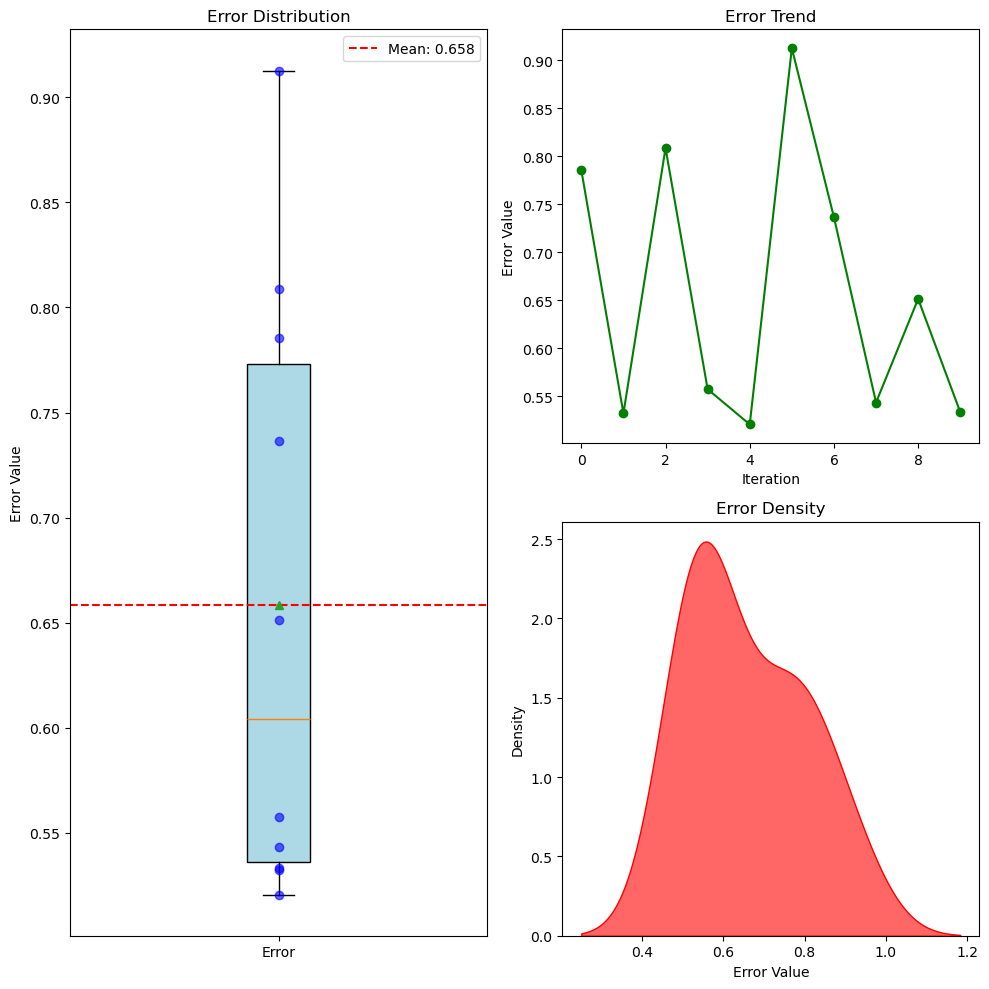

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

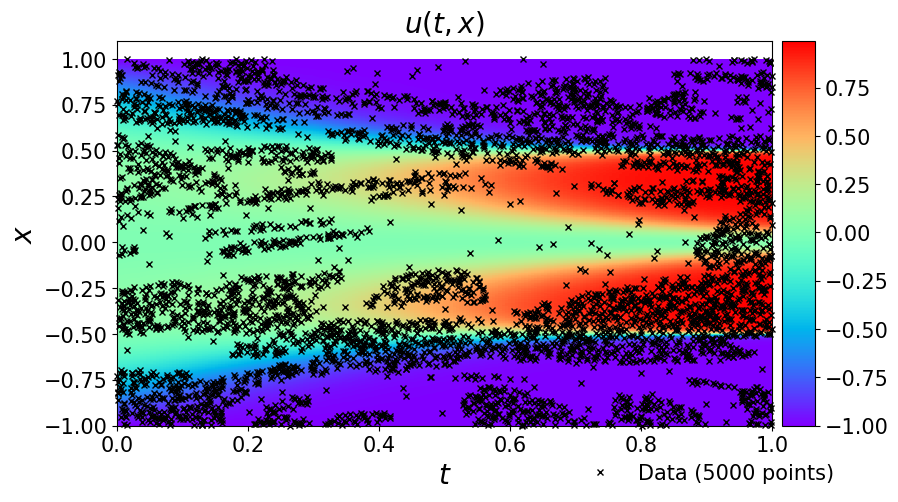

In [10]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


16908


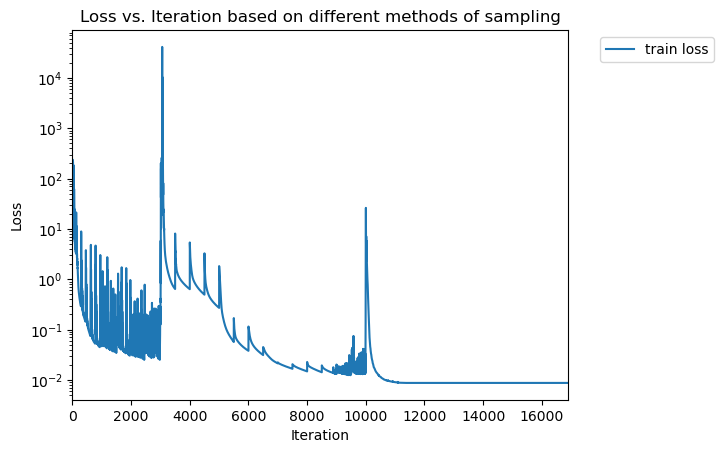

In [12]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


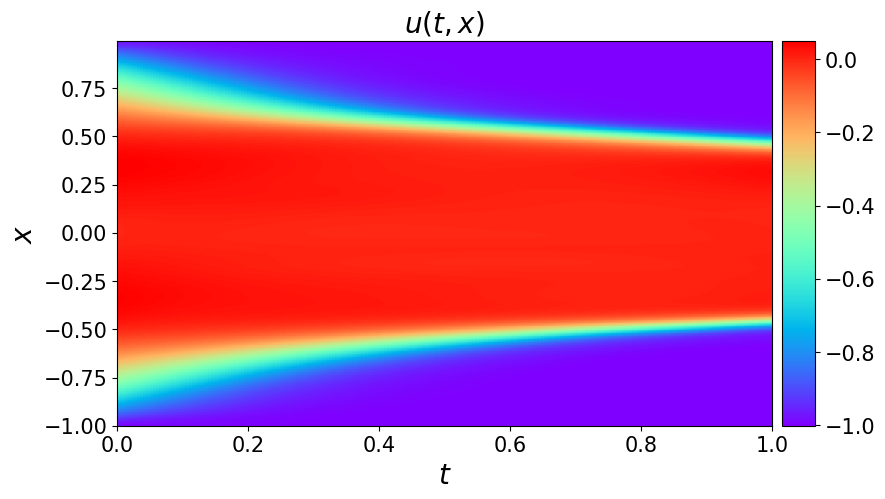

In [13]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

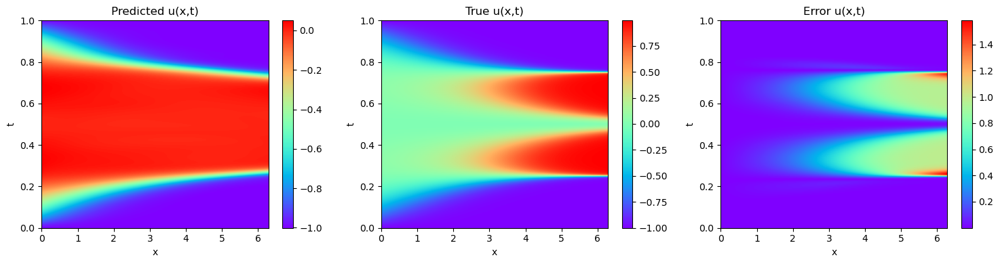

In [14]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [15]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

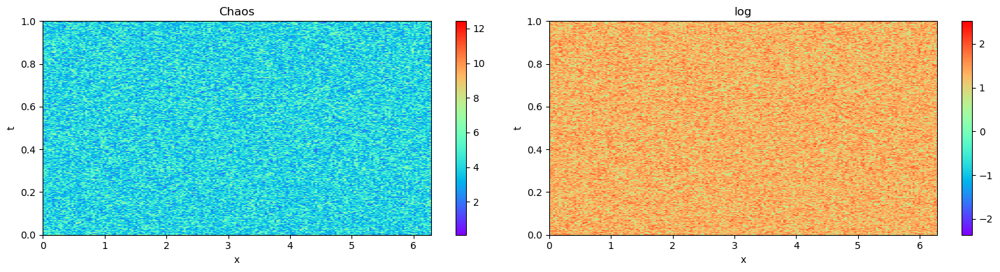

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()